# Surrogate NN model training

The NN surrogate model aims to replace the following map:
$$\mathbf{f}  : (C, D) \rightarrow Q(x), \quad F(x) = \mathbb{P}(X\le x), \quad x \in \mathbb{R},$$
where
$$\text{iCDF}: Q(p)=F^{-1}(p) = \min\{x\in \mathbb{R}: F(x)\ge p \}, \quad p\in (0,1).$$

Input: $(C, D)$, fracture density $C \in [2.5, 6.5]$, fractal dimension $D \in [1, 1.3]$

Output: discrete $Q(x), F^{-1}(0.01), F^{-1}(0.03), ..., F^{-1}(0.99)$, 50 points in total.

In [1]:
%%capture
!pip install ray
import ray
from ray import tune
from ray.tune import CLIReporter
from ray.tune.schedulers import ASHAScheduler

In [2]:
import pickle as pkl
import numpy as np
from sklearn.neural_network import MLPRegressor
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import tensorflow as tf
import time
import random
from google.colab import drive
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import random_split
import torchvision
import torchvision.transforms as transforms
import torch.utils.data as utils
from torch.utils.data import DataLoader
from torch.utils.data import sampler
from torch.optim.lr_scheduler import ReduceLROnPlateau, StepLR, MultiStepLR
from torch.autograd import Variable
import torchvision.datasets as dset
import torchvision.transforms as T
from functools import partial
from google.colab import files
from datetime import datetime

drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
filename  = '/content/drive/MyDrive/RESEARCH_fracture/seeds20/CD_ICDF_SR.pkl'

with open(filename,'rb') as file:
  [C_d, P_cdf] = pkl.load(file, encoding='latin1') 
P_cdf = np.asarray(P_cdf)
C_d = np.asarray(C_d)
train_size = int(len(P_cdf)*0.8)
X, Y = np.asarray(P_cdf[:train_size]), np.asarray(C_d[:train_size])

print('length of input,', len(P_cdf))
print('length of output,', len(C_d))
print('dimension of input,',len(P_cdf[0]))
print('dimension of output,', len(C_d[0]))
print(C_d[0])

## append C^(1/d), C^(-d), C*d, and 1/d to the input array to create more features.
new_cd = np.concatenate(
    (
    C_d, np.array(
        [
          C_d[:,0]**(1/C_d[:,1]),  ## C^(1/d)
          C_d[:,0]**(-C_d[:,1]),   ## C^(-d)
          C_d[:,0]*C_d[:,1],       ## C*d
          1/C_d[:,1],              ## 1/d 
        ]
        ).T
     ), axis=1
)
new_cd.shape

length of input, 10000
length of output, 10000
dimension of input, 50
dimension of output, 2
[11.7480372   1.60689894]


(10000, 6)

## load data

In [4]:
## data loader
def load_data(new_cd, P_cdf, num_training, num_test):
  """
  load training data from the pickled list: new_cd, P_cdf, divide the training 
  and test data to 8:2, the training set will be split again into 8:2 (train/validate) 
  in hyper-parameter tuning stage
  """

  # Subsample the data
  tensor_X = torch.stack([torch.Tensor(np.reshape(i,(6,))) for i in new_cd]) # transform to torch tensors
  tensor_y = torch.stack([torch.Tensor(np.reshape(i,(50,))) for i in P_cdf])

  test_size = num_training + num_test
  X_train = tensor_X[:num_training]
  y_train = tensor_y[:num_training]

  x_test = tensor_X[num_training:test_size]
  y_test = tensor_y[num_training:test_size]

  train_dataset = torch.utils.data.TensorDataset(X_train, y_train)
  test_dataset = torch.utils.data.TensorDataset(x_test, y_test)

  print('loaded data.')
  return train_dataset, test_dataset

trainset, testset = load_data(
    new_cd, P_cdf, 
    num_training=int(len(new_cd)*0.8), 
    num_test=int(len(new_cd)*0.2),
    )

loaded data.


## ray hyperparameter searching

In [5]:
##define Net with flexible number of layers, number of neurons in each layer,
class Net(nn.Module):
    def __init__(self, ls=[20 for i in range(20)], n_l=5):
        super(Net, self).__init__()
        self.fc1 = nn.Linear(6, ls[0])
        self.linears = nn.ModuleList(
            [nn.Linear(ls[i], ls[i+1]) for i in range(n_l-1)]
            )
        self.fcend = nn.Linear(ls[n_l-1], 50)

    def forward(self, x):
        x = F.relu(self.fc1(x))
        for i, l in enumerate(self.linears):
            x = F.relu(l(x))
        x = F.relu(self.fcend(x))
        return x

def hel_loss(P, Q):
  return torch.mean(torch.sqrt(torch.sum((torch.sqrt(P) - torch.sqrt(Q))**2, dim=1)))

def train(config, max_num_epochs=1000):
    random.seed(888)
    np.random.seed(888)
    net = Net(config['ls'], config['n_l'])

    device = "cpu"
    if torch.cuda.is_available():
        device = "cuda:0"
    net.to(device) 
    # optimizer = optim.SGD(net.parameters(), lr=config["lr"], momentum=0.9)
    if config['opt'] == 'rms':
      optimizer = optim.RMSprop(net.parameters(), lr=config["lr"])
    elif config['opt'] == 'sgd':
      optimizer = optim.SGD(net.parameters(), lr=config["lr"], momentum=0.9, nesterov=True)
    elif config['opt'] == 'ada':
      optimizer = optim.Adagrad(net.parameters(), lr=config["lr"])
    elif config['opt'] == 'adam':
      optimizer = optim.Adam(net.parameters(), lr=config["lr"], betas=(0.9, 0.999), amsgrad=False)

    train_abs = int(len(trainset) * 0.8)
    train_subset, val_subset = random_split(
        trainset, [train_abs, len(trainset) - train_abs])

    trainloader = torch.utils.data.DataLoader(
        train_subset,
        batch_size=500,
        shuffle=True,
        num_workers=0)
    valloader = torch.utils.data.DataLoader(
        val_subset,
        batch_size=500,
        shuffle=True,
        num_workers=0)
    
    for epoch in range(max_num_epochs):  # loop over the dataset multiple times
      running_loss = 0.0
      for i, data in enumerate(trainloader, 0):
          # get the inputs; data is a list of [inputs, targets]
          inputs, targets = data
          inputs, targets = inputs.to(device), targets.to(device)

          # zero the parameter gradients
          optimizer.zero_grad()

          # forward + backward + optimize
          outputs = net(inputs)
          loss = hel_loss(outputs, targets) #use hellinger distance as the loss
          loss.backward()
          optimizer.step()

          # print statistics
          running_loss += loss.item()


      # Validation loss
      val_loss = 0.0
      val_steps = 0

      for i, data in enumerate(valloader, 0):
          with torch.no_grad():
              inputs, targets = data
              inputs, targets = inputs.to(device), targets.to(device)
              outputs = net(inputs)

              loss = hel_loss(outputs, targets)
              # loss = nn.MSELoss()
              # loss = loss(outputs, targets)
              val_loss += loss.cpu().numpy()
              val_steps += 1
      if (epoch+1)%100 == 0:
        with tune.checkpoint_dir(epoch) as checkpoint_dir:
            path = os.path.join(checkpoint_dir, "checkpoint")
            torch.save((net.state_dict(), optimizer.state_dict()), path)

        tune.report(loss=(val_loss / val_steps))
    print("Finished Training")
  
def test_loss(net, device="cpu"):

    testloader = torch.utils.data.DataLoader(
        testset, batch_size=len(testset), shuffle=False, num_workers=2)

    with torch.no_grad():
      for data in testloader: #only 1 batch
        inputs, targets = data
        inputs, targets = inputs.to(device), targets.to(device)
        outputs = net(inputs)
        test_loss = nn.MSEloss(outputs, targets)
    return test_loss

In [6]:
def plot_prediction(outputs, targets, inputs, title=''):

    fig1, axs = plt.subplots(len(targets)//4, 4, figsize=(12,8), 
                             sharey = 'row', sharex=True,
                             constrained_layout=True)
    axs = axs.flat
    ylims = [
              [np.min(targets[:4,])-0.2, np.max(targets[:4,])+0.2],
              [np.min(targets[4:,])-0.2, np.max(targets[4:,])+0.2]
    ]
    zeros_ind = outputs==0.   
    for ax, i, out, tar in zip(axs, range(len(outputs)), outputs, targets):
        CD =  inputs[i][:2]
        ax.set_title('p={:.2f}, a={:.2f}'.format(CD[0], CD[1]))
        x = np.linspace(0.01, 0.99, 50)
        ax.plot(x, tar, 'o', label='truth')
        ax.plot(x, out, '*', label='prediction')
        ylim = ylims[0] if i<4 else ylims[1]
        if np.any(zeros_ind):
            ax.plot(x[zeros_ind[i]], 
                    [ylim[0]+0.1 for i in range(len(x[zeros_ind[i]]))],
                    'x', color='r', label='zero predictions')

        ax.set_ylim(ylim)
        ax.set_xlabel('ICDF')
    ax.legend(loc='upper left', shadow=True, fontsize='x-large')
    axs[0].set_ylabel('log(partical arrive time)')
    axs[4].set_ylabel('log(partical arrive time)')
    plt.show()
    fig1.savefig(title+'/test.pdf')
    return
def non_decreasing(L):
    return all(x<=y for x,y in zip(L,L[1:]))
def plot_in1(outputs, targets, inputs, title='', fig_title=''):
    assert non_decreasing(targets[0]), 'P_cdf not increasing'

    fig1, ax = plt.subplots(1, 1, figsize=(5,4), constrained_layout=True,)
    for i, out, tar in zip(range(len(outputs)), outputs, targets):
        # ax.set_title('C, d= %s' %str(inputs.cpu().detach().numpy()[i][:2]))
        x = np.linspace(0.01, 0.99, 50)
        ax.plot(x, tar, '.', ls ='-', ms=1, label='truth')
        ax.plot(x, out, '*', label='prediction')
    ax.set_ylabel('log(partical arrive time)')
    ax.set_xlabel('ICDF')
    # ax.legend()
    plt.show()
    if fig_title == '':
        fig1.savefig(title+'/test_in1.pdf')
    else:
        fig1.savefig(title+'/'+fig_title+'.pdf')
    return

### If training again

In [ ]:
now = datetime.now() # current date and time
filename = now.strftime("%m-%d-%Y-%H-%M-%S")
path = '/content/drive/MyDrive/RESEARCH_fracture/net_files/checkpoint_corrected/'+filename
if not os.path.exists(path):
    os.makedirs(path)

In [ ]:
! rm -rf ~/ray_results
ray.shutdown()  # Restart Ray defensively in case the ray connection is lost. 
ray.init(log_to_driver=False)
random.seed(888)
np.random.seed(888)
start = time.time()
num_samples=2500
gpus_per_trial=0.2
# trainset, testset = load_data(
#     new_cd, P_cdf, 
#     num_training=int(len(new_cd)*0.8), 
#     num_test=int(len(new_cd)*0.2),
#     )
config = {
    "n_l": tune.sample_from(lambda _: np.random.randint(3, 7)),
    # "ls": [tune.choice([100, 200, 500]) for i in range(5)],
    "ls": [tune.sample_from(lambda _: 2 ** np.random.randint(4, 10)) for i in range(7)],
    "lr": tune.loguniform(1e-4, 1e-2),
    # "batch_size": tune.choice([100, 200, 500]),
    "opt": tune.choice(['rms', 'sgd', 'ada', 'adam']),
}
scheduler = ASHAScheduler(
    metric="loss",
    mode="min",
    max_t=1000,
    grace_period=1,
    reduction_factor=2
    )
reporter = CLIReporter(
    # parameter_columns=["l1", "l2", "lr", "batch_size"],
    metric_columns=["loss", "training_iteration"])
result = tune.run(
    partial(train,),
    resources_per_trial={"cpu": 1, "gpu": gpus_per_trial},
    config=config,
    num_samples=num_samples,
    scheduler=scheduler,
    progress_reporter=reporter)

best_trial = result.get_best_trial("loss", "min", "last")
print("Best trial config: {}".format(best_trial.config))
print("Best trial final validation loss: {}".format(
best_trial.last_result["loss"]))

best_trained_model = Net(
    ls=best_trial.config["ls"],
    n_l=best_trial.config["n_l"],
    )
device = "cpu"
if torch.cuda.is_available():
    device = "cuda:0"
    if gpus_per_trial > 1:
        best_trained_model = nn.DataParallel(best_trained_model)
best_trained_model.to(device)

best_checkpoint_dir = best_trial.checkpoint.dir_or_data
model_state, optimizer_state = torch.load(best_checkpoint_dir+"/checkpoint")
best_trained_model.load_state_dict(model_state)

print('time: ', time.time()-start)


torch.save(
    {
        # 'max_num_epochs': max_num_epochs,
        'model_state_dict': best_trained_model.state_dict(),
        'loss': best_trial.last_result["loss"],
        'Best trial config': best_trial.config,
    },
    path+'/ckp.pt'
)

2023-01-06 14:49:23,570	INFO worker.py:1538 -- Started a local Ray instance.
2023-01-06 14:49:24,899	INFO tensorboardx.py:170 -- pip install "ray[tune]" to see TensorBoard files.
2023-01-06 14:49:24,901	WARNING callback.py:108 -- The TensorboardX logger cannot be instantiated because either TensorboardX or one of it's dependencies is not installed. Please make sure you have the latest version of TensorboardX installed: `pip install -U tensorboardx`


== Status ==
Current time: 2023-01-06 14:49:25 (running for 00:00:00.58)
Memory usage on this node: 3.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: None | Iter 4.000: None | Iter 2.000: None | Iter 1.000: None
Resources requested: 1.0/12 CPUs, 0.2/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 16/2500 (15 PENDING, 1 RUNNING)
+-------------------+----------+------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+
| Trial name        | status   | loc              |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |
|-------------------+----------+------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------|
| train_500b

Trial name,date,done,episodes_total,experiment_id,hostname,iterations_since_restore,loss,node_ip,pid,should_checkpoint,time_since_restore,time_this_iter_s,time_total_s,timestamp,timesteps_since_restore,timesteps_total,training_iteration,trial_id,warmup_time
train_500bc_00000,2023-01-06_14-49-58,True,,fc5d6c62a8cd42b89fb6aab3bd6a15d7,9518d17dd5d4,2,9.55813,172.28.0.12,5472,True,29.8851,10.8969,29.8851,1673016598,0,,2,500bc_00000,0.00318837
train_500bc_00001,2023-01-06_14-51-30,True,,a68b19fbff0c408780f77b4e77f25007,9518d17dd5d4,10,7.30363,172.28.0.12,5556,True,119.321,10.9974,119.321,1673016690,0,,10,500bc_00001,0.003438
train_500bc_00002,2023-01-06_14-49-47,True,,7ec18b7b56f14499a9f69da95676f11b,9518d17dd5d4,1,11.4337,172.28.0.12,5557,True,15.6469,15.6469,15.6469,1673016587,0,,1,500bc_00002,0.00333524
train_500bc_00003,2023-01-06_14-51-17,True,,9efaab4a3dcf4f32975b936b9573df70,9518d17dd5d4,10,8.75308,172.28.0.12,5559,True,105.801,9.64339,105.801,1673016677,0,,10,500bc_00003,0.00393033
train_500bc_00004,2023-01-06_14-49-46,True,,08e10a2571b74335b9fcb80fb11e6f22,9518d17dd5d4,1,10.7812,172.28.0.12,5561,True,15.2657,15.2657,15.2657,1673016586,0,,1,500bc_00004,0.00333095
train_500bc_00005,2023-01-06_14-50-04,True,,1454cc7d7cee477598e2dfa809bcd31e,9518d17dd5d4,1,11.9482,172.28.0.12,5948,True,13.8656,13.8656,13.8656,1673016604,0,,1,500bc_00005,0.00363564
train_500bc_00006,2023-01-06_14-50-03,True,,8c9cb225d71d4d54af0b921fca1516d4,9518d17dd5d4,1,11.3744,172.28.0.12,5949,True,13.6383,13.6383,13.6383,1673016603,0,,1,500bc_00006,0.00359869
train_500bc_00007,2023-01-06_14-50-14,True,,9a78406861ab43808cf4dbdf5603c514,9518d17dd5d4,1,12.2781,172.28.0.12,6147,True,13.169,13.169,13.169,1673016614,0,,1,500bc_00007,0.00352168
train_500bc_00008,2023-01-06_14-50-19,True,,4984704aaae940a0820709063a5db1f1,9518d17dd5d4,1,11.9697,172.28.0.12,6251,True,12.4489,12.4489,12.4489,1673016619,0,,1,500bc_00008,0.00349784
train_500bc_00009,2023-01-06_14-50-57,True,,9749868d451a412ca53e234b700d68a6,9518d17dd5d4,4,8.46564,172.28.0.12,6252,True,49.8323,11.212,49.8323,1673016657,0,,4,500bc_00009,0.00328994


Streaming output truncated to the last 5000 lines.
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -7.0503246784210205 | Iter 4.000: -7.777038156986237 | Iter 2.000: -8.71532952785492 | Iter 1.000: -10.090444326400757
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 755/2500 (16 PENDING, 5 RUNNING, 734 TERMINATED)
+-------------------+------------+-------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc               |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-------------------+------------+-------------------+-------------+--------+--------+--------+--------+----

2023-01-06 16:36:27,501	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.503 s, which may be a performance bottleneck.
2023-01-06 16:36:27,503	WARNING util.py:244 -- The `process_trial_result` operation took 0.506 s, which may be a performance bottleneck.
2023-01-06 16:36:27,505	WARNING util.py:244 -- Processing trial results took 0.507 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 16:36:27,506	WARNING util.py:244 -- The `process_trial_result` operation took 0.509 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 16:36:27 (running for 01:47:02.64)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=778
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.954850792884827 | Iter 4.000: -7.747437119483948 | Iter 2.000: -8.74178433418274 | Iter 1.000: -10.058716297149658
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 872/2500 (16 PENDING, 5 RUNNING, 851 TERMINATED)
+-------------------+------------+-------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc               |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-------

2023-01-06 16:46:08,900	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.515 s, which may be a performance bottleneck.
2023-01-06 16:46:08,903	WARNING util.py:244 -- The `process_trial_result` operation took 0.518 s, which may be a performance bottleneck.
2023-01-06 16:46:08,904	WARNING util.py:244 -- Processing trial results took 0.519 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 16:46:08,905	WARNING util.py:244 -- The `process_trial_result` operation took 0.520 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 16:46:09 (running for 01:56:44.21)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=849
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.918796896934509 | Iter 4.000: -7.747437119483948 | Iter 2.000: -8.717666983604431 | Iter 1.000: -10.063883066177368
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 950/2500 (16 PENDING, 5 RUNNING, 929 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|----

2023-01-06 16:56:03,951	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.565 s, which may be a performance bottleneck.
2023-01-06 16:56:03,953	WARNING util.py:244 -- The `process_trial_result` operation took 0.567 s, which may be a performance bottleneck.
2023-01-06 16:56:03,954	WARNING util.py:244 -- Processing trial results took 0.568 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 16:56:03,956	WARNING util.py:244 -- The `process_trial_result` operation took 0.570 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 16:56:05 (running for 02:06:40.92)
Memory usage on this node: 8.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=936
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8994927406311035 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.761232137680054 | Iter 1.000: -10.065099239349365
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1042/2500 (16 PENDING, 5 RUNNING, 1021 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 17:03:59,742	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.564 s, which may be a performance bottleneck.
2023-01-06 17:03:59,745	WARNING util.py:244 -- The `process_trial_result` operation took 0.567 s, which may be a performance bottleneck.
2023-01-06 17:03:59,746	WARNING util.py:244 -- Processing trial results took 0.569 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 17:03:59,748	WARNING util.py:244 -- The `process_trial_result` operation took 0.570 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 17:03:59 (running for 02:14:35.01)
Memory usage on this node: 9.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=989
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.857135474681854 | Iter 4.000: -7.697056829929352 | Iter 2.000: -8.759346723556519 | Iter 1.000: -10.077677488327026
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1102/2500 (16 PENDING, 5 RUNNING, 1081 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 17:08:21,794	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.595 s, which may be a performance bottleneck.
2023-01-06 17:08:21,797	WARNING util.py:244 -- The `process_trial_result` operation took 0.598 s, which may be a performance bottleneck.
2023-01-06 17:08:21,799	WARNING util.py:244 -- Processing trial results took 0.599 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 17:08:21,800	WARNING util.py:244 -- The `process_trial_result` operation took 0.601 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 17:08:21 (running for 02:18:56.93)
Memory usage on this node: 9.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=1022
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.868788063526154 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.759921789169312 | Iter 1.000: -10.062666893005371
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1137/2500 (16 PENDING, 5 RUNNING, 1116 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 17:12:24,203	WARNING util.py:244 -- The `process_trial_result` operation took 0.500 s, which may be a performance bottleneck.
2023-01-06 17:12:24,205	WARNING util.py:244 -- Processing trial results took 0.502 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 17:12:24,206	WARNING util.py:244 -- The `process_trial_result` operation took 0.504 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 17:12:24 (running for 02:22:59.35)
Memory usage on this node: 9.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=1062
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.868788063526154 | Iter 4.000: -7.732874155044556 | Iter 2.000: -8.766706228256226 | Iter 1.000: -10.063883066177368
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1177/2500 (16 PENDING, 5 RUNNING, 1156 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 17:13:44,263	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.599 s, which may be a performance bottleneck.
2023-01-06 17:13:44,266	WARNING util.py:244 -- The `process_trial_result` operation took 0.603 s, which may be a performance bottleneck.
2023-01-06 17:13:44,267	WARNING util.py:244 -- Processing trial results took 0.604 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 17:13:44,269	WARNING util.py:244 -- The `process_trial_result` operation took 0.606 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 17:13:44 (running for 02:24:19.54)
Memory usage on this node: 9.2/83.5 GiB 
Using AsyncHyperBand: num_stopped=1071
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.862419366836548 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.774158716201782 | Iter 1.000: -10.058716297149658
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1188/2500 (16 PENDING, 5 RUNNING, 1167 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 17:17:15,591	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.710 s, which may be a performance bottleneck.
2023-01-06 17:17:15,595	WARNING util.py:244 -- The `process_trial_result` operation took 0.714 s, which may be a performance bottleneck.
2023-01-06 17:17:15,596	WARNING util.py:244 -- Processing trial results took 0.715 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 17:17:15,599	WARNING util.py:244 -- The `process_trial_result` operation took 0.718 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 17:17:17 (running for 02:27:52.30)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1095
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.854641556739807 | Iter 4.000: -7.731651425361633 | Iter 2.000: -8.766706228256226 | Iter 1.000: -10.060734510421753
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1214/2500 (16 PENDING, 5 RUNNING, 1193 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 17:23:37,582	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.639 s, which may be a performance bottleneck.
2023-01-06 17:23:37,585	WARNING util.py:244 -- The `process_trial_result` operation took 0.643 s, which may be a performance bottleneck.
2023-01-06 17:23:37,587	WARNING util.py:244 -- Processing trial results took 0.644 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 17:23:37,589	WARNING util.py:244 -- The `process_trial_result` operation took 0.646 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 17:23:37 (running for 02:34:12.74)
Memory usage on this node: 8.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1144
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.868788063526154 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.785410404205322 | Iter 1.000: -10.05125617980957
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1265/2500 (16 PENDING, 5 RUNNING, 1244 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 17:27:36,145	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.620 s, which may be a performance bottleneck.
2023-01-06 17:27:36,148	WARNING util.py:244 -- The `process_trial_result` operation took 0.624 s, which may be a performance bottleneck.
2023-01-06 17:27:36,149	WARNING util.py:244 -- Processing trial results took 0.625 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 17:27:36,150	WARNING util.py:244 -- The `process_trial_result` operation took 0.626 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 17:27:36 (running for 02:38:11.28)
Memory usage on this node: 9.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=1173
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.875156760215759 | Iter 4.000: -7.74253386259079 | Iter 2.000: -8.780773758888245 | Iter 1.000: -10.03419804573059
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1295/2500 (16 PENDING, 5 RUNNING, 1274 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 17:28:27,802	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.507 s, which may be a performance bottleneck.
2023-01-06 17:28:27,805	WARNING util.py:244 -- The `process_trial_result` operation took 0.510 s, which may be a performance bottleneck.
2023-01-06 17:28:27,807	WARNING util.py:244 -- Processing trial results took 0.511 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 17:28:27,808	WARNING util.py:244 -- The `process_trial_result` operation took 0.513 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 17:28:31 (running for 02:39:06.36)
Memory usage on this node: 9.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=1181
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.875156760215759 | Iter 4.000: -7.735962212085724 | Iter 2.000: -8.785482048988342 | Iter 1.000: -10.03419804573059
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1304/2500 (16 PENDING, 5 RUNNING, 1283 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 17:30:18,290	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.513 s, which may be a performance bottleneck.
2023-01-06 17:30:18,293	WARNING util.py:244 -- The `process_trial_result` operation took 0.517 s, which may be a performance bottleneck.
2023-01-06 17:30:18,295	WARNING util.py:244 -- Processing trial results took 0.518 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 17:30:18,296	WARNING util.py:244 -- The `process_trial_result` operation took 0.520 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 17:30:25 (running for 02:41:00.29)
Memory usage on this node: 9.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=1187
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.862419366836548 | Iter 4.000: -7.731651425361633 | Iter 2.000: -8.776137113571167 | Iter 1.000: -10.02052354812622
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1311/2500 (16 PENDING, 5 RUNNING, 1290 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 17:31:27,926	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.530 s, which may be a performance bottleneck.
2023-01-06 17:31:27,929	WARNING util.py:244 -- The `process_trial_result` operation took 0.534 s, which may be a performance bottleneck.
2023-01-06 17:31:27,930	WARNING util.py:244 -- Processing trial results took 0.535 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 17:31:27,931	WARNING util.py:244 -- The `process_trial_result` operation took 0.536 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 17:31:32 (running for 02:42:07.51)
Memory usage on this node: 8.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1195
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.862419366836548 | Iter 4.000: -7.731651425361633 | Iter 2.000: -8.772180318832397 | Iter 1.000: -10.02574896812439
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1321/2500 (16 PENDING, 5 RUNNING, 1300 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 17:33:06,442	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.717 s, which may be a performance bottleneck.
2023-01-06 17:33:06,444	WARNING util.py:244 -- The `process_trial_result` operation took 0.720 s, which may be a performance bottleneck.
2023-01-06 17:33:06,447	WARNING util.py:244 -- Processing trial results took 0.723 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 17:33:06,449	WARNING util.py:244 -- The `process_trial_result` operation took 0.724 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 17:33:07 (running for 02:43:42.49)
Memory usage on this node: 5.3/83.5 GiB 
Using AsyncHyperBand: num_stopped=1214
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.862419366836548 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.785410404205322 | Iter 1.000: -10.035513877868652
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1340/2500 (15 PENDING, 5 RUNNING, 1320 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 17:34:15,923	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.503 s, which may be a performance bottleneck.
2023-01-06 17:34:15,926	WARNING util.py:244 -- The `process_trial_result` operation took 0.507 s, which may be a performance bottleneck.
2023-01-06 17:34:15,927	WARNING util.py:244 -- Processing trial results took 0.508 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 17:34:15,928	WARNING util.py:244 -- The `process_trial_result` operation took 0.509 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 17:34:21 (running for 02:44:56.75)
Memory usage on this node: 9.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=1228
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.862419366836548 | Iter 4.000: -7.735962212085724 | Iter 2.000: -8.785553693771362 | Iter 1.000: -10.05125617980957
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1355/2500 (16 PENDING, 5 RUNNING, 1334 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 17:36:12,448	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.532 s, which may be a performance bottleneck.
2023-01-06 17:36:12,451	WARNING util.py:244 -- The `process_trial_result` operation took 0.535 s, which may be a performance bottleneck.
2023-01-06 17:36:12,454	WARNING util.py:244 -- Processing trial results took 0.538 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 17:36:12,455	WARNING util.py:244 -- The `process_trial_result` operation took 0.540 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 17:36:18 (running for 02:46:53.98)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1246
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.859925448894501 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.786781907081604 | Iter 1.000: -10.060394763946533
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1374/2500 (16 PENDING, 5 RUNNING, 1353 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 17:36:24,218	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.512 s, which may be a performance bottleneck.
2023-01-06 17:36:24,221	WARNING util.py:244 -- The `process_trial_result` operation took 0.515 s, which may be a performance bottleneck.
2023-01-06 17:36:24,223	WARNING util.py:244 -- Processing trial results took 0.517 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 17:36:24,224	WARNING util.py:244 -- The `process_trial_result` operation took 0.518 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 17:36:24 (running for 02:46:59.37)
Memory usage on this node: 7.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1248
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.859925448894501 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.785553693771362 | Iter 1.000: -10.060734510421753
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1376/2500 (16 PENDING, 5 RUNNING, 1355 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 17:36:57,352	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.653 s, which may be a performance bottleneck.
2023-01-06 17:36:57,355	WARNING util.py:244 -- The `process_trial_result` operation took 0.657 s, which may be a performance bottleneck.
2023-01-06 17:36:57,356	WARNING util.py:244 -- Processing trial results took 0.658 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 17:36:57,358	WARNING util.py:244 -- The `process_trial_result` operation took 0.660 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 17:36:57 (running for 02:47:32.70)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1251
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.857431530952454 | Iter 4.000: -7.74253386259079 | Iter 2.000: -8.785482048988342 | Iter 1.000: -10.060394763946533
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1379/2500 (16 PENDING, 5 RUNNING, 1358 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 17:37:48,622	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.518 s, which may be a performance bottleneck.
2023-01-06 17:37:48,626	WARNING util.py:244 -- The `process_trial_result` operation took 0.522 s, which may be a performance bottleneck.
2023-01-06 17:37:48,627	WARNING util.py:244 -- Processing trial results took 0.523 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 17:37:48,629	WARNING util.py:244 -- The `process_trial_result` operation took 0.525 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 17:37:48 (running for 02:48:23.77)
Memory usage on this node: 8.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1259
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.857431530952454 | Iter 4.000: -7.74253386259079 | Iter 2.000: -8.788010120391846 | Iter 1.000: -10.060394763946533
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1387/2500 (16 PENDING, 5 RUNNING, 1366 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 17:39:24,994	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.691 s, which may be a performance bottleneck.
2023-01-06 17:39:24,998	WARNING util.py:244 -- The `process_trial_result` operation took 0.695 s, which may be a performance bottleneck.
2023-01-06 17:39:25,000	WARNING util.py:244 -- Processing trial results took 0.697 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 17:39:25,001	WARNING util.py:244 -- The `process_trial_result` operation took 0.698 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 17:39:26 (running for 02:50:01.93)
Memory usage on this node: 6.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1276
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.862419366836548 | Iter 4.000: -7.74253386259079 | Iter 2.000: -8.79421079158783 | Iter 1.000: -10.058716297149658
Resources requested: 3.0/12 CPUs, 0.6000000000000001/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1402/2500 (16 PENDING, 3 RUNNING, 1383 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_i

2023-01-06 17:40:46,536	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.505 s, which may be a performance bottleneck.
2023-01-06 17:40:46,538	WARNING util.py:244 -- The `process_trial_result` operation took 0.508 s, which may be a performance bottleneck.
2023-01-06 17:40:46,539	WARNING util.py:244 -- Processing trial results took 0.509 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 17:40:46,541	WARNING util.py:244 -- The `process_trial_result` operation took 0.511 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 17:40:46 (running for 02:51:21.85)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1287
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.862419366836548 | Iter 4.000: -7.735962212085724 | Iter 2.000: -8.795329093933105 | Iter 1.000: -10.060394763946533
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1416/2500 (16 PENDING, 5 RUNNING, 1395 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 17:40:54,660	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.557 s, which may be a performance bottleneck.
2023-01-06 17:40:54,663	WARNING util.py:244 -- The `process_trial_result` operation took 0.560 s, which may be a performance bottleneck.
2023-01-06 17:40:54,666	WARNING util.py:244 -- Processing trial results took 0.563 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 17:40:54,667	WARNING util.py:244 -- The `process_trial_result` operation took 0.564 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 17:40:54 (running for 02:51:29.84)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1288
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.862419366836548 | Iter 4.000: -7.735962212085724 | Iter 2.000: -8.795329093933105 | Iter 1.000: -10.060394763946533
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1417/2500 (16 PENDING, 5 RUNNING, 1396 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 17:42:24,090	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.696 s, which may be a performance bottleneck.
2023-01-06 17:42:24,092	WARNING util.py:244 -- The `process_trial_result` operation took 0.698 s, which may be a performance bottleneck.
2023-01-06 17:42:24,093	WARNING util.py:244 -- Processing trial results took 0.700 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 17:42:24,095	WARNING util.py:244 -- The `process_trial_result` operation took 0.702 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 17:42:28 (running for 02:53:04.08)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1297
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.868788063526154 | Iter 4.000: -7.731651425361633 | Iter 2.000: -8.793406009674072 | Iter 1.000: -10.060394763946533
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1427/2500 (16 PENDING, 5 RUNNING, 1406 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 17:45:03,548	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.515 s, which may be a performance bottleneck.
2023-01-06 17:45:03,551	WARNING util.py:244 -- The `process_trial_result` operation took 0.518 s, which may be a performance bottleneck.
2023-01-06 17:45:03,552	WARNING util.py:244 -- Processing trial results took 0.520 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 17:45:03,554	WARNING util.py:244 -- The `process_trial_result` operation took 0.521 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 17:45:05 (running for 02:55:40.93)
Memory usage on this node: 7.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=1317
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.868788063526154 | Iter 4.000: -7.731651425361633 | Iter 2.000: -8.795329093933105 | Iter 1.000: -10.058716297149658
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1449/2500 (16 PENDING, 5 RUNNING, 1428 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 17:45:08,175	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.699 s, which may be a performance bottleneck.
2023-01-06 17:45:08,178	WARNING util.py:244 -- The `process_trial_result` operation took 0.702 s, which may be a performance bottleneck.
2023-01-06 17:45:08,179	WARNING util.py:244 -- Processing trial results took 0.703 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 17:45:08,180	WARNING util.py:244 -- The `process_trial_result` operation took 0.704 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 17:45:15 (running for 02:55:50.83)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1319
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.868788063526154 | Iter 4.000: -7.731651425361633 | Iter 2.000: -8.795329093933105 | Iter 1.000: -10.060394763946533
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1451/2500 (16 PENDING, 5 RUNNING, 1430 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 17:47:01,673	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.530 s, which may be a performance bottleneck.
2023-01-06 17:47:01,676	WARNING util.py:244 -- The `process_trial_result` operation took 0.533 s, which may be a performance bottleneck.
2023-01-06 17:47:01,678	WARNING util.py:244 -- Processing trial results took 0.535 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 17:47:01,679	WARNING util.py:244 -- The `process_trial_result` operation took 0.536 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 17:47:06 (running for 02:57:41.83)
Memory usage on this node: 9.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=1333
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.875156760215759 | Iter 4.000: -7.732874155044556 | Iter 2.000: -8.795642614364624 | Iter 1.000: -10.045790672302246
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1465/2500 (16 PENDING, 5 RUNNING, 1444 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 17:47:54,130	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.736 s, which may be a performance bottleneck.
2023-01-06 17:47:54,132	WARNING util.py:244 -- The `process_trial_result` operation took 0.740 s, which may be a performance bottleneck.
2023-01-06 17:47:54,134	WARNING util.py:244 -- Processing trial results took 0.741 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 17:47:54,135	WARNING util.py:244 -- The `process_trial_result` operation took 0.743 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 17:47:54 (running for 02:58:29.30)
Memory usage on this node: 9.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=1340
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.875156760215759 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.796978950500488 | Iter 1.000: -10.036829710006714
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1472/2500 (16 PENDING, 5 RUNNING, 1451 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 17:47:56,171	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.559 s, which may be a performance bottleneck.
2023-01-06 17:47:56,173	WARNING util.py:244 -- The `process_trial_result` operation took 0.562 s, which may be a performance bottleneck.
2023-01-06 17:47:56,174	WARNING util.py:244 -- Processing trial results took 0.563 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 17:47:56,176	WARNING util.py:244 -- The `process_trial_result` operation took 0.565 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 17:48:01 (running for 02:58:36.92)
Memory usage on this node: 9.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=1343
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.875156760215759 | Iter 4.000: -7.74253386259079 | Iter 2.000: -8.798880338668823 | Iter 1.000: -10.036829710006714
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1475/2500 (16 PENDING, 5 RUNNING, 1454 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 17:49:05,093	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.516 s, which may be a performance bottleneck.
2023-01-06 17:49:05,096	WARNING util.py:244 -- The `process_trial_result` operation took 0.520 s, which may be a performance bottleneck.
2023-01-06 17:49:05,098	WARNING util.py:244 -- Processing trial results took 0.522 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 17:49:05,099	WARNING util.py:244 -- The `process_trial_result` operation took 0.523 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 17:49:10 (running for 02:59:45.43)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1351
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.875156760215759 | Iter 4.000: -7.735694169998169 | Iter 2.000: -8.80021619796753 | Iter 1.000: -10.03419804573059
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1483/2500 (16 PENDING, 5 RUNNING, 1462 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 17:49:38,534	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.510 s, which may be a performance bottleneck.
2023-01-06 17:49:38,537	WARNING util.py:244 -- The `process_trial_result` operation took 0.512 s, which may be a performance bottleneck.
2023-01-06 17:49:38,538	WARNING util.py:244 -- Processing trial results took 0.514 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 17:49:38,540	WARNING util.py:244 -- The `process_trial_result` operation took 0.516 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 17:49:43 (running for 03:00:18.25)
Memory usage on this node: 9.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1353
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.868788063526154 | Iter 4.000: -7.735694169998169 | Iter 2.000: -8.801552057266235 | Iter 1.000: -10.03132438659668
Resources requested: 4.0/12 CPUs, 0.8/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1485/2500 (16 PENDING, 4 RUNNING, 1465 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 17:50:14,897	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.647 s, which may be a performance bottleneck.
2023-01-06 17:50:14,900	WARNING util.py:244 -- The `process_trial_result` operation took 0.650 s, which may be a performance bottleneck.
2023-01-06 17:50:14,901	WARNING util.py:244 -- Processing trial results took 0.652 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 17:50:14,903	WARNING util.py:244 -- The `process_trial_result` operation took 0.654 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 17:50:15 (running for 03:00:51.09)
Memory usage on this node: 9.3/83.5 GiB 
Using AsyncHyperBand: num_stopped=1357
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.868788063526154 | Iter 4.000: -7.735694169998169 | Iter 2.000: -8.80021619796753 | Iter 1.000: -10.03132438659668
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1490/2500 (16 PENDING, 5 RUNNING, 1469 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 17:50:27,045	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.502 s, which may be a performance bottleneck.
2023-01-06 17:50:27,047	WARNING util.py:244 -- The `process_trial_result` operation took 0.506 s, which may be a performance bottleneck.
2023-01-06 17:50:27,049	WARNING util.py:244 -- Processing trial results took 0.507 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 17:50:27,051	WARNING util.py:244 -- The `process_trial_result` operation took 0.510 s, which may be a performance bottleneck.
2023-01-06 17:50:30,200	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.502 s, which may be a performance bottleneck.
2023-01-06 17:50:30,203	WARNING util.py:244 -- The `process_trial_result` operation took 0.506 s, which may be a performance bottleneck.
2023-01-06 17:50:30,205	WARNING util.py:244 -- Processing trial results took 0.507 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 17:50:30 (running for 03:01:05.37)
Memory usage on this node: 8.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1358
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.868788063526154 | Iter 4.000: -7.7373722195625305 | Iter 2.000: -8.798880338668823 | Iter 1.000: -10.027099847793579
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1492/2500 (16 PENDING, 5 RUNNING, 1471 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 17:50:38,941	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.502 s, which may be a performance bottleneck.
2023-01-06 17:50:38,944	WARNING util.py:244 -- The `process_trial_result` operation took 0.505 s, which may be a performance bottleneck.
2023-01-06 17:50:38,945	WARNING util.py:244 -- Processing trial results took 0.507 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 17:50:38,946	WARNING util.py:244 -- The `process_trial_result` operation took 0.508 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 17:50:42 (running for 03:01:17.37)
Memory usage on this node: 9.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1360
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.868788063526154 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.797929644584656 | Iter 1.000: -10.028450727462769
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1494/2500 (16 PENDING, 5 RUNNING, 1473 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 17:51:31,251	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.518 s, which may be a performance bottleneck.
2023-01-06 17:51:31,254	WARNING util.py:244 -- The `process_trial_result` operation took 0.522 s, which may be a performance bottleneck.
2023-01-06 17:51:31,255	WARNING util.py:244 -- Processing trial results took 0.523 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 17:51:31,256	WARNING util.py:244 -- The `process_trial_result` operation took 0.524 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 17:51:36 (running for 03:02:11.11)
Memory usage on this node: 8.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1367
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.868788063526154 | Iter 4.000: -7.7373722195625305 | Iter 2.000: -8.797929644584656 | Iter 1.000: -10.03132438659668
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1501/2500 (16 PENDING, 5 RUNNING, 1480 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 17:51:43,175	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.505 s, which may be a performance bottleneck.
2023-01-06 17:51:43,177	WARNING util.py:244 -- The `process_trial_result` operation took 0.508 s, which may be a performance bottleneck.
2023-01-06 17:51:43,179	WARNING util.py:244 -- Processing trial results took 0.510 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 17:51:43,181	WARNING util.py:244 -- The `process_trial_result` operation took 0.512 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 17:51:46 (running for 03:02:21.72)
Memory usage on this node: 7.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1369
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.875156760215759 | Iter 4.000: -7.7373722195625305 | Iter 2.000: -8.797929644584656 | Iter 1.000: -10.03132438659668
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1502/2500 (15 PENDING, 5 RUNNING, 1482 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 17:52:04,717	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.690 s, which may be a performance bottleneck.
2023-01-06 17:52:04,720	WARNING util.py:244 -- The `process_trial_result` operation took 0.694 s, which may be a performance bottleneck.
2023-01-06 17:52:04,723	WARNING util.py:244 -- Processing trial results took 0.697 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 17:52:04,724	WARNING util.py:244 -- The `process_trial_result` operation took 0.698 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 17:52:04 (running for 03:02:39.88)
Memory usage on this node: 9.2/83.5 GiB 
Using AsyncHyperBand: num_stopped=1372
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.868788063526154 | Iter 4.000: -7.7373722195625305 | Iter 2.000: -8.797929644584656 | Iter 1.000: -10.036829710006714
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1505/2500 (16 PENDING, 5 RUNNING, 1484 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 17:52:19,736	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.512 s, which may be a performance bottleneck.
2023-01-06 17:52:19,739	WARNING util.py:244 -- The `process_trial_result` operation took 0.515 s, which may be a performance bottleneck.
2023-01-06 17:52:19,740	WARNING util.py:244 -- Processing trial results took 0.517 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 17:52:19,742	WARNING util.py:244 -- The `process_trial_result` operation took 0.518 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 17:52:24 (running for 03:02:59.43)
Memory usage on this node: 8.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1373
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.868788063526154 | Iter 4.000: -7.735694169998169 | Iter 2.000: -8.798880338668823 | Iter 1.000: -10.03132438659668
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1507/2500 (16 PENDING, 5 RUNNING, 1486 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 17:53:25,302	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.509 s, which may be a performance bottleneck.
2023-01-06 17:53:25,305	WARNING util.py:244 -- The `process_trial_result` operation took 0.513 s, which may be a performance bottleneck.
2023-01-06 17:53:25,307	WARNING util.py:244 -- Processing trial results took 0.514 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 17:53:25,308	WARNING util.py:244 -- The `process_trial_result` operation took 0.515 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 17:53:25 (running for 03:04:00.45)
Memory usage on this node: 8.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1377
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.862419366836548 | Iter 4.000: -7.734284162521362 | Iter 2.000: -8.796310782432556 | Iter 1.000: -10.03419804573059
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1513/2500 (16 PENDING, 5 RUNNING, 1492 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 17:53:52,416	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.521 s, which may be a performance bottleneck.
2023-01-06 17:53:52,419	WARNING util.py:244 -- The `process_trial_result` operation took 0.524 s, which may be a performance bottleneck.
2023-01-06 17:53:52,420	WARNING util.py:244 -- Processing trial results took 0.525 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 17:53:52,422	WARNING util.py:244 -- The `process_trial_result` operation took 0.527 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 17:53:57 (running for 03:04:32.13)
Memory usage on this node: 9.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=1380
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.868788063526154 | Iter 4.000: -7.735694169998169 | Iter 2.000: -8.795329093933105 | Iter 1.000: -10.03132438659668
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1516/2500 (16 PENDING, 5 RUNNING, 1495 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 17:54:45,633	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.705 s, which may be a performance bottleneck.
2023-01-06 17:54:45,636	WARNING util.py:244 -- The `process_trial_result` operation took 0.709 s, which may be a performance bottleneck.
2023-01-06 17:54:45,638	WARNING util.py:244 -- Processing trial results took 0.710 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 17:54:45,639	WARNING util.py:244 -- The `process_trial_result` operation took 0.712 s, which may be a performance bottleneck.
2023-01-06 17:54:48,917	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.505 s, which may be a performance bottleneck.
2023-01-06 17:54:48,920	WARNING util.py:244 -- The `process_trial_result` operation took 0.509 s, which may be a performance bottleneck.
2023-01-06 17:54:48,922	WARNING util.py:244 -- Processing trial results took 0.510 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 17:54:49 (running for 03:05:24.27)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1385
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.862419366836548 | Iter 4.000: -7.735694169998169 | Iter 2.000: -8.795015573501587 | Iter 1.000: -10.028450727462769
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1522/2500 (16 PENDING, 5 RUNNING, 1501 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 17:54:49,954	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.508 s, which may be a performance bottleneck.
2023-01-06 17:54:49,957	WARNING util.py:244 -- The `process_trial_result` operation took 0.512 s, which may be a performance bottleneck.
2023-01-06 17:54:49,958	WARNING util.py:244 -- Processing trial results took 0.513 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 17:54:49,960	WARNING util.py:244 -- The `process_trial_result` operation took 0.515 s, which may be a performance bottleneck.
2023-01-06 17:54:50,542	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.577 s, which may be a performance bottleneck.
2023-01-06 17:54:50,545	WARNING util.py:244 -- The `process_trial_result` operation took 0.581 s, which may be a performance bottleneck.
2023-01-06 17:54:50,547	WARNING util.py:244 -- Processing trial results took 0.582 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 17:54:55 (running for 03:05:30.72)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1385
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.862419366836548 | Iter 4.000: -7.735694169998169 | Iter 2.000: -8.795015573501587 | Iter 1.000: -10.027099847793579
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1522/2500 (16 PENDING, 5 RUNNING, 1501 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 17:55:13,480	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.504 s, which may be a performance bottleneck.
2023-01-06 17:55:13,483	WARNING util.py:244 -- The `process_trial_result` operation took 0.506 s, which may be a performance bottleneck.
2023-01-06 17:55:13,485	WARNING util.py:244 -- Processing trial results took 0.508 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 17:55:13,486	WARNING util.py:244 -- The `process_trial_result` operation took 0.509 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 17:55:16 (running for 03:05:51.86)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1385
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.859925448894501 | Iter 4.000: -7.734284162521362 | Iter 2.000: -8.791184186935425 | Iter 1.000: -10.027099847793579
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1522/2500 (16 PENDING, 5 RUNNING, 1501 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 17:55:26,459	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.504 s, which may be a performance bottleneck.
2023-01-06 17:55:26,461	WARNING util.py:244 -- The `process_trial_result` operation took 0.507 s, which may be a performance bottleneck.
2023-01-06 17:55:26,462	WARNING util.py:244 -- Processing trial results took 0.508 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 17:55:26,463	WARNING util.py:244 -- The `process_trial_result` operation took 0.509 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 17:55:31 (running for 03:06:06.83)
Memory usage on this node: 9.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=1388
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.859925448894501 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.791184186935425 | Iter 1.000: -10.027099847793579
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1525/2500 (16 PENDING, 5 RUNNING, 1504 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 17:55:35,370	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.538 s, which may be a performance bottleneck.
2023-01-06 17:55:35,373	WARNING util.py:244 -- The `process_trial_result` operation took 0.542 s, which may be a performance bottleneck.
2023-01-06 17:55:35,375	WARNING util.py:244 -- Processing trial results took 0.543 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 17:55:35,376	WARNING util.py:244 -- The `process_trial_result` operation took 0.545 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 17:55:36 (running for 03:06:11.97)
Memory usage on this node: 9.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1388
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.859925448894501 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.791184186935425 | Iter 1.000: -10.027099847793579
Resources requested: 4.0/12 CPUs, 0.8/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1525/2500 (16 PENDING, 4 RUNNING, 1505 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 17:55:55,660	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.517 s, which may be a performance bottleneck.
2023-01-06 17:55:55,663	WARNING util.py:244 -- The `process_trial_result` operation took 0.521 s, which may be a performance bottleneck.
2023-01-06 17:55:55,664	WARNING util.py:244 -- Processing trial results took 0.522 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 17:55:55,666	WARNING util.py:244 -- The `process_trial_result` operation took 0.524 s, which may be a performance bottleneck.
2023-01-06 17:55:57,255	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.533 s, which may be a performance bottleneck.
2023-01-06 17:55:57,257	WARNING util.py:244 -- The `process_trial_result` operation took 0.536 s, which may be a performance bottleneck.
2023-01-06 17:55:57,259	WARNING util.py:244 -- Processing trial results took 0.537 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 17:55:58 (running for 03:06:33.50)
Memory usage on this node: 6.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1392
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.857431530952454 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.791184186935425 | Iter 1.000: -10.028450727462769
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1530/2500 (16 PENDING, 5 RUNNING, 1509 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 17:56:11,964	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.584 s, which may be a performance bottleneck.
2023-01-06 17:56:11,967	WARNING util.py:244 -- The `process_trial_result` operation took 0.587 s, which may be a performance bottleneck.
2023-01-06 17:56:11,968	WARNING util.py:244 -- Processing trial results took 0.588 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 17:56:11,969	WARNING util.py:244 -- The `process_trial_result` operation took 0.589 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 17:56:12 (running for 03:06:47.12)
Memory usage on this node: 8.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=1393
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.857431530952454 | Iter 4.000: -7.7373722195625305 | Iter 2.000: -8.791184186935425 | Iter 1.000: -10.03132438659668
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1531/2500 (16 PENDING, 5 RUNNING, 1510 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 17:56:25,506	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.512 s, which may be a performance bottleneck.
2023-01-06 17:56:25,509	WARNING util.py:244 -- The `process_trial_result` operation took 0.515 s, which may be a performance bottleneck.
2023-01-06 17:56:25,510	WARNING util.py:244 -- Processing trial results took 0.517 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 17:56:25,512	WARNING util.py:244 -- The `process_trial_result` operation took 0.518 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 17:56:25 (running for 03:07:00.68)
Memory usage on this node: 8.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1396
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.857431530952454 | Iter 4.000: -7.7373722195625305 | Iter 2.000: -8.793406009674072 | Iter 1.000: -10.03419804573059
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1534/2500 (16 PENDING, 5 RUNNING, 1513 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 17:56:28,622	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.501 s, which may be a performance bottleneck.
2023-01-06 17:56:28,625	WARNING util.py:244 -- The `process_trial_result` operation took 0.505 s, which may be a performance bottleneck.
2023-01-06 17:56:28,626	WARNING util.py:244 -- Processing trial results took 0.507 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 17:56:28,628	WARNING util.py:244 -- The `process_trial_result` operation took 0.508 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 17:56:31 (running for 03:07:06.21)
Memory usage on this node: 7.3/83.5 GiB 
Using AsyncHyperBand: num_stopped=1398
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.857431530952454 | Iter 4.000: -7.7373722195625305 | Iter 2.000: -8.793406009674072 | Iter 1.000: -10.036829710006714
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1536/2500 (16 PENDING, 5 RUNNING, 1515 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 17:57:02,218	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.536 s, which may be a performance bottleneck.
2023-01-06 17:57:02,222	WARNING util.py:244 -- The `process_trial_result` operation took 0.541 s, which may be a performance bottleneck.
2023-01-06 17:57:02,224	WARNING util.py:244 -- Processing trial results took 0.542 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 17:57:02,225	WARNING util.py:244 -- The `process_trial_result` operation took 0.544 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 17:57:08 (running for 03:07:43.41)
Memory usage on this node: 9.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1401
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.854641556739807 | Iter 4.000: -7.7373722195625305 | Iter 2.000: -8.79421079158783 | Iter 1.000: -10.03132438659668
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1540/2500 (16 PENDING, 5 RUNNING, 1519 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 17:57:13,264	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.732 s, which may be a performance bottleneck.
2023-01-06 17:57:13,267	WARNING util.py:244 -- The `process_trial_result` operation took 0.736 s, which may be a performance bottleneck.
2023-01-06 17:57:13,268	WARNING util.py:244 -- Processing trial results took 0.737 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 17:57:13,270	WARNING util.py:244 -- The `process_trial_result` operation took 0.739 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 17:57:13 (running for 03:07:48.47)
Memory usage on this node: 8.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1401
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.854641556739807 | Iter 4.000: -7.7373722195625305 | Iter 2.000: -8.793406009674072 | Iter 1.000: -10.03132438659668
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1541/2500 (16 PENDING, 5 RUNNING, 1520 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 17:57:39,936	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.512 s, which may be a performance bottleneck.
2023-01-06 17:57:39,939	WARNING util.py:244 -- The `process_trial_result` operation took 0.516 s, which may be a performance bottleneck.
2023-01-06 17:57:39,942	WARNING util.py:244 -- Processing trial results took 0.518 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 17:57:39,943	WARNING util.py:244 -- The `process_trial_result` operation took 0.520 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 17:57:43 (running for 03:08:18.11)
Memory usage on this node: 9.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=1405
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.854641556739807 | Iter 4.000: -7.7373722195625305 | Iter 2.000: -8.79421079158783 | Iter 1.000: -10.03132438659668
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1545/2500 (16 PENDING, 5 RUNNING, 1524 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 17:57:54,346	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.541 s, which may be a performance bottleneck.
2023-01-06 17:57:54,349	WARNING util.py:244 -- The `process_trial_result` operation took 0.545 s, which may be a performance bottleneck.
2023-01-06 17:57:54,350	WARNING util.py:244 -- Processing trial results took 0.546 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 17:57:54,351	WARNING util.py:244 -- The `process_trial_result` operation took 0.547 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 17:57:59 (running for 03:08:34.87)
Memory usage on this node: 9.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1407
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.854641556739807 | Iter 4.000: -7.7373722195625305 | Iter 2.000: -8.795015573501587 | Iter 1.000: -10.028450727462769
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1547/2500 (16 PENDING, 5 RUNNING, 1526 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 17:58:06,085	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.506 s, which may be a performance bottleneck.
2023-01-06 17:58:06,088	WARNING util.py:244 -- The `process_trial_result` operation took 0.509 s, which may be a performance bottleneck.
2023-01-06 17:58:06,090	WARNING util.py:244 -- Processing trial results took 0.511 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 17:58:06,091	WARNING util.py:244 -- The `process_trial_result` operation took 0.512 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 17:58:06 (running for 03:08:41.26)
Memory usage on this node: 8.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=1408
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.851851582527161 | Iter 4.000: -7.7373722195625305 | Iter 2.000: -8.795015573501587 | Iter 1.000: -10.028450727462769
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1548/2500 (16 PENDING, 5 RUNNING, 1527 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 17:58:29,396	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.521 s, which may be a performance bottleneck.
2023-01-06 17:58:29,399	WARNING util.py:244 -- The `process_trial_result` operation took 0.525 s, which may be a performance bottleneck.
2023-01-06 17:58:29,402	WARNING util.py:244 -- Processing trial results took 0.527 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 17:58:29,404	WARNING util.py:244 -- The `process_trial_result` operation took 0.529 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 17:58:34 (running for 03:09:09.58)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1409
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.851851582527161 | Iter 4.000: -7.735694169998169 | Iter 2.000: -8.793406009674072 | Iter 1.000: -10.0260648727417
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1550/2500 (16 PENDING, 5 RUNNING, 1529 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 17:58:40,692	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.511 s, which may be a performance bottleneck.
2023-01-06 17:58:40,696	WARNING util.py:244 -- The `process_trial_result` operation took 0.515 s, which may be a performance bottleneck.
2023-01-06 17:58:40,698	WARNING util.py:244 -- Processing trial results took 0.517 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 17:58:40,700	WARNING util.py:244 -- The `process_trial_result` operation took 0.519 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 17:58:46 (running for 03:09:21.88)
Memory usage on this node: 9.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=1411
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.851851582527161 | Iter 4.000: -7.735694169998169 | Iter 2.000: -8.79421079158783 | Iter 1.000: -10.027257800102234
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1551/2500 (16 PENDING, 5 RUNNING, 1530 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 17:59:06,486	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.502 s, which may be a performance bottleneck.
2023-01-06 17:59:06,489	WARNING util.py:244 -- The `process_trial_result` operation took 0.505 s, which may be a performance bottleneck.
2023-01-06 17:59:06,490	WARNING util.py:244 -- Processing trial results took 0.506 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 17:59:06,492	WARNING util.py:244 -- The `process_trial_result` operation took 0.508 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 17:59:10 (running for 03:09:45.42)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1413
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.851851582527161 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.79421079158783 | Iter 1.000: -10.02574896812439
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1554/2500 (16 PENDING, 5 RUNNING, 1533 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 17:59:21,830	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.515 s, which may be a performance bottleneck.
2023-01-06 17:59:21,834	WARNING util.py:244 -- The `process_trial_result` operation took 0.520 s, which may be a performance bottleneck.
2023-01-06 17:59:21,835	WARNING util.py:244 -- Processing trial results took 0.522 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 17:59:21,836	WARNING util.py:244 -- The `process_trial_result` operation took 0.523 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 17:59:21 (running for 03:09:56.98)
Memory usage on this node: 7.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=1417
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.854641556739807 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.795642614364624 | Iter 1.000: -10.02052354812622
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1557/2500 (16 PENDING, 5 RUNNING, 1536 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 17:59:23,461	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.671 s, which may be a performance bottleneck.
2023-01-06 17:59:23,465	WARNING util.py:244 -- The `process_trial_result` operation took 0.676 s, which may be a performance bottleneck.
2023-01-06 17:59:23,466	WARNING util.py:244 -- Processing trial results took 0.677 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 17:59:23,468	WARNING util.py:244 -- The `process_trial_result` operation took 0.679 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 17:59:29 (running for 03:10:04.37)
Memory usage on this node: 9.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=1417
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.854641556739807 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.795329093933105 | Iter 1.000: -10.02052354812622
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1558/2500 (16 PENDING, 5 RUNNING, 1537 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 17:59:36,334	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.513 s, which may be a performance bottleneck.
2023-01-06 17:59:36,337	WARNING util.py:244 -- The `process_trial_result` operation took 0.518 s, which may be a performance bottleneck.
2023-01-06 17:59:36,339	WARNING util.py:244 -- Processing trial results took 0.519 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 17:59:36,340	WARNING util.py:244 -- The `process_trial_result` operation took 0.521 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 17:59:42 (running for 03:10:17.35)
Memory usage on this node: 8.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1421
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.854641556739807 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.795329093933105 | Iter 1.000: -10.027257800102234
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1561/2500 (16 PENDING, 5 RUNNING, 1540 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:00:10,265	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.505 s, which may be a performance bottleneck.
2023-01-06 18:00:10,268	WARNING util.py:244 -- The `process_trial_result` operation took 0.509 s, which may be a performance bottleneck.
2023-01-06 18:00:10,269	WARNING util.py:244 -- Processing trial results took 0.510 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:00:10,270	WARNING util.py:244 -- The `process_trial_result` operation took 0.511 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:00:15 (running for 03:10:50.26)
Memory usage on this node: 8.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1428
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.854641556739807 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.795015573501587 | Iter 1.000: -10.03476095199585
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1568/2500 (16 PENDING, 5 RUNNING, 1547 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:00:18,253	WARNING util.py:244 -- The `process_trial_result` operation took 0.500 s, which may be a performance bottleneck.
2023-01-06 18:00:18,255	WARNING util.py:244 -- Processing trial results took 0.502 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:00:18,256	WARNING util.py:244 -- The `process_trial_result` operation took 0.503 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:00:22 (running for 03:10:58.09)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1428
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.854641556739807 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.795015573501587 | Iter 1.000: -10.03447949886322
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1569/2500 (16 PENDING, 5 RUNNING, 1548 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:00:35,500	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.507 s, which may be a performance bottleneck.
2023-01-06 18:00:35,503	WARNING util.py:244 -- The `process_trial_result` operation took 0.511 s, which may be a performance bottleneck.
2023-01-06 18:00:35,506	WARNING util.py:244 -- Processing trial results took 0.513 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:00:35,507	WARNING util.py:244 -- The `process_trial_result` operation took 0.515 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:00:35 (running for 03:11:10.68)
Memory usage on this node: 7.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1432
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.854641556739807 | Iter 4.000: -7.743179798126221 | Iter 2.000: -8.795329093933105 | Iter 1.000: -10.03476095199585
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1572/2500 (16 PENDING, 5 RUNNING, 1551 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:01:01,862	WARNING util.py:244 -- The `process_trial_result` operation took 0.500 s, which may be a performance bottleneck.
2023-01-06 18:01:01,863	WARNING util.py:244 -- Processing trial results took 0.502 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:01:01,865	WARNING util.py:244 -- The `process_trial_result` operation took 0.503 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:01:01 (running for 03:11:37.01)
Memory usage on this node: 9.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1437
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.854641556739807 | Iter 4.000: -7.743179798126221 | Iter 2.000: -8.795642614364624 | Iter 1.000: -10.036829710006714
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1577/2500 (16 PENDING, 5 RUNNING, 1556 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:01:04,236	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.571 s, which may be a performance bottleneck.
2023-01-06 18:01:04,238	WARNING util.py:244 -- The `process_trial_result` operation took 0.574 s, which may be a performance bottleneck.
2023-01-06 18:01:04,239	WARNING util.py:244 -- Processing trial results took 0.575 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:01:04,241	WARNING util.py:244 -- The `process_trial_result` operation took 0.577 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:01:09 (running for 03:11:44.90)
Memory usage on this node: 8.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1438
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.854641556739807 | Iter 4.000: -7.743179798126221 | Iter 2.000: -8.795015573501587 | Iter 1.000: -10.03955626487732
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1579/2500 (16 PENDING, 5 RUNNING, 1558 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:01:14,006	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.508 s, which may be a performance bottleneck.
2023-01-06 18:01:14,009	WARNING util.py:244 -- The `process_trial_result` operation took 0.511 s, which may be a performance bottleneck.
2023-01-06 18:01:14,010	WARNING util.py:244 -- Processing trial results took 0.513 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:01:14,011	WARNING util.py:244 -- The `process_trial_result` operation took 0.514 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:01:15 (running for 03:11:50.14)
Memory usage on this node: 8.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1439
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.854641556739807 | Iter 4.000: -7.743179798126221 | Iter 2.000: -8.795015573501587 | Iter 1.000: -10.042282819747925
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1579/2500 (15 PENDING, 5 RUNNING, 1559 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:01:18,463	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.501 s, which may be a performance bottleneck.
2023-01-06 18:01:18,466	WARNING util.py:244 -- The `process_trial_result` operation took 0.504 s, which may be a performance bottleneck.
2023-01-06 18:01:18,467	WARNING util.py:244 -- Processing trial results took 0.505 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:01:18,468	WARNING util.py:244 -- The `process_trial_result` operation took 0.506 s, which may be a performance bottleneck.
2023-01-06 18:01:19,633	WARNING util.py:244 -- The `process_trial_result` operation took 0.500 s, which may be a performance bottleneck.
2023-01-06 18:01:19,635	WARNING util.py:244 -- Processing trial results took 0.503 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:01:19,636	WARNING util.py:244 -- The `process_trial_resul

== Status ==
Current time: 2023-01-06 18:01:20 (running for 03:11:55.28)
Memory usage on this node: 8.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1440
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.854641556739807 | Iter 4.000: -7.743179798126221 | Iter 2.000: -8.795015573501587 | Iter 1.000: -10.045790672302246
Resources requested: 4.0/12 CPUs, 0.8/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1580/2500 (16 PENDING, 4 RUNNING, 1560 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:01:30,244	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.509 s, which may be a performance bottleneck.
2023-01-06 18:01:30,246	WARNING util.py:244 -- The `process_trial_result` operation took 0.511 s, which may be a performance bottleneck.
2023-01-06 18:01:30,248	WARNING util.py:244 -- Processing trial results took 0.512 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:01:30,249	WARNING util.py:244 -- The `process_trial_result` operation took 0.514 s, which may be a performance bottleneck.
2023-01-06 18:01:31,390	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.503 s, which may be a performance bottleneck.
2023-01-06 18:01:31,392	WARNING util.py:244 -- The `process_trial_result` operation took 0.505 s, which may be a performance bottleneck.
2023-01-06 18:01:31,393	WARNING util.py:244 -- Processing trial results took 0.507 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:01:36 (running for 03:12:11.87)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1443
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.854641556739807 | Iter 4.000: -7.743179798126221 | Iter 2.000: -8.795015573501587 | Iter 1.000: -10.050277352333069
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1584/2500 (16 PENDING, 5 RUNNING, 1563 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:01:50,863	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.507 s, which may be a performance bottleneck.
2023-01-06 18:01:50,866	WARNING util.py:244 -- The `process_trial_result` operation took 0.511 s, which may be a performance bottleneck.
2023-01-06 18:01:50,867	WARNING util.py:244 -- Processing trial results took 0.512 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:01:50,869	WARNING util.py:244 -- The `process_trial_result` operation took 0.514 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:01:50 (running for 03:12:26.01)
Memory usage on this node: 7.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1445
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.854641556739807 | Iter 4.000: -7.743179798126221 | Iter 2.000: -8.795015573501587 | Iter 1.000: -10.045790672302246
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1586/2500 (16 PENDING, 5 RUNNING, 1565 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:01:59,946	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.508 s, which may be a performance bottleneck.
2023-01-06 18:01:59,948	WARNING util.py:244 -- The `process_trial_result` operation took 0.511 s, which may be a performance bottleneck.
2023-01-06 18:01:59,949	WARNING util.py:244 -- Processing trial results took 0.513 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:01:59,952	WARNING util.py:244 -- The `process_trial_result` operation took 0.515 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:02:03 (running for 03:12:39.01)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1446
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.854641556739807 | Iter 4.000: -7.743179798126221 | Iter 2.000: -8.79421079158783 | Iter 1.000: -10.049298524856567
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1586/2500 (16 PENDING, 5 RUNNING, 1565 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:02:15,016	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.576 s, which may be a performance bottleneck.
2023-01-06 18:02:15,019	WARNING util.py:244 -- The `process_trial_result` operation took 0.579 s, which may be a performance bottleneck.
2023-01-06 18:02:15,020	WARNING util.py:244 -- Processing trial results took 0.580 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:02:15,022	WARNING util.py:244 -- The `process_trial_result` operation took 0.582 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:02:16 (running for 03:12:51.87)
Memory usage on this node: 8.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=1448
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.851851582527161 | Iter 4.000: -7.744598627090454 | Iter 2.000: -8.79421079158783 | Iter 1.000: -10.050277352333069
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1588/2500 (15 PENDING, 5 RUNNING, 1568 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:02:22,703	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.753 s, which may be a performance bottleneck.
2023-01-06 18:02:22,705	WARNING util.py:244 -- The `process_trial_result` operation took 0.757 s, which may be a performance bottleneck.
2023-01-06 18:02:22,707	WARNING util.py:244 -- Processing trial results took 0.758 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:02:22,709	WARNING util.py:244 -- The `process_trial_result` operation took 0.760 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:02:22 (running for 03:12:57.85)
Memory usage on this node: 9.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=1448
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.851851582527161 | Iter 4.000: -7.744598627090454 | Iter 2.000: -8.79421079158783 | Iter 1.000: -10.049298524856567
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1589/2500 (16 PENDING, 5 RUNNING, 1568 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:02:33,309	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.506 s, which may be a performance bottleneck.
2023-01-06 18:02:33,312	WARNING util.py:244 -- The `process_trial_result` operation took 0.510 s, which may be a performance bottleneck.
2023-01-06 18:02:33,313	WARNING util.py:244 -- Processing trial results took 0.511 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:02:33,316	WARNING util.py:244 -- The `process_trial_result` operation took 0.514 s, which may be a performance bottleneck.
2023-01-06 18:02:34,024	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.541 s, which may be a performance bottleneck.
2023-01-06 18:02:34,028	WARNING util.py:244 -- The `process_trial_result` operation took 0.544 s, which may be a performance bottleneck.
2023-01-06 18:02:34,029	WARNING util.py:244 -- Processing trial results took 0.546 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:02:36 (running for 03:13:11.48)
Memory usage on this node: 8.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1449
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.851851582527161 | Iter 4.000: -7.743179798126221 | Iter 2.000: -8.795015573501587 | Iter 1.000: -10.042282819747925
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1590/2500 (16 PENDING, 5 RUNNING, 1569 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:03:04,697	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.524 s, which may be a performance bottleneck.
2023-01-06 18:03:04,700	WARNING util.py:244 -- The `process_trial_result` operation took 0.528 s, which may be a performance bottleneck.
2023-01-06 18:03:04,701	WARNING util.py:244 -- Processing trial results took 0.529 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:03:04,702	WARNING util.py:244 -- The `process_trial_result` operation took 0.530 s, which may be a performance bottleneck.
2023-01-06 18:03:05,234	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.528 s, which may be a performance bottleneck.
2023-01-06 18:03:05,236	WARNING util.py:244 -- The `process_trial_result` operation took 0.531 s, which may be a performance bottleneck.
2023-01-06 18:03:05,237	WARNING util.py:244 -- Processing trial results took 0.532 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:03:10 (running for 03:13:45.32)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1451
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.84984964132309 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.793406009674072 | Iter 1.000: -10.03955626487732
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1593/2500 (16 PENDING, 5 RUNNING, 1572 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 18:04:15,929	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.515 s, which may be a performance bottleneck.
2023-01-06 18:04:15,931	WARNING util.py:244 -- The `process_trial_result` operation took 0.517 s, which may be a performance bottleneck.
2023-01-06 18:04:15,933	WARNING util.py:244 -- Processing trial results took 0.520 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:04:15,936	WARNING util.py:244 -- The `process_trial_result` operation took 0.522 s, which may be a performance bottleneck.
2023-01-06 18:04:17,093	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.570 s, which may be a performance bottleneck.
2023-01-06 18:04:17,096	WARNING util.py:244 -- The `process_trial_result` operation took 0.574 s, which may be a performance bottleneck.
2023-01-06 18:04:17,098	WARNING util.py:244 -- Processing trial results took 0.575 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:04:17 (running for 03:14:52.91)
Memory usage on this node: 8.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1454
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.854641556739807 | Iter 4.000: -7.735694169998169 | Iter 2.000: -8.788486242294312 | Iter 1.000: -10.035795331001282
Resources requested: 4.0/12 CPUs, 0.8/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1596/2500 (16 PENDING, 4 RUNNING, 1576 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:04:24,228	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.503 s, which may be a performance bottleneck.
2023-01-06 18:04:24,230	WARNING util.py:244 -- The `process_trial_result` operation took 0.506 s, which may be a performance bottleneck.
2023-01-06 18:04:24,231	WARNING util.py:244 -- Processing trial results took 0.507 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:04:24,232	WARNING util.py:244 -- The `process_trial_result` operation took 0.508 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:04:24 (running for 03:14:59.63)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1455
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.851851582527161 | Iter 4.000: -7.7373722195625305 | Iter 2.000: -8.788486242294312 | Iter 1.000: -10.035795331001282
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1597/2500 (16 PENDING, 5 RUNNING, 1576 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:04:46,721	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.719 s, which may be a performance bottleneck.
2023-01-06 18:04:46,723	WARNING util.py:244 -- The `process_trial_result` operation took 0.722 s, which may be a performance bottleneck.
2023-01-06 18:04:46,726	WARNING util.py:244 -- Processing trial results took 0.725 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:04:46,728	WARNING util.py:244 -- The `process_trial_result` operation took 0.727 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:04:52 (running for 03:15:27.18)
Memory usage on this node: 9.2/83.5 GiB 
Using AsyncHyperBand: num_stopped=1458
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.84984964132309 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.788486242294312 | Iter 1.000: -10.036829710006714
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1602/2500 (16 PENDING, 5 RUNNING, 1581 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:04:56,105	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.521 s, which may be a performance bottleneck.
2023-01-06 18:04:56,107	WARNING util.py:244 -- The `process_trial_result` operation took 0.525 s, which may be a performance bottleneck.
2023-01-06 18:04:56,108	WARNING util.py:244 -- Processing trial results took 0.526 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:04:56,109	WARNING util.py:244 -- The `process_trial_result` operation took 0.527 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:04:57 (running for 03:15:32.25)
Memory usage on this node: 8.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1459
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.84984964132309 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.788486242294312 | Iter 1.000: -10.03955626487732
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1603/2500 (16 PENDING, 5 RUNNING, 1582 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 18:05:29,552	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.538 s, which may be a performance bottleneck.
2023-01-06 18:05:29,555	WARNING util.py:244 -- The `process_trial_result` operation took 0.542 s, which may be a performance bottleneck.
2023-01-06 18:05:29,556	WARNING util.py:244 -- Processing trial results took 0.543 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:05:29,557	WARNING util.py:244 -- The `process_trial_result` operation took 0.544 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:05:29 (running for 03:16:04.73)
Memory usage on this node: 7.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1465
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.84984964132309 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.791184186935425 | Iter 1.000: -10.036829710006714
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1609/2500 (16 PENDING, 5 RUNNING, 1588 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:05:44,489	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.504 s, which may be a performance bottleneck.
2023-01-06 18:05:44,492	WARNING util.py:244 -- The `process_trial_result` operation took 0.508 s, which may be a performance bottleneck.
2023-01-06 18:05:44,493	WARNING util.py:244 -- Processing trial results took 0.509 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:05:44,495	WARNING util.py:244 -- The `process_trial_result` operation took 0.510 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:05:44 (running for 03:16:19.66)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1465
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.84984964132309 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.791184186935425 | Iter 1.000: -10.03447949886322
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1610/2500 (16 PENDING, 5 RUNNING, 1589 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 18:05:48,729	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.548 s, which may be a performance bottleneck.
2023-01-06 18:05:48,732	WARNING util.py:244 -- The `process_trial_result` operation took 0.551 s, which may be a performance bottleneck.
2023-01-06 18:05:48,733	WARNING util.py:244 -- Processing trial results took 0.552 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:05:48,735	WARNING util.py:244 -- The `process_trial_result` operation took 0.554 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:05:50 (running for 03:16:25.37)
Memory usage on this node: 8.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1467
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.84984964132309 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.791184186935425 | Iter 1.000: -10.03447949886322
Resources requested: 4.0/12 CPUs, 0.8/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1610/2500 (16 PENDING, 4 RUNNING, 1590 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 18:05:57,182	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.550 s, which may be a performance bottleneck.
2023-01-06 18:05:57,185	WARNING util.py:244 -- The `process_trial_result` operation took 0.553 s, which may be a performance bottleneck.
2023-01-06 18:05:57,186	WARNING util.py:244 -- Processing trial results took 0.555 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:05:57,187	WARNING util.py:244 -- The `process_trial_result` operation took 0.556 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:06:03 (running for 03:16:38.34)
Memory usage on this node: 9.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1469
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.84984964132309 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.79421079158783 | Iter 1.000: -10.03447949886322
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1614/2500 (16 PENDING, 5 RUNNING, 1593 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|----

2023-01-06 18:06:07,726	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.508 s, which may be a performance bottleneck.
2023-01-06 18:06:07,729	WARNING util.py:244 -- The `process_trial_result` operation took 0.512 s, which may be a performance bottleneck.
2023-01-06 18:06:07,731	WARNING util.py:244 -- Processing trial results took 0.514 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:06:07,732	WARNING util.py:244 -- The `process_trial_result` operation took 0.515 s, which may be a performance bottleneck.
2023-01-06 18:06:08,312	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.534 s, which may be a performance bottleneck.
2023-01-06 18:06:08,315	WARNING util.py:244 -- The `process_trial_result` operation took 0.537 s, which may be a performance bottleneck.
2023-01-06 18:06:08,317	WARNING util.py:244 -- Processing trial results took 0.540 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:06:08 (running for 03:16:43.47)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1469
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.84984964132309 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.79421079158783 | Iter 1.000: -10.03132438659668
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1614/2500 (16 PENDING, 5 RUNNING, 1593 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|----

2023-01-06 18:06:14,005	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.535 s, which may be a performance bottleneck.
2023-01-06 18:06:14,008	WARNING util.py:244 -- The `process_trial_result` operation took 0.538 s, which may be a performance bottleneck.
2023-01-06 18:06:14,009	WARNING util.py:244 -- Processing trial results took 0.540 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:06:14,010	WARNING util.py:244 -- The `process_trial_result` operation took 0.541 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:06:14 (running for 03:16:49.33)
Memory usage on this node: 9.3/83.5 GiB 
Using AsyncHyperBand: num_stopped=1470
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.84984964132309 | Iter 4.000: -7.743179798126221 | Iter 2.000: -8.79421079158783 | Iter 1.000: -10.027257800102234
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1615/2500 (16 PENDING, 5 RUNNING, 1594 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 18:06:18,345	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.506 s, which may be a performance bottleneck.
2023-01-06 18:06:18,349	WARNING util.py:244 -- The `process_trial_result` operation took 0.510 s, which may be a performance bottleneck.
2023-01-06 18:06:18,350	WARNING util.py:244 -- Processing trial results took 0.511 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:06:18,351	WARNING util.py:244 -- The `process_trial_result` operation took 0.512 s, which may be a performance bottleneck.
2023-01-06 18:06:19,858	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.503 s, which may be a performance bottleneck.
2023-01-06 18:06:19,861	WARNING util.py:244 -- The `process_trial_result` operation took 0.507 s, which may be a performance bottleneck.
2023-01-06 18:06:19,862	WARNING util.py:244 -- Processing trial results took 0.508 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:06:19 (running for 03:16:55.02)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1471
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.84984964132309 | Iter 4.000: -7.743179798126221 | Iter 2.000: -8.79421079158783 | Iter 1.000: -10.027257800102234
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1615/2500 (16 PENDING, 5 RUNNING, 1594 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 18:07:00,603	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.524 s, which may be a performance bottleneck.
2023-01-06 18:07:00,606	WARNING util.py:244 -- The `process_trial_result` operation took 0.528 s, which may be a performance bottleneck.
2023-01-06 18:07:00,608	WARNING util.py:244 -- Processing trial results took 0.530 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:07:00,610	WARNING util.py:244 -- The `process_trial_result` operation took 0.532 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:07:00 (running for 03:17:35.99)
Memory usage on this node: 8.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=1479
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.84984964132309 | Iter 4.000: -7.7460174560546875 | Iter 2.000: -8.79421079158783 | Iter 1.000: -10.03419804573059
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1624/2500 (16 PENDING, 5 RUNNING, 1603 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 18:07:18,591	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.511 s, which may be a performance bottleneck.
2023-01-06 18:07:18,594	WARNING util.py:244 -- The `process_trial_result` operation took 0.514 s, which may be a performance bottleneck.
2023-01-06 18:07:18,596	WARNING util.py:244 -- Processing trial results took 0.516 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:07:18,597	WARNING util.py:244 -- The `process_trial_result` operation took 0.517 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:07:23 (running for 03:17:58.94)
Memory usage on this node: 9.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=1481
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.84984964132309 | Iter 4.000: -7.7460174560546875 | Iter 2.000: -8.79421079158783 | Iter 1.000: -10.027257800102234
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1626/2500 (16 PENDING, 5 RUNNING, 1605 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:07:26,815	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.521 s, which may be a performance bottleneck.
2023-01-06 18:07:26,817	WARNING util.py:244 -- The `process_trial_result` operation took 0.524 s, which may be a performance bottleneck.
2023-01-06 18:07:26,819	WARNING util.py:244 -- Processing trial results took 0.525 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:07:26,820	WARNING util.py:244 -- The `process_trial_result` operation took 0.526 s, which may be a performance bottleneck.
2023-01-06 18:07:31,610	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.792 s, which may be a performance bottleneck.
2023-01-06 18:07:31,614	WARNING util.py:244 -- The `process_trial_result` operation took 0.796 s, which may be a performance bottleneck.
2023-01-06 18:07:31,615	WARNING util.py:244 -- Processing trial results took 0.797 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:07:31 (running for 03:18:06.76)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1481
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.84984964132309 | Iter 4.000: -7.744598627090454 | Iter 2.000: -8.793406009674072 | Iter 1.000: -10.027257800102234
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1626/2500 (16 PENDING, 5 RUNNING, 1605 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:07:32,421	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.502 s, which may be a performance bottleneck.
2023-01-06 18:07:32,423	WARNING util.py:244 -- The `process_trial_result` operation took 0.505 s, which may be a performance bottleneck.
2023-01-06 18:07:32,425	WARNING util.py:244 -- Processing trial results took 0.507 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:07:32,427	WARNING util.py:244 -- The `process_trial_result` operation took 0.509 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:07:40 (running for 03:18:15.61)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1481
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.84984964132309 | Iter 4.000: -7.744598627090454 | Iter 2.000: -8.793406009674072 | Iter 1.000: -10.025906920433044
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1626/2500 (16 PENDING, 5 RUNNING, 1605 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:07:41,186	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.511 s, which may be a performance bottleneck.
2023-01-06 18:07:41,189	WARNING util.py:244 -- The `process_trial_result` operation took 0.515 s, which may be a performance bottleneck.
2023-01-06 18:07:41,191	WARNING util.py:244 -- Processing trial results took 0.517 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:07:41,192	WARNING util.py:244 -- The `process_trial_result` operation took 0.518 s, which may be a performance bottleneck.
2023-01-06 18:07:44,746	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.536 s, which may be a performance bottleneck.
2023-01-06 18:07:44,749	WARNING util.py:244 -- The `process_trial_result` operation took 0.539 s, which may be a performance bottleneck.
2023-01-06 18:07:44,750	WARNING util.py:244 -- Processing trial results took 0.540 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:07:47 (running for 03:18:22.31)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1482
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.84984964132309 | Iter 4.000: -7.743179798126221 | Iter 2.000: -8.793406009674072 | Iter 1.000: -10.025906920433044
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1626/2500 (16 PENDING, 5 RUNNING, 1605 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:07:54,787	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.532 s, which may be a performance bottleneck.
2023-01-06 18:07:54,790	WARNING util.py:244 -- The `process_trial_result` operation took 0.536 s, which may be a performance bottleneck.
2023-01-06 18:07:54,792	WARNING util.py:244 -- Processing trial results took 0.537 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:07:54,793	WARNING util.py:244 -- The `process_trial_result` operation took 0.539 s, which may be a performance bottleneck.
2023-01-06 18:07:57,318	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.526 s, which may be a performance bottleneck.
2023-01-06 18:07:57,321	WARNING util.py:244 -- The `process_trial_result` operation took 0.529 s, which may be a performance bottleneck.
2023-01-06 18:07:57,323	WARNING util.py:244 -- Processing trial results took 0.530 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:07:58 (running for 03:18:33.13)
Memory usage on this node: 9.2/83.5 GiB 
Using AsyncHyperBand: num_stopped=1483
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.84984964132309 | Iter 4.000: -7.744598627090454 | Iter 2.000: -8.793406009674072 | Iter 1.000: -10.025906920433044
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1628/2500 (16 PENDING, 5 RUNNING, 1607 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:08:09,753	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.541 s, which may be a performance bottleneck.
2023-01-06 18:08:09,756	WARNING util.py:244 -- The `process_trial_result` operation took 0.544 s, which may be a performance bottleneck.
2023-01-06 18:08:09,757	WARNING util.py:244 -- Processing trial results took 0.545 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:08:09,758	WARNING util.py:244 -- The `process_trial_result` operation took 0.546 s, which may be a performance bottleneck.
2023-01-06 18:08:10,756	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.536 s, which may be a performance bottleneck.
2023-01-06 18:08:10,759	WARNING util.py:244 -- The `process_trial_result` operation took 0.539 s, which may be a performance bottleneck.
2023-01-06 18:08:10,761	WARNING util.py:244 -- Processing trial results took 0.541 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:08:13 (running for 03:18:48.93)
Memory usage on this node: 7.3/83.5 GiB 
Using AsyncHyperBand: num_stopped=1485
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.84984964132309 | Iter 4.000: -7.7460174560546875 | Iter 2.000: -8.793406009674072 | Iter 1.000: -10.025906920433044
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1629/2500 (15 PENDING, 5 RUNNING, 1609 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:08:37,188	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.516 s, which may be a performance bottleneck.
2023-01-06 18:08:37,190	WARNING util.py:244 -- The `process_trial_result` operation took 0.520 s, which may be a performance bottleneck.
2023-01-06 18:08:37,191	WARNING util.py:244 -- Processing trial results took 0.521 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:08:37,192	WARNING util.py:244 -- The `process_trial_result` operation took 0.522 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:08:42 (running for 03:19:17.97)
Memory usage on this node: 9.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=1489
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.84984964132309 | Iter 4.000: -7.7460174560546875 | Iter 2.000: -8.79421079158783 | Iter 1.000: -10.0260648727417
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1634/2500 (16 PENDING, 5 RUNNING, 1613 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|----

2023-01-06 18:08:48,906	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.561 s, which may be a performance bottleneck.
2023-01-06 18:08:48,910	WARNING util.py:244 -- The `process_trial_result` operation took 0.565 s, which may be a performance bottleneck.
2023-01-06 18:08:48,911	WARNING util.py:244 -- Processing trial results took 0.567 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:08:48,912	WARNING util.py:244 -- The `process_trial_result` operation took 0.568 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:08:54 (running for 03:19:29.99)
Memory usage on this node: 9.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=1490
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.84984964132309 | Iter 4.000: -7.7460174560546875 | Iter 2.000: -8.795015573501587 | Iter 1.000: -10.02574896812439
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1636/2500 (16 PENDING, 5 RUNNING, 1615 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:08:57,426	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.517 s, which may be a performance bottleneck.
2023-01-06 18:08:57,429	WARNING util.py:244 -- The `process_trial_result` operation took 0.521 s, which may be a performance bottleneck.
2023-01-06 18:08:57,431	WARNING util.py:244 -- Processing trial results took 0.524 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:08:57,433	WARNING util.py:244 -- The `process_trial_result` operation took 0.525 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:09:00 (running for 03:19:35.52)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1490
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.84984964132309 | Iter 4.000: -7.7460174560546875 | Iter 2.000: -8.79421079158783 | Iter 1.000: -10.024344205856323
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1636/2500 (16 PENDING, 5 RUNNING, 1615 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:09:00,969	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.517 s, which may be a performance bottleneck.
2023-01-06 18:09:00,972	WARNING util.py:244 -- The `process_trial_result` operation took 0.520 s, which may be a performance bottleneck.
2023-01-06 18:09:00,973	WARNING util.py:244 -- Processing trial results took 0.521 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:09:00,974	WARNING util.py:244 -- The `process_trial_result` operation took 0.523 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:09:06 (running for 03:19:41.38)
Memory usage on this node: 9.2/83.5 GiB 
Using AsyncHyperBand: num_stopped=1492
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.84984964132309 | Iter 4.000: -7.7460174560546875 | Iter 2.000: -8.795015573501587 | Iter 1.000: -10.02574896812439
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1637/2500 (16 PENDING, 5 RUNNING, 1616 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:09:07,754	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.558 s, which may be a performance bottleneck.
2023-01-06 18:09:07,756	WARNING util.py:244 -- The `process_trial_result` operation took 0.562 s, which may be a performance bottleneck.
2023-01-06 18:09:07,758	WARNING util.py:244 -- Processing trial results took 0.563 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:09:07,760	WARNING util.py:244 -- The `process_trial_result` operation took 0.565 s, which may be a performance bottleneck.
2023-01-06 18:09:11,171	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.527 s, which may be a performance bottleneck.
2023-01-06 18:09:11,175	WARNING util.py:244 -- The `process_trial_result` operation took 0.531 s, which may be a performance bottleneck.
2023-01-06 18:09:11,177	WARNING util.py:244 -- Processing trial results took 0.533 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:09:11 (running for 03:19:46.94)
Memory usage on this node: 8.3/83.5 GiB 
Using AsyncHyperBand: num_stopped=1493
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.84984964132309 | Iter 4.000: -7.7460174560546875 | Iter 2.000: -8.79421079158783 | Iter 1.000: -10.025906920433044
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1639/2500 (16 PENDING, 5 RUNNING, 1618 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:09:25,486	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.829 s, which may be a performance bottleneck.
2023-01-06 18:09:25,487	WARNING util.py:244 -- The `process_trial_result` operation took 0.831 s, which may be a performance bottleneck.
2023-01-06 18:09:25,488	WARNING util.py:244 -- Processing trial results took 0.833 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:09:25,489	WARNING util.py:244 -- The `process_trial_result` operation took 0.834 s, which may be a performance bottleneck.
2023-01-06 18:09:26,007	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.509 s, which may be a performance bottleneck.
2023-01-06 18:09:26,009	WARNING util.py:244 -- The `process_trial_result` operation took 0.512 s, which may be a performance bottleneck.
2023-01-06 18:09:26,011	WARNING util.py:244 -- Processing trial results took 0.514 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:09:31 (running for 03:20:06.36)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1494
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.84984964132309 | Iter 4.000: -7.744598627090454 | Iter 2.000: -8.79421079158783 | Iter 1.000: -10.02574896812439
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1640/2500 (16 PENDING, 5 RUNNING, 1619 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|----

2023-01-06 18:09:39,008	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.517 s, which may be a performance bottleneck.
2023-01-06 18:09:39,011	WARNING util.py:244 -- The `process_trial_result` operation took 0.520 s, which may be a performance bottleneck.
2023-01-06 18:09:39,012	WARNING util.py:244 -- Processing trial results took 0.521 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:09:39,013	WARNING util.py:244 -- The `process_trial_result` operation took 0.522 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:09:44 (running for 03:20:19.41)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1494
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.84984964132309 | Iter 4.000: -7.743179798126221 | Iter 2.000: -8.791184186935425 | Iter 1.000: -10.024344205856323
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1640/2500 (16 PENDING, 5 RUNNING, 1619 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:09:46,058	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.505 s, which may be a performance bottleneck.
2023-01-06 18:09:46,061	WARNING util.py:244 -- The `process_trial_result` operation took 0.509 s, which may be a performance bottleneck.
2023-01-06 18:09:46,063	WARNING util.py:244 -- Processing trial results took 0.511 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:09:46,065	WARNING util.py:244 -- The `process_trial_result` operation took 0.512 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:09:49 (running for 03:20:24.90)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1495
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.84984964132309 | Iter 4.000: -7.743179798126221 | Iter 2.000: -8.793406009674072 | Iter 1.000: -10.024344205856323
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1640/2500 (16 PENDING, 5 RUNNING, 1619 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:09:52,625	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.510 s, which may be a performance bottleneck.
2023-01-06 18:09:52,628	WARNING util.py:244 -- The `process_trial_result` operation took 0.514 s, which may be a performance bottleneck.
2023-01-06 18:09:52,629	WARNING util.py:244 -- Processing trial results took 0.515 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:09:52,630	WARNING util.py:244 -- The `process_trial_result` operation took 0.516 s, which may be a performance bottleneck.
2023-01-06 18:09:57,086	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.525 s, which may be a performance bottleneck.
2023-01-06 18:09:57,089	WARNING util.py:244 -- The `process_trial_result` operation took 0.528 s, which may be a performance bottleneck.
2023-01-06 18:09:57,091	WARNING util.py:244 -- Processing trial results took 0.530 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:09:57 (running for 03:20:32.48)
Memory usage on this node: 9.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=1495
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.84984964132309 | Iter 4.000: -7.743179798126221 | Iter 2.000: -8.793406009674072 | Iter 1.000: -10.024344205856323
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1641/2500 (16 PENDING, 5 RUNNING, 1620 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:10:05,957	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.542 s, which may be a performance bottleneck.
2023-01-06 18:10:05,960	WARNING util.py:244 -- The `process_trial_result` operation took 0.545 s, which may be a performance bottleneck.
2023-01-06 18:10:05,961	WARNING util.py:244 -- Processing trial results took 0.546 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:10:05,962	WARNING util.py:244 -- The `process_trial_result` operation took 0.547 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:10:06 (running for 03:20:41.11)
Memory usage on this node: 9.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=1496
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.84984964132309 | Iter 4.000: -7.743179798126221 | Iter 2.000: -8.793406009674072 | Iter 1.000: -10.024344205856323
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1642/2500 (16 PENDING, 5 RUNNING, 1621 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:10:24,183	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.565 s, which may be a performance bottleneck.
2023-01-06 18:10:24,185	WARNING util.py:244 -- The `process_trial_result` operation took 0.568 s, which may be a performance bottleneck.
2023-01-06 18:10:24,186	WARNING util.py:244 -- Processing trial results took 0.570 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:10:24,189	WARNING util.py:244 -- The `process_trial_result` operation took 0.573 s, which may be a performance bottleneck.
2023-01-06 18:10:25,296	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.524 s, which may be a performance bottleneck.
2023-01-06 18:10:25,299	WARNING util.py:244 -- The `process_trial_result` operation took 0.527 s, which may be a performance bottleneck.
2023-01-06 18:10:25,301	WARNING util.py:244 -- Processing trial results took 0.529 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:10:27 (running for 03:21:02.16)
Memory usage on this node: 8.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1499
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.851851582527161 | Iter 4.000: -7.743179798126221 | Iter 2.000: -8.79421079158783 | Iter 1.000: -10.022939443588257
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1645/2500 (16 PENDING, 5 RUNNING, 1624 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:10:37,022	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.598 s, which may be a performance bottleneck.
2023-01-06 18:10:37,025	WARNING util.py:244 -- The `process_trial_result` operation took 0.601 s, which may be a performance bottleneck.
2023-01-06 18:10:37,027	WARNING util.py:244 -- Processing trial results took 0.602 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:10:37,030	WARNING util.py:244 -- The `process_trial_result` operation took 0.605 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:10:40 (running for 03:21:15.22)
Memory usage on this node: 9.2/83.5 GiB 
Using AsyncHyperBand: num_stopped=1500
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.84984964132309 | Iter 4.000: -7.743179798126221 | Iter 2.000: -8.793406009674072 | Iter 1.000: -10.024344205856323
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1646/2500 (16 PENDING, 5 RUNNING, 1625 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:10:43,054	WARNING util.py:244 -- The `process_trial_result` operation took 0.500 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:10:48 (running for 03:21:23.80)
Memory usage on this node: 9.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=1501
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.84984964132309 | Iter 4.000: -7.743179798126221 | Iter 2.000: -8.793406009674072 | Iter 1.000: -10.02574896812439
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1647/2500 (16 PENDING, 5 RUNNING, 1626 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 18:10:49,271	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.537 s, which may be a performance bottleneck.
2023-01-06 18:10:49,275	WARNING util.py:244 -- The `process_trial_result` operation took 0.541 s, which may be a performance bottleneck.
2023-01-06 18:10:49,276	WARNING util.py:244 -- Processing trial results took 0.542 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:10:49,279	WARNING util.py:244 -- The `process_trial_result` operation took 0.545 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:10:57 (running for 03:21:33.02)
Memory usage on this node: 9.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=1503
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.851851582527161 | Iter 4.000: -7.743179798126221 | Iter 2.000: -8.793406009674072 | Iter 1.000: -10.025906920433044
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1649/2500 (16 PENDING, 5 RUNNING, 1628 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:11:11,636	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.535 s, which may be a performance bottleneck.
2023-01-06 18:11:11,639	WARNING util.py:244 -- The `process_trial_result` operation took 0.540 s, which may be a performance bottleneck.
2023-01-06 18:11:11,641	WARNING util.py:244 -- Processing trial results took 0.541 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:11:11,642	WARNING util.py:244 -- The `process_trial_result` operation took 0.543 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:11:11 (running for 03:21:46.80)
Memory usage on this node: 9.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1504
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.851851582527161 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.793406009674072 | Iter 1.000: -10.02574896812439
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1651/2500 (16 PENDING, 5 RUNNING, 1630 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:11:16,200	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.507 s, which may be a performance bottleneck.
2023-01-06 18:11:16,202	WARNING util.py:244 -- The `process_trial_result` operation took 0.510 s, which may be a performance bottleneck.
2023-01-06 18:11:16,204	WARNING util.py:244 -- Processing trial results took 0.512 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:11:16,205	WARNING util.py:244 -- The `process_trial_result` operation took 0.513 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:11:16 (running for 03:21:52.01)
Memory usage on this node: 8.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1505
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.851851582527161 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.79421079158783 | Iter 1.000: -10.02574896812439
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1651/2500 (15 PENDING, 5 RUNNING, 1631 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 18:11:22,544	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.505 s, which may be a performance bottleneck.
2023-01-06 18:11:22,548	WARNING util.py:244 -- The `process_trial_result` operation took 0.509 s, which may be a performance bottleneck.
2023-01-06 18:11:22,550	WARNING util.py:244 -- Processing trial results took 0.511 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:11:22,551	WARNING util.py:244 -- The `process_trial_result` operation took 0.513 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:11:22 (running for 03:21:57.71)
Memory usage on this node: 9.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1505
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.851851582527161 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.79421079158783 | Iter 1.000: -10.024344205856323
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1652/2500 (16 PENDING, 5 RUNNING, 1631 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:11:26,313	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.527 s, which may be a performance bottleneck.
2023-01-06 18:11:26,315	WARNING util.py:244 -- The `process_trial_result` operation took 0.529 s, which may be a performance bottleneck.
2023-01-06 18:11:26,317	WARNING util.py:244 -- Processing trial results took 0.531 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:11:26,318	WARNING util.py:244 -- The `process_trial_result` operation took 0.532 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:11:31 (running for 03:22:06.54)
Memory usage on this node: 9.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=1506
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.851851582527161 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.795015573501587 | Iter 1.000: -10.022939443588257
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1653/2500 (16 PENDING, 5 RUNNING, 1632 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:11:35,856	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.597 s, which may be a performance bottleneck.
2023-01-06 18:11:35,859	WARNING util.py:244 -- The `process_trial_result` operation took 0.600 s, which may be a performance bottleneck.
2023-01-06 18:11:35,860	WARNING util.py:244 -- Processing trial results took 0.602 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:11:35,862	WARNING util.py:244 -- The `process_trial_result` operation took 0.603 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:11:37 (running for 03:22:12.43)
Memory usage on this node: 7.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1508
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.851851582527161 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.795329093933105 | Iter 1.000: -10.024344205856323
Resources requested: 4.0/12 CPUs, 0.8/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1654/2500 (16 PENDING, 4 RUNNING, 1634 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:11:38,630	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.554 s, which may be a performance bottleneck.
2023-01-06 18:11:38,632	WARNING util.py:244 -- The `process_trial_result` operation took 0.557 s, which may be a performance bottleneck.
2023-01-06 18:11:38,634	WARNING util.py:244 -- Processing trial results took 0.558 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:11:38,637	WARNING util.py:244 -- The `process_trial_result` operation took 0.562 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:11:43 (running for 03:22:19.03)
Memory usage on this node: 9.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1509
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.851851582527161 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.795642614364624 | Iter 1.000: -10.024344205856323
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1656/2500 (16 PENDING, 5 RUNNING, 1635 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:11:44,607	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.506 s, which may be a performance bottleneck.
2023-01-06 18:11:44,611	WARNING util.py:244 -- The `process_trial_result` operation took 0.511 s, which may be a performance bottleneck.
2023-01-06 18:11:44,613	WARNING util.py:244 -- Processing trial results took 0.512 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:11:44,614	WARNING util.py:244 -- The `process_trial_result` operation took 0.514 s, which may be a performance bottleneck.
2023-01-06 18:11:49,814	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.524 s, which may be a performance bottleneck.
2023-01-06 18:11:49,817	WARNING util.py:244 -- The `process_trial_result` operation took 0.528 s, which may be a performance bottleneck.
2023-01-06 18:11:49,818	WARNING util.py:244 -- Processing trial results took 0.529 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:11:50 (running for 03:22:25.19)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1510
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.854641556739807 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.795642614364624 | Iter 1.000: -10.022939443588257
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1656/2500 (16 PENDING, 5 RUNNING, 1635 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:11:57,427	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.536 s, which may be a performance bottleneck.
2023-01-06 18:11:57,429	WARNING util.py:244 -- The `process_trial_result` operation took 0.538 s, which may be a performance bottleneck.
2023-01-06 18:11:57,431	WARNING util.py:244 -- Processing trial results took 0.541 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:11:57,432	WARNING util.py:244 -- The `process_trial_result` operation took 0.542 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:12:03 (running for 03:22:38.27)
Memory usage on this node: 9.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=1513
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.854641556739807 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.795329093933105 | Iter 1.000: -10.025906920433044
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1660/2500 (16 PENDING, 5 RUNNING, 1639 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:12:10,119	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.780 s, which may be a performance bottleneck.
2023-01-06 18:12:10,122	WARNING util.py:244 -- The `process_trial_result` operation took 0.783 s, which may be a performance bottleneck.
2023-01-06 18:12:10,123	WARNING util.py:244 -- Processing trial results took 0.784 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:12:10,125	WARNING util.py:244 -- The `process_trial_result` operation took 0.786 s, which may be a performance bottleneck.
2023-01-06 18:12:10,636	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.506 s, which may be a performance bottleneck.
2023-01-06 18:12:10,638	WARNING util.py:244 -- The `process_trial_result` operation took 0.509 s, which may be a performance bottleneck.
2023-01-06 18:12:10,639	WARNING util.py:244 -- Processing trial results took 0.510 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:12:14 (running for 03:22:49.37)
Memory usage on this node: 8.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=1515
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.854641556739807 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.795329093933105 | Iter 1.000: -10.0260648727417
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1661/2500 (16 PENDING, 5 RUNNING, 1640 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 18:12:14,832	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.529 s, which may be a performance bottleneck.
2023-01-06 18:12:14,836	WARNING util.py:244 -- The `process_trial_result` operation took 0.533 s, which may be a performance bottleneck.
2023-01-06 18:12:14,837	WARNING util.py:244 -- Processing trial results took 0.534 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:12:14,839	WARNING util.py:244 -- The `process_trial_result` operation took 0.536 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:12:19 (running for 03:22:54.98)
Memory usage on this node: 8.3/83.5 GiB 
Using AsyncHyperBand: num_stopped=1516
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.854641556739807 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.795329093933105 | Iter 1.000: -10.027257800102234
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1663/2500 (16 PENDING, 5 RUNNING, 1642 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:12:22,443	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.548 s, which may be a performance bottleneck.
2023-01-06 18:12:22,445	WARNING util.py:244 -- The `process_trial_result` operation took 0.551 s, which may be a performance bottleneck.
2023-01-06 18:12:22,446	WARNING util.py:244 -- Processing trial results took 0.551 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:12:22,447	WARNING util.py:244 -- The `process_trial_result` operation took 0.553 s, which may be a performance bottleneck.
2023-01-06 18:12:28,025	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.516 s, which may be a performance bottleneck.
2023-01-06 18:12:28,028	WARNING util.py:244 -- The `process_trial_result` operation took 0.520 s, which may be a performance bottleneck.
2023-01-06 18:12:28,030	WARNING util.py:244 -- Processing trial results took 0.522 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:12:28 (running for 03:23:03.37)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1517
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.854641556739807 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.795642614364624 | Iter 1.000: -10.0260648727417
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1664/2500 (16 PENDING, 5 RUNNING, 1643 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 18:12:33,490	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.501 s, which may be a performance bottleneck.
2023-01-06 18:12:33,493	WARNING util.py:244 -- The `process_trial_result` operation took 0.504 s, which may be a performance bottleneck.
2023-01-06 18:12:33,494	WARNING util.py:244 -- Processing trial results took 0.505 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:12:33,496	WARNING util.py:244 -- The `process_trial_result` operation took 0.507 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:12:33 (running for 03:23:08.64)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1518
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.854641556739807 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.795642614364624 | Iter 1.000: -10.027257800102234
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1664/2500 (16 PENDING, 5 RUNNING, 1643 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:12:34,088	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.509 s, which may be a performance bottleneck.
2023-01-06 18:12:34,091	WARNING util.py:244 -- The `process_trial_result` operation took 0.513 s, which may be a performance bottleneck.
2023-01-06 18:12:34,093	WARNING util.py:244 -- Processing trial results took 0.514 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:12:34,095	WARNING util.py:244 -- The `process_trial_result` operation took 0.517 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:12:40 (running for 03:23:15.14)
Memory usage on this node: 8.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1519
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.854641556739807 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.795329093933105 | Iter 1.000: -10.028450727462769
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1666/2500 (16 PENDING, 5 RUNNING, 1645 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:12:43,885	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.502 s, which may be a performance bottleneck.
2023-01-06 18:12:43,888	WARNING util.py:244 -- The `process_trial_result` operation took 0.505 s, which may be a performance bottleneck.
2023-01-06 18:12:43,889	WARNING util.py:244 -- Processing trial results took 0.506 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:12:43,890	WARNING util.py:244 -- The `process_trial_result` operation took 0.507 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:12:48 (running for 03:23:24.05)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1519
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.854641556739807 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.795329093933105 | Iter 1.000: -10.027257800102234
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1666/2500 (16 PENDING, 5 RUNNING, 1645 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:12:55,639	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.535 s, which may be a performance bottleneck.
2023-01-06 18:12:55,642	WARNING util.py:244 -- The `process_trial_result` operation took 0.539 s, which may be a performance bottleneck.
2023-01-06 18:12:55,644	WARNING util.py:244 -- Processing trial results took 0.540 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:12:55,645	WARNING util.py:244 -- The `process_trial_result` operation took 0.542 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:12:55 (running for 03:23:30.80)
Memory usage on this node: 7.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1521
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.854641556739807 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.795642614364624 | Iter 1.000: -10.027257800102234
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1668/2500 (16 PENDING, 5 RUNNING, 1647 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:13:21,565	WARNING util.py:244 -- The `process_trial_result` operation took 0.501 s, which may be a performance bottleneck.
2023-01-06 18:13:21,566	WARNING util.py:244 -- Processing trial results took 0.502 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:13:21,567	WARNING util.py:244 -- The `process_trial_result` operation took 0.503 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:13:22 (running for 03:23:57.88)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1526
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.851851582527161 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.795785903930664 | Iter 1.000: -10.03419804573059
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1672/2500 (16 PENDING, 5 RUNNING, 1651 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:13:24,771	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.517 s, which may be a performance bottleneck.
2023-01-06 18:13:24,774	WARNING util.py:244 -- The `process_trial_result` operation took 0.520 s, which may be a performance bottleneck.
2023-01-06 18:13:24,776	WARNING util.py:244 -- Processing trial results took 0.522 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:13:24,777	WARNING util.py:244 -- The `process_trial_result` operation took 0.523 s, which may be a performance bottleneck.
2023-01-06 18:13:29,731	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.501 s, which may be a performance bottleneck.
2023-01-06 18:13:29,733	WARNING util.py:244 -- The `process_trial_result` operation took 0.504 s, which may be a performance bottleneck.
2023-01-06 18:13:29,735	WARNING util.py:244 -- Processing trial results took 0.506 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:13:29 (running for 03:24:05.06)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1527
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.851851582527161 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.795785903930664 | Iter 1.000: -10.03419804573059
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1673/2500 (16 PENDING, 5 RUNNING, 1652 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:13:30,521	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.515 s, which may be a performance bottleneck.
2023-01-06 18:13:30,524	WARNING util.py:244 -- The `process_trial_result` operation took 0.519 s, which may be a performance bottleneck.
2023-01-06 18:13:30,525	WARNING util.py:244 -- Processing trial results took 0.521 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:13:30,527	WARNING util.py:244 -- The `process_trial_result` operation took 0.523 s, which may be a performance bottleneck.
2023-01-06 18:13:34,353	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.520 s, which may be a performance bottleneck.
2023-01-06 18:13:34,356	WARNING util.py:244 -- The `process_trial_result` operation took 0.524 s, which may be a performance bottleneck.
2023-01-06 18:13:34,358	WARNING util.py:244 -- Processing trial results took 0.525 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:13:35 (running for 03:24:10.13)
Memory usage on this node: 8.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1527
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.851851582527161 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.795785903930664 | Iter 1.000: -10.03132438659668
Resources requested: 4.0/12 CPUs, 0.8/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1674/2500 (16 PENDING, 4 RUNNING, 1654 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:13:41,653	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.503 s, which may be a performance bottleneck.
2023-01-06 18:13:41,655	WARNING util.py:244 -- The `process_trial_result` operation took 0.506 s, which may be a performance bottleneck.
2023-01-06 18:13:41,657	WARNING util.py:244 -- Processing trial results took 0.508 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:13:41,658	WARNING util.py:244 -- The `process_trial_result` operation took 0.509 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:13:41 (running for 03:24:17.01)
Memory usage on this node: 8.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1529
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.851851582527161 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.796454071998596 | Iter 1.000: -10.03132438659668
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1676/2500 (16 PENDING, 5 RUNNING, 1655 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:13:42,506	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.527 s, which may be a performance bottleneck.
2023-01-06 18:13:42,509	WARNING util.py:244 -- The `process_trial_result` operation took 0.531 s, which may be a performance bottleneck.
2023-01-06 18:13:42,510	WARNING util.py:244 -- Processing trial results took 0.532 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:13:42,512	WARNING util.py:244 -- The `process_trial_result` operation took 0.533 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:13:47 (running for 03:24:23.09)
Memory usage on this node: 8.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1530
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.851851582527161 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.796454071998596 | Iter 1.000: -10.03419804573059
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1678/2500 (16 PENDING, 5 RUNNING, 1657 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:14:07,784	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.556 s, which may be a performance bottleneck.
2023-01-06 18:14:07,787	WARNING util.py:244 -- The `process_trial_result` operation took 0.560 s, which may be a performance bottleneck.
2023-01-06 18:14:07,788	WARNING util.py:244 -- Processing trial results took 0.561 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:14:07,790	WARNING util.py:244 -- The `process_trial_result` operation took 0.563 s, which may be a performance bottleneck.
2023-01-06 18:14:12,336	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.506 s, which may be a performance bottleneck.
2023-01-06 18:14:12,339	WARNING util.py:244 -- The `process_trial_result` operation took 0.510 s, which may be a performance bottleneck.
2023-01-06 18:14:12,341	WARNING util.py:244 -- Processing trial results took 0.511 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:14:12 (running for 03:24:47.50)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1535
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.851851582527161 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.796978950500488 | Iter 1.000: -10.03447949886322
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1682/2500 (16 PENDING, 5 RUNNING, 1661 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:14:18,951	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.514 s, which may be a performance bottleneck.
2023-01-06 18:14:18,953	WARNING util.py:244 -- The `process_trial_result` operation took 0.518 s, which may be a performance bottleneck.
2023-01-06 18:14:18,954	WARNING util.py:244 -- Processing trial results took 0.519 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:14:18,955	WARNING util.py:244 -- The `process_trial_result` operation took 0.520 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:14:19 (running for 03:24:54.29)
Memory usage on this node: 9.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1536
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.851851582527161 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.796454071998596 | Iter 1.000: -10.03476095199585
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1683/2500 (16 PENDING, 5 RUNNING, 1662 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:14:35,474	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.508 s, which may be a performance bottleneck.
2023-01-06 18:14:35,477	WARNING util.py:244 -- The `process_trial_result` operation took 0.512 s, which may be a performance bottleneck.
2023-01-06 18:14:35,478	WARNING util.py:244 -- Processing trial results took 0.513 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:14:35,481	WARNING util.py:244 -- The `process_trial_result` operation took 0.516 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:14:35 (running for 03:25:11.02)
Memory usage on this node: 8.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1537
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.851851582527161 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.796454071998596 | Iter 1.000: -10.03419804573059
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1684/2500 (15 PENDING, 5 RUNNING, 1664 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:14:39,284	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.526 s, which may be a performance bottleneck.
2023-01-06 18:14:39,287	WARNING util.py:244 -- The `process_trial_result` operation took 0.530 s, which may be a performance bottleneck.
2023-01-06 18:14:39,289	WARNING util.py:244 -- Processing trial results took 0.531 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:14:39,290	WARNING util.py:244 -- The `process_trial_result` operation took 0.533 s, which may be a performance bottleneck.
2023-01-06 18:14:40,062	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.766 s, which may be a performance bottleneck.
2023-01-06 18:14:40,064	WARNING util.py:244 -- The `process_trial_result` operation took 0.768 s, which may be a performance bottleneck.
2023-01-06 18:14:40,065	WARNING util.py:244 -- Processing trial results took 0.769 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:14:41 (running for 03:25:16.34)
Memory usage on this node: 8.2/83.5 GiB 
Using AsyncHyperBand: num_stopped=1538
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.851851582527161 | Iter 4.000: -7.743179798126221 | Iter 2.000: -8.796454071998596 | Iter 1.000: -10.03132438659668
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1685/2500 (15 PENDING, 5 RUNNING, 1665 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:14:44,643	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.503 s, which may be a performance bottleneck.
2023-01-06 18:14:44,646	WARNING util.py:244 -- The `process_trial_result` operation took 0.506 s, which may be a performance bottleneck.
2023-01-06 18:14:44,647	WARNING util.py:244 -- Processing trial results took 0.507 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:14:44,648	WARNING util.py:244 -- The `process_trial_result` operation took 0.508 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:14:49 (running for 03:25:24.80)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1538
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.851851582527161 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.795929193496704 | Iter 1.000: -10.03132438659668
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1686/2500 (16 PENDING, 5 RUNNING, 1665 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:14:51,108	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.503 s, which may be a performance bottleneck.
2023-01-06 18:14:51,112	WARNING util.py:244 -- The `process_trial_result` operation took 0.507 s, which may be a performance bottleneck.
2023-01-06 18:14:51,114	WARNING util.py:244 -- Processing trial results took 0.508 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:14:51,116	WARNING util.py:244 -- The `process_trial_result` operation took 0.511 s, which may be a performance bottleneck.
2023-01-06 18:14:52,729	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.549 s, which may be a performance bottleneck.
2023-01-06 18:14:52,733	WARNING util.py:244 -- The `process_trial_result` operation took 0.552 s, which may be a performance bottleneck.
2023-01-06 18:14:52,734	WARNING util.py:244 -- Processing trial results took 0.554 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:14:55 (running for 03:25:30.95)
Memory usage on this node: 9.2/83.5 GiB 
Using AsyncHyperBand: num_stopped=1539
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.851851582527161 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.796454071998596 | Iter 1.000: -10.028450727462769
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1687/2500 (16 PENDING, 5 RUNNING, 1666 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:14:56,634	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.511 s, which may be a performance bottleneck.
2023-01-06 18:14:56,637	WARNING util.py:244 -- The `process_trial_result` operation took 0.514 s, which may be a performance bottleneck.
2023-01-06 18:14:56,639	WARNING util.py:244 -- Processing trial results took 0.516 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:14:56,640	WARNING util.py:244 -- The `process_trial_result` operation took 0.517 s, which may be a performance bottleneck.
2023-01-06 18:14:58,773	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.516 s, which may be a performance bottleneck.
2023-01-06 18:14:58,775	WARNING util.py:244 -- The `process_trial_result` operation took 0.520 s, which may be a performance bottleneck.
2023-01-06 18:14:58,777	WARNING util.py:244 -- Processing trial results took 0.521 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:15:04 (running for 03:25:39.28)
Memory usage on this node: 9.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1540
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.851851582527161 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.795929193496704 | Iter 1.000: -10.03132438659668
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1688/2500 (16 PENDING, 5 RUNNING, 1667 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:15:08,900	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.540 s, which may be a performance bottleneck.
2023-01-06 18:15:08,904	WARNING util.py:244 -- The `process_trial_result` operation took 0.544 s, which may be a performance bottleneck.
2023-01-06 18:15:08,905	WARNING util.py:244 -- Processing trial results took 0.545 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:15:08,907	WARNING util.py:244 -- The `process_trial_result` operation took 0.547 s, which may be a performance bottleneck.
2023-01-06 18:15:09,632	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.570 s, which may be a performance bottleneck.
2023-01-06 18:15:09,634	WARNING util.py:244 -- The `process_trial_result` operation took 0.573 s, which may be a performance bottleneck.
2023-01-06 18:15:09,637	WARNING util.py:244 -- Processing trial results took 0.576 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:15:09 (running for 03:25:44.80)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1542
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.851851582527161 | Iter 4.000: -7.743179798126221 | Iter 2.000: -8.795929193496704 | Iter 1.000: -10.03419804573059
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1689/2500 (16 PENDING, 5 RUNNING, 1668 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:15:20,358	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.516 s, which may be a performance bottleneck.
2023-01-06 18:15:20,360	WARNING util.py:244 -- The `process_trial_result` operation took 0.519 s, which may be a performance bottleneck.
2023-01-06 18:15:20,361	WARNING util.py:244 -- Processing trial results took 0.520 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:15:20,362	WARNING util.py:244 -- The `process_trial_result` operation took 0.521 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:15:20 (running for 03:25:55.51)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1542
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.851851582527161 | Iter 4.000: -7.743179798126221 | Iter 2.000: -8.795929193496704 | Iter 1.000: -10.033760786056519
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1690/2500 (16 PENDING, 5 RUNNING, 1669 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:15:26,849	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.521 s, which may be a performance bottleneck.
2023-01-06 18:15:26,852	WARNING util.py:244 -- The `process_trial_result` operation took 0.524 s, which may be a performance bottleneck.
2023-01-06 18:15:26,853	WARNING util.py:244 -- Processing trial results took 0.525 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:15:26,854	WARNING util.py:244 -- The `process_trial_result` operation took 0.526 s, which may be a performance bottleneck.
2023-01-06 18:15:28,114	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.504 s, which may be a performance bottleneck.
2023-01-06 18:15:28,117	WARNING util.py:244 -- The `process_trial_result` operation took 0.508 s, which may be a performance bottleneck.
2023-01-06 18:15:28,118	WARNING util.py:244 -- Processing trial results took 0.510 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:15:32 (running for 03:26:07.42)
Memory usage on this node: 8.2/83.5 GiB 
Using AsyncHyperBand: num_stopped=1544
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.84984964132309 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.796454071998596 | Iter 1.000: -10.033760786056519
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1692/2500 (16 PENDING, 5 RUNNING, 1671 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:15:35,339	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.513 s, which may be a performance bottleneck.
2023-01-06 18:15:35,343	WARNING util.py:244 -- The `process_trial_result` operation took 0.517 s, which may be a performance bottleneck.
2023-01-06 18:15:35,344	WARNING util.py:244 -- Processing trial results took 0.518 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:15:35,346	WARNING util.py:244 -- The `process_trial_result` operation took 0.521 s, which may be a performance bottleneck.
2023-01-06 18:15:38,117	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.523 s, which may be a performance bottleneck.
2023-01-06 18:15:38,119	WARNING util.py:244 -- The `process_trial_result` operation took 0.526 s, which may be a performance bottleneck.
2023-01-06 18:15:38,121	WARNING util.py:244 -- Processing trial results took 0.527 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:15:38 (running for 03:26:13.46)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1544
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.84984964132309 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.795929193496704 | Iter 1.000: -10.033760786056519
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1692/2500 (16 PENDING, 5 RUNNING, 1671 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:15:46,272	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.533 s, which may be a performance bottleneck.
2023-01-06 18:15:46,274	WARNING util.py:244 -- The `process_trial_result` operation took 0.536 s, which may be a performance bottleneck.
2023-01-06 18:15:46,276	WARNING util.py:244 -- Processing trial results took 0.537 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:15:46,277	WARNING util.py:244 -- The `process_trial_result` operation took 0.538 s, which may be a performance bottleneck.
2023-01-06 18:15:46,875	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.543 s, which may be a performance bottleneck.
2023-01-06 18:15:46,877	WARNING util.py:244 -- The `process_trial_result` operation took 0.546 s, which may be a performance bottleneck.
2023-01-06 18:15:46,879	WARNING util.py:244 -- Processing trial results took 0.547 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:15:49 (running for 03:26:24.77)
Memory usage on this node: 7.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1546
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.84984964132309 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.795929193496704 | Iter 1.000: -10.03447949886322
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1694/2500 (16 PENDING, 5 RUNNING, 1673 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 18:15:55,996	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.503 s, which may be a performance bottleneck.
2023-01-06 18:15:55,999	WARNING util.py:244 -- The `process_trial_result` operation took 0.506 s, which may be a performance bottleneck.
2023-01-06 18:15:56,001	WARNING util.py:244 -- Processing trial results took 0.508 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:15:56,002	WARNING util.py:244 -- The `process_trial_result` operation took 0.509 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:15:56 (running for 03:26:31.15)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1546
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.84984964132309 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.795929193496704 | Iter 1.000: -10.03447949886322
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1694/2500 (16 PENDING, 5 RUNNING, 1673 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 18:15:57,770	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.596 s, which may be a performance bottleneck.
2023-01-06 18:15:57,772	WARNING util.py:244 -- The `process_trial_result` operation took 0.599 s, which may be a performance bottleneck.
2023-01-06 18:15:57,773	WARNING util.py:244 -- Processing trial results took 0.600 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:15:57,774	WARNING util.py:244 -- The `process_trial_result` operation took 0.601 s, which may be a performance bottleneck.
2023-01-06 18:16:01,813	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.570 s, which may be a performance bottleneck.
2023-01-06 18:16:01,816	WARNING util.py:244 -- The `process_trial_result` operation took 0.573 s, which may be a performance bottleneck.
2023-01-06 18:16:01,817	WARNING util.py:244 -- Processing trial results took 0.574 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:16:02 (running for 03:26:37.16)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1546
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.84984964132309 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.795929193496704 | Iter 1.000: -10.03447949886322
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1695/2500 (16 PENDING, 5 RUNNING, 1674 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 18:16:04,338	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.508 s, which may be a performance bottleneck.
2023-01-06 18:16:04,341	WARNING util.py:244 -- The `process_trial_result` operation took 0.511 s, which may be a performance bottleneck.
2023-01-06 18:16:04,343	WARNING util.py:244 -- Processing trial results took 0.513 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:16:04,344	WARNING util.py:244 -- The `process_trial_result` operation took 0.515 s, which may be a performance bottleneck.
2023-01-06 18:16:05,063	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.546 s, which may be a performance bottleneck.
2023-01-06 18:16:05,065	WARNING util.py:244 -- The `process_trial_result` operation took 0.548 s, which may be a performance bottleneck.
2023-01-06 18:16:05,066	WARNING util.py:244 -- Processing trial results took 0.550 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:16:08 (running for 03:26:43.50)
Memory usage on this node: 7.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1548
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.84984964132309 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.795929193496704 | Iter 1.000: -10.035795331001282
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1697/2500 (16 PENDING, 5 RUNNING, 1676 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:16:12,628	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.552 s, which may be a performance bottleneck.
2023-01-06 18:16:12,630	WARNING util.py:244 -- The `process_trial_result` operation took 0.554 s, which may be a performance bottleneck.
2023-01-06 18:16:12,632	WARNING util.py:244 -- Processing trial results took 0.556 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:16:12,633	WARNING util.py:244 -- The `process_trial_result` operation took 0.558 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:16:13 (running for 03:26:48.98)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1548
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8478477001190186 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.795929193496704 | Iter 1.000: -10.03476095199585
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1697/2500 (16 PENDING, 5 RUNNING, 1676 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:16:23,489	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.500 s, which may be a performance bottleneck.
2023-01-06 18:16:23,492	WARNING util.py:244 -- The `process_trial_result` operation took 0.503 s, which may be a performance bottleneck.
2023-01-06 18:16:23,493	WARNING util.py:244 -- Processing trial results took 0.505 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:16:23,496	WARNING util.py:244 -- The `process_trial_result` operation took 0.508 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:16:24 (running for 03:26:59.30)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1549
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8478477001190186 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.795929193496704 | Iter 1.000: -10.035795331001282
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1697/2500 (16 PENDING, 5 RUNNING, 1676 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:16:24,813	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.570 s, which may be a performance bottleneck.
2023-01-06 18:16:24,816	WARNING util.py:244 -- The `process_trial_result` operation took 0.574 s, which may be a performance bottleneck.
2023-01-06 18:16:24,817	WARNING util.py:244 -- Processing trial results took 0.575 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:16:24,818	WARNING util.py:244 -- The `process_trial_result` operation took 0.577 s, which may be a performance bottleneck.
2023-01-06 18:16:30,637	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.507 s, which may be a performance bottleneck.
2023-01-06 18:16:30,639	WARNING util.py:244 -- The `process_trial_result` operation took 0.510 s, which may be a performance bottleneck.
2023-01-06 18:16:30,641	WARNING util.py:244 -- Processing trial results took 0.511 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:16:30 (running for 03:27:05.82)
Memory usage on this node: 9.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1550
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8478477001190186 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.796454071998596 | Iter 1.000: -10.03476095199585
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1699/2500 (16 PENDING, 5 RUNNING, 1678 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:16:52,915	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.504 s, which may be a performance bottleneck.
2023-01-06 18:16:52,917	WARNING util.py:244 -- The `process_trial_result` operation took 0.507 s, which may be a performance bottleneck.
2023-01-06 18:16:52,918	WARNING util.py:244 -- Processing trial results took 0.508 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:16:52,919	WARNING util.py:244 -- The `process_trial_result` operation took 0.510 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:16:53 (running for 03:27:29.05)
Memory usage on this node: 8.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1554
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.84984964132309 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.795929193496704 | Iter 1.000: -10.03955626487732
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1703/2500 (15 PENDING, 5 RUNNING, 1683 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 18:16:59,015	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.803 s, which may be a performance bottleneck.
2023-01-06 18:16:59,018	WARNING util.py:244 -- The `process_trial_result` operation took 0.807 s, which may be a performance bottleneck.
2023-01-06 18:16:59,020	WARNING util.py:244 -- Processing trial results took 0.808 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:16:59,021	WARNING util.py:244 -- The `process_trial_result` operation took 0.810 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:16:59 (running for 03:27:34.36)
Memory usage on this node: 9.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1554
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.84984964132309 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.795929193496704 | Iter 1.000: -10.036829710006714
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1704/2500 (16 PENDING, 5 RUNNING, 1683 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:17:09,759	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.528 s, which may be a performance bottleneck.
2023-01-06 18:17:09,762	WARNING util.py:244 -- The `process_trial_result` operation took 0.532 s, which may be a performance bottleneck.
2023-01-06 18:17:09,763	WARNING util.py:244 -- Processing trial results took 0.533 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:17:09,765	WARNING util.py:244 -- The `process_trial_result` operation took 0.535 s, which may be a performance bottleneck.
2023-01-06 18:17:10,549	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.531 s, which may be a performance bottleneck.
2023-01-06 18:17:10,552	WARNING util.py:244 -- The `process_trial_result` operation took 0.534 s, which may be a performance bottleneck.
2023-01-06 18:17:10,553	WARNING util.py:244 -- Processing trial results took 0.536 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:17:15 (running for 03:27:51.07)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1557
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.84984964132309 | Iter 4.000: -7.7373722195625305 | Iter 2.000: -8.795785903930664 | Iter 1.000: -10.045790672302246
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1707/2500 (16 PENDING, 5 RUNNING, 1686 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:17:17,654	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.512 s, which may be a performance bottleneck.
2023-01-06 18:17:17,657	WARNING util.py:244 -- The `process_trial_result` operation took 0.515 s, which may be a performance bottleneck.
2023-01-06 18:17:17,660	WARNING util.py:244 -- Processing trial results took 0.518 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:17:17,661	WARNING util.py:244 -- The `process_trial_result` operation took 0.520 s, which may be a performance bottleneck.
2023-01-06 18:17:18,214	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.539 s, which may be a performance bottleneck.
2023-01-06 18:17:18,216	WARNING util.py:244 -- The `process_trial_result` operation took 0.542 s, which may be a performance bottleneck.
2023-01-06 18:17:18,218	WARNING util.py:244 -- Processing trial results took 0.544 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:17:25 (running for 03:28:00.42)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1558
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.84984964132309 | Iter 4.000: -7.7373722195625305 | Iter 2.000: -8.795785903930664 | Iter 1.000: -10.045790672302246
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1708/2500 (16 PENDING, 5 RUNNING, 1687 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:17:27,918	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.521 s, which may be a performance bottleneck.
2023-01-06 18:17:27,920	WARNING util.py:244 -- The `process_trial_result` operation took 0.524 s, which may be a performance bottleneck.
2023-01-06 18:17:27,922	WARNING util.py:244 -- Processing trial results took 0.525 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:17:27,923	WARNING util.py:244 -- The `process_trial_result` operation took 0.526 s, which may be a performance bottleneck.
2023-01-06 18:17:28,897	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.579 s, which may be a performance bottleneck.
2023-01-06 18:17:28,900	WARNING util.py:244 -- The `process_trial_result` operation took 0.581 s, which may be a performance bottleneck.
2023-01-06 18:17:28,901	WARNING util.py:244 -- Processing trial results took 0.582 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:17:30 (running for 03:28:05.66)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1559
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.84984964132309 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.795642614364624 | Iter 1.000: -10.042282819747925
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1708/2500 (16 PENDING, 5 RUNNING, 1687 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:17:35,702	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.555 s, which may be a performance bottleneck.
2023-01-06 18:17:35,706	WARNING util.py:244 -- The `process_trial_result` operation took 0.560 s, which may be a performance bottleneck.
2023-01-06 18:17:35,707	WARNING util.py:244 -- Processing trial results took 0.561 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:17:35,708	WARNING util.py:244 -- The `process_trial_result` operation took 0.562 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:17:35 (running for 03:28:10.87)
Memory usage on this node: 9.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=1559
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.84984964132309 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.795642614364624 | Iter 1.000: -10.03955626487732
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1709/2500 (16 PENDING, 5 RUNNING, 1688 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 18:17:38,880	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.556 s, which may be a performance bottleneck.
2023-01-06 18:17:38,883	WARNING util.py:244 -- The `process_trial_result` operation took 0.560 s, which may be a performance bottleneck.
2023-01-06 18:17:38,885	WARNING util.py:244 -- Processing trial results took 0.562 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:17:38,887	WARNING util.py:244 -- The `process_trial_result` operation took 0.564 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:17:41 (running for 03:28:16.68)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1559
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.84984964132309 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.795329093933105 | Iter 1.000: -10.03955626487732
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1709/2500 (16 PENDING, 5 RUNNING, 1688 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 18:17:46,831	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.536 s, which may be a performance bottleneck.
2023-01-06 18:17:46,835	WARNING util.py:244 -- The `process_trial_result` operation took 0.541 s, which may be a performance bottleneck.
2023-01-06 18:17:46,837	WARNING util.py:244 -- Processing trial results took 0.542 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:17:46,838	WARNING util.py:244 -- The `process_trial_result` operation took 0.544 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:17:46 (running for 03:28:21.99)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1560
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.84984964132309 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.795642614364624 | Iter 1.000: -10.03955626487732
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1709/2500 (16 PENDING, 5 RUNNING, 1688 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 18:17:49,632	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.594 s, which may be a performance bottleneck.
2023-01-06 18:17:49,634	WARNING util.py:244 -- The `process_trial_result` operation took 0.597 s, which may be a performance bottleneck.
2023-01-06 18:17:49,637	WARNING util.py:244 -- Processing trial results took 0.599 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:17:49,638	WARNING util.py:244 -- The `process_trial_result` operation took 0.601 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:17:53 (running for 03:28:28.57)
Memory usage on this node: 9.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1562
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.84984964132309 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.795642614364624 | Iter 1.000: -10.042282819747925
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1711/2500 (16 PENDING, 5 RUNNING, 1690 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:17:55,235	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.525 s, which may be a performance bottleneck.
2023-01-06 18:17:55,238	WARNING util.py:244 -- The `process_trial_result` operation took 0.528 s, which may be a performance bottleneck.
2023-01-06 18:17:55,239	WARNING util.py:244 -- Processing trial results took 0.530 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:17:55,241	WARNING util.py:244 -- The `process_trial_result` operation took 0.531 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:18:00 (running for 03:28:35.26)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1563
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8478477001190186 | Iter 4.000: -7.743179798126221 | Iter 2.000: -8.795642614364624 | Iter 1.000: -10.042282819747925
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1712/2500 (16 PENDING, 5 RUNNING, 1691 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:18:05,707	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.509 s, which may be a performance bottleneck.
2023-01-06 18:18:05,709	WARNING util.py:244 -- The `process_trial_result` operation took 0.512 s, which may be a performance bottleneck.
2023-01-06 18:18:05,711	WARNING util.py:244 -- Processing trial results took 0.513 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:18:05,714	WARNING util.py:244 -- The `process_trial_result` operation took 0.516 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:18:06 (running for 03:28:41.14)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1563
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8478477001190186 | Iter 4.000: -7.743179798126221 | Iter 2.000: -8.795642614364624 | Iter 1.000: -10.03955626487732
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1713/2500 (16 PENDING, 5 RUNNING, 1692 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:18:06,639	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.546 s, which may be a performance bottleneck.
2023-01-06 18:18:06,642	WARNING util.py:244 -- The `process_trial_result` operation took 0.549 s, which may be a performance bottleneck.
2023-01-06 18:18:06,643	WARNING util.py:244 -- Processing trial results took 0.551 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:18:06,645	WARNING util.py:244 -- The `process_trial_result` operation took 0.553 s, which may be a performance bottleneck.
2023-01-06 18:18:08,632	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.590 s, which may be a performance bottleneck.
2023-01-06 18:18:08,635	WARNING util.py:244 -- The `process_trial_result` operation took 0.592 s, which may be a performance bottleneck.
2023-01-06 18:18:08,637	WARNING util.py:244 -- Processing trial results took 0.594 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:18:11 (running for 03:28:46.74)
Memory usage on this node: 9.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=1565
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8478477001190186 | Iter 4.000: -7.743179798126221 | Iter 2.000: -8.795642614364624 | Iter 1.000: -10.045790672302246
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1714/2500 (16 PENDING, 5 RUNNING, 1693 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:18:17,776	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.516 s, which may be a performance bottleneck.
2023-01-06 18:18:17,780	WARNING util.py:244 -- The `process_trial_result` operation took 0.520 s, which may be a performance bottleneck.
2023-01-06 18:18:17,782	WARNING util.py:244 -- Processing trial results took 0.522 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:18:17,783	WARNING util.py:244 -- The `process_trial_result` operation took 0.524 s, which may be a performance bottleneck.
2023-01-06 18:18:18,628	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.663 s, which may be a performance bottleneck.
2023-01-06 18:18:18,635	WARNING util.py:244 -- The `process_trial_result` operation took 0.671 s, which may be a performance bottleneck.
2023-01-06 18:18:18,637	WARNING util.py:244 -- Processing trial results took 0.673 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:18:24 (running for 03:28:59.32)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1567
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8478477001190186 | Iter 4.000: -7.743179798126221 | Iter 2.000: -8.795785903930664 | Iter 1.000: -10.045790672302246
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1717/2500 (16 PENDING, 5 RUNNING, 1696 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:18:30,479	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.515 s, which may be a performance bottleneck.
2023-01-06 18:18:30,482	WARNING util.py:244 -- The `process_trial_result` operation took 0.519 s, which may be a performance bottleneck.
2023-01-06 18:18:30,483	WARNING util.py:244 -- Processing trial results took 0.521 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:18:30,484	WARNING util.py:244 -- The `process_trial_result` operation took 0.522 s, which may be a performance bottleneck.
2023-01-06 18:18:35,548	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.522 s, which may be a performance bottleneck.
2023-01-06 18:18:35,551	WARNING util.py:244 -- The `process_trial_result` operation took 0.526 s, which may be a performance bottleneck.
2023-01-06 18:18:35,552	WARNING util.py:244 -- Processing trial results took 0.527 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:18:35 (running for 03:29:10.71)
Memory usage on this node: 9.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=1569
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8478477001190186 | Iter 4.000: -7.743179798126221 | Iter 2.000: -8.795929193496704 | Iter 1.000: -10.045790672302246
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1719/2500 (16 PENDING, 5 RUNNING, 1698 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:18:38,708	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.510 s, which may be a performance bottleneck.
2023-01-06 18:18:38,711	WARNING util.py:244 -- The `process_trial_result` operation took 0.514 s, which may be a performance bottleneck.
2023-01-06 18:18:38,713	WARNING util.py:244 -- Processing trial results took 0.516 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:18:38,715	WARNING util.py:244 -- The `process_trial_result` operation took 0.518 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:18:43 (running for 03:29:18.15)
Memory usage on this node: 9.2/83.5 GiB 
Using AsyncHyperBand: num_stopped=1570
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8478477001190186 | Iter 4.000: -7.743179798126221 | Iter 2.000: -8.795785903930664 | Iter 1.000: -10.049298524856567
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1721/2500 (16 PENDING, 5 RUNNING, 1700 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:18:48,728	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.555 s, which may be a performance bottleneck.
2023-01-06 18:18:48,731	WARNING util.py:244 -- The `process_trial_result` operation took 0.559 s, which may be a performance bottleneck.
2023-01-06 18:18:48,732	WARNING util.py:244 -- Processing trial results took 0.561 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:18:48,734	WARNING util.py:244 -- The `process_trial_result` operation took 0.562 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:18:48 (running for 03:29:23.89)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1570
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8478477001190186 | Iter 4.000: -7.743179798126221 | Iter 2.000: -8.795785903930664 | Iter 1.000: -10.042282819747925
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1721/2500 (16 PENDING, 5 RUNNING, 1700 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |


2023-01-06 18:18:58,205	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.512 s, which may be a performance bottleneck.
2023-01-06 18:18:58,208	WARNING util.py:244 -- The `process_trial_result` operation took 0.515 s, which may be a performance bottleneck.
2023-01-06 18:18:58,209	WARNING util.py:244 -- Processing trial results took 0.516 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:18:58,210	WARNING util.py:244 -- The `process_trial_result` operation took 0.517 s, which may be a performance bottleneck.
2023-01-06 18:19:00,005	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.598 s, which may be a performance bottleneck.
2023-01-06 18:19:00,008	WARNING util.py:244 -- The `process_trial_result` operation took 0.601 s, which may be a performance bottleneck.
2023-01-06 18:19:00,009	WARNING util.py:244 -- Processing trial results took 0.602 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:19:00 (running for 03:29:35.17)
Memory usage on this node: 7.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1573
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8478477001190186 | Iter 4.000: -7.743179798126221 | Iter 2.000: -8.795785903930664 | Iter 1.000: -10.049298524856567
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1724/2500 (16 PENDING, 5 RUNNING, 1703 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:19:10,402	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.533 s, which may be a performance bottleneck.
2023-01-06 18:19:10,405	WARNING util.py:244 -- The `process_trial_result` operation took 0.536 s, which may be a performance bottleneck.
2023-01-06 18:19:10,406	WARNING util.py:244 -- Processing trial results took 0.537 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:19:10,407	WARNING util.py:244 -- The `process_trial_result` operation took 0.538 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:19:13 (running for 03:29:48.75)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1573
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8478477001190186 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.795785903930664 | Iter 1.000: -10.045790672302246
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1724/2500 (16 PENDING, 5 RUNNING, 1703 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:19:15,309	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.544 s, which may be a performance bottleneck.
2023-01-06 18:19:15,312	WARNING util.py:244 -- The `process_trial_result` operation took 0.548 s, which may be a performance bottleneck.
2023-01-06 18:19:15,313	WARNING util.py:244 -- Processing trial results took 0.549 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:19:15,315	WARNING util.py:244 -- The `process_trial_result` operation took 0.550 s, which may be a performance bottleneck.
2023-01-06 18:19:16,275	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.860 s, which may be a performance bottleneck.
2023-01-06 18:19:16,277	WARNING util.py:244 -- The `process_trial_result` operation took 0.863 s, which may be a performance bottleneck.
2023-01-06 18:19:16,278	WARNING util.py:244 -- Processing trial results took 0.864 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:19:20 (running for 03:29:55.46)
Memory usage on this node: 8.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1574
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8478477001190186 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.795642614364624 | Iter 1.000: -10.045790672302246
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1725/2500 (16 PENDING, 5 RUNNING, 1704 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:19:22,628	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.500 s, which may be a performance bottleneck.
2023-01-06 18:19:22,631	WARNING util.py:244 -- The `process_trial_result` operation took 0.504 s, which may be a performance bottleneck.
2023-01-06 18:19:22,632	WARNING util.py:244 -- Processing trial results took 0.505 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:19:22,633	WARNING util.py:244 -- The `process_trial_result` operation took 0.506 s, which may be a performance bottleneck.
2023-01-06 18:19:25,583	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.523 s, which may be a performance bottleneck.
2023-01-06 18:19:25,585	WARNING util.py:244 -- The `process_trial_result` operation took 0.526 s, which may be a performance bottleneck.
2023-01-06 18:19:25,586	WARNING util.py:244 -- Processing trial results took 0.527 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:19:25 (running for 03:30:00.74)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1575
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8478477001190186 | Iter 4.000: -7.743179798126221 | Iter 2.000: -8.795642614364624 | Iter 1.000: -10.045790672302246
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1725/2500 (16 PENDING, 5 RUNNING, 1704 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:19:26,242	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.552 s, which may be a performance bottleneck.
2023-01-06 18:19:26,245	WARNING util.py:244 -- The `process_trial_result` operation took 0.555 s, which may be a performance bottleneck.
2023-01-06 18:19:26,247	WARNING util.py:244 -- Processing trial results took 0.557 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:19:26,248	WARNING util.py:244 -- The `process_trial_result` operation took 0.558 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:19:31 (running for 03:30:06.22)
Memory usage on this node: 8.3/83.5 GiB 
Using AsyncHyperBand: num_stopped=1576
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8478477001190186 | Iter 4.000: -7.743179798126221 | Iter 2.000: -8.795785903930664 | Iter 1.000: -10.045790672302246
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1727/2500 (16 PENDING, 5 RUNNING, 1706 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:19:34,763	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.517 s, which may be a performance bottleneck.
2023-01-06 18:19:34,767	WARNING util.py:244 -- The `process_trial_result` operation took 0.521 s, which may be a performance bottleneck.
2023-01-06 18:19:34,768	WARNING util.py:244 -- Processing trial results took 0.522 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:19:34,769	WARNING util.py:244 -- The `process_trial_result` operation took 0.524 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:19:40 (running for 03:30:15.44)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1576
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8478477001190186 | Iter 4.000: -7.743179798126221 | Iter 2.000: -8.795785903930664 | Iter 1.000: -10.042282819747925
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1727/2500 (16 PENDING, 5 RUNNING, 1706 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:19:41,018	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.512 s, which may be a performance bottleneck.
2023-01-06 18:19:41,020	WARNING util.py:244 -- The `process_trial_result` operation took 0.514 s, which may be a performance bottleneck.
2023-01-06 18:19:41,022	WARNING util.py:244 -- Processing trial results took 0.516 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:19:41,023	WARNING util.py:244 -- The `process_trial_result` operation took 0.518 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:19:46 (running for 03:30:21.92)
Memory usage on this node: 7.2/83.5 GiB 
Using AsyncHyperBand: num_stopped=1578
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8478477001190186 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.795642614364624 | Iter 1.000: -10.049298524856567
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1729/2500 (16 PENDING, 5 RUNNING, 1708 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:19:48,436	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.505 s, which may be a performance bottleneck.
2023-01-06 18:19:48,438	WARNING util.py:244 -- The `process_trial_result` operation took 0.508 s, which may be a performance bottleneck.
2023-01-06 18:19:48,439	WARNING util.py:244 -- Processing trial results took 0.509 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:19:48,441	WARNING util.py:244 -- The `process_trial_result` operation took 0.511 s, which may be a performance bottleneck.
2023-01-06 18:19:50,777	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.540 s, which may be a performance bottleneck.
2023-01-06 18:19:50,780	WARNING util.py:244 -- The `process_trial_result` operation took 0.544 s, which may be a performance bottleneck.
2023-01-06 18:19:50,782	WARNING util.py:244 -- Processing trial results took 0.545 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:19:56 (running for 03:30:31.17)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1578
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8478477001190186 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.795642614364624 | Iter 1.000: -10.049298524856567
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1729/2500 (16 PENDING, 5 RUNNING, 1708 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:19:59,465	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.509 s, which may be a performance bottleneck.
2023-01-06 18:19:59,468	WARNING util.py:244 -- The `process_trial_result` operation took 0.513 s, which may be a performance bottleneck.
2023-01-06 18:19:59,470	WARNING util.py:244 -- Processing trial results took 0.514 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:19:59,471	WARNING util.py:244 -- The `process_trial_result` operation took 0.516 s, which may be a performance bottleneck.
2023-01-06 18:20:00,709	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.508 s, which may be a performance bottleneck.
2023-01-06 18:20:00,711	WARNING util.py:244 -- The `process_trial_result` operation took 0.511 s, which may be a performance bottleneck.
2023-01-06 18:20:00,712	WARNING util.py:244 -- Processing trial results took 0.512 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:20:01 (running for 03:30:36.40)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1578
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8411149978637695 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.795642614364624 | Iter 1.000: -10.049298524856567
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1729/2500 (16 PENDING, 5 RUNNING, 1708 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:20:02,282	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.508 s, which may be a performance bottleneck.
2023-01-06 18:20:02,284	WARNING util.py:244 -- The `process_trial_result` operation took 0.512 s, which may be a performance bottleneck.
2023-01-06 18:20:02,286	WARNING util.py:244 -- Processing trial results took 0.513 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:20:02,287	WARNING util.py:244 -- The `process_trial_result` operation took 0.514 s, which may be a performance bottleneck.
2023-01-06 18:20:02,842	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.547 s, which may be a performance bottleneck.
2023-01-06 18:20:02,845	WARNING util.py:244 -- The `process_trial_result` operation took 0.550 s, which may be a performance bottleneck.
2023-01-06 18:20:02,846	WARNING util.py:244 -- Processing trial results took 0.551 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:20:08 (running for 03:30:43.35)
Memory usage on this node: 9.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1579
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8411149978637695 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.795642614364624 | Iter 1.000: -10.049298524856567
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1730/2500 (16 PENDING, 5 RUNNING, 1709 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:20:10,960	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.517 s, which may be a performance bottleneck.
2023-01-06 18:20:10,963	WARNING util.py:244 -- The `process_trial_result` operation took 0.520 s, which may be a performance bottleneck.
2023-01-06 18:20:10,964	WARNING util.py:244 -- Processing trial results took 0.521 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:20:10,965	WARNING util.py:244 -- The `process_trial_result` operation took 0.522 s, which may be a performance bottleneck.
2023-01-06 18:20:11,803	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.520 s, which may be a performance bottleneck.
2023-01-06 18:20:11,806	WARNING util.py:244 -- The `process_trial_result` operation took 0.523 s, which may be a performance bottleneck.
2023-01-06 18:20:11,807	WARNING util.py:244 -- Processing trial results took 0.524 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:20:13 (running for 03:30:48.87)
Memory usage on this node: 8.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1580
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8411149978637695 | Iter 4.000: -7.743179798126221 | Iter 2.000: -8.795642614364624 | Iter 1.000: -10.049298524856567
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1731/2500 (16 PENDING, 5 RUNNING, 1710 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:20:20,425	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.515 s, which may be a performance bottleneck.
2023-01-06 18:20:20,428	WARNING util.py:244 -- The `process_trial_result` operation took 0.518 s, which may be a performance bottleneck.
2023-01-06 18:20:20,431	WARNING util.py:244 -- Processing trial results took 0.522 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:20:20,432	WARNING util.py:244 -- The `process_trial_result` operation took 0.523 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:20:20 (running for 03:30:55.81)
Memory usage on this node: 9.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=1582
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8411149978637695 | Iter 4.000: -7.743179798126221 | Iter 2.000: -8.795785903930664 | Iter 1.000: -10.050277352333069
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1732/2500 (16 PENDING, 5 RUNNING, 1711 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:20:21,685	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.628 s, which may be a performance bottleneck.
2023-01-06 18:20:21,688	WARNING util.py:244 -- The `process_trial_result` operation took 0.632 s, which may be a performance bottleneck.
2023-01-06 18:20:21,690	WARNING util.py:244 -- Processing trial results took 0.634 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:20:21,691	WARNING util.py:244 -- The `process_trial_result` operation took 0.635 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:20:27 (running for 03:31:02.31)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1583
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8478477001190186 | Iter 4.000: -7.743179798126221 | Iter 2.000: -8.795785903930664 | Iter 1.000: -10.050277352333069
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1734/2500 (16 PENDING, 5 RUNNING, 1713 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:20:31,695	WARNING util.py:244 -- The `process_trial_result` operation took 0.501 s, which may be a performance bottleneck.
2023-01-06 18:20:31,697	WARNING util.py:244 -- Processing trial results took 0.503 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:20:31,699	WARNING util.py:244 -- The `process_trial_result` operation took 0.505 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:20:33 (running for 03:31:08.10)
Memory usage on this node: 7.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1585
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8478477001190186 | Iter 4.000: -7.743179798126221 | Iter 2.000: -8.795785903930664 | Iter 1.000: -10.054986238479614
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1736/2500 (15 PENDING, 5 RUNNING, 1716 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:20:37,359	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.541 s, which may be a performance bottleneck.
2023-01-06 18:20:37,361	WARNING util.py:244 -- The `process_trial_result` operation took 0.544 s, which may be a performance bottleneck.
2023-01-06 18:20:37,362	WARNING util.py:244 -- Processing trial results took 0.545 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:20:37,363	WARNING util.py:244 -- The `process_trial_result` operation took 0.546 s, which may be a performance bottleneck.
2023-01-06 18:20:37,920	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.512 s, which may be a performance bottleneck.
2023-01-06 18:20:37,923	WARNING util.py:244 -- The `process_trial_result` operation took 0.515 s, which may be a performance bottleneck.
2023-01-06 18:20:37,924	WARNING util.py:244 -- Processing trial results took 0.516 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:20:43 (running for 03:31:18.40)
Memory usage on this node: 9.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1586
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8478477001190186 | Iter 4.000: -7.743179798126221 | Iter 2.000: -8.795785903930664 | Iter 1.000: -10.054986238479614
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1738/2500 (16 PENDING, 5 RUNNING, 1717 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:20:47,300	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.541 s, which may be a performance bottleneck.
2023-01-06 18:20:47,303	WARNING util.py:244 -- The `process_trial_result` operation took 0.545 s, which may be a performance bottleneck.
2023-01-06 18:20:47,304	WARNING util.py:244 -- Processing trial results took 0.546 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:20:47,305	WARNING util.py:244 -- The `process_trial_result` operation took 0.548 s, which may be a performance bottleneck.
2023-01-06 18:20:48,459	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.511 s, which may be a performance bottleneck.
2023-01-06 18:20:48,460	WARNING util.py:244 -- The `process_trial_result` operation took 0.513 s, which may be a performance bottleneck.
2023-01-06 18:20:48,462	WARNING util.py:244 -- Processing trial results took 0.515 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:20:48 (running for 03:31:23.64)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1586
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8478477001190186 | Iter 4.000: -7.743179798126221 | Iter 2.000: -8.795642614364624 | Iter 1.000: -10.050277352333069
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1738/2500 (16 PENDING, 5 RUNNING, 1717 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:20:50,626	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.508 s, which may be a performance bottleneck.
2023-01-06 18:20:50,628	WARNING util.py:244 -- The `process_trial_result` operation took 0.512 s, which may be a performance bottleneck.
2023-01-06 18:20:50,630	WARNING util.py:244 -- Processing trial results took 0.513 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:20:50,631	WARNING util.py:244 -- The `process_trial_result` operation took 0.514 s, which may be a performance bottleneck.
2023-01-06 18:20:55,745	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.502 s, which may be a performance bottleneck.
2023-01-06 18:20:55,747	WARNING util.py:244 -- The `process_trial_result` operation took 0.505 s, which may be a performance bottleneck.
2023-01-06 18:20:55,748	WARNING util.py:244 -- Processing trial results took 0.507 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:20:56 (running for 03:31:31.13)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1588
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8478477001190186 | Iter 4.000: -7.743179798126221 | Iter 2.000: -8.795785903930664 | Iter 1.000: -10.05125617980957
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1739/2500 (16 PENDING, 5 RUNNING, 1718 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:20:56,699	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.617 s, which may be a performance bottleneck.
2023-01-06 18:20:56,701	WARNING util.py:244 -- The `process_trial_result` operation took 0.620 s, which may be a performance bottleneck.
2023-01-06 18:20:56,702	WARNING util.py:244 -- Processing trial results took 0.621 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:20:56,704	WARNING util.py:244 -- The `process_trial_result` operation took 0.623 s, which may be a performance bottleneck.
2023-01-06 18:20:58,763	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.523 s, which may be a performance bottleneck.
2023-01-06 18:20:58,766	WARNING util.py:244 -- The `process_trial_result` operation took 0.526 s, which may be a performance bottleneck.
2023-01-06 18:20:58,767	WARNING util.py:244 -- Processing trial results took 0.527 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:21:05 (running for 03:31:40.24)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1589
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8478477001190186 | Iter 4.000: -7.743179798126221 | Iter 2.000: -8.795642614364624 | Iter 1.000: -10.054986238479614
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1741/2500 (16 PENDING, 5 RUNNING, 1720 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:21:08,612	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.503 s, which may be a performance bottleneck.
2023-01-06 18:21:08,613	WARNING util.py:244 -- The `process_trial_result` operation took 0.506 s, which may be a performance bottleneck.
2023-01-06 18:21:08,615	WARNING util.py:244 -- Processing trial results took 0.507 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:21:08,615	WARNING util.py:244 -- The `process_trial_result` operation took 0.508 s, which may be a performance bottleneck.
2023-01-06 18:21:09,357	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.528 s, which may be a performance bottleneck.
2023-01-06 18:21:09,360	WARNING util.py:244 -- The `process_trial_result` operation took 0.532 s, which may be a performance bottleneck.
2023-01-06 18:21:09,362	WARNING util.py:244 -- Processing trial results took 0.533 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:21:13 (running for 03:31:48.41)
Memory usage on this node: 8.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1590
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8478477001190186 | Iter 4.000: -7.744598627090454 | Iter 2.000: -8.795642614364624 | Iter 1.000: -10.05125617980957
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1742/2500 (16 PENDING, 5 RUNNING, 1721 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:21:14,790	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.512 s, which may be a performance bottleneck.
2023-01-06 18:21:14,792	WARNING util.py:244 -- The `process_trial_result` operation took 0.515 s, which may be a performance bottleneck.
2023-01-06 18:21:14,793	WARNING util.py:244 -- Processing trial results took 0.516 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:21:14,794	WARNING util.py:244 -- The `process_trial_result` operation took 0.517 s, which may be a performance bottleneck.
2023-01-06 18:21:15,302	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.504 s, which may be a performance bottleneck.
2023-01-06 18:21:15,305	WARNING util.py:244 -- The `process_trial_result` operation took 0.508 s, which may be a performance bottleneck.
2023-01-06 18:21:15,307	WARNING util.py:244 -- Processing trial results took 0.509 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:21:20 (running for 03:31:55.65)
Memory usage on this node: 9.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=1592
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8478477001190186 | Iter 4.000: -7.744598627090454 | Iter 2.000: -8.795785903930664 | Iter 1.000: -10.05125617980957
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1743/2500 (16 PENDING, 5 RUNNING, 1722 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:21:26,091	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.561 s, which may be a performance bottleneck.
2023-01-06 18:21:26,094	WARNING util.py:244 -- The `process_trial_result` operation took 0.564 s, which may be a performance bottleneck.
2023-01-06 18:21:26,095	WARNING util.py:244 -- Processing trial results took 0.565 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:21:26,096	WARNING util.py:244 -- The `process_trial_result` operation took 0.566 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:21:26 (running for 03:32:01.25)
Memory usage on this node: 9.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1592
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8478477001190186 | Iter 4.000: -7.743179798126221 | Iter 2.000: -8.795785903930664 | Iter 1.000: -10.05125617980957
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1744/2500 (16 PENDING, 5 RUNNING, 1723 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:21:37,471	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.521 s, which may be a performance bottleneck.
2023-01-06 18:21:37,474	WARNING util.py:244 -- The `process_trial_result` operation took 0.525 s, which may be a performance bottleneck.
2023-01-06 18:21:37,475	WARNING util.py:244 -- Processing trial results took 0.526 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:21:37,476	WARNING util.py:244 -- The `process_trial_result` operation took 0.527 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:21:38 (running for 03:32:13.14)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1593
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8478477001190186 | Iter 4.000: -7.743179798126221 | Iter 2.000: -8.795329093933105 | Iter 1.000: -10.050277352333069
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1744/2500 (16 PENDING, 5 RUNNING, 1723 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:21:38,609	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.504 s, which may be a performance bottleneck.
2023-01-06 18:21:38,612	WARNING util.py:244 -- The `process_trial_result` operation took 0.507 s, which may be a performance bottleneck.
2023-01-06 18:21:38,614	WARNING util.py:244 -- Processing trial results took 0.509 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:21:38,615	WARNING util.py:244 -- The `process_trial_result` operation took 0.510 s, which may be a performance bottleneck.
2023-01-06 18:21:40,018	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.614 s, which may be a performance bottleneck.
2023-01-06 18:21:40,020	WARNING util.py:244 -- The `process_trial_result` operation took 0.616 s, which may be a performance bottleneck.
2023-01-06 18:21:40,022	WARNING util.py:244 -- Processing trial results took 0.617 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:21:43 (running for 03:32:19.06)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1593
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8478477001190186 | Iter 4.000: -7.743179798126221 | Iter 2.000: -8.795015573501587 | Iter 1.000: -10.050277352333069
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1745/2500 (16 PENDING, 5 RUNNING, 1724 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:21:48,302	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.523 s, which may be a performance bottleneck.
2023-01-06 18:21:48,304	WARNING util.py:244 -- The `process_trial_result` operation took 0.525 s, which may be a performance bottleneck.
2023-01-06 18:21:48,306	WARNING util.py:244 -- Processing trial results took 0.527 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:21:48,307	WARNING util.py:244 -- The `process_trial_result` operation took 0.528 s, which may be a performance bottleneck.
2023-01-06 18:21:49,948	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.517 s, which may be a performance bottleneck.
2023-01-06 18:21:49,950	WARNING util.py:244 -- The `process_trial_result` operation took 0.520 s, which may be a performance bottleneck.
2023-01-06 18:21:49,952	WARNING util.py:244 -- Processing trial results took 0.521 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:21:50 (running for 03:32:25.11)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1594
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8478477001190186 | Iter 4.000: -7.744598627090454 | Iter 2.000: -8.795015573501587 | Iter 1.000: -10.050277352333069
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1745/2500 (16 PENDING, 5 RUNNING, 1724 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:21:52,924	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.545 s, which may be a performance bottleneck.
2023-01-06 18:21:52,927	WARNING util.py:244 -- The `process_trial_result` operation took 0.547 s, which may be a performance bottleneck.
2023-01-06 18:21:52,928	WARNING util.py:244 -- Processing trial results took 0.549 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:21:52,932	WARNING util.py:244 -- The `process_trial_result` operation took 0.552 s, which may be a performance bottleneck.
2023-01-06 18:21:54,889	WARNING util.py:244 -- The `process_trial_result` operation took 0.500 s, which may be a performance bottleneck.
2023-01-06 18:21:54,891	WARNING util.py:244 -- Processing trial results took 0.502 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:21:54,892	WARNING util.py:244 -- The `process_trial_resul

== Status ==
Current time: 2023-01-06 18:21:55 (running for 03:32:30.26)
Memory usage on this node: 9.2/83.5 GiB 
Using AsyncHyperBand: num_stopped=1594
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8478477001190186 | Iter 4.000: -7.744598627090454 | Iter 2.000: -8.795015573501587 | Iter 1.000: -10.050277352333069
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1746/2500 (16 PENDING, 5 RUNNING, 1725 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:21:56,900	WARNING util.py:244 -- The `process_trial_result` operation took 0.501 s, which may be a performance bottleneck.
2023-01-06 18:21:56,902	WARNING util.py:244 -- Processing trial results took 0.502 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:21:56,904	WARNING util.py:244 -- The `process_trial_result` operation took 0.504 s, which may be a performance bottleneck.
2023-01-06 18:21:58,504	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.514 s, which may be a performance bottleneck.
2023-01-06 18:21:58,507	WARNING util.py:244 -- The `process_trial_result` operation took 0.517 s, which may be a performance bottleneck.
2023-01-06 18:21:58,509	WARNING util.py:244 -- Processing trial results took 0.519 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:21:58,512	WARNING util.py:244 -- The `process_trial_resul

== Status ==
Current time: 2023-01-06 18:22:03 (running for 03:32:38.67)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1595
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8478477001190186 | Iter 4.000: -7.743179798126221 | Iter 2.000: -8.795015573501587 | Iter 1.000: -10.05125617980957
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1747/2500 (16 PENDING, 5 RUNNING, 1726 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:22:05,545	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.544 s, which may be a performance bottleneck.
2023-01-06 18:22:05,548	WARNING util.py:244 -- The `process_trial_result` operation took 0.546 s, which may be a performance bottleneck.
2023-01-06 18:22:05,549	WARNING util.py:244 -- Processing trial results took 0.548 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:22:05,550	WARNING util.py:244 -- The `process_trial_result` operation took 0.549 s, which may be a performance bottleneck.
2023-01-06 18:22:06,323	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.514 s, which may be a performance bottleneck.
2023-01-06 18:22:06,325	WARNING util.py:244 -- The `process_trial_result` operation took 0.517 s, which may be a performance bottleneck.
2023-01-06 18:22:06,327	WARNING util.py:244 -- Processing trial results took 0.519 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:22:08 (running for 03:32:43.91)
Memory usage on this node: 8.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1596
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8478477001190186 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.795015573501587 | Iter 1.000: -10.054986238479614
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1748/2500 (16 PENDING, 5 RUNNING, 1727 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:22:12,747	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.518 s, which may be a performance bottleneck.
2023-01-06 18:22:12,751	WARNING util.py:244 -- The `process_trial_result` operation took 0.522 s, which may be a performance bottleneck.
2023-01-06 18:22:12,752	WARNING util.py:244 -- Processing trial results took 0.523 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:22:12,753	WARNING util.py:244 -- The `process_trial_result` operation took 0.524 s, which may be a performance bottleneck.
2023-01-06 18:22:17,073	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.507 s, which may be a performance bottleneck.
2023-01-06 18:22:17,076	WARNING util.py:244 -- The `process_trial_result` operation took 0.509 s, which may be a performance bottleneck.
2023-01-06 18:22:17,077	WARNING util.py:244 -- Processing trial results took 0.511 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:22:17 (running for 03:32:52.44)
Memory usage on this node: 9.3/83.5 GiB 
Using AsyncHyperBand: num_stopped=1597
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8478477001190186 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.795015573501587 | Iter 1.000: -10.058716297149658
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1749/2500 (16 PENDING, 5 RUNNING, 1728 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:22:18,527	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.543 s, which may be a performance bottleneck.
2023-01-06 18:22:18,530	WARNING util.py:244 -- The `process_trial_result` operation took 0.547 s, which may be a performance bottleneck.
2023-01-06 18:22:18,532	WARNING util.py:244 -- Processing trial results took 0.549 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:22:18,533	WARNING util.py:244 -- The `process_trial_result` operation took 0.550 s, which may be a performance bottleneck.
2023-01-06 18:22:25,412	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.598 s, which may be a performance bottleneck.
2023-01-06 18:22:25,415	WARNING util.py:244 -- The `process_trial_result` operation took 0.601 s, which may be a performance bottleneck.
2023-01-06 18:22:25,416	WARNING util.py:244 -- Processing trial results took 0.602 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:22:25 (running for 03:33:00.59)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1597
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8411149978637695 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.795015573501587 | Iter 1.000: -10.054986238479614
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1749/2500 (16 PENDING, 5 RUNNING, 1728 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:22:28,500	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.502 s, which may be a performance bottleneck.
2023-01-06 18:22:28,502	WARNING util.py:244 -- The `process_trial_result` operation took 0.505 s, which may be a performance bottleneck.
2023-01-06 18:22:28,504	WARNING util.py:244 -- Processing trial results took 0.506 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:22:28,505	WARNING util.py:244 -- The `process_trial_result` operation took 0.507 s, which may be a performance bottleneck.
2023-01-06 18:22:31,028	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.557 s, which may be a performance bottleneck.
2023-01-06 18:22:31,030	WARNING util.py:244 -- The `process_trial_result` operation took 0.560 s, which may be a performance bottleneck.
2023-01-06 18:22:31,031	WARNING util.py:244 -- Processing trial results took 0.562 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:22:31 (running for 03:33:06.18)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1597
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8411149978637695 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.795015573501587 | Iter 1.000: -10.05125617980957
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1749/2500 (16 PENDING, 5 RUNNING, 1728 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:22:31,762	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.509 s, which may be a performance bottleneck.
2023-01-06 18:22:31,765	WARNING util.py:244 -- The `process_trial_result` operation took 0.511 s, which may be a performance bottleneck.
2023-01-06 18:22:31,766	WARNING util.py:244 -- Processing trial results took 0.512 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:22:31,767	WARNING util.py:244 -- The `process_trial_result` operation took 0.514 s, which may be a performance bottleneck.
2023-01-06 18:22:32,340	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.568 s, which may be a performance bottleneck.
2023-01-06 18:22:32,343	WARNING util.py:244 -- The `process_trial_result` operation took 0.571 s, which may be a performance bottleneck.
2023-01-06 18:22:32,345	WARNING util.py:244 -- Processing trial results took 0.573 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:22:36 (running for 03:33:11.79)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1598
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8411149978637695 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.795329093933105 | Iter 1.000: -10.05125617980957
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1749/2500 (16 PENDING, 5 RUNNING, 1728 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:22:39,750	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.518 s, which may be a performance bottleneck.
2023-01-06 18:22:39,753	WARNING util.py:244 -- The `process_trial_result` operation took 0.522 s, which may be a performance bottleneck.
2023-01-06 18:22:39,755	WARNING util.py:244 -- Processing trial results took 0.523 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:22:39,756	WARNING util.py:244 -- The `process_trial_result` operation took 0.525 s, which may be a performance bottleneck.
2023-01-06 18:22:42,722	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.510 s, which may be a performance bottleneck.
2023-01-06 18:22:42,726	WARNING util.py:244 -- The `process_trial_result` operation took 0.514 s, which may be a performance bottleneck.
2023-01-06 18:22:42,727	WARNING util.py:244 -- Processing trial results took 0.515 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:22:42 (running for 03:33:17.88)
Memory usage on this node: 9.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=1599
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8478477001190186 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.795329093933105 | Iter 1.000: -10.05125617980957
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1750/2500 (16 PENDING, 5 RUNNING, 1729 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:22:43,336	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.523 s, which may be a performance bottleneck.
2023-01-06 18:22:43,338	WARNING util.py:244 -- The `process_trial_result` operation took 0.526 s, which may be a performance bottleneck.
2023-01-06 18:22:43,339	WARNING util.py:244 -- Processing trial results took 0.527 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:22:43,340	WARNING util.py:244 -- The `process_trial_result` operation took 0.528 s, which may be a performance bottleneck.
2023-01-06 18:22:45,428	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.550 s, which may be a performance bottleneck.
2023-01-06 18:22:45,430	WARNING util.py:244 -- The `process_trial_result` operation took 0.552 s, which may be a performance bottleneck.
2023-01-06 18:22:45,431	WARNING util.py:244 -- Processing trial results took 0.553 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:22:50 (running for 03:33:25.84)
Memory usage on this node: 9.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1599
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8411149978637695 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.795015573501587 | Iter 1.000: -10.05125617980957
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1752/2500 (16 PENDING, 5 RUNNING, 1731 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:22:54,132	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.535 s, which may be a performance bottleneck.
2023-01-06 18:22:54,133	WARNING util.py:244 -- The `process_trial_result` operation took 0.538 s, which may be a performance bottleneck.
2023-01-06 18:22:54,135	WARNING util.py:244 -- Processing trial results took 0.539 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:22:54,137	WARNING util.py:244 -- The `process_trial_result` operation took 0.541 s, which may be a performance bottleneck.
2023-01-06 18:22:54,643	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.502 s, which may be a performance bottleneck.
2023-01-06 18:22:54,645	WARNING util.py:244 -- The `process_trial_result` operation took 0.504 s, which may be a performance bottleneck.
2023-01-06 18:22:54,646	WARNING util.py:244 -- Processing trial results took 0.505 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:23:00 (running for 03:33:35.15)
Memory usage on this node: 9.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1600
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8411149978637695 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.795015573501587 | Iter 1.000: -10.054986238479614
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1753/2500 (16 PENDING, 5 RUNNING, 1732 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:23:02,004	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.523 s, which may be a performance bottleneck.
2023-01-06 18:23:02,007	WARNING util.py:244 -- The `process_trial_result` operation took 0.526 s, which may be a performance bottleneck.
2023-01-06 18:23:02,008	WARNING util.py:244 -- Processing trial results took 0.527 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:23:02,009	WARNING util.py:244 -- The `process_trial_result` operation took 0.528 s, which may be a performance bottleneck.
2023-01-06 18:23:02,585	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.505 s, which may be a performance bottleneck.
2023-01-06 18:23:02,587	WARNING util.py:244 -- The `process_trial_result` operation took 0.508 s, which may be a performance bottleneck.
2023-01-06 18:23:02,589	WARNING util.py:244 -- Processing trial results took 0.510 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:23:05 (running for 03:33:41.00)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1600
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8411149978637695 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.795015573501587 | Iter 1.000: -10.050277352333069
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1753/2500 (16 PENDING, 5 RUNNING, 1732 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:23:11,201	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.577 s, which may be a performance bottleneck.
2023-01-06 18:23:11,204	WARNING util.py:244 -- The `process_trial_result` operation took 0.581 s, which may be a performance bottleneck.
2023-01-06 18:23:11,205	WARNING util.py:244 -- Processing trial results took 0.582 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:23:11,209	WARNING util.py:244 -- The `process_trial_result` operation took 0.587 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:23:11 (running for 03:33:46.36)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1600
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8411149978637695 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.795015573501587 | Iter 1.000: -10.049298524856567
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1753/2500 (16 PENDING, 5 RUNNING, 1732 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+-----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |      loss |   training_iteration |

2023-01-06 18:23:17,177	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.514 s, which may be a performance bottleneck.
2023-01-06 18:23:17,179	WARNING util.py:244 -- The `process_trial_result` operation took 0.516 s, which may be a performance bottleneck.
2023-01-06 18:23:17,181	WARNING util.py:244 -- Processing trial results took 0.518 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:23:17,183	WARNING util.py:244 -- The `process_trial_result` operation took 0.520 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:23:17 (running for 03:33:52.33)
Memory usage on this node: 7.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1601
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8411149978637695 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.795015573501587 | Iter 1.000: -10.049298524856567
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1755/2500 (16 PENDING, 5 RUNNING, 1734 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+-----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |      loss |   training_iteration |

2023-01-06 18:23:21,348	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.526 s, which may be a performance bottleneck.
2023-01-06 18:23:21,351	WARNING util.py:244 -- The `process_trial_result` operation took 0.529 s, which may be a performance bottleneck.
2023-01-06 18:23:21,352	WARNING util.py:244 -- Processing trial results took 0.531 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:23:21,354	WARNING util.py:244 -- The `process_trial_result` operation took 0.532 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:23:25 (running for 03:34:00.78)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1601
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8411149978637695 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.79421079158783 | Iter 1.000: -10.049298524856567
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1755/2500 (16 PENDING, 5 RUNNING, 1734 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+-----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |      loss |   training_iteration |

2023-01-06 18:23:32,491	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.579 s, which may be a performance bottleneck.
2023-01-06 18:23:32,494	WARNING util.py:244 -- The `process_trial_result` operation took 0.582 s, which may be a performance bottleneck.
2023-01-06 18:23:32,495	WARNING util.py:244 -- Processing trial results took 0.583 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:23:32,495	WARNING util.py:244 -- The `process_trial_result` operation took 0.584 s, which may be a performance bottleneck.
2023-01-06 18:23:36,913	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.556 s, which may be a performance bottleneck.
2023-01-06 18:23:36,915	WARNING util.py:244 -- The `process_trial_result` operation took 0.559 s, which may be a performance bottleneck.
2023-01-06 18:23:36,918	WARNING util.py:244 -- Processing trial results took 0.562 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:23:37 (running for 03:34:12.38)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1603
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8411149978637695 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.79421079158783 | Iter 1.000: -10.049298524856567
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1756/2500 (16 PENDING, 5 RUNNING, 1735 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+-----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |      loss |   training_iteration |


2023-01-06 18:23:39,729	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.511 s, which may be a performance bottleneck.
2023-01-06 18:23:39,732	WARNING util.py:244 -- The `process_trial_result` operation took 0.514 s, which may be a performance bottleneck.
2023-01-06 18:23:39,733	WARNING util.py:244 -- Processing trial results took 0.515 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:23:39,734	WARNING util.py:244 -- The `process_trial_result` operation took 0.516 s, which may be a performance bottleneck.
2023-01-06 18:23:42,668	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.538 s, which may be a performance bottleneck.
2023-01-06 18:23:42,671	WARNING util.py:244 -- The `process_trial_result` operation took 0.541 s, which may be a performance bottleneck.
2023-01-06 18:23:42,672	WARNING util.py:244 -- Processing trial results took 0.542 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:23:42 (running for 03:34:17.84)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1603
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8411149978637695 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.79421079158783 | Iter 1.000: -10.049298524856567
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1757/2500 (16 PENDING, 5 RUNNING, 1736 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+-----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |      loss |   training_iteration |


2023-01-06 18:23:43,282	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.504 s, which may be a performance bottleneck.
2023-01-06 18:23:43,285	WARNING util.py:244 -- The `process_trial_result` operation took 0.508 s, which may be a performance bottleneck.
2023-01-06 18:23:43,287	WARNING util.py:244 -- Processing trial results took 0.509 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:23:43,290	WARNING util.py:244 -- The `process_trial_result` operation took 0.513 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:23:48 (running for 03:34:23.68)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1603
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8411149978637695 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.793406009674072 | Iter 1.000: -10.049298524856567
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1757/2500 (16 PENDING, 5 RUNNING, 1736 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+-----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |      loss |   training_iteration 

2023-01-06 18:23:50,501	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.820 s, which may be a performance bottleneck.
2023-01-06 18:23:50,504	WARNING util.py:244 -- The `process_trial_result` operation took 0.824 s, which may be a performance bottleneck.
2023-01-06 18:23:50,505	WARNING util.py:244 -- Processing trial results took 0.825 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:23:50,506	WARNING util.py:244 -- The `process_trial_result` operation took 0.827 s, which may be a performance bottleneck.
2023-01-06 18:23:51,072	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.521 s, which may be a performance bottleneck.
2023-01-06 18:23:51,075	WARNING util.py:244 -- The `process_trial_result` operation took 0.525 s, which may be a performance bottleneck.
2023-01-06 18:23:51,076	WARNING util.py:244 -- Processing trial results took 0.526 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:23:53 (running for 03:34:29.02)
Memory usage on this node: 7.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=1605
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8478477001190186 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.793406009674072 | Iter 1.000: -10.050277352333069
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1759/2500 (16 PENDING, 5 RUNNING, 1738 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+-----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |      loss |   training_iteration |

2023-01-06 18:24:06,588	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.561 s, which may be a performance bottleneck.
2023-01-06 18:24:06,592	WARNING util.py:244 -- The `process_trial_result` operation took 0.565 s, which may be a performance bottleneck.
2023-01-06 18:24:06,593	WARNING util.py:244 -- Processing trial results took 0.566 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:24:06,594	WARNING util.py:244 -- The `process_trial_result` operation took 0.567 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:24:06 (running for 03:34:41.77)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1605
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8478477001190186 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.793406009674072 | Iter 1.000: -10.049298524856567
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1759/2500 (16 PENDING, 5 RUNNING, 1738 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+-----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |      loss |   training_iteration 

2023-01-06 18:24:07,231	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.514 s, which may be a performance bottleneck.
2023-01-06 18:24:07,234	WARNING util.py:244 -- The `process_trial_result` operation took 0.518 s, which may be a performance bottleneck.
2023-01-06 18:24:07,236	WARNING util.py:244 -- Processing trial results took 0.519 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:24:07,238	WARNING util.py:244 -- The `process_trial_result` operation took 0.522 s, which may be a performance bottleneck.
2023-01-06 18:24:07,761	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.515 s, which may be a performance bottleneck.
2023-01-06 18:24:07,764	WARNING util.py:244 -- The `process_trial_result` operation took 0.518 s, which may be a performance bottleneck.
2023-01-06 18:24:07,765	WARNING util.py:244 -- Processing trial results took 0.520 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:24:15 (running for 03:34:50.35)
Memory usage on this node: 9.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1607
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8478477001190186 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.792145490646362 | Iter 1.000: -10.049298524856567
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1761/2500 (16 PENDING, 5 RUNNING, 1740 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+-----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |      loss |   training_iteration |

2023-01-06 18:24:17,180	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.531 s, which may be a performance bottleneck.
2023-01-06 18:24:17,183	WARNING util.py:244 -- The `process_trial_result` operation took 0.534 s, which may be a performance bottleneck.
2023-01-06 18:24:17,184	WARNING util.py:244 -- Processing trial results took 0.535 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:24:17,184	WARNING util.py:244 -- The `process_trial_result` operation took 0.536 s, which may be a performance bottleneck.
2023-01-06 18:24:20,527	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.502 s, which may be a performance bottleneck.
2023-01-06 18:24:20,531	WARNING util.py:244 -- The `process_trial_result` operation took 0.506 s, which may be a performance bottleneck.
2023-01-06 18:24:20,532	WARNING util.py:244 -- Processing trial results took 0.507 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:24:20 (running for 03:34:55.70)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1607
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8478477001190186 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.790884971618652 | Iter 1.000: -10.049298524856567
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1761/2500 (16 PENDING, 5 RUNNING, 1740 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+-----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |      loss |   training_iteration |

2023-01-06 18:24:24,491	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.511 s, which may be a performance bottleneck.
2023-01-06 18:24:24,494	WARNING util.py:244 -- The `process_trial_result` operation took 0.515 s, which may be a performance bottleneck.
2023-01-06 18:24:24,495	WARNING util.py:244 -- Processing trial results took 0.516 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:24:24,496	WARNING util.py:244 -- The `process_trial_result` operation took 0.517 s, which may be a performance bottleneck.
2023-01-06 18:24:26,544	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.551 s, which may be a performance bottleneck.
2023-01-06 18:24:26,547	WARNING util.py:244 -- The `process_trial_result` operation took 0.554 s, which may be a performance bottleneck.
2023-01-06 18:24:26,548	WARNING util.py:244 -- Processing trial results took 0.556 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:24:26 (running for 03:35:01.90)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1607
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8478477001190186 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.790884971618652 | Iter 1.000: -10.042282819747925
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1761/2500 (16 PENDING, 5 RUNNING, 1740 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+-----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |      loss |   training_iteration |

2023-01-06 18:24:27,554	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.561 s, which may be a performance bottleneck.
2023-01-06 18:24:27,557	WARNING util.py:244 -- The `process_trial_result` operation took 0.565 s, which may be a performance bottleneck.
2023-01-06 18:24:27,559	WARNING util.py:244 -- Processing trial results took 0.567 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:24:27,560	WARNING util.py:244 -- The `process_trial_result` operation took 0.568 s, which may be a performance bottleneck.
2023-01-06 18:24:32,079	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.609 s, which may be a performance bottleneck.
2023-01-06 18:24:32,082	WARNING util.py:244 -- The `process_trial_result` operation took 0.613 s, which may be a performance bottleneck.
2023-01-06 18:24:32,083	WARNING util.py:244 -- Processing trial results took 0.614 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:24:32 (running for 03:35:07.23)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1607
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8411149978637695 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.790884971618652 | Iter 1.000: -10.042282819747925
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1761/2500 (16 PENDING, 5 RUNNING, 1740 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+-----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |      loss |   training_iteration |

2023-01-06 18:24:34,827	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.518 s, which may be a performance bottleneck.
2023-01-06 18:24:34,830	WARNING util.py:244 -- The `process_trial_result` operation took 0.521 s, which may be a performance bottleneck.
2023-01-06 18:24:34,831	WARNING util.py:244 -- Processing trial results took 0.522 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:24:34,832	WARNING util.py:244 -- The `process_trial_result` operation took 0.523 s, which may be a performance bottleneck.
2023-01-06 18:24:37,110	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.510 s, which may be a performance bottleneck.
2023-01-06 18:24:37,112	WARNING util.py:244 -- The `process_trial_result` operation took 0.513 s, which may be a performance bottleneck.
2023-01-06 18:24:37,116	WARNING util.py:244 -- Processing trial results took 0.517 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:24:37 (running for 03:35:12.51)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1608
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8411149978637695 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.790884971618652 | Iter 1.000: -10.042282819747925
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1762/2500 (16 PENDING, 5 RUNNING, 1741 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+-----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |      loss |   training_iteration |

2023-01-06 18:24:41,567	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.536 s, which may be a performance bottleneck.
2023-01-06 18:24:41,569	WARNING util.py:244 -- The `process_trial_result` operation took 0.539 s, which may be a performance bottleneck.
2023-01-06 18:24:41,571	WARNING util.py:244 -- Processing trial results took 0.541 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:24:41,572	WARNING util.py:244 -- The `process_trial_result` operation took 0.542 s, which may be a performance bottleneck.
2023-01-06 18:24:43,004	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.530 s, which may be a performance bottleneck.
2023-01-06 18:24:43,006	WARNING util.py:244 -- The `process_trial_result` operation took 0.533 s, which may be a performance bottleneck.
2023-01-06 18:24:43,007	WARNING util.py:244 -- Processing trial results took 0.534 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:24:43 (running for 03:35:18.17)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1608
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8411149978637695 | Iter 4.000: -7.7373722195625305 | Iter 2.000: -8.790884971618652 | Iter 1.000: -10.042282819747925
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1762/2500 (16 PENDING, 5 RUNNING, 1741 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |


2023-01-06 18:24:52,475	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.515 s, which may be a performance bottleneck.
2023-01-06 18:24:52,478	WARNING util.py:244 -- The `process_trial_result` operation took 0.519 s, which may be a performance bottleneck.
2023-01-06 18:24:52,480	WARNING util.py:244 -- Processing trial results took 0.521 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:24:52,481	WARNING util.py:244 -- The `process_trial_result` operation took 0.522 s, which may be a performance bottleneck.
2023-01-06 18:24:52,991	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.505 s, which may be a performance bottleneck.
2023-01-06 18:24:52,994	WARNING util.py:244 -- The `process_trial_result` operation took 0.507 s, which may be a performance bottleneck.
2023-01-06 18:24:52,996	WARNING util.py:244 -- Processing trial results took 0.510 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:24:54 (running for 03:35:29.37)
Memory usage on this node: 7.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=1609
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8411149978637695 | Iter 4.000: -7.7373722195625305 | Iter 2.000: -8.790884971618652 | Iter 1.000: -10.045790672302246
Resources requested: 4.0/12 CPUs, 0.8/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1763/2500 (16 PENDING, 4 RUNNING, 1743 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |


2023-01-06 18:24:59,693	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.539 s, which may be a performance bottleneck.
2023-01-06 18:24:59,695	WARNING util.py:244 -- The `process_trial_result` operation took 0.542 s, which may be a performance bottleneck.
2023-01-06 18:24:59,697	WARNING util.py:244 -- Processing trial results took 0.544 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:24:59,699	WARNING util.py:244 -- The `process_trial_result` operation took 0.546 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:24:59 (running for 03:35:35.08)
Memory usage on this node: 9.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=1609
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8411149978637695 | Iter 4.000: -7.735694169998169 | Iter 2.000: -8.790884971618652 | Iter 1.000: -10.045790672302246
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1764/2500 (16 PENDING, 5 RUNNING, 1743 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:25:04,474	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.510 s, which may be a performance bottleneck.
2023-01-06 18:25:04,477	WARNING util.py:244 -- The `process_trial_result` operation took 0.513 s, which may be a performance bottleneck.
2023-01-06 18:25:04,478	WARNING util.py:244 -- Processing trial results took 0.514 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:25:04,480	WARNING util.py:244 -- The `process_trial_result` operation took 0.516 s, which may be a performance bottleneck.
2023-01-06 18:25:05,451	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.598 s, which may be a performance bottleneck.
2023-01-06 18:25:05,454	WARNING util.py:244 -- The `process_trial_result` operation took 0.601 s, which may be a performance bottleneck.
2023-01-06 18:25:05,456	WARNING util.py:244 -- Processing trial results took 0.603 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:25:05 (running for 03:35:40.63)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1609
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8411149978637695 | Iter 4.000: -7.735694169998169 | Iter 2.000: -8.790884971618652 | Iter 1.000: -10.045790672302246
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1764/2500 (16 PENDING, 5 RUNNING, 1743 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:25:07,359	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.508 s, which may be a performance bottleneck.
2023-01-06 18:25:07,361	WARNING util.py:244 -- The `process_trial_result` operation took 0.511 s, which may be a performance bottleneck.
2023-01-06 18:25:07,363	WARNING util.py:244 -- Processing trial results took 0.512 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:25:07,364	WARNING util.py:244 -- The `process_trial_result` operation took 0.513 s, which may be a performance bottleneck.
2023-01-06 18:25:10,803	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.554 s, which may be a performance bottleneck.
2023-01-06 18:25:10,806	WARNING util.py:244 -- The `process_trial_result` operation took 0.557 s, which may be a performance bottleneck.
2023-01-06 18:25:10,808	WARNING util.py:244 -- Processing trial results took 0.559 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:25:11 (running for 03:35:46.21)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1609
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8411149978637695 | Iter 4.000: -7.735694169998169 | Iter 2.000: -8.790884971618652 | Iter 1.000: -10.042282819747925
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1764/2500 (16 PENDING, 5 RUNNING, 1743 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:25:12,002	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.563 s, which may be a performance bottleneck.
2023-01-06 18:25:12,004	WARNING util.py:244 -- The `process_trial_result` operation took 0.566 s, which may be a performance bottleneck.
2023-01-06 18:25:12,005	WARNING util.py:244 -- Processing trial results took 0.568 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:25:12,007	WARNING util.py:244 -- The `process_trial_result` operation took 0.569 s, which may be a performance bottleneck.
2023-01-06 18:25:15,808	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.523 s, which may be a performance bottleneck.
2023-01-06 18:25:15,811	WARNING util.py:244 -- The `process_trial_result` operation took 0.526 s, which may be a performance bottleneck.
2023-01-06 18:25:15,812	WARNING util.py:244 -- Processing trial results took 0.527 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:25:16 (running for 03:35:51.99)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1609
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8343822956085205 | Iter 4.000: -7.735694169998169 | Iter 2.000: -8.790884971618652 | Iter 1.000: -10.03955626487732
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1764/2500 (16 PENDING, 5 RUNNING, 1743 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:25:21,633	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.543 s, which may be a performance bottleneck.
2023-01-06 18:25:21,635	WARNING util.py:244 -- The `process_trial_result` operation took 0.545 s, which may be a performance bottleneck.
2023-01-06 18:25:21,638	WARNING util.py:244 -- Processing trial results took 0.548 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:25:21,639	WARNING util.py:244 -- The `process_trial_result` operation took 0.550 s, which may be a performance bottleneck.
2023-01-06 18:25:23,886	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.581 s, which may be a performance bottleneck.
2023-01-06 18:25:23,889	WARNING util.py:244 -- The `process_trial_result` operation took 0.584 s, which may be a performance bottleneck.
2023-01-06 18:25:23,890	WARNING util.py:244 -- Processing trial results took 0.585 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:25:23 (running for 03:35:59.07)
Memory usage on this node: 9.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=1610
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8343822956085205 | Iter 4.000: -7.735694169998169 | Iter 2.000: -8.790884971618652 | Iter 1.000: -10.03955626487732
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1765/2500 (16 PENDING, 5 RUNNING, 1744 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:25:27,794	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.534 s, which may be a performance bottleneck.
2023-01-06 18:25:27,796	WARNING util.py:244 -- The `process_trial_result` operation took 0.536 s, which may be a performance bottleneck.
2023-01-06 18:25:27,798	WARNING util.py:244 -- Processing trial results took 0.537 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:25:27,799	WARNING util.py:244 -- The `process_trial_result` operation took 0.539 s, which may be a performance bottleneck.
2023-01-06 18:25:28,742	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.536 s, which may be a performance bottleneck.
2023-01-06 18:25:28,744	WARNING util.py:244 -- The `process_trial_result` operation took 0.539 s, which may be a performance bottleneck.
2023-01-06 18:25:28,745	WARNING util.py:244 -- Processing trial results took 0.540 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:25:29 (running for 03:36:04.16)
Memory usage on this node: 8.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1611
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8411149978637695 | Iter 4.000: -7.735694169998169 | Iter 2.000: -8.790884971618652 | Iter 1.000: -10.03955626487732
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1765/2500 (15 PENDING, 5 RUNNING, 1745 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:25:32,877	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.531 s, which may be a performance bottleneck.
2023-01-06 18:25:32,880	WARNING util.py:244 -- The `process_trial_result` operation took 0.534 s, which may be a performance bottleneck.
2023-01-06 18:25:32,881	WARNING util.py:244 -- Processing trial results took 0.535 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:25:32,883	WARNING util.py:244 -- The `process_trial_result` operation took 0.536 s, which may be a performance bottleneck.
2023-01-06 18:25:35,569	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.541 s, which may be a performance bottleneck.
2023-01-06 18:25:35,571	WARNING util.py:244 -- The `process_trial_result` operation took 0.544 s, which may be a performance bottleneck.
2023-01-06 18:25:35,572	WARNING util.py:244 -- Processing trial results took 0.545 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:25:35 (running for 03:36:10.72)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1611
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8411149978637695 | Iter 4.000: -7.735694169998169 | Iter 2.000: -8.790884971618652 | Iter 1.000: -10.03955626487732
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1766/2500 (16 PENDING, 5 RUNNING, 1745 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:25:37,537	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.503 s, which may be a performance bottleneck.
2023-01-06 18:25:37,540	WARNING util.py:244 -- The `process_trial_result` operation took 0.507 s, which may be a performance bottleneck.
2023-01-06 18:25:37,541	WARNING util.py:244 -- Processing trial results took 0.508 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:25:37,543	WARNING util.py:244 -- The `process_trial_result` operation took 0.510 s, which may be a performance bottleneck.
2023-01-06 18:25:39,236	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.599 s, which may be a performance bottleneck.
2023-01-06 18:25:39,238	WARNING util.py:244 -- The `process_trial_result` operation took 0.602 s, which may be a performance bottleneck.
2023-01-06 18:25:39,239	WARNING util.py:244 -- Processing trial results took 0.603 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:25:43 (running for 03:36:18.99)
Memory usage on this node: 9.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1611
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8343822956085205 | Iter 4.000: -7.735694169998169 | Iter 2.000: -8.790884971618652 | Iter 1.000: -10.036829710006714
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1767/2500 (16 PENDING, 5 RUNNING, 1746 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:25:45,529	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.516 s, which may be a performance bottleneck.
2023-01-06 18:25:45,532	WARNING util.py:244 -- The `process_trial_result` operation took 0.520 s, which may be a performance bottleneck.
2023-01-06 18:25:45,534	WARNING util.py:244 -- Processing trial results took 0.521 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:25:45,537	WARNING util.py:244 -- The `process_trial_result` operation took 0.524 s, which may be a performance bottleneck.
2023-01-06 18:25:47,165	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.636 s, which may be a performance bottleneck.
2023-01-06 18:25:47,167	WARNING util.py:244 -- The `process_trial_result` operation took 0.639 s, which may be a performance bottleneck.
2023-01-06 18:25:47,169	WARNING util.py:244 -- Processing trial results took 0.640 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:25:49 (running for 03:36:24.42)
Memory usage on this node: 7.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=1613
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8343822956085205 | Iter 4.000: -7.7373722195625305 | Iter 2.000: -8.789923667907715 | Iter 1.000: -10.03955626487732
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1769/2500 (16 PENDING, 5 RUNNING, 1748 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:25:53,995	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.548 s, which may be a performance bottleneck.
2023-01-06 18:25:53,998	WARNING util.py:244 -- The `process_trial_result` operation took 0.550 s, which may be a performance bottleneck.
2023-01-06 18:25:53,999	WARNING util.py:244 -- Processing trial results took 0.552 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:25:54,000	WARNING util.py:244 -- The `process_trial_result` operation took 0.553 s, which may be a performance bottleneck.
2023-01-06 18:25:58,687	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.500 s, which may be a performance bottleneck.
2023-01-06 18:25:58,690	WARNING util.py:244 -- The `process_trial_result` operation took 0.504 s, which may be a performance bottleneck.
2023-01-06 18:25:58,691	WARNING util.py:244 -- Processing trial results took 0.505 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:25:58 (running for 03:36:33.85)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1614
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8343822956085205 | Iter 4.000: -7.7373722195625305 | Iter 2.000: -8.789923667907715 | Iter 1.000: -10.042282819747925
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1769/2500 (16 PENDING, 5 RUNNING, 1748 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |

2023-01-06 18:26:02,678	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.526 s, which may be a performance bottleneck.
2023-01-06 18:26:02,681	WARNING util.py:244 -- The `process_trial_result` operation took 0.529 s, which may be a performance bottleneck.
2023-01-06 18:26:02,683	WARNING util.py:244 -- Processing trial results took 0.531 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:26:02,684	WARNING util.py:244 -- The `process_trial_result` operation took 0.532 s, which may be a performance bottleneck.
2023-01-06 18:26:03,360	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.562 s, which may be a performance bottleneck.
2023-01-06 18:26:03,362	WARNING util.py:244 -- The `process_trial_result` operation took 0.566 s, which may be a performance bottleneck.
2023-01-06 18:26:03,364	WARNING util.py:244 -- Processing trial results took 0.567 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:26:05 (running for 03:36:40.13)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1614
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8343822956085205 | Iter 4.000: -7.7373722195625305 | Iter 2.000: -8.789923667907715 | Iter 1.000: -10.03955626487732
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1770/2500 (16 PENDING, 5 RUNNING, 1749 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:26:06,188	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.524 s, which may be a performance bottleneck.
2023-01-06 18:26:06,190	WARNING util.py:244 -- The `process_trial_result` operation took 0.527 s, which may be a performance bottleneck.
2023-01-06 18:26:06,191	WARNING util.py:244 -- Processing trial results took 0.528 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:26:06,192	WARNING util.py:244 -- The `process_trial_result` operation took 0.529 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:26:11 (running for 03:36:46.42)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1614
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8343822956085205 | Iter 4.000: -7.7373722195625305 | Iter 2.000: -8.789923667907715 | Iter 1.000: -10.036829710006714
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1771/2500 (16 PENDING, 5 RUNNING, 1750 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |


2023-01-06 18:26:14,598	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.560 s, which may be a performance bottleneck.
2023-01-06 18:26:14,601	WARNING util.py:244 -- The `process_trial_result` operation took 0.563 s, which may be a performance bottleneck.
2023-01-06 18:26:14,602	WARNING util.py:244 -- Processing trial results took 0.565 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:26:14,603	WARNING util.py:244 -- The `process_trial_result` operation took 0.566 s, which may be a performance bottleneck.
2023-01-06 18:26:16,777	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.556 s, which may be a performance bottleneck.
2023-01-06 18:26:16,779	WARNING util.py:244 -- The `process_trial_result` operation took 0.559 s, which may be a performance bottleneck.
2023-01-06 18:26:16,781	WARNING util.py:244 -- Processing trial results took 0.561 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:26:16 (running for 03:36:51.94)
Memory usage on this node: 7.2/83.5 GiB 
Using AsyncHyperBand: num_stopped=1616
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8343822956085205 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.790884971618652 | Iter 1.000: -10.035795331001282
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1773/2500 (16 PENDING, 5 RUNNING, 1752 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:26:18,689	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.505 s, which may be a performance bottleneck.
2023-01-06 18:26:18,691	WARNING util.py:244 -- The `process_trial_result` operation took 0.508 s, which may be a performance bottleneck.
2023-01-06 18:26:18,693	WARNING util.py:244 -- Processing trial results took 0.509 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:26:18,694	WARNING util.py:244 -- The `process_trial_result` operation took 0.510 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:26:23 (running for 03:36:58.85)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1616
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8343822956085205 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.789923667907715 | Iter 1.000: -10.035795331001282
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1773/2500 (16 PENDING, 5 RUNNING, 1752 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |


2023-01-06 18:26:24,339	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.552 s, which may be a performance bottleneck.
2023-01-06 18:26:24,342	WARNING util.py:244 -- The `process_trial_result` operation took 0.555 s, which may be a performance bottleneck.
2023-01-06 18:26:24,343	WARNING util.py:244 -- Processing trial results took 0.556 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:26:24,345	WARNING util.py:244 -- The `process_trial_result` operation took 0.558 s, which may be a performance bottleneck.
2023-01-06 18:26:30,292	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.547 s, which may be a performance bottleneck.
2023-01-06 18:26:30,295	WARNING util.py:244 -- The `process_trial_result` operation took 0.550 s, which may be a performance bottleneck.
2023-01-06 18:26:30,297	WARNING util.py:244 -- Processing trial results took 0.552 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:26:30 (running for 03:37:05.66)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1617
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8343822956085205 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.789923667907715 | Iter 1.000: -10.036829710006714
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1774/2500 (16 PENDING, 5 RUNNING, 1753 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:26:31,151	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.551 s, which may be a performance bottleneck.
2023-01-06 18:26:31,153	WARNING util.py:244 -- The `process_trial_result` operation took 0.554 s, which may be a performance bottleneck.
2023-01-06 18:26:31,154	WARNING util.py:244 -- Processing trial results took 0.555 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:26:31,156	WARNING util.py:244 -- The `process_trial_result` operation took 0.557 s, which may be a performance bottleneck.
2023-01-06 18:26:32,365	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.877 s, which may be a performance bottleneck.
2023-01-06 18:26:32,367	WARNING util.py:244 -- The `process_trial_result` operation took 0.880 s, which may be a performance bottleneck.
2023-01-06 18:26:32,368	WARNING util.py:244 -- Processing trial results took 0.881 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:26:38 (running for 03:37:13.19)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1618
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8343822956085205 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.788962364196777 | Iter 1.000: -10.036829710006714
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1775/2500 (16 PENDING, 5 RUNNING, 1754 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:26:41,892	WARNING util.py:244 -- The `process_trial_result` operation took 0.500 s, which may be a performance bottleneck.
2023-01-06 18:26:41,894	WARNING util.py:244 -- Processing trial results took 0.502 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:26:41,895	WARNING util.py:244 -- The `process_trial_result` operation took 0.503 s, which may be a performance bottleneck.
2023-01-06 18:26:42,631	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.506 s, which may be a performance bottleneck.
2023-01-06 18:26:42,634	WARNING util.py:244 -- The `process_trial_result` operation took 0.510 s, which may be a performance bottleneck.
2023-01-06 18:26:42,636	WARNING util.py:244 -- Processing trial results took 0.512 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:26:42,638	WARNING util.py:244 -- The `process_trial_resul

== Status ==
Current time: 2023-01-06 18:26:43 (running for 03:37:18.31)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1618
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8343822956085205 | Iter 4.000: -7.7373722195625305 | Iter 2.000: -8.788962364196777 | Iter 1.000: -10.035795331001282
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1775/2500 (16 PENDING, 5 RUNNING, 1754 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |


2023-01-06 18:26:51,120	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.533 s, which may be a performance bottleneck.
2023-01-06 18:26:51,123	WARNING util.py:244 -- The `process_trial_result` operation took 0.537 s, which may be a performance bottleneck.
2023-01-06 18:26:51,125	WARNING util.py:244 -- Processing trial results took 0.538 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:26:51,126	WARNING util.py:244 -- The `process_trial_result` operation took 0.540 s, which may be a performance bottleneck.
2023-01-06 18:26:53,109	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.597 s, which may be a performance bottleneck.
2023-01-06 18:26:53,112	WARNING util.py:244 -- The `process_trial_result` operation took 0.601 s, which may be a performance bottleneck.
2023-01-06 18:26:53,113	WARNING util.py:244 -- Processing trial results took 0.602 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:26:54 (running for 03:37:29.16)
Memory usage on this node: 7.2/83.5 GiB 
Using AsyncHyperBand: num_stopped=1620
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8343822956085205 | Iter 4.000: -7.7373722195625305 | Iter 2.000: -8.788962364196777 | Iter 1.000: -10.036829710006714
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1776/2500 (15 PENDING, 5 RUNNING, 1756 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |


2023-01-06 18:26:57,309	WARNING util.py:244 -- The `process_trial_result` operation took 0.500 s, which may be a performance bottleneck.
2023-01-06 18:26:57,311	WARNING util.py:244 -- Processing trial results took 0.502 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:26:57,313	WARNING util.py:244 -- The `process_trial_result` operation took 0.504 s, which may be a performance bottleneck.
2023-01-06 18:26:57,823	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.503 s, which may be a performance bottleneck.
2023-01-06 18:26:57,826	WARNING util.py:244 -- The `process_trial_result` operation took 0.506 s, which may be a performance bottleneck.
2023-01-06 18:26:57,828	WARNING util.py:244 -- Processing trial results took 0.507 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:26:57,829	WARNING util.py:244 -- The `process_trial_resul

== Status ==
Current time: 2023-01-06 18:27:03 (running for 03:37:38.70)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1620
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8343822956085205 | Iter 4.000: -7.735694169998169 | Iter 2.000: -8.788962364196777 | Iter 1.000: -10.036829710006714
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1777/2500 (16 PENDING, 5 RUNNING, 1756 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |


2023-01-06 18:27:09,366	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.538 s, which may be a performance bottleneck.
2023-01-06 18:27:09,369	WARNING util.py:244 -- The `process_trial_result` operation took 0.541 s, which may be a performance bottleneck.
2023-01-06 18:27:09,370	WARNING util.py:244 -- Processing trial results took 0.542 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:27:09,372	WARNING util.py:244 -- The `process_trial_result` operation took 0.544 s, which may be a performance bottleneck.
2023-01-06 18:27:09,884	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.505 s, which may be a performance bottleneck.
2023-01-06 18:27:09,886	WARNING util.py:244 -- The `process_trial_result` operation took 0.509 s, which may be a performance bottleneck.
2023-01-06 18:27:09,887	WARNING util.py:244 -- Processing trial results took 0.510 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:27:16 (running for 03:37:51.86)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1620
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8343822956085205 | Iter 4.000: -7.734284162521362 | Iter 2.000: -8.788962364196777 | Iter 1.000: -10.03476095199585
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1777/2500 (16 PENDING, 5 RUNNING, 1756 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:27:20,917	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.528 s, which may be a performance bottleneck.
2023-01-06 18:27:20,920	WARNING util.py:244 -- The `process_trial_result` operation took 0.532 s, which may be a performance bottleneck.
2023-01-06 18:27:20,921	WARNING util.py:244 -- Processing trial results took 0.533 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:27:20,924	WARNING util.py:244 -- The `process_trial_result` operation took 0.536 s, which may be a performance bottleneck.
2023-01-06 18:27:21,985	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.579 s, which may be a performance bottleneck.
2023-01-06 18:27:21,987	WARNING util.py:244 -- The `process_trial_result` operation took 0.580 s, which may be a performance bottleneck.
2023-01-06 18:27:21,988	WARNING util.py:244 -- Processing trial results took 0.582 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:27:22 (running for 03:37:57.14)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1621
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8343822956085205 | Iter 4.000: -7.734284162521362 | Iter 2.000: -8.789923667907715 | Iter 1.000: -10.03476095199585
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1778/2500 (16 PENDING, 5 RUNNING, 1757 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:27:25,327	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.512 s, which may be a performance bottleneck.
2023-01-06 18:27:25,330	WARNING util.py:244 -- The `process_trial_result` operation took 0.515 s, which may be a performance bottleneck.
2023-01-06 18:27:25,331	WARNING util.py:244 -- Processing trial results took 0.516 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:27:25,332	WARNING util.py:244 -- The `process_trial_result` operation took 0.518 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:27:31 (running for 03:38:06.44)
Memory usage on this node: 9.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1622
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8343822956085205 | Iter 4.000: -7.734284162521362 | Iter 2.000: -8.790884971618652 | Iter 1.000: -10.03476095199585
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1779/2500 (16 PENDING, 5 RUNNING, 1758 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:27:35,209	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.560 s, which may be a performance bottleneck.
2023-01-06 18:27:35,211	WARNING util.py:244 -- The `process_trial_result` operation took 0.564 s, which may be a performance bottleneck.
2023-01-06 18:27:35,212	WARNING util.py:244 -- Processing trial results took 0.565 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:27:35,215	WARNING util.py:244 -- The `process_trial_result` operation took 0.567 s, which may be a performance bottleneck.
2023-01-06 18:27:37,033	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.574 s, which may be a performance bottleneck.
2023-01-06 18:27:37,036	WARNING util.py:244 -- The `process_trial_result` operation took 0.577 s, which may be a performance bottleneck.
2023-01-06 18:27:37,037	WARNING util.py:244 -- Processing trial results took 0.578 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:27:37 (running for 03:38:12.20)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1623
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8411149978637695 | Iter 4.000: -7.734284162521362 | Iter 2.000: -8.790884971618652 | Iter 1.000: -10.03476095199585
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1780/2500 (16 PENDING, 5 RUNNING, 1759 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:27:39,517	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.555 s, which may be a performance bottleneck.
2023-01-06 18:27:39,520	WARNING util.py:244 -- The `process_trial_result` operation took 0.558 s, which may be a performance bottleneck.
2023-01-06 18:27:39,521	WARNING util.py:244 -- Processing trial results took 0.559 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:27:39,523	WARNING util.py:244 -- The `process_trial_result` operation took 0.561 s, which may be a performance bottleneck.
2023-01-06 18:27:42,187	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.505 s, which may be a performance bottleneck.
2023-01-06 18:27:42,190	WARNING util.py:244 -- The `process_trial_result` operation took 0.508 s, which may be a performance bottleneck.
2023-01-06 18:27:42,191	WARNING util.py:244 -- Processing trial results took 0.510 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:27:42 (running for 03:38:17.56)
Memory usage on this node: 8.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1625
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8411149978637695 | Iter 4.000: -7.734284162521362 | Iter 2.000: -8.790884971618652 | Iter 1.000: -10.036829710006714
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1781/2500 (16 PENDING, 5 RUNNING, 1760 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:27:46,411	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.522 s, which may be a performance bottleneck.
2023-01-06 18:27:46,413	WARNING util.py:244 -- The `process_trial_result` operation took 0.524 s, which may be a performance bottleneck.
2023-01-06 18:27:46,414	WARNING util.py:244 -- Processing trial results took 0.526 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:27:46,416	WARNING util.py:244 -- The `process_trial_result` operation took 0.527 s, which may be a performance bottleneck.
2023-01-06 18:27:50,318	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.543 s, which may be a performance bottleneck.
2023-01-06 18:27:50,322	WARNING util.py:244 -- The `process_trial_result` operation took 0.547 s, which may be a performance bottleneck.
2023-01-06 18:27:50,323	WARNING util.py:244 -- Processing trial results took 0.549 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:27:50 (running for 03:38:25.48)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1626
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8478477001190186 | Iter 4.000: -7.734284162521362 | Iter 2.000: -8.790884971618652 | Iter 1.000: -10.036829710006714
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1782/2500 (16 PENDING, 5 RUNNING, 1761 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |


2023-01-06 18:27:52,502	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.530 s, which may be a performance bottleneck.
2023-01-06 18:27:52,505	WARNING util.py:244 -- The `process_trial_result` operation took 0.533 s, which may be a performance bottleneck.
2023-01-06 18:27:52,506	WARNING util.py:244 -- Processing trial results took 0.535 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:27:52,507	WARNING util.py:244 -- The `process_trial_result` operation took 0.536 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:27:56 (running for 03:38:31.66)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1626
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8478477001190186 | Iter 4.000: -7.734284162521362 | Iter 2.000: -8.790884971618652 | Iter 1.000: -10.03476095199585
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1783/2500 (16 PENDING, 5 RUNNING, 1762 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:27:57,213	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.558 s, which may be a performance bottleneck.
2023-01-06 18:27:57,215	WARNING util.py:244 -- The `process_trial_result` operation took 0.560 s, which may be a performance bottleneck.
2023-01-06 18:27:57,216	WARNING util.py:244 -- Processing trial results took 0.562 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:27:57,217	WARNING util.py:244 -- The `process_trial_result` operation took 0.563 s, which may be a performance bottleneck.
2023-01-06 18:28:01,109	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.558 s, which may be a performance bottleneck.
2023-01-06 18:28:01,111	WARNING util.py:244 -- The `process_trial_result` operation took 0.562 s, which may be a performance bottleneck.
2023-01-06 18:28:01,113	WARNING util.py:244 -- Processing trial results took 0.563 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:28:02 (running for 03:38:37.20)
Memory usage on this node: 8.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1627
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8411149978637695 | Iter 4.000: -7.734284162521362 | Iter 2.000: -8.790884971618652 | Iter 1.000: -10.035795331001282
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1783/2500 (15 PENDING, 5 RUNNING, 1763 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:28:05,390	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.528 s, which may be a performance bottleneck.
2023-01-06 18:28:05,392	WARNING util.py:244 -- The `process_trial_result` operation took 0.531 s, which may be a performance bottleneck.
2023-01-06 18:28:05,393	WARNING util.py:244 -- Processing trial results took 0.532 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:28:05,395	WARNING util.py:244 -- The `process_trial_result` operation took 0.534 s, which may be a performance bottleneck.
2023-01-06 18:28:06,814	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.500 s, which may be a performance bottleneck.
2023-01-06 18:28:06,816	WARNING util.py:244 -- The `process_trial_result` operation took 0.503 s, which may be a performance bottleneck.
2023-01-06 18:28:06,817	WARNING util.py:244 -- Processing trial results took 0.504 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:28:07 (running for 03:38:42.53)
Memory usage on this node: 9.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=1629
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8411149978637695 | Iter 4.000: -7.734284162521362 | Iter 2.000: -8.790884971618652 | Iter 1.000: -10.036829710006714
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1784/2500 (16 PENDING, 5 RUNNING, 1763 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:28:07,990	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.523 s, which may be a performance bottleneck.
2023-01-06 18:28:07,993	WARNING util.py:244 -- The `process_trial_result` operation took 0.525 s, which may be a performance bottleneck.
2023-01-06 18:28:07,994	WARNING util.py:244 -- Processing trial results took 0.526 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:28:07,995	WARNING util.py:244 -- The `process_trial_result` operation took 0.528 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:28:13 (running for 03:38:48.26)
Memory usage on this node: 9.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1629
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8411149978637695 | Iter 4.000: -7.734284162521362 | Iter 2.000: -8.790884971618652 | Iter 1.000: -10.036829710006714
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1786/2500 (16 PENDING, 5 RUNNING, 1765 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:28:15,760	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.550 s, which may be a performance bottleneck.
2023-01-06 18:28:15,761	WARNING util.py:244 -- The `process_trial_result` operation took 0.552 s, which may be a performance bottleneck.
2023-01-06 18:28:15,763	WARNING util.py:244 -- Processing trial results took 0.554 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:28:15,765	WARNING util.py:244 -- The `process_trial_result` operation took 0.556 s, which may be a performance bottleneck.
2023-01-06 18:28:18,918	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.539 s, which may be a performance bottleneck.
2023-01-06 18:28:18,921	WARNING util.py:244 -- The `process_trial_result` operation took 0.542 s, which may be a performance bottleneck.
2023-01-06 18:28:18,924	WARNING util.py:244 -- Processing trial results took 0.545 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:28:18 (running for 03:38:54.09)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1629
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8411149978637695 | Iter 4.000: -7.734284162521362 | Iter 2.000: -8.790884971618652 | Iter 1.000: -10.036829710006714
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1786/2500 (16 PENDING, 5 RUNNING, 1765 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |


2023-01-06 18:28:20,733	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.593 s, which may be a performance bottleneck.
2023-01-06 18:28:20,736	WARNING util.py:244 -- The `process_trial_result` operation took 0.597 s, which may be a performance bottleneck.
2023-01-06 18:28:20,737	WARNING util.py:244 -- Processing trial results took 0.598 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:28:20,739	WARNING util.py:244 -- The `process_trial_result` operation took 0.600 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:28:25 (running for 03:39:00.90)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1629
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8411149978637695 | Iter 4.000: -7.734284162521362 | Iter 2.000: -8.790884971618652 | Iter 1.000: -10.035795331001282
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1787/2500 (16 PENDING, 5 RUNNING, 1766 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:28:26,477	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.512 s, which may be a performance bottleneck.
2023-01-06 18:28:26,479	WARNING util.py:244 -- The `process_trial_result` operation took 0.515 s, which may be a performance bottleneck.
2023-01-06 18:28:26,480	WARNING util.py:244 -- Processing trial results took 0.516 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:28:26,481	WARNING util.py:244 -- The `process_trial_result` operation took 0.517 s, which may be a performance bottleneck.
2023-01-06 18:28:27,210	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.514 s, which may be a performance bottleneck.
2023-01-06 18:28:27,213	WARNING util.py:244 -- The `process_trial_result` operation took 0.517 s, which may be a performance bottleneck.
2023-01-06 18:28:27,214	WARNING util.py:244 -- Processing trial results took 0.518 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:28:33 (running for 03:39:08.56)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1630
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8411149978637695 | Iter 4.000: -7.735694169998169 | Iter 2.000: -8.789923667907715 | Iter 1.000: -10.03447949886322
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1788/2500 (16 PENDING, 5 RUNNING, 1767 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:28:37,666	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.542 s, which may be a performance bottleneck.
2023-01-06 18:28:37,669	WARNING util.py:244 -- The `process_trial_result` operation took 0.545 s, which may be a performance bottleneck.
2023-01-06 18:28:37,670	WARNING util.py:244 -- Processing trial results took 0.546 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:28:37,672	WARNING util.py:244 -- The `process_trial_result` operation took 0.548 s, which may be a performance bottleneck.
2023-01-06 18:28:39,747	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.818 s, which may be a performance bottleneck.
2023-01-06 18:28:39,750	WARNING util.py:244 -- The `process_trial_result` operation took 0.822 s, which may be a performance bottleneck.
2023-01-06 18:28:39,751	WARNING util.py:244 -- Processing trial results took 0.823 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:28:39 (running for 03:39:14.92)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1631
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8411149978637695 | Iter 4.000: -7.735694169998169 | Iter 2.000: -8.788962364196777 | Iter 1.000: -10.03476095199585
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1789/2500 (16 PENDING, 5 RUNNING, 1768 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:28:41,528	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.522 s, which may be a performance bottleneck.
2023-01-06 18:28:41,531	WARNING util.py:244 -- The `process_trial_result` operation took 0.526 s, which may be a performance bottleneck.
2023-01-06 18:28:41,532	WARNING util.py:244 -- Processing trial results took 0.527 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:28:41,534	WARNING util.py:244 -- The `process_trial_result` operation took 0.528 s, which may be a performance bottleneck.
2023-01-06 18:28:44,931	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.560 s, which may be a performance bottleneck.
2023-01-06 18:28:44,933	WARNING util.py:244 -- The `process_trial_result` operation took 0.563 s, which may be a performance bottleneck.
2023-01-06 18:28:44,937	WARNING util.py:244 -- Processing trial results took 0.567 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:28:45 (running for 03:39:20.12)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1632
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8411149978637695 | Iter 4.000: -7.735694169998169 | Iter 2.000: -8.788486242294312 | Iter 1.000: -10.035795331001282
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1789/2500 (16 PENDING, 5 RUNNING, 1768 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |


2023-01-06 18:28:45,917	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.537 s, which may be a performance bottleneck.
2023-01-06 18:28:45,920	WARNING util.py:244 -- The `process_trial_result` operation took 0.539 s, which may be a performance bottleneck.
2023-01-06 18:28:45,921	WARNING util.py:244 -- Processing trial results took 0.540 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:28:45,922	WARNING util.py:244 -- The `process_trial_result` operation took 0.541 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:28:51 (running for 03:39:26.48)
Memory usage on this node: 9.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1632
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8411149978637695 | Iter 4.000: -7.735694169998169 | Iter 2.000: -8.788486242294312 | Iter 1.000: -10.035795331001282
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1790/2500 (16 PENDING, 5 RUNNING, 1769 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:28:53,654	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.519 s, which may be a performance bottleneck.
2023-01-06 18:28:53,657	WARNING util.py:244 -- The `process_trial_result` operation took 0.522 s, which may be a performance bottleneck.
2023-01-06 18:28:53,658	WARNING util.py:244 -- Processing trial results took 0.523 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:28:53,659	WARNING util.py:244 -- The `process_trial_result` operation took 0.524 s, which may be a performance bottleneck.
2023-01-06 18:28:54,246	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.581 s, which may be a performance bottleneck.
2023-01-06 18:28:54,248	WARNING util.py:244 -- The `process_trial_result` operation took 0.584 s, which may be a performance bottleneck.
2023-01-06 18:28:54,250	WARNING util.py:244 -- Processing trial results took 0.585 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:28:59 (running for 03:39:34.14)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1633
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8411149978637695 | Iter 4.000: -7.7373722195625305 | Iter 2.000: -8.788486242294312 | Iter 1.000: -10.03476095199585
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1790/2500 (16 PENDING, 5 RUNNING, 1769 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |


2023-01-06 18:29:04,642	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.501 s, which may be a performance bottleneck.
2023-01-06 18:29:04,644	WARNING util.py:244 -- The `process_trial_result` operation took 0.504 s, which may be a performance bottleneck.
2023-01-06 18:29:04,646	WARNING util.py:244 -- Processing trial results took 0.506 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:29:04,647	WARNING util.py:244 -- The `process_trial_result` operation took 0.507 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:29:04 (running for 03:39:40.04)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1633
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8411149978637695 | Iter 4.000: -7.7373722195625305 | Iter 2.000: -8.788486242294312 | Iter 1.000: -10.03447949886322
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1791/2500 (16 PENDING, 5 RUNNING, 1770 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:29:05,927	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.501 s, which may be a performance bottleneck.
2023-01-06 18:29:05,929	WARNING util.py:244 -- The `process_trial_result` operation took 0.504 s, which may be a performance bottleneck.
2023-01-06 18:29:05,931	WARNING util.py:244 -- Processing trial results took 0.506 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:29:05,932	WARNING util.py:244 -- The `process_trial_result` operation took 0.507 s, which may be a performance bottleneck.
2023-01-06 18:29:06,928	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.512 s, which may be a performance bottleneck.
2023-01-06 18:29:06,942	WARNING util.py:244 -- The `process_trial_result` operation took 0.526 s, which may be a performance bottleneck.
2023-01-06 18:29:06,943	WARNING util.py:244 -- Processing trial results took 0.527 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:29:13 (running for 03:39:48.24)
Memory usage on this node: 9.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1634
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8411149978637695 | Iter 4.000: -7.734284162521362 | Iter 2.000: -8.788962364196777 | Iter 1.000: -10.03447949886322
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1792/2500 (16 PENDING, 5 RUNNING, 1771 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:29:17,273	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.536 s, which may be a performance bottleneck.
2023-01-06 18:29:17,276	WARNING util.py:244 -- The `process_trial_result` operation took 0.539 s, which may be a performance bottleneck.
2023-01-06 18:29:17,277	WARNING util.py:244 -- Processing trial results took 0.540 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:29:17,279	WARNING util.py:244 -- The `process_trial_result` operation took 0.542 s, which may be a performance bottleneck.
2023-01-06 18:29:18,514	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.513 s, which may be a performance bottleneck.
2023-01-06 18:29:18,516	WARNING util.py:244 -- The `process_trial_result` operation took 0.516 s, which may be a performance bottleneck.
2023-01-06 18:29:18,517	WARNING util.py:244 -- Processing trial results took 0.517 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:29:18 (running for 03:39:53.67)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1635
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8411149978637695 | Iter 4.000: -7.734284162521362 | Iter 2.000: -8.789923667907715 | Iter 1.000: -10.03419804573059
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1792/2500 (16 PENDING, 5 RUNNING, 1771 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:29:19,789	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.641 s, which may be a performance bottleneck.
2023-01-06 18:29:19,792	WARNING util.py:244 -- The `process_trial_result` operation took 0.644 s, which may be a performance bottleneck.
2023-01-06 18:29:19,793	WARNING util.py:244 -- Processing trial results took 0.646 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:29:19,795	WARNING util.py:244 -- The `process_trial_result` operation took 0.647 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:29:25 (running for 03:40:00.25)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1635
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8411149978637695 | Iter 4.000: -7.734284162521362 | Iter 2.000: -8.789923667907715 | Iter 1.000: -10.03419804573059
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1793/2500 (16 PENDING, 5 RUNNING, 1772 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:29:25,750	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.569 s, which may be a performance bottleneck.
2023-01-06 18:29:25,753	WARNING util.py:244 -- The `process_trial_result` operation took 0.573 s, which may be a performance bottleneck.
2023-01-06 18:29:25,754	WARNING util.py:244 -- Processing trial results took 0.574 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:29:25,756	WARNING util.py:244 -- The `process_trial_result` operation took 0.576 s, which may be a performance bottleneck.
2023-01-06 18:29:30,286	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.521 s, which may be a performance bottleneck.
2023-01-06 18:29:30,288	WARNING util.py:244 -- The `process_trial_result` operation took 0.525 s, which may be a performance bottleneck.
2023-01-06 18:29:30,290	WARNING util.py:244 -- Processing trial results took 0.526 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:29:30 (running for 03:40:05.67)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1636
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8411149978637695 | Iter 4.000: -7.734284162521362 | Iter 2.000: -8.790884971618652 | Iter 1.000: -10.033760786056519
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1793/2500 (16 PENDING, 5 RUNNING, 1772 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |


2023-01-06 18:29:31,127	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.510 s, which may be a performance bottleneck.
2023-01-06 18:29:31,130	WARNING util.py:244 -- The `process_trial_result` operation took 0.513 s, which may be a performance bottleneck.
2023-01-06 18:29:31,132	WARNING util.py:244 -- Processing trial results took 0.515 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:29:31,133	WARNING util.py:244 -- The `process_trial_result` operation took 0.516 s, which may be a performance bottleneck.
2023-01-06 18:29:36,940	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.547 s, which may be a performance bottleneck.
2023-01-06 18:29:36,942	WARNING util.py:244 -- The `process_trial_result` operation took 0.550 s, which may be a performance bottleneck.
2023-01-06 18:29:36,943	WARNING util.py:244 -- Processing trial results took 0.551 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:29:37 (running for 03:40:12.11)
Memory usage on this node: 9.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=1636
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8411149978637695 | Iter 4.000: -7.734284162521362 | Iter 2.000: -8.789923667907715 | Iter 1.000: -10.033760786056519
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1794/2500 (16 PENDING, 5 RUNNING, 1773 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:29:37,668	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.624 s, which may be a performance bottleneck.
2023-01-06 18:29:37,670	WARNING util.py:244 -- The `process_trial_result` operation took 0.627 s, which may be a performance bottleneck.
2023-01-06 18:29:37,673	WARNING util.py:244 -- Processing trial results took 0.630 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:29:37,675	WARNING util.py:244 -- The `process_trial_result` operation took 0.631 s, which may be a performance bottleneck.
2023-01-06 18:29:43,151	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.519 s, which may be a performance bottleneck.
2023-01-06 18:29:43,154	WARNING util.py:244 -- The `process_trial_result` operation took 0.522 s, which may be a performance bottleneck.
2023-01-06 18:29:43,156	WARNING util.py:244 -- Processing trial results took 0.524 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:29:43 (running for 03:40:18.52)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1637
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8411149978637695 | Iter 4.000: -7.734284162521362 | Iter 2.000: -8.789923667907715 | Iter 1.000: -10.03419804573059
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1795/2500 (16 PENDING, 5 RUNNING, 1774 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:29:47,913	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.537 s, which may be a performance bottleneck.
2023-01-06 18:29:47,916	WARNING util.py:244 -- The `process_trial_result` operation took 0.540 s, which may be a performance bottleneck.
2023-01-06 18:29:47,917	WARNING util.py:244 -- Processing trial results took 0.542 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:29:47,918	WARNING util.py:244 -- The `process_trial_result` operation took 0.543 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:29:49 (running for 03:40:24.80)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1637
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8411149978637695 | Iter 4.000: -7.734284162521362 | Iter 2.000: -8.789923667907715 | Iter 1.000: -10.033760786056519
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1795/2500 (16 PENDING, 5 RUNNING, 1774 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:29:55,804	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.516 s, which may be a performance bottleneck.
2023-01-06 18:29:55,806	WARNING util.py:244 -- The `process_trial_result` operation took 0.519 s, which may be a performance bottleneck.
2023-01-06 18:29:55,808	WARNING util.py:244 -- Processing trial results took 0.520 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:29:55,809	WARNING util.py:244 -- The `process_trial_result` operation took 0.522 s, which may be a performance bottleneck.
2023-01-06 18:29:58,367	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.573 s, which may be a performance bottleneck.
2023-01-06 18:29:58,370	WARNING util.py:244 -- The `process_trial_result` operation took 0.576 s, which may be a performance bottleneck.
2023-01-06 18:29:58,371	WARNING util.py:244 -- Processing trial results took 0.578 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:30:01 (running for 03:40:36.29)
Memory usage on this node: 8.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1640
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.828272581100464 | Iter 4.000: -7.735694169998169 | Iter 2.000: -8.790884971618652 | Iter 1.000: -10.03419804573059
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1797/2500 (16 PENDING, 5 RUNNING, 1776 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:30:07,932	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.521 s, which may be a performance bottleneck.
2023-01-06 18:30:07,934	WARNING util.py:244 -- The `process_trial_result` operation took 0.523 s, which may be a performance bottleneck.
2023-01-06 18:30:07,936	WARNING util.py:244 -- Processing trial results took 0.525 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:30:07,937	WARNING util.py:244 -- The `process_trial_result` operation took 0.526 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:30:08 (running for 03:40:43.32)
Memory usage on this node: 9.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1640
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.828272581100464 | Iter 4.000: -7.735694169998169 | Iter 2.000: -8.790884971618652 | Iter 1.000: -10.03419804573059
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1798/2500 (16 PENDING, 5 RUNNING, 1777 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:30:10,897	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.511 s, which may be a performance bottleneck.
2023-01-06 18:30:10,899	WARNING util.py:244 -- The `process_trial_result` operation took 0.512 s, which may be a performance bottleneck.
2023-01-06 18:30:10,900	WARNING util.py:244 -- Processing trial results took 0.513 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:30:10,901	WARNING util.py:244 -- The `process_trial_result` operation took 0.515 s, which may be a performance bottleneck.
2023-01-06 18:30:14,458	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.517 s, which may be a performance bottleneck.
2023-01-06 18:30:14,462	WARNING util.py:244 -- The `process_trial_result` operation took 0.521 s, which may be a performance bottleneck.
2023-01-06 18:30:14,463	WARNING util.py:244 -- Processing trial results took 0.523 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:30:14 (running for 03:40:49.62)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1640
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.828272581100464 | Iter 4.000: -7.735694169998169 | Iter 2.000: -8.790884971618652 | Iter 1.000: -10.033760786056519
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1798/2500 (16 PENDING, 5 RUNNING, 1777 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:30:17,373	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.524 s, which may be a performance bottleneck.
2023-01-06 18:30:17,375	WARNING util.py:244 -- The `process_trial_result` operation took 0.527 s, which may be a performance bottleneck.
2023-01-06 18:30:17,377	WARNING util.py:244 -- Processing trial results took 0.529 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:30:17,378	WARNING util.py:244 -- The `process_trial_result` operation took 0.530 s, which may be a performance bottleneck.
2023-01-06 18:30:19,907	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.534 s, which may be a performance bottleneck.
2023-01-06 18:30:19,909	WARNING util.py:244 -- The `process_trial_result` operation took 0.538 s, which may be a performance bottleneck.
2023-01-06 18:30:19,910	WARNING util.py:244 -- Processing trial results took 0.539 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:30:20 (running for 03:40:55.29)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1640
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.828272581100464 | Iter 4.000: -7.735694169998169 | Iter 2.000: -8.790884971618652 | Iter 1.000: -10.030887126922607
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1798/2500 (16 PENDING, 5 RUNNING, 1777 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:30:20,743	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.518 s, which may be a performance bottleneck.
2023-01-06 18:30:20,745	WARNING util.py:244 -- The `process_trial_result` operation took 0.520 s, which may be a performance bottleneck.
2023-01-06 18:30:20,746	WARNING util.py:244 -- Processing trial results took 0.521 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:30:20,749	WARNING util.py:244 -- The `process_trial_result` operation took 0.524 s, which may be a performance bottleneck.
2023-01-06 18:30:23,616	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.557 s, which may be a performance bottleneck.
2023-01-06 18:30:23,619	WARNING util.py:244 -- The `process_trial_result` operation took 0.559 s, which may be a performance bottleneck.
2023-01-06 18:30:23,620	WARNING util.py:244 -- Processing trial results took 0.560 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:30:26 (running for 03:41:01.65)
Memory usage on this node: 8.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1641
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.828272581100464 | Iter 4.000: -7.735694169998169 | Iter 2.000: -8.792145490646362 | Iter 1.000: -10.030887126922607
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1800/2500 (16 PENDING, 5 RUNNING, 1779 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:30:28,508	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.516 s, which may be a performance bottleneck.
2023-01-06 18:30:28,511	WARNING util.py:244 -- The `process_trial_result` operation took 0.520 s, which may be a performance bottleneck.
2023-01-06 18:30:28,512	WARNING util.py:244 -- Processing trial results took 0.521 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:30:28,515	WARNING util.py:244 -- The `process_trial_result` operation took 0.523 s, which may be a performance bottleneck.
2023-01-06 18:30:30,743	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.513 s, which may be a performance bottleneck.
2023-01-06 18:30:30,747	WARNING util.py:244 -- The `process_trial_result` operation took 0.517 s, which may be a performance bottleneck.
2023-01-06 18:30:30,749	WARNING util.py:244 -- Processing trial results took 0.519 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:30:32 (running for 03:41:07.22)
Memory usage on this node: 6.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1643
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.828272581100464 | Iter 4.000: -7.735694169998169 | Iter 2.000: -8.79421079158783 | Iter 1.000: -10.030887126922607
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1802/2500 (15 PENDING, 5 RUNNING, 1782 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:30:40,044	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.511 s, which may be a performance bottleneck.
2023-01-06 18:30:40,047	WARNING util.py:244 -- The `process_trial_result` operation took 0.514 s, which may be a performance bottleneck.
2023-01-06 18:30:40,048	WARNING util.py:244 -- Processing trial results took 0.515 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:30:40,049	WARNING util.py:244 -- The `process_trial_result` operation took 0.517 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:30:40 (running for 03:41:15.21)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1643
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.828272581100464 | Iter 4.000: -7.735694169998169 | Iter 2.000: -8.79421079158783 | Iter 1.000: -10.028450727462769
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1803/2500 (16 PENDING, 5 RUNNING, 1782 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:30:41,710	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.515 s, which may be a performance bottleneck.
2023-01-06 18:30:41,713	WARNING util.py:244 -- The `process_trial_result` operation took 0.519 s, which may be a performance bottleneck.
2023-01-06 18:30:41,714	WARNING util.py:244 -- Processing trial results took 0.520 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:30:41,717	WARNING util.py:244 -- The `process_trial_result` operation took 0.524 s, which may be a performance bottleneck.
2023-01-06 18:30:45,749	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.515 s, which may be a performance bottleneck.
2023-01-06 18:30:45,752	WARNING util.py:244 -- The `process_trial_result` operation took 0.518 s, which may be a performance bottleneck.
2023-01-06 18:30:45,753	WARNING util.py:244 -- Processing trial results took 0.519 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:30:45 (running for 03:41:20.90)
Memory usage on this node: 9.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1644
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.828272581100464 | Iter 4.000: -7.735694169998169 | Iter 2.000: -8.79421079158783 | Iter 1.000: -10.028450727462769
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1804/2500 (16 PENDING, 5 RUNNING, 1783 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:30:47,791	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.517 s, which may be a performance bottleneck.
2023-01-06 18:30:47,795	WARNING util.py:244 -- The `process_trial_result` operation took 0.522 s, which may be a performance bottleneck.
2023-01-06 18:30:47,796	WARNING util.py:244 -- Processing trial results took 0.523 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:30:47,799	WARNING util.py:244 -- The `process_trial_result` operation took 0.526 s, which may be a performance bottleneck.
2023-01-06 18:30:49,494	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.562 s, which may be a performance bottleneck.
2023-01-06 18:30:49,497	WARNING util.py:244 -- The `process_trial_result` operation took 0.565 s, which may be a performance bottleneck.
2023-01-06 18:30:49,499	WARNING util.py:244 -- Processing trial results took 0.568 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:30:52 (running for 03:41:27.64)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1644
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.828272581100464 | Iter 4.000: -7.735694169998169 | Iter 2.000: -8.793406009674072 | Iter 1.000: -10.0260648727417
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1804/2500 (16 PENDING, 5 RUNNING, 1783 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:30:56,359	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.522 s, which may be a performance bottleneck.
2023-01-06 18:30:56,362	WARNING util.py:244 -- The `process_trial_result` operation took 0.526 s, which may be a performance bottleneck.
2023-01-06 18:30:56,364	WARNING util.py:244 -- Processing trial results took 0.527 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:30:56,365	WARNING util.py:244 -- The `process_trial_result` operation took 0.529 s, which may be a performance bottleneck.
2023-01-06 18:30:58,228	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.628 s, which may be a performance bottleneck.
2023-01-06 18:30:58,230	WARNING util.py:244 -- The `process_trial_result` operation took 0.632 s, which may be a performance bottleneck.
2023-01-06 18:30:58,231	WARNING util.py:244 -- Processing trial results took 0.633 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:30:58 (running for 03:41:33.39)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1645
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.828272581100464 | Iter 4.000: -7.735694169998169 | Iter 2.000: -8.79421079158783 | Iter 1.000: -10.025906920433044
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1805/2500 (16 PENDING, 5 RUNNING, 1784 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:31:00,477	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.504 s, which may be a performance bottleneck.
2023-01-06 18:31:00,480	WARNING util.py:244 -- The `process_trial_result` operation took 0.507 s, which may be a performance bottleneck.
2023-01-06 18:31:00,481	WARNING util.py:244 -- Processing trial results took 0.508 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:31:00,483	WARNING util.py:244 -- The `process_trial_result` operation took 0.510 s, which may be a performance bottleneck.
2023-01-06 18:31:01,056	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.566 s, which may be a performance bottleneck.
2023-01-06 18:31:01,058	WARNING util.py:244 -- The `process_trial_result` operation took 0.569 s, which may be a performance bottleneck.
2023-01-06 18:31:01,059	WARNING util.py:244 -- Processing trial results took 0.571 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:31:04 (running for 03:41:39.77)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1645
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.828272581100464 | Iter 4.000: -7.735694169998169 | Iter 2.000: -8.792145490646362 | Iter 1.000: -10.025906920433044
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1805/2500 (16 PENDING, 5 RUNNING, 1784 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:31:10,165	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.627 s, which may be a performance bottleneck.
2023-01-06 18:31:10,168	WARNING util.py:244 -- The `process_trial_result` operation took 0.631 s, which may be a performance bottleneck.
2023-01-06 18:31:10,169	WARNING util.py:244 -- Processing trial results took 0.632 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:31:10,170	WARNING util.py:244 -- The `process_trial_result` operation took 0.633 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:31:10 (running for 03:41:45.33)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1646
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.828272581100464 | Iter 4.000: -7.735694169998169 | Iter 2.000: -8.793406009674072 | Iter 1.000: -10.025906920433044
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1805/2500 (16 PENDING, 5 RUNNING, 1784 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:31:12,407	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.543 s, which may be a performance bottleneck.
2023-01-06 18:31:12,411	WARNING util.py:244 -- The `process_trial_result` operation took 0.547 s, which may be a performance bottleneck.
2023-01-06 18:31:12,413	WARNING util.py:244 -- Processing trial results took 0.549 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:31:12,414	WARNING util.py:244 -- The `process_trial_result` operation took 0.550 s, which may be a performance bottleneck.
2023-01-06 18:31:13,114	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.576 s, which may be a performance bottleneck.
2023-01-06 18:31:13,116	WARNING util.py:244 -- The `process_trial_result` operation took 0.579 s, which may be a performance bottleneck.
2023-01-06 18:31:13,118	WARNING util.py:244 -- Processing trial results took 0.580 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:31:16 (running for 03:41:52.05)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1646
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.828272581100464 | Iter 4.000: -7.735694169998169 | Iter 2.000: -8.793406009674072 | Iter 1.000: -10.02574896812439
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1806/2500 (16 PENDING, 5 RUNNING, 1785 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:31:17,540	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.545 s, which may be a performance bottleneck.
2023-01-06 18:31:17,542	WARNING util.py:244 -- The `process_trial_result` operation took 0.547 s, which may be a performance bottleneck.
2023-01-06 18:31:17,544	WARNING util.py:244 -- Processing trial results took 0.549 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:31:17,545	WARNING util.py:244 -- The `process_trial_result` operation took 0.550 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:31:22 (running for 03:41:57.72)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1646
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.828272581100464 | Iter 4.000: -7.734284162521362 | Iter 2.000: -8.793406009674072 | Iter 1.000: -10.02574896812439
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1806/2500 (16 PENDING, 5 RUNNING, 1785 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:31:23,697	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.640 s, which may be a performance bottleneck.
2023-01-06 18:31:23,700	WARNING util.py:244 -- The `process_trial_result` operation took 0.643 s, which may be a performance bottleneck.
2023-01-06 18:31:23,703	WARNING util.py:244 -- Processing trial results took 0.646 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:31:23,704	WARNING util.py:244 -- The `process_trial_result` operation took 0.647 s, which may be a performance bottleneck.
2023-01-06 18:31:25,750	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.503 s, which may be a performance bottleneck.
2023-01-06 18:31:25,752	WARNING util.py:244 -- The `process_trial_result` operation took 0.506 s, which may be a performance bottleneck.
2023-01-06 18:31:25,753	WARNING util.py:244 -- Processing trial results took 0.508 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:31:29 (running for 03:42:04.78)
Memory usage on this node: 8.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1649
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.828272581100464 | Iter 4.000: -7.7373722195625305 | Iter 2.000: -8.793406009674072 | Iter 1.000: -10.025906920433044
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1808/2500 (16 PENDING, 5 RUNNING, 1787 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:31:30,561	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.844 s, which may be a performance bottleneck.
2023-01-06 18:31:30,564	WARNING util.py:244 -- The `process_trial_result` operation took 0.846 s, which may be a performance bottleneck.
2023-01-06 18:31:30,565	WARNING util.py:244 -- Processing trial results took 0.847 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:31:30,567	WARNING util.py:244 -- The `process_trial_result` operation took 0.849 s, which may be a performance bottleneck.
2023-01-06 18:31:31,141	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.568 s, which may be a performance bottleneck.
2023-01-06 18:31:31,144	WARNING util.py:244 -- The `process_trial_result` operation took 0.571 s, which may be a performance bottleneck.
2023-01-06 18:31:31,146	WARNING util.py:244 -- Processing trial results took 0.574 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:31:36 (running for 03:42:11.38)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1649
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.828272581100464 | Iter 4.000: -7.7373722195625305 | Iter 2.000: -8.792145490646362 | Iter 1.000: -10.025906920433044
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1809/2500 (16 PENDING, 5 RUNNING, 1788 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:31:40,337	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.532 s, which may be a performance bottleneck.
2023-01-06 18:31:40,340	WARNING util.py:244 -- The `process_trial_result` operation took 0.535 s, which may be a performance bottleneck.
2023-01-06 18:31:40,341	WARNING util.py:244 -- Processing trial results took 0.536 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:31:40,342	WARNING util.py:244 -- The `process_trial_result` operation took 0.538 s, which may be a performance bottleneck.
2023-01-06 18:31:42,745	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.547 s, which may be a performance bottleneck.
2023-01-06 18:31:42,748	WARNING util.py:244 -- The `process_trial_result` operation took 0.550 s, which may be a performance bottleneck.
2023-01-06 18:31:42,749	WARNING util.py:244 -- Processing trial results took 0.551 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:31:42 (running for 03:42:17.91)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1650
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.828272581100464 | Iter 4.000: -7.7373722195625305 | Iter 2.000: -8.792145490646362 | Iter 1.000: -10.0260648727417
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1810/2500 (16 PENDING, 5 RUNNING, 1789 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:31:44,460	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.510 s, which may be a performance bottleneck.
2023-01-06 18:31:44,462	WARNING util.py:244 -- The `process_trial_result` operation took 0.513 s, which may be a performance bottleneck.
2023-01-06 18:31:44,463	WARNING util.py:244 -- Processing trial results took 0.514 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:31:44,465	WARNING util.py:244 -- The `process_trial_result` operation took 0.515 s, which may be a performance bottleneck.
2023-01-06 18:31:44,975	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.507 s, which may be a performance bottleneck.
2023-01-06 18:31:44,978	WARNING util.py:244 -- The `process_trial_result` operation took 0.510 s, which may be a performance bottleneck.
2023-01-06 18:31:44,980	WARNING util.py:244 -- Processing trial results took 0.512 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:31:48 (running for 03:42:23.23)
Memory usage on this node: 8.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1651
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.828272581100464 | Iter 4.000: -7.7373722195625305 | Iter 2.000: -8.792145490646362 | Iter 1.000: -10.0260648727417
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1810/2500 (15 PENDING, 5 RUNNING, 1790 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:31:56,288	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.526 s, which may be a performance bottleneck.
2023-01-06 18:31:56,291	WARNING util.py:244 -- The `process_trial_result` operation took 0.529 s, which may be a performance bottleneck.
2023-01-06 18:31:56,292	WARNING util.py:244 -- Processing trial results took 0.531 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:31:56,293	WARNING util.py:244 -- The `process_trial_result` operation took 0.532 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:31:56 (running for 03:42:31.66)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1652
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.828272581100464 | Iter 4.000: -7.7373722195625305 | Iter 2.000: -8.793406009674072 | Iter 1.000: -10.0260648727417
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1811/2500 (16 PENDING, 5 RUNNING, 1790 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:31:57,166	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.562 s, which may be a performance bottleneck.
2023-01-06 18:31:57,169	WARNING util.py:244 -- The `process_trial_result` operation took 0.565 s, which may be a performance bottleneck.
2023-01-06 18:31:57,170	WARNING util.py:244 -- Processing trial results took 0.566 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:31:57,171	WARNING util.py:244 -- The `process_trial_result` operation took 0.567 s, which may be a performance bottleneck.
2023-01-06 18:31:57,695	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.518 s, which may be a performance bottleneck.
2023-01-06 18:31:57,698	WARNING util.py:244 -- The `process_trial_result` operation took 0.520 s, which may be a performance bottleneck.
2023-01-06 18:31:57,699	WARNING util.py:244 -- Processing trial results took 0.522 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:32:04 (running for 03:42:39.18)
Memory usage on this node: 8.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1655
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.828272581100464 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.793406009674072 | Iter 1.000: -10.028450727462769
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1814/2500 (16 PENDING, 5 RUNNING, 1793 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:32:09,419	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.518 s, which may be a performance bottleneck.
2023-01-06 18:32:09,421	WARNING util.py:244 -- The `process_trial_result` operation took 0.520 s, which may be a performance bottleneck.
2023-01-06 18:32:09,423	WARNING util.py:244 -- Processing trial results took 0.522 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:32:09,424	WARNING util.py:244 -- The `process_trial_result` operation took 0.524 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:32:09 (running for 03:42:44.84)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1655
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.822162866592407 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.793406009674072 | Iter 1.000: -10.028450727462769
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1815/2500 (16 PENDING, 5 RUNNING, 1794 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:32:16,865	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.553 s, which may be a performance bottleneck.
2023-01-06 18:32:16,868	WARNING util.py:244 -- The `process_trial_result` operation took 0.556 s, which may be a performance bottleneck.
2023-01-06 18:32:16,869	WARNING util.py:244 -- Processing trial results took 0.557 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:32:16,870	WARNING util.py:244 -- The `process_trial_result` operation took 0.558 s, which may be a performance bottleneck.
2023-01-06 18:32:17,428	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.551 s, which may be a performance bottleneck.
2023-01-06 18:32:17,430	WARNING util.py:244 -- The `process_trial_result` operation took 0.555 s, which may be a performance bottleneck.
2023-01-06 18:32:17,432	WARNING util.py:244 -- Processing trial results took 0.556 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:32:21 (running for 03:42:56.71)
Memory usage on this node: 9.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1657
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.822162866592407 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.793406009674072 | Iter 1.000: -10.028450727462769
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1816/2500 (16 PENDING, 5 RUNNING, 1795 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:32:22,169	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.520 s, which may be a performance bottleneck.
2023-01-06 18:32:22,173	WARNING util.py:244 -- The `process_trial_result` operation took 0.523 s, which may be a performance bottleneck.
2023-01-06 18:32:22,174	WARNING util.py:244 -- Processing trial results took 0.525 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:32:22,176	WARNING util.py:244 -- The `process_trial_result` operation took 0.527 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:32:28 (running for 03:43:03.27)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1657
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.822162866592407 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.793406009674072 | Iter 1.000: -10.028450727462769
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1817/2500 (16 PENDING, 5 RUNNING, 1796 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:32:28,930	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.530 s, which may be a performance bottleneck.
2023-01-06 18:32:28,933	WARNING util.py:244 -- The `process_trial_result` operation took 0.534 s, which may be a performance bottleneck.
2023-01-06 18:32:28,935	WARNING util.py:244 -- Processing trial results took 0.535 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:32:28,936	WARNING util.py:244 -- The `process_trial_result` operation took 0.536 s, which may be a performance bottleneck.
2023-01-06 18:32:29,514	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.567 s, which may be a performance bottleneck.
2023-01-06 18:32:29,516	WARNING util.py:244 -- The `process_trial_result` operation took 0.570 s, which may be a performance bottleneck.
2023-01-06 18:32:29,517	WARNING util.py:244 -- Processing trial results took 0.571 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:32:34 (running for 03:43:09.32)
Memory usage on this node: 9.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=1658
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.822162866592407 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.793406009674072 | Iter 1.000: -10.028450727462769
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1818/2500 (16 PENDING, 5 RUNNING, 1797 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:32:35,402	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.550 s, which may be a performance bottleneck.
2023-01-06 18:32:35,405	WARNING util.py:244 -- The `process_trial_result` operation took 0.553 s, which may be a performance bottleneck.
2023-01-06 18:32:35,407	WARNING util.py:244 -- Processing trial results took 0.555 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:32:35,409	WARNING util.py:244 -- The `process_trial_result` operation took 0.557 s, which may be a performance bottleneck.
2023-01-06 18:32:41,088	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.511 s, which may be a performance bottleneck.
2023-01-06 18:32:41,090	WARNING util.py:244 -- The `process_trial_result` operation took 0.514 s, which may be a performance bottleneck.
2023-01-06 18:32:41,091	WARNING util.py:244 -- Processing trial results took 0.515 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:32:41 (running for 03:43:16.24)
Memory usage on this node: 9.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=1659
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.822162866592407 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.793406009674072 | Iter 1.000: -10.030887126922607
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1820/2500 (16 PENDING, 5 RUNNING, 1799 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:32:41,712	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.534 s, which may be a performance bottleneck.
2023-01-06 18:32:41,715	WARNING util.py:244 -- The `process_trial_result` operation took 0.538 s, which may be a performance bottleneck.
2023-01-06 18:32:41,716	WARNING util.py:244 -- Processing trial results took 0.539 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:32:41,718	WARNING util.py:244 -- The `process_trial_result` operation took 0.540 s, which may be a performance bottleneck.
2023-01-06 18:32:47,195	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.516 s, which may be a performance bottleneck.
2023-01-06 18:32:47,198	WARNING util.py:244 -- The `process_trial_result` operation took 0.519 s, which may be a performance bottleneck.
2023-01-06 18:32:47,199	WARNING util.py:244 -- Processing trial results took 0.520 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:32:47 (running for 03:43:22.59)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1660
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.822162866592407 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.793406009674072 | Iter 1.000: -10.030887126922607
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1820/2500 (16 PENDING, 5 RUNNING, 1799 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:32:53,152	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.516 s, which may be a performance bottleneck.
2023-01-06 18:32:53,154	WARNING util.py:244 -- The `process_trial_result` operation took 0.519 s, which may be a performance bottleneck.
2023-01-06 18:32:53,157	WARNING util.py:244 -- Processing trial results took 0.522 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:32:53,159	WARNING util.py:244 -- The `process_trial_result` operation took 0.523 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:32:53 (running for 03:43:28.31)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1661
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.822162866592407 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.793406009674072 | Iter 1.000: -10.033323526382446
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1821/2500 (16 PENDING, 5 RUNNING, 1800 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:32:53,797	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.536 s, which may be a performance bottleneck.
2023-01-06 18:32:53,800	WARNING util.py:244 -- The `process_trial_result` operation took 0.539 s, which may be a performance bottleneck.
2023-01-06 18:32:53,801	WARNING util.py:244 -- Processing trial results took 0.540 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:32:53,802	WARNING util.py:244 -- The `process_trial_result` operation took 0.541 s, which may be a performance bottleneck.
2023-01-06 18:32:54,342	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.532 s, which may be a performance bottleneck.
2023-01-06 18:32:54,345	WARNING util.py:244 -- The `process_trial_result` operation took 0.535 s, which may be a performance bottleneck.
2023-01-06 18:32:54,346	WARNING util.py:244 -- Processing trial results took 0.537 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:33:00 (running for 03:43:35.50)
Memory usage on this node: 9.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=1662
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.822162866592407 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.792145490646362 | Iter 1.000: -10.030887126922607
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1823/2500 (16 PENDING, 5 RUNNING, 1802 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:33:05,758	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.534 s, which may be a performance bottleneck.
2023-01-06 18:33:05,761	WARNING util.py:244 -- The `process_trial_result` operation took 0.537 s, which may be a performance bottleneck.
2023-01-06 18:33:05,762	WARNING util.py:244 -- Processing trial results took 0.539 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:33:05,763	WARNING util.py:244 -- The `process_trial_result` operation took 0.540 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:33:05 (running for 03:43:40.91)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1663
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.822162866592407 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.792145490646362 | Iter 1.000: -10.033323526382446
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1823/2500 (16 PENDING, 5 RUNNING, 1802 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:33:06,365	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.507 s, which may be a performance bottleneck.
2023-01-06 18:33:06,367	WARNING util.py:244 -- The `process_trial_result` operation took 0.509 s, which may be a performance bottleneck.
2023-01-06 18:33:06,368	WARNING util.py:244 -- Processing trial results took 0.510 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:33:06,370	WARNING util.py:244 -- The `process_trial_result` operation took 0.512 s, which may be a performance bottleneck.
2023-01-06 18:33:06,909	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.533 s, which may be a performance bottleneck.
2023-01-06 18:33:06,912	WARNING util.py:244 -- The `process_trial_result` operation took 0.536 s, which may be a performance bottleneck.
2023-01-06 18:33:06,913	WARNING util.py:244 -- Processing trial results took 0.537 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:33:11 (running for 03:43:46.92)
Memory usage on this node: 8.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1664
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.822162866592407 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.793406009674072 | Iter 1.000: -10.030887126922607
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1825/2500 (16 PENDING, 5 RUNNING, 1804 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:33:12,458	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.598 s, which may be a performance bottleneck.
2023-01-06 18:33:12,462	WARNING util.py:244 -- The `process_trial_result` operation took 0.602 s, which may be a performance bottleneck.
2023-01-06 18:33:12,463	WARNING util.py:244 -- Processing trial results took 0.604 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:33:12,464	WARNING util.py:244 -- The `process_trial_result` operation took 0.605 s, which may be a performance bottleneck.
2023-01-06 18:33:18,014	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.558 s, which may be a performance bottleneck.
2023-01-06 18:33:18,017	WARNING util.py:244 -- The `process_trial_result` operation took 0.562 s, which may be a performance bottleneck.
2023-01-06 18:33:18,019	WARNING util.py:244 -- Processing trial results took 0.564 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:33:18 (running for 03:43:53.19)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1665
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.822162866592407 | Iter 4.000: -7.743179798126221 | Iter 2.000: -8.793406009674072 | Iter 1.000: -10.028450727462769
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1825/2500 (16 PENDING, 5 RUNNING, 1804 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:33:22,508	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.542 s, which may be a performance bottleneck.
2023-01-06 18:33:22,511	WARNING util.py:244 -- The `process_trial_result` operation took 0.545 s, which may be a performance bottleneck.
2023-01-06 18:33:22,512	WARNING util.py:244 -- Processing trial results took 0.546 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:33:22,513	WARNING util.py:244 -- The `process_trial_result` operation took 0.547 s, which may be a performance bottleneck.
2023-01-06 18:33:23,261	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.533 s, which may be a performance bottleneck.
2023-01-06 18:33:23,263	WARNING util.py:244 -- The `process_trial_result` operation took 0.535 s, which may be a performance bottleneck.
2023-01-06 18:33:23,264	WARNING util.py:244 -- Processing trial results took 0.536 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:33:23 (running for 03:43:58.41)
Memory usage on this node: 9.3/83.5 GiB 
Using AsyncHyperBand: num_stopped=1666
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.822162866592407 | Iter 4.000: -7.743179798126221 | Iter 2.000: -8.793406009674072 | Iter 1.000: -10.028450727462769
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1826/2500 (16 PENDING, 5 RUNNING, 1805 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:33:23,921	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.568 s, which may be a performance bottleneck.
2023-01-06 18:33:23,924	WARNING util.py:244 -- The `process_trial_result` operation took 0.572 s, which may be a performance bottleneck.
2023-01-06 18:33:23,925	WARNING util.py:244 -- Processing trial results took 0.574 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:33:23,927	WARNING util.py:244 -- The `process_trial_result` operation took 0.575 s, which may be a performance bottleneck.
2023-01-06 18:33:24,500	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.564 s, which may be a performance bottleneck.
2023-01-06 18:33:24,502	WARNING util.py:244 -- The `process_trial_result` operation took 0.567 s, which may be a performance bottleneck.
2023-01-06 18:33:24,503	WARNING util.py:244 -- Processing trial results took 0.568 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:33:30 (running for 03:44:05.31)
Memory usage on this node: 9.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=1667
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.822162866592407 | Iter 4.000: -7.743179798126221 | Iter 2.000: -8.793406009674072 | Iter 1.000: -10.028450727462769
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1828/2500 (16 PENDING, 5 RUNNING, 1807 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:33:33,437	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.827 s, which may be a performance bottleneck.
2023-01-06 18:33:33,439	WARNING util.py:244 -- The `process_trial_result` operation took 0.829 s, which may be a performance bottleneck.
2023-01-06 18:33:33,441	WARNING util.py:244 -- Processing trial results took 0.831 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:33:33,442	WARNING util.py:244 -- The `process_trial_result` operation took 0.832 s, which may be a performance bottleneck.
2023-01-06 18:33:34,162	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.511 s, which may be a performance bottleneck.
2023-01-06 18:33:34,165	WARNING util.py:244 -- The `process_trial_result` operation took 0.515 s, which may be a performance bottleneck.
2023-01-06 18:33:34,166	WARNING util.py:244 -- Processing trial results took 0.516 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:33:36 (running for 03:44:11.46)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1669
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.822162866592407 | Iter 4.000: -7.743179798126221 | Iter 2.000: -8.79421079158783 | Iter 1.000: -10.030887126922607
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1829/2500 (16 PENDING, 5 RUNNING, 1808 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:33:41,209	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.539 s, which may be a performance bottleneck.
2023-01-06 18:33:41,211	WARNING util.py:244 -- The `process_trial_result` operation took 0.542 s, which may be a performance bottleneck.
2023-01-06 18:33:41,213	WARNING util.py:244 -- Processing trial results took 0.544 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:33:41,214	WARNING util.py:244 -- The `process_trial_result` operation took 0.545 s, which may be a performance bottleneck.
2023-01-06 18:33:41,808	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.590 s, which may be a performance bottleneck.
2023-01-06 18:33:41,811	WARNING util.py:244 -- The `process_trial_result` operation took 0.593 s, which may be a performance bottleneck.
2023-01-06 18:33:41,812	WARNING util.py:244 -- Processing trial results took 0.595 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:33:41 (running for 03:44:16.98)
Memory usage on this node: 9.2/83.5 GiB 
Using AsyncHyperBand: num_stopped=1671
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.822162866592407 | Iter 4.000: -7.743179798126221 | Iter 2.000: -8.79421079158783 | Iter 1.000: -10.033760786056519
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1830/2500 (16 PENDING, 5 RUNNING, 1809 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:33:44,739	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.556 s, which may be a performance bottleneck.
2023-01-06 18:33:44,742	WARNING util.py:244 -- The `process_trial_result` operation took 0.560 s, which may be a performance bottleneck.
2023-01-06 18:33:44,744	WARNING util.py:244 -- Processing trial results took 0.561 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:33:44,745	WARNING util.py:244 -- The `process_trial_result` operation took 0.563 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:33:50 (running for 03:44:25.15)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1671
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.822162866592407 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.79421079158783 | Iter 1.000: -10.033760786056519
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1832/2500 (16 PENDING, 5 RUNNING, 1811 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:33:52,729	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.522 s, which may be a performance bottleneck.
2023-01-06 18:33:52,732	WARNING util.py:244 -- The `process_trial_result` operation took 0.526 s, which may be a performance bottleneck.
2023-01-06 18:33:52,733	WARNING util.py:244 -- Processing trial results took 0.527 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:33:52,734	WARNING util.py:244 -- The `process_trial_result` operation took 0.528 s, which may be a performance bottleneck.
2023-01-06 18:33:55,974	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.549 s, which may be a performance bottleneck.
2023-01-06 18:33:55,976	WARNING util.py:244 -- The `process_trial_result` operation took 0.553 s, which may be a performance bottleneck.
2023-01-06 18:33:55,977	WARNING util.py:244 -- Processing trial results took 0.554 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:33:56 (running for 03:44:31.34)
Memory usage on this node: 8.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=1672
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.822162866592407 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.79421079158783 | Iter 1.000: -10.033760786056519
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1833/2500 (16 PENDING, 5 RUNNING, 1812 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:33:56,878	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.604 s, which may be a performance bottleneck.
2023-01-06 18:33:56,882	WARNING util.py:244 -- The `process_trial_result` operation took 0.607 s, which may be a performance bottleneck.
2023-01-06 18:33:56,883	WARNING util.py:244 -- Processing trial results took 0.608 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:33:56,884	WARNING util.py:244 -- The `process_trial_result` operation took 0.610 s, which may be a performance bottleneck.
2023-01-06 18:33:59,012	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.510 s, which may be a performance bottleneck.
2023-01-06 18:33:59,015	WARNING util.py:244 -- The `process_trial_result` operation took 0.513 s, which may be a performance bottleneck.
2023-01-06 18:33:59,016	WARNING util.py:244 -- Processing trial results took 0.515 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:34:05 (running for 03:44:40.31)
Memory usage on this node: 9.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1673
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.822162866592407 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.79421079158783 | Iter 1.000: -10.033760786056519
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1834/2500 (16 PENDING, 5 RUNNING, 1813 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:34:08,022	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.561 s, which may be a performance bottleneck.
2023-01-06 18:34:08,025	WARNING util.py:244 -- The `process_trial_result` operation took 0.564 s, which may be a performance bottleneck.
2023-01-06 18:34:08,026	WARNING util.py:244 -- Processing trial results took 0.565 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:34:08,029	WARNING util.py:244 -- The `process_trial_result` operation took 0.568 s, which may be a performance bottleneck.
2023-01-06 18:34:08,765	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.529 s, which may be a performance bottleneck.
2023-01-06 18:34:08,767	WARNING util.py:244 -- The `process_trial_result` operation took 0.532 s, which may be a performance bottleneck.
2023-01-06 18:34:08,769	WARNING util.py:244 -- Processing trial results took 0.534 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:34:11 (running for 03:44:46.46)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1673
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.822162866592407 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.792145490646362 | Iter 1.000: -10.033323526382446
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1834/2500 (16 PENDING, 5 RUNNING, 1813 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:34:16,452	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.529 s, which may be a performance bottleneck.
2023-01-06 18:34:16,455	WARNING util.py:244 -- The `process_trial_result` operation took 0.532 s, which may be a performance bottleneck.
2023-01-06 18:34:16,457	WARNING util.py:244 -- Processing trial results took 0.535 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:34:16,459	WARNING util.py:244 -- The `process_trial_result` operation took 0.536 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:34:16 (running for 03:44:51.63)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1673
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.822162866592407 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.792145490646362 | Iter 1.000: -10.030887126922607
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1834/2500 (16 PENDING, 5 RUNNING, 1813 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:34:19,921	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.527 s, which may be a performance bottleneck.
2023-01-06 18:34:19,924	WARNING util.py:244 -- The `process_trial_result` operation took 0.530 s, which may be a performance bottleneck.
2023-01-06 18:34:19,925	WARNING util.py:244 -- Processing trial results took 0.532 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:34:19,927	WARNING util.py:244 -- The `process_trial_result` operation took 0.533 s, which may be a performance bottleneck.
2023-01-06 18:34:20,779	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.567 s, which may be a performance bottleneck.
2023-01-06 18:34:20,782	WARNING util.py:244 -- The `process_trial_result` operation took 0.569 s, which may be a performance bottleneck.
2023-01-06 18:34:20,783	WARNING util.py:244 -- Processing trial results took 0.570 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:34:23 (running for 03:44:58.17)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1673
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.822162866592407 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.790884971618652 | Iter 1.000: -10.030887126922607
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1834/2500 (16 PENDING, 5 RUNNING, 1813 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:34:26,972	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.556 s, which may be a performance bottleneck.
2023-01-06 18:34:26,975	WARNING util.py:244 -- The `process_trial_result` operation took 0.559 s, which may be a performance bottleneck.
2023-01-06 18:34:26,978	WARNING util.py:244 -- Processing trial results took 0.562 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:34:26,979	WARNING util.py:244 -- The `process_trial_result` operation took 0.563 s, which may be a performance bottleneck.
2023-01-06 18:34:31,060	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.512 s, which may be a performance bottleneck.
2023-01-06 18:34:31,063	WARNING util.py:244 -- The `process_trial_result` operation took 0.515 s, which may be a performance bottleneck.
2023-01-06 18:34:31,064	WARNING util.py:244 -- Processing trial results took 0.516 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:34:31 (running for 03:45:06.48)
Memory usage on this node: 9.3/83.5 GiB 
Using AsyncHyperBand: num_stopped=1674
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.815328299999237 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.792145490646362 | Iter 1.000: -10.030887126922607
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1835/2500 (16 PENDING, 5 RUNNING, 1814 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:34:32,387	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.554 s, which may be a performance bottleneck.
2023-01-06 18:34:32,390	WARNING util.py:244 -- The `process_trial_result` operation took 0.558 s, which may be a performance bottleneck.
2023-01-06 18:34:32,391	WARNING util.py:244 -- Processing trial results took 0.559 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:34:32,393	WARNING util.py:244 -- The `process_trial_result` operation took 0.561 s, which may be a performance bottleneck.
2023-01-06 18:34:33,243	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.615 s, which may be a performance bottleneck.
2023-01-06 18:34:33,245	WARNING util.py:244 -- The `process_trial_result` operation took 0.618 s, which may be a performance bottleneck.
2023-01-06 18:34:33,247	WARNING util.py:244 -- Processing trial results took 0.620 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:34:40 (running for 03:45:15.15)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1675
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.815328299999237 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.792145490646362 | Iter 1.000: -10.030887126922607
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1836/2500 (16 PENDING, 5 RUNNING, 1815 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:34:42,420	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.540 s, which may be a performance bottleneck.
2023-01-06 18:34:42,423	WARNING util.py:244 -- The `process_trial_result` operation took 0.543 s, which may be a performance bottleneck.
2023-01-06 18:34:42,425	WARNING util.py:244 -- Processing trial results took 0.544 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:34:42,426	WARNING util.py:244 -- The `process_trial_result` operation took 0.546 s, which may be a performance bottleneck.
2023-01-06 18:34:43,206	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.546 s, which may be a performance bottleneck.
2023-01-06 18:34:43,209	WARNING util.py:244 -- The `process_trial_result` operation took 0.549 s, which may be a performance bottleneck.
2023-01-06 18:34:43,210	WARNING util.py:244 -- Processing trial results took 0.551 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:34:46 (running for 03:45:21.57)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1675
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.815328299999237 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.792145490646362 | Iter 1.000: -10.028450727462769
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1836/2500 (16 PENDING, 5 RUNNING, 1815 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:34:51,272	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.514 s, which may be a performance bottleneck.
2023-01-06 18:34:51,275	WARNING util.py:244 -- The `process_trial_result` operation took 0.518 s, which may be a performance bottleneck.
2023-01-06 18:34:51,277	WARNING util.py:244 -- Processing trial results took 0.520 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:34:51,278	WARNING util.py:244 -- The `process_trial_result` operation took 0.521 s, which may be a performance bottleneck.
2023-01-06 18:34:53,887	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.563 s, which may be a performance bottleneck.
2023-01-06 18:34:53,890	WARNING util.py:244 -- The `process_trial_result` operation took 0.565 s, which may be a performance bottleneck.
2023-01-06 18:34:53,891	WARNING util.py:244 -- Processing trial results took 0.567 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:34:54 (running for 03:45:29.28)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1675
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.815328299999237 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.792145490646362 | Iter 1.000: -10.027257800102234
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1836/2500 (16 PENDING, 5 RUNNING, 1815 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:34:54,742	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.526 s, which may be a performance bottleneck.
2023-01-06 18:34:54,745	WARNING util.py:244 -- The `process_trial_result` operation took 0.529 s, which may be a performance bottleneck.
2023-01-06 18:34:54,747	WARNING util.py:244 -- Processing trial results took 0.531 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:34:54,748	WARNING util.py:244 -- The `process_trial_result` operation took 0.533 s, which may be a performance bottleneck.
2023-01-06 18:34:55,913	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.572 s, which may be a performance bottleneck.
2023-01-06 18:34:55,916	WARNING util.py:244 -- The `process_trial_result` operation took 0.576 s, which may be a performance bottleneck.
2023-01-06 18:34:55,917	WARNING util.py:244 -- Processing trial results took 0.577 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:35:02 (running for 03:45:37.44)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1676
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.815328299999237 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.792145490646362 | Iter 1.000: -10.027257800102234
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1838/2500 (16 PENDING, 5 RUNNING, 1817 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:35:05,346	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.557 s, which may be a performance bottleneck.
2023-01-06 18:35:05,349	WARNING util.py:244 -- The `process_trial_result` operation took 0.559 s, which may be a performance bottleneck.
2023-01-06 18:35:05,351	WARNING util.py:244 -- Processing trial results took 0.562 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:35:05,352	WARNING util.py:244 -- The `process_trial_result` operation took 0.563 s, which may be a performance bottleneck.
2023-01-06 18:35:09,556	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.557 s, which may be a performance bottleneck.
2023-01-06 18:35:09,560	WARNING util.py:244 -- The `process_trial_result` operation took 0.560 s, which may be a performance bottleneck.
2023-01-06 18:35:09,561	WARNING util.py:244 -- Processing trial results took 0.561 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:35:09 (running for 03:45:44.74)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1676
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.815328299999237 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.792145490646362 | Iter 1.000: -10.027257800102234
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1838/2500 (16 PENDING, 5 RUNNING, 1817 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:35:13,036	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.522 s, which may be a performance bottleneck.
2023-01-06 18:35:13,039	WARNING util.py:244 -- The `process_trial_result` operation took 0.525 s, which may be a performance bottleneck.
2023-01-06 18:35:13,040	WARNING util.py:244 -- Processing trial results took 0.527 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:35:13,042	WARNING util.py:244 -- The `process_trial_result` operation took 0.528 s, which may be a performance bottleneck.
2023-01-06 18:35:13,582	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.534 s, which may be a performance bottleneck.
2023-01-06 18:35:13,585	WARNING util.py:244 -- The `process_trial_result` operation took 0.537 s, which may be a performance bottleneck.
2023-01-06 18:35:13,586	WARNING util.py:244 -- Processing trial results took 0.538 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:35:15 (running for 03:45:50.29)
Memory usage on this node: 8.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1677
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.815328299999237 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.792145490646362 | Iter 1.000: -10.027257800102234
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1838/2500 (15 PENDING, 5 RUNNING, 1818 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:35:18,489	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.529 s, which may be a performance bottleneck.
2023-01-06 18:35:18,492	WARNING util.py:244 -- The `process_trial_result` operation took 0.533 s, which may be a performance bottleneck.
2023-01-06 18:35:18,493	WARNING util.py:244 -- Processing trial results took 0.534 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:35:18,494	WARNING util.py:244 -- The `process_trial_result` operation took 0.535 s, which may be a performance bottleneck.
2023-01-06 18:35:20,986	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.550 s, which may be a performance bottleneck.
2023-01-06 18:35:20,989	WARNING util.py:244 -- The `process_trial_result` operation took 0.553 s, which may be a performance bottleneck.
2023-01-06 18:35:20,990	WARNING util.py:244 -- Processing trial results took 0.554 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:35:21 (running for 03:45:56.16)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1677
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.808493733406067 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.792145490646362 | Iter 1.000: -10.027257800102234
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1839/2500 (16 PENDING, 5 RUNNING, 1818 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:35:24,336	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.578 s, which may be a performance bottleneck.
2023-01-06 18:35:24,338	WARNING util.py:244 -- The `process_trial_result` operation took 0.581 s, which may be a performance bottleneck.
2023-01-06 18:35:24,339	WARNING util.py:244 -- Processing trial results took 0.582 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:35:24,340	WARNING util.py:244 -- The `process_trial_result` operation took 0.584 s, which may be a performance bottleneck.
2023-01-06 18:35:25,217	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.869 s, which may be a performance bottleneck.
2023-01-06 18:35:25,220	WARNING util.py:244 -- The `process_trial_result` operation took 0.872 s, which may be a performance bottleneck.
2023-01-06 18:35:25,221	WARNING util.py:244 -- Processing trial results took 0.873 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:35:26 (running for 03:46:01.27)
Memory usage on this node: 7.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1679
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.808493733406067 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.793406009674072 | Iter 1.000: -10.027257800102234
Resources requested: 4.0/12 CPUs, 0.8/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1839/2500 (15 PENDING, 4 RUNNING, 1820 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:35:29,853	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.604 s, which may be a performance bottleneck.
2023-01-06 18:35:29,856	WARNING util.py:244 -- The `process_trial_result` operation took 0.607 s, which may be a performance bottleneck.
2023-01-06 18:35:29,857	WARNING util.py:244 -- Processing trial results took 0.608 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:35:29,859	WARNING util.py:244 -- The `process_trial_result` operation took 0.610 s, which may be a performance bottleneck.
2023-01-06 18:35:30,681	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.532 s, which may be a performance bottleneck.
2023-01-06 18:35:30,683	WARNING util.py:244 -- The `process_trial_result` operation took 0.535 s, which may be a performance bottleneck.
2023-01-06 18:35:30,685	WARNING util.py:244 -- Processing trial results took 0.536 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:35:32 (running for 03:46:07.45)
Memory usage on this node: 7.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1680
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.805141746997833 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.793406009674072 | Iter 1.000: -10.028450727462769
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1842/2500 (16 PENDING, 5 RUNNING, 1821 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:35:40,251	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.552 s, which may be a performance bottleneck.
2023-01-06 18:35:40,254	WARNING util.py:244 -- The `process_trial_result` operation took 0.554 s, which may be a performance bottleneck.
2023-01-06 18:35:40,257	WARNING util.py:244 -- Processing trial results took 0.557 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:35:40,258	WARNING util.py:244 -- The `process_trial_result` operation took 0.558 s, which may be a performance bottleneck.
2023-01-06 18:35:42,164	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.530 s, which may be a performance bottleneck.
2023-01-06 18:35:42,166	WARNING util.py:244 -- The `process_trial_result` operation took 0.534 s, which may be a performance bottleneck.
2023-01-06 18:35:42,168	WARNING util.py:244 -- Processing trial results took 0.535 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:35:45 (running for 03:46:20.94)
Memory usage on this node: 9.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1680
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.805141746997833 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.793406009674072 | Iter 1.000: -10.027257800102234
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1843/2500 (16 PENDING, 5 RUNNING, 1822 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:35:46,503	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.608 s, which may be a performance bottleneck.
2023-01-06 18:35:46,505	WARNING util.py:244 -- The `process_trial_result` operation took 0.611 s, which may be a performance bottleneck.
2023-01-06 18:35:46,507	WARNING util.py:244 -- Processing trial results took 0.612 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:35:46,508	WARNING util.py:244 -- The `process_trial_result` operation took 0.614 s, which may be a performance bottleneck.
2023-01-06 18:35:48,766	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.571 s, which may be a performance bottleneck.
2023-01-06 18:35:48,769	WARNING util.py:244 -- The `process_trial_result` operation took 0.574 s, which may be a performance bottleneck.
2023-01-06 18:35:48,770	WARNING util.py:244 -- Processing trial results took 0.575 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:35:52 (running for 03:46:28.02)
Memory usage on this node: 9.2/83.5 GiB 
Using AsyncHyperBand: num_stopped=1682
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.805141746997833 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.79421079158783 | Iter 1.000: -10.027257800102234
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1844/2500 (16 PENDING, 5 RUNNING, 1823 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:35:57,354	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.519 s, which may be a performance bottleneck.
2023-01-06 18:35:57,356	WARNING util.py:244 -- The `process_trial_result` operation took 0.522 s, which may be a performance bottleneck.
2023-01-06 18:35:57,358	WARNING util.py:244 -- Processing trial results took 0.524 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:35:57,360	WARNING util.py:244 -- The `process_trial_result` operation took 0.525 s, which may be a performance bottleneck.
2023-01-06 18:35:57,897	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.535 s, which may be a performance bottleneck.
2023-01-06 18:35:57,900	WARNING util.py:244 -- The `process_trial_result` operation took 0.537 s, which may be a performance bottleneck.
2023-01-06 18:35:57,901	WARNING util.py:244 -- Processing trial results took 0.539 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:35:58 (running for 03:46:33.74)
Memory usage on this node: 9.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=1682
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.805141746997833 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.793406009674072 | Iter 1.000: -10.027257800102234
Resources requested: 4.0/12 CPUs, 0.8/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1845/2500 (16 PENDING, 4 RUNNING, 1825 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:35:59,422	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.536 s, which may be a performance bottleneck.
2023-01-06 18:35:59,425	WARNING util.py:244 -- The `process_trial_result` operation took 0.540 s, which may be a performance bottleneck.
2023-01-06 18:35:59,427	WARNING util.py:244 -- Processing trial results took 0.541 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:35:59,428	WARNING util.py:244 -- The `process_trial_result` operation took 0.543 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:36:04 (running for 03:46:39.86)
Memory usage on this node: 9.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1682
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.805141746997833 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.793406009674072 | Iter 1.000: -10.0260648727417
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1846/2500 (16 PENDING, 5 RUNNING, 1825 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 18:36:05,726	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.514 s, which may be a performance bottleneck.
2023-01-06 18:36:05,729	WARNING util.py:244 -- The `process_trial_result` operation took 0.517 s, which may be a performance bottleneck.
2023-01-06 18:36:05,731	WARNING util.py:244 -- Processing trial results took 0.520 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:36:05,734	WARNING util.py:244 -- The `process_trial_result` operation took 0.522 s, which may be a performance bottleneck.
2023-01-06 18:36:08,541	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.526 s, which may be a performance bottleneck.
2023-01-06 18:36:08,544	WARNING util.py:244 -- The `process_trial_result` operation took 0.529 s, which may be a performance bottleneck.
2023-01-06 18:36:08,545	WARNING util.py:244 -- Processing trial results took 0.530 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:36:10 (running for 03:46:45.43)
Memory usage on this node: 9.3/83.5 GiB 
Using AsyncHyperBand: num_stopped=1683
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.805141746997833 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.793406009674072 | Iter 1.000: -10.0260648727417
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1847/2500 (16 PENDING, 5 RUNNING, 1826 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 18:36:10,979	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.614 s, which may be a performance bottleneck.
2023-01-06 18:36:10,981	WARNING util.py:244 -- The `process_trial_result` operation took 0.617 s, which may be a performance bottleneck.
2023-01-06 18:36:10,983	WARNING util.py:244 -- Processing trial results took 0.619 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:36:10,984	WARNING util.py:244 -- The `process_trial_result` operation took 0.620 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:36:16 (running for 03:46:51.53)
Memory usage on this node: 9.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1684
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.805141746997833 | Iter 4.000: -7.741115033626556 | Iter 2.000: -8.79421079158783 | Iter 1.000: -10.0260648727417
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1848/2500 (16 PENDING, 5 RUNNING, 1827 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|----

2023-01-06 18:36:16,998	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.532 s, which may be a performance bottleneck.
2023-01-06 18:36:17,000	WARNING util.py:244 -- The `process_trial_result` operation took 0.534 s, which may be a performance bottleneck.
2023-01-06 18:36:17,002	WARNING util.py:244 -- Processing trial results took 0.536 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:36:17,003	WARNING util.py:244 -- The `process_trial_result` operation took 0.537 s, which may be a performance bottleneck.
2023-01-06 18:36:19,137	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.557 s, which may be a performance bottleneck.
2023-01-06 18:36:19,140	WARNING util.py:244 -- The `process_trial_result` operation took 0.561 s, which may be a performance bottleneck.
2023-01-06 18:36:19,141	WARNING util.py:244 -- Processing trial results took 0.562 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:36:21 (running for 03:46:56.87)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1684
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.805141746997833 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.793406009674072 | Iter 1.000: -10.025906920433044
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1848/2500 (16 PENDING, 5 RUNNING, 1827 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:36:23,424	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.544 s, which may be a performance bottleneck.
2023-01-06 18:36:23,426	WARNING util.py:244 -- The `process_trial_result` operation took 0.547 s, which may be a performance bottleneck.
2023-01-06 18:36:23,427	WARNING util.py:244 -- Processing trial results took 0.548 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:36:23,429	WARNING util.py:244 -- The `process_trial_result` operation took 0.550 s, which may be a performance bottleneck.
2023-01-06 18:36:27,410	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.521 s, which may be a performance bottleneck.
2023-01-06 18:36:27,413	WARNING util.py:244 -- The `process_trial_result` operation took 0.525 s, which may be a performance bottleneck.
2023-01-06 18:36:27,415	WARNING util.py:244 -- Processing trial results took 0.527 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:36:27 (running for 03:47:02.79)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1685
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.805141746997833 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.793406009674072 | Iter 1.000: -10.025906920433044
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1848/2500 (16 PENDING, 5 RUNNING, 1827 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:36:28,417	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.546 s, which may be a performance bottleneck.
2023-01-06 18:36:28,419	WARNING util.py:244 -- The `process_trial_result` operation took 0.549 s, which may be a performance bottleneck.
2023-01-06 18:36:28,420	WARNING util.py:244 -- Processing trial results took 0.550 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:36:28,421	WARNING util.py:244 -- The `process_trial_result` operation took 0.551 s, which may be a performance bottleneck.
2023-01-06 18:36:30,272	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.589 s, which may be a performance bottleneck.
2023-01-06 18:36:30,275	WARNING util.py:244 -- The `process_trial_result` operation took 0.593 s, which may be a performance bottleneck.
2023-01-06 18:36:30,276	WARNING util.py:244 -- Processing trial results took 0.594 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:36:32 (running for 03:47:08.01)
Memory usage on this node: 8.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=1686
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.805141746997833 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.79421079158783 | Iter 1.000: -10.025906920433044
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1850/2500 (16 PENDING, 5 RUNNING, 1829 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:36:34,151	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.585 s, which may be a performance bottleneck.
2023-01-06 18:36:34,154	WARNING util.py:244 -- The `process_trial_result` operation took 0.589 s, which may be a performance bottleneck.
2023-01-06 18:36:34,155	WARNING util.py:244 -- Processing trial results took 0.590 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:36:34,156	WARNING util.py:244 -- The `process_trial_result` operation took 0.591 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:36:39 (running for 03:47:14.57)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1686
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.805141746997833 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.793406009674072 | Iter 1.000: -10.025906920433044
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1850/2500 (16 PENDING, 5 RUNNING, 1829 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:36:40,903	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.533 s, which may be a performance bottleneck.
2023-01-06 18:36:40,906	WARNING util.py:244 -- The `process_trial_result` operation took 0.536 s, which may be a performance bottleneck.
2023-01-06 18:36:40,907	WARNING util.py:244 -- Processing trial results took 0.537 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:36:40,910	WARNING util.py:244 -- The `process_trial_result` operation took 0.540 s, which may be a performance bottleneck.
2023-01-06 18:36:44,259	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.545 s, which may be a performance bottleneck.
2023-01-06 18:36:44,262	WARNING util.py:244 -- The `process_trial_result` operation took 0.548 s, which may be a performance bottleneck.
2023-01-06 18:36:44,263	WARNING util.py:244 -- Processing trial results took 0.550 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:36:45 (running for 03:47:20.48)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1686
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.805141746997833 | Iter 4.000: -7.7373722195625305 | Iter 2.000: -8.793406009674072 | Iter 1.000: -10.025906920433044
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1850/2500 (16 PENDING, 5 RUNNING, 1829 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |


2023-01-06 18:36:46,496	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.571 s, which may be a performance bottleneck.
2023-01-06 18:36:46,498	WARNING util.py:244 -- The `process_trial_result` operation took 0.574 s, which may be a performance bottleneck.
2023-01-06 18:36:46,500	WARNING util.py:244 -- Processing trial results took 0.576 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:36:46,502	WARNING util.py:244 -- The `process_trial_result` operation took 0.577 s, which may be a performance bottleneck.
2023-01-06 18:36:47,077	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.569 s, which may be a performance bottleneck.
2023-01-06 18:36:47,081	WARNING util.py:244 -- The `process_trial_result` operation took 0.572 s, which may be a performance bottleneck.
2023-01-06 18:36:47,082	WARNING util.py:244 -- Processing trial results took 0.574 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:36:52 (running for 03:47:27.31)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1686
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.805141746997833 | Iter 4.000: -7.7373722195625305 | Iter 2.000: -8.793406009674072 | Iter 1.000: -10.024344205856323
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1850/2500 (16 PENDING, 5 RUNNING, 1829 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |


2023-01-06 18:36:55,807	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.688 s, which may be a performance bottleneck.
2023-01-06 18:36:55,810	WARNING util.py:244 -- The `process_trial_result` operation took 0.691 s, which may be a performance bottleneck.
2023-01-06 18:36:55,811	WARNING util.py:244 -- Processing trial results took 0.692 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:36:55,812	WARNING util.py:244 -- The `process_trial_result` operation took 0.694 s, which may be a performance bottleneck.
2023-01-06 18:36:56,570	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.598 s, which may be a performance bottleneck.
2023-01-06 18:36:56,572	WARNING util.py:244 -- The `process_trial_result` operation took 0.601 s, which may be a performance bottleneck.
2023-01-06 18:36:56,574	WARNING util.py:244 -- Processing trial results took 0.602 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:36:58 (running for 03:47:33.41)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1686
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.805141746997833 | Iter 4.000: -7.735694169998169 | Iter 2.000: -8.792145490646362 | Iter 1.000: -10.024344205856323
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1850/2500 (16 PENDING, 5 RUNNING, 1829 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:36:58,874	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.527 s, which may be a performance bottleneck.
2023-01-06 18:36:58,877	WARNING util.py:244 -- The `process_trial_result` operation took 0.531 s, which may be a performance bottleneck.
2023-01-06 18:36:58,878	WARNING util.py:244 -- Processing trial results took 0.533 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:36:58,880	WARNING util.py:244 -- The `process_trial_result` operation took 0.534 s, which may be a performance bottleneck.
2023-01-06 18:37:03,604	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.621 s, which may be a performance bottleneck.
2023-01-06 18:37:03,606	WARNING util.py:244 -- The `process_trial_result` operation took 0.624 s, which may be a performance bottleneck.
2023-01-06 18:37:03,608	WARNING util.py:244 -- Processing trial results took 0.626 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:37:03 (running for 03:47:38.96)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1686
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8017897605896 | Iter 4.000: -7.735694169998169 | Iter 2.000: -8.790884971618652 | Iter 1.000: -10.024344205856323
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1850/2500 (16 PENDING, 5 RUNNING, 1829 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:37:07,402	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.546 s, which may be a performance bottleneck.
2023-01-06 18:37:07,405	WARNING util.py:244 -- The `process_trial_result` operation took 0.549 s, which may be a performance bottleneck.
2023-01-06 18:37:07,407	WARNING util.py:244 -- Processing trial results took 0.550 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:37:07,408	WARNING util.py:244 -- The `process_trial_result` operation took 0.552 s, which may be a performance bottleneck.
2023-01-06 18:37:08,196	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.595 s, which may be a performance bottleneck.
2023-01-06 18:37:08,199	WARNING util.py:244 -- The `process_trial_result` operation took 0.598 s, which may be a performance bottleneck.
2023-01-06 18:37:08,200	WARNING util.py:244 -- Processing trial results took 0.600 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:37:10 (running for 03:47:45.87)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1686
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8017897605896 | Iter 4.000: -7.735694169998169 | Iter 2.000: -8.790884971618652 | Iter 1.000: -10.024344205856323
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1850/2500 (16 PENDING, 5 RUNNING, 1829 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:37:11,658	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.854 s, which may be a performance bottleneck.
2023-01-06 18:37:11,661	WARNING util.py:244 -- The `process_trial_result` operation took 0.856 s, which may be a performance bottleneck.
2023-01-06 18:37:11,663	WARNING util.py:244 -- Processing trial results took 0.858 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:37:11,664	WARNING util.py:244 -- The `process_trial_result` operation took 0.859 s, which may be a performance bottleneck.
2023-01-06 18:37:14,833	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.549 s, which may be a performance bottleneck.
2023-01-06 18:37:14,836	WARNING util.py:244 -- The `process_trial_result` operation took 0.553 s, which may be a performance bottleneck.
2023-01-06 18:37:14,837	WARNING util.py:244 -- Processing trial results took 0.554 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:37:18 (running for 03:47:53.89)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1686
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8017897605896 | Iter 4.000: -7.735694169998169 | Iter 2.000: -8.790884971618652 | Iter 1.000: -10.024344205856323
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1850/2500 (16 PENDING, 5 RUNNING, 1829 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:37:19,351	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.520 s, which may be a performance bottleneck.
2023-01-06 18:37:19,353	WARNING util.py:244 -- The `process_trial_result` operation took 0.521 s, which may be a performance bottleneck.
2023-01-06 18:37:19,355	WARNING util.py:244 -- Processing trial results took 0.524 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:37:19,356	WARNING util.py:244 -- The `process_trial_result` operation took 0.525 s, which may be a performance bottleneck.
2023-01-06 18:37:22,861	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.548 s, which may be a performance bottleneck.
2023-01-06 18:37:22,864	WARNING util.py:244 -- The `process_trial_result` operation took 0.551 s, which may be a performance bottleneck.
2023-01-06 18:37:22,865	WARNING util.py:244 -- Processing trial results took 0.553 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:37:26 (running for 03:48:01.15)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1686
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8017897605896 | Iter 4.000: -7.732874155044556 | Iter 2.000: -8.790884971618652 | Iter 1.000: -10.024344205856323
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1850/2500 (16 PENDING, 5 RUNNING, 1829 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:37:30,317	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.523 s, which may be a performance bottleneck.
2023-01-06 18:37:30,319	WARNING util.py:244 -- The `process_trial_result` operation took 0.525 s, which may be a performance bottleneck.
2023-01-06 18:37:30,320	WARNING util.py:244 -- Processing trial results took 0.527 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:37:30,321	WARNING util.py:244 -- The `process_trial_result` operation took 0.527 s, which may be a performance bottleneck.
2023-01-06 18:37:30,893	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.566 s, which may be a performance bottleneck.
2023-01-06 18:37:30,896	WARNING util.py:244 -- The `process_trial_result` operation took 0.570 s, which may be a performance bottleneck.
2023-01-06 18:37:30,897	WARNING util.py:244 -- Processing trial results took 0.571 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:37:31 (running for 03:48:06.30)
Memory usage on this node: 7.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=1687
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.805141746997833 | Iter 4.000: -7.732874155044556 | Iter 2.000: -8.790884971618652 | Iter 1.000: -10.024344205856323
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1851/2500 (15 PENDING, 5 RUNNING, 1831 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:37:34,624	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.531 s, which may be a performance bottleneck.
2023-01-06 18:37:34,626	WARNING util.py:244 -- The `process_trial_result` operation took 0.533 s, which may be a performance bottleneck.
2023-01-06 18:37:34,627	WARNING util.py:244 -- Processing trial results took 0.535 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:37:34,629	WARNING util.py:244 -- The `process_trial_result` operation took 0.536 s, which may be a performance bottleneck.
2023-01-06 18:37:35,420	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.530 s, which may be a performance bottleneck.
2023-01-06 18:37:35,423	WARNING util.py:244 -- The `process_trial_result` operation took 0.533 s, which may be a performance bottleneck.
2023-01-06 18:37:35,424	WARNING util.py:244 -- Processing trial results took 0.534 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:37:40 (running for 03:48:15.82)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1687
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.805141746997833 | Iter 4.000: -7.732874155044556 | Iter 2.000: -8.790884971618652 | Iter 1.000: -10.024344205856323
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1852/2500 (16 PENDING, 5 RUNNING, 1831 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:37:41,378	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.596 s, which may be a performance bottleneck.
2023-01-06 18:37:41,380	WARNING util.py:244 -- The `process_trial_result` operation took 0.599 s, which may be a performance bottleneck.
2023-01-06 18:37:41,381	WARNING util.py:244 -- Processing trial results took 0.600 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:37:41,384	WARNING util.py:244 -- The `process_trial_result` operation took 0.603 s, which may be a performance bottleneck.
2023-01-06 18:37:44,761	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.525 s, which may be a performance bottleneck.
2023-01-06 18:37:44,764	WARNING util.py:244 -- The `process_trial_result` operation took 0.529 s, which may be a performance bottleneck.
2023-01-06 18:37:44,765	WARNING util.py:244 -- Processing trial results took 0.530 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:37:46 (running for 03:48:21.13)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1688
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8017897605896 | Iter 4.000: -7.732874155044556 | Iter 2.000: -8.790884971618652 | Iter 1.000: -10.02574896812439
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1853/2500 (16 PENDING, 5 RUNNING, 1832 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|----

2023-01-06 18:37:48,504	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.542 s, which may be a performance bottleneck.
2023-01-06 18:37:48,506	WARNING util.py:244 -- The `process_trial_result` operation took 0.544 s, which may be a performance bottleneck.
2023-01-06 18:37:48,507	WARNING util.py:244 -- Processing trial results took 0.546 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:37:48,508	WARNING util.py:244 -- The `process_trial_result` operation took 0.547 s, which may be a performance bottleneck.
2023-01-06 18:37:49,038	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.524 s, which may be a performance bottleneck.
2023-01-06 18:37:49,040	WARNING util.py:244 -- The `process_trial_result` operation took 0.527 s, which may be a performance bottleneck.
2023-01-06 18:37:49,041	WARNING util.py:244 -- Processing trial results took 0.528 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:37:52 (running for 03:48:27.21)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1688
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8017897605896 | Iter 4.000: -7.732874155044556 | Iter 2.000: -8.790884971618652 | Iter 1.000: -10.024344205856323
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1853/2500 (16 PENDING, 5 RUNNING, 1832 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:38:00,254	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.553 s, which may be a performance bottleneck.
2023-01-06 18:38:00,256	WARNING util.py:244 -- The `process_trial_result` operation took 0.555 s, which may be a performance bottleneck.
2023-01-06 18:38:00,258	WARNING util.py:244 -- Processing trial results took 0.556 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:38:00,259	WARNING util.py:244 -- The `process_trial_result` operation took 0.557 s, which may be a performance bottleneck.
2023-01-06 18:38:00,857	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.590 s, which may be a performance bottleneck.
2023-01-06 18:38:00,860	WARNING util.py:244 -- The `process_trial_result` operation took 0.594 s, which may be a performance bottleneck.
2023-01-06 18:38:00,861	WARNING util.py:244 -- Processing trial results took 0.596 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:38:03 (running for 03:48:38.35)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1688
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8017897605896 | Iter 4.000: -7.732874155044556 | Iter 2.000: -8.789923667907715 | Iter 1.000: -10.024344205856323
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1853/2500 (16 PENDING, 5 RUNNING, 1832 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:38:03,844	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.557 s, which may be a performance bottleneck.
2023-01-06 18:38:03,847	WARNING util.py:244 -- The `process_trial_result` operation took 0.560 s, which may be a performance bottleneck.
2023-01-06 18:38:03,848	WARNING util.py:244 -- Processing trial results took 0.561 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:38:03,850	WARNING util.py:244 -- The `process_trial_result` operation took 0.563 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:38:10 (running for 03:48:45.33)
Memory usage on this node: 9.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1688
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8017897605896 | Iter 4.000: -7.732874155044556 | Iter 2.000: -8.789923667907715 | Iter 1.000: -10.022939443588257
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1854/2500 (16 PENDING, 5 RUNNING, 1833 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 18:38:11,196	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.585 s, which may be a performance bottleneck.
2023-01-06 18:38:11,199	WARNING util.py:244 -- The `process_trial_result` operation took 0.588 s, which may be a performance bottleneck.
2023-01-06 18:38:11,200	WARNING util.py:244 -- Processing trial results took 0.590 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:38:11,201	WARNING util.py:244 -- The `process_trial_result` operation took 0.591 s, which may be a performance bottleneck.
2023-01-06 18:38:12,781	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.519 s, which may be a performance bottleneck.
2023-01-06 18:38:12,784	WARNING util.py:244 -- The `process_trial_result` operation took 0.522 s, which may be a performance bottleneck.
2023-01-06 18:38:12,786	WARNING util.py:244 -- Processing trial results took 0.524 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:38:16 (running for 03:48:51.89)
Memory usage on this node: 8.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=1690
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8017897605896 | Iter 4.000: -7.732874155044556 | Iter 2.000: -8.790884971618652 | Iter 1.000: -10.022939443588257
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1855/2500 (16 PENDING, 5 RUNNING, 1834 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 18:38:22,816	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.636 s, which may be a performance bottleneck.
2023-01-06 18:38:22,818	WARNING util.py:244 -- The `process_trial_result` operation took 0.638 s, which may be a performance bottleneck.
2023-01-06 18:38:22,820	WARNING util.py:244 -- Processing trial results took 0.640 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:38:22,821	WARNING util.py:244 -- The `process_trial_result` operation took 0.641 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:38:22 (running for 03:48:58.00)
Memory usage on this node: 9.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=1690
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8017897605896 | Iter 4.000: -7.732874155044556 | Iter 2.000: -8.790884971618652 | Iter 1.000: -10.022939443588257
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1856/2500 (16 PENDING, 5 RUNNING, 1835 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 18:38:23,560	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.611 s, which may be a performance bottleneck.
2023-01-06 18:38:23,562	WARNING util.py:244 -- The `process_trial_result` operation took 0.615 s, which may be a performance bottleneck.
2023-01-06 18:38:23,564	WARNING util.py:244 -- Processing trial results took 0.616 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:38:23,566	WARNING util.py:244 -- The `process_trial_result` operation took 0.618 s, which may be a performance bottleneck.
2023-01-06 18:38:24,113	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.543 s, which may be a performance bottleneck.
2023-01-06 18:38:24,116	WARNING util.py:244 -- The `process_trial_result` operation took 0.546 s, which may be a performance bottleneck.
2023-01-06 18:38:24,117	WARNING util.py:244 -- Processing trial results took 0.548 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:38:30 (running for 03:49:05.67)
Memory usage on this node: 9.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=1692
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8017897605896 | Iter 4.000: -7.734284162521362 | Iter 2.000: -8.790884971618652 | Iter 1.000: -10.022939443588257
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1858/2500 (16 PENDING, 5 RUNNING, 1837 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 18:38:33,520	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.518 s, which may be a performance bottleneck.
2023-01-06 18:38:33,522	WARNING util.py:244 -- The `process_trial_result` operation took 0.520 s, which may be a performance bottleneck.
2023-01-06 18:38:33,523	WARNING util.py:244 -- Processing trial results took 0.522 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:38:33,526	WARNING util.py:244 -- The `process_trial_result` operation took 0.524 s, which may be a performance bottleneck.
2023-01-06 18:38:34,087	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.553 s, which may be a performance bottleneck.
2023-01-06 18:38:34,089	WARNING util.py:244 -- The `process_trial_result` operation took 0.556 s, which may be a performance bottleneck.
2023-01-06 18:38:34,091	WARNING util.py:244 -- Processing trial results took 0.558 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:38:40 (running for 03:49:15.37)
Memory usage on this node: 9.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1693
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8017897605896 | Iter 4.000: -7.734284162521362 | Iter 2.000: -8.790884971618652 | Iter 1.000: -10.024344205856323
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1860/2500 (16 PENDING, 5 RUNNING, 1839 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 18:38:41,296	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.528 s, which may be a performance bottleneck.
2023-01-06 18:38:41,299	WARNING util.py:244 -- The `process_trial_result` operation took 0.532 s, which may be a performance bottleneck.
2023-01-06 18:38:41,300	WARNING util.py:244 -- Processing trial results took 0.533 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:38:41,301	WARNING util.py:244 -- The `process_trial_result` operation took 0.534 s, which may be a performance bottleneck.
2023-01-06 18:38:41,859	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.553 s, which may be a performance bottleneck.
2023-01-06 18:38:41,862	WARNING util.py:244 -- The `process_trial_result` operation took 0.557 s, which may be a performance bottleneck.
2023-01-06 18:38:41,864	WARNING util.py:244 -- Processing trial results took 0.559 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:38:49 (running for 03:49:24.57)
Memory usage on this node: 9.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1696
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8017897605896 | Iter 4.000: -7.734284162521362 | Iter 2.000: -8.792145490646362 | Iter 1.000: -10.025906920433044
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1863/2500 (16 PENDING, 5 RUNNING, 1842 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 18:38:51,703	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.624 s, which may be a performance bottleneck.
2023-01-06 18:38:51,705	WARNING util.py:244 -- The `process_trial_result` operation took 0.628 s, which may be a performance bottleneck.
2023-01-06 18:38:51,708	WARNING util.py:244 -- Processing trial results took 0.630 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:38:51,709	WARNING util.py:244 -- The `process_trial_result` operation took 0.632 s, which may be a performance bottleneck.
2023-01-06 18:38:52,904	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.703 s, which may be a performance bottleneck.
2023-01-06 18:38:52,907	WARNING util.py:244 -- The `process_trial_result` operation took 0.707 s, which may be a performance bottleneck.
2023-01-06 18:38:52,910	WARNING util.py:244 -- Processing trial results took 0.710 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:38:58 (running for 03:49:33.11)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1697
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8017897605896 | Iter 4.000: -7.734284162521362 | Iter 2.000: -8.792145490646362 | Iter 1.000: -10.025906920433044
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1864/2500 (16 PENDING, 5 RUNNING, 1843 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 18:38:59,077	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.570 s, which may be a performance bottleneck.
2023-01-06 18:38:59,080	WARNING util.py:244 -- The `process_trial_result` operation took 0.574 s, which may be a performance bottleneck.
2023-01-06 18:38:59,082	WARNING util.py:244 -- Processing trial results took 0.575 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:38:59,083	WARNING util.py:244 -- The `process_trial_result` operation took 0.577 s, which may be a performance bottleneck.
2023-01-06 18:39:00,185	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.601 s, which may be a performance bottleneck.
2023-01-06 18:39:00,189	WARNING util.py:244 -- The `process_trial_result` operation took 0.605 s, which may be a performance bottleneck.
2023-01-06 18:39:00,190	WARNING util.py:244 -- Processing trial results took 0.607 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:39:04 (running for 03:49:39.34)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1698
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8017897605896 | Iter 4.000: -7.734284162521362 | Iter 2.000: -8.790884971618652 | Iter 1.000: -10.02574896812439
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1865/2500 (16 PENDING, 5 RUNNING, 1844 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|----

2023-01-06 18:39:09,665	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.867 s, which may be a performance bottleneck.
2023-01-06 18:39:09,668	WARNING util.py:244 -- The `process_trial_result` operation took 0.870 s, which may be a performance bottleneck.
2023-01-06 18:39:09,670	WARNING util.py:244 -- Processing trial results took 0.873 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:39:09,671	WARNING util.py:244 -- The `process_trial_result` operation took 0.874 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:39:09 (running for 03:49:44.83)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1698
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8017897605896 | Iter 4.000: -7.734284162521362 | Iter 2.000: -8.790884971618652 | Iter 1.000: -10.024344205856323
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1865/2500 (16 PENDING, 5 RUNNING, 1844 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 18:39:10,328	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.565 s, which may be a performance bottleneck.
2023-01-06 18:39:10,330	WARNING util.py:244 -- The `process_trial_result` operation took 0.568 s, which may be a performance bottleneck.
2023-01-06 18:39:10,331	WARNING util.py:244 -- Processing trial results took 0.570 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:39:10,333	WARNING util.py:244 -- The `process_trial_result` operation took 0.571 s, which may be a performance bottleneck.
2023-01-06 18:39:11,856	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.542 s, which may be a performance bottleneck.
2023-01-06 18:39:11,858	WARNING util.py:244 -- The `process_trial_result` operation took 0.546 s, which may be a performance bottleneck.
2023-01-06 18:39:11,860	WARNING util.py:244 -- Processing trial results took 0.547 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:39:16 (running for 03:49:51.89)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1698
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8017897605896 | Iter 4.000: -7.734284162521362 | Iter 2.000: -8.788962364196777 | Iter 1.000: -10.024344205856323
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1865/2500 (16 PENDING, 5 RUNNING, 1844 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:39:18,799	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.569 s, which may be a performance bottleneck.
2023-01-06 18:39:18,802	WARNING util.py:244 -- The `process_trial_result` operation took 0.573 s, which may be a performance bottleneck.
2023-01-06 18:39:18,803	WARNING util.py:244 -- Processing trial results took 0.574 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:39:18,804	WARNING util.py:244 -- The `process_trial_result` operation took 0.575 s, which may be a performance bottleneck.
2023-01-06 18:39:20,629	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.550 s, which may be a performance bottleneck.
2023-01-06 18:39:20,632	WARNING util.py:244 -- The `process_trial_result` operation took 0.554 s, which may be a performance bottleneck.
2023-01-06 18:39:20,634	WARNING util.py:244 -- Processing trial results took 0.555 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:39:23 (running for 03:49:59.07)
Memory usage on this node: 8.2/83.5 GiB 
Using AsyncHyperBand: num_stopped=1700
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8017897605896 | Iter 4.000: -7.734284162521362 | Iter 2.000: -8.789923667907715 | Iter 1.000: -10.02574896812439
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1867/2500 (16 PENDING, 5 RUNNING, 1846 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|----

2023-01-06 18:39:28,278	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.584 s, which may be a performance bottleneck.
2023-01-06 18:39:28,280	WARNING util.py:244 -- The `process_trial_result` operation took 0.587 s, which may be a performance bottleneck.
2023-01-06 18:39:28,283	WARNING util.py:244 -- Processing trial results took 0.590 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:39:28,285	WARNING util.py:244 -- The `process_trial_result` operation took 0.591 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:39:29 (running for 03:50:04.32)
Memory usage on this node: 8.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1701
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8017897605896 | Iter 4.000: -7.735694169998169 | Iter 2.000: -8.789923667907715 | Iter 1.000: -10.02574896812439
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1867/2500 (15 PENDING, 5 RUNNING, 1847 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|----

2023-01-06 18:39:32,655	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.551 s, which may be a performance bottleneck.
2023-01-06 18:39:32,658	WARNING util.py:244 -- The `process_trial_result` operation took 0.555 s, which may be a performance bottleneck.
2023-01-06 18:39:32,659	WARNING util.py:244 -- Processing trial results took 0.556 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:39:32,661	WARNING util.py:244 -- The `process_trial_result` operation took 0.558 s, which may be a performance bottleneck.
2023-01-06 18:39:35,604	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.541 s, which may be a performance bottleneck.
2023-01-06 18:39:35,607	WARNING util.py:244 -- The `process_trial_result` operation took 0.545 s, which may be a performance bottleneck.
2023-01-06 18:39:35,608	WARNING util.py:244 -- Processing trial results took 0.546 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:39:35 (running for 03:50:10.96)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1701
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8017897605896 | Iter 4.000: -7.732874155044556 | Iter 2.000: -8.789923667907715 | Iter 1.000: -10.02574896812439
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1868/2500 (16 PENDING, 5 RUNNING, 1847 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 18:39:36,436	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.540 s, which may be a performance bottleneck.
2023-01-06 18:39:36,439	WARNING util.py:244 -- The `process_trial_result` operation took 0.543 s, which may be a performance bottleneck.
2023-01-06 18:39:36,440	WARNING util.py:244 -- Processing trial results took 0.545 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:39:36,442	WARNING util.py:244 -- The `process_trial_result` operation took 0.546 s, which may be a performance bottleneck.
2023-01-06 18:39:38,347	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.517 s, which may be a performance bottleneck.
2023-01-06 18:39:38,349	WARNING util.py:244 -- The `process_trial_result` operation took 0.520 s, which may be a performance bottleneck.
2023-01-06 18:39:38,350	WARNING util.py:244 -- Processing trial results took 0.521 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:39:43 (running for 03:50:18.55)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1701
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8017897605896 | Iter 4.000: -7.732874155044556 | Iter 2.000: -8.789923667907715 | Iter 1.000: -10.022939443588257
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1868/2500 (16 PENDING, 5 RUNNING, 1847 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:39:46,497	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.561 s, which may be a performance bottleneck.
2023-01-06 18:39:46,499	WARNING util.py:244 -- The `process_trial_result` operation took 0.565 s, which may be a performance bottleneck.
2023-01-06 18:39:46,501	WARNING util.py:244 -- Processing trial results took 0.566 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:39:46,502	WARNING util.py:244 -- The `process_trial_result` operation took 0.567 s, which may be a performance bottleneck.
2023-01-06 18:39:47,350	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.555 s, which may be a performance bottleneck.
2023-01-06 18:39:47,354	WARNING util.py:244 -- The `process_trial_result` operation took 0.559 s, which may be a performance bottleneck.
2023-01-06 18:39:47,355	WARNING util.py:244 -- Processing trial results took 0.560 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:39:49 (running for 03:50:24.73)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1702
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8017897605896 | Iter 4.000: -7.732874155044556 | Iter 2.000: -8.789923667907715 | Iter 1.000: -10.019118785858154
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1868/2500 (16 PENDING, 5 RUNNING, 1847 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:39:54,558	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.563 s, which may be a performance bottleneck.
2023-01-06 18:39:54,561	WARNING util.py:244 -- The `process_trial_result` operation took 0.566 s, which may be a performance bottleneck.
2023-01-06 18:39:54,563	WARNING util.py:244 -- Processing trial results took 0.568 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:39:54,564	WARNING util.py:244 -- The `process_trial_result` operation took 0.569 s, which may be a performance bottleneck.
2023-01-06 18:39:58,483	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.611 s, which may be a performance bottleneck.
2023-01-06 18:39:58,485	WARNING util.py:244 -- The `process_trial_result` operation took 0.613 s, which may be a performance bottleneck.
2023-01-06 18:39:58,488	WARNING util.py:244 -- Processing trial results took 0.616 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:39:58 (running for 03:50:33.85)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1702
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8017897605896 | Iter 4.000: -7.732874155044556 | Iter 2.000: -8.789923667907715 | Iter 1.000: -10.019118785858154
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1869/2500 (16 PENDING, 5 RUNNING, 1848 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:39:59,317	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.526 s, which may be a performance bottleneck.
2023-01-06 18:39:59,319	WARNING util.py:244 -- The `process_trial_result` operation took 0.529 s, which may be a performance bottleneck.
2023-01-06 18:39:59,320	WARNING util.py:244 -- Processing trial results took 0.530 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:39:59,321	WARNING util.py:244 -- The `process_trial_result` operation took 0.531 s, which may be a performance bottleneck.
2023-01-06 18:39:59,878	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.551 s, which may be a performance bottleneck.
2023-01-06 18:39:59,880	WARNING util.py:244 -- The `process_trial_result` operation took 0.553 s, which may be a performance bottleneck.
2023-01-06 18:39:59,883	WARNING util.py:244 -- Processing trial results took 0.556 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:40:05 (running for 03:50:40.36)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1702
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8017897605896 | Iter 4.000: -7.732874155044556 | Iter 2.000: -8.788962364196777 | Iter 1.000: -10.019118785858154
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1869/2500 (16 PENDING, 5 RUNNING, 1848 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:40:07,104	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.519 s, which may be a performance bottleneck.
2023-01-06 18:40:07,106	WARNING util.py:244 -- The `process_trial_result` operation took 0.522 s, which may be a performance bottleneck.
2023-01-06 18:40:07,107	WARNING util.py:244 -- Processing trial results took 0.523 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:40:07,108	WARNING util.py:244 -- The `process_trial_result` operation took 0.525 s, which may be a performance bottleneck.
2023-01-06 18:40:10,727	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.567 s, which may be a performance bottleneck.
2023-01-06 18:40:10,730	WARNING util.py:244 -- The `process_trial_result` operation took 0.570 s, which may be a performance bottleneck.
2023-01-06 18:40:10,731	WARNING util.py:244 -- Processing trial results took 0.571 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:40:10 (running for 03:50:46.08)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1702
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.8017897605896 | Iter 4.000: -7.731651425361633 | Iter 2.000: -8.788962364196777 | Iter 1.000: -10.015298128128052
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1869/2500 (16 PENDING, 5 RUNNING, 1848 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:40:11,539	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.521 s, which may be a performance bottleneck.
2023-01-06 18:40:11,542	WARNING util.py:244 -- The `process_trial_result` operation took 0.523 s, which may be a performance bottleneck.
2023-01-06 18:40:11,543	WARNING util.py:244 -- Processing trial results took 0.524 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:40:11,544	WARNING util.py:244 -- The `process_trial_result` operation took 0.525 s, which may be a performance bottleneck.
2023-01-06 18:40:12,085	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.534 s, which may be a performance bottleneck.
2023-01-06 18:40:12,087	WARNING util.py:244 -- The `process_trial_result` operation took 0.537 s, which may be a performance bottleneck.
2023-01-06 18:40:12,089	WARNING util.py:244 -- Processing trial results took 0.539 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:40:17 (running for 03:50:52.42)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1702
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7986642718315125 | Iter 4.000: -7.731651425361633 | Iter 2.000: -8.788486242294312 | Iter 1.000: -10.015298128128052
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1869/2500 (16 PENDING, 5 RUNNING, 1848 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |


2023-01-06 18:40:22,313	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.526 s, which may be a performance bottleneck.
2023-01-06 18:40:22,315	WARNING util.py:244 -- The `process_trial_result` operation took 0.528 s, which may be a performance bottleneck.
2023-01-06 18:40:22,317	WARNING util.py:244 -- Processing trial results took 0.529 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:40:22,318	WARNING util.py:244 -- The `process_trial_result` operation took 0.530 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:40:22 (running for 03:50:57.72)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1702
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7986642718315125 | Iter 4.000: -7.731651425361633 | Iter 2.000: -8.788486242294312 | Iter 1.000: -10.015298128128052
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1869/2500 (16 PENDING, 5 RUNNING, 1848 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |


2023-01-06 18:40:23,541	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.544 s, which may be a performance bottleneck.
2023-01-06 18:40:23,543	WARNING util.py:244 -- The `process_trial_result` operation took 0.547 s, which may be a performance bottleneck.
2023-01-06 18:40:23,545	WARNING util.py:244 -- Processing trial results took 0.549 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:40:23,546	WARNING util.py:244 -- The `process_trial_result` operation took 0.550 s, which may be a performance bottleneck.
2023-01-06 18:40:24,087	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.536 s, which may be a performance bottleneck.
2023-01-06 18:40:24,089	WARNING util.py:244 -- The `process_trial_result` operation took 0.539 s, which may be a performance bottleneck.
2023-01-06 18:40:24,090	WARNING util.py:244 -- Processing trial results took 0.540 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:40:27 (running for 03:51:02.88)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1702
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.795538783073425 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.788486242294312 | Iter 1.000: -10.015298128128052
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1869/2500 (16 PENDING, 5 RUNNING, 1848 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:40:33,344	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.593 s, which may be a performance bottleneck.
2023-01-06 18:40:33,347	WARNING util.py:244 -- The `process_trial_result` operation took 0.596 s, which may be a performance bottleneck.
2023-01-06 18:40:33,350	WARNING util.py:244 -- Processing trial results took 0.599 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:40:33,351	WARNING util.py:244 -- The `process_trial_result` operation took 0.600 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:40:33 (running for 03:51:08.79)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1702
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.795538783073425 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.788486242294312 | Iter 1.000: -10.015298128128052
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1869/2500 (16 PENDING, 5 RUNNING, 1848 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:40:35,498	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.535 s, which may be a performance bottleneck.
2023-01-06 18:40:35,500	WARNING util.py:244 -- The `process_trial_result` operation took 0.537 s, which may be a performance bottleneck.
2023-01-06 18:40:35,502	WARNING util.py:244 -- Processing trial results took 0.539 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:40:35,503	WARNING util.py:244 -- The `process_trial_result` operation took 0.540 s, which may be a performance bottleneck.
2023-01-06 18:40:36,071	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.563 s, which may be a performance bottleneck.
2023-01-06 18:40:36,074	WARNING util.py:244 -- The `process_trial_result` operation took 0.566 s, which may be a performance bottleneck.
2023-01-06 18:40:36,075	WARNING util.py:244 -- Processing trial results took 0.568 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:40:39 (running for 03:51:14.21)
Memory usage on this node: 9.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1702
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.795538783073425 | Iter 4.000: -7.714504837989807 | Iter 2.000: -8.788486242294312 | Iter 1.000: -10.015298128128052
Resources requested: 4.0/12 CPUs, 0.8/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1869/2500 (16 PENDING, 4 RUNNING, 1849 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:40:44,352	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.564 s, which may be a performance bottleneck.
2023-01-06 18:40:44,355	WARNING util.py:244 -- The `process_trial_result` operation took 0.568 s, which may be a performance bottleneck.
2023-01-06 18:40:44,357	WARNING util.py:244 -- Processing trial results took 0.569 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:40:44,358	WARNING util.py:244 -- The `process_trial_result` operation took 0.570 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:40:44 (running for 03:51:19.74)
Memory usage on this node: 9.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=1702
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.795538783073425 | Iter 4.000: -7.714504837989807 | Iter 2.000: -8.788486242294312 | Iter 1.000: -10.015298128128052
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1870/2500 (16 PENDING, 5 RUNNING, 1849 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:40:47,310	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.541 s, which may be a performance bottleneck.
2023-01-06 18:40:47,312	WARNING util.py:244 -- The `process_trial_result` operation took 0.544 s, which may be a performance bottleneck.
2023-01-06 18:40:47,314	WARNING util.py:244 -- Processing trial results took 0.545 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:40:47,315	WARNING util.py:244 -- The `process_trial_result` operation took 0.546 s, which may be a performance bottleneck.
2023-01-06 18:40:47,896	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.573 s, which may be a performance bottleneck.
2023-01-06 18:40:47,898	WARNING util.py:244 -- The `process_trial_result` operation took 0.576 s, which may be a performance bottleneck.
2023-01-06 18:40:47,900	WARNING util.py:244 -- Processing trial results took 0.577 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:40:54 (running for 03:51:29.38)
Memory usage on this node: 9.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1702
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.795538783073425 | Iter 4.000: -7.714504837989807 | Iter 2.000: -8.788486242294312 | Iter 1.000: -10.015298128128052
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1871/2500 (16 PENDING, 5 RUNNING, 1850 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:40:54,899	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.554 s, which may be a performance bottleneck.
2023-01-06 18:40:54,902	WARNING util.py:244 -- The `process_trial_result` operation took 0.557 s, which may be a performance bottleneck.
2023-01-06 18:40:54,903	WARNING util.py:244 -- Processing trial results took 0.558 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:40:54,904	WARNING util.py:244 -- The `process_trial_result` operation took 0.559 s, which may be a performance bottleneck.
2023-01-06 18:40:56,706	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.572 s, which may be a performance bottleneck.
2023-01-06 18:40:56,708	WARNING util.py:244 -- The `process_trial_result` operation took 0.575 s, which may be a performance bottleneck.
2023-01-06 18:40:56,710	WARNING util.py:244 -- Processing trial results took 0.576 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:40:59 (running for 03:51:34.88)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1702
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7951324582099915 | Iter 4.000: -7.714504837989807 | Iter 2.000: -8.788486242294312 | Iter 1.000: -10.014539957046509
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1871/2500 (16 PENDING, 5 RUNNING, 1850 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |


2023-01-06 18:41:00,755	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.527 s, which may be a performance bottleneck.
2023-01-06 18:41:00,758	WARNING util.py:244 -- The `process_trial_result` operation took 0.530 s, which may be a performance bottleneck.
2023-01-06 18:41:00,759	WARNING util.py:244 -- Processing trial results took 0.531 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:41:00,761	WARNING util.py:244 -- The `process_trial_result` operation took 0.533 s, which may be a performance bottleneck.
2023-01-06 18:41:06,156	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.518 s, which may be a performance bottleneck.
2023-01-06 18:41:06,159	WARNING util.py:244 -- The `process_trial_result` operation took 0.521 s, which may be a performance bottleneck.
2023-01-06 18:41:06,161	WARNING util.py:244 -- Processing trial results took 0.524 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:41:06 (running for 03:51:41.54)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1702
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7951324582099915 | Iter 4.000: -7.714504837989807 | Iter 2.000: -8.788486242294312 | Iter 1.000: -10.014539957046509
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1871/2500 (16 PENDING, 5 RUNNING, 1850 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |


2023-01-06 18:41:07,316	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.561 s, which may be a performance bottleneck.
2023-01-06 18:41:07,319	WARNING util.py:244 -- The `process_trial_result` operation took 0.565 s, which may be a performance bottleneck.
2023-01-06 18:41:07,320	WARNING util.py:244 -- Processing trial results took 0.566 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:41:07,321	WARNING util.py:244 -- The `process_trial_result` operation took 0.567 s, which may be a performance bottleneck.
2023-01-06 18:41:08,553	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.877 s, which may be a performance bottleneck.
2023-01-06 18:41:08,556	WARNING util.py:244 -- The `process_trial_result` operation took 0.881 s, which may be a performance bottleneck.
2023-01-06 18:41:08,557	WARNING util.py:244 -- Processing trial results took 0.882 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:41:12 (running for 03:51:47.44)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1703
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.795538783073425 | Iter 4.000: -7.714504837989807 | Iter 2.000: -8.788010120391846 | Iter 1.000: -10.013781785964966
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1871/2500 (16 PENDING, 5 RUNNING, 1850 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:41:17,367	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.587 s, which may be a performance bottleneck.
2023-01-06 18:41:17,370	WARNING util.py:244 -- The `process_trial_result` operation took 0.590 s, which may be a performance bottleneck.
2023-01-06 18:41:17,371	WARNING util.py:244 -- Processing trial results took 0.591 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:41:17,372	WARNING util.py:244 -- The `process_trial_result` operation took 0.593 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:41:17 (running for 03:51:52.76)
Memory usage on this node: 9.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=1703
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.795538783073425 | Iter 4.000: -7.714504837989807 | Iter 2.000: -8.788010120391846 | Iter 1.000: -10.013781785964966
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1872/2500 (16 PENDING, 5 RUNNING, 1851 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:41:18,969	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.548 s, which may be a performance bottleneck.
2023-01-06 18:41:18,972	WARNING util.py:244 -- The `process_trial_result` operation took 0.552 s, which may be a performance bottleneck.
2023-01-06 18:41:18,973	WARNING util.py:244 -- Processing trial results took 0.553 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:41:18,974	WARNING util.py:244 -- The `process_trial_result` operation took 0.555 s, which may be a performance bottleneck.
2023-01-06 18:41:19,685	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.535 s, which may be a performance bottleneck.
2023-01-06 18:41:19,687	WARNING util.py:244 -- The `process_trial_result` operation took 0.538 s, which may be a performance bottleneck.
2023-01-06 18:41:19,688	WARNING util.py:244 -- Processing trial results took 0.539 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:41:25 (running for 03:52:00.98)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1704
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7951324582099915 | Iter 4.000: -7.714504837989807 | Iter 2.000: -8.788486242294312 | Iter 1.000: -10.013781785964966
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1874/2500 (16 PENDING, 5 RUNNING, 1853 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:41:31,473	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.610 s, which may be a performance bottleneck.
2023-01-06 18:41:31,476	WARNING util.py:244 -- The `process_trial_result` operation took 0.612 s, which may be a performance bottleneck.
2023-01-06 18:41:31,477	WARNING util.py:244 -- Processing trial results took 0.614 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:41:31,478	WARNING util.py:244 -- The `process_trial_result` operation took 0.615 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:41:31 (running for 03:52:06.87)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1704
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7951324582099915 | Iter 4.000: -7.714504837989807 | Iter 2.000: -8.788486242294312 | Iter 1.000: -10.013781785964966
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1874/2500 (16 PENDING, 5 RUNNING, 1853 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |


2023-01-06 18:41:32,329	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.527 s, which may be a performance bottleneck.
2023-01-06 18:41:32,332	WARNING util.py:244 -- The `process_trial_result` operation took 0.530 s, which may be a performance bottleneck.
2023-01-06 18:41:32,334	WARNING util.py:244 -- Processing trial results took 0.531 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:41:32,335	WARNING util.py:244 -- The `process_trial_result` operation took 0.532 s, which may be a performance bottleneck.
2023-01-06 18:41:32,993	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.649 s, which may be a performance bottleneck.
2023-01-06 18:41:32,995	WARNING util.py:244 -- The `process_trial_result` operation took 0.652 s, which may be a performance bottleneck.
2023-01-06 18:41:32,997	WARNING util.py:244 -- Processing trial results took 0.653 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:41:37 (running for 03:52:12.26)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1704
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7951324582099915 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.788486242294312 | Iter 1.000: -10.011050462722778
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1874/2500 (16 PENDING, 5 RUNNING, 1853 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:41:37,769	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.572 s, which may be a performance bottleneck.
2023-01-06 18:41:37,772	WARNING util.py:244 -- The `process_trial_result` operation took 0.575 s, which may be a performance bottleneck.
2023-01-06 18:41:37,773	WARNING util.py:244 -- Processing trial results took 0.577 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:41:37,776	WARNING util.py:244 -- The `process_trial_result` operation took 0.580 s, which may be a performance bottleneck.
2023-01-06 18:41:42,970	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.611 s, which may be a performance bottleneck.
2023-01-06 18:41:42,973	WARNING util.py:244 -- The `process_trial_result` operation took 0.614 s, which may be a performance bottleneck.
2023-01-06 18:41:42,974	WARNING util.py:244 -- Processing trial results took 0.616 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:41:43 (running for 03:52:18.35)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1705
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7951324582099915 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.788486242294312 | Iter 1.000: -10.012416124343872
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1875/2500 (16 PENDING, 5 RUNNING, 1854 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:41:44,483	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.608 s, which may be a performance bottleneck.
2023-01-06 18:41:44,485	WARNING util.py:244 -- The `process_trial_result` operation took 0.611 s, which may be a performance bottleneck.
2023-01-06 18:41:44,486	WARNING util.py:244 -- Processing trial results took 0.612 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:41:44,488	WARNING util.py:244 -- The `process_trial_result` operation took 0.613 s, which may be a performance bottleneck.
2023-01-06 18:41:45,044	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.552 s, which may be a performance bottleneck.
2023-01-06 18:41:45,046	WARNING util.py:244 -- The `process_trial_result` operation took 0.555 s, which may be a performance bottleneck.
2023-01-06 18:41:45,048	WARNING util.py:244 -- Processing trial results took 0.556 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:41:48 (running for 03:52:23.60)
Memory usage on this node: 8.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1705
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7951324582099915 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.786781907081604 | Iter 1.000: -10.012416124343872
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1876/2500 (16 PENDING, 5 RUNNING, 1855 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:41:54,601	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.547 s, which may be a performance bottleneck.
2023-01-06 18:41:54,604	WARNING util.py:244 -- The `process_trial_result` operation took 0.550 s, which may be a performance bottleneck.
2023-01-06 18:41:54,605	WARNING util.py:244 -- Processing trial results took 0.552 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:41:54,608	WARNING util.py:244 -- The `process_trial_result` operation took 0.555 s, which may be a performance bottleneck.
2023-01-06 18:41:56,780	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.579 s, which may be a performance bottleneck.
2023-01-06 18:41:56,783	WARNING util.py:244 -- The `process_trial_result` operation took 0.582 s, which may be a performance bottleneck.
2023-01-06 18:41:56,784	WARNING util.py:244 -- Processing trial results took 0.583 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:41:59 (running for 03:52:34.66)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1705
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7951324582099915 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.786781907081604 | Iter 1.000: -10.011050462722778
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1876/2500 (16 PENDING, 5 RUNNING, 1855 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:42:02,479	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.543 s, which may be a performance bottleneck.
2023-01-06 18:42:02,482	WARNING util.py:244 -- The `process_trial_result` operation took 0.547 s, which may be a performance bottleneck.
2023-01-06 18:42:02,483	WARNING util.py:244 -- Processing trial results took 0.549 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:42:02,485	WARNING util.py:244 -- The `process_trial_result` operation took 0.550 s, which may be a performance bottleneck.
2023-01-06 18:42:05,038	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.564 s, which may be a performance bottleneck.
2023-01-06 18:42:05,040	WARNING util.py:244 -- The `process_trial_result` operation took 0.567 s, which may be a performance bottleneck.
2023-01-06 18:42:05,042	WARNING util.py:244 -- Processing trial results took 0.568 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:42:05 (running for 03:52:40.46)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1706
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7951324582099915 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.788010120391846 | Iter 1.000: -10.007177829742432
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1876/2500 (16 PENDING, 5 RUNNING, 1855 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:42:08,590	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.544 s, which may be a performance bottleneck.
2023-01-06 18:42:08,594	WARNING util.py:244 -- The `process_trial_result` operation took 0.547 s, which may be a performance bottleneck.
2023-01-06 18:42:08,595	WARNING util.py:244 -- Processing trial results took 0.548 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:42:08,597	WARNING util.py:244 -- The `process_trial_result` operation took 0.550 s, which may be a performance bottleneck.
2023-01-06 18:42:09,550	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.563 s, which may be a performance bottleneck.
2023-01-06 18:42:09,552	WARNING util.py:244 -- The `process_trial_result` operation took 0.566 s, which may be a performance bottleneck.
2023-01-06 18:42:09,554	WARNING util.py:244 -- Processing trial results took 0.568 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:42:10 (running for 03:52:45.69)
Memory usage on this node: 7.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1708
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7951324582099915 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.788010120391846 | Iter 1.000: -10.007177829742432
Resources requested: 4.0/12 CPUs, 0.8/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1877/2500 (16 PENDING, 4 RUNNING, 1857 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:42:13,632	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.533 s, which may be a performance bottleneck.
2023-01-06 18:42:13,635	WARNING util.py:244 -- The `process_trial_result` operation took 0.536 s, which may be a performance bottleneck.
2023-01-06 18:42:13,636	WARNING util.py:244 -- Processing trial results took 0.537 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:42:13,637	WARNING util.py:244 -- The `process_trial_result` operation took 0.538 s, which may be a performance bottleneck.
2023-01-06 18:42:19,476	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.537 s, which may be a performance bottleneck.
2023-01-06 18:42:19,479	WARNING util.py:244 -- The `process_trial_result` operation took 0.541 s, which may be a performance bottleneck.
2023-01-06 18:42:19,481	WARNING util.py:244 -- Processing trial results took 0.543 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:42:19 (running for 03:52:54.88)
Memory usage on this node: 9.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=1709
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.788486242294312 | Iter 1.000: -10.007177829742432
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1880/2500 (16 PENDING, 5 RUNNING, 1859 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:42:23,380	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.548 s, which may be a performance bottleneck.
2023-01-06 18:42:23,383	WARNING util.py:244 -- The `process_trial_result` operation took 0.552 s, which may be a performance bottleneck.
2023-01-06 18:42:23,384	WARNING util.py:244 -- Processing trial results took 0.554 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:42:23,386	WARNING util.py:244 -- The `process_trial_result` operation took 0.555 s, which may be a performance bottleneck.
2023-01-06 18:42:27,155	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.617 s, which may be a performance bottleneck.
2023-01-06 18:42:27,157	WARNING util.py:244 -- The `process_trial_result` operation took 0.620 s, which may be a performance bottleneck.
2023-01-06 18:42:27,158	WARNING util.py:244 -- Processing trial results took 0.621 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:42:27 (running for 03:53:02.34)
Memory usage on this node: 8.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1710
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.788486242294312 | Iter 1.000: -10.007177829742432
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1881/2500 (16 PENDING, 5 RUNNING, 1860 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:42:29,235	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.564 s, which may be a performance bottleneck.
2023-01-06 18:42:29,237	WARNING util.py:244 -- The `process_trial_result` operation took 0.567 s, which may be a performance bottleneck.
2023-01-06 18:42:29,238	WARNING util.py:244 -- Processing trial results took 0.568 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:42:29,239	WARNING util.py:244 -- The `process_trial_result` operation took 0.569 s, which may be a performance bottleneck.
2023-01-06 18:42:31,282	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.628 s, which may be a performance bottleneck.
2023-01-06 18:42:31,284	WARNING util.py:244 -- The `process_trial_result` operation took 0.630 s, which may be a performance bottleneck.
2023-01-06 18:42:31,286	WARNING util.py:244 -- Processing trial results took 0.632 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:42:36 (running for 03:53:12.02)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1711
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.788486242294312 | Iter 1.000: -10.007177829742432
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1882/2500 (16 PENDING, 5 RUNNING, 1861 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:42:37,743	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.572 s, which may be a performance bottleneck.
2023-01-06 18:42:37,746	WARNING util.py:244 -- The `process_trial_result` operation took 0.575 s, which may be a performance bottleneck.
2023-01-06 18:42:37,747	WARNING util.py:244 -- Processing trial results took 0.576 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:42:37,749	WARNING util.py:244 -- The `process_trial_result` operation took 0.578 s, which may be a performance bottleneck.
2023-01-06 18:42:42,108	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.593 s, which may be a performance bottleneck.
2023-01-06 18:42:42,111	WARNING util.py:244 -- The `process_trial_result` operation took 0.597 s, which may be a performance bottleneck.
2023-01-06 18:42:42,112	WARNING util.py:244 -- Processing trial results took 0.599 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:42:42 (running for 03:53:17.50)
Memory usage on this node: 9.2/83.5 GiB 
Using AsyncHyperBand: num_stopped=1712
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.788962364196777 | Iter 1.000: -10.003305196762085
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1883/2500 (16 PENDING, 5 RUNNING, 1862 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:42:43,026	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.587 s, which may be a performance bottleneck.
2023-01-06 18:42:43,030	WARNING util.py:244 -- The `process_trial_result` operation took 0.592 s, which may be a performance bottleneck.
2023-01-06 18:42:43,032	WARNING util.py:244 -- Processing trial results took 0.593 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:42:43,033	WARNING util.py:244 -- The `process_trial_result` operation took 0.595 s, which may be a performance bottleneck.
2023-01-06 18:42:43,656	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.615 s, which may be a performance bottleneck.
2023-01-06 18:42:43,659	WARNING util.py:244 -- The `process_trial_result` operation took 0.618 s, which may be a performance bottleneck.
2023-01-06 18:42:43,660	WARNING util.py:244 -- Processing trial results took 0.619 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:42:48 (running for 03:53:23.63)
Memory usage on this node: 7.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1714
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.789923667907715 | Iter 1.000: -10.007177829742432
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1885/2500 (16 PENDING, 5 RUNNING, 1864 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:42:54,259	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.568 s, which may be a performance bottleneck.
2023-01-06 18:42:54,262	WARNING util.py:244 -- The `process_trial_result` operation took 0.571 s, which may be a performance bottleneck.
2023-01-06 18:42:54,263	WARNING util.py:244 -- Processing trial results took 0.572 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:42:54,264	WARNING util.py:244 -- The `process_trial_result` operation took 0.573 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:42:54 (running for 03:53:29.70)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1714
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.788962364196777 | Iter 1.000: -10.007177829742432
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1886/2500 (16 PENDING, 5 RUNNING, 1865 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:42:57,426	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.609 s, which may be a performance bottleneck.
2023-01-06 18:42:57,428	WARNING util.py:244 -- The `process_trial_result` operation took 0.612 s, which may be a performance bottleneck.
2023-01-06 18:42:57,429	WARNING util.py:244 -- Processing trial results took 0.614 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:42:57,431	WARNING util.py:244 -- The `process_trial_result` operation took 0.615 s, which may be a performance bottleneck.
2023-01-06 18:43:01,470	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.604 s, which may be a performance bottleneck.
2023-01-06 18:43:01,472	WARNING util.py:244 -- The `process_trial_result` operation took 0.607 s, which may be a performance bottleneck.
2023-01-06 18:43:01,474	WARNING util.py:244 -- Processing trial results took 0.609 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:43:01 (running for 03:53:36.63)
Memory usage on this node: 8.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1715
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.788962364196777 | Iter 1.000: -10.007177829742432
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1887/2500 (16 PENDING, 5 RUNNING, 1866 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:43:02,454	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.879 s, which may be a performance bottleneck.
2023-01-06 18:43:02,457	WARNING util.py:244 -- The `process_trial_result` operation took 0.883 s, which may be a performance bottleneck.
2023-01-06 18:43:02,459	WARNING util.py:244 -- Processing trial results took 0.885 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:43:02,460	WARNING util.py:244 -- The `process_trial_result` operation took 0.886 s, which may be a performance bottleneck.
2023-01-06 18:43:06,171	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.521 s, which may be a performance bottleneck.
2023-01-06 18:43:06,173	WARNING util.py:244 -- The `process_trial_result` operation took 0.524 s, which may be a performance bottleneck.
2023-01-06 18:43:06,174	WARNING util.py:244 -- Processing trial results took 0.525 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:43:07 (running for 03:53:42.15)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1715
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.788962364196777 | Iter 1.000: -10.003028273582458
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1887/2500 (16 PENDING, 5 RUNNING, 1866 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:43:11,861	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.548 s, which may be a performance bottleneck.
2023-01-06 18:43:11,864	WARNING util.py:244 -- The `process_trial_result` operation took 0.552 s, which may be a performance bottleneck.
2023-01-06 18:43:11,865	WARNING util.py:244 -- Processing trial results took 0.553 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:43:11,867	WARNING util.py:244 -- The `process_trial_result` operation took 0.554 s, which may be a performance bottleneck.
2023-01-06 18:43:13,206	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.632 s, which may be a performance bottleneck.
2023-01-06 18:43:13,210	WARNING util.py:244 -- The `process_trial_result` operation took 0.636 s, which may be a performance bottleneck.
2023-01-06 18:43:13,211	WARNING util.py:244 -- Processing trial results took 0.637 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:43:13 (running for 03:53:48.38)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1715
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.788010120391846 | Iter 1.000: -10.003028273582458
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1887/2500 (16 PENDING, 5 RUNNING, 1866 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:43:15,728	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.579 s, which may be a performance bottleneck.
2023-01-06 18:43:15,730	WARNING util.py:244 -- The `process_trial_result` operation took 0.582 s, which may be a performance bottleneck.
2023-01-06 18:43:15,732	WARNING util.py:244 -- Processing trial results took 0.584 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:43:15,733	WARNING util.py:244 -- The `process_trial_result` operation took 0.585 s, which may be a performance bottleneck.
2023-01-06 18:43:17,565	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.546 s, which may be a performance bottleneck.
2023-01-06 18:43:17,569	WARNING util.py:244 -- The `process_trial_result` operation took 0.550 s, which may be a performance bottleneck.
2023-01-06 18:43:17,570	WARNING util.py:244 -- Processing trial results took 0.552 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:43:19 (running for 03:53:54.26)
Memory usage on this node: 8.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1717
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.731651425361633 | Iter 2.000: -8.786781907081604 | Iter 1.000: -10.003305196762085
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1888/2500 (16 PENDING, 5 RUNNING, 1867 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:43:22,347	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.532 s, which may be a performance bottleneck.
2023-01-06 18:43:22,350	WARNING util.py:244 -- The `process_trial_result` operation took 0.534 s, which may be a performance bottleneck.
2023-01-06 18:43:22,351	WARNING util.py:244 -- Processing trial results took 0.535 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:43:22,352	WARNING util.py:244 -- The `process_trial_result` operation took 0.536 s, which may be a performance bottleneck.
2023-01-06 18:43:23,578	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.531 s, which may be a performance bottleneck.
2023-01-06 18:43:23,581	WARNING util.py:244 -- The `process_trial_result` operation took 0.533 s, which may be a performance bottleneck.
2023-01-06 18:43:23,582	WARNING util.py:244 -- Processing trial results took 0.535 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:43:28 (running for 03:54:03.96)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1717
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.731651425361633 | Iter 2.000: -8.786781907081604 | Iter 1.000: -10.003305196762085
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1889/2500 (16 PENDING, 5 RUNNING, 1868 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:43:33,054	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.578 s, which may be a performance bottleneck.
2023-01-06 18:43:33,057	WARNING util.py:244 -- The `process_trial_result` operation took 0.582 s, which may be a performance bottleneck.
2023-01-06 18:43:33,059	WARNING util.py:244 -- Processing trial results took 0.583 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:43:33,061	WARNING util.py:244 -- The `process_trial_result` operation took 0.586 s, which may be a performance bottleneck.
2023-01-06 18:43:34,077	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.538 s, which may be a performance bottleneck.
2023-01-06 18:43:34,080	WARNING util.py:244 -- The `process_trial_result` operation took 0.541 s, which may be a performance bottleneck.
2023-01-06 18:43:34,083	WARNING util.py:244 -- Processing trial results took 0.543 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:43:34 (running for 03:54:09.24)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1717
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.714504837989807 | Iter 2.000: -8.786781907081604 | Iter 1.000: -10.003305196762085
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1889/2500 (16 PENDING, 5 RUNNING, 1868 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:43:35,408	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.598 s, which may be a performance bottleneck.
2023-01-06 18:43:35,411	WARNING util.py:244 -- The `process_trial_result` operation took 0.602 s, which may be a performance bottleneck.
2023-01-06 18:43:35,412	WARNING util.py:244 -- Processing trial results took 0.603 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:43:35,414	WARNING util.py:244 -- The `process_trial_result` operation took 0.605 s, which may be a performance bottleneck.
2023-01-06 18:43:37,055	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.566 s, which may be a performance bottleneck.
2023-01-06 18:43:37,058	WARNING util.py:244 -- The `process_trial_result` operation took 0.569 s, which may be a performance bottleneck.
2023-01-06 18:43:37,059	WARNING util.py:244 -- Processing trial results took 0.571 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:43:40 (running for 03:54:15.17)
Memory usage on this node: 8.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1718
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.786781907081604 | Iter 1.000: -10.003305196762085
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1890/2500 (16 PENDING, 5 RUNNING, 1869 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:43:43,835	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.528 s, which may be a performance bottleneck.
2023-01-06 18:43:43,837	WARNING util.py:244 -- The `process_trial_result` operation took 0.531 s, which may be a performance bottleneck.
2023-01-06 18:43:43,839	WARNING util.py:244 -- Processing trial results took 0.532 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:43:43,840	WARNING util.py:244 -- The `process_trial_result` operation took 0.534 s, which may be a performance bottleneck.
2023-01-06 18:43:44,584	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.526 s, which may be a performance bottleneck.
2023-01-06 18:43:44,587	WARNING util.py:244 -- The `process_trial_result` operation took 0.529 s, which may be a performance bottleneck.
2023-01-06 18:43:44,588	WARNING util.py:244 -- Processing trial results took 0.530 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:43:48 (running for 03:54:23.32)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1718
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.785553693771362 | Iter 1.000: -10.003305196762085
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1890/2500 (16 PENDING, 5 RUNNING, 1869 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:43:51,041	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.524 s, which may be a performance bottleneck.
2023-01-06 18:43:51,043	WARNING util.py:244 -- The `process_trial_result` operation took 0.526 s, which may be a performance bottleneck.
2023-01-06 18:43:51,044	WARNING util.py:244 -- Processing trial results took 0.528 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:43:51,046	WARNING util.py:244 -- The `process_trial_result` operation took 0.529 s, which may be a performance bottleneck.
2023-01-06 18:43:54,386	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.530 s, which may be a performance bottleneck.
2023-01-06 18:43:54,388	WARNING util.py:244 -- The `process_trial_result` operation took 0.532 s, which may be a performance bottleneck.
2023-01-06 18:43:54,389	WARNING util.py:244 -- Processing trial results took 0.533 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:43:54 (running for 03:54:29.57)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1718
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.785553693771362 | Iter 1.000: -10.003305196762085
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1890/2500 (16 PENDING, 5 RUNNING, 1869 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:43:55,087	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.565 s, which may be a performance bottleneck.
2023-01-06 18:43:55,090	WARNING util.py:244 -- The `process_trial_result` operation took 0.568 s, which may be a performance bottleneck.
2023-01-06 18:43:55,091	WARNING util.py:244 -- Processing trial results took 0.569 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:43:55,093	WARNING util.py:244 -- The `process_trial_result` operation took 0.570 s, which may be a performance bottleneck.
2023-01-06 18:43:55,788	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.648 s, which may be a performance bottleneck.
2023-01-06 18:43:55,791	WARNING util.py:244 -- The `process_trial_result` operation took 0.652 s, which may be a performance bottleneck.
2023-01-06 18:43:55,793	WARNING util.py:244 -- Processing trial results took 0.654 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:44:01 (running for 03:54:36.33)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1719
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.785553693771362 | Iter 1.000: -10.007177829742432
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1891/2500 (16 PENDING, 5 RUNNING, 1870 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:44:02,085	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.554 s, which may be a performance bottleneck.
2023-01-06 18:44:02,088	WARNING util.py:244 -- The `process_trial_result` operation took 0.557 s, which may be a performance bottleneck.
2023-01-06 18:44:02,090	WARNING util.py:244 -- Processing trial results took 0.558 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:44:02,091	WARNING util.py:244 -- The `process_trial_result` operation took 0.559 s, which may be a performance bottleneck.
2023-01-06 18:44:05,221	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.564 s, which may be a performance bottleneck.
2023-01-06 18:44:05,223	WARNING util.py:244 -- The `process_trial_result` operation took 0.566 s, which may be a performance bottleneck.
2023-01-06 18:44:05,224	WARNING util.py:244 -- Processing trial results took 0.567 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:44:10 (running for 03:54:46.01)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1719
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.785553693771362 | Iter 1.000: -10.007177829742432
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1891/2500 (16 PENDING, 5 RUNNING, 1870 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:44:13,329	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.559 s, which may be a performance bottleneck.
2023-01-06 18:44:13,332	WARNING util.py:244 -- The `process_trial_result` operation took 0.562 s, which may be a performance bottleneck.
2023-01-06 18:44:13,334	WARNING util.py:244 -- Processing trial results took 0.564 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:44:13,335	WARNING util.py:244 -- The `process_trial_result` operation took 0.565 s, which may be a performance bottleneck.
2023-01-06 18:44:14,061	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.525 s, which may be a performance bottleneck.
2023-01-06 18:44:14,063	WARNING util.py:244 -- The `process_trial_result` operation took 0.528 s, which may be a performance bottleneck.
2023-01-06 18:44:14,064	WARNING util.py:244 -- Processing trial results took 0.529 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:44:16 (running for 03:54:51.53)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1721
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.714504837989807 | Iter 2.000: -8.785553693771362 | Iter 1.000: -10.003305196762085
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1892/2500 (16 PENDING, 5 RUNNING, 1871 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:44:24,325	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.530 s, which may be a performance bottleneck.
2023-01-06 18:44:24,328	WARNING util.py:244 -- The `process_trial_result` operation took 0.533 s, which may be a performance bottleneck.
2023-01-06 18:44:24,330	WARNING util.py:244 -- Processing trial results took 0.535 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:44:24,331	WARNING util.py:244 -- The `process_trial_result` operation took 0.536 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:44:24 (running for 03:54:59.72)
Memory usage on this node: 9.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1721
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78854113817215 | Iter 4.000: -7.714504837989807 | Iter 2.000: -8.785553693771362 | Iter 1.000: -10.003305196762085
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1893/2500 (16 PENDING, 5 RUNNING, 1872 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:44:25,905	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.576 s, which may be a performance bottleneck.
2023-01-06 18:44:25,908	WARNING util.py:244 -- The `process_trial_result` operation took 0.579 s, which may be a performance bottleneck.
2023-01-06 18:44:25,909	WARNING util.py:244 -- Processing trial results took 0.580 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:44:25,910	WARNING util.py:244 -- The `process_trial_result` operation took 0.582 s, which may be a performance bottleneck.
2023-01-06 18:44:29,422	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.527 s, which may be a performance bottleneck.
2023-01-06 18:44:29,425	WARNING util.py:244 -- The `process_trial_result` operation took 0.530 s, which may be a performance bottleneck.
2023-01-06 18:44:29,426	WARNING util.py:244 -- Processing trial results took 0.532 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:44:34 (running for 03:55:09.63)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1721
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78854113817215 | Iter 4.000: -7.714504837989807 | Iter 2.000: -8.785482048988342 | Iter 1.000: -10.003028273582458
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1893/2500 (16 PENDING, 5 RUNNING, 1872 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:44:35,749	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.550 s, which may be a performance bottleneck.
2023-01-06 18:44:35,752	WARNING util.py:244 -- The `process_trial_result` operation took 0.553 s, which may be a performance bottleneck.
2023-01-06 18:44:35,753	WARNING util.py:244 -- Processing trial results took 0.554 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:44:35,754	WARNING util.py:244 -- The `process_trial_result` operation took 0.555 s, which may be a performance bottleneck.
2023-01-06 18:44:36,347	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.585 s, which may be a performance bottleneck.
2023-01-06 18:44:36,349	WARNING util.py:244 -- The `process_trial_result` operation took 0.589 s, which may be a performance bottleneck.
2023-01-06 18:44:36,351	WARNING util.py:244 -- Processing trial results took 0.590 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:44:39 (running for 03:55:14.84)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1721
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78854113817215 | Iter 4.000: -7.714504837989807 | Iter 2.000: -8.785482048988342 | Iter 1.000: -10.002751350402832
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1893/2500 (16 PENDING, 5 RUNNING, 1872 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:44:46,799	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.812 s, which may be a performance bottleneck.
2023-01-06 18:44:46,802	WARNING util.py:244 -- The `process_trial_result` operation took 0.815 s, which may be a performance bottleneck.
2023-01-06 18:44:46,803	WARNING util.py:244 -- Processing trial results took 0.816 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:44:46,804	WARNING util.py:244 -- The `process_trial_result` operation took 0.817 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:44:47 (running for 03:55:22.16)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1721
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78854113817215 | Iter 4.000: -7.714504837989807 | Iter 2.000: -8.785482048988342 | Iter 1.000: -10.002751350402832
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1894/2500 (16 PENDING, 5 RUNNING, 1873 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:44:47,627	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.533 s, which may be a performance bottleneck.
2023-01-06 18:44:47,629	WARNING util.py:244 -- The `process_trial_result` operation took 0.535 s, which may be a performance bottleneck.
2023-01-06 18:44:47,630	WARNING util.py:244 -- Processing trial results took 0.537 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:44:47,631	WARNING util.py:244 -- The `process_trial_result` operation took 0.538 s, which may be a performance bottleneck.
2023-01-06 18:44:48,195	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.559 s, which may be a performance bottleneck.
2023-01-06 18:44:48,197	WARNING util.py:244 -- The `process_trial_result` operation took 0.562 s, which may be a performance bottleneck.
2023-01-06 18:44:48,198	WARNING util.py:244 -- Processing trial results took 0.563 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:44:55 (running for 03:55:30.48)
Memory usage on this node: 8.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1723
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78854113817215 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.785482048988342 | Iter 1.000: -10.002751350402832
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1897/2500 (16 PENDING, 5 RUNNING, 1876 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:44:58,220	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.541 s, which may be a performance bottleneck.
2023-01-06 18:44:58,223	WARNING util.py:244 -- The `process_trial_result` operation took 0.544 s, which may be a performance bottleneck.
2023-01-06 18:44:58,224	WARNING util.py:244 -- Processing trial results took 0.545 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:44:58,225	WARNING util.py:244 -- The `process_trial_result` operation took 0.547 s, which may be a performance bottleneck.
2023-01-06 18:44:59,076	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.601 s, which may be a performance bottleneck.
2023-01-06 18:44:59,078	WARNING util.py:244 -- The `process_trial_result` operation took 0.603 s, which may be a performance bottleneck.
2023-01-06 18:44:59,081	WARNING util.py:244 -- Processing trial results took 0.607 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:45:04 (running for 03:55:39.46)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1724
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78854113817215 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.785482048988342 | Iter 1.000: -10.003028273582458
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1898/2500 (16 PENDING, 5 RUNNING, 1877 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:45:07,160	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.524 s, which may be a performance bottleneck.
2023-01-06 18:45:07,163	WARNING util.py:244 -- The `process_trial_result` operation took 0.527 s, which may be a performance bottleneck.
2023-01-06 18:45:07,163	WARNING util.py:244 -- Processing trial results took 0.528 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:45:07,164	WARNING util.py:244 -- The `process_trial_result` operation took 0.529 s, which may be a performance bottleneck.
2023-01-06 18:45:07,704	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.533 s, which may be a performance bottleneck.
2023-01-06 18:45:07,707	WARNING util.py:244 -- The `process_trial_result` operation took 0.536 s, which may be a performance bottleneck.
2023-01-06 18:45:07,708	WARNING util.py:244 -- Processing trial results took 0.537 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:45:14 (running for 03:55:49.42)
Memory usage on this node: 9.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1725
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78854113817215 | Iter 4.000: -7.714504837989807 | Iter 2.000: -8.785482048988342 | Iter 1.000: -10.002751350402832
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1899/2500 (16 PENDING, 5 RUNNING, 1878 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:45:17,031	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.577 s, which may be a performance bottleneck.
2023-01-06 18:45:17,033	WARNING util.py:244 -- The `process_trial_result` operation took 0.581 s, which may be a performance bottleneck.
2023-01-06 18:45:17,034	WARNING util.py:244 -- Processing trial results took 0.582 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:45:17,036	WARNING util.py:244 -- The `process_trial_result` operation took 0.583 s, which may be a performance bottleneck.
2023-01-06 18:45:19,120	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.547 s, which may be a performance bottleneck.
2023-01-06 18:45:19,123	WARNING util.py:244 -- The `process_trial_result` operation took 0.549 s, which may be a performance bottleneck.
2023-01-06 18:45:19,124	WARNING util.py:244 -- Processing trial results took 0.550 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:45:19 (running for 03:55:54.49)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1726
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78854113817215 | Iter 4.000: -7.714504837989807 | Iter 2.000: -8.785482048988342 | Iter 1.000: -10.003028273582458
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1900/2500 (16 PENDING, 5 RUNNING, 1879 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:45:20,667	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.534 s, which may be a performance bottleneck.
2023-01-06 18:45:20,670	WARNING util.py:244 -- The `process_trial_result` operation took 0.537 s, which may be a performance bottleneck.
2023-01-06 18:45:20,672	WARNING util.py:244 -- Processing trial results took 0.539 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:45:20,673	WARNING util.py:244 -- The `process_trial_result` operation took 0.540 s, which may be a performance bottleneck.
2023-01-06 18:45:21,327	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.644 s, which may be a performance bottleneck.
2023-01-06 18:45:21,329	WARNING util.py:244 -- The `process_trial_result` operation took 0.648 s, which may be a performance bottleneck.
2023-01-06 18:45:21,331	WARNING util.py:244 -- Processing trial results took 0.649 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:45:26 (running for 03:56:01.25)
Memory usage on this node: 9.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=1727
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78854113817215 | Iter 4.000: -7.714504837989807 | Iter 2.000: -8.785482048988342 | Iter 1.000: -10.002751350402832
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1901/2500 (16 PENDING, 5 RUNNING, 1880 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:45:29,963	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.615 s, which may be a performance bottleneck.
2023-01-06 18:45:29,966	WARNING util.py:244 -- The `process_trial_result` operation took 0.618 s, which may be a performance bottleneck.
2023-01-06 18:45:29,968	WARNING util.py:244 -- Processing trial results took 0.620 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:45:29,969	WARNING util.py:244 -- The `process_trial_result` operation took 0.621 s, which may be a performance bottleneck.
2023-01-06 18:45:33,298	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.541 s, which may be a performance bottleneck.
2023-01-06 18:45:33,302	WARNING util.py:244 -- The `process_trial_result` operation took 0.545 s, which may be a performance bottleneck.
2023-01-06 18:45:33,303	WARNING util.py:244 -- Processing trial results took 0.546 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:45:33 (running for 03:56:08.48)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1727
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78854113817215 | Iter 4.000: -7.714504837989807 | Iter 2.000: -8.785482048988342 | Iter 1.000: -10.002365350723267
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1901/2500 (16 PENDING, 5 RUNNING, 1880 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:45:34,006	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.582 s, which may be a performance bottleneck.
2023-01-06 18:45:34,010	WARNING util.py:244 -- The `process_trial_result` operation took 0.585 s, which may be a performance bottleneck.
2023-01-06 18:45:34,011	WARNING util.py:244 -- Processing trial results took 0.586 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:45:34,012	WARNING util.py:244 -- The `process_trial_result` operation took 0.587 s, which may be a performance bottleneck.
2023-01-06 18:45:37,065	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.593 s, which may be a performance bottleneck.
2023-01-06 18:45:37,067	WARNING util.py:244 -- The `process_trial_result` operation took 0.596 s, which may be a performance bottleneck.
2023-01-06 18:45:37,069	WARNING util.py:244 -- Processing trial results took 0.598 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:45:41 (running for 03:56:16.23)
Memory usage on this node: 8.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1728
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78854113817215 | Iter 4.000: -7.714504837989807 | Iter 2.000: -8.785410404205322 | Iter 1.000: -10.002751350402832
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1902/2500 (16 PENDING, 5 RUNNING, 1881 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:45:44,609	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.564 s, which may be a performance bottleneck.
2023-01-06 18:45:44,612	WARNING util.py:244 -- The `process_trial_result` operation took 0.567 s, which may be a performance bottleneck.
2023-01-06 18:45:44,613	WARNING util.py:244 -- Processing trial results took 0.568 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:45:44,614	WARNING util.py:244 -- The `process_trial_result` operation took 0.570 s, which may be a performance bottleneck.
2023-01-06 18:45:46,332	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.574 s, which may be a performance bottleneck.
2023-01-06 18:45:46,335	WARNING util.py:244 -- The `process_trial_result` operation took 0.577 s, which may be a performance bottleneck.
2023-01-06 18:45:46,336	WARNING util.py:244 -- Processing trial results took 0.579 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:45:46 (running for 03:56:21.51)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1728
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78854113817215 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.784519910812378 | Iter 1.000: -10.002751350402832
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1902/2500 (16 PENDING, 5 RUNNING, 1881 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:45:48,124	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.532 s, which may be a performance bottleneck.
2023-01-06 18:45:48,126	WARNING util.py:244 -- The `process_trial_result` operation took 0.535 s, which may be a performance bottleneck.
2023-01-06 18:45:48,127	WARNING util.py:244 -- Processing trial results took 0.536 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:45:48,128	WARNING util.py:244 -- The `process_trial_result` operation took 0.537 s, which may be a performance bottleneck.
2023-01-06 18:45:51,111	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.531 s, which may be a performance bottleneck.
2023-01-06 18:45:51,114	WARNING util.py:244 -- The `process_trial_result` operation took 0.534 s, which may be a performance bottleneck.
2023-01-06 18:45:51,116	WARNING util.py:244 -- Processing trial results took 0.536 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:45:55 (running for 03:56:30.23)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1728
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.784519910812378 | Iter 1.000: -10.002751350402832
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1902/2500 (16 PENDING, 5 RUNNING, 1881 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:45:55,830	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.596 s, which may be a performance bottleneck.
2023-01-06 18:45:55,833	WARNING util.py:244 -- The `process_trial_result` operation took 0.600 s, which may be a performance bottleneck.
2023-01-06 18:45:55,834	WARNING util.py:244 -- Processing trial results took 0.602 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:45:55,837	WARNING util.py:244 -- The `process_trial_result` operation took 0.605 s, which may be a performance bottleneck.
2023-01-06 18:45:58,668	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.565 s, which may be a performance bottleneck.
2023-01-06 18:45:58,671	WARNING util.py:244 -- The `process_trial_result` operation took 0.569 s, which may be a performance bottleneck.
2023-01-06 18:45:58,673	WARNING util.py:244 -- Processing trial results took 0.570 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:46:01 (running for 03:56:37.00)
Memory usage on this node: 8.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1729
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.714504837989807 | Iter 2.000: -8.784519910812378 | Iter 1.000: -10.002365350723267
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1903/2500 (16 PENDING, 5 RUNNING, 1882 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:46:05,245	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.587 s, which may be a performance bottleneck.
2023-01-06 18:46:05,249	WARNING util.py:244 -- The `process_trial_result` operation took 0.591 s, which may be a performance bottleneck.
2023-01-06 18:46:05,251	WARNING util.py:244 -- Processing trial results took 0.593 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:46:05,252	WARNING util.py:244 -- The `process_trial_result` operation took 0.594 s, which may be a performance bottleneck.
2023-01-06 18:46:06,922	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.639 s, which may be a performance bottleneck.
2023-01-06 18:46:06,924	WARNING util.py:244 -- The `process_trial_result` operation took 0.642 s, which may be a performance bottleneck.
2023-01-06 18:46:06,927	WARNING util.py:244 -- Processing trial results took 0.645 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:46:07 (running for 03:56:42.10)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1730
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.783629417419434 | Iter 1.000: -10.002365350723267
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1904/2500 (16 PENDING, 5 RUNNING, 1883 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:46:11,133	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.624 s, which may be a performance bottleneck.
2023-01-06 18:46:11,137	WARNING util.py:244 -- The `process_trial_result` operation took 0.628 s, which may be a performance bottleneck.
2023-01-06 18:46:11,138	WARNING util.py:244 -- Processing trial results took 0.629 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:46:11,139	WARNING util.py:244 -- The `process_trial_result` operation took 0.630 s, which may be a performance bottleneck.
2023-01-06 18:46:11,772	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.550 s, which may be a performance bottleneck.
2023-01-06 18:46:11,776	WARNING util.py:244 -- The `process_trial_result` operation took 0.554 s, which may be a performance bottleneck.
2023-01-06 18:46:11,777	WARNING util.py:244 -- Processing trial results took 0.555 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:46:12 (running for 03:56:47.82)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1730
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.783629417419434 | Iter 1.000: -10.002365350723267
Resources requested: 4.0/12 CPUs, 0.8/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1904/2500 (16 PENDING, 4 RUNNING, 1884 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:46:17,836	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.574 s, which may be a performance bottleneck.
2023-01-06 18:46:17,839	WARNING util.py:244 -- The `process_trial_result` operation took 0.578 s, which may be a performance bottleneck.
2023-01-06 18:46:17,840	WARNING util.py:244 -- Processing trial results took 0.579 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:46:17,841	WARNING util.py:244 -- The `process_trial_result` operation took 0.581 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:46:17 (running for 03:56:53.01)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1731
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.783629417419434 | Iter 1.000: -10.002751350402832
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1905/2500 (16 PENDING, 5 RUNNING, 1884 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:46:20,567	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.546 s, which may be a performance bottleneck.
2023-01-06 18:46:20,571	WARNING util.py:244 -- The `process_trial_result` operation took 0.549 s, which may be a performance bottleneck.
2023-01-06 18:46:20,572	WARNING util.py:244 -- Processing trial results took 0.551 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:46:20,573	WARNING util.py:244 -- The `process_trial_result` operation took 0.552 s, which may be a performance bottleneck.
2023-01-06 18:46:23,063	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.554 s, which may be a performance bottleneck.
2023-01-06 18:46:23,065	WARNING util.py:244 -- The `process_trial_result` operation took 0.556 s, which may be a performance bottleneck.
2023-01-06 18:46:23,067	WARNING util.py:244 -- Processing trial results took 0.558 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:46:23 (running for 03:56:58.45)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1731
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.783629417419434 | Iter 1.000: -10.002751350402832
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1906/2500 (16 PENDING, 5 RUNNING, 1885 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:46:23,926	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.536 s, which may be a performance bottleneck.
2023-01-06 18:46:23,928	WARNING util.py:244 -- The `process_trial_result` operation took 0.538 s, which may be a performance bottleneck.
2023-01-06 18:46:23,929	WARNING util.py:244 -- Processing trial results took 0.539 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:46:23,930	WARNING util.py:244 -- The `process_trial_result` operation took 0.540 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:46:29 (running for 03:57:04.11)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1731
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.783629417419434 | Iter 1.000: -10.002365350723267
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1906/2500 (16 PENDING, 5 RUNNING, 1885 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:46:31,031	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.845 s, which may be a performance bottleneck.
2023-01-06 18:46:31,033	WARNING util.py:244 -- The `process_trial_result` operation took 0.848 s, which may be a performance bottleneck.
2023-01-06 18:46:31,035	WARNING util.py:244 -- Processing trial results took 0.850 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:46:31,036	WARNING util.py:244 -- The `process_trial_result` operation took 0.851 s, which may be a performance bottleneck.
2023-01-06 18:46:31,585	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.542 s, which may be a performance bottleneck.
2023-01-06 18:46:31,588	WARNING util.py:244 -- The `process_trial_result` operation took 0.545 s, which may be a performance bottleneck.
2023-01-06 18:46:31,590	WARNING util.py:244 -- Processing trial results took 0.547 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:46:35 (running for 03:57:10.25)
Memory usage on this node: 8.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=1732
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.731651425361633 | Iter 2.000: -8.7798832654953 | Iter 1.000: -10.001979351043701
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1907/2500 (16 PENDING, 5 RUNNING, 1886 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 18:46:35,755	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.566 s, which may be a performance bottleneck.
2023-01-06 18:46:35,757	WARNING util.py:244 -- The `process_trial_result` operation took 0.569 s, which may be a performance bottleneck.
2023-01-06 18:46:35,758	WARNING util.py:244 -- Processing trial results took 0.570 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:46:35,760	WARNING util.py:244 -- The `process_trial_result` operation took 0.571 s, which may be a performance bottleneck.
2023-01-06 18:46:36,363	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.598 s, which may be a performance bottleneck.
2023-01-06 18:46:36,366	WARNING util.py:244 -- The `process_trial_result` operation took 0.601 s, which may be a performance bottleneck.
2023-01-06 18:46:36,367	WARNING util.py:244 -- Processing trial results took 0.602 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:46:42 (running for 03:57:17.58)
Memory usage on this node: 9.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1734
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.731651425361633 | Iter 2.000: -8.78279423713684 | Iter 1.000: -10.002365350723267
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1908/2500 (16 PENDING, 5 RUNNING, 1887 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:46:45,859	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.565 s, which may be a performance bottleneck.
2023-01-06 18:46:45,861	WARNING util.py:244 -- The `process_trial_result` operation took 0.567 s, which may be a performance bottleneck.
2023-01-06 18:46:45,863	WARNING util.py:244 -- Processing trial results took 0.568 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:46:45,864	WARNING util.py:244 -- The `process_trial_result` operation took 0.570 s, which may be a performance bottleneck.
2023-01-06 18:46:48,429	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.569 s, which may be a performance bottleneck.
2023-01-06 18:46:48,432	WARNING util.py:244 -- The `process_trial_result` operation took 0.572 s, which may be a performance bottleneck.
2023-01-06 18:46:48,433	WARNING util.py:244 -- Processing trial results took 0.573 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:46:48 (running for 03:57:23.62)
Memory usage on this node: 9.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1734
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.731651425361633 | Iter 2.000: -8.78279423713684 | Iter 1.000: -10.002365350723267
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1909/2500 (16 PENDING, 5 RUNNING, 1888 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:46:49,567	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.537 s, which may be a performance bottleneck.
2023-01-06 18:46:49,569	WARNING util.py:244 -- The `process_trial_result` operation took 0.540 s, which may be a performance bottleneck.
2023-01-06 18:46:49,571	WARNING util.py:244 -- Processing trial results took 0.542 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:46:49,571	WARNING util.py:244 -- The `process_trial_result` operation took 0.543 s, which may be a performance bottleneck.
2023-01-06 18:46:53,834	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.534 s, which may be a performance bottleneck.
2023-01-06 18:46:53,836	WARNING util.py:244 -- The `process_trial_result` operation took 0.537 s, which may be a performance bottleneck.
2023-01-06 18:46:53,837	WARNING util.py:244 -- Processing trial results took 0.538 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:46:53 (running for 03:57:29.02)
Memory usage on this node: 9.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1736
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.731651425361633 | Iter 2.000: -8.78279423713684 | Iter 1.000: -10.003028273582458
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1910/2500 (16 PENDING, 5 RUNNING, 1889 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:46:56,749	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.546 s, which may be a performance bottleneck.
2023-01-06 18:46:56,751	WARNING util.py:244 -- The `process_trial_result` operation took 0.549 s, which may be a performance bottleneck.
2023-01-06 18:46:56,752	WARNING util.py:244 -- Processing trial results took 0.550 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:46:56,753	WARNING util.py:244 -- The `process_trial_result` operation took 0.551 s, which may be a performance bottleneck.
2023-01-06 18:47:00,638	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.640 s, which may be a performance bottleneck.
2023-01-06 18:47:00,641	WARNING util.py:244 -- The `process_trial_result` operation took 0.642 s, which may be a performance bottleneck.
2023-01-06 18:47:00,642	WARNING util.py:244 -- Processing trial results took 0.643 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:47:00 (running for 03:57:35.83)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1736
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.78279423713684 | Iter 1.000: -10.003028273582458
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1911/2500 (16 PENDING, 5 RUNNING, 1890 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:47:02,046	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.561 s, which may be a performance bottleneck.
2023-01-06 18:47:02,048	WARNING util.py:244 -- The `process_trial_result` operation took 0.564 s, which may be a performance bottleneck.
2023-01-06 18:47:02,050	WARNING util.py:244 -- Processing trial results took 0.565 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:47:02,051	WARNING util.py:244 -- The `process_trial_result` operation took 0.566 s, which may be a performance bottleneck.
2023-01-06 18:47:06,195	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.554 s, which may be a performance bottleneck.
2023-01-06 18:47:06,199	WARNING util.py:244 -- The `process_trial_result` operation took 0.558 s, which may be a performance bottleneck.
2023-01-06 18:47:06,200	WARNING util.py:244 -- Processing trial results took 0.560 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:47:06 (running for 03:57:41.38)
Memory usage on this node: 8.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=1738
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.78279423713684 | Iter 1.000: -10.007177829742432
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1913/2500 (16 PENDING, 5 RUNNING, 1892 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:47:08,209	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.601 s, which may be a performance bottleneck.
2023-01-06 18:47:08,212	WARNING util.py:244 -- The `process_trial_result` operation took 0.604 s, which may be a performance bottleneck.
2023-01-06 18:47:08,213	WARNING util.py:244 -- Processing trial results took 0.605 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:47:08,214	WARNING util.py:244 -- The `process_trial_result` operation took 0.606 s, which may be a performance bottleneck.
2023-01-06 18:47:13,769	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.560 s, which may be a performance bottleneck.
2023-01-06 18:47:13,772	WARNING util.py:244 -- The `process_trial_result` operation took 0.563 s, which may be a performance bottleneck.
2023-01-06 18:47:13,773	WARNING util.py:244 -- Processing trial results took 0.564 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:47:13 (running for 03:57:48.93)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1739
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.78279423713684 | Iter 1.000: -10.011050462722778
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1914/2500 (16 PENDING, 5 RUNNING, 1893 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:47:19,280	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.534 s, which may be a performance bottleneck.
2023-01-06 18:47:19,283	WARNING util.py:244 -- The `process_trial_result` operation took 0.537 s, which may be a performance bottleneck.
2023-01-06 18:47:19,284	WARNING util.py:244 -- Processing trial results took 0.538 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:47:19,285	WARNING util.py:244 -- The `process_trial_result` operation took 0.539 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:47:19 (running for 03:57:54.65)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1739
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.78279423713684 | Iter 1.000: -10.007177829742432
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1915/2500 (16 PENDING, 5 RUNNING, 1894 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:47:20,134	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.541 s, which may be a performance bottleneck.
2023-01-06 18:47:20,137	WARNING util.py:244 -- The `process_trial_result` operation took 0.545 s, which may be a performance bottleneck.
2023-01-06 18:47:20,138	WARNING util.py:244 -- Processing trial results took 0.546 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:47:20,140	WARNING util.py:244 -- The `process_trial_result` operation took 0.548 s, which may be a performance bottleneck.
2023-01-06 18:47:20,702	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.556 s, which may be a performance bottleneck.
2023-01-06 18:47:20,704	WARNING util.py:244 -- The `process_trial_result` operation took 0.558 s, which may be a performance bottleneck.
2023-01-06 18:47:20,705	WARNING util.py:244 -- Processing trial results took 0.559 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:47:28 (running for 03:58:03.45)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1740
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.78279423713684 | Iter 1.000: -10.007177829742432
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1916/2500 (16 PENDING, 5 RUNNING, 1895 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:47:30,753	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.545 s, which may be a performance bottleneck.
2023-01-06 18:47:30,755	WARNING util.py:244 -- The `process_trial_result` operation took 0.548 s, which may be a performance bottleneck.
2023-01-06 18:47:30,756	WARNING util.py:244 -- Processing trial results took 0.549 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:47:30,757	WARNING util.py:244 -- The `process_trial_result` operation took 0.550 s, which may be a performance bottleneck.
2023-01-06 18:47:31,566	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.543 s, which may be a performance bottleneck.
2023-01-06 18:47:31,569	WARNING util.py:244 -- The `process_trial_result` operation took 0.546 s, which may be a performance bottleneck.
2023-01-06 18:47:31,570	WARNING util.py:244 -- Processing trial results took 0.547 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:47:38 (running for 03:58:13.46)
Memory usage on this node: 9.3/83.5 GiB 
Using AsyncHyperBand: num_stopped=1742
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.78279423713684 | Iter 1.000: -10.011050462722778
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1918/2500 (16 PENDING, 5 RUNNING, 1897 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:47:39,254	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.569 s, which may be a performance bottleneck.
2023-01-06 18:47:39,257	WARNING util.py:244 -- The `process_trial_result` operation took 0.573 s, which may be a performance bottleneck.
2023-01-06 18:47:39,258	WARNING util.py:244 -- Processing trial results took 0.574 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:47:39,260	WARNING util.py:244 -- The `process_trial_result` operation took 0.576 s, which may be a performance bottleneck.
2023-01-06 18:47:41,961	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.555 s, which may be a performance bottleneck.
2023-01-06 18:47:41,964	WARNING util.py:244 -- The `process_trial_result` operation took 0.559 s, which may be a performance bottleneck.
2023-01-06 18:47:41,966	WARNING util.py:244 -- Processing trial results took 0.560 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:47:44 (running for 03:58:19.42)
Memory usage on this node: 7.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=1744
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.78279423713684 | Iter 1.000: -10.012416124343872
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1919/2500 (15 PENDING, 5 RUNNING, 1899 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:47:49,383	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.618 s, which may be a performance bottleneck.
2023-01-06 18:47:49,384	WARNING util.py:244 -- The `process_trial_result` operation took 0.620 s, which may be a performance bottleneck.
2023-01-06 18:47:49,385	WARNING util.py:244 -- Processing trial results took 0.621 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:47:49,387	WARNING util.py:244 -- The `process_trial_result` operation took 0.623 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:47:49 (running for 03:58:24.54)
Memory usage on this node: 9.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1744
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.78279423713684 | Iter 1.000: -10.011050462722778
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1920/2500 (16 PENDING, 5 RUNNING, 1899 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:47:50,044	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.563 s, which may be a performance bottleneck.
2023-01-06 18:47:50,047	WARNING util.py:244 -- The `process_trial_result` operation took 0.566 s, which may be a performance bottleneck.
2023-01-06 18:47:50,049	WARNING util.py:244 -- Processing trial results took 0.569 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:47:50,051	WARNING util.py:244 -- The `process_trial_result` operation took 0.570 s, which may be a performance bottleneck.
2023-01-06 18:47:52,495	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.552 s, which may be a performance bottleneck.
2023-01-06 18:47:52,498	WARNING util.py:244 -- The `process_trial_result` operation took 0.556 s, which may be a performance bottleneck.
2023-01-06 18:47:52,500	WARNING util.py:244 -- Processing trial results took 0.557 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:47:57 (running for 03:58:32.85)
Memory usage on this node: 9.3/83.5 GiB 
Using AsyncHyperBand: num_stopped=1747
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.731651425361633 | Iter 2.000: -8.78279423713684 | Iter 1.000: -10.013781785964966
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1922/2500 (16 PENDING, 5 RUNNING, 1901 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:47:59,835	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.595 s, which may be a performance bottleneck.
2023-01-06 18:47:59,838	WARNING util.py:244 -- The `process_trial_result` operation took 0.599 s, which may be a performance bottleneck.
2023-01-06 18:47:59,839	WARNING util.py:244 -- Processing trial results took 0.600 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:47:59,841	WARNING util.py:244 -- The `process_trial_result` operation took 0.602 s, which may be a performance bottleneck.
2023-01-06 18:48:01,568	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.617 s, which may be a performance bottleneck.
2023-01-06 18:48:01,571	WARNING util.py:244 -- The `process_trial_result` operation took 0.621 s, which may be a performance bottleneck.
2023-01-06 18:48:01,572	WARNING util.py:244 -- Processing trial results took 0.622 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:48:07 (running for 03:58:42.38)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1748
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.731651425361633 | Iter 2.000: -8.783211827278137 | Iter 1.000: -10.011050462722778
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1924/2500 (16 PENDING, 5 RUNNING, 1903 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:48:09,313	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.538 s, which may be a performance bottleneck.
2023-01-06 18:48:09,315	WARNING util.py:244 -- The `process_trial_result` operation took 0.540 s, which may be a performance bottleneck.
2023-01-06 18:48:09,316	WARNING util.py:244 -- Processing trial results took 0.541 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:48:09,318	WARNING util.py:244 -- The `process_trial_result` operation took 0.543 s, which may be a performance bottleneck.
2023-01-06 18:48:12,734	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.557 s, which may be a performance bottleneck.
2023-01-06 18:48:12,737	WARNING util.py:244 -- The `process_trial_result` operation took 0.562 s, which may be a performance bottleneck.
2023-01-06 18:48:12,740	WARNING util.py:244 -- Processing trial results took 0.564 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:48:12 (running for 03:58:47.91)
Memory usage on this node: 8.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1749
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.731651425361633 | Iter 2.000: -8.78279423713684 | Iter 1.000: -10.012416124343872
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1925/2500 (16 PENDING, 5 RUNNING, 1904 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:48:15,365	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.550 s, which may be a performance bottleneck.
2023-01-06 18:48:15,368	WARNING util.py:244 -- The `process_trial_result` operation took 0.553 s, which may be a performance bottleneck.
2023-01-06 18:48:15,369	WARNING util.py:244 -- Processing trial results took 0.555 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:48:15,370	WARNING util.py:244 -- The `process_trial_result` operation took 0.556 s, which may be a performance bottleneck.
2023-01-06 18:48:17,127	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.621 s, which may be a performance bottleneck.
2023-01-06 18:48:17,131	WARNING util.py:244 -- The `process_trial_result` operation took 0.625 s, which may be a performance bottleneck.
2023-01-06 18:48:17,132	WARNING util.py:244 -- Processing trial results took 0.626 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:48:18 (running for 03:58:53.41)
Memory usage on this node: 8.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1751
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.731651425361633 | Iter 2.000: -8.783211827278137 | Iter 1.000: -10.012416124343872
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1926/2500 (16 PENDING, 5 RUNNING, 1905 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:48:24,529	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.592 s, which may be a performance bottleneck.
2023-01-06 18:48:24,531	WARNING util.py:244 -- The `process_trial_result` operation took 0.595 s, which may be a performance bottleneck.
2023-01-06 18:48:24,532	WARNING util.py:244 -- Processing trial results took 0.596 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:48:24,535	WARNING util.py:244 -- The `process_trial_result` operation took 0.598 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:48:24 (running for 03:58:59.72)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1751
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.731651425361633 | Iter 2.000: -8.783211827278137 | Iter 1.000: -10.012416124343872
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1927/2500 (16 PENDING, 5 RUNNING, 1906 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:48:27,273	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.779 s, which may be a performance bottleneck.
2023-01-06 18:48:27,276	WARNING util.py:244 -- The `process_trial_result` operation took 0.783 s, which may be a performance bottleneck.
2023-01-06 18:48:27,277	WARNING util.py:244 -- Processing trial results took 0.784 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:48:27,278	WARNING util.py:244 -- The `process_trial_result` operation took 0.786 s, which may be a performance bottleneck.
2023-01-06 18:48:28,155	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.603 s, which may be a performance bottleneck.
2023-01-06 18:48:28,157	WARNING util.py:244 -- The `process_trial_result` operation took 0.606 s, which may be a performance bottleneck.
2023-01-06 18:48:28,159	WARNING util.py:244 -- Processing trial results took 0.607 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:48:33 (running for 03:59:08.77)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1752
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.731651425361633 | Iter 2.000: -8.78279423713684 | Iter 1.000: -10.013781785964966
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1928/2500 (16 PENDING, 5 RUNNING, 1907 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:48:35,374	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.863 s, which may be a performance bottleneck.
2023-01-06 18:48:35,377	WARNING util.py:244 -- The `process_trial_result` operation took 0.867 s, which may be a performance bottleneck.
2023-01-06 18:48:35,379	WARNING util.py:244 -- Processing trial results took 0.868 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:48:35,382	WARNING util.py:244 -- The `process_trial_result` operation took 0.871 s, which may be a performance bottleneck.
2023-01-06 18:48:36,095	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.604 s, which may be a performance bottleneck.
2023-01-06 18:48:36,098	WARNING util.py:244 -- The `process_trial_result` operation took 0.607 s, which may be a performance bottleneck.
2023-01-06 18:48:36,099	WARNING util.py:244 -- Processing trial results took 0.608 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:48:39 (running for 03:59:14.65)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1752
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.78279423713684 | Iter 1.000: -10.011050462722778
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1928/2500 (16 PENDING, 5 RUNNING, 1907 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:48:45,592	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.577 s, which may be a performance bottleneck.
2023-01-06 18:48:45,594	WARNING util.py:244 -- The `process_trial_result` operation took 0.580 s, which may be a performance bottleneck.
2023-01-06 18:48:45,595	WARNING util.py:244 -- Processing trial results took 0.581 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:48:45,596	WARNING util.py:244 -- The `process_trial_result` operation took 0.582 s, which may be a performance bottleneck.
2023-01-06 18:48:46,596	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.621 s, which may be a performance bottleneck.
2023-01-06 18:48:46,599	WARNING util.py:244 -- The `process_trial_result` operation took 0.624 s, which may be a performance bottleneck.
2023-01-06 18:48:46,600	WARNING util.py:244 -- Processing trial results took 0.625 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:48:50 (running for 03:59:25.90)
Memory usage on this node: 6.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1756
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.731651425361633 | Iter 2.000: -8.783629417419434 | Iter 1.000: -10.012416124343872
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1931/2500 (16 PENDING, 5 RUNNING, 1910 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:48:59,926	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.606 s, which may be a performance bottleneck.
2023-01-06 18:48:59,929	WARNING util.py:244 -- The `process_trial_result` operation took 0.609 s, which may be a performance bottleneck.
2023-01-06 18:48:59,931	WARNING util.py:244 -- Processing trial results took 0.612 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:48:59,933	WARNING util.py:244 -- The `process_trial_result` operation took 0.613 s, which may be a performance bottleneck.
2023-01-06 18:49:04,419	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.550 s, which may be a performance bottleneck.
2023-01-06 18:49:04,422	WARNING util.py:244 -- The `process_trial_result` operation took 0.554 s, which may be a performance bottleneck.
2023-01-06 18:49:04,423	WARNING util.py:244 -- Processing trial results took 0.555 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:49:04 (running for 03:59:39.82)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1757
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.731651425361633 | Iter 2.000: -8.783629417419434 | Iter 1.000: -10.013781785964966
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1932/2500 (16 PENDING, 5 RUNNING, 1911 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:49:05,325	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.563 s, which may be a performance bottleneck.
2023-01-06 18:49:05,327	WARNING util.py:244 -- The `process_trial_result` operation took 0.566 s, which may be a performance bottleneck.
2023-01-06 18:49:05,329	WARNING util.py:244 -- Processing trial results took 0.568 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:49:05,330	WARNING util.py:244 -- The `process_trial_result` operation took 0.569 s, which may be a performance bottleneck.
2023-01-06 18:49:05,969	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.549 s, which may be a performance bottleneck.
2023-01-06 18:49:05,972	WARNING util.py:244 -- The `process_trial_result` operation took 0.553 s, which may be a performance bottleneck.
2023-01-06 18:49:05,973	WARNING util.py:244 -- Processing trial results took 0.554 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:49:11 (running for 03:59:46.67)
Memory usage on this node: 8.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1759
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.731651425361633 | Iter 2.000: -8.783629417419434 | Iter 1.000: -10.014539957046509
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1935/2500 (16 PENDING, 5 RUNNING, 1914 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:49:18,048	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.540 s, which may be a performance bottleneck.
2023-01-06 18:49:18,050	WARNING util.py:244 -- The `process_trial_result` operation took 0.543 s, which may be a performance bottleneck.
2023-01-06 18:49:18,052	WARNING util.py:244 -- Processing trial results took 0.544 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:49:18,053	WARNING util.py:244 -- The `process_trial_result` operation took 0.546 s, which may be a performance bottleneck.
2023-01-06 18:49:22,688	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.599 s, which may be a performance bottleneck.
2023-01-06 18:49:22,691	WARNING util.py:244 -- The `process_trial_result` operation took 0.603 s, which may be a performance bottleneck.
2023-01-06 18:49:22,692	WARNING util.py:244 -- Processing trial results took 0.604 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:49:22 (running for 03:59:57.87)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1760
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.731651425361633 | Iter 2.000: -8.783211827278137 | Iter 1.000: -10.015298128128052
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1935/2500 (16 PENDING, 5 RUNNING, 1914 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:49:23,671	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.549 s, which may be a performance bottleneck.
2023-01-06 18:49:23,673	WARNING util.py:244 -- The `process_trial_result` operation took 0.552 s, which may be a performance bottleneck.
2023-01-06 18:49:23,674	WARNING util.py:244 -- Processing trial results took 0.553 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:49:23,677	WARNING util.py:244 -- The `process_trial_result` operation took 0.556 s, which may be a performance bottleneck.
2023-01-06 18:49:24,431	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.677 s, which may be a performance bottleneck.
2023-01-06 18:49:24,434	WARNING util.py:244 -- The `process_trial_result` operation took 0.681 s, which may be a performance bottleneck.
2023-01-06 18:49:24,445	WARNING util.py:244 -- Processing trial results took 0.692 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:49:31 (running for 04:00:06.39)
Memory usage on this node: 9.2/83.5 GiB 
Using AsyncHyperBand: num_stopped=1763
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78854113817215 | Iter 4.000: -7.731651425361633 | Iter 2.000: -8.783211827278137 | Iter 1.000: -10.022939443588257
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1939/2500 (16 PENDING, 5 RUNNING, 1918 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:49:42,345	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.546 s, which may be a performance bottleneck.
2023-01-06 18:49:42,348	WARNING util.py:244 -- The `process_trial_result` operation took 0.549 s, which may be a performance bottleneck.
2023-01-06 18:49:42,349	WARNING util.py:244 -- Processing trial results took 0.550 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:49:42,350	WARNING util.py:244 -- The `process_trial_result` operation took 0.551 s, which may be a performance bottleneck.
2023-01-06 18:49:43,003	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.645 s, which may be a performance bottleneck.
2023-01-06 18:49:43,006	WARNING util.py:244 -- The `process_trial_result` operation took 0.649 s, which may be a performance bottleneck.
2023-01-06 18:49:43,007	WARNING util.py:244 -- Processing trial results took 0.650 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:49:50 (running for 04:00:25.67)
Memory usage on this node: 9.2/83.5 GiB 
Using AsyncHyperBand: num_stopped=1765
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78854113817215 | Iter 4.000: -7.732874155044556 | Iter 2.000: -8.783211827278137 | Iter 1.000: -10.015298128128052
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1941/2500 (16 PENDING, 5 RUNNING, 1920 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:49:54,300	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.621 s, which may be a performance bottleneck.
2023-01-06 18:49:54,302	WARNING util.py:244 -- The `process_trial_result` operation took 0.623 s, which may be a performance bottleneck.
2023-01-06 18:49:54,303	WARNING util.py:244 -- Processing trial results took 0.625 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:49:54,304	WARNING util.py:244 -- The `process_trial_result` operation took 0.626 s, which may be a performance bottleneck.
2023-01-06 18:49:55,096	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.561 s, which may be a performance bottleneck.
2023-01-06 18:49:55,100	WARNING util.py:244 -- The `process_trial_result` operation took 0.565 s, which may be a performance bottleneck.
2023-01-06 18:49:55,101	WARNING util.py:244 -- Processing trial results took 0.566 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:49:57 (running for 04:00:32.10)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1765
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78854113817215 | Iter 4.000: -7.732874155044556 | Iter 2.000: -8.776137113571167 | Iter 1.000: -10.015298128128052
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1941/2500 (16 PENDING, 5 RUNNING, 1920 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:50:03,504	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.561 s, which may be a performance bottleneck.
2023-01-06 18:50:03,507	WARNING util.py:244 -- The `process_trial_result` operation took 0.565 s, which may be a performance bottleneck.
2023-01-06 18:50:03,509	WARNING util.py:244 -- Processing trial results took 0.566 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:50:03,510	WARNING util.py:244 -- The `process_trial_result` operation took 0.568 s, which may be a performance bottleneck.
2023-01-06 18:50:04,314	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.644 s, which may be a performance bottleneck.
2023-01-06 18:50:04,317	WARNING util.py:244 -- The `process_trial_result` operation took 0.647 s, which may be a performance bottleneck.
2023-01-06 18:50:04,319	WARNING util.py:244 -- Processing trial results took 0.649 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:50:08 (running for 04:00:43.13)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1765
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78854113817215 | Iter 4.000: -7.732874155044556 | Iter 2.000: -8.776137113571167 | Iter 1.000: -10.013781785964966
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1941/2500 (16 PENDING, 5 RUNNING, 1920 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:50:08,657	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.590 s, which may be a performance bottleneck.
2023-01-06 18:50:08,660	WARNING util.py:244 -- The `process_trial_result` operation took 0.593 s, which may be a performance bottleneck.
2023-01-06 18:50:08,661	WARNING util.py:244 -- Processing trial results took 0.594 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:50:08,662	WARNING util.py:244 -- The `process_trial_result` operation took 0.595 s, which may be a performance bottleneck.
2023-01-06 18:50:09,302	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.634 s, which may be a performance bottleneck.
2023-01-06 18:50:09,305	WARNING util.py:244 -- The `process_trial_result` operation took 0.637 s, which may be a performance bottleneck.
2023-01-06 18:50:09,307	WARNING util.py:244 -- Processing trial results took 0.639 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:50:14 (running for 04:00:49.97)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1765
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78854113817215 | Iter 4.000: -7.732874155044556 | Iter 2.000: -8.774158716201782 | Iter 1.000: -10.013781785964966
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1941/2500 (16 PENDING, 5 RUNNING, 1920 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:50:16,853	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.603 s, which may be a performance bottleneck.
2023-01-06 18:50:16,855	WARNING util.py:244 -- The `process_trial_result` operation took 0.606 s, which may be a performance bottleneck.
2023-01-06 18:50:16,857	WARNING util.py:244 -- Processing trial results took 0.608 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:50:16,859	WARNING util.py:244 -- The `process_trial_result` operation took 0.610 s, which may be a performance bottleneck.
2023-01-06 18:50:20,853	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.577 s, which may be a performance bottleneck.
2023-01-06 18:50:20,855	WARNING util.py:244 -- The `process_trial_result` operation took 0.579 s, which may be a performance bottleneck.
2023-01-06 18:50:20,856	WARNING util.py:244 -- Processing trial results took 0.581 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:50:21 (running for 04:00:56.22)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1765
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78854113817215 | Iter 4.000: -7.731651425361633 | Iter 2.000: -8.772180318832397 | Iter 1.000: -10.013781785964966
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1941/2500 (16 PENDING, 5 RUNNING, 1920 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:50:21,691	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.537 s, which may be a performance bottleneck.
2023-01-06 18:50:21,693	WARNING util.py:244 -- The `process_trial_result` operation took 0.540 s, which may be a performance bottleneck.
2023-01-06 18:50:21,694	WARNING util.py:244 -- Processing trial results took 0.541 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:50:21,696	WARNING util.py:244 -- The `process_trial_result` operation took 0.543 s, which may be a performance bottleneck.
2023-01-06 18:50:22,266	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.566 s, which may be a performance bottleneck.
2023-01-06 18:50:22,269	WARNING util.py:244 -- The `process_trial_result` operation took 0.570 s, which may be a performance bottleneck.
2023-01-06 18:50:22,271	WARNING util.py:244 -- Processing trial results took 0.571 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:50:28 (running for 04:01:04.01)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1766
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78854113817215 | Iter 4.000: -7.731651425361633 | Iter 2.000: -8.772180318832397 | Iter 1.000: -10.013781785964966
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1942/2500 (16 PENDING, 5 RUNNING, 1921 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:50:33,905	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.551 s, which may be a performance bottleneck.
2023-01-06 18:50:33,908	WARNING util.py:244 -- The `process_trial_result` operation took 0.555 s, which may be a performance bottleneck.
2023-01-06 18:50:33,909	WARNING util.py:244 -- Processing trial results took 0.556 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:50:33,910	WARNING util.py:244 -- The `process_trial_result` operation took 0.557 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:50:34 (running for 04:01:09.29)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1766
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78854113817215 | Iter 4.000: -7.731651425361633 | Iter 2.000: -8.772180318832397 | Iter 1.000: -10.013781785964966
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1942/2500 (16 PENDING, 5 RUNNING, 1921 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:50:34,828	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.596 s, which may be a performance bottleneck.
2023-01-06 18:50:34,830	WARNING util.py:244 -- The `process_trial_result` operation took 0.598 s, which may be a performance bottleneck.
2023-01-06 18:50:34,831	WARNING util.py:244 -- Processing trial results took 0.600 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:50:34,832	WARNING util.py:244 -- The `process_trial_result` operation took 0.601 s, which may be a performance bottleneck.
2023-01-06 18:50:37,260	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.539 s, which may be a performance bottleneck.
2023-01-06 18:50:37,263	WARNING util.py:244 -- The `process_trial_result` operation took 0.542 s, which may be a performance bottleneck.
2023-01-06 18:50:37,265	WARNING util.py:244 -- Processing trial results took 0.543 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:50:39 (running for 04:01:14.36)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1766
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78854113817215 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.772180318832397 | Iter 1.000: -10.012416124343872
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1942/2500 (16 PENDING, 5 RUNNING, 1921 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:50:41,382	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.575 s, which may be a performance bottleneck.
2023-01-06 18:50:41,384	WARNING util.py:244 -- The `process_trial_result` operation took 0.578 s, which may be a performance bottleneck.
2023-01-06 18:50:41,385	WARNING util.py:244 -- Processing trial results took 0.579 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:50:41,386	WARNING util.py:244 -- The `process_trial_result` operation took 0.580 s, which may be a performance bottleneck.
2023-01-06 18:50:46,488	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.575 s, which may be a performance bottleneck.
2023-01-06 18:50:46,490	WARNING util.py:244 -- The `process_trial_result` operation took 0.578 s, which may be a performance bottleneck.
2023-01-06 18:50:46,492	WARNING util.py:244 -- Processing trial results took 0.580 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:50:46 (running for 04:01:21.91)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1766
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78854113817215 | Iter 4.000: -7.714504837989807 | Iter 2.000: -8.772180318832397 | Iter 1.000: -10.012416124343872
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1942/2500 (16 PENDING, 5 RUNNING, 1921 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:50:47,509	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.658 s, which may be a performance bottleneck.
2023-01-06 18:50:47,512	WARNING util.py:244 -- The `process_trial_result` operation took 0.661 s, which may be a performance bottleneck.
2023-01-06 18:50:47,514	WARNING util.py:244 -- Processing trial results took 0.663 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:50:47,515	WARNING util.py:244 -- The `process_trial_result` operation took 0.664 s, which may be a performance bottleneck.
2023-01-06 18:50:48,838	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.612 s, which may be a performance bottleneck.
2023-01-06 18:50:48,842	WARNING util.py:244 -- The `process_trial_result` operation took 0.615 s, which may be a performance bottleneck.
2023-01-06 18:50:48,843	WARNING util.py:244 -- Processing trial results took 0.617 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:50:53 (running for 04:01:28.97)
Memory usage on this node: 9.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1767
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78854113817215 | Iter 4.000: -7.714504837989807 | Iter 2.000: -8.774158716201782 | Iter 1.000: -10.012416124343872
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1943/2500 (16 PENDING, 5 RUNNING, 1922 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:50:58,298	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.577 s, which may be a performance bottleneck.
2023-01-06 18:50:58,300	WARNING util.py:244 -- The `process_trial_result` operation took 0.579 s, which may be a performance bottleneck.
2023-01-06 18:50:58,302	WARNING util.py:244 -- Processing trial results took 0.581 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:50:58,303	WARNING util.py:244 -- The `process_trial_result` operation took 0.582 s, which may be a performance bottleneck.
2023-01-06 18:50:59,441	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.598 s, which may be a performance bottleneck.
2023-01-06 18:50:59,444	WARNING util.py:244 -- The `process_trial_result` operation took 0.602 s, which may be a performance bottleneck.
2023-01-06 18:50:59,446	WARNING util.py:244 -- Processing trial results took 0.603 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:50:59 (running for 04:01:34.63)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1767
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78854113817215 | Iter 4.000: -7.714504837989807 | Iter 2.000: -8.774158716201782 | Iter 1.000: -10.012416124343872
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1943/2500 (16 PENDING, 5 RUNNING, 1922 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:51:00,167	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.602 s, which may be a performance bottleneck.
2023-01-06 18:51:00,169	WARNING util.py:244 -- The `process_trial_result` operation took 0.605 s, which may be a performance bottleneck.
2023-01-06 18:51:00,172	WARNING util.py:244 -- Processing trial results took 0.607 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:51:00,173	WARNING util.py:244 -- The `process_trial_result` operation took 0.609 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:51:05 (running for 04:01:40.34)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1767
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78854113817215 | Iter 4.000: -7.714504837989807 | Iter 2.000: -8.774158716201782 | Iter 1.000: -10.012416124343872
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1943/2500 (16 PENDING, 5 RUNNING, 1922 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:51:05,949	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.603 s, which may be a performance bottleneck.
2023-01-06 18:51:05,952	WARNING util.py:244 -- The `process_trial_result` operation took 0.605 s, which may be a performance bottleneck.
2023-01-06 18:51:05,953	WARNING util.py:244 -- Processing trial results took 0.606 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:51:05,954	WARNING util.py:244 -- The `process_trial_result` operation took 0.607 s, which may be a performance bottleneck.
2023-01-06 18:51:06,638	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.557 s, which may be a performance bottleneck.
2023-01-06 18:51:06,641	WARNING util.py:244 -- The `process_trial_result` operation took 0.561 s, which may be a performance bottleneck.
2023-01-06 18:51:06,642	WARNING util.py:244 -- Processing trial results took 0.562 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:51:10 (running for 04:01:45.40)
Memory usage on this node: 8.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=1769
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.714504837989807 | Iter 2.000: -8.774158716201782 | Iter 1.000: -10.013781785964966
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1944/2500 (16 PENDING, 5 RUNNING, 1923 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:51:11,371	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.545 s, which may be a performance bottleneck.
2023-01-06 18:51:11,374	WARNING util.py:244 -- The `process_trial_result` operation took 0.548 s, which may be a performance bottleneck.
2023-01-06 18:51:11,375	WARNING util.py:244 -- Processing trial results took 0.549 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:51:11,377	WARNING util.py:244 -- The `process_trial_result` operation took 0.551 s, which may be a performance bottleneck.
2023-01-06 18:51:12,083	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.655 s, which may be a performance bottleneck.
2023-01-06 18:51:12,086	WARNING util.py:244 -- The `process_trial_result` operation took 0.658 s, which may be a performance bottleneck.
2023-01-06 18:51:12,088	WARNING util.py:244 -- Processing trial results took 0.660 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:51:17 (running for 04:01:52.28)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1769
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78854113817215 | Iter 4.000: -7.714504837989807 | Iter 2.000: -8.774158716201782 | Iter 1.000: -10.013781785964966
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1945/2500 (16 PENDING, 5 RUNNING, 1924 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:51:19,213	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.876 s, which may be a performance bottleneck.
2023-01-06 18:51:19,217	WARNING util.py:244 -- The `process_trial_result` operation took 0.880 s, which may be a performance bottleneck.
2023-01-06 18:51:19,218	WARNING util.py:244 -- Processing trial results took 0.881 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:51:19,219	WARNING util.py:244 -- The `process_trial_result` operation took 0.882 s, which may be a performance bottleneck.
2023-01-06 18:51:23,083	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.631 s, which may be a performance bottleneck.
2023-01-06 18:51:23,086	WARNING util.py:244 -- The `process_trial_result` operation took 0.634 s, which may be a performance bottleneck.
2023-01-06 18:51:23,087	WARNING util.py:244 -- Processing trial results took 0.636 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:51:23 (running for 04:01:58.47)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1770
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.714504837989807 | Iter 2.000: -8.774158716201782 | Iter 1.000: -10.013781785964966
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1945/2500 (16 PENDING, 5 RUNNING, 1924 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:51:24,213	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.536 s, which may be a performance bottleneck.
2023-01-06 18:51:24,215	WARNING util.py:244 -- The `process_trial_result` operation took 0.539 s, which may be a performance bottleneck.
2023-01-06 18:51:24,216	WARNING util.py:244 -- Processing trial results took 0.540 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:51:24,217	WARNING util.py:244 -- The `process_trial_result` operation took 0.541 s, which may be a performance bottleneck.
2023-01-06 18:51:25,463	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.641 s, which may be a performance bottleneck.
2023-01-06 18:51:25,466	WARNING util.py:244 -- The `process_trial_result` operation took 0.644 s, which may be a performance bottleneck.
2023-01-06 18:51:25,467	WARNING util.py:244 -- Processing trial results took 0.646 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:51:31 (running for 04:02:06.78)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1770
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.714504837989807 | Iter 2.000: -8.774158716201782 | Iter 1.000: -10.011050462722778
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1946/2500 (16 PENDING, 5 RUNNING, 1925 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:51:36,189	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.615 s, which may be a performance bottleneck.
2023-01-06 18:51:36,191	WARNING util.py:244 -- The `process_trial_result` operation took 0.618 s, which may be a performance bottleneck.
2023-01-06 18:51:36,193	WARNING util.py:244 -- Processing trial results took 0.620 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:51:36,194	WARNING util.py:244 -- The `process_trial_result` operation took 0.621 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:51:37 (running for 04:02:12.24)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1770
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.714504837989807 | Iter 2.000: -8.774158716201782 | Iter 1.000: -10.011050462722778
Resources requested: 4.0/12 CPUs, 0.8/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1946/2500 (16 PENDING, 4 RUNNING, 1926 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:51:37,722	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.546 s, which may be a performance bottleneck.
2023-01-06 18:51:37,725	WARNING util.py:244 -- The `process_trial_result` operation took 0.549 s, which may be a performance bottleneck.
2023-01-06 18:51:37,726	WARNING util.py:244 -- Processing trial results took 0.550 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:51:37,727	WARNING util.py:244 -- The `process_trial_result` operation took 0.552 s, which may be a performance bottleneck.
2023-01-06 18:51:38,408	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.576 s, which may be a performance bottleneck.
2023-01-06 18:51:38,410	WARNING util.py:244 -- The `process_trial_result` operation took 0.579 s, which may be a performance bottleneck.
2023-01-06 18:51:38,412	WARNING util.py:244 -- Processing trial results took 0.581 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:51:42 (running for 04:02:17.51)
Memory usage on this node: 6.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1772
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.714504837989807 | Iter 2.000: -8.774158716201782 | Iter 1.000: -10.012416124343872
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1948/2500 (15 PENDING, 5 RUNNING, 1928 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:51:45,812	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.600 s, which may be a performance bottleneck.
2023-01-06 18:51:45,814	WARNING util.py:244 -- The `process_trial_result` operation took 0.602 s, which may be a performance bottleneck.
2023-01-06 18:51:45,816	WARNING util.py:244 -- Processing trial results took 0.604 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:51:45,817	WARNING util.py:244 -- The `process_trial_result` operation took 0.605 s, which may be a performance bottleneck.
2023-01-06 18:51:49,017	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.607 s, which may be a performance bottleneck.
2023-01-06 18:51:49,020	WARNING util.py:244 -- The `process_trial_result` operation took 0.610 s, which may be a performance bottleneck.
2023-01-06 18:51:49,022	WARNING util.py:244 -- Processing trial results took 0.612 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:51:49 (running for 04:02:24.44)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1772
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.714504837989807 | Iter 2.000: -8.774158716201782 | Iter 1.000: -10.012416124343872
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1949/2500 (16 PENDING, 5 RUNNING, 1928 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:51:55,836	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.594 s, which may be a performance bottleneck.
2023-01-06 18:51:55,840	WARNING util.py:244 -- The `process_trial_result` operation took 0.598 s, which may be a performance bottleneck.
2023-01-06 18:51:55,841	WARNING util.py:244 -- Processing trial results took 0.599 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:51:55,842	WARNING util.py:244 -- The `process_trial_result` operation took 0.600 s, which may be a performance bottleneck.
2023-01-06 18:51:57,746	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.548 s, which may be a performance bottleneck.
2023-01-06 18:51:57,749	WARNING util.py:244 -- The `process_trial_result` operation took 0.551 s, which may be a performance bottleneck.
2023-01-06 18:51:57,750	WARNING util.py:244 -- Processing trial results took 0.552 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:52:00 (running for 04:02:35.14)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1773
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.714504837989807 | Iter 2.000: -8.774158716201782 | Iter 1.000: -10.011050462722778
Resources requested: 4.0/12 CPUs, 0.8/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1949/2500 (16 PENDING, 4 RUNNING, 1929 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:52:01,373	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.722 s, which may be a performance bottleneck.
2023-01-06 18:52:01,377	WARNING util.py:244 -- The `process_trial_result` operation took 0.726 s, which may be a performance bottleneck.
2023-01-06 18:52:01,378	WARNING util.py:244 -- Processing trial results took 0.727 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:52:01,379	WARNING util.py:244 -- The `process_trial_result` operation took 0.729 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:52:06 (running for 04:02:41.56)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1773
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.774158716201782 | Iter 1.000: -10.011050462722778
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1951/2500 (16 PENDING, 5 RUNNING, 1930 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:52:07,501	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.620 s, which may be a performance bottleneck.
2023-01-06 18:52:07,504	WARNING util.py:244 -- The `process_trial_result` operation took 0.624 s, which may be a performance bottleneck.
2023-01-06 18:52:07,505	WARNING util.py:244 -- Processing trial results took 0.625 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:52:07,506	WARNING util.py:244 -- The `process_trial_result` operation took 0.626 s, which may be a performance bottleneck.
2023-01-06 18:52:10,878	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.568 s, which may be a performance bottleneck.
2023-01-06 18:52:10,881	WARNING util.py:244 -- The `process_trial_result` operation took 0.571 s, which may be a performance bottleneck.
2023-01-06 18:52:10,882	WARNING util.py:244 -- Processing trial results took 0.573 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:52:12 (running for 04:02:47.93)
Memory usage on this node: 9.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=1774
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.774158716201782 | Iter 1.000: -10.011050462722778
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1952/2500 (16 PENDING, 5 RUNNING, 1931 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:52:16,734	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.593 s, which may be a performance bottleneck.
2023-01-06 18:52:16,737	WARNING util.py:244 -- The `process_trial_result` operation took 0.597 s, which may be a performance bottleneck.
2023-01-06 18:52:16,738	WARNING util.py:244 -- Processing trial results took 0.598 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:52:16,739	WARNING util.py:244 -- The `process_trial_result` operation took 0.599 s, which may be a performance bottleneck.
2023-01-06 18:52:17,839	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.579 s, which may be a performance bottleneck.
2023-01-06 18:52:17,842	WARNING util.py:244 -- The `process_trial_result` operation took 0.582 s, which may be a performance bottleneck.
2023-01-06 18:52:17,843	WARNING util.py:244 -- Processing trial results took 0.583 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:52:17 (running for 04:02:53.00)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1775
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.774158716201782 | Iter 1.000: -10.011050462722778
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1952/2500 (16 PENDING, 5 RUNNING, 1931 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:52:23,679	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.598 s, which may be a performance bottleneck.
2023-01-06 18:52:23,682	WARNING util.py:244 -- The `process_trial_result` operation took 0.601 s, which may be a performance bottleneck.
2023-01-06 18:52:23,683	WARNING util.py:244 -- Processing trial results took 0.602 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:52:23,684	WARNING util.py:244 -- The `process_trial_result` operation took 0.604 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:52:23 (running for 04:02:59.07)
Memory usage on this node: 9.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=1775
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.774158716201782 | Iter 1.000: -10.011050462722778
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1953/2500 (16 PENDING, 5 RUNNING, 1932 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:52:24,654	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.639 s, which may be a performance bottleneck.
2023-01-06 18:52:24,657	WARNING util.py:244 -- The `process_trial_result` operation took 0.642 s, which may be a performance bottleneck.
2023-01-06 18:52:24,659	WARNING util.py:244 -- Processing trial results took 0.644 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:52:24,660	WARNING util.py:244 -- The `process_trial_result` operation took 0.645 s, which may be a performance bottleneck.
2023-01-06 18:52:25,973	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.543 s, which may be a performance bottleneck.
2023-01-06 18:52:25,975	WARNING util.py:244 -- The `process_trial_result` operation took 0.545 s, which may be a performance bottleneck.
2023-01-06 18:52:25,976	WARNING util.py:244 -- Processing trial results took 0.547 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:52:32 (running for 04:03:07.54)
Memory usage on this node: 9.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1776
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.776137113571167 | Iter 1.000: -10.007177829742432
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1954/2500 (16 PENDING, 5 RUNNING, 1933 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:52:35,978	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.548 s, which may be a performance bottleneck.
2023-01-06 18:52:35,981	WARNING util.py:244 -- The `process_trial_result` operation took 0.551 s, which may be a performance bottleneck.
2023-01-06 18:52:35,983	WARNING util.py:244 -- Processing trial results took 0.553 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:52:35,984	WARNING util.py:244 -- The `process_trial_result` operation took 0.554 s, which may be a performance bottleneck.
2023-01-06 18:52:36,751	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.545 s, which may be a performance bottleneck.
2023-01-06 18:52:36,753	WARNING util.py:244 -- The `process_trial_result` operation took 0.548 s, which may be a performance bottleneck.
2023-01-06 18:52:36,754	WARNING util.py:244 -- Processing trial results took 0.549 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:52:38 (running for 04:03:13.18)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1777
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.779465675354004 | Iter 1.000: -10.003305196762085
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1954/2500 (16 PENDING, 5 RUNNING, 1933 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:52:44,791	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.576 s, which may be a performance bottleneck.
2023-01-06 18:52:44,793	WARNING util.py:244 -- The `process_trial_result` operation took 0.579 s, which may be a performance bottleneck.
2023-01-06 18:52:44,795	WARNING util.py:244 -- Processing trial results took 0.581 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:52:44,796	WARNING util.py:244 -- The `process_trial_result` operation took 0.582 s, which may be a performance bottleneck.
2023-01-06 18:52:47,647	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.548 s, which may be a performance bottleneck.
2023-01-06 18:52:47,650	WARNING util.py:244 -- The `process_trial_result` operation took 0.552 s, which may be a performance bottleneck.
2023-01-06 18:52:47,652	WARNING util.py:244 -- Processing trial results took 0.554 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:52:48 (running for 04:03:23.65)
Memory usage on this node: 8.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1778
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.78279423713684 | Iter 1.000: -10.003028273582458
Resources requested: 4.0/12 CPUs, 0.8/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1955/2500 (16 PENDING, 4 RUNNING, 1935 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:52:50,328	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.629 s, which may be a performance bottleneck.
2023-01-06 18:52:50,331	WARNING util.py:244 -- The `process_trial_result` operation took 0.632 s, which may be a performance bottleneck.
2023-01-06 18:52:50,333	WARNING util.py:244 -- Processing trial results took 0.634 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:52:50,335	WARNING util.py:244 -- The `process_trial_result` operation took 0.637 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:52:55 (running for 04:03:30.49)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1778
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.78279423713684 | Iter 1.000: -10.003028273582458
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1956/2500 (16 PENDING, 5 RUNNING, 1935 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:52:56,371	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.543 s, which may be a performance bottleneck.
2023-01-06 18:52:56,374	WARNING util.py:244 -- The `process_trial_result` operation took 0.546 s, which may be a performance bottleneck.
2023-01-06 18:52:56,375	WARNING util.py:244 -- Processing trial results took 0.547 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:52:56,376	WARNING util.py:244 -- The `process_trial_result` operation took 0.548 s, which may be a performance bottleneck.
2023-01-06 18:52:56,983	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.600 s, which may be a performance bottleneck.
2023-01-06 18:52:56,986	WARNING util.py:244 -- The `process_trial_result` operation took 0.603 s, which may be a performance bottleneck.
2023-01-06 18:52:56,988	WARNING util.py:244 -- Processing trial results took 0.605 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:53:00 (running for 04:03:36.07)
Memory usage on this node: 9.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1779
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.779465675354004 | Iter 1.000: -10.003305196762085
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1957/2500 (16 PENDING, 5 RUNNING, 1936 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:53:03,167	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.547 s, which may be a performance bottleneck.
2023-01-06 18:53:03,170	WARNING util.py:244 -- The `process_trial_result` operation took 0.550 s, which may be a performance bottleneck.
2023-01-06 18:53:03,171	WARNING util.py:244 -- Processing trial results took 0.551 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:53:03,173	WARNING util.py:244 -- The `process_trial_result` operation took 0.553 s, which may be a performance bottleneck.
2023-01-06 18:53:07,770	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.556 s, which may be a performance bottleneck.
2023-01-06 18:53:07,773	WARNING util.py:244 -- The `process_trial_result` operation took 0.560 s, which may be a performance bottleneck.
2023-01-06 18:53:07,775	WARNING util.py:244 -- Processing trial results took 0.561 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:53:07 (running for 04:03:42.93)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1779
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.779465675354004 | Iter 1.000: -10.003305196762085
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1957/2500 (16 PENDING, 5 RUNNING, 1936 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:53:08,490	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.625 s, which may be a performance bottleneck.
2023-01-06 18:53:08,493	WARNING util.py:244 -- The `process_trial_result` operation took 0.628 s, which may be a performance bottleneck.
2023-01-06 18:53:08,494	WARNING util.py:244 -- Processing trial results took 0.630 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:53:08,495	WARNING util.py:244 -- The `process_trial_result` operation took 0.631 s, which may be a performance bottleneck.
2023-01-06 18:53:13,010	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.886 s, which may be a performance bottleneck.
2023-01-06 18:53:13,013	WARNING util.py:244 -- The `process_trial_result` operation took 0.890 s, which may be a performance bottleneck.
2023-01-06 18:53:13,015	WARNING util.py:244 -- Processing trial results took 0.891 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:53:13 (running for 04:03:48.41)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1779
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.779465675354004 | Iter 1.000: -10.003028273582458
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1957/2500 (16 PENDING, 5 RUNNING, 1936 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:53:15,096	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.705 s, which may be a performance bottleneck.
2023-01-06 18:53:15,101	WARNING util.py:244 -- The `process_trial_result` operation took 0.712 s, which may be a performance bottleneck.
2023-01-06 18:53:15,103	WARNING util.py:244 -- Processing trial results took 0.714 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:53:15,105	WARNING util.py:244 -- The `process_trial_result` operation took 0.715 s, which may be a performance bottleneck.
2023-01-06 18:53:16,151	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.787 s, which may be a performance bottleneck.
2023-01-06 18:53:16,153	WARNING util.py:244 -- The `process_trial_result` operation took 0.789 s, which may be a performance bottleneck.
2023-01-06 18:53:16,155	WARNING util.py:244 -- Processing trial results took 0.791 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:53:20 (running for 04:03:55.22)
Memory usage on this node: 9.3/83.5 GiB 
Using AsyncHyperBand: num_stopped=1781
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.779465675354004 | Iter 1.000: -10.003305196762085
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1959/2500 (16 PENDING, 5 RUNNING, 1938 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:53:21,279	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.661 s, which may be a performance bottleneck.
2023-01-06 18:53:21,282	WARNING util.py:244 -- The `process_trial_result` operation took 0.664 s, which may be a performance bottleneck.
2023-01-06 18:53:21,283	WARNING util.py:244 -- Processing trial results took 0.665 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:53:21,284	WARNING util.py:244 -- The `process_trial_result` operation took 0.666 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:53:26 (running for 04:04:01.77)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1782
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.78279423713684 | Iter 1.000: -10.003305196762085
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1961/2500 (16 PENDING, 5 RUNNING, 1940 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:53:28,123	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.559 s, which may be a performance bottleneck.
2023-01-06 18:53:28,126	WARNING util.py:244 -- The `process_trial_result` operation took 0.563 s, which may be a performance bottleneck.
2023-01-06 18:53:28,128	WARNING util.py:244 -- Processing trial results took 0.564 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:53:28,129	WARNING util.py:244 -- The `process_trial_result` operation took 0.565 s, which may be a performance bottleneck.
2023-01-06 18:53:32,081	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.627 s, which may be a performance bottleneck.
2023-01-06 18:53:32,083	WARNING util.py:244 -- The `process_trial_result` operation took 0.630 s, which may be a performance bottleneck.
2023-01-06 18:53:32,085	WARNING util.py:244 -- Processing trial results took 0.632 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:53:32 (running for 04:04:07.24)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1783
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.78279423713684 | Iter 1.000: -10.007177829742432
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1961/2500 (16 PENDING, 5 RUNNING, 1940 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:53:32,859	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.682 s, which may be a performance bottleneck.
2023-01-06 18:53:32,861	WARNING util.py:244 -- The `process_trial_result` operation took 0.685 s, which may be a performance bottleneck.
2023-01-06 18:53:32,863	WARNING util.py:244 -- Processing trial results took 0.686 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:53:32,864	WARNING util.py:244 -- The `process_trial_result` operation took 0.688 s, which may be a performance bottleneck.
2023-01-06 18:53:37,238	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.569 s, which may be a performance bottleneck.
2023-01-06 18:53:37,241	WARNING util.py:244 -- The `process_trial_result` operation took 0.573 s, which may be a performance bottleneck.
2023-01-06 18:53:37,242	WARNING util.py:244 -- Processing trial results took 0.575 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:53:37 (running for 04:04:12.69)
Memory usage on this node: 9.3/83.5 GiB 
Using AsyncHyperBand: num_stopped=1784
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.78279423713684 | Iter 1.000: -10.007177829742432
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1962/2500 (16 PENDING, 5 RUNNING, 1941 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 18:53:38,301	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.594 s, which may be a performance bottleneck.
2023-01-06 18:53:38,303	WARNING util.py:244 -- The `process_trial_result` operation took 0.597 s, which may be a performance bottleneck.
2023-01-06 18:53:38,304	WARNING util.py:244 -- Processing trial results took 0.598 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:53:38,306	WARNING util.py:244 -- The `process_trial_result` operation took 0.600 s, which may be a performance bottleneck.
2023-01-06 18:53:40,744	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.551 s, which may be a performance bottleneck.
2023-01-06 18:53:40,747	WARNING util.py:244 -- The `process_trial_result` operation took 0.554 s, which may be a performance bottleneck.
2023-01-06 18:53:40,749	WARNING util.py:244 -- Processing trial results took 0.556 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:53:44 (running for 04:04:19.63)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1785
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.779465675354004 | Iter 1.000: -10.011050462722778
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1964/2500 (16 PENDING, 5 RUNNING, 1943 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:53:50,104	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.549 s, which may be a performance bottleneck.
2023-01-06 18:53:50,107	WARNING util.py:244 -- The `process_trial_result` operation took 0.553 s, which may be a performance bottleneck.
2023-01-06 18:53:50,108	WARNING util.py:244 -- Processing trial results took 0.554 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:53:50,110	WARNING util.py:244 -- The `process_trial_result` operation took 0.555 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:53:50 (running for 04:04:25.51)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1785
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.779465675354004 | Iter 1.000: -10.007177829742432
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1964/2500 (16 PENDING, 5 RUNNING, 1943 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:53:53,212	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.597 s, which may be a performance bottleneck.
2023-01-06 18:53:53,215	WARNING util.py:244 -- The `process_trial_result` operation took 0.600 s, which may be a performance bottleneck.
2023-01-06 18:53:53,216	WARNING util.py:244 -- Processing trial results took 0.601 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:53:53,218	WARNING util.py:244 -- The `process_trial_result` operation took 0.603 s, which may be a performance bottleneck.
2023-01-06 18:53:55,859	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.595 s, which may be a performance bottleneck.
2023-01-06 18:53:55,861	WARNING util.py:244 -- The `process_trial_result` operation took 0.599 s, which may be a performance bottleneck.
2023-01-06 18:53:55,863	WARNING util.py:244 -- Processing trial results took 0.600 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:53:55 (running for 04:04:31.03)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1785
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.779465675354004 | Iter 1.000: -10.003305196762085
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1965/2500 (16 PENDING, 5 RUNNING, 1944 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:53:57,807	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.556 s, which may be a performance bottleneck.
2023-01-06 18:53:57,809	WARNING util.py:244 -- The `process_trial_result` operation took 0.559 s, which may be a performance bottleneck.
2023-01-06 18:53:57,810	WARNING util.py:244 -- Processing trial results took 0.560 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:53:57,811	WARNING util.py:244 -- The `process_trial_result` operation took 0.561 s, which may be a performance bottleneck.
2023-01-06 18:53:58,450	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.632 s, which may be a performance bottleneck.
2023-01-06 18:53:58,454	WARNING util.py:244 -- The `process_trial_result` operation took 0.636 s, which may be a performance bottleneck.
2023-01-06 18:53:58,456	WARNING util.py:244 -- Processing trial results took 0.638 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:54:01 (running for 04:04:36.32)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1786
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.78279423713684 | Iter 1.000: -10.003028273582458
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1965/2500 (16 PENDING, 5 RUNNING, 1944 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:54:08,379	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.550 s, which may be a performance bottleneck.
2023-01-06 18:54:08,382	WARNING util.py:244 -- The `process_trial_result` operation took 0.553 s, which may be a performance bottleneck.
2023-01-06 18:54:08,383	WARNING util.py:244 -- Processing trial results took 0.555 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:54:08,385	WARNING util.py:244 -- The `process_trial_result` operation took 0.556 s, which may be a performance bottleneck.
2023-01-06 18:54:10,292	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.580 s, which may be a performance bottleneck.
2023-01-06 18:54:10,295	WARNING util.py:244 -- The `process_trial_result` operation took 0.583 s, which may be a performance bottleneck.
2023-01-06 18:54:10,296	WARNING util.py:244 -- Processing trial results took 0.585 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:54:12 (running for 04:04:47.28)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1787
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.776137113571167 | Iter 1.000: -10.003305196762085
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1966/2500 (16 PENDING, 5 RUNNING, 1945 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:54:18,807	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.572 s, which may be a performance bottleneck.
2023-01-06 18:54:18,810	WARNING util.py:244 -- The `process_trial_result` operation took 0.575 s, which may be a performance bottleneck.
2023-01-06 18:54:18,811	WARNING util.py:244 -- Processing trial results took 0.577 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:54:18,813	WARNING util.py:244 -- The `process_trial_result` operation took 0.578 s, which may be a performance bottleneck.
2023-01-06 18:54:19,423	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.606 s, which may be a performance bottleneck.
2023-01-06 18:54:19,426	WARNING util.py:244 -- The `process_trial_result` operation took 0.608 s, which may be a performance bottleneck.
2023-01-06 18:54:19,427	WARNING util.py:244 -- Processing trial results took 0.609 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:54:23 (running for 04:04:58.56)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1787
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.776137113571167 | Iter 1.000: -10.003028273582458
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1967/2500 (16 PENDING, 5 RUNNING, 1946 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:54:29,710	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.551 s, which may be a performance bottleneck.
2023-01-06 18:54:29,713	WARNING util.py:244 -- The `process_trial_result` operation took 0.554 s, which may be a performance bottleneck.
2023-01-06 18:54:29,714	WARNING util.py:244 -- Processing trial results took 0.556 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:54:29,716	WARNING util.py:244 -- The `process_trial_result` operation took 0.557 s, which may be a performance bottleneck.
2023-01-06 18:54:30,329	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.607 s, which may be a performance bottleneck.
2023-01-06 18:54:30,331	WARNING util.py:244 -- The `process_trial_result` operation took 0.610 s, which may be a performance bottleneck.
2023-01-06 18:54:30,333	WARNING util.py:244 -- Processing trial results took 0.611 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:54:36 (running for 04:05:11.11)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1789
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.774158716201782 | Iter 1.000: -10.003305196762085
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1968/2500 (16 PENDING, 5 RUNNING, 1947 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:54:41,700	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.561 s, which may be a performance bottleneck.
2023-01-06 18:54:41,703	WARNING util.py:244 -- The `process_trial_result` operation took 0.563 s, which may be a performance bottleneck.
2023-01-06 18:54:41,704	WARNING util.py:244 -- Processing trial results took 0.564 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:54:41,705	WARNING util.py:244 -- The `process_trial_result` operation took 0.566 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:54:41 (running for 04:05:16.86)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1789
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.774158716201782 | Iter 1.000: -10.003305196762085
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1969/2500 (16 PENDING, 5 RUNNING, 1948 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:54:42,398	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.604 s, which may be a performance bottleneck.
2023-01-06 18:54:42,400	WARNING util.py:244 -- The `process_trial_result` operation took 0.606 s, which may be a performance bottleneck.
2023-01-06 18:54:42,402	WARNING util.py:244 -- Processing trial results took 0.608 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:54:42,403	WARNING util.py:244 -- The `process_trial_result` operation took 0.609 s, which may be a performance bottleneck.
2023-01-06 18:54:44,721	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.547 s, which may be a performance bottleneck.
2023-01-06 18:54:44,725	WARNING util.py:244 -- The `process_trial_result` operation took 0.550 s, which may be a performance bottleneck.
2023-01-06 18:54:44,726	WARNING util.py:244 -- Processing trial results took 0.551 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:54:48 (running for 04:05:23.41)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1789
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.774158716201782 | Iter 1.000: -10.003028273582458
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1969/2500 (16 PENDING, 5 RUNNING, 1948 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:54:53,210	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.560 s, which may be a performance bottleneck.
2023-01-06 18:54:53,213	WARNING util.py:244 -- The `process_trial_result` operation took 0.563 s, which may be a performance bottleneck.
2023-01-06 18:54:53,213	WARNING util.py:244 -- Processing trial results took 0.564 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:54:53,214	WARNING util.py:244 -- The `process_trial_result` operation took 0.565 s, which may be a performance bottleneck.
2023-01-06 18:54:53,806	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.586 s, which may be a performance bottleneck.
2023-01-06 18:54:53,810	WARNING util.py:244 -- The `process_trial_result` operation took 0.590 s, which may be a performance bottleneck.
2023-01-06 18:54:53,811	WARNING util.py:244 -- Processing trial results took 0.591 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:54:53 (running for 04:05:28.97)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1790
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.774158716201782 | Iter 1.000: -10.003028273582458
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1969/2500 (16 PENDING, 5 RUNNING, 1948 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:54:54,533	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.624 s, which may be a performance bottleneck.
2023-01-06 18:54:54,536	WARNING util.py:244 -- The `process_trial_result` operation took 0.628 s, which may be a performance bottleneck.
2023-01-06 18:54:54,537	WARNING util.py:244 -- Processing trial results took 0.629 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:54:54,538	WARNING util.py:244 -- The `process_trial_result` operation took 0.630 s, which may be a performance bottleneck.
2023-01-06 18:54:55,712	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.545 s, which may be a performance bottleneck.
2023-01-06 18:54:55,714	WARNING util.py:244 -- The `process_trial_result` operation took 0.547 s, which may be a performance bottleneck.
2023-01-06 18:54:55,715	WARNING util.py:244 -- Processing trial results took 0.548 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:54:59 (running for 04:05:34.51)
Memory usage on this node: 6.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1793
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.776137113571167 | Iter 1.000: -10.003305196762085
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1972/2500 (16 PENDING, 5 RUNNING, 1951 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:55:03,807	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.610 s, which may be a performance bottleneck.
2023-01-06 18:55:03,811	WARNING util.py:244 -- The `process_trial_result` operation took 0.613 s, which may be a performance bottleneck.
2023-01-06 18:55:03,812	WARNING util.py:244 -- Processing trial results took 0.615 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:55:03,813	WARNING util.py:244 -- The `process_trial_result` operation took 0.616 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:55:08 (running for 04:05:43.98)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1793
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.776137113571167 | Iter 1.000: -10.003305196762085
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1973/2500 (16 PENDING, 5 RUNNING, 1952 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:55:13,173	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.601 s, which may be a performance bottleneck.
2023-01-06 18:55:13,176	WARNING util.py:244 -- The `process_trial_result` operation took 0.605 s, which may be a performance bottleneck.
2023-01-06 18:55:13,177	WARNING util.py:244 -- Processing trial results took 0.606 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:55:13,178	WARNING util.py:244 -- The `process_trial_result` operation took 0.607 s, which may be a performance bottleneck.
2023-01-06 18:55:13,970	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.558 s, which may be a performance bottleneck.
2023-01-06 18:55:13,973	WARNING util.py:244 -- The `process_trial_result` operation took 0.562 s, which may be a performance bottleneck.
2023-01-06 18:55:13,974	WARNING util.py:244 -- Processing trial results took 0.563 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:55:14 (running for 04:05:49.13)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1793
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.776137113571167 | Iter 1.000: -10.002751350402832
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1973/2500 (16 PENDING, 5 RUNNING, 1952 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 18:55:14,617	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.549 s, which may be a performance bottleneck.
2023-01-06 18:55:14,619	WARNING util.py:244 -- The `process_trial_result` operation took 0.552 s, which may be a performance bottleneck.
2023-01-06 18:55:14,620	WARNING util.py:244 -- Processing trial results took 0.553 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:55:14,621	WARNING util.py:244 -- The `process_trial_result` operation took 0.554 s, which may be a performance bottleneck.
2023-01-06 18:55:15,204	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.576 s, which may be a performance bottleneck.
2023-01-06 18:55:15,205	WARNING util.py:244 -- The `process_trial_result` operation took 0.579 s, which may be a performance bottleneck.
2023-01-06 18:55:15,207	WARNING util.py:244 -- Processing trial results took 0.580 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:55:22 (running for 04:05:57.57)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1795
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.776137113571167 | Iter 1.000: -10.003305196762085
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1975/2500 (16 PENDING, 5 RUNNING, 1954 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:55:25,802	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.572 s, which may be a performance bottleneck.
2023-01-06 18:55:25,804	WARNING util.py:244 -- The `process_trial_result` operation took 0.575 s, which may be a performance bottleneck.
2023-01-06 18:55:25,805	WARNING util.py:244 -- Processing trial results took 0.576 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:55:25,807	WARNING util.py:244 -- The `process_trial_result` operation took 0.577 s, which may be a performance bottleneck.
2023-01-06 18:55:26,576	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.557 s, which may be a performance bottleneck.
2023-01-06 18:55:26,578	WARNING util.py:244 -- The `process_trial_result` operation took 0.560 s, which may be a performance bottleneck.
2023-01-06 18:55:26,579	WARNING util.py:244 -- Processing trial results took 0.561 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:55:31 (running for 04:06:06.52)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1795
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.772180318832397 | Iter 1.000: -10.003028273582458
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1975/2500 (16 PENDING, 5 RUNNING, 1954 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:55:33,813	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.571 s, which may be a performance bottleneck.
2023-01-06 18:55:33,816	WARNING util.py:244 -- The `process_trial_result` operation took 0.575 s, which may be a performance bottleneck.
2023-01-06 18:55:33,818	WARNING util.py:244 -- Processing trial results took 0.577 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:55:33,820	WARNING util.py:244 -- The `process_trial_result` operation took 0.578 s, which may be a performance bottleneck.
2023-01-06 18:55:37,713	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.609 s, which may be a performance bottleneck.
2023-01-06 18:55:37,715	WARNING util.py:244 -- The `process_trial_result` operation took 0.611 s, which may be a performance bottleneck.
2023-01-06 18:55:37,717	WARNING util.py:244 -- Processing trial results took 0.612 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:55:38 (running for 04:06:13.12)
Memory usage on this node: 9.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1796
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.772180318832397 | Iter 1.000: -10.003305196762085
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1976/2500 (16 PENDING, 5 RUNNING, 1955 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:55:38,768	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.710 s, which may be a performance bottleneck.
2023-01-06 18:55:38,771	WARNING util.py:244 -- The `process_trial_result` operation took 0.713 s, which may be a performance bottleneck.
2023-01-06 18:55:38,772	WARNING util.py:244 -- Processing trial results took 0.714 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:55:38,773	WARNING util.py:244 -- The `process_trial_result` operation took 0.715 s, which may be a performance bottleneck.
2023-01-06 18:55:39,591	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.812 s, which may be a performance bottleneck.
2023-01-06 18:55:39,593	WARNING util.py:244 -- The `process_trial_result` operation took 0.815 s, which may be a performance bottleneck.
2023-01-06 18:55:39,594	WARNING util.py:244 -- Processing trial results took 0.816 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:55:47 (running for 04:06:22.56)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1797
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.774158716201782 | Iter 1.000: -10.003305196762085
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1978/2500 (16 PENDING, 5 RUNNING, 1957 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:55:48,516	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.638 s, which may be a performance bottleneck.
2023-01-06 18:55:48,517	WARNING util.py:244 -- The `process_trial_result` operation took 0.641 s, which may be a performance bottleneck.
2023-01-06 18:55:48,519	WARNING util.py:244 -- Processing trial results took 0.643 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:55:48,521	WARNING util.py:244 -- The `process_trial_result` operation took 0.644 s, which may be a performance bottleneck.
2023-01-06 18:55:50,463	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.559 s, which may be a performance bottleneck.
2023-01-06 18:55:50,465	WARNING util.py:244 -- The `process_trial_result` operation took 0.562 s, which may be a performance bottleneck.
2023-01-06 18:55:50,467	WARNING util.py:244 -- Processing trial results took 0.564 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:55:57 (running for 04:06:32.58)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1799
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.774158716201782 | Iter 1.000: -10.007177829742432
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1980/2500 (16 PENDING, 5 RUNNING, 1959 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:55:59,230	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.607 s, which may be a performance bottleneck.
2023-01-06 18:55:59,232	WARNING util.py:244 -- The `process_trial_result` operation took 0.610 s, which may be a performance bottleneck.
2023-01-06 18:55:59,234	WARNING util.py:244 -- Processing trial results took 0.612 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:55:59,235	WARNING util.py:244 -- The `process_trial_result` operation took 0.613 s, which may be a performance bottleneck.
2023-01-06 18:55:59,998	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.555 s, which may be a performance bottleneck.
2023-01-06 18:56:00,000	WARNING util.py:244 -- The `process_trial_result` operation took 0.558 s, which may be a performance bottleneck.
2023-01-06 18:56:00,001	WARNING util.py:244 -- Processing trial results took 0.559 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:56:05 (running for 04:06:40.75)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1799
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.774158716201782 | Iter 1.000: -10.003028273582458
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1980/2500 (16 PENDING, 5 RUNNING, 1959 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:56:07,900	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.576 s, which may be a performance bottleneck.
2023-01-06 18:56:07,902	WARNING util.py:244 -- The `process_trial_result` operation took 0.579 s, which may be a performance bottleneck.
2023-01-06 18:56:07,903	WARNING util.py:244 -- Processing trial results took 0.580 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:56:07,904	WARNING util.py:244 -- The `process_trial_result` operation took 0.581 s, which may be a performance bottleneck.
2023-01-06 18:56:08,500	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.586 s, which may be a performance bottleneck.
2023-01-06 18:56:08,502	WARNING util.py:244 -- The `process_trial_result` operation took 0.589 s, which may be a performance bottleneck.
2023-01-06 18:56:08,504	WARNING util.py:244 -- Processing trial results took 0.591 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:56:11 (running for 04:06:46.42)
Memory usage on this node: 7.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=1801
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.774158716201782 | Iter 1.000: -10.007177829742432
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1982/2500 (16 PENDING, 5 RUNNING, 1961 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:56:12,803	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.553 s, which may be a performance bottleneck.
2023-01-06 18:56:12,805	WARNING util.py:244 -- The `process_trial_result` operation took 0.556 s, which may be a performance bottleneck.
2023-01-06 18:56:12,806	WARNING util.py:244 -- Processing trial results took 0.557 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:56:12,807	WARNING util.py:244 -- The `process_trial_result` operation took 0.558 s, which may be a performance bottleneck.
2023-01-06 18:56:13,474	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.658 s, which may be a performance bottleneck.
2023-01-06 18:56:13,476	WARNING util.py:244 -- The `process_trial_result` operation took 0.661 s, which may be a performance bottleneck.
2023-01-06 18:56:13,477	WARNING util.py:244 -- Processing trial results took 0.662 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:56:18 (running for 04:06:53.64)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1801
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.766706228256226 | Iter 1.000: -10.007177829742432
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1982/2500 (16 PENDING, 5 RUNNING, 1961 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:56:23,518	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.596 s, which may be a performance bottleneck.
2023-01-06 18:56:23,521	WARNING util.py:244 -- The `process_trial_result` operation took 0.599 s, which may be a performance bottleneck.
2023-01-06 18:56:23,522	WARNING util.py:244 -- Processing trial results took 0.601 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:56:23,523	WARNING util.py:244 -- The `process_trial_result` operation took 0.602 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:56:23 (running for 04:06:58.90)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1801
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.766706228256226 | Iter 1.000: -10.007177829742432
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1982/2500 (16 PENDING, 5 RUNNING, 1961 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:56:24,426	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.581 s, which may be a performance bottleneck.
2023-01-06 18:56:24,428	WARNING util.py:244 -- The `process_trial_result` operation took 0.583 s, which may be a performance bottleneck.
2023-01-06 18:56:24,430	WARNING util.py:244 -- Processing trial results took 0.585 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:56:24,431	WARNING util.py:244 -- The `process_trial_result` operation took 0.586 s, which may be a performance bottleneck.
2023-01-06 18:56:25,008	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.571 s, which may be a performance bottleneck.
2023-01-06 18:56:25,011	WARNING util.py:244 -- The `process_trial_result` operation took 0.574 s, which may be a performance bottleneck.
2023-01-06 18:56:25,013	WARNING util.py:244 -- Processing trial results took 0.576 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:56:31 (running for 04:07:06.98)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1801
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.766706228256226 | Iter 1.000: -10.003028273582458
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1982/2500 (16 PENDING, 5 RUNNING, 1961 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:56:35,675	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.573 s, which may be a performance bottleneck.
2023-01-06 18:56:35,678	WARNING util.py:244 -- The `process_trial_result` operation took 0.576 s, which may be a performance bottleneck.
2023-01-06 18:56:35,679	WARNING util.py:244 -- Processing trial results took 0.577 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:56:35,681	WARNING util.py:244 -- The `process_trial_result` operation took 0.579 s, which may be a performance bottleneck.
2023-01-06 18:56:36,470	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.551 s, which may be a performance bottleneck.
2023-01-06 18:56:36,473	WARNING util.py:244 -- The `process_trial_result` operation took 0.553 s, which may be a performance bottleneck.
2023-01-06 18:56:36,474	WARNING util.py:244 -- Processing trial results took 0.554 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:56:37 (running for 04:07:12.28)
Memory usage on this node: 7.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1804
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.772180318832397 | Iter 1.000: -10.003028273582458
Resources requested: 3.0/12 CPUs, 0.6000000000000001/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1982/2500 (16 PENDING, 3 RUNNING, 1963 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_

2023-01-06 18:56:37,771	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.552 s, which may be a performance bottleneck.
2023-01-06 18:56:37,773	WARNING util.py:244 -- The `process_trial_result` operation took 0.554 s, which may be a performance bottleneck.
2023-01-06 18:56:37,774	WARNING util.py:244 -- Processing trial results took 0.555 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:56:37,775	WARNING util.py:244 -- The `process_trial_result` operation took 0.556 s, which may be a performance bottleneck.
2023-01-06 18:56:38,635	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.769 s, which may be a performance bottleneck.
2023-01-06 18:56:38,637	WARNING util.py:244 -- The `process_trial_result` operation took 0.772 s, which may be a performance bottleneck.
2023-01-06 18:56:38,639	WARNING util.py:244 -- Processing trial results took 0.774 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:56:44 (running for 04:07:19.61)
Memory usage on this node: 8.2/83.5 GiB 
Using AsyncHyperBand: num_stopped=1806
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.774158716201782 | Iter 1.000: -10.003028273582458
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1987/2500 (16 PENDING, 5 RUNNING, 1966 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:56:55,734	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.697 s, which may be a performance bottleneck.
2023-01-06 18:56:55,737	WARNING util.py:244 -- The `process_trial_result` operation took 0.701 s, which may be a performance bottleneck.
2023-01-06 18:56:55,738	WARNING util.py:244 -- Processing trial results took 0.703 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:56:55,740	WARNING util.py:244 -- The `process_trial_result` operation took 0.704 s, which may be a performance bottleneck.
2023-01-06 18:56:56,636	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.740 s, which may be a performance bottleneck.
2023-01-06 18:56:56,639	WARNING util.py:244 -- The `process_trial_result` operation took 0.744 s, which may be a performance bottleneck.
2023-01-06 18:56:56,640	WARNING util.py:244 -- Processing trial results took 0.745 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:57:04 (running for 04:07:39.78)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1808
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.774158716201782 | Iter 1.000: -10.002751350402832
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1989/2500 (16 PENDING, 5 RUNNING, 1968 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:57:07,796	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.640 s, which may be a performance bottleneck.
2023-01-06 18:57:07,798	WARNING util.py:244 -- The `process_trial_result` operation took 0.643 s, which may be a performance bottleneck.
2023-01-06 18:57:07,799	WARNING util.py:244 -- Processing trial results took 0.645 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:57:07,801	WARNING util.py:244 -- The `process_trial_result` operation took 0.646 s, which may be a performance bottleneck.
2023-01-06 18:57:09,441	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.642 s, which may be a performance bottleneck.
2023-01-06 18:57:09,444	WARNING util.py:244 -- The `process_trial_result` operation took 0.646 s, which may be a performance bottleneck.
2023-01-06 18:57:09,445	WARNING util.py:244 -- Processing trial results took 0.647 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:57:10 (running for 04:07:45.43)
Memory usage on this node: 7.2/83.5 GiB 
Using AsyncHyperBand: num_stopped=1810
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.776137113571167 | Iter 1.000: -10.002751350402832
Resources requested: 4.0/12 CPUs, 0.8/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1990/2500 (16 PENDING, 4 RUNNING, 1970 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:57:13,514	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.593 s, which may be a performance bottleneck.
2023-01-06 18:57:13,518	WARNING util.py:244 -- The `process_trial_result` operation took 0.597 s, which may be a performance bottleneck.
2023-01-06 18:57:13,519	WARNING util.py:244 -- Processing trial results took 0.598 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:57:13,520	WARNING util.py:244 -- The `process_trial_result` operation took 0.599 s, which may be a performance bottleneck.
2023-01-06 18:57:16,006	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.642 s, which may be a performance bottleneck.
2023-01-06 18:57:16,008	WARNING util.py:244 -- The `process_trial_result` operation took 0.645 s, which may be a performance bottleneck.
2023-01-06 18:57:16,009	WARNING util.py:244 -- Processing trial results took 0.646 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:57:16 (running for 04:07:51.38)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1810
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.776137113571167 | Iter 1.000: -10.001979351043701
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1991/2500 (16 PENDING, 5 RUNNING, 1970 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:57:22,795	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.579 s, which may be a performance bottleneck.
2023-01-06 18:57:22,798	WARNING util.py:244 -- The `process_trial_result` operation took 0.582 s, which may be a performance bottleneck.
2023-01-06 18:57:22,799	WARNING util.py:244 -- Processing trial results took 0.583 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:57:22,800	WARNING util.py:244 -- The `process_trial_result` operation took 0.584 s, which may be a performance bottleneck.
2023-01-06 18:57:24,062	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.647 s, which may be a performance bottleneck.
2023-01-06 18:57:24,065	WARNING util.py:244 -- The `process_trial_result` operation took 0.651 s, which may be a performance bottleneck.
2023-01-06 18:57:24,067	WARNING util.py:244 -- Processing trial results took 0.652 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:57:27 (running for 04:08:02.22)
Memory usage on this node: 8.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=1811
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.779465675354004 | Iter 1.000: -9.997679591178894
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1992/2500 (16 PENDING, 5 RUNNING, 1971 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:57:27,883	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.594 s, which may be a performance bottleneck.
2023-01-06 18:57:27,885	WARNING util.py:244 -- The `process_trial_result` operation took 0.597 s, which may be a performance bottleneck.
2023-01-06 18:57:27,886	WARNING util.py:244 -- Processing trial results took 0.599 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:57:27,887	WARNING util.py:244 -- The `process_trial_result` operation took 0.600 s, which may be a performance bottleneck.
2023-01-06 18:57:28,736	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.593 s, which may be a performance bottleneck.
2023-01-06 18:57:28,738	WARNING util.py:244 -- The `process_trial_result` operation took 0.597 s, which may be a performance bottleneck.
2023-01-06 18:57:28,739	WARNING util.py:244 -- Processing trial results took 0.598 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:57:34 (running for 04:08:09.20)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1812
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.714504837989807 | Iter 2.000: -8.78279423713684 | Iter 1.000: -9.993379831314087
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1993/2500 (16 PENDING, 5 RUNNING, 1972 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 18:57:40,179	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.636 s, which may be a performance bottleneck.
2023-01-06 18:57:40,182	WARNING util.py:244 -- The `process_trial_result` operation took 0.640 s, which may be a performance bottleneck.
2023-01-06 18:57:40,183	WARNING util.py:244 -- Processing trial results took 0.641 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:57:40,184	WARNING util.py:244 -- The `process_trial_result` operation took 0.642 s, which may be a performance bottleneck.
2023-01-06 18:57:40,761	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.570 s, which may be a performance bottleneck.
2023-01-06 18:57:40,764	WARNING util.py:244 -- The `process_trial_result` operation took 0.574 s, which may be a performance bottleneck.
2023-01-06 18:57:40,765	WARNING util.py:244 -- Processing trial results took 0.576 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:57:45 (running for 04:08:20.83)
Memory usage on this node: 9.3/83.5 GiB 
Using AsyncHyperBand: num_stopped=1814
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.714504837989807 | Iter 2.000: -8.78279423713684 | Iter 1.000: -9.993379831314087
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1994/2500 (16 PENDING, 5 RUNNING, 1973 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 18:57:46,338	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.571 s, which may be a performance bottleneck.
2023-01-06 18:57:46,340	WARNING util.py:244 -- The `process_trial_result` operation took 0.574 s, which may be a performance bottleneck.
2023-01-06 18:57:46,342	WARNING util.py:244 -- Processing trial results took 0.575 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:57:46,343	WARNING util.py:244 -- The `process_trial_result` operation took 0.576 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:57:51 (running for 04:08:26.79)
Memory usage on this node: 9.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=1814
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.714504837989807 | Iter 2.000: -8.78279423713684 | Iter 1.000: -9.993379831314087
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1995/2500 (16 PENDING, 5 RUNNING, 1974 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 18:57:53,025	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.624 s, which may be a performance bottleneck.
2023-01-06 18:57:53,028	WARNING util.py:244 -- The `process_trial_result` operation took 0.628 s, which may be a performance bottleneck.
2023-01-06 18:57:53,030	WARNING util.py:244 -- Processing trial results took 0.629 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:57:53,031	WARNING util.py:244 -- The `process_trial_result` operation took 0.630 s, which may be a performance bottleneck.
2023-01-06 18:57:54,484	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.581 s, which may be a performance bottleneck.
2023-01-06 18:57:54,487	WARNING util.py:244 -- The `process_trial_result` operation took 0.585 s, which may be a performance bottleneck.
2023-01-06 18:57:54,489	WARNING util.py:244 -- Processing trial results took 0.586 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:57:58 (running for 04:08:33.26)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1814
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.714504837989807 | Iter 2.000: -8.779465675354004 | Iter 1.000: -9.993379831314087
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1995/2500 (16 PENDING, 5 RUNNING, 1974 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:57:59,314	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.614 s, which may be a performance bottleneck.
2023-01-06 18:57:59,317	WARNING util.py:244 -- The `process_trial_result` operation took 0.618 s, which may be a performance bottleneck.
2023-01-06 18:57:59,318	WARNING util.py:244 -- Processing trial results took 0.620 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:57:59,319	WARNING util.py:244 -- The `process_trial_result` operation took 0.621 s, which may be a performance bottleneck.
2023-01-06 18:58:04,877	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.602 s, which may be a performance bottleneck.
2023-01-06 18:58:04,880	WARNING util.py:244 -- The `process_trial_result` operation took 0.606 s, which may be a performance bottleneck.
2023-01-06 18:58:04,881	WARNING util.py:244 -- Processing trial results took 0.607 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:58:05 (running for 04:08:40.32)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1814
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.714504837989807 | Iter 2.000: -8.779465675354004 | Iter 1.000: -9.99169635772705
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1995/2500 (16 PENDING, 5 RUNNING, 1974 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:58:05,814	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.555 s, which may be a performance bottleneck.
2023-01-06 18:58:05,817	WARNING util.py:244 -- The `process_trial_result` operation took 0.559 s, which may be a performance bottleneck.
2023-01-06 18:58:05,818	WARNING util.py:244 -- Processing trial results took 0.560 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:58:05,821	WARNING util.py:244 -- The `process_trial_result` operation took 0.563 s, which may be a performance bottleneck.
2023-01-06 18:58:07,026	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.589 s, which may be a performance bottleneck.
2023-01-06 18:58:07,029	WARNING util.py:244 -- The `process_trial_result` operation took 0.592 s, which may be a performance bottleneck.
2023-01-06 18:58:07,030	WARNING util.py:244 -- Processing trial results took 0.593 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:58:10 (running for 04:08:45.57)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1814
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.779465675354004 | Iter 1.000: -9.99169635772705
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1995/2500 (16 PENDING, 5 RUNNING, 1974 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:58:11,240	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.630 s, which may be a performance bottleneck.
2023-01-06 18:58:11,244	WARNING util.py:244 -- The `process_trial_result` operation took 0.634 s, which may be a performance bottleneck.
2023-01-06 18:58:11,245	WARNING util.py:244 -- Processing trial results took 0.636 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:58:11,247	WARNING util.py:244 -- The `process_trial_result` operation took 0.637 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:58:16 (running for 04:08:51.63)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1814
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.776137113571167 | Iter 1.000: -9.99169635772705
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1995/2500 (16 PENDING, 5 RUNNING, 1974 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:58:18,264	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.556 s, which may be a performance bottleneck.
2023-01-06 18:58:18,267	WARNING util.py:244 -- The `process_trial_result` operation took 0.560 s, which may be a performance bottleneck.
2023-01-06 18:58:18,268	WARNING util.py:244 -- Processing trial results took 0.562 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:58:18,270	WARNING util.py:244 -- The `process_trial_result` operation took 0.563 s, which may be a performance bottleneck.
2023-01-06 18:58:18,917	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.640 s, which may be a performance bottleneck.
2023-01-06 18:58:18,920	WARNING util.py:244 -- The `process_trial_result` operation took 0.643 s, which may be a performance bottleneck.
2023-01-06 18:58:18,921	WARNING util.py:244 -- Processing trial results took 0.644 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:58:22 (running for 04:08:57.34)
Memory usage on this node: 8.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1815
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.714504837989807 | Iter 2.000: -8.774158716201782 | Iter 1.000: -9.99169635772705
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1996/2500 (16 PENDING, 5 RUNNING, 1975 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|----

2023-01-06 18:58:23,885	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.580 s, which may be a performance bottleneck.
2023-01-06 18:58:23,888	WARNING util.py:244 -- The `process_trial_result` operation took 0.584 s, which may be a performance bottleneck.
2023-01-06 18:58:23,890	WARNING util.py:244 -- Processing trial results took 0.585 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:58:23,891	WARNING util.py:244 -- The `process_trial_result` operation took 0.586 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 18:58:29 (running for 04:09:04.30)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1815
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.714504837989807 | Iter 2.000: -8.774158716201782 | Iter 1.000: -9.99169635772705
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1996/2500 (16 PENDING, 5 RUNNING, 1975 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 18:58:30,510	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.629 s, which may be a performance bottleneck.
2023-01-06 18:58:30,513	WARNING util.py:244 -- The `process_trial_result` operation took 0.633 s, which may be a performance bottleneck.
2023-01-06 18:58:30,516	WARNING util.py:244 -- Processing trial results took 0.635 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:58:30,517	WARNING util.py:244 -- The `process_trial_result` operation took 0.637 s, which may be a performance bottleneck.
2023-01-06 18:58:31,767	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.609 s, which may be a performance bottleneck.
2023-01-06 18:58:31,770	WARNING util.py:244 -- The `process_trial_result` operation took 0.612 s, which may be a performance bottleneck.
2023-01-06 18:58:31,771	WARNING util.py:244 -- Processing trial results took 0.614 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:58:36 (running for 04:09:11.30)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1815
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.774158716201782 | Iter 1.000: -9.99169635772705
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1996/2500 (16 PENDING, 5 RUNNING, 1975 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 18:58:36,859	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.606 s, which may be a performance bottleneck.
2023-01-06 18:58:36,862	WARNING util.py:244 -- The `process_trial_result` operation took 0.610 s, which may be a performance bottleneck.
2023-01-06 18:58:36,864	WARNING util.py:244 -- Processing trial results took 0.611 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:58:36,865	WARNING util.py:244 -- The `process_trial_result` operation took 0.612 s, which may be a performance bottleneck.
2023-01-06 18:58:39,868	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.599 s, which may be a performance bottleneck.
2023-01-06 18:58:39,872	WARNING util.py:244 -- The `process_trial_result` operation took 0.603 s, which may be a performance bottleneck.
2023-01-06 18:58:39,873	WARNING util.py:244 -- Processing trial results took 0.605 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:58:43 (running for 04:09:18.11)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1815
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.774158716201782 | Iter 1.000: -9.990420460700989
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1996/2500 (16 PENDING, 5 RUNNING, 1975 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:58:44,295	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.579 s, which may be a performance bottleneck.
2023-01-06 18:58:44,298	WARNING util.py:244 -- The `process_trial_result` operation took 0.582 s, which may be a performance bottleneck.
2023-01-06 18:58:44,299	WARNING util.py:244 -- Processing trial results took 0.583 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:58:44,301	WARNING util.py:244 -- The `process_trial_result` operation took 0.584 s, which may be a performance bottleneck.
2023-01-06 18:58:48,922	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.572 s, which may be a performance bottleneck.
2023-01-06 18:58:48,925	WARNING util.py:244 -- The `process_trial_result` operation took 0.574 s, which may be a performance bottleneck.
2023-01-06 18:58:48,926	WARNING util.py:244 -- Processing trial results took 0.575 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:58:48 (running for 04:09:24.09)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1815
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.774158716201782 | Iter 1.000: -9.990420460700989
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1996/2500 (16 PENDING, 5 RUNNING, 1975 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:58:49,613	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.585 s, which may be a performance bottleneck.
2023-01-06 18:58:49,616	WARNING util.py:244 -- The `process_trial_result` operation took 0.588 s, which may be a performance bottleneck.
2023-01-06 18:58:49,617	WARNING util.py:244 -- Processing trial results took 0.589 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:58:49,618	WARNING util.py:244 -- The `process_trial_result` operation took 0.590 s, which may be a performance bottleneck.
2023-01-06 18:58:53,136	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.595 s, which may be a performance bottleneck.
2023-01-06 18:58:53,139	WARNING util.py:244 -- The `process_trial_result` operation took 0.599 s, which may be a performance bottleneck.
2023-01-06 18:58:53,141	WARNING util.py:244 -- Processing trial results took 0.601 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:58:55 (running for 04:09:30.55)
Memory usage on this node: 7.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=1816
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.776137113571167 | Iter 1.000: -9.990420460700989
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1998/2500 (16 PENDING, 5 RUNNING, 1977 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 18:58:56,940	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.610 s, which may be a performance bottleneck.
2023-01-06 18:58:56,944	WARNING util.py:244 -- The `process_trial_result` operation took 0.614 s, which may be a performance bottleneck.
2023-01-06 18:58:56,945	WARNING util.py:244 -- Processing trial results took 0.615 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:58:56,946	WARNING util.py:244 -- The `process_trial_result` operation took 0.616 s, which may be a performance bottleneck.
2023-01-06 18:59:00,948	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.578 s, which may be a performance bottleneck.
2023-01-06 18:59:00,950	WARNING util.py:244 -- The `process_trial_result` operation took 0.581 s, which may be a performance bottleneck.
2023-01-06 18:59:00,952	WARNING util.py:244 -- Processing trial results took 0.583 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:59:01 (running for 04:09:36.15)
Memory usage on this node: 9.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1817
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.776137113571167 | Iter 1.000: -9.990420460700989
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 1999/2500 (16 PENDING, 5 RUNNING, 1978 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:59:09,170	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.595 s, which may be a performance bottleneck.
2023-01-06 18:59:09,172	WARNING util.py:244 -- The `process_trial_result` operation took 0.597 s, which may be a performance bottleneck.
2023-01-06 18:59:09,175	WARNING util.py:244 -- Processing trial results took 0.599 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:59:09,177	WARNING util.py:244 -- The `process_trial_result` operation took 0.601 s, which may be a performance bottleneck.
2023-01-06 18:59:10,037	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.638 s, which may be a performance bottleneck.
2023-01-06 18:59:10,039	WARNING util.py:244 -- The `process_trial_result` operation took 0.641 s, which may be a performance bottleneck.
2023-01-06 18:59:10,041	WARNING util.py:244 -- Processing trial results took 0.642 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:59:12 (running for 04:09:47.20)
Memory usage on this node: 8.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1818
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.776137113571167 | Iter 1.000: -9.990420460700989
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2000/2500 (16 PENDING, 5 RUNNING, 1979 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:59:14,047	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.630 s, which may be a performance bottleneck.
2023-01-06 18:59:14,049	WARNING util.py:244 -- The `process_trial_result` operation took 0.633 s, which may be a performance bottleneck.
2023-01-06 18:59:14,051	WARNING util.py:244 -- Processing trial results took 0.634 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:59:14,052	WARNING util.py:244 -- The `process_trial_result` operation took 0.635 s, which may be a performance bottleneck.
2023-01-06 18:59:14,678	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.622 s, which may be a performance bottleneck.
2023-01-06 18:59:14,681	WARNING util.py:244 -- The `process_trial_result` operation took 0.626 s, which may be a performance bottleneck.
2023-01-06 18:59:14,683	WARNING util.py:244 -- Processing trial results took 0.627 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:59:19 (running for 04:09:54.85)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1818
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.776137113571167 | Iter 1.000: -9.989144563674927
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2000/2500 (16 PENDING, 5 RUNNING, 1979 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:59:21,022	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.575 s, which may be a performance bottleneck.
2023-01-06 18:59:21,025	WARNING util.py:244 -- The `process_trial_result` operation took 0.579 s, which may be a performance bottleneck.
2023-01-06 18:59:21,026	WARNING util.py:244 -- Processing trial results took 0.580 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:59:21,029	WARNING util.py:244 -- The `process_trial_result` operation took 0.583 s, which may be a performance bottleneck.
2023-01-06 18:59:25,691	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.852 s, which may be a performance bottleneck.
2023-01-06 18:59:25,694	WARNING util.py:244 -- The `process_trial_result` operation took 0.855 s, which may be a performance bottleneck.
2023-01-06 18:59:25,695	WARNING util.py:244 -- Processing trial results took 0.856 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:59:25 (running for 04:10:01.08)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1818
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.774158716201782 | Iter 1.000: -9.989144563674927
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2000/2500 (16 PENDING, 5 RUNNING, 1979 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:59:26,614	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.597 s, which may be a performance bottleneck.
2023-01-06 18:59:26,617	WARNING util.py:244 -- The `process_trial_result` operation took 0.600 s, which may be a performance bottleneck.
2023-01-06 18:59:26,618	WARNING util.py:244 -- Processing trial results took 0.601 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:59:26,621	WARNING util.py:244 -- The `process_trial_result` operation took 0.604 s, which may be a performance bottleneck.
2023-01-06 18:59:27,188	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.561 s, which may be a performance bottleneck.
2023-01-06 18:59:27,190	WARNING util.py:244 -- The `process_trial_result` operation took 0.564 s, which may be a performance bottleneck.
2023-01-06 18:59:27,191	WARNING util.py:244 -- Processing trial results took 0.565 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:59:32 (running for 04:10:07.96)
Memory usage on this node: 8.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1820
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.776137113571167 | Iter 1.000: -9.988531470298767
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2002/2500 (16 PENDING, 5 RUNNING, 1981 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:59:38,827	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.577 s, which may be a performance bottleneck.
2023-01-06 18:59:38,829	WARNING util.py:244 -- The `process_trial_result` operation took 0.579 s, which may be a performance bottleneck.
2023-01-06 18:59:38,830	WARNING util.py:244 -- Processing trial results took 0.580 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:59:38,833	WARNING util.py:244 -- The `process_trial_result` operation took 0.583 s, which may be a performance bottleneck.
2023-01-06 18:59:39,605	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.660 s, which may be a performance bottleneck.
2023-01-06 18:59:39,608	WARNING util.py:244 -- The `process_trial_result` operation took 0.663 s, which may be a performance bottleneck.
2023-01-06 18:59:39,609	WARNING util.py:244 -- Processing trial results took 0.665 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:59:44 (running for 04:10:19.78)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1820
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.774158716201782 | Iter 1.000: -9.988531470298767
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2002/2500 (16 PENDING, 5 RUNNING, 1981 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:59:45,340	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.609 s, which may be a performance bottleneck.
2023-01-06 18:59:45,341	WARNING util.py:244 -- The `process_trial_result` operation took 0.611 s, which may be a performance bottleneck.
2023-01-06 18:59:45,343	WARNING util.py:244 -- Processing trial results took 0.613 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:59:45,345	WARNING util.py:244 -- The `process_trial_result` operation took 0.615 s, which may be a performance bottleneck.
2023-01-06 18:59:45,993	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.643 s, which may be a performance bottleneck.
2023-01-06 18:59:45,996	WARNING util.py:244 -- The `process_trial_result` operation took 0.646 s, which may be a performance bottleneck.
2023-01-06 18:59:45,997	WARNING util.py:244 -- Processing trial results took 0.648 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:59:50 (running for 04:10:25.29)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1820
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.774158716201782 | Iter 1.000: -9.984044909477234
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2002/2500 (16 PENDING, 5 RUNNING, 1981 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 18:59:51,808	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.671 s, which may be a performance bottleneck.
2023-01-06 18:59:51,812	WARNING util.py:244 -- The `process_trial_result` operation took 0.675 s, which may be a performance bottleneck.
2023-01-06 18:59:51,813	WARNING util.py:244 -- Processing trial results took 0.676 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:59:51,814	WARNING util.py:244 -- The `process_trial_result` operation took 0.677 s, which may be a performance bottleneck.
2023-01-06 18:59:56,662	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.590 s, which may be a performance bottleneck.
2023-01-06 18:59:56,664	WARNING util.py:244 -- The `process_trial_result` operation took 0.593 s, which may be a performance bottleneck.
2023-01-06 18:59:56,666	WARNING util.py:244 -- Processing trial results took 0.595 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 18:59:56 (running for 04:10:31.86)
Memory usage on this node: 9.3/83.5 GiB 
Using AsyncHyperBand: num_stopped=1822
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.776137113571167 | Iter 1.000: -9.984044909477234
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2003/2500 (16 PENDING, 5 RUNNING, 1982 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 18:59:57,500	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.582 s, which may be a performance bottleneck.
2023-01-06 18:59:57,502	WARNING util.py:244 -- The `process_trial_result` operation took 0.585 s, which may be a performance bottleneck.
2023-01-06 18:59:57,505	WARNING util.py:244 -- Processing trial results took 0.587 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 18:59:57,506	WARNING util.py:244 -- The `process_trial_result` operation took 0.589 s, which may be a performance bottleneck.
2023-01-06 18:59:58,935	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.656 s, which may be a performance bottleneck.
2023-01-06 18:59:58,937	WARNING util.py:244 -- The `process_trial_result` operation took 0.658 s, which may be a performance bottleneck.
2023-01-06 18:59:58,939	WARNING util.py:244 -- Processing trial results took 0.660 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:00:06 (running for 04:10:41.61)
Memory usage on this node: 9.2/83.5 GiB 
Using AsyncHyperBand: num_stopped=1824
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.714504837989807 | Iter 2.000: -8.779465675354004 | Iter 1.000: -9.984044909477234
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2007/2500 (16 PENDING, 5 RUNNING, 1986 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:00:10,131	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.612 s, which may be a performance bottleneck.
2023-01-06 19:00:10,132	WARNING util.py:244 -- The `process_trial_result` operation took 0.615 s, which may be a performance bottleneck.
2023-01-06 19:00:10,134	WARNING util.py:244 -- Processing trial results took 0.616 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:00:10,134	WARNING util.py:244 -- The `process_trial_result` operation took 0.617 s, which may be a performance bottleneck.
2023-01-06 19:00:15,074	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.596 s, which may be a performance bottleneck.
2023-01-06 19:00:15,077	WARNING util.py:244 -- The `process_trial_result` operation took 0.600 s, which may be a performance bottleneck.
2023-01-06 19:00:15,079	WARNING util.py:244 -- Processing trial results took 0.601 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:00:15 (running for 04:10:50.46)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1826
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.714504837989807 | Iter 2.000: -8.779465675354004 | Iter 1.000: -9.988531470298767
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2008/2500 (16 PENDING, 5 RUNNING, 1987 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:00:17,346	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.649 s, which may be a performance bottleneck.
2023-01-06 19:00:17,348	WARNING util.py:244 -- The `process_trial_result` operation took 0.652 s, which may be a performance bottleneck.
2023-01-06 19:00:17,350	WARNING util.py:244 -- Processing trial results took 0.654 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:00:17,351	WARNING util.py:244 -- The `process_trial_result` operation took 0.655 s, which may be a performance bottleneck.
2023-01-06 19:00:19,202	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.577 s, which may be a performance bottleneck.
2023-01-06 19:00:19,204	WARNING util.py:244 -- The `process_trial_result` operation took 0.580 s, which may be a performance bottleneck.
2023-01-06 19:00:19,207	WARNING util.py:244 -- Processing trial results took 0.583 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:00:24 (running for 04:11:00.06)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1828
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.714504837989807 | Iter 2.000: -8.779465675354004 | Iter 1.000: -9.989144563674927
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2011/2500 (16 PENDING, 5 RUNNING, 1990 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:00:29,411	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.596 s, which may be a performance bottleneck.
2023-01-06 19:00:29,414	WARNING util.py:244 -- The `process_trial_result` operation took 0.600 s, which may be a performance bottleneck.
2023-01-06 19:00:29,415	WARNING util.py:244 -- Processing trial results took 0.602 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:00:29,416	WARNING util.py:244 -- The `process_trial_result` operation took 0.603 s, which may be a performance bottleneck.
2023-01-06 19:00:32,064	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.615 s, which may be a performance bottleneck.
2023-01-06 19:00:32,067	WARNING util.py:244 -- The `process_trial_result` operation took 0.619 s, which may be a performance bottleneck.
2023-01-06 19:00:32,068	WARNING util.py:244 -- Processing trial results took 0.620 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:00:32 (running for 04:11:07.25)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1829
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.714504837989807 | Iter 2.000: -8.78279423713684 | Iter 1.000: -9.988531470298767
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2011/2500 (16 PENDING, 5 RUNNING, 1990 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:00:34,449	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.634 s, which may be a performance bottleneck.
2023-01-06 19:00:34,452	WARNING util.py:244 -- The `process_trial_result` operation took 0.639 s, which may be a performance bottleneck.
2023-01-06 19:00:34,454	WARNING util.py:244 -- Processing trial results took 0.640 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:00:34,455	WARNING util.py:244 -- The `process_trial_result` operation took 0.642 s, which may be a performance bottleneck.
2023-01-06 19:00:35,463	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.582 s, which may be a performance bottleneck.
2023-01-06 19:00:35,465	WARNING util.py:244 -- The `process_trial_result` operation took 0.585 s, which may be a performance bottleneck.
2023-01-06 19:00:35,467	WARNING util.py:244 -- Processing trial results took 0.586 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:00:38 (running for 04:11:13.90)
Memory usage on this node: 9.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1831
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.714504837989807 | Iter 2.000: -8.78279423713684 | Iter 1.000: -9.989144563674927
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2013/2500 (16 PENDING, 5 RUNNING, 1992 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:00:42,079	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.576 s, which may be a performance bottleneck.
2023-01-06 19:00:42,083	WARNING util.py:244 -- The `process_trial_result` operation took 0.579 s, which may be a performance bottleneck.
2023-01-06 19:00:42,084	WARNING util.py:244 -- Processing trial results took 0.581 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:00:42,086	WARNING util.py:244 -- The `process_trial_result` operation took 0.583 s, which may be a performance bottleneck.
2023-01-06 19:00:46,862	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.613 s, which may be a performance bottleneck.
2023-01-06 19:00:46,864	WARNING util.py:244 -- The `process_trial_result` operation took 0.616 s, which may be a performance bottleneck.
2023-01-06 19:00:46,866	WARNING util.py:244 -- Processing trial results took 0.618 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:00:46 (running for 04:11:22.04)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1832
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.714504837989807 | Iter 2.000: -8.78279423713684 | Iter 1.000: -9.989144563674927
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2014/2500 (16 PENDING, 5 RUNNING, 1993 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:00:49,204	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.564 s, which may be a performance bottleneck.
2023-01-06 19:00:49,207	WARNING util.py:244 -- The `process_trial_result` operation took 0.568 s, which may be a performance bottleneck.
2023-01-06 19:00:49,208	WARNING util.py:244 -- Processing trial results took 0.569 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:00:49,209	WARNING util.py:244 -- The `process_trial_result` operation took 0.570 s, which may be a performance bottleneck.
2023-01-06 19:00:51,616	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.602 s, which may be a performance bottleneck.
2023-01-06 19:00:51,618	WARNING util.py:244 -- The `process_trial_result` operation took 0.605 s, which may be a performance bottleneck.
2023-01-06 19:00:51,620	WARNING util.py:244 -- Processing trial results took 0.606 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:00:52 (running for 04:11:27.89)
Memory usage on this node: 7.2/83.5 GiB 
Using AsyncHyperBand: num_stopped=1834
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.714504837989807 | Iter 2.000: -8.78279423713684 | Iter 1.000: -9.99169635772705
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2016/2500 (15 PENDING, 5 RUNNING, 1996 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|----

2023-01-06 19:00:55,880	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.571 s, which may be a performance bottleneck.
2023-01-06 19:00:55,883	WARNING util.py:244 -- The `process_trial_result` operation took 0.574 s, which may be a performance bottleneck.
2023-01-06 19:00:55,884	WARNING util.py:244 -- Processing trial results took 0.575 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:00:55,885	WARNING util.py:244 -- The `process_trial_result` operation took 0.577 s, which may be a performance bottleneck.
2023-01-06 19:00:56,500	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.607 s, which may be a performance bottleneck.
2023-01-06 19:00:56,502	WARNING util.py:244 -- The `process_trial_result` operation took 0.609 s, which may be a performance bottleneck.
2023-01-06 19:00:56,503	WARNING util.py:244 -- Processing trial results took 0.610 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:01:01 (running for 04:11:36.72)
Memory usage on this node: 9.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1835
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.714504837989807 | Iter 2.000: -8.78279423713684 | Iter 1.000: -9.992538094520569
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2018/2500 (16 PENDING, 5 RUNNING, 1997 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:01:03,403	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.600 s, which may be a performance bottleneck.
2023-01-06 19:01:03,406	WARNING util.py:244 -- The `process_trial_result` operation took 0.603 s, which may be a performance bottleneck.
2023-01-06 19:01:03,407	WARNING util.py:244 -- Processing trial results took 0.604 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:01:03,408	WARNING util.py:244 -- The `process_trial_result` operation took 0.605 s, which may be a performance bottleneck.
2023-01-06 19:01:06,011	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.616 s, which may be a performance bottleneck.
2023-01-06 19:01:06,013	WARNING util.py:244 -- The `process_trial_result` operation took 0.619 s, which may be a performance bottleneck.
2023-01-06 19:01:06,014	WARNING util.py:244 -- Processing trial results took 0.621 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:01:09 (running for 04:11:44.32)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1837
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.78279423713684 | Iter 1.000: -9.992538094520569
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2019/2500 (16 PENDING, 5 RUNNING, 1998 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:01:10,414	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.624 s, which may be a performance bottleneck.
2023-01-06 19:01:10,417	WARNING util.py:244 -- The `process_trial_result` operation took 0.628 s, which may be a performance bottleneck.
2023-01-06 19:01:10,419	WARNING util.py:244 -- Processing trial results took 0.630 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:01:10,420	WARNING util.py:244 -- The `process_trial_result` operation took 0.631 s, which may be a performance bottleneck.
2023-01-06 19:01:13,850	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.598 s, which may be a performance bottleneck.
2023-01-06 19:01:13,852	WARNING util.py:244 -- The `process_trial_result` operation took 0.601 s, which may be a performance bottleneck.
2023-01-06 19:01:13,853	WARNING util.py:244 -- Processing trial results took 0.602 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:01:16 (running for 04:11:51.99)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1837
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.779465675354004 | Iter 1.000: -9.990420460700989
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2020/2500 (16 PENDING, 5 RUNNING, 1999 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:01:21,667	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.640 s, which may be a performance bottleneck.
2023-01-06 19:01:21,669	WARNING util.py:244 -- The `process_trial_result` operation took 0.643 s, which may be a performance bottleneck.
2023-01-06 19:01:21,670	WARNING util.py:244 -- Processing trial results took 0.645 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:01:21,672	WARNING util.py:244 -- The `process_trial_result` operation took 0.646 s, which may be a performance bottleneck.
2023-01-06 19:01:22,317	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.622 s, which may be a performance bottleneck.
2023-01-06 19:01:22,320	WARNING util.py:244 -- The `process_trial_result` operation took 0.626 s, which may be a performance bottleneck.
2023-01-06 19:01:22,322	WARNING util.py:244 -- Processing trial results took 0.628 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:01:22 (running for 04:11:57.50)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1838
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.776137113571167 | Iter 1.000: -9.99169635772705
Resources requested: 4.0/12 CPUs, 0.8/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2020/2500 (16 PENDING, 4 RUNNING, 2000 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:01:25,552	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.579 s, which may be a performance bottleneck.
2023-01-06 19:01:25,555	WARNING util.py:244 -- The `process_trial_result` operation took 0.582 s, which may be a performance bottleneck.
2023-01-06 19:01:25,556	WARNING util.py:244 -- Processing trial results took 0.583 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:01:25,557	WARNING util.py:244 -- The `process_trial_result` operation took 0.584 s, which may be a performance bottleneck.
2023-01-06 19:01:26,405	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.592 s, which may be a performance bottleneck.
2023-01-06 19:01:26,408	WARNING util.py:244 -- The `process_trial_result` operation took 0.596 s, which may be a performance bottleneck.
2023-01-06 19:01:26,409	WARNING util.py:244 -- Processing trial results took 0.597 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:01:27 (running for 04:12:02.64)
Memory usage on this node: 8.2/83.5 GiB 
Using AsyncHyperBand: num_stopped=1839
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.774158716201782 | Iter 1.000: -9.992538094520569
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2021/2500 (15 PENDING, 5 RUNNING, 2001 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:01:34,359	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.576 s, which may be a performance bottleneck.
2023-01-06 19:01:34,362	WARNING util.py:244 -- The `process_trial_result` operation took 0.579 s, which may be a performance bottleneck.
2023-01-06 19:01:34,364	WARNING util.py:244 -- Processing trial results took 0.581 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:01:34,365	WARNING util.py:244 -- The `process_trial_result` operation took 0.582 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:01:34 (running for 04:12:09.53)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1839
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.774158716201782 | Iter 1.000: -9.992538094520569
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2022/2500 (16 PENDING, 5 RUNNING, 2001 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:01:37,428	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.596 s, which may be a performance bottleneck.
2023-01-06 19:01:37,431	WARNING util.py:244 -- The `process_trial_result` operation took 0.598 s, which may be a performance bottleneck.
2023-01-06 19:01:37,432	WARNING util.py:244 -- Processing trial results took 0.599 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:01:37,433	WARNING util.py:244 -- The `process_trial_result` operation took 0.601 s, which may be a performance bottleneck.
2023-01-06 19:01:38,328	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.646 s, which may be a performance bottleneck.
2023-01-06 19:01:38,331	WARNING util.py:244 -- The `process_trial_result` operation took 0.649 s, which may be a performance bottleneck.
2023-01-06 19:01:38,332	WARNING util.py:244 -- Processing trial results took 0.650 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:01:40 (running for 04:12:15.30)
Memory usage on this node: 8.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1841
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.731651425361633 | Iter 2.000: -8.774158716201782 | Iter 1.000: -9.993379831314087
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2023/2500 (16 PENDING, 5 RUNNING, 2002 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:01:44,577	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.611 s, which may be a performance bottleneck.
2023-01-06 19:01:44,579	WARNING util.py:244 -- The `process_trial_result` operation took 0.615 s, which may be a performance bottleneck.
2023-01-06 19:01:44,581	WARNING util.py:244 -- Processing trial results took 0.616 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:01:44,582	WARNING util.py:244 -- The `process_trial_result` operation took 0.617 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:01:45 (running for 04:12:20.63)
Memory usage on this node: 7.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=1842
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.731651425361633 | Iter 2.000: -8.774158716201782 | Iter 1.000: -9.997679591178894
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2024/2500 (15 PENDING, 5 RUNNING, 2004 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:01:48,859	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.575 s, which may be a performance bottleneck.
2023-01-06 19:01:48,863	WARNING util.py:244 -- The `process_trial_result` operation took 0.579 s, which may be a performance bottleneck.
2023-01-06 19:01:48,864	WARNING util.py:244 -- Processing trial results took 0.581 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:01:48,865	WARNING util.py:244 -- The `process_trial_result` operation took 0.582 s, which may be a performance bottleneck.
2023-01-06 19:01:49,729	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.639 s, which may be a performance bottleneck.
2023-01-06 19:01:49,733	WARNING util.py:244 -- The `process_trial_result` operation took 0.643 s, which may be a performance bottleneck.
2023-01-06 19:01:49,734	WARNING util.py:244 -- Processing trial results took 0.644 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:01:55 (running for 04:12:30.83)
Memory usage on this node: 9.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1843
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.731651425361633 | Iter 2.000: -8.774158716201782 | Iter 1.000: -9.993379831314087
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2026/2500 (16 PENDING, 5 RUNNING, 2005 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:01:58,187	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.589 s, which may be a performance bottleneck.
2023-01-06 19:01:58,189	WARNING util.py:244 -- The `process_trial_result` operation took 0.593 s, which may be a performance bottleneck.
2023-01-06 19:01:58,191	WARNING util.py:244 -- Processing trial results took 0.594 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:01:58,192	WARNING util.py:244 -- The `process_trial_result` operation took 0.595 s, which may be a performance bottleneck.
2023-01-06 19:02:00,202	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.639 s, which may be a performance bottleneck.
2023-01-06 19:02:00,206	WARNING util.py:244 -- The `process_trial_result` operation took 0.643 s, which may be a performance bottleneck.
2023-01-06 19:02:00,207	WARNING util.py:244 -- Processing trial results took 0.644 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:02:02 (running for 04:12:37.93)
Memory usage on this node: 9.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=1845
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.731651425361633 | Iter 2.000: -8.774158716201782 | Iter 1.000: -10.001979351043701
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2027/2500 (16 PENDING, 5 RUNNING, 2006 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:02:07,479	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.574 s, which may be a performance bottleneck.
2023-01-06 19:02:07,480	WARNING util.py:244 -- The `process_trial_result` operation took 0.576 s, which may be a performance bottleneck.
2023-01-06 19:02:07,482	WARNING util.py:244 -- Processing trial results took 0.578 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:02:07,485	WARNING util.py:244 -- The `process_trial_result` operation took 0.581 s, which may be a performance bottleneck.
2023-01-06 19:02:08,091	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.595 s, which may be a performance bottleneck.
2023-01-06 19:02:08,094	WARNING util.py:244 -- The `process_trial_result` operation took 0.599 s, which may be a performance bottleneck.
2023-01-06 19:02:08,096	WARNING util.py:244 -- Processing trial results took 0.601 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:02:08 (running for 04:12:43.27)
Memory usage on this node: 8.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1846
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.731651425361633 | Iter 2.000: -8.776137113571167 | Iter 1.000: -9.997679591178894
Resources requested: 4.0/12 CPUs, 0.8/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2028/2500 (16 PENDING, 4 RUNNING, 2008 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:02:11,458	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.571 s, which may be a performance bottleneck.
2023-01-06 19:02:11,461	WARNING util.py:244 -- The `process_trial_result` operation took 0.575 s, which may be a performance bottleneck.
2023-01-06 19:02:11,463	WARNING util.py:244 -- Processing trial results took 0.576 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:02:11,466	WARNING util.py:244 -- The `process_trial_result` operation took 0.579 s, which may be a performance bottleneck.
2023-01-06 19:02:16,110	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.587 s, which may be a performance bottleneck.
2023-01-06 19:02:16,112	WARNING util.py:244 -- The `process_trial_result` operation took 0.590 s, which may be a performance bottleneck.
2023-01-06 19:02:16,114	WARNING util.py:244 -- Processing trial results took 0.592 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:02:16 (running for 04:12:51.28)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1846
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.731651425361633 | Iter 2.000: -8.776137113571167 | Iter 1.000: -9.993379831314087
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2029/2500 (16 PENDING, 5 RUNNING, 2008 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:02:19,407	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.618 s, which may be a performance bottleneck.
2023-01-06 19:02:19,410	WARNING util.py:244 -- The `process_trial_result` operation took 0.623 s, which may be a performance bottleneck.
2023-01-06 19:02:19,412	WARNING util.py:244 -- Processing trial results took 0.624 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:02:19,413	WARNING util.py:244 -- The `process_trial_result` operation took 0.626 s, which may be a performance bottleneck.
2023-01-06 19:02:20,025	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.605 s, which may be a performance bottleneck.
2023-01-06 19:02:20,027	WARNING util.py:244 -- The `process_trial_result` operation took 0.608 s, which may be a performance bottleneck.
2023-01-06 19:02:20,028	WARNING util.py:244 -- Processing trial results took 0.610 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:02:23 (running for 04:12:58.29)
Memory usage on this node: 8.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=1847
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.731651425361633 | Iter 2.000: -8.774158716201782 | Iter 1.000: -9.997679591178894
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2030/2500 (16 PENDING, 5 RUNNING, 2009 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:02:25,130	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.609 s, which may be a performance bottleneck.
2023-01-06 19:02:25,132	WARNING util.py:244 -- The `process_trial_result` operation took 0.612 s, which may be a performance bottleneck.
2023-01-06 19:02:25,135	WARNING util.py:244 -- Processing trial results took 0.615 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:02:25,136	WARNING util.py:244 -- The `process_trial_result` operation took 0.616 s, which may be a performance bottleneck.
2023-01-06 19:02:27,692	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.595 s, which may be a performance bottleneck.
2023-01-06 19:02:27,696	WARNING util.py:244 -- The `process_trial_result` operation took 0.599 s, which may be a performance bottleneck.
2023-01-06 19:02:27,697	WARNING util.py:244 -- Processing trial results took 0.600 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:02:31 (running for 04:13:06.67)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1847
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.731651425361633 | Iter 2.000: -8.772180318832397 | Iter 1.000: -9.993379831314087
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2030/2500 (16 PENDING, 5 RUNNING, 2009 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:02:34,801	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.648 s, which may be a performance bottleneck.
2023-01-06 19:02:34,804	WARNING util.py:244 -- The `process_trial_result` operation took 0.653 s, which may be a performance bottleneck.
2023-01-06 19:02:34,805	WARNING util.py:244 -- Processing trial results took 0.654 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:02:34,807	WARNING util.py:244 -- The `process_trial_result` operation took 0.655 s, which may be a performance bottleneck.
2023-01-06 19:02:36,330	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.771 s, which may be a performance bottleneck.
2023-01-06 19:02:36,332	WARNING util.py:244 -- The `process_trial_result` operation took 0.774 s, which may be a performance bottleneck.
2023-01-06 19:02:36,334	WARNING util.py:244 -- Processing trial results took 0.775 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:02:39 (running for 04:13:14.22)
Memory usage on this node: 9.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1849
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.731651425361633 | Iter 2.000: -8.766706228256226 | Iter 1.000: -9.997679591178894
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2031/2500 (16 PENDING, 5 RUNNING, 2010 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:02:39,799	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.645 s, which may be a performance bottleneck.
2023-01-06 19:02:39,802	WARNING util.py:244 -- The `process_trial_result` operation took 0.648 s, which may be a performance bottleneck.
2023-01-06 19:02:39,803	WARNING util.py:244 -- Processing trial results took 0.649 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:02:39,804	WARNING util.py:244 -- The `process_trial_result` operation took 0.650 s, which may be a performance bottleneck.
2023-01-06 19:02:42,926	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.594 s, which may be a performance bottleneck.
2023-01-06 19:02:42,929	WARNING util.py:244 -- The `process_trial_result` operation took 0.597 s, which may be a performance bottleneck.
2023-01-06 19:02:42,930	WARNING util.py:244 -- Processing trial results took 0.598 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:02:47 (running for 04:13:22.11)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1849
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.766706228256226 | Iter 1.000: -9.997679591178894
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2032/2500 (16 PENDING, 5 RUNNING, 2011 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:02:51,185	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.597 s, which may be a performance bottleneck.
2023-01-06 19:02:51,189	WARNING util.py:244 -- The `process_trial_result` operation took 0.601 s, which may be a performance bottleneck.
2023-01-06 19:02:51,190	WARNING util.py:244 -- Processing trial results took 0.602 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:02:51,191	WARNING util.py:244 -- The `process_trial_result` operation took 0.603 s, which may be a performance bottleneck.
2023-01-06 19:02:51,845	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.646 s, which may be a performance bottleneck.
2023-01-06 19:02:51,848	WARNING util.py:244 -- The `process_trial_result` operation took 0.650 s, which may be a performance bottleneck.
2023-01-06 19:02:51,850	WARNING util.py:244 -- Processing trial results took 0.652 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:02:52 (running for 04:13:27.62)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1850
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.714504837989807 | Iter 2.000: -8.766706228256226 | Iter 1.000: -10.001979351043701
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2032/2500 (15 PENDING, 5 RUNNING, 2012 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:02:56,009	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.624 s, which may be a performance bottleneck.
2023-01-06 19:02:56,013	WARNING util.py:244 -- The `process_trial_result` operation took 0.628 s, which may be a performance bottleneck.
2023-01-06 19:02:56,014	WARNING util.py:244 -- Processing trial results took 0.629 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:02:56,017	WARNING util.py:244 -- The `process_trial_result` operation took 0.632 s, which may be a performance bottleneck.
2023-01-06 19:02:56,804	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.657 s, which may be a performance bottleneck.
2023-01-06 19:02:56,807	WARNING util.py:244 -- The `process_trial_result` operation took 0.661 s, which may be a performance bottleneck.
2023-01-06 19:02:56,808	WARNING util.py:244 -- Processing trial results took 0.662 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:02:57 (running for 04:13:32.92)
Memory usage on this node: 8.3/83.5 GiB 
Using AsyncHyperBand: num_stopped=1851
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.766706228256226 | Iter 1.000: -10.002365350723267
Resources requested: 4.0/12 CPUs, 0.8/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2033/2500 (16 PENDING, 4 RUNNING, 2013 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:03:02,612	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.602 s, which may be a performance bottleneck.
2023-01-06 19:03:02,615	WARNING util.py:244 -- The `process_trial_result` operation took 0.605 s, which may be a performance bottleneck.
2023-01-06 19:03:02,616	WARNING util.py:244 -- Processing trial results took 0.606 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:03:02,617	WARNING util.py:244 -- The `process_trial_result` operation took 0.607 s, which may be a performance bottleneck.
2023-01-06 19:03:07,036	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.604 s, which may be a performance bottleneck.
2023-01-06 19:03:07,039	WARNING util.py:244 -- The `process_trial_result` operation took 0.606 s, which may be a performance bottleneck.
2023-01-06 19:03:07,040	WARNING util.py:244 -- Processing trial results took 0.608 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:03:07 (running for 04:13:42.20)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1851
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.766706228256226 | Iter 1.000: -10.002365350723267
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2034/2500 (16 PENDING, 5 RUNNING, 2013 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 19:03:08,497	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.587 s, which may be a performance bottleneck.
2023-01-06 19:03:08,500	WARNING util.py:244 -- The `process_trial_result` operation took 0.591 s, which may be a performance bottleneck.
2023-01-06 19:03:08,501	WARNING util.py:244 -- Processing trial results took 0.592 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:03:08,503	WARNING util.py:244 -- The `process_trial_result` operation took 0.594 s, which may be a performance bottleneck.
2023-01-06 19:03:09,843	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.874 s, which may be a performance bottleneck.
2023-01-06 19:03:09,846	WARNING util.py:244 -- The `process_trial_result` operation took 0.878 s, which may be a performance bottleneck.
2023-01-06 19:03:09,847	WARNING util.py:244 -- Processing trial results took 0.879 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:03:14 (running for 04:13:49.27)
Memory usage on this node: 9.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1852
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.766706228256226 | Iter 1.000: -10.002751350402832
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2035/2500 (16 PENDING, 5 RUNNING, 2014 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:03:16,880	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.605 s, which may be a performance bottleneck.
2023-01-06 19:03:16,882	WARNING util.py:244 -- The `process_trial_result` operation took 0.608 s, which may be a performance bottleneck.
2023-01-06 19:03:16,884	WARNING util.py:244 -- Processing trial results took 0.609 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:03:16,885	WARNING util.py:244 -- The `process_trial_result` operation took 0.611 s, which may be a performance bottleneck.
2023-01-06 19:03:18,697	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.651 s, which may be a performance bottleneck.
2023-01-06 19:03:18,700	WARNING util.py:244 -- The `process_trial_result` operation took 0.655 s, which may be a performance bottleneck.
2023-01-06 19:03:18,702	WARNING util.py:244 -- Processing trial results took 0.656 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:03:19 (running for 04:13:54.78)
Memory usage on this node: 8.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1853
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.766706228256226 | Iter 1.000: -10.003028273582458
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2036/2500 (16 PENDING, 5 RUNNING, 2015 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:03:25,733	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.626 s, which may be a performance bottleneck.
2023-01-06 19:03:25,735	WARNING util.py:244 -- The `process_trial_result` operation took 0.629 s, which may be a performance bottleneck.
2023-01-06 19:03:25,736	WARNING util.py:244 -- Processing trial results took 0.630 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:03:25,738	WARNING util.py:244 -- The `process_trial_result` operation took 0.632 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:03:25 (running for 04:14:00.93)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1853
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.766706228256226 | Iter 1.000: -10.003028273582458
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2036/2500 (16 PENDING, 5 RUNNING, 2015 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 19:03:27,987	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.627 s, which may be a performance bottleneck.
2023-01-06 19:03:27,989	WARNING util.py:244 -- The `process_trial_result` operation took 0.630 s, which may be a performance bottleneck.
2023-01-06 19:03:27,991	WARNING util.py:244 -- Processing trial results took 0.632 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:03:27,992	WARNING util.py:244 -- The `process_trial_result` operation took 0.634 s, which may be a performance bottleneck.
2023-01-06 19:03:29,654	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.611 s, which may be a performance bottleneck.
2023-01-06 19:03:29,657	WARNING util.py:244 -- The `process_trial_result` operation took 0.615 s, which may be a performance bottleneck.
2023-01-06 19:03:29,658	WARNING util.py:244 -- Processing trial results took 0.616 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:03:31 (running for 04:14:06.29)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1853
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.766706228256226 | Iter 1.000: -10.002751350402832
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2036/2500 (16 PENDING, 5 RUNNING, 2015 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 19:03:34,694	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.575 s, which may be a performance bottleneck.
2023-01-06 19:03:34,696	WARNING util.py:244 -- The `process_trial_result` operation took 0.578 s, which may be a performance bottleneck.
2023-01-06 19:03:34,698	WARNING util.py:244 -- Processing trial results took 0.580 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:03:34,699	WARNING util.py:244 -- The `process_trial_result` operation took 0.581 s, which may be a performance bottleneck.
2023-01-06 19:03:37,675	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.587 s, which may be a performance bottleneck.
2023-01-06 19:03:37,677	WARNING util.py:244 -- The `process_trial_result` operation took 0.590 s, which may be a performance bottleneck.
2023-01-06 19:03:37,680	WARNING util.py:244 -- Processing trial results took 0.593 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:03:37 (running for 04:14:12.85)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1853
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.766706228256226 | Iter 1.000: -10.002365350723267
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2036/2500 (16 PENDING, 5 RUNNING, 2015 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:03:39,423	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.571 s, which may be a performance bottleneck.
2023-01-06 19:03:39,425	WARNING util.py:244 -- The `process_trial_result` operation took 0.574 s, which may be a performance bottleneck.
2023-01-06 19:03:39,427	WARNING util.py:244 -- Processing trial results took 0.575 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:03:39,428	WARNING util.py:244 -- The `process_trial_result` operation took 0.577 s, which may be a performance bottleneck.
2023-01-06 19:03:41,543	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.623 s, which may be a performance bottleneck.
2023-01-06 19:03:41,546	WARNING util.py:244 -- The `process_trial_result` operation took 0.626 s, which may be a performance bottleneck.
2023-01-06 19:03:41,548	WARNING util.py:244 -- Processing trial results took 0.627 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:03:45 (running for 04:14:20.86)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1855
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.774158716201782 | Iter 1.000: -10.002365350723267
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2037/2500 (16 PENDING, 5 RUNNING, 2016 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 19:03:49,460	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.631 s, which may be a performance bottleneck.
2023-01-06 19:03:49,462	WARNING util.py:244 -- The `process_trial_result` operation took 0.634 s, which may be a performance bottleneck.
2023-01-06 19:03:49,464	WARNING util.py:244 -- Processing trial results took 0.635 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:03:49,466	WARNING util.py:244 -- The `process_trial_result` operation took 0.637 s, which may be a performance bottleneck.
2023-01-06 19:03:52,843	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.570 s, which may be a performance bottleneck.
2023-01-06 19:03:52,846	WARNING util.py:244 -- The `process_trial_result` operation took 0.573 s, which may be a performance bottleneck.
2023-01-06 19:03:52,847	WARNING util.py:244 -- Processing trial results took 0.574 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:03:53 (running for 04:14:28.28)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1855
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.774158716201782 | Iter 1.000: -10.002365350723267
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2038/2500 (16 PENDING, 5 RUNNING, 2017 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 19:03:53,878	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.665 s, which may be a performance bottleneck.
2023-01-06 19:03:53,880	WARNING util.py:244 -- The `process_trial_result` operation took 0.668 s, which may be a performance bottleneck.
2023-01-06 19:03:53,882	WARNING util.py:244 -- Processing trial results took 0.669 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:03:53,883	WARNING util.py:244 -- The `process_trial_result` operation took 0.670 s, which may be a performance bottleneck.
2023-01-06 19:03:57,336	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.608 s, which may be a performance bottleneck.
2023-01-06 19:03:57,339	WARNING util.py:244 -- The `process_trial_result` operation took 0.611 s, which may be a performance bottleneck.
2023-01-06 19:03:57,340	WARNING util.py:244 -- Processing trial results took 0.613 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:04:00 (running for 04:14:35.95)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1856
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.774158716201782 | Iter 1.000: -10.002751350402832
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2040/2500 (16 PENDING, 5 RUNNING, 2019 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:04:02,911	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.597 s, which may be a performance bottleneck.
2023-01-06 19:04:02,914	WARNING util.py:244 -- The `process_trial_result` operation took 0.600 s, which may be a performance bottleneck.
2023-01-06 19:04:02,915	WARNING util.py:244 -- Processing trial results took 0.602 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:04:02,916	WARNING util.py:244 -- The `process_trial_result` operation took 0.603 s, which may be a performance bottleneck.
2023-01-06 19:04:04,634	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.782 s, which may be a performance bottleneck.
2023-01-06 19:04:04,637	WARNING util.py:244 -- The `process_trial_result` operation took 0.784 s, which may be a performance bottleneck.
2023-01-06 19:04:04,638	WARNING util.py:244 -- Processing trial results took 0.786 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:04:10 (running for 04:14:45.67)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1857
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.774158716201782 | Iter 1.000: -10.003028273582458
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2043/2500 (16 PENDING, 5 RUNNING, 2022 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:04:14,074	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.653 s, which may be a performance bottleneck.
2023-01-06 19:04:14,077	WARNING util.py:244 -- The `process_trial_result` operation took 0.657 s, which may be a performance bottleneck.
2023-01-06 19:04:14,078	WARNING util.py:244 -- Processing trial results took 0.658 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:04:14,079	WARNING util.py:244 -- The `process_trial_result` operation took 0.659 s, which may be a performance bottleneck.
2023-01-06 19:04:15,825	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.610 s, which may be a performance bottleneck.
2023-01-06 19:04:15,827	WARNING util.py:244 -- The `process_trial_result` operation took 0.613 s, which may be a performance bottleneck.
2023-01-06 19:04:15,829	WARNING util.py:244 -- Processing trial results took 0.615 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:04:15 (running for 04:14:51.01)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1857
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.774158716201782 | Iter 1.000: -10.002365350723267
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2043/2500 (16 PENDING, 5 RUNNING, 2022 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 19:04:20,265	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.631 s, which may be a performance bottleneck.
2023-01-06 19:04:20,268	WARNING util.py:244 -- The `process_trial_result` operation took 0.634 s, which may be a performance bottleneck.
2023-01-06 19:04:20,269	WARNING util.py:244 -- Processing trial results took 0.635 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:04:20,270	WARNING util.py:244 -- The `process_trial_result` operation took 0.636 s, which may be a performance bottleneck.
2023-01-06 19:04:21,244	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.729 s, which may be a performance bottleneck.
2023-01-06 19:04:21,247	WARNING util.py:244 -- The `process_trial_result` operation took 0.732 s, which may be a performance bottleneck.
2023-01-06 19:04:21,249	WARNING util.py:244 -- Processing trial results took 0.734 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:04:21 (running for 04:14:56.43)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1858
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.774158716201782 | Iter 1.000: -10.002365350723267
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2044/2500 (16 PENDING, 5 RUNNING, 2023 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:04:23,912	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.609 s, which may be a performance bottleneck.
2023-01-06 19:04:23,915	WARNING util.py:244 -- The `process_trial_result` operation took 0.613 s, which may be a performance bottleneck.
2023-01-06 19:04:23,917	WARNING util.py:244 -- Processing trial results took 0.615 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:04:23,918	WARNING util.py:244 -- The `process_trial_result` operation took 0.616 s, which may be a performance bottleneck.
2023-01-06 19:04:26,258	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.643 s, which may be a performance bottleneck.
2023-01-06 19:04:26,262	WARNING util.py:244 -- The `process_trial_result` operation took 0.648 s, which may be a performance bottleneck.
2023-01-06 19:04:26,263	WARNING util.py:244 -- Processing trial results took 0.649 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:04:26 (running for 04:15:01.67)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1858
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.772180318832397 | Iter 1.000: -10.001979351043701
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2044/2500 (16 PENDING, 5 RUNNING, 2023 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 19:04:27,756	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.660 s, which may be a performance bottleneck.
2023-01-06 19:04:27,759	WARNING util.py:244 -- The `process_trial_result` operation took 0.664 s, which may be a performance bottleneck.
2023-01-06 19:04:27,761	WARNING util.py:244 -- Processing trial results took 0.666 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:04:27,762	WARNING util.py:244 -- The `process_trial_result` operation took 0.667 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:04:32 (running for 04:15:07.92)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1858
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.766706228256226 | Iter 1.000: -10.001979351043701
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2044/2500 (16 PENDING, 5 RUNNING, 2023 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 19:04:34,377	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.581 s, which may be a performance bottleneck.
2023-01-06 19:04:34,380	WARNING util.py:244 -- The `process_trial_result` operation took 0.584 s, which may be a performance bottleneck.
2023-01-06 19:04:34,381	WARNING util.py:244 -- Processing trial results took 0.585 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:04:34,382	WARNING util.py:244 -- The `process_trial_result` operation took 0.586 s, which may be a performance bottleneck.
2023-01-06 19:04:35,008	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.620 s, which may be a performance bottleneck.
2023-01-06 19:04:35,012	WARNING util.py:244 -- The `process_trial_result` operation took 0.624 s, which may be a performance bottleneck.
2023-01-06 19:04:35,013	WARNING util.py:244 -- Processing trial results took 0.626 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:04:38 (running for 04:15:13.75)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1858
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.760576963424683 | Iter 1.000: -9.997679591178894
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2044/2500 (16 PENDING, 5 RUNNING, 2023 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:04:39,650	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.801 s, which may be a performance bottleneck.
2023-01-06 19:04:39,652	WARNING util.py:244 -- The `process_trial_result` operation took 0.803 s, which may be a performance bottleneck.
2023-01-06 19:04:39,655	WARNING util.py:244 -- Processing trial results took 0.806 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:04:39,657	WARNING util.py:244 -- The `process_trial_result` operation took 0.808 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:04:44 (running for 04:15:19.82)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1858
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.760576963424683 | Iter 1.000: -9.997679591178894
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2044/2500 (16 PENDING, 5 RUNNING, 2023 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:04:45,802	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.595 s, which may be a performance bottleneck.
2023-01-06 19:04:45,805	WARNING util.py:244 -- The `process_trial_result` operation took 0.598 s, which may be a performance bottleneck.
2023-01-06 19:04:45,807	WARNING util.py:244 -- Processing trial results took 0.600 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:04:45,808	WARNING util.py:244 -- The `process_trial_result` operation took 0.601 s, which may be a performance bottleneck.
2023-01-06 19:04:46,726	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.914 s, which may be a performance bottleneck.
2023-01-06 19:04:46,729	WARNING util.py:244 -- The `process_trial_result` operation took 0.916 s, which may be a performance bottleneck.
2023-01-06 19:04:46,730	WARNING util.py:244 -- Processing trial results took 0.918 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:04:50 (running for 04:15:25.45)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1858
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.759921789169312 | Iter 1.000: -9.997679591178894
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2044/2500 (16 PENDING, 5 RUNNING, 2023 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:04:51,277	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.588 s, which may be a performance bottleneck.
2023-01-06 19:04:51,280	WARNING util.py:244 -- The `process_trial_result` operation took 0.592 s, which may be a performance bottleneck.
2023-01-06 19:04:51,282	WARNING util.py:244 -- Processing trial results took 0.593 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:04:51,284	WARNING util.py:244 -- The `process_trial_result` operation took 0.595 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:04:56 (running for 04:15:31.48)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1858
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.759921789169312 | Iter 1.000: -9.997679591178894
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2044/2500 (16 PENDING, 5 RUNNING, 2023 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:04:57,444	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.598 s, which may be a performance bottleneck.
2023-01-06 19:04:57,446	WARNING util.py:244 -- The `process_trial_result` operation took 0.601 s, which may be a performance bottleneck.
2023-01-06 19:04:57,448	WARNING util.py:244 -- Processing trial results took 0.602 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:04:57,449	WARNING util.py:244 -- The `process_trial_result` operation took 0.604 s, which may be a performance bottleneck.
2023-01-06 19:04:58,084	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.627 s, which may be a performance bottleneck.
2023-01-06 19:04:58,087	WARNING util.py:244 -- The `process_trial_result` operation took 0.630 s, which may be a performance bottleneck.
2023-01-06 19:04:58,089	WARNING util.py:244 -- Processing trial results took 0.632 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:05:02 (running for 04:15:37.58)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1858
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.697603225708008 | Iter 2.000: -8.759921789169312 | Iter 1.000: -9.997679591178894
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2044/2500 (16 PENDING, 5 RUNNING, 2023 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:05:03,282	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.730 s, which may be a performance bottleneck.
2023-01-06 19:05:03,284	WARNING util.py:244 -- The `process_trial_result` operation took 0.733 s, which may be a performance bottleneck.
2023-01-06 19:05:03,286	WARNING util.py:244 -- Processing trial results took 0.735 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:05:03,287	WARNING util.py:244 -- The `process_trial_result` operation took 0.736 s, which may be a performance bottleneck.
2023-01-06 19:05:08,263	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.576 s, which may be a performance bottleneck.
2023-01-06 19:05:08,266	WARNING util.py:244 -- The `process_trial_result` operation took 0.580 s, which may be a performance bottleneck.
2023-01-06 19:05:08,268	WARNING util.py:244 -- Processing trial results took 0.581 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:05:08 (running for 04:15:43.44)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1858
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.697603225708008 | Iter 2.000: -8.759921789169312 | Iter 1.000: -9.997679591178894
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2044/2500 (16 PENDING, 5 RUNNING, 2023 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:05:09,601	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.641 s, which may be a performance bottleneck.
2023-01-06 19:05:09,603	WARNING util.py:244 -- The `process_trial_result` operation took 0.643 s, which may be a performance bottleneck.
2023-01-06 19:05:09,604	WARNING util.py:244 -- Processing trial results took 0.645 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:05:09,605	WARNING util.py:244 -- The `process_trial_result` operation took 0.646 s, which may be a performance bottleneck.
2023-01-06 19:05:10,444	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.568 s, which may be a performance bottleneck.
2023-01-06 19:05:10,447	WARNING util.py:244 -- The `process_trial_result` operation took 0.571 s, which may be a performance bottleneck.
2023-01-06 19:05:10,449	WARNING util.py:244 -- Processing trial results took 0.573 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:05:14 (running for 04:15:49.45)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1858
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.697056829929352 | Iter 2.000: -8.759921789169312 | Iter 1.000: -9.997679591178894
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2044/2500 (16 PENDING, 5 RUNNING, 2023 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:05:14,997	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.606 s, which may be a performance bottleneck.
2023-01-06 19:05:15,000	WARNING util.py:244 -- The `process_trial_result` operation took 0.609 s, which may be a performance bottleneck.
2023-01-06 19:05:15,002	WARNING util.py:244 -- Processing trial results took 0.611 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:05:15,004	WARNING util.py:244 -- The `process_trial_result` operation took 0.613 s, which may be a performance bottleneck.
2023-01-06 19:05:19,116	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.694 s, which may be a performance bottleneck.
2023-01-06 19:05:19,120	WARNING util.py:244 -- The `process_trial_result` operation took 0.697 s, which may be a performance bottleneck.
2023-01-06 19:05:19,121	WARNING util.py:244 -- Processing trial results took 0.698 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:05:21 (running for 04:15:56.98)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1858
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.697056829929352 | Iter 2.000: -8.759921789169312 | Iter 1.000: -9.997679591178894
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2044/2500 (16 PENDING, 5 RUNNING, 2023 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:05:22,537	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.617 s, which may be a performance bottleneck.
2023-01-06 19:05:22,540	WARNING util.py:244 -- The `process_trial_result` operation took 0.620 s, which may be a performance bottleneck.
2023-01-06 19:05:22,542	WARNING util.py:244 -- Processing trial results took 0.621 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:05:22,545	WARNING util.py:244 -- The `process_trial_result` operation took 0.625 s, which may be a performance bottleneck.
2023-01-06 19:05:27,081	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.567 s, which may be a performance bottleneck.
2023-01-06 19:05:27,083	WARNING util.py:244 -- The `process_trial_result` operation took 0.569 s, which may be a performance bottleneck.
2023-01-06 19:05:27,084	WARNING util.py:244 -- Processing trial results took 0.570 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:05:27 (running for 04:16:02.25)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1858
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.697056829929352 | Iter 2.000: -8.759921789169312 | Iter 1.000: -9.997679591178894
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2044/2500 (16 PENDING, 5 RUNNING, 2023 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:05:27,842	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.656 s, which may be a performance bottleneck.
2023-01-06 19:05:27,844	WARNING util.py:244 -- The `process_trial_result` operation took 0.658 s, which may be a performance bottleneck.
2023-01-06 19:05:27,847	WARNING util.py:244 -- Processing trial results took 0.661 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:05:27,849	WARNING util.py:244 -- The `process_trial_result` operation took 0.662 s, which may be a performance bottleneck.
2023-01-06 19:05:30,046	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.603 s, which may be a performance bottleneck.
2023-01-06 19:05:30,048	WARNING util.py:244 -- The `process_trial_result` operation took 0.605 s, which may be a performance bottleneck.
2023-01-06 19:05:30,050	WARNING util.py:244 -- Processing trial results took 0.607 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:05:33 (running for 04:16:08.63)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1858
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.697056829929352 | Iter 2.000: -8.759921789169312 | Iter 1.000: -9.997679591178894
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2044/2500 (16 PENDING, 5 RUNNING, 2023 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:05:34,134	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.569 s, which may be a performance bottleneck.
2023-01-06 19:05:34,136	WARNING util.py:244 -- The `process_trial_result` operation took 0.571 s, which may be a performance bottleneck.
2023-01-06 19:05:34,137	WARNING util.py:244 -- Processing trial results took 0.572 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:05:34,138	WARNING util.py:244 -- The `process_trial_result` operation took 0.573 s, which may be a performance bottleneck.
2023-01-06 19:05:39,470	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.662 s, which may be a performance bottleneck.
2023-01-06 19:05:39,472	WARNING util.py:244 -- The `process_trial_result` operation took 0.666 s, which may be a performance bottleneck.
2023-01-06 19:05:39,475	WARNING util.py:244 -- Processing trial results took 0.668 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:05:39 (running for 04:16:14.63)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1859
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.697056829929352 | Iter 2.000: -8.759921789169312 | Iter 1.000: -9.997679591178894
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2044/2500 (16 PENDING, 5 RUNNING, 2023 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:05:40,148	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.577 s, which may be a performance bottleneck.
2023-01-06 19:05:40,149	WARNING util.py:244 -- The `process_trial_result` operation took 0.579 s, which may be a performance bottleneck.
2023-01-06 19:05:40,152	WARNING util.py:244 -- Processing trial results took 0.581 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:05:40,153	WARNING util.py:244 -- The `process_trial_result` operation took 0.582 s, which may be a performance bottleneck.
2023-01-06 19:05:40,816	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.654 s, which may be a performance bottleneck.
2023-01-06 19:05:40,819	WARNING util.py:244 -- The `process_trial_result` operation took 0.657 s, which may be a performance bottleneck.
2023-01-06 19:05:40,820	WARNING util.py:244 -- Processing trial results took 0.658 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:05:45 (running for 04:16:20.37)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1860
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.697056829929352 | Iter 2.000: -8.759921789169312 | Iter 1.000: -9.997679591178894
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2046/2500 (16 PENDING, 5 RUNNING, 2025 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:05:45,909	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.602 s, which may be a performance bottleneck.
2023-01-06 19:05:45,911	WARNING util.py:244 -- The `process_trial_result` operation took 0.605 s, which may be a performance bottleneck.
2023-01-06 19:05:45,913	WARNING util.py:244 -- Processing trial results took 0.606 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:05:45,914	WARNING util.py:244 -- The `process_trial_result` operation took 0.607 s, which may be a performance bottleneck.
2023-01-06 19:05:52,005	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.663 s, which may be a performance bottleneck.
2023-01-06 19:05:52,008	WARNING util.py:244 -- The `process_trial_result` operation took 0.666 s, which may be a performance bottleneck.
2023-01-06 19:05:52,011	WARNING util.py:244 -- Processing trial results took 0.668 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:05:52 (running for 04:16:27.18)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1861
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.697056829929352 | Iter 2.000: -8.759921789169312 | Iter 1.000: -9.997679591178894
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2047/2500 (16 PENDING, 5 RUNNING, 2026 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:05:55,945	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.673 s, which may be a performance bottleneck.
2023-01-06 19:05:55,948	WARNING util.py:244 -- The `process_trial_result` operation took 0.675 s, which may be a performance bottleneck.
2023-01-06 19:05:55,949	WARNING util.py:244 -- Processing trial results took 0.676 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:05:55,950	WARNING util.py:244 -- The `process_trial_result` operation took 0.678 s, which may be a performance bottleneck.
2023-01-06 19:05:57,858	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.597 s, which may be a performance bottleneck.
2023-01-06 19:05:57,860	WARNING util.py:244 -- The `process_trial_result` operation took 0.601 s, which may be a performance bottleneck.
2023-01-06 19:05:57,861	WARNING util.py:244 -- Processing trial results took 0.602 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:05:57 (running for 04:16:33.02)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1861
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.697056829929352 | Iter 2.000: -8.759921789169312 | Iter 1.000: -9.993379831314087
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2047/2500 (16 PENDING, 5 RUNNING, 2026 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:05:58,648	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.689 s, which may be a performance bottleneck.
2023-01-06 19:05:58,650	WARNING util.py:244 -- The `process_trial_result` operation took 0.693 s, which may be a performance bottleneck.
2023-01-06 19:05:58,652	WARNING util.py:244 -- Processing trial results took 0.694 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:05:58,655	WARNING util.py:244 -- The `process_trial_result` operation took 0.697 s, which may be a performance bottleneck.
2023-01-06 19:06:04,141	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.578 s, which may be a performance bottleneck.
2023-01-06 19:06:04,143	WARNING util.py:244 -- The `process_trial_result` operation took 0.581 s, which may be a performance bottleneck.
2023-01-06 19:06:04,145	WARNING util.py:244 -- Processing trial results took 0.582 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:06:04 (running for 04:16:39.31)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1862
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.697056829929352 | Iter 2.000: -8.759921789169312 | Iter 1.000: -9.997679591178894
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2048/2500 (16 PENDING, 5 RUNNING, 2027 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:06:04,867	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.616 s, which may be a performance bottleneck.
2023-01-06 19:06:04,869	WARNING util.py:244 -- The `process_trial_result` operation took 0.619 s, which may be a performance bottleneck.
2023-01-06 19:06:04,870	WARNING util.py:244 -- Processing trial results took 0.620 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:06:04,872	WARNING util.py:244 -- The `process_trial_result` operation took 0.621 s, which may be a performance bottleneck.
2023-01-06 19:06:06,851	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.567 s, which may be a performance bottleneck.
2023-01-06 19:06:06,854	WARNING util.py:244 -- The `process_trial_result` operation took 0.570 s, which may be a performance bottleneck.
2023-01-06 19:06:06,855	WARNING util.py:244 -- Processing trial results took 0.571 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:06:13 (running for 04:16:48.27)
Memory usage on this node: 9.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=1863
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.697056829929352 | Iter 2.000: -8.759346723556519 | Iter 1.000: -10.001979351043701
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2050/2500 (16 PENDING, 5 RUNNING, 2029 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:06:15,595	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.644 s, which may be a performance bottleneck.
2023-01-06 19:06:15,598	WARNING util.py:244 -- The `process_trial_result` operation took 0.647 s, which may be a performance bottleneck.
2023-01-06 19:06:15,599	WARNING util.py:244 -- Processing trial results took 0.649 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:06:15,601	WARNING util.py:244 -- The `process_trial_result` operation took 0.650 s, which may be a performance bottleneck.
2023-01-06 19:06:17,815	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.613 s, which may be a performance bottleneck.
2023-01-06 19:06:17,817	WARNING util.py:244 -- The `process_trial_result` operation took 0.615 s, which may be a performance bottleneck.
2023-01-06 19:06:17,818	WARNING util.py:244 -- Processing trial results took 0.617 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:06:18 (running for 04:16:53.81)
Memory usage on this node: 8.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1864
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.697056829929352 | Iter 2.000: -8.759346723556519 | Iter 1.000: -10.002365350723267
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2051/2500 (16 PENDING, 5 RUNNING, 2030 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:06:24,824	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.876 s, which may be a performance bottleneck.
2023-01-06 19:06:24,827	WARNING util.py:244 -- The `process_trial_result` operation took 0.879 s, which may be a performance bottleneck.
2023-01-06 19:06:24,828	WARNING util.py:244 -- Processing trial results took 0.880 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:06:24,829	WARNING util.py:244 -- The `process_trial_result` operation took 0.881 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:06:24 (running for 04:16:59.98)
Memory usage on this node: 9.3/83.5 GiB 
Using AsyncHyperBand: num_stopped=1864
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.697056829929352 | Iter 2.000: -8.759346723556519 | Iter 1.000: -10.001979351043701
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2052/2500 (16 PENDING, 5 RUNNING, 2031 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:06:25,528	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.605 s, which may be a performance bottleneck.
2023-01-06 19:06:25,531	WARNING util.py:244 -- The `process_trial_result` operation took 0.609 s, which may be a performance bottleneck.
2023-01-06 19:06:25,532	WARNING util.py:244 -- Processing trial results took 0.610 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:06:25,534	WARNING util.py:244 -- The `process_trial_result` operation took 0.612 s, which may be a performance bottleneck.
2023-01-06 19:06:29,468	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.589 s, which may be a performance bottleneck.
2023-01-06 19:06:29,471	WARNING util.py:244 -- The `process_trial_result` operation took 0.592 s, which may be a performance bottleneck.
2023-01-06 19:06:29,472	WARNING util.py:244 -- Processing trial results took 0.594 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:06:30 (running for 04:17:05.67)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1865
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.697603225708008 | Iter 2.000: -8.759346723556519 | Iter 1.000: -9.997679591178894
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2052/2500 (15 PENDING, 5 RUNNING, 2032 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:06:34,035	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.625 s, which may be a performance bottleneck.
2023-01-06 19:06:34,038	WARNING util.py:244 -- The `process_trial_result` operation took 0.629 s, which may be a performance bottleneck.
2023-01-06 19:06:34,040	WARNING util.py:244 -- Processing trial results took 0.631 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:06:34,041	WARNING util.py:244 -- The `process_trial_result` operation took 0.632 s, which may be a performance bottleneck.
2023-01-06 19:06:37,064	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.605 s, which may be a performance bottleneck.
2023-01-06 19:06:37,067	WARNING util.py:244 -- The `process_trial_result` operation took 0.608 s, which may be a performance bottleneck.
2023-01-06 19:06:37,068	WARNING util.py:244 -- Processing trial results took 0.609 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:06:37 (running for 04:17:12.24)
Memory usage on this node: 8.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1867
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.697603225708008 | Iter 2.000: -8.759921789169312 | Iter 1.000: -10.001979351043701
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2054/2500 (16 PENDING, 5 RUNNING, 2033 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:06:38,117	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.579 s, which may be a performance bottleneck.
2023-01-06 19:06:38,119	WARNING util.py:244 -- The `process_trial_result` operation took 0.583 s, which may be a performance bottleneck.
2023-01-06 19:06:38,120	WARNING util.py:244 -- Processing trial results took 0.584 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:06:38,121	WARNING util.py:244 -- The `process_trial_result` operation took 0.585 s, which may be a performance bottleneck.
2023-01-06 19:06:38,738	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.607 s, which may be a performance bottleneck.
2023-01-06 19:06:38,741	WARNING util.py:244 -- The `process_trial_result` operation took 0.610 s, which may be a performance bottleneck.
2023-01-06 19:06:38,742	WARNING util.py:244 -- Processing trial results took 0.611 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:06:44 (running for 04:17:19.97)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1869
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.697603225708008 | Iter 2.000: -8.760576963424683 | Iter 1.000: -10.002365350723267
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2057/2500 (16 PENDING, 5 RUNNING, 2036 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:06:48,296	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.606 s, which may be a performance bottleneck.
2023-01-06 19:06:48,299	WARNING util.py:244 -- The `process_trial_result` operation took 0.610 s, which may be a performance bottleneck.
2023-01-06 19:06:48,300	WARNING util.py:244 -- Processing trial results took 0.611 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:06:48,301	WARNING util.py:244 -- The `process_trial_result` operation took 0.613 s, which may be a performance bottleneck.
2023-01-06 19:06:51,273	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.712 s, which may be a performance bottleneck.
2023-01-06 19:06:51,275	WARNING util.py:244 -- The `process_trial_result` operation took 0.715 s, which may be a performance bottleneck.
2023-01-06 19:06:51,276	WARNING util.py:244 -- Processing trial results took 0.717 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:06:51 (running for 04:17:26.45)
Memory usage on this node: 8.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=1871
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.697603225708008 | Iter 2.000: -8.760576963424683 | Iter 1.000: -10.003028273582458
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2058/2500 (16 PENDING, 5 RUNNING, 2037 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:06:56,240	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.606 s, which may be a performance bottleneck.
2023-01-06 19:06:56,242	WARNING util.py:244 -- The `process_trial_result` operation took 0.610 s, which may be a performance bottleneck.
2023-01-06 19:06:56,244	WARNING util.py:244 -- Processing trial results took 0.611 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:06:56,246	WARNING util.py:244 -- The `process_trial_result` operation took 0.613 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:06:56 (running for 04:17:31.64)
Memory usage on this node: 9.2/83.5 GiB 
Using AsyncHyperBand: num_stopped=1872
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.697603225708008 | Iter 2.000: -8.760576963424683 | Iter 1.000: -10.003305196762085
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2059/2500 (16 PENDING, 5 RUNNING, 2038 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:06:57,163	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.579 s, which may be a performance bottleneck.
2023-01-06 19:06:57,165	WARNING util.py:244 -- The `process_trial_result` operation took 0.583 s, which may be a performance bottleneck.
2023-01-06 19:06:57,166	WARNING util.py:244 -- Processing trial results took 0.584 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:06:57,167	WARNING util.py:244 -- The `process_trial_result` operation took 0.585 s, which may be a performance bottleneck.
2023-01-06 19:06:57,768	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.592 s, which may be a performance bottleneck.
2023-01-06 19:06:57,772	WARNING util.py:244 -- The `process_trial_result` operation took 0.596 s, which may be a performance bottleneck.
2023-01-06 19:06:57,773	WARNING util.py:244 -- Processing trial results took 0.598 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:07:02 (running for 04:17:37.99)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1872
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.697603225708008 | Iter 2.000: -8.760576963424683 | Iter 1.000: -10.002751350402832
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2060/2500 (16 PENDING, 5 RUNNING, 2039 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:07:06,983	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.638 s, which may be a performance bottleneck.
2023-01-06 19:07:06,986	WARNING util.py:244 -- The `process_trial_result` operation took 0.642 s, which may be a performance bottleneck.
2023-01-06 19:07:06,987	WARNING util.py:244 -- Processing trial results took 0.643 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:07:06,988	WARNING util.py:244 -- The `process_trial_result` operation took 0.644 s, which may be a performance bottleneck.
2023-01-06 19:07:08,838	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.622 s, which may be a performance bottleneck.
2023-01-06 19:07:08,840	WARNING util.py:244 -- The `process_trial_result` operation took 0.625 s, which may be a performance bottleneck.
2023-01-06 19:07:08,841	WARNING util.py:244 -- Processing trial results took 0.626 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:07:08 (running for 04:17:44.00)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1874
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.697603225708008 | Iter 2.000: -8.761232137680054 | Iter 1.000: -10.003028273582458
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2061/2500 (16 PENDING, 5 RUNNING, 2040 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:07:10,917	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.580 s, which may be a performance bottleneck.
2023-01-06 19:07:10,920	WARNING util.py:244 -- The `process_trial_result` operation took 0.584 s, which may be a performance bottleneck.
2023-01-06 19:07:10,921	WARNING util.py:244 -- Processing trial results took 0.585 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:07:10,923	WARNING util.py:244 -- The `process_trial_result` operation took 0.587 s, which may be a performance bottleneck.
2023-01-06 19:07:11,551	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.620 s, which may be a performance bottleneck.
2023-01-06 19:07:11,555	WARNING util.py:244 -- The `process_trial_result` operation took 0.624 s, which may be a performance bottleneck.
2023-01-06 19:07:11,557	WARNING util.py:244 -- Processing trial results took 0.626 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:07:18 (running for 04:17:53.83)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1875
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.697603225708008 | Iter 2.000: -8.760576963424683 | Iter 1.000: -10.003028273582458
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2063/2500 (16 PENDING, 5 RUNNING, 2042 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:07:22,963	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.609 s, which may be a performance bottleneck.
2023-01-06 19:07:22,966	WARNING util.py:244 -- The `process_trial_result` operation took 0.612 s, which may be a performance bottleneck.
2023-01-06 19:07:22,968	WARNING util.py:244 -- Processing trial results took 0.614 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:07:22,970	WARNING util.py:244 -- The `process_trial_result` operation took 0.616 s, which may be a performance bottleneck.
2023-01-06 19:07:23,584	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.609 s, which may be a performance bottleneck.
2023-01-06 19:07:23,587	WARNING util.py:244 -- The `process_trial_result` operation took 0.612 s, which may be a performance bottleneck.
2023-01-06 19:07:23,589	WARNING util.py:244 -- Processing trial results took 0.615 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:07:24 (running for 04:17:59.96)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1875
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.697603225708008 | Iter 2.000: -8.759921789169312 | Iter 1.000: -10.002751350402832
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2063/2500 (16 PENDING, 5 RUNNING, 2042 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:07:28,875	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.603 s, which may be a performance bottleneck.
2023-01-06 19:07:28,878	WARNING util.py:244 -- The `process_trial_result` operation took 0.606 s, which may be a performance bottleneck.
2023-01-06 19:07:28,879	WARNING util.py:244 -- Processing trial results took 0.608 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:07:28,881	WARNING util.py:244 -- The `process_trial_result` operation took 0.609 s, which may be a performance bottleneck.
2023-01-06 19:07:29,739	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.603 s, which may be a performance bottleneck.
2023-01-06 19:07:29,742	WARNING util.py:244 -- The `process_trial_result` operation took 0.606 s, which may be a performance bottleneck.
2023-01-06 19:07:29,743	WARNING util.py:244 -- Processing trial results took 0.608 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:07:30 (running for 04:18:05.68)
Memory usage on this node: 7.2/83.5 GiB 
Using AsyncHyperBand: num_stopped=1877
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.697603225708008 | Iter 2.000: -8.759921789169312 | Iter 1.000: -10.003305196762085
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2064/2500 (15 PENDING, 5 RUNNING, 2044 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:07:34,038	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.583 s, which may be a performance bottleneck.
2023-01-06 19:07:34,041	WARNING util.py:244 -- The `process_trial_result` operation took 0.586 s, which may be a performance bottleneck.
2023-01-06 19:07:34,042	WARNING util.py:244 -- Processing trial results took 0.587 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:07:34,043	WARNING util.py:244 -- The `process_trial_result` operation took 0.589 s, which may be a performance bottleneck.
2023-01-06 19:07:35,361	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.593 s, which may be a performance bottleneck.
2023-01-06 19:07:35,364	WARNING util.py:244 -- The `process_trial_result` operation took 0.596 s, which may be a performance bottleneck.
2023-01-06 19:07:35,365	WARNING util.py:244 -- Processing trial results took 0.597 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:07:36 (running for 04:18:11.69)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1877
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.697056829929352 | Iter 2.000: -8.759346723556519 | Iter 1.000: -10.003305196762085
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2065/2500 (16 PENDING, 5 RUNNING, 2044 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:07:43,869	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.603 s, which may be a performance bottleneck.
2023-01-06 19:07:43,873	WARNING util.py:244 -- The `process_trial_result` operation took 0.607 s, which may be a performance bottleneck.
2023-01-06 19:07:43,875	WARNING util.py:244 -- Processing trial results took 0.610 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:07:43,877	WARNING util.py:244 -- The `process_trial_result` operation took 0.611 s, which may be a performance bottleneck.
2023-01-06 19:07:47,288	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.631 s, which may be a performance bottleneck.
2023-01-06 19:07:47,291	WARNING util.py:244 -- The `process_trial_result` operation took 0.634 s, which may be a performance bottleneck.
2023-01-06 19:07:47,292	WARNING util.py:244 -- Processing trial results took 0.635 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:07:47 (running for 04:18:22.47)
Memory usage on this node: 8.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1878
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.697603225708008 | Iter 2.000: -8.759346723556519 | Iter 1.000: -10.003305196762085
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2066/2500 (16 PENDING, 5 RUNNING, 2045 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:07:48,045	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.607 s, which may be a performance bottleneck.
2023-01-06 19:07:48,047	WARNING util.py:244 -- The `process_trial_result` operation took 0.610 s, which may be a performance bottleneck.
2023-01-06 19:07:48,048	WARNING util.py:244 -- Processing trial results took 0.611 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:07:48,050	WARNING util.py:244 -- The `process_trial_result` operation took 0.613 s, which may be a performance bottleneck.
2023-01-06 19:07:48,655	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.600 s, which may be a performance bottleneck.
2023-01-06 19:07:48,657	WARNING util.py:244 -- The `process_trial_result` operation took 0.603 s, which may be a performance bottleneck.
2023-01-06 19:07:48,659	WARNING util.py:244 -- Processing trial results took 0.604 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:07:54 (running for 04:18:29.74)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1878
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.697603225708008 | Iter 2.000: -8.759346723556519 | Iter 1.000: -10.002751350402832
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2066/2500 (16 PENDING, 5 RUNNING, 2045 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:08:00,236	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.613 s, which may be a performance bottleneck.
2023-01-06 19:08:00,238	WARNING util.py:244 -- The `process_trial_result` operation took 0.617 s, which may be a performance bottleneck.
2023-01-06 19:08:00,239	WARNING util.py:244 -- Processing trial results took 0.618 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:08:00,240	WARNING util.py:244 -- The `process_trial_result` operation took 0.619 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:08:00 (running for 04:18:35.41)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1879
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.697603225708008 | Iter 2.000: -8.759921789169312 | Iter 1.000: -10.002751350402832
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2066/2500 (16 PENDING, 5 RUNNING, 2045 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:08:00,924	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.573 s, which may be a performance bottleneck.
2023-01-06 19:08:00,927	WARNING util.py:244 -- The `process_trial_result` operation took 0.576 s, which may be a performance bottleneck.
2023-01-06 19:08:00,928	WARNING util.py:244 -- Processing trial results took 0.577 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:08:00,929	WARNING util.py:244 -- The `process_trial_result` operation took 0.578 s, which may be a performance bottleneck.
2023-01-06 19:08:01,528	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.594 s, which may be a performance bottleneck.
2023-01-06 19:08:01,530	WARNING util.py:244 -- The `process_trial_result` operation took 0.597 s, which may be a performance bottleneck.
2023-01-06 19:08:01,532	WARNING util.py:244 -- Processing trial results took 0.599 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:08:08 (running for 04:18:44.00)
Memory usage on this node: 9.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1880
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.6980226039886475 | Iter 2.000: -8.759346723556519 | Iter 1.000: -10.002365350723267
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2068/2500 (16 PENDING, 5 RUNNING, 2047 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:08:13,263	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.597 s, which may be a performance bottleneck.
2023-01-06 19:08:13,266	WARNING util.py:244 -- The `process_trial_result` operation took 0.599 s, which may be a performance bottleneck.
2023-01-06 19:08:13,267	WARNING util.py:244 -- Processing trial results took 0.600 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:08:13,268	WARNING util.py:244 -- The `process_trial_result` operation took 0.601 s, which may be a performance bottleneck.
2023-01-06 19:08:13,873	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.600 s, which may be a performance bottleneck.
2023-01-06 19:08:13,875	WARNING util.py:244 -- The `process_trial_result` operation took 0.603 s, which may be a performance bottleneck.
2023-01-06 19:08:13,877	WARNING util.py:244 -- Processing trial results took 0.605 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:08:14 (running for 04:18:49.94)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1881
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.6980226039886475 | Iter 2.000: -8.759921789169312 | Iter 1.000: -10.002365350723267
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2068/2500 (16 PENDING, 5 RUNNING, 2047 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 19:08:19,750	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.585 s, which may be a performance bottleneck.
2023-01-06 19:08:19,753	WARNING util.py:244 -- The `process_trial_result` operation took 0.589 s, which may be a performance bottleneck.
2023-01-06 19:08:19,754	WARNING util.py:244 -- Processing trial results took 0.590 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:08:19,757	WARNING util.py:244 -- The `process_trial_result` operation took 0.593 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:08:20 (running for 04:18:55.16)
Memory usage on this node: 9.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=1881
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.6980226039886475 | Iter 2.000: -8.759921789169312 | Iter 1.000: -10.001979351043701
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2069/2500 (16 PENDING, 5 RUNNING, 2048 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:08:21,044	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.642 s, which may be a performance bottleneck.
2023-01-06 19:08:21,047	WARNING util.py:244 -- The `process_trial_result` operation took 0.645 s, which may be a performance bottleneck.
2023-01-06 19:08:21,049	WARNING util.py:244 -- Processing trial results took 0.647 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:08:21,051	WARNING util.py:244 -- The `process_trial_result` operation took 0.649 s, which may be a performance bottleneck.
2023-01-06 19:08:25,259	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.594 s, which may be a performance bottleneck.
2023-01-06 19:08:25,262	WARNING util.py:244 -- The `process_trial_result` operation took 0.598 s, which may be a performance bottleneck.
2023-01-06 19:08:25,263	WARNING util.py:244 -- Processing trial results took 0.599 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:08:25 (running for 04:19:00.43)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1882
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.6980226039886475 | Iter 2.000: -8.759921789169312 | Iter 1.000: -9.997679591178894
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2069/2500 (16 PENDING, 5 RUNNING, 2048 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 19:08:26,447	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.862 s, which may be a performance bottleneck.
2023-01-06 19:08:26,450	WARNING util.py:244 -- The `process_trial_result` operation took 0.865 s, which may be a performance bottleneck.
2023-01-06 19:08:26,452	WARNING util.py:244 -- Processing trial results took 0.867 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:08:26,453	WARNING util.py:244 -- The `process_trial_result` operation took 0.869 s, which may be a performance bottleneck.
2023-01-06 19:08:30,477	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.591 s, which may be a performance bottleneck.
2023-01-06 19:08:30,480	WARNING util.py:244 -- The `process_trial_result` operation took 0.595 s, which may be a performance bottleneck.
2023-01-06 19:08:30,481	WARNING util.py:244 -- Processing trial results took 0.595 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:08:30 (running for 04:19:05.87)
Memory usage on this node: 9.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1883
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.697603225708008 | Iter 2.000: -8.760576963424683 | Iter 1.000: -9.997679591178894
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2070/2500 (16 PENDING, 5 RUNNING, 2049 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:08:32,386	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.688 s, which may be a performance bottleneck.
2023-01-06 19:08:32,389	WARNING util.py:244 -- The `process_trial_result` operation took 0.692 s, which may be a performance bottleneck.
2023-01-06 19:08:32,390	WARNING util.py:244 -- Processing trial results took 0.693 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:08:32,392	WARNING util.py:244 -- The `process_trial_result` operation took 0.695 s, which may be a performance bottleneck.
2023-01-06 19:08:33,888	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.645 s, which may be a performance bottleneck.
2023-01-06 19:08:33,891	WARNING util.py:244 -- The `process_trial_result` operation took 0.649 s, which may be a performance bottleneck.
2023-01-06 19:08:33,892	WARNING util.py:244 -- Processing trial results took 0.650 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:08:37 (running for 04:19:13.09)
Memory usage on this node: 8.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1885
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.697603225708008 | Iter 2.000: -8.761232137680054 | Iter 1.000: -10.001979351043701
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2073/2500 (16 PENDING, 5 RUNNING, 2052 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:08:44,271	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.611 s, which may be a performance bottleneck.
2023-01-06 19:08:44,273	WARNING util.py:244 -- The `process_trial_result` operation took 0.614 s, which may be a performance bottleneck.
2023-01-06 19:08:44,274	WARNING util.py:244 -- Processing trial results took 0.615 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:08:44,275	WARNING util.py:244 -- The `process_trial_result` operation took 0.616 s, which may be a performance bottleneck.
2023-01-06 19:08:48,870	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.605 s, which may be a performance bottleneck.
2023-01-06 19:08:48,873	WARNING util.py:244 -- The `process_trial_result` operation took 0.609 s, which may be a performance bottleneck.
2023-01-06 19:08:48,874	WARNING util.py:244 -- Processing trial results took 0.610 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:08:48 (running for 04:19:24.05)
Memory usage on this node: 9.3/83.5 GiB 
Using AsyncHyperBand: num_stopped=1886
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.697603225708008 | Iter 2.000: -8.761232137680054 | Iter 1.000: -10.001979351043701
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2074/2500 (16 PENDING, 5 RUNNING, 2053 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:08:49,619	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.632 s, which may be a performance bottleneck.
2023-01-06 19:08:49,622	WARNING util.py:244 -- The `process_trial_result` operation took 0.635 s, which may be a performance bottleneck.
2023-01-06 19:08:49,623	WARNING util.py:244 -- Processing trial results took 0.636 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:08:49,625	WARNING util.py:244 -- The `process_trial_result` operation took 0.638 s, which may be a performance bottleneck.
2023-01-06 19:08:50,910	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.608 s, which may be a performance bottleneck.
2023-01-06 19:08:50,912	WARNING util.py:244 -- The `process_trial_result` operation took 0.611 s, which may be a performance bottleneck.
2023-01-06 19:08:50,914	WARNING util.py:244 -- Processing trial results took 0.613 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:08:58 (running for 04:19:34.07)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1887
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.697603225708008 | Iter 2.000: -8.761232137680054 | Iter 1.000: -10.001979351043701
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2075/2500 (16 PENDING, 5 RUNNING, 2054 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:09:00,639	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.594 s, which may be a performance bottleneck.
2023-01-06 19:09:00,641	WARNING util.py:244 -- The `process_trial_result` operation took 0.597 s, which may be a performance bottleneck.
2023-01-06 19:09:00,642	WARNING util.py:244 -- Processing trial results took 0.598 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:09:00,645	WARNING util.py:244 -- The `process_trial_result` operation took 0.601 s, which may be a performance bottleneck.
2023-01-06 19:09:01,526	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.593 s, which may be a performance bottleneck.
2023-01-06 19:09:01,529	WARNING util.py:244 -- The `process_trial_result` operation took 0.595 s, which may be a performance bottleneck.
2023-01-06 19:09:01,529	WARNING util.py:244 -- Processing trial results took 0.596 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:09:08 (running for 04:19:43.99)
Memory usage on this node: 9.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1889
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.697603225708008 | Iter 2.000: -8.761232137680054 | Iter 1.000: -10.002365350723267
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2077/2500 (16 PENDING, 5 RUNNING, 2056 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:09:10,095	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.601 s, which may be a performance bottleneck.
2023-01-06 19:09:10,097	WARNING util.py:244 -- The `process_trial_result` operation took 0.604 s, which may be a performance bottleneck.
2023-01-06 19:09:10,098	WARNING util.py:244 -- Processing trial results took 0.605 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:09:10,099	WARNING util.py:244 -- The `process_trial_result` operation took 0.606 s, which may be a performance bottleneck.
2023-01-06 19:09:14,428	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.665 s, which may be a performance bottleneck.
2023-01-06 19:09:14,430	WARNING util.py:244 -- The `process_trial_result` operation took 0.668 s, which may be a performance bottleneck.
2023-01-06 19:09:14,431	WARNING util.py:244 -- Processing trial results took 0.669 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:09:14 (running for 04:19:49.59)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1890
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.697603225708008 | Iter 2.000: -8.761232137680054 | Iter 1.000: -10.001979351043701
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2077/2500 (16 PENDING, 5 RUNNING, 2056 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 19:09:15,108	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.582 s, which may be a performance bottleneck.
2023-01-06 19:09:15,111	WARNING util.py:244 -- The `process_trial_result` operation took 0.585 s, which may be a performance bottleneck.
2023-01-06 19:09:15,112	WARNING util.py:244 -- Processing trial results took 0.586 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:09:15,114	WARNING util.py:244 -- The `process_trial_result` operation took 0.587 s, which may be a performance bottleneck.
2023-01-06 19:09:19,382	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.580 s, which may be a performance bottleneck.
2023-01-06 19:09:19,385	WARNING util.py:244 -- The `process_trial_result` operation took 0.584 s, which may be a performance bottleneck.
2023-01-06 19:09:19,387	WARNING util.py:244 -- Processing trial results took 0.585 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:09:19 (running for 04:19:54.80)
Memory usage on this node: 9.3/83.5 GiB 
Using AsyncHyperBand: num_stopped=1890
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.697603225708008 | Iter 2.000: -8.761232137680054 | Iter 1.000: -9.997679591178894
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2078/2500 (16 PENDING, 5 RUNNING, 2057 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:09:20,858	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.608 s, which may be a performance bottleneck.
2023-01-06 19:09:20,861	WARNING util.py:244 -- The `process_trial_result` operation took 0.611 s, which may be a performance bottleneck.
2023-01-06 19:09:20,862	WARNING util.py:244 -- Processing trial results took 0.613 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:09:20,864	WARNING util.py:244 -- The `process_trial_result` operation took 0.614 s, which may be a performance bottleneck.
2023-01-06 19:09:21,492	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.622 s, which may be a performance bottleneck.
2023-01-06 19:09:21,495	WARNING util.py:244 -- The `process_trial_result` operation took 0.628 s, which may be a performance bottleneck.
2023-01-06 19:09:21,497	WARNING util.py:244 -- Processing trial results took 0.630 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:09:27 (running for 04:20:02.23)
Memory usage on this node: 9.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=1892
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.6980226039886475 | Iter 2.000: -8.766706228256226 | Iter 1.000: -9.993379831314087
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2079/2500 (16 PENDING, 5 RUNNING, 2058 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:09:31,498	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.710 s, which may be a performance bottleneck.
2023-01-06 19:09:31,501	WARNING util.py:244 -- The `process_trial_result` operation took 0.714 s, which may be a performance bottleneck.
2023-01-06 19:09:31,502	WARNING util.py:244 -- Processing trial results took 0.716 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:09:31,504	WARNING util.py:244 -- The `process_trial_result` operation took 0.717 s, which may be a performance bottleneck.
2023-01-06 19:09:33,347	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.595 s, which may be a performance bottleneck.
2023-01-06 19:09:33,349	WARNING util.py:244 -- The `process_trial_result` operation took 0.598 s, which may be a performance bottleneck.
2023-01-06 19:09:33,350	WARNING util.py:244 -- Processing trial results took 0.599 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:09:33 (running for 04:20:08.51)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1892
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.6980226039886475 | Iter 2.000: -8.760576963424683 | Iter 1.000: -9.993379831314087
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2080/2500 (16 PENDING, 5 RUNNING, 2059 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:09:34,378	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.927 s, which may be a performance bottleneck.
2023-01-06 19:09:34,381	WARNING util.py:244 -- The `process_trial_result` operation took 0.931 s, which may be a performance bottleneck.
2023-01-06 19:09:34,382	WARNING util.py:244 -- Processing trial results took 0.933 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:09:34,384	WARNING util.py:244 -- The `process_trial_result` operation took 0.934 s, which may be a performance bottleneck.
2023-01-06 19:09:38,373	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.801 s, which may be a performance bottleneck.
2023-01-06 19:09:38,376	WARNING util.py:244 -- The `process_trial_result` operation took 0.804 s, which may be a performance bottleneck.
2023-01-06 19:09:38,377	WARNING util.py:244 -- Processing trial results took 0.806 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:09:38 (running for 04:20:13.71)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1893
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.6980226039886475 | Iter 2.000: -8.760576963424683 | Iter 1.000: -9.993379831314087
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2080/2500 (15 PENDING, 5 RUNNING, 2060 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:09:43,223	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.583 s, which may be a performance bottleneck.
2023-01-06 19:09:43,225	WARNING util.py:244 -- The `process_trial_result` operation took 0.585 s, which may be a performance bottleneck.
2023-01-06 19:09:43,227	WARNING util.py:244 -- Processing trial results took 0.587 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:09:43,228	WARNING util.py:244 -- The `process_trial_result` operation took 0.588 s, which may be a performance bottleneck.
2023-01-06 19:09:44,181	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.586 s, which may be a performance bottleneck.
2023-01-06 19:09:44,184	WARNING util.py:244 -- The `process_trial_result` operation took 0.590 s, which may be a performance bottleneck.
2023-01-06 19:09:44,185	WARNING util.py:244 -- Processing trial results took 0.591 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:09:44 (running for 04:20:19.34)
Memory usage on this node: 9.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=1894
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.6980226039886475 | Iter 2.000: -8.760576963424683 | Iter 1.000: -9.997679591178894
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2081/2500 (16 PENDING, 5 RUNNING, 2060 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:09:45,424	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.714 s, which may be a performance bottleneck.
2023-01-06 19:09:45,428	WARNING util.py:244 -- The `process_trial_result` operation took 0.718 s, which may be a performance bottleneck.
2023-01-06 19:09:45,429	WARNING util.py:244 -- Processing trial results took 0.719 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:09:45,431	WARNING util.py:244 -- The `process_trial_result` operation took 0.721 s, which may be a performance bottleneck.
2023-01-06 19:09:46,862	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.628 s, which may be a performance bottleneck.
2023-01-06 19:09:46,865	WARNING util.py:244 -- The `process_trial_result` operation took 0.632 s, which may be a performance bottleneck.
2023-01-06 19:09:46,866	WARNING util.py:244 -- Processing trial results took 0.633 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:09:51 (running for 04:20:27.04)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1894
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.6980226039886475 | Iter 2.000: -8.759921789169312 | Iter 1.000: -9.997679591178894
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2082/2500 (16 PENDING, 5 RUNNING, 2061 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 19:09:55,092	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.652 s, which may be a performance bottleneck.
2023-01-06 19:09:55,094	WARNING util.py:244 -- The `process_trial_result` operation took 0.655 s, which may be a performance bottleneck.
2023-01-06 19:09:55,096	WARNING util.py:244 -- Processing trial results took 0.657 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:09:55,097	WARNING util.py:244 -- The `process_trial_result` operation took 0.658 s, which may be a performance bottleneck.
2023-01-06 19:09:56,938	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.645 s, which may be a performance bottleneck.
2023-01-06 19:09:56,940	WARNING util.py:244 -- The `process_trial_result` operation took 0.647 s, which may be a performance bottleneck.
2023-01-06 19:09:56,941	WARNING util.py:244 -- Processing trial results took 0.649 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:09:57 (running for 04:20:32.10)
Memory usage on this node: 8.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1896
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.759921789169312 | Iter 1.000: -9.997679591178894
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2083/2500 (16 PENDING, 5 RUNNING, 2062 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:09:58,992	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.600 s, which may be a performance bottleneck.
2023-01-06 19:09:58,995	WARNING util.py:244 -- The `process_trial_result` operation took 0.603 s, which may be a performance bottleneck.
2023-01-06 19:09:58,996	WARNING util.py:244 -- Processing trial results took 0.604 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:09:58,997	WARNING util.py:244 -- The `process_trial_result` operation took 0.605 s, which may be a performance bottleneck.
2023-01-06 19:09:59,637	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.632 s, which may be a performance bottleneck.
2023-01-06 19:09:59,639	WARNING util.py:244 -- The `process_trial_result` operation took 0.635 s, which may be a performance bottleneck.
2023-01-06 19:09:59,641	WARNING util.py:244 -- Processing trial results took 0.636 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:10:07 (running for 04:20:42.40)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1896
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.759921789169312 | Iter 1.000: -9.992538094520569
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2084/2500 (16 PENDING, 5 RUNNING, 2063 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:10:11,604	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.607 s, which may be a performance bottleneck.
2023-01-06 19:10:11,607	WARNING util.py:244 -- The `process_trial_result` operation took 0.611 s, which may be a performance bottleneck.
2023-01-06 19:10:11,608	WARNING util.py:244 -- Processing trial results took 0.612 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:10:11,610	WARNING util.py:244 -- The `process_trial_result` operation took 0.614 s, which may be a performance bottleneck.
2023-01-06 19:10:12,276	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.662 s, which may be a performance bottleneck.
2023-01-06 19:10:12,278	WARNING util.py:244 -- The `process_trial_result` operation took 0.664 s, which may be a performance bottleneck.
2023-01-06 19:10:12,280	WARNING util.py:244 -- Processing trial results took 0.666 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:10:12 (running for 04:20:47.70)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1897
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.760576963424683 | Iter 1.000: -9.992538094520569
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2084/2500 (15 PENDING, 5 RUNNING, 2064 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:10:15,940	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.599 s, which may be a performance bottleneck.
2023-01-06 19:10:15,942	WARNING util.py:244 -- The `process_trial_result` operation took 0.603 s, which may be a performance bottleneck.
2023-01-06 19:10:15,944	WARNING util.py:244 -- Processing trial results took 0.604 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:10:15,946	WARNING util.py:244 -- The `process_trial_result` operation took 0.606 s, which may be a performance bottleneck.
2023-01-06 19:10:16,554	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.599 s, which may be a performance bottleneck.
2023-01-06 19:10:16,557	WARNING util.py:244 -- The `process_trial_result` operation took 0.604 s, which may be a performance bottleneck.
2023-01-06 19:10:16,558	WARNING util.py:244 -- Processing trial results took 0.605 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:10:22 (running for 04:20:57.79)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1898
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.759921789169312 | Iter 1.000: -9.992538094520569
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2086/2500 (16 PENDING, 5 RUNNING, 2065 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:10:23,500	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.657 s, which may be a performance bottleneck.
2023-01-06 19:10:23,503	WARNING util.py:244 -- The `process_trial_result` operation took 0.660 s, which may be a performance bottleneck.
2023-01-06 19:10:23,505	WARNING util.py:244 -- Processing trial results took 0.662 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:10:23,506	WARNING util.py:244 -- The `process_trial_result` operation took 0.663 s, which may be a performance bottleneck.
2023-01-06 19:10:28,585	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.594 s, which may be a performance bottleneck.
2023-01-06 19:10:28,588	WARNING util.py:244 -- The `process_trial_result` operation took 0.597 s, which may be a performance bottleneck.
2023-01-06 19:10:28,589	WARNING util.py:244 -- Processing trial results took 0.598 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:10:28 (running for 04:21:03.99)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1898
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.759921789169312 | Iter 1.000: -9.992538094520569
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2086/2500 (16 PENDING, 5 RUNNING, 2065 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:10:29,553	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.621 s, which may be a performance bottleneck.
2023-01-06 19:10:29,555	WARNING util.py:244 -- The `process_trial_result` operation took 0.624 s, which may be a performance bottleneck.
2023-01-06 19:10:29,557	WARNING util.py:244 -- Processing trial results took 0.625 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:10:29,558	WARNING util.py:244 -- The `process_trial_result` operation took 0.627 s, which may be a performance bottleneck.
2023-01-06 19:10:30,203	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.636 s, which may be a performance bottleneck.
2023-01-06 19:10:30,206	WARNING util.py:244 -- The `process_trial_result` operation took 0.639 s, which may be a performance bottleneck.
2023-01-06 19:10:30,207	WARNING util.py:244 -- Processing trial results took 0.641 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:10:35 (running for 04:21:10.57)
Memory usage on this node: 8.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1899
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.759346723556519 | Iter 1.000: -9.992538094520569
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2087/2500 (16 PENDING, 5 RUNNING, 2066 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:10:40,777	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.669 s, which may be a performance bottleneck.
2023-01-06 19:10:40,778	WARNING util.py:244 -- The `process_trial_result` operation took 0.671 s, which may be a performance bottleneck.
2023-01-06 19:10:40,780	WARNING util.py:244 -- Processing trial results took 0.673 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:10:40,781	WARNING util.py:244 -- The `process_trial_result` operation took 0.674 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:10:41 (running for 04:21:16.15)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1900
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.759346723556519 | Iter 1.000: -9.992538094520569
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2087/2500 (16 PENDING, 5 RUNNING, 2066 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:10:41,705	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.614 s, which may be a performance bottleneck.
2023-01-06 19:10:41,707	WARNING util.py:244 -- The `process_trial_result` operation took 0.616 s, which may be a performance bottleneck.
2023-01-06 19:10:41,708	WARNING util.py:244 -- Processing trial results took 0.618 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:10:41,710	WARNING util.py:244 -- The `process_trial_result` operation took 0.619 s, which may be a performance bottleneck.
2023-01-06 19:10:42,407	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.658 s, which may be a performance bottleneck.
2023-01-06 19:10:42,409	WARNING util.py:244 -- The `process_trial_result` operation took 0.661 s, which may be a performance bottleneck.
2023-01-06 19:10:42,411	WARNING util.py:244 -- Processing trial results took 0.662 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:10:48 (running for 04:21:23.42)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1901
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.759921789169312 | Iter 1.000: -9.992538094520569
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2089/2500 (16 PENDING, 5 RUNNING, 2068 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:10:52,090	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.588 s, which may be a performance bottleneck.
2023-01-06 19:10:52,093	WARNING util.py:244 -- The `process_trial_result` operation took 0.593 s, which may be a performance bottleneck.
2023-01-06 19:10:52,095	WARNING util.py:244 -- Processing trial results took 0.594 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:10:52,098	WARNING util.py:244 -- The `process_trial_result` operation took 0.597 s, which may be a performance bottleneck.
2023-01-06 19:10:53,974	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.609 s, which may be a performance bottleneck.
2023-01-06 19:10:53,977	WARNING util.py:244 -- The `process_trial_result` operation took 0.611 s, which may be a performance bottleneck.
2023-01-06 19:10:53,978	WARNING util.py:244 -- Processing trial results took 0.613 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:10:54 (running for 04:21:29.14)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1902
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.759921789169312 | Iter 1.000: -9.993379831314087
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2090/2500 (16 PENDING, 5 RUNNING, 2069 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:10:59,341	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.649 s, which may be a performance bottleneck.
2023-01-06 19:10:59,343	WARNING util.py:244 -- The `process_trial_result` operation took 0.652 s, which may be a performance bottleneck.
2023-01-06 19:10:59,344	WARNING util.py:244 -- Processing trial results took 0.653 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:10:59,345	WARNING util.py:244 -- The `process_trial_result` operation took 0.654 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:10:59 (running for 04:21:34.50)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1902
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.759921789169312 | Iter 1.000: -9.992538094520569
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2090/2500 (16 PENDING, 5 RUNNING, 2069 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:11:00,052	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.613 s, which may be a performance bottleneck.
2023-01-06 19:11:00,054	WARNING util.py:244 -- The `process_trial_result` operation took 0.616 s, which may be a performance bottleneck.
2023-01-06 19:11:00,056	WARNING util.py:244 -- Processing trial results took 0.618 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:11:00,057	WARNING util.py:244 -- The `process_trial_result` operation took 0.619 s, which may be a performance bottleneck.
2023-01-06 19:11:00,685	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.617 s, which may be a performance bottleneck.
2023-01-06 19:11:00,688	WARNING util.py:244 -- The `process_trial_result` operation took 0.621 s, which may be a performance bottleneck.
2023-01-06 19:11:00,690	WARNING util.py:244 -- Processing trial results took 0.622 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:11:07 (running for 04:21:42.47)
Memory usage on this node: 9.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=1904
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.759921789169312 | Iter 1.000: -9.993379831314087
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2092/2500 (16 PENDING, 5 RUNNING, 2071 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:11:08,988	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.652 s, which may be a performance bottleneck.
2023-01-06 19:11:08,991	WARNING util.py:244 -- The `process_trial_result` operation took 0.656 s, which may be a performance bottleneck.
2023-01-06 19:11:08,993	WARNING util.py:244 -- Processing trial results took 0.658 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:11:08,995	WARNING util.py:244 -- The `process_trial_result` operation took 0.659 s, which may be a performance bottleneck.
2023-01-06 19:11:10,144	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.615 s, which may be a performance bottleneck.
2023-01-06 19:11:10,147	WARNING util.py:244 -- The `process_trial_result` operation took 0.619 s, which may be a performance bottleneck.
2023-01-06 19:11:10,148	WARNING util.py:244 -- Processing trial results took 0.621 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:11:15 (running for 04:21:50.37)
Memory usage on this node: 9.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1905
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.759346723556519 | Iter 1.000: -9.997679591178894
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2093/2500 (16 PENDING, 5 RUNNING, 2072 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:11:19,015	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.905 s, which may be a performance bottleneck.
2023-01-06 19:11:19,017	WARNING util.py:244 -- The `process_trial_result` operation took 0.909 s, which may be a performance bottleneck.
2023-01-06 19:11:19,018	WARNING util.py:244 -- Processing trial results took 0.910 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:11:19,020	WARNING util.py:244 -- The `process_trial_result` operation took 0.912 s, which may be a performance bottleneck.
2023-01-06 19:11:19,865	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.592 s, which may be a performance bottleneck.
2023-01-06 19:11:19,867	WARNING util.py:244 -- The `process_trial_result` operation took 0.595 s, which may be a performance bottleneck.
2023-01-06 19:11:19,868	WARNING util.py:244 -- Processing trial results took 0.596 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:11:20 (running for 04:21:55.64)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1906
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.759346723556519 | Iter 1.000: -9.997679591178894
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2093/2500 (16 PENDING, 5 RUNNING, 2072 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:11:21,186	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.606 s, which may be a performance bottleneck.
2023-01-06 19:11:21,188	WARNING util.py:244 -- The `process_trial_result` operation took 0.609 s, which may be a performance bottleneck.
2023-01-06 19:11:21,190	WARNING util.py:244 -- Processing trial results took 0.611 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:11:21,191	WARNING util.py:244 -- The `process_trial_result` operation took 0.612 s, which may be a performance bottleneck.
2023-01-06 19:11:26,270	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.652 s, which may be a performance bottleneck.
2023-01-06 19:11:26,271	WARNING util.py:244 -- The `process_trial_result` operation took 0.655 s, which may be a performance bottleneck.
2023-01-06 19:11:26,273	WARNING util.py:244 -- Processing trial results took 0.656 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:11:26 (running for 04:22:01.46)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1906
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.759346723556519 | Iter 1.000: -9.993379831314087
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2094/2500 (16 PENDING, 5 RUNNING, 2073 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:11:30,807	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.612 s, which may be a performance bottleneck.
2023-01-06 19:11:30,810	WARNING util.py:244 -- The `process_trial_result` operation took 0.615 s, which may be a performance bottleneck.
2023-01-06 19:11:30,812	WARNING util.py:244 -- Processing trial results took 0.617 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:11:30,813	WARNING util.py:244 -- The `process_trial_result` operation took 0.618 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:11:31 (running for 04:22:06.72)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1907
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.759346723556519 | Iter 1.000: -9.993379831314087
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2094/2500 (15 PENDING, 5 RUNNING, 2074 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:11:35,000	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.604 s, which may be a performance bottleneck.
2023-01-06 19:11:35,003	WARNING util.py:244 -- The `process_trial_result` operation took 0.607 s, which may be a performance bottleneck.
2023-01-06 19:11:35,005	WARNING util.py:244 -- Processing trial results took 0.609 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:11:35,006	WARNING util.py:244 -- The `process_trial_result` operation took 0.610 s, which may be a performance bottleneck.
2023-01-06 19:11:35,620	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.609 s, which may be a performance bottleneck.
2023-01-06 19:11:35,622	WARNING util.py:244 -- The `process_trial_result` operation took 0.612 s, which may be a performance bottleneck.
2023-01-06 19:11:35,623	WARNING util.py:244 -- Processing trial results took 0.613 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:11:37 (running for 04:22:12.82)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1907
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.7578284740448 | Iter 1.000: -9.992538094520569
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2095/2500 (16 PENDING, 5 RUNNING, 2074 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:11:46,794	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.603 s, which may be a performance bottleneck.
2023-01-06 19:11:46,797	WARNING util.py:244 -- The `process_trial_result` operation took 0.605 s, which may be a performance bottleneck.
2023-01-06 19:11:46,798	WARNING util.py:244 -- Processing trial results took 0.606 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:11:46,800	WARNING util.py:244 -- The `process_trial_result` operation took 0.609 s, which may be a performance bottleneck.
2023-01-06 19:11:47,417	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.614 s, which may be a performance bottleneck.
2023-01-06 19:11:47,421	WARNING util.py:244 -- The `process_trial_result` operation took 0.617 s, which may be a performance bottleneck.
2023-01-06 19:11:47,422	WARNING util.py:244 -- Processing trial results took 0.619 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:11:48 (running for 04:22:23.28)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1907
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.7578284740448 | Iter 1.000: -9.992538094520569
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2095/2500 (16 PENDING, 5 RUNNING, 2074 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:11:48,894	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.676 s, which may be a performance bottleneck.
2023-01-06 19:11:48,897	WARNING util.py:244 -- The `process_trial_result` operation took 0.680 s, which may be a performance bottleneck.
2023-01-06 19:11:48,898	WARNING util.py:244 -- Processing trial results took 0.682 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:11:48,900	WARNING util.py:244 -- The `process_trial_result` operation took 0.683 s, which may be a performance bottleneck.
2023-01-06 19:11:49,795	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.714 s, which may be a performance bottleneck.
2023-01-06 19:11:49,798	WARNING util.py:244 -- The `process_trial_result` operation took 0.718 s, which may be a performance bottleneck.
2023-01-06 19:11:49,800	WARNING util.py:244 -- Processing trial results took 0.720 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:11:55 (running for 04:22:30.22)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1907
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.756885290145874 | Iter 1.000: -9.99169635772705
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2095/2500 (16 PENDING, 5 RUNNING, 2074 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:11:57,789	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.591 s, which may be a performance bottleneck.
2023-01-06 19:11:57,791	WARNING util.py:244 -- The `process_trial_result` operation took 0.594 s, which may be a performance bottleneck.
2023-01-06 19:11:57,793	WARNING util.py:244 -- Processing trial results took 0.595 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:11:57,795	WARNING util.py:244 -- The `process_trial_result` operation took 0.598 s, which may be a performance bottleneck.
2023-01-06 19:11:59,566	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.694 s, which may be a performance bottleneck.
2023-01-06 19:11:59,570	WARNING util.py:244 -- The `process_trial_result` operation took 0.697 s, which may be a performance bottleneck.
2023-01-06 19:11:59,571	WARNING util.py:244 -- Processing trial results took 0.699 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:12:00 (running for 04:22:35.44)
Memory usage on this node: 8.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1908
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.756885290145874 | Iter 1.000: -9.99169635772705
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2096/2500 (16 PENDING, 5 RUNNING, 2075 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:12:02,139	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.609 s, which may be a performance bottleneck.
2023-01-06 19:12:02,141	WARNING util.py:244 -- The `process_trial_result` operation took 0.612 s, which may be a performance bottleneck.
2023-01-06 19:12:02,142	WARNING util.py:244 -- Processing trial results took 0.614 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:12:02,143	WARNING util.py:244 -- The `process_trial_result` operation took 0.615 s, which may be a performance bottleneck.
2023-01-06 19:12:02,745	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.598 s, which may be a performance bottleneck.
2023-01-06 19:12:02,747	WARNING util.py:244 -- The `process_trial_result` operation took 0.601 s, which may be a performance bottleneck.
2023-01-06 19:12:02,749	WARNING util.py:244 -- Processing trial results took 0.602 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:12:08 (running for 04:22:44.00)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1909
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.7578284740448 | Iter 1.000: -9.99169635772705
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2097/2500 (16 PENDING, 5 RUNNING, 2076 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-----

2023-01-06 19:12:10,744	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.598 s, which may be a performance bottleneck.
2023-01-06 19:12:10,746	WARNING util.py:244 -- The `process_trial_result` operation took 0.600 s, which may be a performance bottleneck.
2023-01-06 19:12:10,748	WARNING util.py:244 -- Processing trial results took 0.602 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:12:10,749	WARNING util.py:244 -- The `process_trial_result` operation took 0.603 s, which may be a performance bottleneck.
2023-01-06 19:12:13,244	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.664 s, which may be a performance bottleneck.
2023-01-06 19:12:13,247	WARNING util.py:244 -- The `process_trial_result` operation took 0.668 s, which may be a performance bottleneck.
2023-01-06 19:12:13,249	WARNING util.py:244 -- Processing trial results took 0.670 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:12:15 (running for 04:22:50.62)
Memory usage on this node: 9.2/83.5 GiB 
Using AsyncHyperBand: num_stopped=1909
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.7578284740448 | Iter 1.000: -9.99169635772705
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2098/2500 (16 PENDING, 5 RUNNING, 2077 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-----

2023-01-06 19:12:16,485	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.604 s, which may be a performance bottleneck.
2023-01-06 19:12:16,488	WARNING util.py:244 -- The `process_trial_result` operation took 0.608 s, which may be a performance bottleneck.
2023-01-06 19:12:16,489	WARNING util.py:244 -- Processing trial results took 0.609 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:12:16,490	WARNING util.py:244 -- The `process_trial_result` operation took 0.610 s, which may be a performance bottleneck.
2023-01-06 19:12:21,834	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.693 s, which may be a performance bottleneck.
2023-01-06 19:12:21,838	WARNING util.py:244 -- The `process_trial_result` operation took 0.698 s, which may be a performance bottleneck.
2023-01-06 19:12:21,839	WARNING util.py:244 -- Processing trial results took 0.699 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:12:22 (running for 04:22:57.28)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1909
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.7578284740448 | Iter 1.000: -9.989144563674927
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2098/2500 (16 PENDING, 5 RUNNING, 2077 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:12:24,270	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.602 s, which may be a performance bottleneck.
2023-01-06 19:12:24,272	WARNING util.py:244 -- The `process_trial_result` operation took 0.604 s, which may be a performance bottleneck.
2023-01-06 19:12:24,274	WARNING util.py:244 -- Processing trial results took 0.606 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:12:24,275	WARNING util.py:244 -- The `process_trial_result` operation took 0.608 s, which may be a performance bottleneck.
2023-01-06 19:12:28,848	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.603 s, which may be a performance bottleneck.
2023-01-06 19:12:28,851	WARNING util.py:244 -- The `process_trial_result` operation took 0.606 s, which may be a performance bottleneck.
2023-01-06 19:12:28,853	WARNING util.py:244 -- Processing trial results took 0.608 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:12:28 (running for 04:23:04.03)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1909
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.7578284740448 | Iter 1.000: -9.989144563674927
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2098/2500 (16 PENDING, 5 RUNNING, 2077 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:12:29,596	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.630 s, which may be a performance bottleneck.
2023-01-06 19:12:29,598	WARNING util.py:244 -- The `process_trial_result` operation took 0.633 s, which may be a performance bottleneck.
2023-01-06 19:12:29,599	WARNING util.py:244 -- Processing trial results took 0.634 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:12:29,600	WARNING util.py:244 -- The `process_trial_result` operation took 0.635 s, which may be a performance bottleneck.
2023-01-06 19:12:30,341	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.731 s, which may be a performance bottleneck.
2023-01-06 19:12:30,343	WARNING util.py:244 -- The `process_trial_result` operation took 0.734 s, which may be a performance bottleneck.
2023-01-06 19:12:30,345	WARNING util.py:244 -- Processing trial results took 0.736 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:12:34 (running for 04:23:09.53)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1910
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.7578284740448 | Iter 1.000: -9.988531470298767
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2098/2500 (16 PENDING, 5 RUNNING, 2077 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:12:35,083	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.607 s, which may be a performance bottleneck.
2023-01-06 19:12:35,085	WARNING util.py:244 -- The `process_trial_result` operation took 0.609 s, which may be a performance bottleneck.
2023-01-06 19:12:35,086	WARNING util.py:244 -- Processing trial results took 0.611 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:12:35,089	WARNING util.py:244 -- The `process_trial_result` operation took 0.613 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:12:40 (running for 04:23:15.76)
Memory usage on this node: 9.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1910
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.7578284740448 | Iter 1.000: -9.988531470298767
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2099/2500 (16 PENDING, 5 RUNNING, 2078 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|----

2023-01-06 19:12:41,700	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.588 s, which may be a performance bottleneck.
2023-01-06 19:12:41,704	WARNING util.py:244 -- The `process_trial_result` operation took 0.591 s, which may be a performance bottleneck.
2023-01-06 19:12:41,706	WARNING util.py:244 -- Processing trial results took 0.594 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:12:41,708	WARNING util.py:244 -- The `process_trial_result` operation took 0.595 s, which may be a performance bottleneck.
2023-01-06 19:12:42,366	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.652 s, which may be a performance bottleneck.
2023-01-06 19:12:42,369	WARNING util.py:244 -- The `process_trial_result` operation took 0.654 s, which may be a performance bottleneck.
2023-01-06 19:12:42,370	WARNING util.py:244 -- Processing trial results took 0.655 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:12:46 (running for 04:23:21.28)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1910
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.756885290145874 | Iter 1.000: -9.988531470298767
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2099/2500 (16 PENDING, 5 RUNNING, 2078 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:12:53,913	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.614 s, which may be a performance bottleneck.
2023-01-06 19:12:53,916	WARNING util.py:244 -- The `process_trial_result` operation took 0.617 s, which may be a performance bottleneck.
2023-01-06 19:12:53,917	WARNING util.py:244 -- Processing trial results took 0.618 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:12:53,918	WARNING util.py:244 -- The `process_trial_result` operation took 0.619 s, which may be a performance bottleneck.
2023-01-06 19:12:54,527	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.602 s, which may be a performance bottleneck.
2023-01-06 19:12:54,529	WARNING util.py:244 -- The `process_trial_result` operation took 0.605 s, which may be a performance bottleneck.
2023-01-06 19:12:54,530	WARNING util.py:244 -- Processing trial results took 0.606 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:12:57 (running for 04:23:32.69)
Memory usage on this node: 7.3/83.5 GiB 
Using AsyncHyperBand: num_stopped=1913
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7951324582099915 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.756885290145874 | Iter 1.000: -9.987918376922607
Resources requested: 4.0/12 CPUs, 0.8/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2100/2500 (16 PENDING, 4 RUNNING, 2080 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:13:06,849	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.614 s, which may be a performance bottleneck.
2023-01-06 19:13:06,851	WARNING util.py:244 -- The `process_trial_result` operation took 0.616 s, which may be a performance bottleneck.
2023-01-06 19:13:06,853	WARNING util.py:244 -- Processing trial results took 0.618 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:13:06,854	WARNING util.py:244 -- The `process_trial_result` operation took 0.619 s, which may be a performance bottleneck.
2023-01-06 19:13:07,519	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.657 s, which may be a performance bottleneck.
2023-01-06 19:13:07,521	WARNING util.py:244 -- The `process_trial_result` operation took 0.660 s, which may be a performance bottleneck.
2023-01-06 19:13:07,523	WARNING util.py:244 -- Processing trial results took 0.661 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:13:13 (running for 04:23:48.43)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1913
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7951324582099915 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.756099939346313 | Iter 1.000: -9.984299778938293
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2102/2500 (16 PENDING, 5 RUNNING, 2081 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 19:13:15,596	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.646 s, which may be a performance bottleneck.
2023-01-06 19:13:15,599	WARNING util.py:244 -- The `process_trial_result` operation took 0.649 s, which may be a performance bottleneck.
2023-01-06 19:13:15,600	WARNING util.py:244 -- Processing trial results took 0.651 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:13:15,602	WARNING util.py:244 -- The `process_trial_result` operation took 0.652 s, which may be a performance bottleneck.
2023-01-06 19:13:17,873	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.743 s, which may be a performance bottleneck.
2023-01-06 19:13:17,875	WARNING util.py:244 -- The `process_trial_result` operation took 0.745 s, which may be a performance bottleneck.
2023-01-06 19:13:17,876	WARNING util.py:244 -- Processing trial results took 0.747 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:13:19 (running for 04:23:54.71)
Memory usage on this node: 8.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1914
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7951324582099915 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.756099939346313 | Iter 1.000: -9.984299778938293
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2103/2500 (16 PENDING, 5 RUNNING, 2082 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:13:20,293	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.624 s, which may be a performance bottleneck.
2023-01-06 19:13:20,297	WARNING util.py:244 -- The `process_trial_result` operation took 0.627 s, which may be a performance bottleneck.
2023-01-06 19:13:20,298	WARNING util.py:244 -- Processing trial results took 0.628 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:13:20,299	WARNING util.py:244 -- The `process_trial_result` operation took 0.629 s, which may be a performance bottleneck.
2023-01-06 19:13:24,988	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.642 s, which may be a performance bottleneck.
2023-01-06 19:13:24,991	WARNING util.py:244 -- The `process_trial_result` operation took 0.645 s, which may be a performance bottleneck.
2023-01-06 19:13:24,992	WARNING util.py:244 -- Processing trial results took 0.646 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:13:25 (running for 04:24:00.45)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1915
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7951324582099915 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.756885290145874 | Iter 1.000: -9.984299778938293
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2103/2500 (16 PENDING, 5 RUNNING, 2082 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 19:13:30,566	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.660 s, which may be a performance bottleneck.
2023-01-06 19:13:30,569	WARNING util.py:244 -- The `process_trial_result` operation took 0.664 s, which may be a performance bottleneck.
2023-01-06 19:13:30,570	WARNING util.py:244 -- Processing trial results took 0.666 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:13:30,571	WARNING util.py:244 -- The `process_trial_result` operation took 0.667 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:13:30 (running for 04:24:05.73)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1915
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7951324582099915 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.756099939346313 | Iter 1.000: -9.984299778938293
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2104/2500 (16 PENDING, 5 RUNNING, 2083 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:13:32,343	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.679 s, which may be a performance bottleneck.
2023-01-06 19:13:32,345	WARNING util.py:244 -- The `process_trial_result` operation took 0.682 s, which may be a performance bottleneck.
2023-01-06 19:13:32,347	WARNING util.py:244 -- Processing trial results took 0.683 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:13:32,348	WARNING util.py:244 -- The `process_trial_result` operation took 0.685 s, which may be a performance bottleneck.
2023-01-06 19:13:33,137	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.784 s, which may be a performance bottleneck.
2023-01-06 19:13:33,140	WARNING util.py:244 -- The `process_trial_result` operation took 0.787 s, which may be a performance bottleneck.
2023-01-06 19:13:33,141	WARNING util.py:244 -- Processing trial results took 0.789 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:13:35 (running for 04:24:11.06)
Memory usage on this node: 8.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1916
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7951324582099915 | Iter 4.000: -7.6980226039886475 | Iter 2.000: -8.756099939346313 | Iter 1.000: -9.987918376922607
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2104/2500 (15 PENDING, 5 RUNNING, 2084 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 19:13:43,100	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.663 s, which may be a performance bottleneck.
2023-01-06 19:13:43,103	WARNING util.py:244 -- The `process_trial_result` operation took 0.668 s, which may be a performance bottleneck.
2023-01-06 19:13:43,105	WARNING util.py:244 -- Processing trial results took 0.669 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:13:43,106	WARNING util.py:244 -- The `process_trial_result` operation took 0.671 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:13:43 (running for 04:24:18.27)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1917
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7951324582099915 | Iter 4.000: -7.6980226039886475 | Iter 2.000: -8.756099939346313 | Iter 1.000: -9.988531470298767
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2105/2500 (16 PENDING, 5 RUNNING, 2084 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |


2023-01-06 19:13:44,033	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.619 s, which may be a performance bottleneck.
2023-01-06 19:13:44,035	WARNING util.py:244 -- The `process_trial_result` operation took 0.621 s, which may be a performance bottleneck.
2023-01-06 19:13:44,036	WARNING util.py:244 -- Processing trial results took 0.622 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:13:44,038	WARNING util.py:244 -- The `process_trial_result` operation took 0.624 s, which may be a performance bottleneck.
2023-01-06 19:13:45,096	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.719 s, which may be a performance bottleneck.
2023-01-06 19:13:45,100	WARNING util.py:244 -- The `process_trial_result` operation took 0.722 s, which may be a performance bottleneck.
2023-01-06 19:13:45,102	WARNING util.py:244 -- Processing trial results took 0.725 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:13:51 (running for 04:24:26.31)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1917
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7951324582099915 | Iter 4.000: -7.6980226039886475 | Iter 2.000: -8.756099939346313 | Iter 1.000: -9.988531470298767
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2106/2500 (16 PENDING, 5 RUNNING, 2085 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |


2023-01-06 19:13:53,555	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.605 s, which may be a performance bottleneck.
2023-01-06 19:13:53,558	WARNING util.py:244 -- The `process_trial_result` operation took 0.609 s, which may be a performance bottleneck.
2023-01-06 19:13:53,560	WARNING util.py:244 -- Processing trial results took 0.611 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:13:53,563	WARNING util.py:244 -- The `process_trial_result` operation took 0.614 s, which may be a performance bottleneck.
2023-01-06 19:13:57,052	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.607 s, which may be a performance bottleneck.
2023-01-06 19:13:57,054	WARNING util.py:244 -- The `process_trial_result` operation took 0.609 s, which may be a performance bottleneck.
2023-01-06 19:13:57,056	WARNING util.py:244 -- Processing trial results took 0.611 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:13:57 (running for 04:24:32.24)
Memory usage on this node: 8.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=1918
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.6980226039886475 | Iter 2.000: -8.756099939346313 | Iter 1.000: -9.989144563674927
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2107/2500 (16 PENDING, 5 RUNNING, 2086 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:13:58,118	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.618 s, which may be a performance bottleneck.
2023-01-06 19:13:58,120	WARNING util.py:244 -- The `process_trial_result` operation took 0.622 s, which may be a performance bottleneck.
2023-01-06 19:13:58,121	WARNING util.py:244 -- Processing trial results took 0.623 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:13:58,122	WARNING util.py:244 -- The `process_trial_result` operation took 0.624 s, which may be a performance bottleneck.
2023-01-06 19:13:58,732	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.602 s, which may be a performance bottleneck.
2023-01-06 19:13:58,736	WARNING util.py:244 -- The `process_trial_result` operation took 0.606 s, which may be a performance bottleneck.
2023-01-06 19:13:58,737	WARNING util.py:244 -- Processing trial results took 0.607 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:14:02 (running for 04:24:37.69)
Memory usage on this node: 9.2/83.5 GiB 
Using AsyncHyperBand: num_stopped=1919
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.756099939346313 | Iter 1.000: -9.988531470298767
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2108/2500 (16 PENDING, 5 RUNNING, 2087 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:14:09,618	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.632 s, which may be a performance bottleneck.
2023-01-06 19:14:09,621	WARNING util.py:244 -- The `process_trial_result` operation took 0.636 s, which may be a performance bottleneck.
2023-01-06 19:14:09,623	WARNING util.py:244 -- Processing trial results took 0.637 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:14:09,625	WARNING util.py:244 -- The `process_trial_result` operation took 0.639 s, which may be a performance bottleneck.
2023-01-06 19:14:11,076	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.665 s, which may be a performance bottleneck.
2023-01-06 19:14:11,079	WARNING util.py:244 -- The `process_trial_result` operation took 0.668 s, which may be a performance bottleneck.
2023-01-06 19:14:11,081	WARNING util.py:244 -- Processing trial results took 0.669 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:14:12 (running for 04:24:48.04)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1920
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.756099939346313 | Iter 1.000: -9.989144563674927
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2108/2500 (15 PENDING, 5 RUNNING, 2088 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:14:16,042	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.635 s, which may be a performance bottleneck.
2023-01-06 19:14:16,044	WARNING util.py:244 -- The `process_trial_result` operation took 0.638 s, which may be a performance bottleneck.
2023-01-06 19:14:16,045	WARNING util.py:244 -- Processing trial results took 0.639 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:14:16,046	WARNING util.py:244 -- The `process_trial_result` operation took 0.640 s, which may be a performance bottleneck.
2023-01-06 19:14:16,756	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.703 s, which may be a performance bottleneck.
2023-01-06 19:14:16,758	WARNING util.py:244 -- The `process_trial_result` operation took 0.706 s, which may be a performance bottleneck.
2023-01-06 19:14:16,759	WARNING util.py:244 -- Processing trial results took 0.707 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:14:21 (running for 04:24:56.68)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1920
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.755314588546753 | Iter 1.000: -9.988531470298767
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2109/2500 (16 PENDING, 5 RUNNING, 2088 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:14:23,344	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.725 s, which may be a performance bottleneck.
2023-01-06 19:14:23,346	WARNING util.py:244 -- The `process_trial_result` operation took 0.729 s, which may be a performance bottleneck.
2023-01-06 19:14:23,347	WARNING util.py:244 -- Processing trial results took 0.730 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:14:23,350	WARNING util.py:244 -- The `process_trial_result` operation took 0.732 s, which may be a performance bottleneck.
2023-01-06 19:14:28,106	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.626 s, which may be a performance bottleneck.
2023-01-06 19:14:28,110	WARNING util.py:244 -- The `process_trial_result` operation took 0.630 s, which may be a performance bottleneck.
2023-01-06 19:14:28,111	WARNING util.py:244 -- Processing trial results took 0.631 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:14:28 (running for 04:25:03.28)
Memory usage on this node: 8.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1921
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7951324582099915 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.755314588546753 | Iter 1.000: -9.988531470298767
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2111/2500 (16 PENDING, 5 RUNNING, 2090 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:14:28,841	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.619 s, which may be a performance bottleneck.
2023-01-06 19:14:28,844	WARNING util.py:244 -- The `process_trial_result` operation took 0.623 s, which may be a performance bottleneck.
2023-01-06 19:14:28,846	WARNING util.py:244 -- Processing trial results took 0.626 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:14:28,848	WARNING util.py:244 -- The `process_trial_result` operation took 0.627 s, which may be a performance bottleneck.
2023-01-06 19:14:30,561	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.686 s, which may be a performance bottleneck.
2023-01-06 19:14:30,563	WARNING util.py:244 -- The `process_trial_result` operation took 0.690 s, which may be a performance bottleneck.
2023-01-06 19:14:30,565	WARNING util.py:244 -- Processing trial results took 0.692 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:14:35 (running for 04:25:11.00)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1922
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7951324582099915 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.756099939346313 | Iter 1.000: -9.987918376922607
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2112/2500 (16 PENDING, 5 RUNNING, 2091 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 19:14:39,830	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.609 s, which may be a performance bottleneck.
2023-01-06 19:14:39,833	WARNING util.py:244 -- The `process_trial_result` operation took 0.612 s, which may be a performance bottleneck.
2023-01-06 19:14:39,834	WARNING util.py:244 -- Processing trial results took 0.613 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:14:39,834	WARNING util.py:244 -- The `process_trial_result` operation took 0.614 s, which may be a performance bottleneck.
2023-01-06 19:14:40,462	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.623 s, which may be a performance bottleneck.
2023-01-06 19:14:40,465	WARNING util.py:244 -- The `process_trial_result` operation took 0.627 s, which may be a performance bottleneck.
2023-01-06 19:14:40,467	WARNING util.py:244 -- Processing trial results took 0.628 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:14:42 (running for 04:25:17.41)
Memory usage on this node: 8.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1923
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7951324582099915 | Iter 4.000: -7.6980226039886475 | Iter 2.000: -8.756099939346313 | Iter 1.000: -9.987918376922607
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2113/2500 (16 PENDING, 5 RUNNING, 2092 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 19:14:44,073	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.587 s, which may be a performance bottleneck.
2023-01-06 19:14:44,076	WARNING util.py:244 -- The `process_trial_result` operation took 0.590 s, which may be a performance bottleneck.
2023-01-06 19:14:44,077	WARNING util.py:244 -- Processing trial results took 0.591 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:14:44,079	WARNING util.py:244 -- The `process_trial_result` operation took 0.593 s, which may be a performance bottleneck.
2023-01-06 19:14:48,090	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.961 s, which may be a performance bottleneck.
2023-01-06 19:14:48,093	WARNING util.py:244 -- The `process_trial_result` operation took 0.965 s, which may be a performance bottleneck.
2023-01-06 19:14:48,094	WARNING util.py:244 -- Processing trial results took 0.966 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:14:48 (running for 04:25:23.50)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1923
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7951324582099915 | Iter 4.000: -7.6980226039886475 | Iter 2.000: -8.755314588546753 | Iter 1.000: -9.984299778938293
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2113/2500 (16 PENDING, 5 RUNNING, 2092 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |


2023-01-06 19:14:52,173	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.612 s, which may be a performance bottleneck.
2023-01-06 19:14:52,176	WARNING util.py:244 -- The `process_trial_result` operation took 0.615 s, which may be a performance bottleneck.
2023-01-06 19:14:52,178	WARNING util.py:244 -- Processing trial results took 0.617 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:14:52,179	WARNING util.py:244 -- The `process_trial_result` operation took 0.619 s, which may be a performance bottleneck.
2023-01-06 19:14:55,426	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.587 s, which may be a performance bottleneck.
2023-01-06 19:14:55,428	WARNING util.py:244 -- The `process_trial_result` operation took 0.590 s, which may be a performance bottleneck.
2023-01-06 19:14:55,430	WARNING util.py:244 -- Processing trial results took 0.591 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:14:55 (running for 04:25:30.59)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1923
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7951324582099915 | Iter 4.000: -7.6980226039886475 | Iter 2.000: -8.755078911781311 | Iter 1.000: -9.984299778938293
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2113/2500 (16 PENDING, 5 RUNNING, 2092 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |


2023-01-06 19:14:56,237	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.698 s, which may be a performance bottleneck.
2023-01-06 19:14:56,240	WARNING util.py:244 -- The `process_trial_result` operation took 0.702 s, which may be a performance bottleneck.
2023-01-06 19:14:56,242	WARNING util.py:244 -- Processing trial results took 0.704 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:14:56,243	WARNING util.py:244 -- The `process_trial_result` operation took 0.705 s, which may be a performance bottleneck.
2023-01-06 19:14:57,570	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.615 s, which may be a performance bottleneck.
2023-01-06 19:14:57,572	WARNING util.py:244 -- The `process_trial_result` operation took 0.619 s, which may be a performance bottleneck.
2023-01-06 19:14:57,573	WARNING util.py:244 -- Processing trial results took 0.620 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:15:00 (running for 04:25:35.99)
Memory usage on this node: 8.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=1924
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7951324582099915 | Iter 4.000: -7.6980226039886475 | Iter 2.000: -8.75484323501587 | Iter 1.000: -9.987918376922607
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2114/2500 (16 PENDING, 5 RUNNING, 2093 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:15:04,274	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.676 s, which may be a performance bottleneck.
2023-01-06 19:15:04,277	WARNING util.py:244 -- The `process_trial_result` operation took 0.679 s, which may be a performance bottleneck.
2023-01-06 19:15:04,278	WARNING util.py:244 -- Processing trial results took 0.680 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:15:04,279	WARNING util.py:244 -- The `process_trial_result` operation took 0.681 s, which may be a performance bottleneck.
2023-01-06 19:15:07,212	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.621 s, which may be a performance bottleneck.
2023-01-06 19:15:07,214	WARNING util.py:244 -- The `process_trial_result` operation took 0.623 s, which may be a performance bottleneck.
2023-01-06 19:15:07,216	WARNING util.py:244 -- Processing trial results took 0.625 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:15:07 (running for 04:25:42.38)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1924
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7951324582099915 | Iter 4.000: -7.6980226039886475 | Iter 2.000: -8.75484323501587 | Iter 1.000: -9.987918376922607
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2114/2500 (16 PENDING, 5 RUNNING, 2093 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 19:15:07,947	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.630 s, which may be a performance bottleneck.
2023-01-06 19:15:07,950	WARNING util.py:244 -- The `process_trial_result` operation took 0.633 s, which may be a performance bottleneck.
2023-01-06 19:15:07,954	WARNING util.py:244 -- Processing trial results took 0.638 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:15:07,955	WARNING util.py:244 -- The `process_trial_result` operation took 0.639 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:15:13 (running for 04:25:48.37)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1924
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7951324582099915 | Iter 4.000: -7.697603225708008 | Iter 2.000: -8.75484323501587 | Iter 1.000: -9.987918376922607
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2114/2500 (16 PENDING, 5 RUNNING, 2093 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:15:13,958	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.646 s, which may be a performance bottleneck.
2023-01-06 19:15:13,960	WARNING util.py:244 -- The `process_trial_result` operation took 0.649 s, which may be a performance bottleneck.
2023-01-06 19:15:13,962	WARNING util.py:244 -- Processing trial results took 0.651 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:15:13,963	WARNING util.py:244 -- The `process_trial_result` operation took 0.652 s, which may be a performance bottleneck.
2023-01-06 19:15:15,822	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.610 s, which may be a performance bottleneck.
2023-01-06 19:15:15,825	WARNING util.py:244 -- The `process_trial_result` operation took 0.614 s, which may be a performance bottleneck.
2023-01-06 19:15:15,826	WARNING util.py:244 -- Processing trial results took 0.615 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:15:18 (running for 04:25:54.00)
Memory usage on this node: 8.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=1926
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7951324582099915 | Iter 4.000: -7.6980226039886475 | Iter 2.000: -8.75484323501587 | Iter 1.000: -9.988531470298767
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2115/2500 (16 PENDING, 5 RUNNING, 2094 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:15:20,167	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.598 s, which may be a performance bottleneck.
2023-01-06 19:15:20,169	WARNING util.py:244 -- The `process_trial_result` operation took 0.601 s, which may be a performance bottleneck.
2023-01-06 19:15:20,170	WARNING util.py:244 -- Processing trial results took 0.602 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:15:20,171	WARNING util.py:244 -- The `process_trial_result` operation took 0.603 s, which may be a performance bottleneck.
2023-01-06 19:15:25,934	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.600 s, which may be a performance bottleneck.
2023-01-06 19:15:25,937	WARNING util.py:244 -- The `process_trial_result` operation took 0.603 s, which may be a performance bottleneck.
2023-01-06 19:15:25,938	WARNING util.py:244 -- Processing trial results took 0.604 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:15:26 (running for 04:26:01.33)
Memory usage on this node: 9.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=1927
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7951324582099915 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.75484323501587 | Iter 1.000: -9.988531470298767
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2116/2500 (16 PENDING, 5 RUNNING, 2095 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:15:28,439	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.591 s, which may be a performance bottleneck.
2023-01-06 19:15:28,442	WARNING util.py:244 -- The `process_trial_result` operation took 0.594 s, which may be a performance bottleneck.
2023-01-06 19:15:28,443	WARNING util.py:244 -- Processing trial results took 0.596 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:15:28,445	WARNING util.py:244 -- The `process_trial_result` operation took 0.597 s, which may be a performance bottleneck.
2023-01-06 19:15:32,000	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.692 s, which may be a performance bottleneck.
2023-01-06 19:15:32,004	WARNING util.py:244 -- The `process_trial_result` operation took 0.696 s, which may be a performance bottleneck.
2023-01-06 19:15:32,005	WARNING util.py:244 -- Processing trial results took 0.697 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:15:32 (running for 04:26:07.18)
Memory usage on this node: 9.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=1927
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.75484323501587 | Iter 1.000: -9.988531470298767
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2117/2500 (16 PENDING, 5 RUNNING, 2096 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:15:33,141	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.687 s, which may be a performance bottleneck.
2023-01-06 19:15:33,143	WARNING util.py:244 -- The `process_trial_result` operation took 0.690 s, which may be a performance bottleneck.
2023-01-06 19:15:33,144	WARNING util.py:244 -- Processing trial results took 0.692 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:15:33,148	WARNING util.py:244 -- The `process_trial_result` operation took 0.695 s, which may be a performance bottleneck.
2023-01-06 19:15:38,936	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.640 s, which may be a performance bottleneck.
2023-01-06 19:15:38,939	WARNING util.py:244 -- The `process_trial_result` operation took 0.644 s, which may be a performance bottleneck.
2023-01-06 19:15:38,941	WARNING util.py:244 -- Processing trial results took 0.645 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:15:39 (running for 04:26:14.41)
Memory usage on this node: 9.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=1929
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.75484323501587 | Iter 1.000: -9.990420460700989
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2118/2500 (16 PENDING, 5 RUNNING, 2097 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:15:40,519	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.698 s, which may be a performance bottleneck.
2023-01-06 19:15:40,521	WARNING util.py:244 -- The `process_trial_result` operation took 0.701 s, which may be a performance bottleneck.
2023-01-06 19:15:40,522	WARNING util.py:244 -- Processing trial results took 0.703 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:15:40,523	WARNING util.py:244 -- The `process_trial_result` operation took 0.704 s, which may be a performance bottleneck.
2023-01-06 19:15:43,693	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.607 s, which may be a performance bottleneck.
2023-01-06 19:15:43,696	WARNING util.py:244 -- The `process_trial_result` operation took 0.610 s, which may be a performance bottleneck.
2023-01-06 19:15:43,697	WARNING util.py:244 -- Processing trial results took 0.611 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:15:45 (running for 04:26:20.25)
Memory usage on this node: 9.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=1929
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.75484323501587 | Iter 1.000: -9.989144563674927
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2119/2500 (16 PENDING, 5 RUNNING, 2098 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:15:51,219	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.636 s, which may be a performance bottleneck.
2023-01-06 19:15:51,222	WARNING util.py:244 -- The `process_trial_result` operation took 0.639 s, which may be a performance bottleneck.
2023-01-06 19:15:51,223	WARNING util.py:244 -- Processing trial results took 0.641 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:15:51,225	WARNING util.py:244 -- The `process_trial_result` operation took 0.642 s, which may be a performance bottleneck.
2023-01-06 19:15:52,513	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.689 s, which may be a performance bottleneck.
2023-01-06 19:15:52,516	WARNING util.py:244 -- The `process_trial_result` operation took 0.692 s, which may be a performance bottleneck.
2023-01-06 19:15:52,517	WARNING util.py:244 -- Processing trial results took 0.693 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:15:55 (running for 04:26:30.71)
Memory usage on this node: 7.3/83.5 GiB 
Using AsyncHyperBand: num_stopped=1931
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7951324582099915 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.75484323501587 | Iter 1.000: -9.990420460700989
Resources requested: 4.0/12 CPUs, 0.8/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2121/2500 (16 PENDING, 4 RUNNING, 2101 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:15:57,581	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.596 s, which may be a performance bottleneck.
2023-01-06 19:15:57,584	WARNING util.py:244 -- The `process_trial_result` operation took 0.600 s, which may be a performance bottleneck.
2023-01-06 19:15:57,585	WARNING util.py:244 -- Processing trial results took 0.601 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:15:57,586	WARNING util.py:244 -- The `process_trial_result` operation took 0.602 s, which may be a performance bottleneck.
2023-01-06 19:15:58,200	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.610 s, which may be a performance bottleneck.
2023-01-06 19:15:58,203	WARNING util.py:244 -- The `process_trial_result` operation took 0.613 s, which may be a performance bottleneck.
2023-01-06 19:15:58,205	WARNING util.py:244 -- Processing trial results took 0.615 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:16:03 (running for 04:26:39.03)
Memory usage on this node: 9.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=1932
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7951324582099915 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.755078911781311 | Iter 1.000: -9.989144563674927
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2123/2500 (16 PENDING, 5 RUNNING, 2102 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:16:07,549	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.656 s, which may be a performance bottleneck.
2023-01-06 19:16:07,552	WARNING util.py:244 -- The `process_trial_result` operation took 0.659 s, which may be a performance bottleneck.
2023-01-06 19:16:07,554	WARNING util.py:244 -- Processing trial results took 0.661 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:16:07,556	WARNING util.py:244 -- The `process_trial_result` operation took 0.663 s, which may be a performance bottleneck.
2023-01-06 19:16:10,262	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.652 s, which may be a performance bottleneck.
2023-01-06 19:16:10,265	WARNING util.py:244 -- The `process_trial_result` operation took 0.655 s, which may be a performance bottleneck.
2023-01-06 19:16:10,266	WARNING util.py:244 -- Processing trial results took 0.657 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:16:10 (running for 04:26:45.45)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1932
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7951324582099915 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.75484323501587 | Iter 1.000: -9.988531470298767
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2123/2500 (16 PENDING, 5 RUNNING, 2102 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:16:11,042	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.648 s, which may be a performance bottleneck.
2023-01-06 19:16:11,044	WARNING util.py:244 -- The `process_trial_result` operation took 0.651 s, which may be a performance bottleneck.
2023-01-06 19:16:11,045	WARNING util.py:244 -- Processing trial results took 0.652 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:16:11,046	WARNING util.py:244 -- The `process_trial_result` operation took 0.653 s, which may be a performance bottleneck.
2023-01-06 19:16:16,320	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.673 s, which may be a performance bottleneck.
2023-01-06 19:16:16,322	WARNING util.py:244 -- The `process_trial_result` operation took 0.676 s, which may be a performance bottleneck.
2023-01-06 19:16:16,324	WARNING util.py:244 -- Processing trial results took 0.678 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:16:16 (running for 04:26:51.78)
Memory usage on this node: 9.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=1934
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7951324582099915 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.75484323501587 | Iter 1.000: -9.990420460700989
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2124/2500 (16 PENDING, 5 RUNNING, 2103 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:16:17,421	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.678 s, which may be a performance bottleneck.
2023-01-06 19:16:17,423	WARNING util.py:244 -- The `process_trial_result` operation took 0.682 s, which may be a performance bottleneck.
2023-01-06 19:16:17,424	WARNING util.py:244 -- Processing trial results took 0.683 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:16:17,426	WARNING util.py:244 -- The `process_trial_result` operation took 0.685 s, which may be a performance bottleneck.
2023-01-06 19:16:18,068	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.637 s, which may be a performance bottleneck.
2023-01-06 19:16:18,070	WARNING util.py:244 -- The `process_trial_result` operation took 0.640 s, which may be a performance bottleneck.
2023-01-06 19:16:18,072	WARNING util.py:244 -- Processing trial results took 0.642 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:16:23 (running for 04:26:58.56)
Memory usage on this node: 9.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1935
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7951324582099915 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.752909779548645 | Iter 1.000: -9.99169635772705
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2126/2500 (16 PENDING, 5 RUNNING, 2105 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:16:28,399	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.948 s, which may be a performance bottleneck.
2023-01-06 19:16:28,401	WARNING util.py:244 -- The `process_trial_result` operation took 0.951 s, which may be a performance bottleneck.
2023-01-06 19:16:28,403	WARNING util.py:244 -- Processing trial results took 0.952 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:16:28,404	WARNING util.py:244 -- The `process_trial_result` operation took 0.953 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:16:28 (running for 04:27:03.81)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1935
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7951324582099915 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.752909779548645 | Iter 1.000: -9.99169635772705
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2126/2500 (16 PENDING, 5 RUNNING, 2105 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:16:30,199	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.626 s, which may be a performance bottleneck.
2023-01-06 19:16:30,202	WARNING util.py:244 -- The `process_trial_result` operation took 0.630 s, which may be a performance bottleneck.
2023-01-06 19:16:30,203	WARNING util.py:244 -- Processing trial results took 0.631 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:16:30,205	WARNING util.py:244 -- The `process_trial_result` operation took 0.633 s, which may be a performance bottleneck.
2023-01-06 19:16:35,219	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.593 s, which may be a performance bottleneck.
2023-01-06 19:16:35,221	WARNING util.py:244 -- The `process_trial_result` operation took 0.596 s, which may be a performance bottleneck.
2023-01-06 19:16:35,222	WARNING util.py:244 -- Processing trial results took 0.597 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:16:35 (running for 04:27:10.39)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1936
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7951324582099915 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.752909779548645 | Iter 1.000: -9.99169635772705
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2126/2500 (16 PENDING, 5 RUNNING, 2105 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:16:35,972	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.638 s, which may be a performance bottleneck.
2023-01-06 19:16:35,975	WARNING util.py:244 -- The `process_trial_result` operation took 0.641 s, which may be a performance bottleneck.
2023-01-06 19:16:35,976	WARNING util.py:244 -- Processing trial results took 0.642 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:16:35,977	WARNING util.py:244 -- The `process_trial_result` operation took 0.643 s, which may be a performance bottleneck.
2023-01-06 19:16:36,602	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.619 s, which may be a performance bottleneck.
2023-01-06 19:16:36,604	WARNING util.py:244 -- The `process_trial_result` operation took 0.622 s, which may be a performance bottleneck.
2023-01-06 19:16:36,605	WARNING util.py:244 -- Processing trial results took 0.623 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:16:42 (running for 04:27:17.61)
Memory usage on this node: 8.2/83.5 GiB 
Using AsyncHyperBand: num_stopped=1938
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7951324582099915 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.750976324081421 | Iter 1.000: -9.990420460700989
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2129/2500 (16 PENDING, 5 RUNNING, 2108 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:16:47,919	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.639 s, which may be a performance bottleneck.
2023-01-06 19:16:47,922	WARNING util.py:244 -- The `process_trial_result` operation took 0.643 s, which may be a performance bottleneck.
2023-01-06 19:16:47,924	WARNING util.py:244 -- Processing trial results took 0.645 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:16:47,926	WARNING util.py:244 -- The `process_trial_result` operation took 0.647 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:16:48 (running for 04:27:23.11)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1939
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7951324582099915 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.752909779548645 | Iter 1.000: -9.990420460700989
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2129/2500 (16 PENDING, 5 RUNNING, 2108 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 19:16:54,151	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.593 s, which may be a performance bottleneck.
2023-01-06 19:16:54,155	WARNING util.py:244 -- The `process_trial_result` operation took 0.596 s, which may be a performance bottleneck.
2023-01-06 19:16:54,156	WARNING util.py:244 -- Processing trial results took 0.598 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:16:54,157	WARNING util.py:244 -- The `process_trial_result` operation took 0.599 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:16:54 (running for 04:27:29.55)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1939
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7951324582099915 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.752909779548645 | Iter 1.000: -9.990420460700989
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2130/2500 (16 PENDING, 5 RUNNING, 2109 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 19:16:55,092	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.598 s, which may be a performance bottleneck.
2023-01-06 19:16:55,094	WARNING util.py:244 -- The `process_trial_result` operation took 0.601 s, which may be a performance bottleneck.
2023-01-06 19:16:55,095	WARNING util.py:244 -- Processing trial results took 0.602 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:16:55,096	WARNING util.py:244 -- The `process_trial_result` operation took 0.603 s, which may be a performance bottleneck.
2023-01-06 19:16:55,695	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.593 s, which may be a performance bottleneck.
2023-01-06 19:16:55,697	WARNING util.py:244 -- The `process_trial_result` operation took 0.596 s, which may be a performance bottleneck.
2023-01-06 19:16:55,698	WARNING util.py:244 -- Processing trial results took 0.597 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:17:01 (running for 04:27:36.50)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1939
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7951324582099915 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.752909779548645 | Iter 1.000: -9.987918376922607
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2130/2500 (16 PENDING, 5 RUNNING, 2109 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 19:17:05,536	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.631 s, which may be a performance bottleneck.
2023-01-06 19:17:05,539	WARNING util.py:244 -- The `process_trial_result` operation took 0.634 s, which may be a performance bottleneck.
2023-01-06 19:17:05,540	WARNING util.py:244 -- Processing trial results took 0.636 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:17:05,541	WARNING util.py:244 -- The `process_trial_result` operation took 0.637 s, which may be a performance bottleneck.
2023-01-06 19:17:06,707	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.611 s, which may be a performance bottleneck.
2023-01-06 19:17:06,710	WARNING util.py:244 -- The `process_trial_result` operation took 0.614 s, which may be a performance bottleneck.
2023-01-06 19:17:06,711	WARNING util.py:244 -- Processing trial results took 0.615 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:17:06 (running for 04:27:41.87)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1939
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7951324582099915 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.750976324081421 | Iter 1.000: -9.984299778938293
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2130/2500 (16 PENDING, 5 RUNNING, 2109 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 19:17:07,473	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.662 s, which may be a performance bottleneck.
2023-01-06 19:17:07,475	WARNING util.py:244 -- The `process_trial_result` operation took 0.666 s, which may be a performance bottleneck.
2023-01-06 19:17:07,477	WARNING util.py:244 -- Processing trial results took 0.667 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:17:07,478	WARNING util.py:244 -- The `process_trial_result` operation took 0.668 s, which may be a performance bottleneck.
2023-01-06 19:17:08,111	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.627 s, which may be a performance bottleneck.
2023-01-06 19:17:08,114	WARNING util.py:244 -- The `process_trial_result` operation took 0.630 s, which may be a performance bottleneck.
2023-01-06 19:17:08,115	WARNING util.py:244 -- Processing trial results took 0.631 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:17:14 (running for 04:27:49.82)
Memory usage on this node: 9.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1940
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7951324582099915 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.750976324081421 | Iter 1.000: -9.984299778938293
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2131/2500 (16 PENDING, 5 RUNNING, 2110 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:17:16,941	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.628 s, which may be a performance bottleneck.
2023-01-06 19:17:16,944	WARNING util.py:244 -- The `process_trial_result` operation took 0.631 s, which may be a performance bottleneck.
2023-01-06 19:17:16,945	WARNING util.py:244 -- Processing trial results took 0.632 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:17:16,946	WARNING util.py:244 -- The `process_trial_result` operation took 0.633 s, which may be a performance bottleneck.
2023-01-06 19:17:17,832	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.641 s, which may be a performance bottleneck.
2023-01-06 19:17:17,834	WARNING util.py:244 -- The `process_trial_result` operation took 0.644 s, which may be a performance bottleneck.
2023-01-06 19:17:17,836	WARNING util.py:244 -- Processing trial results took 0.645 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:17:20 (running for 04:27:55.85)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1941
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7951324582099915 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.752909779548645 | Iter 1.000: -9.984299778938293
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2132/2500 (16 PENDING, 5 RUNNING, 2111 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:17:27,342	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.616 s, which may be a performance bottleneck.
2023-01-06 19:17:27,344	WARNING util.py:244 -- The `process_trial_result` operation took 0.618 s, which may be a performance bottleneck.
2023-01-06 19:17:27,347	WARNING util.py:244 -- Processing trial results took 0.621 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:17:27,348	WARNING util.py:244 -- The `process_trial_result` operation took 0.622 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:17:27 (running for 04:28:02.80)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1941
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7951324582099915 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.752909779548645 | Iter 1.000: -9.98068118095398
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2132/2500 (16 PENDING, 5 RUNNING, 2111 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:17:28,545	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.611 s, which may be a performance bottleneck.
2023-01-06 19:17:28,548	WARNING util.py:244 -- The `process_trial_result` operation took 0.615 s, which may be a performance bottleneck.
2023-01-06 19:17:28,550	WARNING util.py:244 -- Processing trial results took 0.616 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:17:28,553	WARNING util.py:244 -- The `process_trial_result` operation took 0.619 s, which may be a performance bottleneck.
2023-01-06 19:17:29,927	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.721 s, which may be a performance bottleneck.
2023-01-06 19:17:29,930	WARNING util.py:244 -- The `process_trial_result` operation took 0.724 s, which may be a performance bottleneck.
2023-01-06 19:17:29,931	WARNING util.py:244 -- Processing trial results took 0.726 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:17:34 (running for 04:28:09.17)
Memory usage on this node: 8.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=1943
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7951324582099915 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.752909779548645 | Iter 1.000: -9.98068118095398
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2134/2500 (16 PENDING, 5 RUNNING, 2113 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:17:36,483	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.598 s, which may be a performance bottleneck.
2023-01-06 19:17:36,485	WARNING util.py:244 -- The `process_trial_result` operation took 0.601 s, which may be a performance bottleneck.
2023-01-06 19:17:36,486	WARNING util.py:244 -- Processing trial results took 0.602 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:17:36,487	WARNING util.py:244 -- The `process_trial_result` operation took 0.603 s, which may be a performance bottleneck.
2023-01-06 19:17:39,470	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.611 s, which may be a performance bottleneck.
2023-01-06 19:17:39,473	WARNING util.py:244 -- The `process_trial_result` operation took 0.614 s, which may be a performance bottleneck.
2023-01-06 19:17:39,474	WARNING util.py:244 -- Processing trial results took 0.616 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:17:39 (running for 04:28:14.91)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1944
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7951324582099915 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.75484323501587 | Iter 1.000: -9.98042631149292
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2134/2500 (16 PENDING, 5 RUNNING, 2113 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:17:45,536	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.631 s, which may be a performance bottleneck.
2023-01-06 19:17:45,540	WARNING util.py:244 -- The `process_trial_result` operation took 0.635 s, which may be a performance bottleneck.
2023-01-06 19:17:45,541	WARNING util.py:244 -- Processing trial results took 0.636 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:17:45,543	WARNING util.py:244 -- The `process_trial_result` operation took 0.638 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:17:45 (running for 04:28:20.72)
Memory usage on this node: 9.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1945
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7951324582099915 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.75484323501587 | Iter 1.000: -9.98068118095398
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2135/2500 (16 PENDING, 5 RUNNING, 2114 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:17:46,324	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.662 s, which may be a performance bottleneck.
2023-01-06 19:17:46,328	WARNING util.py:244 -- The `process_trial_result` operation took 0.666 s, which may be a performance bottleneck.
2023-01-06 19:17:46,329	WARNING util.py:244 -- Processing trial results took 0.667 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:17:46,330	WARNING util.py:244 -- The `process_trial_result` operation took 0.668 s, which may be a performance bottleneck.
2023-01-06 19:17:47,954	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.732 s, which may be a performance bottleneck.
2023-01-06 19:17:47,956	WARNING util.py:244 -- The `process_trial_result` operation took 0.734 s, which may be a performance bottleneck.
2023-01-06 19:17:47,958	WARNING util.py:244 -- Processing trial results took 0.736 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:17:54 (running for 04:28:29.23)
Memory usage on this node: 9.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=1946
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7951324582099915 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.755078911781311 | Iter 1.000: -9.98042631149292
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2137/2500 (16 PENDING, 5 RUNNING, 2116 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:17:58,171	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.615 s, which may be a performance bottleneck.
2023-01-06 19:17:58,173	WARNING util.py:244 -- The `process_trial_result` operation took 0.618 s, which may be a performance bottleneck.
2023-01-06 19:17:58,174	WARNING util.py:244 -- Processing trial results took 0.619 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:17:58,175	WARNING util.py:244 -- The `process_trial_result` operation took 0.620 s, which may be a performance bottleneck.
2023-01-06 19:17:59,076	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.897 s, which may be a performance bottleneck.
2023-01-06 19:17:59,079	WARNING util.py:244 -- The `process_trial_result` operation took 0.900 s, which may be a performance bottleneck.
2023-01-06 19:17:59,080	WARNING util.py:244 -- Processing trial results took 0.901 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:18:00 (running for 04:28:35.37)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1948
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.755314588546753 | Iter 1.000: -9.98068118095398
Resources requested: 4.0/12 CPUs, 0.8/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2137/2500 (16 PENDING, 4 RUNNING, 2117 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:18:05,260	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.601 s, which may be a performance bottleneck.
2023-01-06 19:18:05,262	WARNING util.py:244 -- The `process_trial_result` operation took 0.604 s, which may be a performance bottleneck.
2023-01-06 19:18:05,264	WARNING util.py:244 -- Processing trial results took 0.606 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:18:05,265	WARNING util.py:244 -- The `process_trial_result` operation took 0.607 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:18:05 (running for 04:28:40.66)
Memory usage on this node: 9.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1948
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.755314588546753 | Iter 1.000: -9.98042631149292
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2139/2500 (16 PENDING, 5 RUNNING, 2118 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:18:08,102	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.614 s, which may be a performance bottleneck.
2023-01-06 19:18:08,105	WARNING util.py:244 -- The `process_trial_result` operation took 0.618 s, which may be a performance bottleneck.
2023-01-06 19:18:08,107	WARNING util.py:244 -- Processing trial results took 0.620 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:18:08,108	WARNING util.py:244 -- The `process_trial_result` operation took 0.621 s, which may be a performance bottleneck.
2023-01-06 19:18:11,391	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.663 s, which may be a performance bottleneck.
2023-01-06 19:18:11,393	WARNING util.py:244 -- The `process_trial_result` operation took 0.665 s, which may be a performance bottleneck.
2023-01-06 19:18:11,394	WARNING util.py:244 -- Processing trial results took 0.666 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:18:11 (running for 04:28:46.57)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1948
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.755314588546753 | Iter 1.000: -9.98017144203186
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2139/2500 (16 PENDING, 5 RUNNING, 2118 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:18:17,477	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.626 s, which may be a performance bottleneck.
2023-01-06 19:18:17,480	WARNING util.py:244 -- The `process_trial_result` operation took 0.629 s, which may be a performance bottleneck.
2023-01-06 19:18:17,481	WARNING util.py:244 -- Processing trial results took 0.630 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:18:17,482	WARNING util.py:244 -- The `process_trial_result` operation took 0.632 s, which may be a performance bottleneck.
2023-01-06 19:18:18,106	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.619 s, which may be a performance bottleneck.
2023-01-06 19:18:18,108	WARNING util.py:244 -- The `process_trial_result` operation took 0.622 s, which may be a performance bottleneck.
2023-01-06 19:18:18,110	WARNING util.py:244 -- Processing trial results took 0.624 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:18:23 (running for 04:28:58.66)
Memory usage on this node: 9.2/83.5 GiB 
Using AsyncHyperBand: num_stopped=1949
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.75484323501587 | Iter 1.000: -9.98017144203186
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2140/2500 (16 PENDING, 5 RUNNING, 2119 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|----

2023-01-06 19:18:29,823	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.680 s, which may be a performance bottleneck.
2023-01-06 19:18:29,826	WARNING util.py:244 -- The `process_trial_result` operation took 0.684 s, which may be a performance bottleneck.
2023-01-06 19:18:29,827	WARNING util.py:244 -- Processing trial results took 0.685 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:18:29,830	WARNING util.py:244 -- The `process_trial_result` operation took 0.688 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:18:30 (running for 04:29:05.27)
Memory usage on this node: 9.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=1950
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.755078911781311 | Iter 1.000: -9.98017144203186
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2141/2500 (16 PENDING, 5 RUNNING, 2120 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:18:30,922	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.653 s, which may be a performance bottleneck.
2023-01-06 19:18:30,925	WARNING util.py:244 -- The `process_trial_result` operation took 0.657 s, which may be a performance bottleneck.
2023-01-06 19:18:30,926	WARNING util.py:244 -- Processing trial results took 0.658 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:18:30,929	WARNING util.py:244 -- The `process_trial_result` operation took 0.661 s, which may be a performance bottleneck.
2023-01-06 19:18:34,163	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.742 s, which may be a performance bottleneck.
2023-01-06 19:18:34,166	WARNING util.py:244 -- The `process_trial_result` operation took 0.745 s, which may be a performance bottleneck.
2023-01-06 19:18:34,167	WARNING util.py:244 -- Processing trial results took 0.747 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:18:36 (running for 04:29:11.49)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1950
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.755078911781311 | Iter 1.000: -9.978375434875488
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2142/2500 (16 PENDING, 5 RUNNING, 2121 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:18:41,218	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.664 s, which may be a performance bottleneck.
2023-01-06 19:18:41,221	WARNING util.py:244 -- The `process_trial_result` operation took 0.668 s, which may be a performance bottleneck.
2023-01-06 19:18:41,222	WARNING util.py:244 -- Processing trial results took 0.670 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:18:41,225	WARNING util.py:244 -- The `process_trial_result` operation took 0.672 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:18:41 (running for 04:29:16.63)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1951
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.755078911781311 | Iter 1.000: -9.98017144203186
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2142/2500 (16 PENDING, 5 RUNNING, 2121 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:18:43,351	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.682 s, which may be a performance bottleneck.
2023-01-06 19:18:43,354	WARNING util.py:244 -- The `process_trial_result` operation took 0.686 s, which may be a performance bottleneck.
2023-01-06 19:18:43,356	WARNING util.py:244 -- Processing trial results took 0.688 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:18:43,357	WARNING util.py:244 -- The `process_trial_result` operation took 0.689 s, which may be a performance bottleneck.
2023-01-06 19:18:47,124	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.618 s, which may be a performance bottleneck.
2023-01-06 19:18:47,127	WARNING util.py:244 -- The `process_trial_result` operation took 0.622 s, which may be a performance bottleneck.
2023-01-06 19:18:47,128	WARNING util.py:244 -- Processing trial results took 0.623 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:18:47 (running for 04:29:22.30)
Memory usage on this node: 9.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=1951
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.75484323501587 | Iter 1.000: -9.98017144203186
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2143/2500 (16 PENDING, 5 RUNNING, 2122 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|----

2023-01-06 19:18:47,876	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.627 s, which may be a performance bottleneck.
2023-01-06 19:18:47,878	WARNING util.py:244 -- The `process_trial_result` operation took 0.630 s, which may be a performance bottleneck.
2023-01-06 19:18:47,879	WARNING util.py:244 -- Processing trial results took 0.631 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:18:47,880	WARNING util.py:244 -- The `process_trial_result` operation took 0.632 s, which may be a performance bottleneck.
2023-01-06 19:18:49,185	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.605 s, which may be a performance bottleneck.
2023-01-06 19:18:49,188	WARNING util.py:244 -- The `process_trial_result` operation took 0.609 s, which may be a performance bottleneck.
2023-01-06 19:18:49,189	WARNING util.py:244 -- Processing trial results took 0.610 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:18:55 (running for 04:29:30.12)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1952
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.75484323501587 | Iter 1.000: -9.98042631149292
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2144/2500 (16 PENDING, 5 RUNNING, 2123 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|----

2023-01-06 19:18:55,955	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.839 s, which may be a performance bottleneck.
2023-01-06 19:18:55,958	WARNING util.py:244 -- The `process_trial_result` operation took 0.843 s, which may be a performance bottleneck.
2023-01-06 19:18:55,960	WARNING util.py:244 -- Processing trial results took 0.844 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:18:55,961	WARNING util.py:244 -- The `process_trial_result` operation took 0.845 s, which may be a performance bottleneck.
2023-01-06 19:18:58,894	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.635 s, which may be a performance bottleneck.
2023-01-06 19:18:58,897	WARNING util.py:244 -- The `process_trial_result` operation took 0.637 s, which may be a performance bottleneck.
2023-01-06 19:18:58,898	WARNING util.py:244 -- Processing trial results took 0.639 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:19:01 (running for 04:29:36.30)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1953
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.75484323501587 | Iter 1.000: -9.98068118095398
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2145/2500 (16 PENDING, 5 RUNNING, 2124 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|----

2023-01-06 19:19:07,980	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.639 s, which may be a performance bottleneck.
2023-01-06 19:19:07,982	WARNING util.py:244 -- The `process_trial_result` operation took 0.642 s, which may be a performance bottleneck.
2023-01-06 19:19:07,984	WARNING util.py:244 -- Processing trial results took 0.643 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:19:07,987	WARNING util.py:244 -- The `process_trial_result` operation took 0.646 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:19:08 (running for 04:29:43.40)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1954
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.75484323501587 | Iter 1.000: -9.984299778938293
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2145/2500 (16 PENDING, 5 RUNNING, 2124 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:19:08,979	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.631 s, which may be a performance bottleneck.
2023-01-06 19:19:08,980	WARNING util.py:244 -- The `process_trial_result` operation took 0.633 s, which may be a performance bottleneck.
2023-01-06 19:19:08,981	WARNING util.py:244 -- Processing trial results took 0.634 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:19:08,984	WARNING util.py:244 -- The `process_trial_result` operation took 0.636 s, which may be a performance bottleneck.
2023-01-06 19:19:09,626	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.638 s, which may be a performance bottleneck.
2023-01-06 19:19:09,629	WARNING util.py:244 -- The `process_trial_result` operation took 0.641 s, which may be a performance bottleneck.
2023-01-06 19:19:09,630	WARNING util.py:244 -- Processing trial results took 0.642 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:19:15 (running for 04:29:50.33)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1954
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.75484323501587 | Iter 1.000: -9.984299778938293
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2146/2500 (16 PENDING, 5 RUNNING, 2125 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:19:17,652	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.595 s, which may be a performance bottleneck.
2023-01-06 19:19:17,655	WARNING util.py:244 -- The `process_trial_result` operation took 0.599 s, which may be a performance bottleneck.
2023-01-06 19:19:17,656	WARNING util.py:244 -- Processing trial results took 0.600 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:19:17,658	WARNING util.py:244 -- The `process_trial_result` operation took 0.602 s, which may be a performance bottleneck.
2023-01-06 19:19:20,599	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.681 s, which may be a performance bottleneck.
2023-01-06 19:19:20,602	WARNING util.py:244 -- The `process_trial_result` operation took 0.684 s, which may be a performance bottleneck.
2023-01-06 19:19:20,603	WARNING util.py:244 -- Processing trial results took 0.685 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:19:20 (running for 04:29:56.05)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1954
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.75484323501587 | Iter 1.000: -9.98068118095398
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2146/2500 (16 PENDING, 5 RUNNING, 2125 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:19:22,195	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.611 s, which may be a performance bottleneck.
2023-01-06 19:19:22,198	WARNING util.py:244 -- The `process_trial_result` operation took 0.614 s, which may be a performance bottleneck.
2023-01-06 19:19:22,200	WARNING util.py:244 -- Processing trial results took 0.615 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:19:22,201	WARNING util.py:244 -- The `process_trial_result` operation took 0.617 s, which may be a performance bottleneck.
2023-01-06 19:19:28,044	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.675 s, which may be a performance bottleneck.
2023-01-06 19:19:28,047	WARNING util.py:244 -- The `process_trial_result` operation took 0.678 s, which may be a performance bottleneck.
2023-01-06 19:19:28,048	WARNING util.py:244 -- Processing trial results took 0.679 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:19:28 (running for 04:30:03.22)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1954
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.75484323501587 | Iter 1.000: -9.98042631149292
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2146/2500 (16 PENDING, 5 RUNNING, 2125 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:19:28,867	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.706 s, which may be a performance bottleneck.
2023-01-06 19:19:28,870	WARNING util.py:244 -- The `process_trial_result` operation took 0.709 s, which may be a performance bottleneck.
2023-01-06 19:19:28,871	WARNING util.py:244 -- Processing trial results took 0.710 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:19:28,873	WARNING util.py:244 -- The `process_trial_result` operation took 0.712 s, which may be a performance bottleneck.
2023-01-06 19:19:29,677	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.794 s, which may be a performance bottleneck.
2023-01-06 19:19:29,680	WARNING util.py:244 -- The `process_trial_result` operation took 0.797 s, which may be a performance bottleneck.
2023-01-06 19:19:29,681	WARNING util.py:244 -- Processing trial results took 0.798 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:19:34 (running for 04:30:09.77)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1954
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.752909779548645 | Iter 1.000: -9.98042631149292
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2146/2500 (16 PENDING, 5 RUNNING, 2125 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:19:40,905	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.615 s, which may be a performance bottleneck.
2023-01-06 19:19:40,908	WARNING util.py:244 -- The `process_trial_result` operation took 0.619 s, which may be a performance bottleneck.
2023-01-06 19:19:40,909	WARNING util.py:244 -- Processing trial results took 0.620 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:19:40,910	WARNING util.py:244 -- The `process_trial_result` operation took 0.621 s, which may be a performance bottleneck.
2023-01-06 19:19:41,617	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.660 s, which may be a performance bottleneck.
2023-01-06 19:19:41,620	WARNING util.py:244 -- The `process_trial_result` operation took 0.664 s, which may be a performance bottleneck.
2023-01-06 19:19:41,622	WARNING util.py:244 -- Processing trial results took 0.666 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:19:46 (running for 04:30:22.08)
Memory usage on this node: 8.3/83.5 GiB 
Using AsyncHyperBand: num_stopped=1956
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.75484323501587 | Iter 1.000: -9.98042631149292
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2148/2500 (16 PENDING, 5 RUNNING, 2127 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|----

2023-01-06 19:19:53,293	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.615 s, which may be a performance bottleneck.
2023-01-06 19:19:53,296	WARNING util.py:244 -- The `process_trial_result` operation took 0.619 s, which may be a performance bottleneck.
2023-01-06 19:19:53,298	WARNING util.py:244 -- Processing trial results took 0.621 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:19:53,299	WARNING util.py:244 -- The `process_trial_result` operation took 0.623 s, which may be a performance bottleneck.
2023-01-06 19:19:54,179	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.620 s, which may be a performance bottleneck.
2023-01-06 19:19:54,181	WARNING util.py:244 -- The `process_trial_result` operation took 0.623 s, which may be a performance bottleneck.
2023-01-06 19:19:54,182	WARNING util.py:244 -- Processing trial results took 0.624 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:19:59 (running for 04:30:34.36)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1957
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.75484323501587 | Iter 1.000: -9.98042631149292
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2149/2500 (16 PENDING, 5 RUNNING, 2128 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|----

2023-01-06 19:19:59,943	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.641 s, which may be a performance bottleneck.
2023-01-06 19:19:59,945	WARNING util.py:244 -- The `process_trial_result` operation took 0.644 s, which may be a performance bottleneck.
2023-01-06 19:19:59,946	WARNING util.py:244 -- Processing trial results took 0.645 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:19:59,947	WARNING util.py:244 -- The `process_trial_result` operation took 0.646 s, which may be a performance bottleneck.
2023-01-06 19:20:00,583	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.626 s, which may be a performance bottleneck.
2023-01-06 19:20:00,585	WARNING util.py:244 -- The `process_trial_result` operation took 0.629 s, which may be a performance bottleneck.
2023-01-06 19:20:00,586	WARNING util.py:244 -- Processing trial results took 0.630 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:20:04 (running for 04:30:39.98)
Memory usage on this node: 7.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1958
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.75484323501587 | Iter 1.000: -9.98042631149292
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2151/2500 (16 PENDING, 5 RUNNING, 2130 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|----

2023-01-06 19:20:11,368	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.611 s, which may be a performance bottleneck.
2023-01-06 19:20:11,370	WARNING util.py:244 -- The `process_trial_result` operation took 0.614 s, which may be a performance bottleneck.
2023-01-06 19:20:11,371	WARNING util.py:244 -- Processing trial results took 0.615 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:20:11,374	WARNING util.py:244 -- The `process_trial_result` operation took 0.618 s, which may be a performance bottleneck.
2023-01-06 19:20:12,065	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.685 s, which may be a performance bottleneck.
2023-01-06 19:20:12,069	WARNING util.py:244 -- The `process_trial_result` operation took 0.689 s, which may be a performance bottleneck.
2023-01-06 19:20:12,071	WARNING util.py:244 -- Processing trial results took 0.691 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:20:15 (running for 04:30:50.87)
Memory usage on this node: 8.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1959
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.755078911781311 | Iter 1.000: -9.98017144203186
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2152/2500 (16 PENDING, 5 RUNNING, 2131 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:20:18,486	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.603 s, which may be a performance bottleneck.
2023-01-06 19:20:18,489	WARNING util.py:244 -- The `process_trial_result` operation took 0.606 s, which may be a performance bottleneck.
2023-01-06 19:20:18,490	WARNING util.py:244 -- Processing trial results took 0.607 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:20:18,491	WARNING util.py:244 -- The `process_trial_result` operation took 0.609 s, which may be a performance bottleneck.
2023-01-06 19:20:19,158	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.658 s, which may be a performance bottleneck.
2023-01-06 19:20:19,161	WARNING util.py:244 -- The `process_trial_result` operation took 0.662 s, which may be a performance bottleneck.
2023-01-06 19:20:19,163	WARNING util.py:244 -- Processing trial results took 0.664 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:20:22 (running for 04:30:57.71)
Memory usage on this node: 9.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=1959
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.75484323501587 | Iter 1.000: -9.976579427719116
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2153/2500 (16 PENDING, 5 RUNNING, 2132 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:20:28,911	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.696 s, which may be a performance bottleneck.
2023-01-06 19:20:28,914	WARNING util.py:244 -- The `process_trial_result` operation took 0.700 s, which may be a performance bottleneck.
2023-01-06 19:20:28,915	WARNING util.py:244 -- Processing trial results took 0.702 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:20:28,916	WARNING util.py:244 -- The `process_trial_result` operation took 0.703 s, which may be a performance bottleneck.
2023-01-06 19:20:30,609	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.774 s, which may be a performance bottleneck.
2023-01-06 19:20:30,612	WARNING util.py:244 -- The `process_trial_result` operation took 0.778 s, which may be a performance bottleneck.
2023-01-06 19:20:30,614	WARNING util.py:244 -- Processing trial results took 0.779 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:20:33 (running for 04:31:08.98)
Memory usage on this node: 7.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=1962
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.75484323501587 | Iter 1.000: -9.98017144203186
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2155/2500 (16 PENDING, 5 RUNNING, 2134 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|----

2023-01-06 19:20:35,315	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.625 s, which may be a performance bottleneck.
2023-01-06 19:20:35,319	WARNING util.py:244 -- The `process_trial_result` operation took 0.629 s, which may be a performance bottleneck.
2023-01-06 19:20:35,321	WARNING util.py:244 -- Processing trial results took 0.630 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:20:35,323	WARNING util.py:244 -- The `process_trial_result` operation took 0.632 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:20:41 (running for 04:31:16.13)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1962
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.75484323501587 | Iter 1.000: -9.98017144203186
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2156/2500 (16 PENDING, 5 RUNNING, 2135 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|----

2023-01-06 19:20:42,750	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.620 s, which may be a performance bottleneck.
2023-01-06 19:20:42,752	WARNING util.py:244 -- The `process_trial_result` operation took 0.623 s, which may be a performance bottleneck.
2023-01-06 19:20:42,754	WARNING util.py:244 -- Processing trial results took 0.624 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:20:42,756	WARNING util.py:244 -- The `process_trial_result` operation took 0.627 s, which may be a performance bottleneck.
2023-01-06 19:20:46,492	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.681 s, which may be a performance bottleneck.
2023-01-06 19:20:46,495	WARNING util.py:244 -- The `process_trial_result` operation took 0.685 s, which may be a performance bottleneck.
2023-01-06 19:20:46,496	WARNING util.py:244 -- Processing trial results took 0.686 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:20:46 (running for 04:31:21.67)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1963
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.75484323501587 | Iter 1.000: -9.98017144203186
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2156/2500 (16 PENDING, 5 RUNNING, 2135 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:20:48,159	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.622 s, which may be a performance bottleneck.
2023-01-06 19:20:48,162	WARNING util.py:244 -- The `process_trial_result` operation took 0.626 s, which may be a performance bottleneck.
2023-01-06 19:20:48,164	WARNING util.py:244 -- Processing trial results took 0.628 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:20:48,165	WARNING util.py:244 -- The `process_trial_result` operation took 0.629 s, which may be a performance bottleneck.
2023-01-06 19:20:48,780	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.611 s, which may be a performance bottleneck.
2023-01-06 19:20:48,783	WARNING util.py:244 -- The `process_trial_result` operation took 0.614 s, which may be a performance bottleneck.
2023-01-06 19:20:48,784	WARNING util.py:244 -- Processing trial results took 0.616 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:20:53 (running for 04:31:28.33)
Memory usage on this node: 9.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1965
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.75484323501587 | Iter 1.000: -9.98042631149292
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2158/2500 (16 PENDING, 5 RUNNING, 2137 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|----

2023-01-06 19:20:53,894	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.625 s, which may be a performance bottleneck.
2023-01-06 19:20:53,897	WARNING util.py:244 -- The `process_trial_result` operation took 0.628 s, which may be a performance bottleneck.
2023-01-06 19:20:53,898	WARNING util.py:244 -- Processing trial results took 0.630 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:20:53,899	WARNING util.py:244 -- The `process_trial_result` operation took 0.631 s, which may be a performance bottleneck.
2023-01-06 19:20:58,580	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.606 s, which may be a performance bottleneck.
2023-01-06 19:20:58,583	WARNING util.py:244 -- The `process_trial_result` operation took 0.610 s, which may be a performance bottleneck.
2023-01-06 19:20:58,584	WARNING util.py:244 -- Processing trial results took 0.612 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:20:58 (running for 04:31:33.74)
Memory usage on this node: 9.3/83.5 GiB 
Using AsyncHyperBand: num_stopped=1966
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.755078911781311 | Iter 1.000: -9.98042631149292
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2159/2500 (16 PENDING, 5 RUNNING, 2138 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:21:02,380	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.634 s, which may be a performance bottleneck.
2023-01-06 19:21:02,384	WARNING util.py:244 -- The `process_trial_result` operation took 0.638 s, which may be a performance bottleneck.
2023-01-06 19:21:02,385	WARNING util.py:244 -- Processing trial results took 0.640 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:21:02,387	WARNING util.py:244 -- The `process_trial_result` operation took 0.641 s, which may be a performance bottleneck.
2023-01-06 19:21:05,481	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.600 s, which may be a performance bottleneck.
2023-01-06 19:21:05,484	WARNING util.py:244 -- The `process_trial_result` operation took 0.603 s, which may be a performance bottleneck.
2023-01-06 19:21:05,485	WARNING util.py:244 -- Processing trial results took 0.604 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:21:05 (running for 04:31:40.88)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1966
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.755078911781311 | Iter 1.000: -9.98017144203186
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2160/2500 (16 PENDING, 5 RUNNING, 2139 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:21:06,499	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.671 s, which may be a performance bottleneck.
2023-01-06 19:21:06,501	WARNING util.py:244 -- The `process_trial_result` operation took 0.674 s, which may be a performance bottleneck.
2023-01-06 19:21:06,502	WARNING util.py:244 -- Processing trial results took 0.675 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:21:06,504	WARNING util.py:244 -- The `process_trial_result` operation took 0.677 s, which may be a performance bottleneck.
2023-01-06 19:21:10,901	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.678 s, which may be a performance bottleneck.
2023-01-06 19:21:10,903	WARNING util.py:244 -- The `process_trial_result` operation took 0.681 s, which may be a performance bottleneck.
2023-01-06 19:21:10,904	WARNING util.py:244 -- Processing trial results took 0.683 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:21:11 (running for 04:31:46.09)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1966
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.755078911781311 | Iter 1.000: -9.976579427719116
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2160/2500 (16 PENDING, 5 RUNNING, 2139 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:21:12,362	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.644 s, which may be a performance bottleneck.
2023-01-06 19:21:12,365	WARNING util.py:244 -- The `process_trial_result` operation took 0.647 s, which may be a performance bottleneck.
2023-01-06 19:21:12,367	WARNING util.py:244 -- Processing trial results took 0.649 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:21:12,368	WARNING util.py:244 -- The `process_trial_result` operation took 0.650 s, which may be a performance bottleneck.
2023-01-06 19:21:16,840	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.609 s, which may be a performance bottleneck.
2023-01-06 19:21:16,843	WARNING util.py:244 -- The `process_trial_result` operation took 0.613 s, which may be a performance bottleneck.
2023-01-06 19:21:16,845	WARNING util.py:244 -- Processing trial results took 0.614 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:21:17 (running for 04:31:52.24)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1966
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.752909779548645 | Iter 1.000: -9.976579427719116
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2160/2500 (16 PENDING, 5 RUNNING, 2139 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:21:17,811	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.631 s, which may be a performance bottleneck.
2023-01-06 19:21:17,813	WARNING util.py:244 -- The `process_trial_result` operation took 0.633 s, which may be a performance bottleneck.
2023-01-06 19:21:17,815	WARNING util.py:244 -- Processing trial results took 0.635 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:21:17,816	WARNING util.py:244 -- The `process_trial_result` operation took 0.636 s, which may be a performance bottleneck.
2023-01-06 19:21:18,515	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.691 s, which may be a performance bottleneck.
2023-01-06 19:21:18,518	WARNING util.py:244 -- The `process_trial_result` operation took 0.694 s, which may be a performance bottleneck.
2023-01-06 19:21:18,520	WARNING util.py:244 -- Processing trial results took 0.696 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:21:27 (running for 04:32:02.60)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1966
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.750976324081421 | Iter 1.000: -9.976272940635681
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2160/2500 (16 PENDING, 5 RUNNING, 2139 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:21:28,353	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.673 s, which may be a performance bottleneck.
2023-01-06 19:21:28,356	WARNING util.py:244 -- The `process_trial_result` operation took 0.676 s, which may be a performance bottleneck.
2023-01-06 19:21:28,358	WARNING util.py:244 -- Processing trial results took 0.677 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:21:28,359	WARNING util.py:244 -- The `process_trial_result` operation took 0.679 s, which may be a performance bottleneck.
2023-01-06 19:21:29,342	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.666 s, which may be a performance bottleneck.
2023-01-06 19:21:29,345	WARNING util.py:244 -- The `process_trial_result` operation took 0.669 s, which may be a performance bottleneck.
2023-01-06 19:21:29,346	WARNING util.py:244 -- Processing trial results took 0.670 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:21:32 (running for 04:32:07.74)
Memory usage on this node: 8.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1968
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.752909779548645 | Iter 1.000: -9.976272940635681
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2161/2500 (16 PENDING, 5 RUNNING, 2140 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:21:38,145	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.654 s, which may be a performance bottleneck.
2023-01-06 19:21:38,147	WARNING util.py:244 -- The `process_trial_result` operation took 0.657 s, which may be a performance bottleneck.
2023-01-06 19:21:38,150	WARNING util.py:244 -- Processing trial results took 0.660 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:21:38,151	WARNING util.py:244 -- The `process_trial_result` operation took 0.661 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:21:38 (running for 04:32:13.59)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1969
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.752909779548645 | Iter 1.000: -9.976272940635681
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2162/2500 (16 PENDING, 5 RUNNING, 2141 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:21:40,950	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.779 s, which may be a performance bottleneck.
2023-01-06 19:21:40,954	WARNING util.py:244 -- The `process_trial_result` operation took 0.783 s, which may be a performance bottleneck.
2023-01-06 19:21:40,955	WARNING util.py:244 -- Processing trial results took 0.784 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:21:40,957	WARNING util.py:244 -- The `process_trial_result` operation took 0.786 s, which may be a performance bottleneck.
2023-01-06 19:21:44,280	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.609 s, which may be a performance bottleneck.
2023-01-06 19:21:44,283	WARNING util.py:244 -- The `process_trial_result` operation took 0.613 s, which may be a performance bottleneck.
2023-01-06 19:21:44,284	WARNING util.py:244 -- Processing trial results took 0.614 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:21:44 (running for 04:32:19.47)
Memory usage on this node: 9.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1970
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.721794366836548 | Iter 2.000: -8.752909779548645 | Iter 1.000: -9.976272940635681
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2163/2500 (16 PENDING, 5 RUNNING, 2142 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:21:47,295	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.609 s, which may be a performance bottleneck.
2023-01-06 19:21:47,298	WARNING util.py:244 -- The `process_trial_result` operation took 0.612 s, which may be a performance bottleneck.
2023-01-06 19:21:47,299	WARNING util.py:244 -- Processing trial results took 0.614 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:21:47,300	WARNING util.py:244 -- The `process_trial_result` operation took 0.615 s, which may be a performance bottleneck.
2023-01-06 19:21:51,912	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.679 s, which may be a performance bottleneck.
2023-01-06 19:21:51,916	WARNING util.py:244 -- The `process_trial_result` operation took 0.683 s, which may be a performance bottleneck.
2023-01-06 19:21:51,917	WARNING util.py:244 -- Processing trial results took 0.685 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:21:52 (running for 04:32:27.31)
Memory usage on this node: 9.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=1972
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.721794366836548 | Iter 2.000: -8.752909779548645 | Iter 1.000: -9.978375434875488
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2165/2500 (16 PENDING, 5 RUNNING, 2144 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:21:52,963	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.702 s, which may be a performance bottleneck.
2023-01-06 19:21:52,965	WARNING util.py:244 -- The `process_trial_result` operation took 0.704 s, which may be a performance bottleneck.
2023-01-06 19:21:52,966	WARNING util.py:244 -- Processing trial results took 0.706 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:21:52,967	WARNING util.py:244 -- The `process_trial_result` operation took 0.707 s, which may be a performance bottleneck.
2023-01-06 19:21:57,496	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.607 s, which may be a performance bottleneck.
2023-01-06 19:21:57,499	WARNING util.py:244 -- The `process_trial_result` operation took 0.610 s, which may be a performance bottleneck.
2023-01-06 19:21:57,500	WARNING util.py:244 -- Processing trial results took 0.612 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:21:57 (running for 04:32:32.66)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1972
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.721794366836548 | Iter 2.000: -8.752909779548645 | Iter 1.000: -9.976579427719116
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2166/2500 (16 PENDING, 5 RUNNING, 2145 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:22:02,395	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.667 s, which may be a performance bottleneck.
2023-01-06 19:22:02,398	WARNING util.py:244 -- The `process_trial_result` operation took 0.670 s, which may be a performance bottleneck.
2023-01-06 19:22:02,399	WARNING util.py:244 -- Processing trial results took 0.671 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:22:02,401	WARNING util.py:244 -- The `process_trial_result` operation took 0.673 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:22:02 (running for 04:32:37.86)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1972
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.721794366836548 | Iter 2.000: -8.752909779548645 | Iter 1.000: -9.976272940635681
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2166/2500 (16 PENDING, 5 RUNNING, 2145 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:22:04,832	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.637 s, which may be a performance bottleneck.
2023-01-06 19:22:04,835	WARNING util.py:244 -- The `process_trial_result` operation took 0.642 s, which may be a performance bottleneck.
2023-01-06 19:22:04,836	WARNING util.py:244 -- Processing trial results took 0.643 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:22:04,837	WARNING util.py:244 -- The `process_trial_result` operation took 0.644 s, which may be a performance bottleneck.
2023-01-06 19:22:05,477	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.631 s, which may be a performance bottleneck.
2023-01-06 19:22:05,479	WARNING util.py:244 -- The `process_trial_result` operation took 0.633 s, which may be a performance bottleneck.
2023-01-06 19:22:05,481	WARNING util.py:244 -- Processing trial results took 0.635 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:22:09 (running for 04:32:45.00)
Memory usage on this node: 7.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1973
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.721794366836548 | Iter 2.000: -8.750976324081421 | Iter 1.000: -9.976579427719116
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2168/2500 (16 PENDING, 5 RUNNING, 2147 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:22:10,630	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.655 s, which may be a performance bottleneck.
2023-01-06 19:22:10,633	WARNING util.py:244 -- The `process_trial_result` operation took 0.659 s, which may be a performance bottleneck.
2023-01-06 19:22:10,634	WARNING util.py:244 -- Processing trial results took 0.661 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:22:10,636	WARNING util.py:244 -- The `process_trial_result` operation took 0.662 s, which may be a performance bottleneck.
2023-01-06 19:22:14,272	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.631 s, which may be a performance bottleneck.
2023-01-06 19:22:14,275	WARNING util.py:244 -- The `process_trial_result` operation took 0.635 s, which may be a performance bottleneck.
2023-01-06 19:22:14,276	WARNING util.py:244 -- Processing trial results took 0.636 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:22:19 (running for 04:32:54.73)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1973
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.721794366836548 | Iter 2.000: -8.748377323150635 | Iter 1.000: -9.976272940635681
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2168/2500 (16 PENDING, 5 RUNNING, 2147 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:22:22,113	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.632 s, which may be a performance bottleneck.
2023-01-06 19:22:22,115	WARNING util.py:244 -- The `process_trial_result` operation took 0.635 s, which may be a performance bottleneck.
2023-01-06 19:22:22,116	WARNING util.py:244 -- Processing trial results took 0.636 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:22:22,117	WARNING util.py:244 -- The `process_trial_result` operation took 0.637 s, which may be a performance bottleneck.
2023-01-06 19:22:22,747	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.624 s, which may be a performance bottleneck.
2023-01-06 19:22:22,751	WARNING util.py:244 -- The `process_trial_result` operation took 0.628 s, which may be a performance bottleneck.
2023-01-06 19:22:22,752	WARNING util.py:244 -- Processing trial results took 0.630 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:22:25 (running for 04:33:00.26)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1973
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.721794366836548 | Iter 2.000: -8.745778322219849 | Iter 1.000: -9.975485801696777
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2168/2500 (16 PENDING, 5 RUNNING, 2147 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:22:25,954	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.651 s, which may be a performance bottleneck.
2023-01-06 19:22:25,958	WARNING util.py:244 -- The `process_trial_result` operation took 0.654 s, which may be a performance bottleneck.
2023-01-06 19:22:25,959	WARNING util.py:244 -- Processing trial results took 0.656 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:22:25,961	WARNING util.py:244 -- The `process_trial_result` operation took 0.657 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:22:31 (running for 04:33:06.15)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1973
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.721794366836548 | Iter 2.000: -8.745778322219849 | Iter 1.000: -9.975485801696777
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2168/2500 (16 PENDING, 5 RUNNING, 2147 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:22:34,382	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.664 s, which may be a performance bottleneck.
2023-01-06 19:22:34,385	WARNING util.py:244 -- The `process_trial_result` operation took 0.666 s, which may be a performance bottleneck.
2023-01-06 19:22:34,387	WARNING util.py:244 -- Processing trial results took 0.668 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:22:34,387	WARNING util.py:244 -- The `process_trial_result` operation took 0.669 s, which may be a performance bottleneck.
2023-01-06 19:22:35,073	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.680 s, which may be a performance bottleneck.
2023-01-06 19:22:35,077	WARNING util.py:244 -- The `process_trial_result` operation took 0.684 s, which may be a performance bottleneck.
2023-01-06 19:22:35,078	WARNING util.py:244 -- Processing trial results took 0.686 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:22:36 (running for 04:33:12.09)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1974
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.748377323150635 | Iter 1.000: -9.975485801696777
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2168/2500 (16 PENDING, 5 RUNNING, 2147 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:22:37,659	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.633 s, which may be a performance bottleneck.
2023-01-06 19:22:37,662	WARNING util.py:244 -- The `process_trial_result` operation took 0.637 s, which may be a performance bottleneck.
2023-01-06 19:22:37,663	WARNING util.py:244 -- Processing trial results took 0.638 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:22:37,665	WARNING util.py:244 -- The `process_trial_result` operation took 0.640 s, which may be a performance bottleneck.
2023-01-06 19:22:38,289	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.619 s, which may be a performance bottleneck.
2023-01-06 19:22:38,292	WARNING util.py:244 -- The `process_trial_result` operation took 0.621 s, which may be a performance bottleneck.
2023-01-06 19:22:38,293	WARNING util.py:244 -- Processing trial results took 0.623 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:22:43 (running for 04:33:18.96)
Memory usage on this node: 9.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1975
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.750976324081421 | Iter 1.000: -9.975485801696777
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2170/2500 (16 PENDING, 5 RUNNING, 2149 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:22:45,631	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.609 s, which may be a performance bottleneck.
2023-01-06 19:22:45,634	WARNING util.py:244 -- The `process_trial_result` operation took 0.613 s, which may be a performance bottleneck.
2023-01-06 19:22:45,636	WARNING util.py:244 -- Processing trial results took 0.615 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:22:45,637	WARNING util.py:244 -- The `process_trial_result` operation took 0.616 s, which may be a performance bottleneck.
2023-01-06 19:22:47,423	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.669 s, which may be a performance bottleneck.
2023-01-06 19:22:47,426	WARNING util.py:244 -- The `process_trial_result` operation took 0.672 s, which may be a performance bottleneck.
2023-01-06 19:22:47,427	WARNING util.py:244 -- Processing trial results took 0.673 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:22:50 (running for 04:33:25.39)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1976
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.750976324081421 | Iter 1.000: -9.975485801696777
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2171/2500 (16 PENDING, 5 RUNNING, 2150 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:22:56,155	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.625 s, which may be a performance bottleneck.
2023-01-06 19:22:56,157	WARNING util.py:244 -- The `process_trial_result` operation took 0.628 s, which may be a performance bottleneck.
2023-01-06 19:22:56,158	WARNING util.py:244 -- Processing trial results took 0.629 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:22:56,160	WARNING util.py:244 -- The `process_trial_result` operation took 0.631 s, which may be a performance bottleneck.
2023-01-06 19:22:56,910	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.743 s, which may be a performance bottleneck.
2023-01-06 19:22:56,913	WARNING util.py:244 -- The `process_trial_result` operation took 0.747 s, which may be a performance bottleneck.
2023-01-06 19:22:56,915	WARNING util.py:244 -- Processing trial results took 0.749 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:23:02 (running for 04:33:37.16)
Memory usage on this node: 9.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=1977
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.750976324081421 | Iter 1.000: -9.975485801696777
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2172/2500 (16 PENDING, 5 RUNNING, 2151 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:23:02,808	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.704 s, which may be a performance bottleneck.
2023-01-06 19:23:02,810	WARNING util.py:244 -- The `process_trial_result` operation took 0.707 s, which may be a performance bottleneck.
2023-01-06 19:23:02,812	WARNING util.py:244 -- Processing trial results took 0.709 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:23:02,814	WARNING util.py:244 -- The `process_trial_result` operation took 0.710 s, which may be a performance bottleneck.
2023-01-06 19:23:07,052	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.690 s, which may be a performance bottleneck.
2023-01-06 19:23:07,054	WARNING util.py:244 -- The `process_trial_result` operation took 0.693 s, which may be a performance bottleneck.
2023-01-06 19:23:07,056	WARNING util.py:244 -- Processing trial results took 0.695 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:23:07 (running for 04:33:42.85)
Memory usage on this node: 7.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=1979
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.752909779548645 | Iter 1.000: -9.975966453552246
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2173/2500 (15 PENDING, 5 RUNNING, 2153 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:23:12,994	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.722 s, which may be a performance bottleneck.
2023-01-06 19:23:12,997	WARNING util.py:244 -- The `process_trial_result` operation took 0.725 s, which may be a performance bottleneck.
2023-01-06 19:23:12,999	WARNING util.py:244 -- Processing trial results took 0.727 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:23:13,000	WARNING util.py:244 -- The `process_trial_result` operation took 0.728 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:23:13 (running for 04:33:48.52)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1979
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.752909779548645 | Iter 1.000: -9.975966453552246
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2174/2500 (16 PENDING, 5 RUNNING, 2153 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:23:14,237	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.763 s, which may be a performance bottleneck.
2023-01-06 19:23:14,240	WARNING util.py:244 -- The `process_trial_result` operation took 0.767 s, which may be a performance bottleneck.
2023-01-06 19:23:14,242	WARNING util.py:244 -- Processing trial results took 0.768 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:23:14,243	WARNING util.py:244 -- The `process_trial_result` operation took 0.770 s, which may be a performance bottleneck.
2023-01-06 19:23:17,399	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.630 s, which may be a performance bottleneck.
2023-01-06 19:23:17,401	WARNING util.py:244 -- The `process_trial_result` operation took 0.633 s, which may be a performance bottleneck.
2023-01-06 19:23:17,404	WARNING util.py:244 -- Processing trial results took 0.636 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:23:22 (running for 04:33:57.10)
Memory usage on this node: 9.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=1980
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.752909779548645 | Iter 1.000: -9.975966453552246
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2175/2500 (16 PENDING, 5 RUNNING, 2154 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:23:25,376	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.618 s, which may be a performance bottleneck.
2023-01-06 19:23:25,379	WARNING util.py:244 -- The `process_trial_result` operation took 0.623 s, which may be a performance bottleneck.
2023-01-06 19:23:25,380	WARNING util.py:244 -- Processing trial results took 0.624 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:23:25,383	WARNING util.py:244 -- The `process_trial_result` operation took 0.627 s, which may be a performance bottleneck.
2023-01-06 19:23:26,302	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.645 s, which may be a performance bottleneck.
2023-01-06 19:23:26,305	WARNING util.py:244 -- The `process_trial_result` operation took 0.648 s, which may be a performance bottleneck.
2023-01-06 19:23:26,307	WARNING util.py:244 -- Processing trial results took 0.649 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:23:27 (running for 04:34:02.20)
Memory usage on this node: 7.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1983
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.752909779548645 | Iter 1.000: -9.976272940635681
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2176/2500 (15 PENDING, 5 RUNNING, 2156 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:23:33,195	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.644 s, which may be a performance bottleneck.
2023-01-06 19:23:33,198	WARNING util.py:244 -- The `process_trial_result` operation took 0.649 s, which may be a performance bottleneck.
2023-01-06 19:23:33,201	WARNING util.py:244 -- Processing trial results took 0.651 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:23:33,202	WARNING util.py:244 -- The `process_trial_result` operation took 0.653 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:23:33 (running for 04:34:08.40)
Memory usage on this node: 8.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=1983
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.750976324081421 | Iter 1.000: -9.976272940635681
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2178/2500 (16 PENDING, 5 RUNNING, 2157 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:23:34,323	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.635 s, which may be a performance bottleneck.
2023-01-06 19:23:34,325	WARNING util.py:244 -- The `process_trial_result` operation took 0.638 s, which may be a performance bottleneck.
2023-01-06 19:23:34,327	WARNING util.py:244 -- Processing trial results took 0.639 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:23:34,328	WARNING util.py:244 -- The `process_trial_result` operation took 0.641 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:23:39 (running for 04:34:14.79)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1983
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.750976324081421 | Iter 1.000: -9.975966453552246
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2178/2500 (16 PENDING, 5 RUNNING, 2157 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:23:43,325	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.650 s, which may be a performance bottleneck.
2023-01-06 19:23:43,327	WARNING util.py:244 -- The `process_trial_result` operation took 0.653 s, which may be a performance bottleneck.
2023-01-06 19:23:43,328	WARNING util.py:244 -- Processing trial results took 0.654 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:23:43,330	WARNING util.py:244 -- The `process_trial_result` operation took 0.656 s, which may be a performance bottleneck.
2023-01-06 19:23:43,984	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.648 s, which may be a performance bottleneck.
2023-01-06 19:23:43,987	WARNING util.py:244 -- The `process_trial_result` operation took 0.653 s, which may be a performance bottleneck.
2023-01-06 19:23:43,988	WARNING util.py:244 -- Processing trial results took 0.654 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:23:44 (running for 04:34:19.88)
Memory usage on this node: 7.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1985
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.752909779548645 | Iter 1.000: -9.975966453552246
Resources requested: 4.0/12 CPUs, 0.8/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2178/2500 (15 PENDING, 4 RUNNING, 2159 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:23:48,291	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.724 s, which may be a performance bottleneck.
2023-01-06 19:23:48,293	WARNING util.py:244 -- The `process_trial_result` operation took 0.727 s, which may be a performance bottleneck.
2023-01-06 19:23:48,295	WARNING util.py:244 -- Processing trial results took 0.728 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:23:48,296	WARNING util.py:244 -- The `process_trial_result` operation took 0.729 s, which may be a performance bottleneck.
2023-01-06 19:23:48,956	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.652 s, which may be a performance bottleneck.
2023-01-06 19:23:48,958	WARNING util.py:244 -- The `process_trial_result` operation took 0.655 s, which may be a performance bottleneck.
2023-01-06 19:23:48,960	WARNING util.py:244 -- Processing trial results took 0.656 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:23:54 (running for 04:34:29.50)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1986
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.75484323501587 | Iter 1.000: -9.975485801696777
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2180/2500 (16 PENDING, 5 RUNNING, 2159 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:23:59,475	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.618 s, which may be a performance bottleneck.
2023-01-06 19:23:59,477	WARNING util.py:244 -- The `process_trial_result` operation took 0.621 s, which may be a performance bottleneck.
2023-01-06 19:23:59,478	WARNING util.py:244 -- Processing trial results took 0.622 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:23:59,480	WARNING util.py:244 -- The `process_trial_result` operation took 0.624 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:23:59 (running for 04:34:34.64)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1987
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.721794366836548 | Iter 2.000: -8.75484323501587 | Iter 1.000: -9.975485801696777
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2181/2500 (16 PENDING, 5 RUNNING, 2160 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:24:00,596	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.739 s, which may be a performance bottleneck.
2023-01-06 19:24:00,598	WARNING util.py:244 -- The `process_trial_result` operation took 0.742 s, which may be a performance bottleneck.
2023-01-06 19:24:00,600	WARNING util.py:244 -- Processing trial results took 0.743 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:24:00,601	WARNING util.py:244 -- The `process_trial_result` operation took 0.745 s, which may be a performance bottleneck.
2023-01-06 19:24:01,596	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.986 s, which may be a performance bottleneck.
2023-01-06 19:24:01,598	WARNING util.py:244 -- The `process_trial_result` operation took 0.989 s, which may be a performance bottleneck.
2023-01-06 19:24:01,599	WARNING util.py:244 -- Processing trial results took 0.991 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:24:09 (running for 04:34:44.12)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1987
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.721794366836548 | Iter 2.000: -8.752909779548645 | Iter 1.000: -9.974402070045471
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2182/2500 (16 PENDING, 5 RUNNING, 2161 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:24:11,416	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.706 s, which may be a performance bottleneck.
2023-01-06 19:24:11,419	WARNING util.py:244 -- The `process_trial_result` operation took 0.709 s, which may be a performance bottleneck.
2023-01-06 19:24:11,420	WARNING util.py:244 -- Processing trial results took 0.710 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:24:11,421	WARNING util.py:244 -- The `process_trial_result` operation took 0.712 s, which may be a performance bottleneck.
2023-01-06 19:24:12,133	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.704 s, which may be a performance bottleneck.
2023-01-06 19:24:12,136	WARNING util.py:244 -- The `process_trial_result` operation took 0.708 s, which may be a performance bottleneck.
2023-01-06 19:24:12,137	WARNING util.py:244 -- Processing trial results took 0.709 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:24:14 (running for 04:34:49.40)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1989
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.721794366836548 | Iter 2.000: -8.755078911781311 | Iter 1.000: -9.973798990249634
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2183/2500 (16 PENDING, 5 RUNNING, 2162 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:24:16,847	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.633 s, which may be a performance bottleneck.
2023-01-06 19:24:16,850	WARNING util.py:244 -- The `process_trial_result` operation took 0.636 s, which may be a performance bottleneck.
2023-01-06 19:24:16,851	WARNING util.py:244 -- Processing trial results took 0.637 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:24:16,851	WARNING util.py:244 -- The `process_trial_result` operation took 0.638 s, which may be a performance bottleneck.
2023-01-06 19:24:21,846	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.713 s, which may be a performance bottleneck.
2023-01-06 19:24:21,848	WARNING util.py:244 -- The `process_trial_result` operation took 0.716 s, which may be a performance bottleneck.
2023-01-06 19:24:21,850	WARNING util.py:244 -- Processing trial results took 0.717 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:24:22 (running for 04:34:57.32)
Memory usage on this node: 9.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=1990
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.721794366836548 | Iter 2.000: -8.755314588546753 | Iter 1.000: -9.973427057266235
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2184/2500 (16 PENDING, 5 RUNNING, 2163 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:24:25,141	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.629 s, which may be a performance bottleneck.
2023-01-06 19:24:25,143	WARNING util.py:244 -- The `process_trial_result` operation took 0.632 s, which may be a performance bottleneck.
2023-01-06 19:24:25,144	WARNING util.py:244 -- Processing trial results took 0.633 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:24:25,145	WARNING util.py:244 -- The `process_trial_result` operation took 0.634 s, which may be a performance bottleneck.
2023-01-06 19:24:28,017	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.634 s, which may be a performance bottleneck.
2023-01-06 19:24:28,019	WARNING util.py:244 -- The `process_trial_result` operation took 0.636 s, which may be a performance bottleneck.
2023-01-06 19:24:28,020	WARNING util.py:244 -- Processing trial results took 0.638 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:24:28 (running for 04:35:03.20)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1990
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.755078911781311 | Iter 1.000: -9.973427057266235
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2185/2500 (16 PENDING, 5 RUNNING, 2164 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:24:30,139	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.664 s, which may be a performance bottleneck.
2023-01-06 19:24:30,141	WARNING util.py:244 -- The `process_trial_result` operation took 0.667 s, which may be a performance bottleneck.
2023-01-06 19:24:30,142	WARNING util.py:244 -- Processing trial results took 0.668 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:24:30,144	WARNING util.py:244 -- The `process_trial_result` operation took 0.670 s, which may be a performance bottleneck.
2023-01-06 19:24:35,013	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.713 s, which may be a performance bottleneck.
2023-01-06 19:24:35,015	WARNING util.py:244 -- The `process_trial_result` operation took 0.715 s, which may be a performance bottleneck.
2023-01-06 19:24:35,016	WARNING util.py:244 -- Processing trial results took 0.717 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:24:35 (running for 04:35:10.50)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1991
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.755078911781311 | Iter 1.000: -9.973427057266235
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2185/2500 (16 PENDING, 5 RUNNING, 2164 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:24:37,188	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.626 s, which may be a performance bottleneck.
2023-01-06 19:24:37,190	WARNING util.py:244 -- The `process_trial_result` operation took 0.629 s, which may be a performance bottleneck.
2023-01-06 19:24:37,192	WARNING util.py:244 -- Processing trial results took 0.630 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:24:37,193	WARNING util.py:244 -- The `process_trial_result` operation took 0.631 s, which may be a performance bottleneck.
2023-01-06 19:24:39,438	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.660 s, which may be a performance bottleneck.
2023-01-06 19:24:39,442	WARNING util.py:244 -- The `process_trial_result` operation took 0.664 s, which may be a performance bottleneck.
2023-01-06 19:24:39,443	WARNING util.py:244 -- Processing trial results took 0.665 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:24:40 (running for 04:35:15.92)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1991
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.75484323501587 | Iter 1.000: -9.973427057266235
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2186/2500 (16 PENDING, 5 RUNNING, 2165 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:24:41,592	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.733 s, which may be a performance bottleneck.
2023-01-06 19:24:41,595	WARNING util.py:244 -- The `process_trial_result` operation took 0.737 s, which may be a performance bottleneck.
2023-01-06 19:24:41,597	WARNING util.py:244 -- Processing trial results took 0.739 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:24:41,599	WARNING util.py:244 -- The `process_trial_result` operation took 0.741 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:24:46 (running for 04:35:22.01)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1991
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.75484323501587 | Iter 1.000: -9.973055124282837
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2186/2500 (16 PENDING, 5 RUNNING, 2165 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:24:48,770	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.635 s, which may be a performance bottleneck.
2023-01-06 19:24:48,772	WARNING util.py:244 -- The `process_trial_result` operation took 0.638 s, which may be a performance bottleneck.
2023-01-06 19:24:48,775	WARNING util.py:244 -- Processing trial results took 0.640 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:24:48,776	WARNING util.py:244 -- The `process_trial_result` operation took 0.642 s, which may be a performance bottleneck.
2023-01-06 19:24:50,346	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.647 s, which may be a performance bottleneck.
2023-01-06 19:24:50,349	WARNING util.py:244 -- The `process_trial_result` operation took 0.651 s, which may be a performance bottleneck.
2023-01-06 19:24:50,350	WARNING util.py:244 -- Processing trial results took 0.652 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:24:52 (running for 04:35:27.15)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1992
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.721794366836548 | Iter 2.000: -8.75484323501587 | Iter 1.000: -9.973055124282837
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2187/2500 (16 PENDING, 5 RUNNING, 2166 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:24:54,151	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.626 s, which may be a performance bottleneck.
2023-01-06 19:24:54,153	WARNING util.py:244 -- The `process_trial_result` operation took 0.629 s, which may be a performance bottleneck.
2023-01-06 19:24:54,155	WARNING util.py:244 -- Processing trial results took 0.630 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:24:54,156	WARNING util.py:244 -- The `process_trial_result` operation took 0.631 s, which may be a performance bottleneck.
2023-01-06 19:24:54,787	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.625 s, which may be a performance bottleneck.
2023-01-06 19:24:54,790	WARNING util.py:244 -- The `process_trial_result` operation took 0.629 s, which may be a performance bottleneck.
2023-01-06 19:24:54,792	WARNING util.py:244 -- Processing trial results took 0.630 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:25:00 (running for 04:35:35.48)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1993
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.721794366836548 | Iter 2.000: -8.755078911781311 | Iter 1.000: -9.972962856292725
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2188/2500 (16 PENDING, 5 RUNNING, 2167 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:25:04,223	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.636 s, which may be a performance bottleneck.
2023-01-06 19:25:04,226	WARNING util.py:244 -- The `process_trial_result` operation took 0.640 s, which may be a performance bottleneck.
2023-01-06 19:25:04,228	WARNING util.py:244 -- Processing trial results took 0.641 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:25:04,229	WARNING util.py:244 -- The `process_trial_result` operation took 0.642 s, which may be a performance bottleneck.
2023-01-06 19:25:05,939	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.705 s, which may be a performance bottleneck.
2023-01-06 19:25:05,942	WARNING util.py:244 -- The `process_trial_result` operation took 0.709 s, which may be a performance bottleneck.
2023-01-06 19:25:05,943	WARNING util.py:244 -- Processing trial results took 0.710 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:25:06 (running for 04:35:41.15)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=1994
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.726111531257629 | Iter 2.000: -8.75484323501587 | Iter 1.000: -9.972962856292725
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2189/2500 (16 PENDING, 5 RUNNING, 2168 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:25:08,280	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.657 s, which may be a performance bottleneck.
2023-01-06 19:25:08,283	WARNING util.py:244 -- The `process_trial_result` operation took 0.660 s, which may be a performance bottleneck.
2023-01-06 19:25:08,284	WARNING util.py:244 -- Processing trial results took 0.661 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:25:08,286	WARNING util.py:244 -- The `process_trial_result` operation took 0.663 s, which may be a performance bottleneck.
2023-01-06 19:25:12,131	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.672 s, which may be a performance bottleneck.
2023-01-06 19:25:12,134	WARNING util.py:244 -- The `process_trial_result` operation took 0.676 s, which may be a performance bottleneck.
2023-01-06 19:25:12,137	WARNING util.py:244 -- Processing trial results took 0.678 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:25:12 (running for 04:35:47.59)
Memory usage on this node: 9.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1995
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.726111531257629 | Iter 2.000: -8.75484323501587 | Iter 1.000: -9.973055124282837
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2190/2500 (16 PENDING, 5 RUNNING, 2169 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:25:13,270	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.726 s, which may be a performance bottleneck.
2023-01-06 19:25:13,273	WARNING util.py:244 -- The `process_trial_result` operation took 0.731 s, which may be a performance bottleneck.
2023-01-06 19:25:13,275	WARNING util.py:244 -- Processing trial results took 0.732 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:25:13,276	WARNING util.py:244 -- The `process_trial_result` operation took 0.733 s, which may be a performance bottleneck.
2023-01-06 19:25:19,057	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.675 s, which may be a performance bottleneck.
2023-01-06 19:25:19,060	WARNING util.py:244 -- The `process_trial_result` operation took 0.678 s, which may be a performance bottleneck.
2023-01-06 19:25:19,062	WARNING util.py:244 -- Processing trial results took 0.680 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:25:19 (running for 04:35:54.26)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=1996
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.726111531257629 | Iter 2.000: -8.75484323501587 | Iter 1.000: -9.973427057266235
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2191/2500 (16 PENDING, 5 RUNNING, 2170 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:25:22,241	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.656 s, which may be a performance bottleneck.
2023-01-06 19:25:22,244	WARNING util.py:244 -- The `process_trial_result` operation took 0.660 s, which may be a performance bottleneck.
2023-01-06 19:25:22,246	WARNING util.py:244 -- Processing trial results took 0.662 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:25:22,247	WARNING util.py:244 -- The `process_trial_result` operation took 0.663 s, which may be a performance bottleneck.
2023-01-06 19:25:24,469	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.620 s, which may be a performance bottleneck.
2023-01-06 19:25:24,473	WARNING util.py:244 -- The `process_trial_result` operation took 0.624 s, which may be a performance bottleneck.
2023-01-06 19:25:24,474	WARNING util.py:244 -- Processing trial results took 0.625 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:25:24 (running for 04:35:59.89)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1996
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.726111531257629 | Iter 2.000: -8.75484323501587 | Iter 1.000: -9.973055124282837
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2191/2500 (16 PENDING, 5 RUNNING, 2170 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:25:26,453	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.684 s, which may be a performance bottleneck.
2023-01-06 19:25:26,456	WARNING util.py:244 -- The `process_trial_result` operation took 0.688 s, which may be a performance bottleneck.
2023-01-06 19:25:26,457	WARNING util.py:244 -- Processing trial results took 0.689 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:25:26,458	WARNING util.py:244 -- The `process_trial_result` operation took 0.690 s, which may be a performance bottleneck.
2023-01-06 19:25:30,220	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.681 s, which may be a performance bottleneck.
2023-01-06 19:25:30,222	WARNING util.py:244 -- The `process_trial_result` operation took 0.684 s, which may be a performance bottleneck.
2023-01-06 19:25:30,224	WARNING util.py:244 -- Processing trial results took 0.686 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:25:30 (running for 04:36:05.38)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=1996
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.726111531257629 | Iter 2.000: -8.75484323501587 | Iter 1.000: -9.972870588302612
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2191/2500 (16 PENDING, 5 RUNNING, 2170 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:25:31,317	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.994 s, which may be a performance bottleneck.
2023-01-06 19:25:31,319	WARNING util.py:244 -- The `process_trial_result` operation took 0.997 s, which may be a performance bottleneck.
2023-01-06 19:25:31,321	WARNING util.py:244 -- Processing trial results took 0.999 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:25:31,325	WARNING util.py:244 -- The `process_trial_result` operation took 1.003 s, which may be a performance bottleneck.
2023-01-06 19:25:33,572	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.670 s, which may be a performance bottleneck.
2023-01-06 19:25:33,575	WARNING util.py:244 -- The `process_trial_result` operation took 0.673 s, which may be a performance bottleneck.
2023-01-06 19:25:33,576	WARNING util.py:244 -- Processing trial results took 0.675 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:25:36 (running for 04:36:12.00)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1996
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.721794366836548 | Iter 2.000: -8.752909779548645 | Iter 1.000: -9.972870588302612
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2191/2500 (16 PENDING, 5 RUNNING, 2170 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:25:38,294	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.630 s, which may be a performance bottleneck.
2023-01-06 19:25:38,298	WARNING util.py:244 -- The `process_trial_result` operation took 0.634 s, which may be a performance bottleneck.
2023-01-06 19:25:38,299	WARNING util.py:244 -- Processing trial results took 0.635 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:25:38,300	WARNING util.py:244 -- The `process_trial_result` operation took 0.636 s, which may be a performance bottleneck.
2023-01-06 19:25:41,826	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.662 s, which may be a performance bottleneck.
2023-01-06 19:25:41,829	WARNING util.py:244 -- The `process_trial_result` operation took 0.666 s, which may be a performance bottleneck.
2023-01-06 19:25:41,830	WARNING util.py:244 -- Processing trial results took 0.667 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:25:42 (running for 04:36:17.76)
Memory usage on this node: 8.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=1997
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.721794366836548 | Iter 2.000: -8.752909779548645 | Iter 1.000: -9.972870588302612
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2193/2500 (16 PENDING, 5 RUNNING, 2172 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:25:44,691	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.656 s, which may be a performance bottleneck.
2023-01-06 19:25:44,694	WARNING util.py:244 -- The `process_trial_result` operation took 0.659 s, which may be a performance bottleneck.
2023-01-06 19:25:44,695	WARNING util.py:244 -- Processing trial results took 0.661 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:25:44,696	WARNING util.py:244 -- The `process_trial_result` operation took 0.662 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:25:50 (running for 04:36:25.13)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1997
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.721794366836548 | Iter 2.000: -8.752909779548645 | Iter 1.000: -9.972870588302612
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2193/2500 (16 PENDING, 5 RUNNING, 2172 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:25:52,050	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.663 s, which may be a performance bottleneck.
2023-01-06 19:25:52,053	WARNING util.py:244 -- The `process_trial_result` operation took 0.667 s, which may be a performance bottleneck.
2023-01-06 19:25:52,055	WARNING util.py:244 -- Processing trial results took 0.668 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:25:52,056	WARNING util.py:244 -- The `process_trial_result` operation took 0.670 s, which may be a performance bottleneck.
2023-01-06 19:25:53,811	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.621 s, which may be a performance bottleneck.
2023-01-06 19:25:53,814	WARNING util.py:244 -- The `process_trial_result` operation took 0.624 s, which may be a performance bottleneck.
2023-01-06 19:25:53,815	WARNING util.py:244 -- Processing trial results took 0.625 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:25:55 (running for 04:36:30.64)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=1998
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.721794366836548 | Iter 2.000: -8.752909779548645 | Iter 1.000: -9.972962856292725
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2193/2500 (16 PENDING, 5 RUNNING, 2172 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:25:56,199	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.616 s, which may be a performance bottleneck.
2023-01-06 19:25:56,201	WARNING util.py:244 -- The `process_trial_result` operation took 0.619 s, which may be a performance bottleneck.
2023-01-06 19:25:56,203	WARNING util.py:244 -- Processing trial results took 0.621 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:25:56,204	WARNING util.py:244 -- The `process_trial_result` operation took 0.622 s, which may be a performance bottleneck.
2023-01-06 19:25:57,019	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.801 s, which may be a performance bottleneck.
2023-01-06 19:25:57,023	WARNING util.py:244 -- The `process_trial_result` operation took 0.805 s, which may be a performance bottleneck.
2023-01-06 19:25:57,024	WARNING util.py:244 -- Processing trial results took 0.806 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:26:02 (running for 04:36:37.75)
Memory usage on this node: 9.2/83.5 GiB 
Using AsyncHyperBand: num_stopped=1999
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.721794366836548 | Iter 2.000: -8.752909779548645 | Iter 1.000: -9.972870588302612
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2195/2500 (16 PENDING, 5 RUNNING, 2174 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:26:05,316	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.689 s, which may be a performance bottleneck.
2023-01-06 19:26:05,319	WARNING util.py:244 -- The `process_trial_result` operation took 0.692 s, which may be a performance bottleneck.
2023-01-06 19:26:05,320	WARNING util.py:244 -- Processing trial results took 0.693 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:26:05,322	WARNING util.py:244 -- The `process_trial_result` operation took 0.695 s, which may be a performance bottleneck.
2023-01-06 19:26:07,344	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.660 s, which may be a performance bottleneck.
2023-01-06 19:26:07,347	WARNING util.py:244 -- The `process_trial_result` operation took 0.664 s, which may be a performance bottleneck.
2023-01-06 19:26:07,348	WARNING util.py:244 -- Processing trial results took 0.665 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:26:12 (running for 04:36:47.52)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=1999
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.721794366836548 | Iter 2.000: -8.750976324081421 | Iter 1.000: -9.972870588302612
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2195/2500 (16 PENDING, 5 RUNNING, 2174 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:26:13,136	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.648 s, which may be a performance bottleneck.
2023-01-06 19:26:13,140	WARNING util.py:244 -- The `process_trial_result` operation took 0.651 s, which may be a performance bottleneck.
2023-01-06 19:26:13,141	WARNING util.py:244 -- Processing trial results took 0.652 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:26:13,142	WARNING util.py:244 -- The `process_trial_result` operation took 0.653 s, which may be a performance bottleneck.
2023-01-06 19:26:14,068	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.692 s, which may be a performance bottleneck.
2023-01-06 19:26:14,070	WARNING util.py:244 -- The `process_trial_result` operation took 0.695 s, which may be a performance bottleneck.
2023-01-06 19:26:14,072	WARNING util.py:244 -- Processing trial results took 0.697 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:26:18 (running for 04:36:53.25)
Memory usage on this node: 8.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=2000
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.721794366836548 | Iter 2.000: -8.750976324081421 | Iter 1.000: -9.972870588302612
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2196/2500 (16 PENDING, 5 RUNNING, 2175 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:26:24,108	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.667 s, which may be a performance bottleneck.
2023-01-06 19:26:24,111	WARNING util.py:244 -- The `process_trial_result` operation took 0.670 s, which may be a performance bottleneck.
2023-01-06 19:26:24,112	WARNING util.py:244 -- Processing trial results took 0.671 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:26:24,113	WARNING util.py:244 -- The `process_trial_result` operation took 0.672 s, which may be a performance bottleneck.
2023-01-06 19:26:27,684	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.647 s, which may be a performance bottleneck.
2023-01-06 19:26:27,686	WARNING util.py:244 -- The `process_trial_result` operation took 0.650 s, which may be a performance bottleneck.
2023-01-06 19:26:27,688	WARNING util.py:244 -- Processing trial results took 0.651 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:26:29 (running for 04:37:04.46)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2000
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.750976324081421 | Iter 1.000: -9.972870588302612
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2196/2500 (16 PENDING, 5 RUNNING, 2175 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:26:30,105	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.697 s, which may be a performance bottleneck.
2023-01-06 19:26:30,108	WARNING util.py:244 -- The `process_trial_result` operation took 0.700 s, which may be a performance bottleneck.
2023-01-06 19:26:30,109	WARNING util.py:244 -- Processing trial results took 0.701 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:26:30,110	WARNING util.py:244 -- The `process_trial_result` operation took 0.702 s, which may be a performance bottleneck.
2023-01-06 19:26:32,551	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.668 s, which may be a performance bottleneck.
2023-01-06 19:26:32,554	WARNING util.py:244 -- The `process_trial_result` operation took 0.671 s, which may be a performance bottleneck.
2023-01-06 19:26:32,555	WARNING util.py:244 -- Processing trial results took 0.673 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:26:35 (running for 04:37:10.30)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2000
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.748377323150635 | Iter 1.000: -9.972443342208862
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2196/2500 (16 PENDING, 5 RUNNING, 2175 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:26:38,818	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.690 s, which may be a performance bottleneck.
2023-01-06 19:26:38,821	WARNING util.py:244 -- The `process_trial_result` operation took 0.693 s, which may be a performance bottleneck.
2023-01-06 19:26:38,823	WARNING util.py:244 -- Processing trial results took 0.695 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:26:38,825	WARNING util.py:244 -- The `process_trial_result` operation took 0.696 s, which may be a performance bottleneck.
2023-01-06 19:26:41,373	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.639 s, which may be a performance bottleneck.
2023-01-06 19:26:41,376	WARNING util.py:244 -- The `process_trial_result` operation took 0.642 s, which may be a performance bottleneck.
2023-01-06 19:26:41,377	WARNING util.py:244 -- Processing trial results took 0.644 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:26:41 (running for 04:37:16.58)
Memory usage on this node: 8.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=2000
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.748377323150635 | Iter 1.000: -9.972443342208862
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2197/2500 (16 PENDING, 5 RUNNING, 2176 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:26:43,221	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.617 s, which may be a performance bottleneck.
2023-01-06 19:26:43,225	WARNING util.py:244 -- The `process_trial_result` operation took 0.621 s, which may be a performance bottleneck.
2023-01-06 19:26:43,226	WARNING util.py:244 -- Processing trial results took 0.622 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:26:43,228	WARNING util.py:244 -- The `process_trial_result` operation took 0.624 s, which may be a performance bottleneck.
2023-01-06 19:26:44,027	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.656 s, which may be a performance bottleneck.
2023-01-06 19:26:44,029	WARNING util.py:244 -- The `process_trial_result` operation took 0.660 s, which may be a performance bottleneck.
2023-01-06 19:26:44,030	WARNING util.py:244 -- Processing trial results took 0.661 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:26:50 (running for 04:37:25.96)
Memory usage on this node: 9.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=2002
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.750976324081421 | Iter 1.000: -9.972443342208862
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2199/2500 (16 PENDING, 5 RUNNING, 2178 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:26:54,200	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.689 s, which may be a performance bottleneck.
2023-01-06 19:26:54,203	WARNING util.py:244 -- The `process_trial_result` operation took 0.692 s, which may be a performance bottleneck.
2023-01-06 19:26:54,205	WARNING util.py:244 -- Processing trial results took 0.694 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:26:54,206	WARNING util.py:244 -- The `process_trial_result` operation took 0.695 s, which may be a performance bottleneck.
2023-01-06 19:26:56,235	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.904 s, which may be a performance bottleneck.
2023-01-06 19:26:56,238	WARNING util.py:244 -- The `process_trial_result` operation took 0.907 s, which may be a performance bottleneck.
2023-01-06 19:26:56,239	WARNING util.py:244 -- Processing trial results took 0.909 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:26:56 (running for 04:37:31.63)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2002
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.750976324081421 | Iter 1.000: -9.972443342208862
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2199/2500 (16 PENDING, 5 RUNNING, 2178 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:26:57,286	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.712 s, which may be a performance bottleneck.
2023-01-06 19:26:57,288	WARNING util.py:244 -- The `process_trial_result` operation took 0.715 s, which may be a performance bottleneck.
2023-01-06 19:26:57,289	WARNING util.py:244 -- Processing trial results took 0.716 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:26:57,291	WARNING util.py:244 -- The `process_trial_result` operation took 0.717 s, which may be a performance bottleneck.
2023-01-06 19:27:02,195	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.664 s, which may be a performance bottleneck.
2023-01-06 19:27:02,197	WARNING util.py:244 -- The `process_trial_result` operation took 0.667 s, which may be a performance bottleneck.
2023-01-06 19:27:02,199	WARNING util.py:244 -- Processing trial results took 0.668 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:27:02 (running for 04:37:37.37)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2002
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.750976324081421 | Iter 1.000: -9.97092866897583
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2199/2500 (16 PENDING, 5 RUNNING, 2178 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:27:04,073	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.704 s, which may be a performance bottleneck.
2023-01-06 19:27:04,076	WARNING util.py:244 -- The `process_trial_result` operation took 0.708 s, which may be a performance bottleneck.
2023-01-06 19:27:04,078	WARNING util.py:244 -- Processing trial results took 0.710 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:27:04,080	WARNING util.py:244 -- The `process_trial_result` operation took 0.712 s, which may be a performance bottleneck.
2023-01-06 19:27:05,486	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.780 s, which may be a performance bottleneck.
2023-01-06 19:27:05,488	WARNING util.py:244 -- The `process_trial_result` operation took 0.782 s, which may be a performance bottleneck.
2023-01-06 19:27:05,492	WARNING util.py:244 -- Processing trial results took 0.786 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:27:08 (running for 04:37:43.69)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2003
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.752909779548645 | Iter 1.000: -9.969841241836548
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2199/2500 (16 PENDING, 5 RUNNING, 2178 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:27:09,633	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.781 s, which may be a performance bottleneck.
2023-01-06 19:27:09,636	WARNING util.py:244 -- The `process_trial_result` operation took 0.783 s, which may be a performance bottleneck.
2023-01-06 19:27:09,637	WARNING util.py:244 -- Processing trial results took 0.785 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:27:09,639	WARNING util.py:244 -- The `process_trial_result` operation took 0.787 s, which may be a performance bottleneck.
2023-01-06 19:27:13,817	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.617 s, which may be a performance bottleneck.
2023-01-06 19:27:13,821	WARNING util.py:244 -- The `process_trial_result` operation took 0.621 s, which may be a performance bottleneck.
2023-01-06 19:27:13,822	WARNING util.py:244 -- Processing trial results took 0.623 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:27:13 (running for 04:37:49.02)
Memory usage on this node: 9.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=2003
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.750976324081421 | Iter 1.000: -9.969841241836548
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2200/2500 (16 PENDING, 5 RUNNING, 2179 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:27:16,404	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.664 s, which may be a performance bottleneck.
2023-01-06 19:27:16,406	WARNING util.py:244 -- The `process_trial_result` operation took 0.667 s, which may be a performance bottleneck.
2023-01-06 19:27:16,408	WARNING util.py:244 -- Processing trial results took 0.669 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:27:16,409	WARNING util.py:244 -- The `process_trial_result` operation took 0.670 s, which may be a performance bottleneck.
2023-01-06 19:27:17,058	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.644 s, which may be a performance bottleneck.
2023-01-06 19:27:17,061	WARNING util.py:244 -- The `process_trial_result` operation took 0.648 s, which may be a performance bottleneck.
2023-01-06 19:27:17,063	WARNING util.py:244 -- Processing trial results took 0.649 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:27:22 (running for 04:37:57.89)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=2004
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.748377323150635 | Iter 1.000: -9.969841241836548
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2201/2500 (16 PENDING, 5 RUNNING, 2180 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:27:24,893	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.618 s, which may be a performance bottleneck.
2023-01-06 19:27:24,896	WARNING util.py:244 -- The `process_trial_result` operation took 0.620 s, which may be a performance bottleneck.
2023-01-06 19:27:24,897	WARNING util.py:244 -- Processing trial results took 0.622 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:27:24,898	WARNING util.py:244 -- The `process_trial_result` operation took 0.623 s, which may be a performance bottleneck.
2023-01-06 19:27:26,047	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.716 s, which may be a performance bottleneck.
2023-01-06 19:27:26,050	WARNING util.py:244 -- The `process_trial_result` operation took 0.720 s, which may be a performance bottleneck.
2023-01-06 19:27:26,051	WARNING util.py:244 -- Processing trial results took 0.721 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:27:29 (running for 04:38:04.49)
Memory usage on this node: 8.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=2005
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.748377323150635 | Iter 1.000: -9.97092866897583
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2202/2500 (16 PENDING, 5 RUNNING, 2181 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:27:33,671	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.632 s, which may be a performance bottleneck.
2023-01-06 19:27:33,674	WARNING util.py:244 -- The `process_trial_result` operation took 0.635 s, which may be a performance bottleneck.
2023-01-06 19:27:33,676	WARNING util.py:244 -- Processing trial results took 0.637 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:27:33,677	WARNING util.py:244 -- The `process_trial_result` operation took 0.638 s, which may be a performance bottleneck.
2023-01-06 19:27:35,406	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.649 s, which may be a performance bottleneck.
2023-01-06 19:27:35,409	WARNING util.py:244 -- The `process_trial_result` operation took 0.653 s, which may be a performance bottleneck.
2023-01-06 19:27:35,410	WARNING util.py:244 -- Processing trial results took 0.654 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:27:35 (running for 04:38:10.57)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2005
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.748377323150635 | Iter 1.000: -9.969841241836548
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2202/2500 (16 PENDING, 5 RUNNING, 2181 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:27:36,167	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.656 s, which may be a performance bottleneck.
2023-01-06 19:27:36,169	WARNING util.py:244 -- The `process_trial_result` operation took 0.658 s, which may be a performance bottleneck.
2023-01-06 19:27:36,170	WARNING util.py:244 -- Processing trial results took 0.659 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:27:36,171	WARNING util.py:244 -- The `process_trial_result` operation took 0.661 s, which may be a performance bottleneck.
2023-01-06 19:27:41,707	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.664 s, which may be a performance bottleneck.
2023-01-06 19:27:41,710	WARNING util.py:244 -- The `process_trial_result` operation took 0.668 s, which may be a performance bottleneck.
2023-01-06 19:27:41,712	WARNING util.py:244 -- Processing trial results took 0.669 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:27:41 (running for 04:38:16.91)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2006
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.748377323150635 | Iter 1.000: -9.969841241836548
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2202/2500 (16 PENDING, 5 RUNNING, 2181 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:27:44,361	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.617 s, which may be a performance bottleneck.
2023-01-06 19:27:44,363	WARNING util.py:244 -- The `process_trial_result` operation took 0.620 s, which may be a performance bottleneck.
2023-01-06 19:27:44,364	WARNING util.py:244 -- Processing trial results took 0.621 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:27:44,367	WARNING util.py:244 -- The `process_trial_result` operation took 0.624 s, which may be a performance bottleneck.
2023-01-06 19:27:45,323	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.693 s, which may be a performance bottleneck.
2023-01-06 19:27:45,326	WARNING util.py:244 -- The `process_trial_result` operation took 0.696 s, which may be a performance bottleneck.
2023-01-06 19:27:45,327	WARNING util.py:244 -- Processing trial results took 0.698 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:27:47 (running for 04:38:22.31)
Memory usage on this node: 8.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2007
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.794726133346558 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.745778322219849 | Iter 1.000: -9.97092866897583
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2204/2500 (16 PENDING, 5 RUNNING, 2183 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:27:49,374	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.668 s, which may be a performance bottleneck.
2023-01-06 19:27:49,377	WARNING util.py:244 -- The `process_trial_result` operation took 0.672 s, which may be a performance bottleneck.
2023-01-06 19:27:49,379	WARNING util.py:244 -- Processing trial results took 0.673 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:27:49,380	WARNING util.py:244 -- The `process_trial_result` operation took 0.675 s, which may be a performance bottleneck.
2023-01-06 19:27:54,350	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.638 s, which may be a performance bottleneck.
2023-01-06 19:27:54,352	WARNING util.py:244 -- The `process_trial_result` operation took 0.640 s, which may be a performance bottleneck.
2023-01-06 19:27:54,353	WARNING util.py:244 -- Processing trial results took 0.641 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:27:54 (running for 04:38:29.53)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2007
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.745778322219849 | Iter 1.000: -9.97092866897583
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2204/2500 (16 PENDING, 5 RUNNING, 2183 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:27:59,524	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.671 s, which may be a performance bottleneck.
2023-01-06 19:27:59,527	WARNING util.py:244 -- The `process_trial_result` operation took 0.674 s, which may be a performance bottleneck.
2023-01-06 19:27:59,528	WARNING util.py:244 -- Processing trial results took 0.675 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:27:59,529	WARNING util.py:244 -- The `process_trial_result` operation took 0.676 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:27:59 (running for 04:38:35.00)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2008
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.745778322219849 | Iter 1.000: -9.972016096115112
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2204/2500 (16 PENDING, 5 RUNNING, 2183 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:28:00,637	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.694 s, which may be a performance bottleneck.
2023-01-06 19:28:00,640	WARNING util.py:244 -- The `process_trial_result` operation took 0.697 s, which may be a performance bottleneck.
2023-01-06 19:28:00,642	WARNING util.py:244 -- Processing trial results took 0.698 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:28:00,643	WARNING util.py:244 -- The `process_trial_result` operation took 0.700 s, which may be a performance bottleneck.
2023-01-06 19:28:01,844	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.748 s, which may be a performance bottleneck.
2023-01-06 19:28:01,847	WARNING util.py:244 -- The `process_trial_result` operation took 0.751 s, which may be a performance bottleneck.
2023-01-06 19:28:01,848	WARNING util.py:244 -- Processing trial results took 0.753 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:28:09 (running for 04:38:44.92)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2008
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.745778322219849 | Iter 1.000: -9.97092866897583
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2205/2500 (16 PENDING, 5 RUNNING, 2184 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:28:11,841	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.618 s, which may be a performance bottleneck.
2023-01-06 19:28:11,844	WARNING util.py:244 -- The `process_trial_result` operation took 0.621 s, which may be a performance bottleneck.
2023-01-06 19:28:11,846	WARNING util.py:244 -- Processing trial results took 0.622 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:28:11,847	WARNING util.py:244 -- The `process_trial_result` operation took 0.623 s, which may be a performance bottleneck.
2023-01-06 19:28:14,140	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.645 s, which may be a performance bottleneck.
2023-01-06 19:28:14,143	WARNING util.py:244 -- The `process_trial_result` operation took 0.648 s, which may be a performance bottleneck.
2023-01-06 19:28:14,144	WARNING util.py:244 -- Processing trial results took 0.649 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:28:14 (running for 04:38:50.03)
Memory usage on this node: 9.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=2008
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.745778322219849 | Iter 1.000: -9.97092866897583
Resources requested: 4.0/12 CPUs, 0.8/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2205/2500 (16 PENDING, 4 RUNNING, 2185 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:28:15,610	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.635 s, which may be a performance bottleneck.
2023-01-06 19:28:15,612	WARNING util.py:244 -- The `process_trial_result` operation took 0.638 s, which may be a performance bottleneck.
2023-01-06 19:28:15,615	WARNING util.py:244 -- Processing trial results took 0.640 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:28:15,616	WARNING util.py:244 -- The `process_trial_result` operation took 0.641 s, which may be a performance bottleneck.
2023-01-06 19:28:16,248	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.627 s, which may be a performance bottleneck.
2023-01-06 19:28:16,251	WARNING util.py:244 -- The `process_trial_result` operation took 0.631 s, which may be a performance bottleneck.
2023-01-06 19:28:16,253	WARNING util.py:244 -- Processing trial results took 0.632 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:28:23 (running for 04:38:58.36)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2009
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.748377323150635 | Iter 1.000: -9.969841241836548
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2207/2500 (16 PENDING, 5 RUNNING, 2186 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:28:26,447	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.664 s, which may be a performance bottleneck.
2023-01-06 19:28:26,451	WARNING util.py:244 -- The `process_trial_result` operation took 0.667 s, which may be a performance bottleneck.
2023-01-06 19:28:26,452	WARNING util.py:244 -- Processing trial results took 0.669 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:28:26,455	WARNING util.py:244 -- The `process_trial_result` operation took 0.672 s, which may be a performance bottleneck.
2023-01-06 19:28:28,866	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.678 s, which may be a performance bottleneck.
2023-01-06 19:28:28,868	WARNING util.py:244 -- The `process_trial_result` operation took 0.682 s, which may be a performance bottleneck.
2023-01-06 19:28:28,870	WARNING util.py:244 -- Processing trial results took 0.683 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:28:28 (running for 04:39:04.04)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2010
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.750976324081421 | Iter 1.000: -9.969841241836548
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2207/2500 (16 PENDING, 5 RUNNING, 2186 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:28:34,479	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.946 s, which may be a performance bottleneck.
2023-01-06 19:28:34,482	WARNING util.py:244 -- The `process_trial_result` operation took 0.960 s, which may be a performance bottleneck.
2023-01-06 19:28:34,483	WARNING util.py:244 -- Processing trial results took 0.962 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:28:34,484	WARNING util.py:244 -- The `process_trial_result` operation took 0.963 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:28:34 (running for 04:39:09.89)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=2011
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.750976324081421 | Iter 1.000: -9.97092866897583
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2208/2500 (16 PENDING, 5 RUNNING, 2187 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:28:35,464	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.636 s, which may be a performance bottleneck.
2023-01-06 19:28:35,466	WARNING util.py:244 -- The `process_trial_result` operation took 0.639 s, which may be a performance bottleneck.
2023-01-06 19:28:35,468	WARNING util.py:244 -- Processing trial results took 0.640 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:28:35,469	WARNING util.py:244 -- The `process_trial_result` operation took 0.641 s, which may be a performance bottleneck.
2023-01-06 19:28:36,158	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.683 s, which may be a performance bottleneck.
2023-01-06 19:28:36,162	WARNING util.py:244 -- The `process_trial_result` operation took 0.686 s, which may be a performance bottleneck.
2023-01-06 19:28:36,163	WARNING util.py:244 -- Processing trial results took 0.688 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:28:42 (running for 04:39:17.97)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=2011
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.750976324081421 | Iter 1.000: -9.969841241836548
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2209/2500 (16 PENDING, 5 RUNNING, 2188 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:28:46,491	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.614 s, which may be a performance bottleneck.
2023-01-06 19:28:46,493	WARNING util.py:244 -- The `process_trial_result` operation took 0.616 s, which may be a performance bottleneck.
2023-01-06 19:28:46,495	WARNING util.py:244 -- Processing trial results took 0.618 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:28:46,497	WARNING util.py:244 -- The `process_trial_result` operation took 0.621 s, which may be a performance bottleneck.
2023-01-06 19:28:47,360	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.623 s, which may be a performance bottleneck.
2023-01-06 19:28:47,363	WARNING util.py:244 -- The `process_trial_result` operation took 0.626 s, which may be a performance bottleneck.
2023-01-06 19:28:47,364	WARNING util.py:244 -- Processing trial results took 0.627 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:28:48 (running for 04:39:23.18)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=2013
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.750976324081421 | Iter 1.000: -9.97092866897583
Resources requested: 4.0/12 CPUs, 0.8/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2209/2500 (16 PENDING, 4 RUNNING, 2189 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:28:49,804	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.763 s, which may be a performance bottleneck.
2023-01-06 19:28:49,807	WARNING util.py:244 -- The `process_trial_result` operation took 0.767 s, which may be a performance bottleneck.
2023-01-06 19:28:49,808	WARNING util.py:244 -- Processing trial results took 0.768 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:28:49,809	WARNING util.py:244 -- The `process_trial_result` operation took 0.769 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:28:54 (running for 04:39:30.05)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=2013
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.748377323150635 | Iter 1.000: -9.97092866897583
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2212/2500 (16 PENDING, 5 RUNNING, 2191 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:28:56,558	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.649 s, which may be a performance bottleneck.
2023-01-06 19:28:56,560	WARNING util.py:244 -- The `process_trial_result` operation took 0.651 s, which may be a performance bottleneck.
2023-01-06 19:28:56,563	WARNING util.py:244 -- Processing trial results took 0.654 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:28:56,564	WARNING util.py:244 -- The `process_trial_result` operation took 0.656 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:29:01 (running for 04:39:37.01)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2013
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.748377323150635 | Iter 1.000: -9.969841241836548
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2212/2500 (16 PENDING, 5 RUNNING, 2191 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:29:02,882	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.652 s, which may be a performance bottleneck.
2023-01-06 19:29:02,884	WARNING util.py:244 -- The `process_trial_result` operation took 0.655 s, which may be a performance bottleneck.
2023-01-06 19:29:02,886	WARNING util.py:244 -- Processing trial results took 0.656 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:29:02,887	WARNING util.py:244 -- The `process_trial_result` operation took 0.657 s, which may be a performance bottleneck.
2023-01-06 19:29:07,368	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.621 s, which may be a performance bottleneck.
2023-01-06 19:29:07,370	WARNING util.py:244 -- The `process_trial_result` operation took 0.625 s, which may be a performance bottleneck.
2023-01-06 19:29:07,372	WARNING util.py:244 -- Processing trial results took 0.626 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:29:07 (running for 04:39:42.56)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2013
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.748377323150635 | Iter 1.000: -9.969120860099792
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2212/2500 (16 PENDING, 5 RUNNING, 2191 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:29:08,128	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.624 s, which may be a performance bottleneck.
2023-01-06 19:29:08,131	WARNING util.py:244 -- The `process_trial_result` operation took 0.628 s, which may be a performance bottleneck.
2023-01-06 19:29:08,133	WARNING util.py:244 -- Processing trial results took 0.629 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:29:08,134	WARNING util.py:244 -- The `process_trial_result` operation took 0.631 s, which may be a performance bottleneck.
2023-01-06 19:29:08,791	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.650 s, which may be a performance bottleneck.
2023-01-06 19:29:08,793	WARNING util.py:244 -- The `process_trial_result` operation took 0.653 s, which may be a performance bottleneck.
2023-01-06 19:29:08,794	WARNING util.py:244 -- Processing trial results took 0.655 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:29:14 (running for 04:39:50.00)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2013
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.745778322219849 | Iter 1.000: -9.965573906898499
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2212/2500 (16 PENDING, 5 RUNNING, 2191 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:29:16,152	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.623 s, which may be a performance bottleneck.
2023-01-06 19:29:16,155	WARNING util.py:244 -- The `process_trial_result` operation took 0.626 s, which may be a performance bottleneck.
2023-01-06 19:29:16,157	WARNING util.py:244 -- Processing trial results took 0.628 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:29:16,158	WARNING util.py:244 -- The `process_trial_result` operation took 0.629 s, which may be a performance bottleneck.
2023-01-06 19:29:19,732	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.625 s, which may be a performance bottleneck.
2023-01-06 19:29:19,734	WARNING util.py:244 -- The `process_trial_result` operation took 0.629 s, which may be a performance bottleneck.
2023-01-06 19:29:19,736	WARNING util.py:244 -- Processing trial results took 0.631 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:29:21 (running for 04:39:56.35)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=2015
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.750976324081421 | Iter 1.000: -9.965573906898499
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2213/2500 (16 PENDING, 5 RUNNING, 2192 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:29:23,277	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.636 s, which may be a performance bottleneck.
2023-01-06 19:29:23,279	WARNING util.py:244 -- The `process_trial_result` operation took 0.639 s, which may be a performance bottleneck.
2023-01-06 19:29:23,281	WARNING util.py:244 -- Processing trial results took 0.640 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:29:23,282	WARNING util.py:244 -- The `process_trial_result` operation took 0.641 s, which may be a performance bottleneck.
2023-01-06 19:29:23,918	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.628 s, which may be a performance bottleneck.
2023-01-06 19:29:23,920	WARNING util.py:244 -- The `process_trial_result` operation took 0.631 s, which may be a performance bottleneck.
2023-01-06 19:29:23,923	WARNING util.py:244 -- Processing trial results took 0.634 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:29:29 (running for 04:40:04.37)
Memory usage on this node: 9.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=2015
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.748377323150635 | Iter 1.000: -9.965573906898499
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2214/2500 (16 PENDING, 5 RUNNING, 2193 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:29:36,065	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.684 s, which may be a performance bottleneck.
2023-01-06 19:29:36,069	WARNING util.py:244 -- The `process_trial_result` operation took 0.688 s, which may be a performance bottleneck.
2023-01-06 19:29:36,070	WARNING util.py:244 -- Processing trial results took 0.689 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:29:36,072	WARNING util.py:244 -- The `process_trial_result` operation took 0.691 s, which may be a performance bottleneck.
2023-01-06 19:29:37,435	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.643 s, which may be a performance bottleneck.
2023-01-06 19:29:37,437	WARNING util.py:244 -- The `process_trial_result` operation took 0.646 s, which may be a performance bottleneck.
2023-01-06 19:29:37,439	WARNING util.py:244 -- Processing trial results took 0.648 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:29:41 (running for 04:40:16.91)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2016
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.6980226039886475 | Iter 2.000: -8.748377323150635 | Iter 1.000: -9.965573906898499
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2214/2500 (16 PENDING, 5 RUNNING, 2193 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 19:29:42,623	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.694 s, which may be a performance bottleneck.
2023-01-06 19:29:42,626	WARNING util.py:244 -- The `process_trial_result` operation took 0.697 s, which may be a performance bottleneck.
2023-01-06 19:29:42,627	WARNING util.py:244 -- Processing trial results took 0.698 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:29:42,629	WARNING util.py:244 -- The `process_trial_result` operation took 0.700 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:29:47 (running for 04:40:22.98)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=2016
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.6980226039886475 | Iter 2.000: -8.748377323150635 | Iter 1.000: -9.965573906898499
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2215/2500 (16 PENDING, 5 RUNNING, 2194 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:29:49,149	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.663 s, which may be a performance bottleneck.
2023-01-06 19:29:49,153	WARNING util.py:244 -- The `process_trial_result` operation took 0.667 s, which may be a performance bottleneck.
2023-01-06 19:29:49,154	WARNING util.py:244 -- Processing trial results took 0.668 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:29:49,155	WARNING util.py:244 -- The `process_trial_result` operation took 0.669 s, which may be a performance bottleneck.
2023-01-06 19:29:50,537	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.630 s, which may be a performance bottleneck.
2023-01-06 19:29:50,539	WARNING util.py:244 -- The `process_trial_result` operation took 0.633 s, which may be a performance bottleneck.
2023-01-06 19:29:50,540	WARNING util.py:244 -- Processing trial results took 0.634 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:29:56 (running for 04:40:31.11)
Memory usage on this node: 9.3/83.5 GiB 
Using AsyncHyperBand: num_stopped=2017
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.745778322219849 | Iter 1.000: -9.965573906898499
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2216/2500 (16 PENDING, 5 RUNNING, 2195 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:30:00,219	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.641 s, which may be a performance bottleneck.
2023-01-06 19:30:00,222	WARNING util.py:244 -- The `process_trial_result` operation took 0.645 s, which may be a performance bottleneck.
2023-01-06 19:30:00,223	WARNING util.py:244 -- Processing trial results took 0.646 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:30:00,224	WARNING util.py:244 -- The `process_trial_result` operation took 0.647 s, which may be a performance bottleneck.
2023-01-06 19:30:01,761	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.679 s, which may be a performance bottleneck.
2023-01-06 19:30:01,764	WARNING util.py:244 -- The `process_trial_result` operation took 0.682 s, which may be a performance bottleneck.
2023-01-06 19:30:01,766	WARNING util.py:244 -- Processing trial results took 0.683 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:30:01 (running for 04:40:36.95)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=2018
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.789863169193268 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.745778322219849 | Iter 1.000: -9.968400478363037
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2217/2500 (16 PENDING, 5 RUNNING, 2196 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:30:04,283	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.658 s, which may be a performance bottleneck.
2023-01-06 19:30:04,287	WARNING util.py:244 -- The `process_trial_result` operation took 0.662 s, which may be a performance bottleneck.
2023-01-06 19:30:04,288	WARNING util.py:244 -- Processing trial results took 0.663 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:30:04,289	WARNING util.py:244 -- The `process_trial_result` operation took 0.664 s, which may be a performance bottleneck.
2023-01-06 19:30:09,053	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.707 s, which may be a performance bottleneck.
2023-01-06 19:30:09,056	WARNING util.py:244 -- The `process_trial_result` operation took 0.711 s, which may be a performance bottleneck.
2023-01-06 19:30:09,057	WARNING util.py:244 -- Processing trial results took 0.712 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:30:09 (running for 04:40:44.22)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2018
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.745778322219849 | Iter 1.000: -9.968400478363037
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2217/2500 (16 PENDING, 5 RUNNING, 2196 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:30:09,902	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.742 s, which may be a performance bottleneck.
2023-01-06 19:30:09,904	WARNING util.py:244 -- The `process_trial_result` operation took 0.746 s, which may be a performance bottleneck.
2023-01-06 19:30:09,906	WARNING util.py:244 -- Processing trial results took 0.747 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:30:09,907	WARNING util.py:244 -- The `process_trial_result` operation took 0.749 s, which may be a performance bottleneck.
2023-01-06 19:30:16,271	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.662 s, which may be a performance bottleneck.
2023-01-06 19:30:16,273	WARNING util.py:244 -- The `process_trial_result` operation took 0.666 s, which may be a performance bottleneck.
2023-01-06 19:30:16,275	WARNING util.py:244 -- Processing trial results took 0.667 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:30:16 (running for 04:40:51.75)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=2019
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.6980226039886475 | Iter 2.000: -8.745778322219849 | Iter 1.000: -9.969120860099792
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2218/2500 (16 PENDING, 5 RUNNING, 2197 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:30:17,382	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.685 s, which may be a performance bottleneck.
2023-01-06 19:30:17,385	WARNING util.py:244 -- The `process_trial_result` operation took 0.688 s, which may be a performance bottleneck.
2023-01-06 19:30:17,386	WARNING util.py:244 -- Processing trial results took 0.689 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:30:17,387	WARNING util.py:244 -- The `process_trial_result` operation took 0.690 s, which may be a performance bottleneck.
2023-01-06 19:30:19,012	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.675 s, which may be a performance bottleneck.
2023-01-06 19:30:19,015	WARNING util.py:244 -- The `process_trial_result` operation took 0.679 s, which may be a performance bottleneck.
2023-01-06 19:30:19,016	WARNING util.py:244 -- Processing trial results took 0.680 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:30:22 (running for 04:40:57.59)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2019
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.785000205039978 | Iter 4.000: -7.6980226039886475 | Iter 2.000: -8.745778322219849 | Iter 1.000: -9.968400478363037
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2218/2500 (16 PENDING, 5 RUNNING, 2197 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 19:30:28,958	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.772 s, which may be a performance bottleneck.
2023-01-06 19:30:28,961	WARNING util.py:244 -- The `process_trial_result` operation took 0.775 s, which may be a performance bottleneck.
2023-01-06 19:30:28,963	WARNING util.py:244 -- Processing trial results took 0.776 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:30:28,964	WARNING util.py:244 -- The `process_trial_result` operation took 0.777 s, which may be a performance bottleneck.
2023-01-06 19:30:29,726	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.755 s, which may be a performance bottleneck.
2023-01-06 19:30:29,729	WARNING util.py:244 -- The `process_trial_result` operation took 0.759 s, which may be a performance bottleneck.
2023-01-06 19:30:29,732	WARNING util.py:244 -- Processing trial results took 0.762 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:30:35 (running for 04:41:11.03)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2019
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.6980226039886475 | Iter 2.000: -8.745253205299377 | Iter 1.000: -9.965573906898499
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2218/2500 (16 PENDING, 5 RUNNING, 2197 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:30:40,945	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.695 s, which may be a performance bottleneck.
2023-01-06 19:30:40,948	WARNING util.py:244 -- The `process_trial_result` operation took 0.698 s, which may be a performance bottleneck.
2023-01-06 19:30:40,949	WARNING util.py:244 -- Processing trial results took 0.700 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:30:40,951	WARNING util.py:244 -- The `process_trial_result` operation took 0.701 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:30:41 (running for 04:41:16.38)
Memory usage on this node: 9.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=2019
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.6980226039886475 | Iter 2.000: -8.745253205299377 | Iter 1.000: -9.965573906898499
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2219/2500 (16 PENDING, 5 RUNNING, 2198 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:30:42,079	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.758 s, which may be a performance bottleneck.
2023-01-06 19:30:42,082	WARNING util.py:244 -- The `process_trial_result` operation took 0.761 s, which may be a performance bottleneck.
2023-01-06 19:30:42,083	WARNING util.py:244 -- Processing trial results took 0.763 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:30:42,085	WARNING util.py:244 -- The `process_trial_result` operation took 0.764 s, which may be a performance bottleneck.
2023-01-06 19:30:43,218	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.646 s, which may be a performance bottleneck.
2023-01-06 19:30:43,220	WARNING util.py:244 -- The `process_trial_result` operation took 0.649 s, which may be a performance bottleneck.
2023-01-06 19:30:43,222	WARNING util.py:244 -- Processing trial results took 0.650 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:30:49 (running for 04:41:24.09)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2019
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.6980226039886475 | Iter 2.000: -8.744728088378906 | Iter 1.000: -9.965573906898499
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2219/2500 (16 PENDING, 5 RUNNING, 2198 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:30:53,000	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.634 s, which may be a performance bottleneck.
2023-01-06 19:30:53,003	WARNING util.py:244 -- The `process_trial_result` operation took 0.637 s, which may be a performance bottleneck.
2023-01-06 19:30:53,005	WARNING util.py:244 -- Processing trial results took 0.639 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:30:53,006	WARNING util.py:244 -- The `process_trial_result` operation took 0.640 s, which may be a performance bottleneck.
2023-01-06 19:30:53,971	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.711 s, which may be a performance bottleneck.
2023-01-06 19:30:53,974	WARNING util.py:244 -- The `process_trial_result` operation took 0.714 s, which may be a performance bottleneck.
2023-01-06 19:30:53,975	WARNING util.py:244 -- Processing trial results took 0.716 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:30:54 (running for 04:41:29.80)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2020
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.6980226039886475 | Iter 2.000: -8.744728088378906 | Iter 1.000: -9.968400478363037
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2219/2500 (16 PENDING, 5 RUNNING, 2198 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:30:55,992	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.721 s, which may be a performance bottleneck.
2023-01-06 19:30:55,995	WARNING util.py:244 -- The `process_trial_result` operation took 0.725 s, which may be a performance bottleneck.
2023-01-06 19:30:55,996	WARNING util.py:244 -- Processing trial results took 0.726 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:30:55,997	WARNING util.py:244 -- The `process_trial_result` operation took 0.727 s, which may be a performance bottleneck.
2023-01-06 19:30:56,678	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.674 s, which may be a performance bottleneck.
2023-01-06 19:30:56,682	WARNING util.py:244 -- The `process_trial_result` operation took 0.678 s, which may be a performance bottleneck.
2023-01-06 19:30:56,683	WARNING util.py:244 -- Processing trial results took 0.679 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:31:02 (running for 04:41:37.97)
Memory usage on this node: 9.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=2020
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.697603225708008 | Iter 2.000: -8.744728088378906 | Iter 1.000: -9.968400478363037
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2221/2500 (16 PENDING, 5 RUNNING, 2200 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:31:05,427	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.956 s, which may be a performance bottleneck.
2023-01-06 19:31:05,429	WARNING util.py:244 -- The `process_trial_result` operation took 0.959 s, which may be a performance bottleneck.
2023-01-06 19:31:05,431	WARNING util.py:244 -- Processing trial results took 0.961 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:31:05,432	WARNING util.py:244 -- The `process_trial_result` operation took 0.962 s, which may be a performance bottleneck.
2023-01-06 19:31:06,580	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.721 s, which may be a performance bottleneck.
2023-01-06 19:31:06,583	WARNING util.py:244 -- The `process_trial_result` operation took 0.725 s, which may be a performance bottleneck.
2023-01-06 19:31:06,584	WARNING util.py:244 -- Processing trial results took 0.726 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:31:08 (running for 04:41:43.34)
Memory usage on this node: 8.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=2021
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.6980226039886475 | Iter 2.000: -8.744728088378906 | Iter 1.000: -9.968400478363037
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2222/2500 (16 PENDING, 5 RUNNING, 2201 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:31:13,250	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.701 s, which may be a performance bottleneck.
2023-01-06 19:31:13,254	WARNING util.py:244 -- The `process_trial_result` operation took 0.706 s, which may be a performance bottleneck.
2023-01-06 19:31:13,255	WARNING util.py:244 -- Processing trial results took 0.708 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:31:13,256	WARNING util.py:244 -- The `process_trial_result` operation took 0.709 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:31:13 (running for 04:41:48.43)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2022
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.6980226039886475 | Iter 2.000: -8.744728088378906 | Iter 1.000: -9.969120860099792
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2222/2500 (16 PENDING, 5 RUNNING, 2201 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 19:31:14,755	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.776 s, which may be a performance bottleneck.
2023-01-06 19:31:14,758	WARNING util.py:244 -- The `process_trial_result` operation took 0.779 s, which may be a performance bottleneck.
2023-01-06 19:31:14,759	WARNING util.py:244 -- Processing trial results took 0.780 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:31:14,761	WARNING util.py:244 -- The `process_trial_result` operation took 0.782 s, which may be a performance bottleneck.
2023-01-06 19:31:17,652	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.640 s, which may be a performance bottleneck.
2023-01-06 19:31:17,654	WARNING util.py:244 -- The `process_trial_result` operation took 0.642 s, which may be a performance bottleneck.
2023-01-06 19:31:17,656	WARNING util.py:244 -- Processing trial results took 0.644 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:31:21 (running for 04:41:56.95)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=2023
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.6980226039886475 | Iter 2.000: -8.744728088378906 | Iter 1.000: -9.969841241836548
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2224/2500 (16 PENDING, 5 RUNNING, 2203 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:31:24,987	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.635 s, which may be a performance bottleneck.
2023-01-06 19:31:24,990	WARNING util.py:244 -- The `process_trial_result` operation took 0.638 s, which may be a performance bottleneck.
2023-01-06 19:31:24,993	WARNING util.py:244 -- Processing trial results took 0.641 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:31:24,994	WARNING util.py:244 -- The `process_trial_result` operation took 0.642 s, which may be a performance bottleneck.
2023-01-06 19:31:29,734	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.651 s, which may be a performance bottleneck.
2023-01-06 19:31:29,737	WARNING util.py:244 -- The `process_trial_result` operation took 0.654 s, which may be a performance bottleneck.
2023-01-06 19:31:29,738	WARNING util.py:244 -- Processing trial results took 0.655 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:31:30 (running for 04:42:05.19)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2023
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.6980226039886475 | Iter 2.000: -8.744728088378906 | Iter 1.000: -9.969120860099792
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2224/2500 (16 PENDING, 5 RUNNING, 2203 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 19:31:32,011	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.625 s, which may be a performance bottleneck.
2023-01-06 19:31:32,014	WARNING util.py:244 -- The `process_trial_result` operation took 0.628 s, which may be a performance bottleneck.
2023-01-06 19:31:32,015	WARNING util.py:244 -- Processing trial results took 0.630 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:31:32,017	WARNING util.py:244 -- The `process_trial_result` operation took 0.631 s, which may be a performance bottleneck.
2023-01-06 19:31:33,528	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.686 s, which may be a performance bottleneck.
2023-01-06 19:31:33,531	WARNING util.py:244 -- The `process_trial_result` operation took 0.690 s, which may be a performance bottleneck.
2023-01-06 19:31:33,532	WARNING util.py:244 -- Processing trial results took 0.691 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:31:36 (running for 04:42:11.67)
Memory usage on this node: 9.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=2024
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.6980226039886475 | Iter 2.000: -8.745253205299377 | Iter 1.000: -9.965573906898499
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2225/2500 (16 PENDING, 5 RUNNING, 2204 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:31:43,535	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.652 s, which may be a performance bottleneck.
2023-01-06 19:31:43,538	WARNING util.py:244 -- The `process_trial_result` operation took 0.656 s, which may be a performance bottleneck.
2023-01-06 19:31:43,539	WARNING util.py:244 -- Processing trial results took 0.657 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:31:43,540	WARNING util.py:244 -- The `process_trial_result` operation took 0.658 s, which may be a performance bottleneck.
2023-01-06 19:31:45,024	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.621 s, which may be a performance bottleneck.
2023-01-06 19:31:45,027	WARNING util.py:244 -- The `process_trial_result` operation took 0.625 s, which may be a performance bottleneck.
2023-01-06 19:31:45,028	WARNING util.py:244 -- Processing trial results took 0.626 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:31:48 (running for 04:42:24.00)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2025
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.6980226039886475 | Iter 2.000: -8.744653820991516 | Iter 1.000: -9.968400478363037
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2226/2500 (16 PENDING, 5 RUNNING, 2205 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |


2023-01-06 19:31:53,452	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.630 s, which may be a performance bottleneck.
2023-01-06 19:31:53,456	WARNING util.py:244 -- The `process_trial_result` operation took 0.635 s, which may be a performance bottleneck.
2023-01-06 19:31:53,457	WARNING util.py:244 -- Processing trial results took 0.636 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:31:53,459	WARNING util.py:244 -- The `process_trial_result` operation took 0.638 s, which may be a performance bottleneck.
2023-01-06 19:31:55,023	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.700 s, which may be a performance bottleneck.
2023-01-06 19:31:55,026	WARNING util.py:244 -- The `process_trial_result` operation took 0.702 s, which may be a performance bottleneck.
2023-01-06 19:31:55,028	WARNING util.py:244 -- Processing trial results took 0.704 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:31:55 (running for 04:42:30.22)
Memory usage on this node: 8.3/83.5 GiB 
Using AsyncHyperBand: num_stopped=2026
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.6980226039886475 | Iter 2.000: -8.744653820991516 | Iter 1.000: -9.969120860099792
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2228/2500 (16 PENDING, 5 RUNNING, 2207 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 19:31:57,411	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.622 s, which may be a performance bottleneck.
2023-01-06 19:31:57,414	WARNING util.py:244 -- The `process_trial_result` operation took 0.625 s, which may be a performance bottleneck.
2023-01-06 19:31:57,415	WARNING util.py:244 -- Processing trial results took 0.627 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:31:57,416	WARNING util.py:244 -- The `process_trial_result` operation took 0.628 s, which may be a performance bottleneck.
2023-01-06 19:31:58,123	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.701 s, which may be a performance bottleneck.
2023-01-06 19:31:58,127	WARNING util.py:244 -- The `process_trial_result` operation took 0.704 s, which may be a performance bottleneck.
2023-01-06 19:31:58,128	WARNING util.py:244 -- Processing trial results took 0.705 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:32:03 (running for 04:42:38.33)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2026
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.6980226039886475 | Iter 2.000: -8.744653820991516 | Iter 1.000: -9.969120860099792
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2228/2500 (16 PENDING, 5 RUNNING, 2207 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |


2023-01-06 19:32:06,581	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.675 s, which may be a performance bottleneck.
2023-01-06 19:32:06,583	WARNING util.py:244 -- The `process_trial_result` operation took 0.678 s, which may be a performance bottleneck.
2023-01-06 19:32:06,584	WARNING util.py:244 -- Processing trial results took 0.679 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:32:06,587	WARNING util.py:244 -- The `process_trial_result` operation took 0.681 s, which may be a performance bottleneck.
2023-01-06 19:32:08,287	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.638 s, which may be a performance bottleneck.
2023-01-06 19:32:08,289	WARNING util.py:244 -- The `process_trial_result` operation took 0.641 s, which may be a performance bottleneck.
2023-01-06 19:32:08,290	WARNING util.py:244 -- Processing trial results took 0.642 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:32:08 (running for 04:42:43.47)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=2028
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.744653820991516 | Iter 1.000: -9.969841241836548
Resources requested: 4.0/12 CPUs, 0.8/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2228/2500 (16 PENDING, 4 RUNNING, 2208 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:32:09,854	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.811 s, which may be a performance bottleneck.
2023-01-06 19:32:09,856	WARNING util.py:244 -- The `process_trial_result` operation took 0.813 s, which may be a performance bottleneck.
2023-01-06 19:32:09,858	WARNING util.py:244 -- Processing trial results took 0.815 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:32:09,859	WARNING util.py:244 -- The `process_trial_result` operation took 0.816 s, which may be a performance bottleneck.
2023-01-06 19:32:10,521	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.655 s, which may be a performance bottleneck.
2023-01-06 19:32:10,524	WARNING util.py:244 -- The `process_trial_result` operation took 0.659 s, which may be a performance bottleneck.
2023-01-06 19:32:10,526	WARNING util.py:244 -- Processing trial results took 0.661 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:32:18 (running for 04:42:53.38)
Memory usage on this node: 9.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2030
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.744653820991516 | Iter 1.000: -9.97092866897583
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2233/2500 (16 PENDING, 5 RUNNING, 2212 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:32:25,738	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.770 s, which may be a performance bottleneck.
2023-01-06 19:32:25,741	WARNING util.py:244 -- The `process_trial_result` operation took 0.774 s, which may be a performance bottleneck.
2023-01-06 19:32:25,743	WARNING util.py:244 -- Processing trial results took 0.776 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:32:25,744	WARNING util.py:244 -- The `process_trial_result` operation took 0.777 s, which may be a performance bottleneck.
2023-01-06 19:32:26,872	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.949 s, which may be a performance bottleneck.
2023-01-06 19:32:26,875	WARNING util.py:244 -- The `process_trial_result` operation took 0.953 s, which may be a performance bottleneck.
2023-01-06 19:32:26,878	WARNING util.py:244 -- Processing trial results took 0.956 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:32:30 (running for 04:43:05.22)
Memory usage on this node: 9.2/83.5 GiB 
Using AsyncHyperBand: num_stopped=2032
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.744653820991516 | Iter 1.000: -9.972016096115112
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2234/2500 (16 PENDING, 5 RUNNING, 2213 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:32:30,844	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.677 s, which may be a performance bottleneck.
2023-01-06 19:32:30,846	WARNING util.py:244 -- The `process_trial_result` operation took 0.680 s, which may be a performance bottleneck.
2023-01-06 19:32:30,848	WARNING util.py:244 -- Processing trial results took 0.681 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:32:30,848	WARNING util.py:244 -- The `process_trial_result` operation took 0.682 s, which may be a performance bottleneck.
2023-01-06 19:32:31,549	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.693 s, which may be a performance bottleneck.
2023-01-06 19:32:31,552	WARNING util.py:244 -- The `process_trial_result` operation took 0.696 s, which may be a performance bottleneck.
2023-01-06 19:32:31,553	WARNING util.py:244 -- Processing trial results took 0.697 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:32:36 (running for 04:43:12.00)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=2032
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.744653820991516 | Iter 1.000: -9.969841241836548
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2235/2500 (16 PENDING, 5 RUNNING, 2214 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:32:38,242	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.627 s, which may be a performance bottleneck.
2023-01-06 19:32:38,245	WARNING util.py:244 -- The `process_trial_result` operation took 0.631 s, which may be a performance bottleneck.
2023-01-06 19:32:38,246	WARNING util.py:244 -- Processing trial results took 0.633 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:32:38,248	WARNING util.py:244 -- The `process_trial_result` operation took 0.634 s, which may be a performance bottleneck.
2023-01-06 19:32:42,124	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.933 s, which may be a performance bottleneck.
2023-01-06 19:32:42,126	WARNING util.py:244 -- The `process_trial_result` operation took 0.935 s, which may be a performance bottleneck.
2023-01-06 19:32:42,127	WARNING util.py:244 -- Processing trial results took 0.936 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:32:42 (running for 04:43:17.53)
Memory usage on this node: 9.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2033
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.744653820991516 | Iter 1.000: -9.969841241836548
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2236/2500 (16 PENDING, 5 RUNNING, 2215 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:32:43,206	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.732 s, which may be a performance bottleneck.
2023-01-06 19:32:43,209	WARNING util.py:244 -- The `process_trial_result` operation took 0.735 s, which may be a performance bottleneck.
2023-01-06 19:32:43,210	WARNING util.py:244 -- Processing trial results took 0.736 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:32:43,212	WARNING util.py:244 -- The `process_trial_result` operation took 0.738 s, which may be a performance bottleneck.
2023-01-06 19:32:43,869	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.649 s, which may be a performance bottleneck.
2023-01-06 19:32:43,872	WARNING util.py:244 -- The `process_trial_result` operation took 0.653 s, which may be a performance bottleneck.
2023-01-06 19:32:43,873	WARNING util.py:244 -- Processing trial results took 0.654 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:32:50 (running for 04:43:25.68)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=2036
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.744728088378906 | Iter 1.000: -9.972016096115112
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2238/2500 (16 PENDING, 5 RUNNING, 2217 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:32:53,063	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.652 s, which may be a performance bottleneck.
2023-01-06 19:32:53,066	WARNING util.py:244 -- The `process_trial_result` operation took 0.656 s, which may be a performance bottleneck.
2023-01-06 19:32:53,068	WARNING util.py:244 -- Processing trial results took 0.657 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:32:53,071	WARNING util.py:244 -- The `process_trial_result` operation took 0.660 s, which may be a performance bottleneck.
2023-01-06 19:32:55,416	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.633 s, which may be a performance bottleneck.
2023-01-06 19:32:55,418	WARNING util.py:244 -- The `process_trial_result` operation took 0.636 s, which may be a performance bottleneck.
2023-01-06 19:32:55,420	WARNING util.py:244 -- Processing trial results took 0.637 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:32:55 (running for 04:43:30.97)
Memory usage on this node: 8.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2037
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.744728088378906 | Iter 1.000: -9.972443342208862
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2239/2500 (15 PENDING, 5 RUNNING, 2219 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:33:01,272	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.659 s, which may be a performance bottleneck.
2023-01-06 19:33:01,275	WARNING util.py:244 -- The `process_trial_result` operation took 0.663 s, which may be a performance bottleneck.
2023-01-06 19:33:01,276	WARNING util.py:244 -- Processing trial results took 0.664 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:33:01,278	WARNING util.py:244 -- The `process_trial_result` operation took 0.666 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:33:01 (running for 04:43:36.46)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=2038
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.744728088378906 | Iter 1.000: -9.972870588302612
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2240/2500 (16 PENDING, 5 RUNNING, 2219 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:33:02,145	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.667 s, which may be a performance bottleneck.
2023-01-06 19:33:02,147	WARNING util.py:244 -- The `process_trial_result` operation took 0.670 s, which may be a performance bottleneck.
2023-01-06 19:33:02,148	WARNING util.py:244 -- Processing trial results took 0.671 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:33:02,150	WARNING util.py:244 -- The `process_trial_result` operation took 0.673 s, which may be a performance bottleneck.
2023-01-06 19:33:03,931	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.665 s, which may be a performance bottleneck.
2023-01-06 19:33:03,934	WARNING util.py:244 -- The `process_trial_result` operation took 0.669 s, which may be a performance bottleneck.
2023-01-06 19:33:03,936	WARNING util.py:244 -- Processing trial results took 0.671 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:33:07 (running for 04:43:42.94)
Memory usage on this node: 8.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=2040
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.744728088378906 | Iter 1.000: -9.972870588302612
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2242/2500 (16 PENDING, 5 RUNNING, 2221 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:33:13,848	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.690 s, which may be a performance bottleneck.
2023-01-06 19:33:13,851	WARNING util.py:244 -- The `process_trial_result` operation took 0.694 s, which may be a performance bottleneck.
2023-01-06 19:33:13,853	WARNING util.py:244 -- Processing trial results took 0.695 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:33:13,854	WARNING util.py:244 -- The `process_trial_result` operation took 0.697 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:33:13 (running for 04:43:49.05)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=2040
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.744653820991516 | Iter 1.000: -9.972870588302612
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2243/2500 (16 PENDING, 5 RUNNING, 2222 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:33:14,922	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.718 s, which may be a performance bottleneck.
2023-01-06 19:33:14,924	WARNING util.py:244 -- The `process_trial_result` operation took 0.721 s, which may be a performance bottleneck.
2023-01-06 19:33:14,925	WARNING util.py:244 -- Processing trial results took 0.722 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:33:14,926	WARNING util.py:244 -- The `process_trial_result` operation took 0.723 s, which may be a performance bottleneck.
2023-01-06 19:33:18,811	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.666 s, which may be a performance bottleneck.
2023-01-06 19:33:18,813	WARNING util.py:244 -- The `process_trial_result` operation took 0.669 s, which may be a performance bottleneck.
2023-01-06 19:33:18,815	WARNING util.py:244 -- Processing trial results took 0.671 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:33:19 (running for 04:43:54.97)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=2041
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.744653820991516 | Iter 1.000: -9.972870588302612
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2243/2500 (15 PENDING, 5 RUNNING, 2223 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:33:23,367	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.678 s, which may be a performance bottleneck.
2023-01-06 19:33:23,370	WARNING util.py:244 -- The `process_trial_result` operation took 0.681 s, which may be a performance bottleneck.
2023-01-06 19:33:23,371	WARNING util.py:244 -- Processing trial results took 0.682 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:33:23,372	WARNING util.py:244 -- The `process_trial_result` operation took 0.683 s, which may be a performance bottleneck.
2023-01-06 19:33:25,681	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.641 s, which may be a performance bottleneck.
2023-01-06 19:33:25,684	WARNING util.py:244 -- The `process_trial_result` operation took 0.644 s, which may be a performance bottleneck.
2023-01-06 19:33:25,685	WARNING util.py:244 -- Processing trial results took 0.645 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:33:26 (running for 04:44:01.14)
Memory usage on this node: 8.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=2042
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.744653820991516 | Iter 1.000: -9.972962856292725
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2245/2500 (16 PENDING, 5 RUNNING, 2224 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:33:27,453	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.634 s, which may be a performance bottleneck.
2023-01-06 19:33:27,456	WARNING util.py:244 -- The `process_trial_result` operation took 0.637 s, which may be a performance bottleneck.
2023-01-06 19:33:27,457	WARNING util.py:244 -- Processing trial results took 0.638 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:33:27,458	WARNING util.py:244 -- The `process_trial_result` operation took 0.639 s, which may be a performance bottleneck.
2023-01-06 19:33:28,126	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.650 s, which may be a performance bottleneck.
2023-01-06 19:33:28,129	WARNING util.py:244 -- The `process_trial_result` operation took 0.653 s, which may be a performance bottleneck.
2023-01-06 19:33:28,130	WARNING util.py:244 -- Processing trial results took 0.654 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:33:33 (running for 04:44:08.39)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=2043
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.744579553604126 | Iter 1.000: -9.973055124282837
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2246/2500 (16 PENDING, 5 RUNNING, 2225 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:33:36,886	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.657 s, which may be a performance bottleneck.
2023-01-06 19:33:36,889	WARNING util.py:244 -- The `process_trial_result` operation took 0.661 s, which may be a performance bottleneck.
2023-01-06 19:33:36,890	WARNING util.py:244 -- Processing trial results took 0.662 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:33:36,892	WARNING util.py:244 -- The `process_trial_result` operation took 0.663 s, which may be a performance bottleneck.
2023-01-06 19:33:39,079	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.641 s, which may be a performance bottleneck.
2023-01-06 19:33:39,082	WARNING util.py:244 -- The `process_trial_result` operation took 0.645 s, which may be a performance bottleneck.
2023-01-06 19:33:39,083	WARNING util.py:244 -- Processing trial results took 0.646 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:33:39 (running for 04:44:14.27)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2044
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.744579553604126 | Iter 1.000: -9.972962856292725
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2246/2500 (16 PENDING, 5 RUNNING, 2225 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 19:33:41,654	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.667 s, which may be a performance bottleneck.
2023-01-06 19:33:41,657	WARNING util.py:244 -- The `process_trial_result` operation took 0.670 s, which may be a performance bottleneck.
2023-01-06 19:33:41,659	WARNING util.py:244 -- Processing trial results took 0.672 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:33:41,662	WARNING util.py:244 -- The `process_trial_result` operation took 0.675 s, which may be a performance bottleneck.
2023-01-06 19:33:42,406	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.734 s, which may be a performance bottleneck.
2023-01-06 19:33:42,409	WARNING util.py:244 -- The `process_trial_result` operation took 0.739 s, which may be a performance bottleneck.
2023-01-06 19:33:42,411	WARNING util.py:244 -- Processing trial results took 0.740 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:33:46 (running for 04:44:21.64)
Memory usage on this node: 9.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2046
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.744579553604126 | Iter 1.000: -9.973427057266235
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2248/2500 (16 PENDING, 5 RUNNING, 2227 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:33:48,514	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.737 s, which may be a performance bottleneck.
2023-01-06 19:33:48,517	WARNING util.py:244 -- The `process_trial_result` operation took 0.742 s, which may be a performance bottleneck.
2023-01-06 19:33:48,518	WARNING util.py:244 -- Processing trial results took 0.743 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:33:48,519	WARNING util.py:244 -- The `process_trial_result` operation took 0.744 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:33:53 (running for 04:44:28.99)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2046
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.743312120437622 | Iter 1.000: -9.973427057266235
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2249/2500 (16 PENDING, 5 RUNNING, 2228 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 19:33:54,886	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.700 s, which may be a performance bottleneck.
2023-01-06 19:33:54,889	WARNING util.py:244 -- The `process_trial_result` operation took 0.703 s, which may be a performance bottleneck.
2023-01-06 19:33:54,890	WARNING util.py:244 -- Processing trial results took 0.704 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:33:54,891	WARNING util.py:244 -- The `process_trial_result` operation took 0.705 s, which may be a performance bottleneck.
2023-01-06 19:33:58,317	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.655 s, which may be a performance bottleneck.
2023-01-06 19:33:58,319	WARNING util.py:244 -- The `process_trial_result` operation took 0.659 s, which may be a performance bottleneck.
2023-01-06 19:33:58,320	WARNING util.py:244 -- Processing trial results took 0.660 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:33:59 (running for 04:44:34.53)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2047
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.743312120437622 | Iter 1.000: -9.973427057266235
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2249/2500 (16 PENDING, 5 RUNNING, 2228 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 19:34:00,219	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.746 s, which may be a performance bottleneck.
2023-01-06 19:34:00,222	WARNING util.py:244 -- The `process_trial_result` operation took 0.749 s, which may be a performance bottleneck.
2023-01-06 19:34:00,225	WARNING util.py:244 -- Processing trial results took 0.752 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:34:00,226	WARNING util.py:244 -- The `process_trial_result` operation took 0.753 s, which may be a performance bottleneck.
2023-01-06 19:34:03,507	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.758 s, which may be a performance bottleneck.
2023-01-06 19:34:03,510	WARNING util.py:244 -- The `process_trial_result` operation took 0.761 s, which may be a performance bottleneck.
2023-01-06 19:34:03,512	WARNING util.py:244 -- Processing trial results took 0.763 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:34:08 (running for 04:44:43.29)
Memory usage on this node: 9.3/83.5 GiB 
Using AsyncHyperBand: num_stopped=2048
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.743312120437622 | Iter 1.000: -9.973798990249634
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2251/2500 (16 PENDING, 5 RUNNING, 2230 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:34:11,225	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.673 s, which may be a performance bottleneck.
2023-01-06 19:34:11,228	WARNING util.py:244 -- The `process_trial_result` operation took 0.677 s, which may be a performance bottleneck.
2023-01-06 19:34:11,230	WARNING util.py:244 -- Processing trial results took 0.678 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:34:11,231	WARNING util.py:244 -- The `process_trial_result` operation took 0.680 s, which may be a performance bottleneck.
2023-01-06 19:34:12,149	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.645 s, which may be a performance bottleneck.
2023-01-06 19:34:12,152	WARNING util.py:244 -- The `process_trial_result` operation took 0.649 s, which may be a performance bottleneck.
2023-01-06 19:34:12,154	WARNING util.py:244 -- Processing trial results took 0.651 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:34:17 (running for 04:44:53.05)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=2049
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.744579553604126 | Iter 1.000: -9.973798990249634
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2252/2500 (16 PENDING, 5 RUNNING, 2231 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:34:19,321	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.637 s, which may be a performance bottleneck.
2023-01-06 19:34:19,323	WARNING util.py:244 -- The `process_trial_result` operation took 0.640 s, which may be a performance bottleneck.
2023-01-06 19:34:19,324	WARNING util.py:244 -- Processing trial results took 0.641 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:34:19,326	WARNING util.py:244 -- The `process_trial_result` operation took 0.642 s, which may be a performance bottleneck.
2023-01-06 19:34:21,202	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.636 s, which may be a performance bottleneck.
2023-01-06 19:34:21,205	WARNING util.py:244 -- The `process_trial_result` operation took 0.639 s, which may be a performance bottleneck.
2023-01-06 19:34:21,207	WARNING util.py:244 -- Processing trial results took 0.641 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:34:24 (running for 04:44:59.18)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=2050
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.744579553604126 | Iter 1.000: -9.973798990249634
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2253/2500 (16 PENDING, 5 RUNNING, 2232 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:34:29,824	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.661 s, which may be a performance bottleneck.
2023-01-06 19:34:29,826	WARNING util.py:244 -- The `process_trial_result` operation took 0.664 s, which may be a performance bottleneck.
2023-01-06 19:34:29,828	WARNING util.py:244 -- Processing trial results took 0.666 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:34:29,832	WARNING util.py:244 -- The `process_trial_result` operation took 0.669 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:34:29 (running for 04:45:05.02)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2050
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.744579553604126 | Iter 1.000: -9.973427057266235
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2253/2500 (16 PENDING, 5 RUNNING, 2232 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 19:34:31,648	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.667 s, which may be a performance bottleneck.
2023-01-06 19:34:31,651	WARNING util.py:244 -- The `process_trial_result` operation took 0.670 s, which may be a performance bottleneck.
2023-01-06 19:34:31,652	WARNING util.py:244 -- Processing trial results took 0.671 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:34:31,653	WARNING util.py:244 -- The `process_trial_result` operation took 0.673 s, which may be a performance bottleneck.
2023-01-06 19:34:34,092	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.643 s, which may be a performance bottleneck.
2023-01-06 19:34:34,095	WARNING util.py:244 -- The `process_trial_result` operation took 0.646 s, which may be a performance bottleneck.
2023-01-06 19:34:34,096	WARNING util.py:244 -- Processing trial results took 0.647 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:34:36 (running for 04:45:11.86)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=2051
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.744653820991516 | Iter 1.000: -9.973427057266235
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2254/2500 (16 PENDING, 5 RUNNING, 2233 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:34:40,648	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.633 s, which may be a performance bottleneck.
2023-01-06 19:34:40,651	WARNING util.py:244 -- The `process_trial_result` operation took 0.637 s, which may be a performance bottleneck.
2023-01-06 19:34:40,653	WARNING util.py:244 -- Processing trial results took 0.638 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:34:40,654	WARNING util.py:244 -- The `process_trial_result` operation took 0.640 s, which may be a performance bottleneck.
2023-01-06 19:34:41,320	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.660 s, which may be a performance bottleneck.
2023-01-06 19:34:41,322	WARNING util.py:244 -- The `process_trial_result` operation took 0.662 s, which may be a performance bottleneck.
2023-01-06 19:34:41,324	WARNING util.py:244 -- Processing trial results took 0.664 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:34:41 (running for 04:45:17.02)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=2052
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.744728088378906 | Iter 1.000: -9.973055124282837
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2254/2500 (15 PENDING, 5 RUNNING, 2234 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:34:47,307	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.648 s, which may be a performance bottleneck.
2023-01-06 19:34:47,310	WARNING util.py:244 -- The `process_trial_result` operation took 0.650 s, which may be a performance bottleneck.
2023-01-06 19:34:47,311	WARNING util.py:244 -- Processing trial results took 0.652 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:34:47,313	WARNING util.py:244 -- The `process_trial_result` operation took 0.653 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:34:47 (running for 04:45:22.76)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=2052
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.765603423118591 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.744728088378906 | Iter 1.000: -9.973055124282837
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2255/2500 (16 PENDING, 5 RUNNING, 2234 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:34:48,362	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.659 s, which may be a performance bottleneck.
2023-01-06 19:34:48,364	WARNING util.py:244 -- The `process_trial_result` operation took 0.662 s, which may be a performance bottleneck.
2023-01-06 19:34:48,365	WARNING util.py:244 -- Processing trial results took 0.663 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:34:48,366	WARNING util.py:244 -- The `process_trial_result` operation took 0.664 s, which may be a performance bottleneck.
2023-01-06 19:34:49,412	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.632 s, which may be a performance bottleneck.
2023-01-06 19:34:49,414	WARNING util.py:244 -- The `process_trial_result` operation took 0.635 s, which may be a performance bottleneck.
2023-01-06 19:34:49,418	WARNING util.py:244 -- Processing trial results took 0.639 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:34:52 (running for 04:45:28.02)
Memory usage on this node: 8.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=2053
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.765603423118591 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.744653820991516 | Iter 1.000: -9.973427057266235
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2256/2500 (16 PENDING, 5 RUNNING, 2235 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:34:58,005	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.629 s, which may be a performance bottleneck.
2023-01-06 19:34:58,008	WARNING util.py:244 -- The `process_trial_result` operation took 0.633 s, which may be a performance bottleneck.
2023-01-06 19:34:58,010	WARNING util.py:244 -- Processing trial results took 0.634 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:34:58,011	WARNING util.py:244 -- The `process_trial_result` operation took 0.636 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:34:58 (running for 04:45:33.47)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2053
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.765603423118591 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.744653820991516 | Iter 1.000: -9.973055124282837
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2256/2500 (16 PENDING, 5 RUNNING, 2235 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:34:59,168	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.680 s, which may be a performance bottleneck.
2023-01-06 19:34:59,172	WARNING util.py:244 -- The `process_trial_result` operation took 0.684 s, which may be a performance bottleneck.
2023-01-06 19:34:59,173	WARNING util.py:244 -- Processing trial results took 0.685 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:34:59,174	WARNING util.py:244 -- The `process_trial_result` operation took 0.687 s, which may be a performance bottleneck.
2023-01-06 19:35:01,638	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.668 s, which may be a performance bottleneck.
2023-01-06 19:35:01,640	WARNING util.py:244 -- The `process_trial_result` operation took 0.671 s, which may be a performance bottleneck.
2023-01-06 19:35:01,641	WARNING util.py:244 -- Processing trial results took 0.672 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:35:04 (running for 04:45:39.76)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2053
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.744653820991516 | Iter 1.000: -9.973055124282837
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2256/2500 (16 PENDING, 5 RUNNING, 2235 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:35:07,900	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.840 s, which may be a performance bottleneck.
2023-01-06 19:35:07,903	WARNING util.py:244 -- The `process_trial_result` operation took 0.845 s, which may be a performance bottleneck.
2023-01-06 19:35:07,904	WARNING util.py:244 -- Processing trial results took 0.846 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:35:07,906	WARNING util.py:244 -- The `process_trial_result` operation took 0.848 s, which may be a performance bottleneck.
2023-01-06 19:35:09,219	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.721 s, which may be a performance bottleneck.
2023-01-06 19:35:09,221	WARNING util.py:244 -- The `process_trial_result` operation took 0.724 s, which may be a performance bottleneck.
2023-01-06 19:35:09,222	WARNING util.py:244 -- Processing trial results took 0.725 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:35:09 (running for 04:45:45.04)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=2054
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.744728088378906 | Iter 1.000: -9.972962856292725
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2256/2500 (15 PENDING, 5 RUNNING, 2236 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:35:13,487	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.696 s, which may be a performance bottleneck.
2023-01-06 19:35:13,490	WARNING util.py:244 -- The `process_trial_result` operation took 0.699 s, which may be a performance bottleneck.
2023-01-06 19:35:13,492	WARNING util.py:244 -- Processing trial results took 0.700 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:35:13,493	WARNING util.py:244 -- The `process_trial_result` operation took 0.702 s, which may be a performance bottleneck.
2023-01-06 19:35:15,045	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.710 s, which may be a performance bottleneck.
2023-01-06 19:35:15,048	WARNING util.py:244 -- The `process_trial_result` operation took 0.714 s, which may be a performance bottleneck.
2023-01-06 19:35:15,050	WARNING util.py:244 -- Processing trial results took 0.715 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:35:15 (running for 04:45:50.22)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=2054
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.744728088378906 | Iter 1.000: -9.972962856292725
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2257/2500 (16 PENDING, 5 RUNNING, 2236 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:35:16,600	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.718 s, which may be a performance bottleneck.
2023-01-06 19:35:16,602	WARNING util.py:244 -- The `process_trial_result` operation took 0.721 s, which may be a performance bottleneck.
2023-01-06 19:35:16,604	WARNING util.py:244 -- Processing trial results took 0.723 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:35:16,605	WARNING util.py:244 -- The `process_trial_result` operation took 0.724 s, which may be a performance bottleneck.
2023-01-06 19:35:19,007	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.662 s, which may be a performance bottleneck.
2023-01-06 19:35:19,009	WARNING util.py:244 -- The `process_trial_result` operation took 0.665 s, which may be a performance bottleneck.
2023-01-06 19:35:19,010	WARNING util.py:244 -- Processing trial results took 0.667 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:35:20 (running for 04:45:55.32)
Memory usage on this node: 7.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=2055
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.745253205299377 | Iter 1.000: -9.972962856292725
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2258/2500 (15 PENDING, 5 RUNNING, 2238 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:35:24,288	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.661 s, which may be a performance bottleneck.
2023-01-06 19:35:24,292	WARNING util.py:244 -- The `process_trial_result` operation took 0.665 s, which may be a performance bottleneck.
2023-01-06 19:35:24,293	WARNING util.py:244 -- Processing trial results took 0.666 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:35:24,296	WARNING util.py:244 -- The `process_trial_result` operation took 0.670 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:35:25 (running for 04:46:01.00)
Memory usage on this node: 8.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=2055
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.745253205299377 | Iter 1.000: -9.972962856292725
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2259/2500 (15 PENDING, 5 RUNNING, 2239 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:35:29,318	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.670 s, which may be a performance bottleneck.
2023-01-06 19:35:29,321	WARNING util.py:244 -- The `process_trial_result` operation took 0.673 s, which may be a performance bottleneck.
2023-01-06 19:35:29,323	WARNING util.py:244 -- Processing trial results took 0.675 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:35:29,325	WARNING util.py:244 -- The `process_trial_result` operation took 0.677 s, which may be a performance bottleneck.
2023-01-06 19:35:30,086	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.754 s, which may be a performance bottleneck.
2023-01-06 19:35:30,089	WARNING util.py:244 -- The `process_trial_result` operation took 0.757 s, which may be a performance bottleneck.
2023-01-06 19:35:30,090	WARNING util.py:244 -- Processing trial results took 0.758 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:35:31 (running for 04:46:06.38)
Memory usage on this node: 8.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=2056
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.745253205299377 | Iter 1.000: -9.973055124282837
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2260/2500 (15 PENDING, 5 RUNNING, 2240 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:35:34,421	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.675 s, which may be a performance bottleneck.
2023-01-06 19:35:34,424	WARNING util.py:244 -- The `process_trial_result` operation took 0.679 s, which may be a performance bottleneck.
2023-01-06 19:35:34,425	WARNING util.py:244 -- Processing trial results took 0.680 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:35:34,426	WARNING util.py:244 -- The `process_trial_result` operation took 0.681 s, which may be a performance bottleneck.
2023-01-06 19:35:36,961	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.692 s, which may be a performance bottleneck.
2023-01-06 19:35:36,963	WARNING util.py:244 -- The `process_trial_result` operation took 0.694 s, which may be a performance bottleneck.
2023-01-06 19:35:36,964	WARNING util.py:244 -- Processing trial results took 0.696 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:35:37 (running for 04:46:12.14)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2056
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.745253205299377 | Iter 1.000: -9.972870588302612
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2261/2500 (16 PENDING, 5 RUNNING, 2240 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:35:40,845	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.676 s, which may be a performance bottleneck.
2023-01-06 19:35:40,848	WARNING util.py:244 -- The `process_trial_result` operation took 0.679 s, which may be a performance bottleneck.
2023-01-06 19:35:40,850	WARNING util.py:244 -- Processing trial results took 0.681 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:35:40,851	WARNING util.py:244 -- The `process_trial_result` operation took 0.682 s, which may be a performance bottleneck.
2023-01-06 19:35:42,614	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.692 s, which may be a performance bottleneck.
2023-01-06 19:35:42,616	WARNING util.py:244 -- The `process_trial_result` operation took 0.696 s, which may be a performance bottleneck.
2023-01-06 19:35:42,617	WARNING util.py:244 -- Processing trial results took 0.697 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:35:42 (running for 04:46:18.08)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=2056
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.745253205299377 | Iter 1.000: -9.972443342208862
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2261/2500 (16 PENDING, 5 RUNNING, 2240 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:35:46,157	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.731 s, which may be a performance bottleneck.
2023-01-06 19:35:46,159	WARNING util.py:244 -- The `process_trial_result` operation took 0.735 s, which may be a performance bottleneck.
2023-01-06 19:35:46,161	WARNING util.py:244 -- Processing trial results took 0.736 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:35:46,162	WARNING util.py:244 -- The `process_trial_result` operation took 0.738 s, which may be a performance bottleneck.
2023-01-06 19:35:48,377	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.656 s, which may be a performance bottleneck.
2023-01-06 19:35:48,380	WARNING util.py:244 -- The `process_trial_result` operation took 0.660 s, which may be a performance bottleneck.
2023-01-06 19:35:48,381	WARNING util.py:244 -- Processing trial results took 0.661 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:35:48 (running for 04:46:23.57)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2057
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.745253205299377 | Iter 1.000: -9.972443342208862
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2261/2500 (16 PENDING, 5 RUNNING, 2240 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:35:49,454	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.659 s, which may be a performance bottleneck.
2023-01-06 19:35:49,457	WARNING util.py:244 -- The `process_trial_result` operation took 0.663 s, which may be a performance bottleneck.
2023-01-06 19:35:49,458	WARNING util.py:244 -- Processing trial results took 0.664 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:35:49,459	WARNING util.py:244 -- The `process_trial_result` operation took 0.665 s, which may be a performance bottleneck.
2023-01-06 19:35:52,502	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.647 s, which may be a performance bottleneck.
2023-01-06 19:35:52,505	WARNING util.py:244 -- The `process_trial_result` operation took 0.650 s, which may be a performance bottleneck.
2023-01-06 19:35:52,506	WARNING util.py:244 -- Processing trial results took 0.651 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:35:54 (running for 04:46:29.44)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=2057
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.744728088378906 | Iter 1.000: -9.972016096115112
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2262/2500 (16 PENDING, 5 RUNNING, 2241 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:35:58,022	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.959 s, which may be a performance bottleneck.
2023-01-06 19:35:58,024	WARNING util.py:244 -- The `process_trial_result` operation took 0.961 s, which may be a performance bottleneck.
2023-01-06 19:35:58,026	WARNING util.py:244 -- Processing trial results took 0.963 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:35:58,027	WARNING util.py:244 -- The `process_trial_result` operation took 0.964 s, which may be a performance bottleneck.
2023-01-06 19:36:01,889	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.676 s, which may be a performance bottleneck.
2023-01-06 19:36:01,891	WARNING util.py:244 -- The `process_trial_result` operation took 0.679 s, which may be a performance bottleneck.
2023-01-06 19:36:01,893	WARNING util.py:244 -- Processing trial results took 0.681 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:36:01 (running for 04:46:37.06)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2057
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.744653820991516 | Iter 1.000: -9.972016096115112
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2262/2500 (16 PENDING, 5 RUNNING, 2241 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:36:03,714	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.672 s, which may be a performance bottleneck.
2023-01-06 19:36:03,716	WARNING util.py:244 -- The `process_trial_result` operation took 0.675 s, which may be a performance bottleneck.
2023-01-06 19:36:03,717	WARNING util.py:244 -- Processing trial results took 0.676 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:36:03,719	WARNING util.py:244 -- The `process_trial_result` operation took 0.678 s, which may be a performance bottleneck.
2023-01-06 19:36:05,515	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.660 s, which may be a performance bottleneck.
2023-01-06 19:36:05,518	WARNING util.py:244 -- The `process_trial_result` operation took 0.664 s, which may be a performance bottleneck.
2023-01-06 19:36:05,519	WARNING util.py:244 -- Processing trial results took 0.665 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:36:10 (running for 04:46:45.15)
Memory usage on this node: 8.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=2060
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.765603423118591 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.744653820991516 | Iter 1.000: -9.972443342208862
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2264/2500 (16 PENDING, 5 RUNNING, 2243 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:36:14,031	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.682 s, which may be a performance bottleneck.
2023-01-06 19:36:14,034	WARNING util.py:244 -- The `process_trial_result` operation took 0.684 s, which may be a performance bottleneck.
2023-01-06 19:36:14,035	WARNING util.py:244 -- Processing trial results took 0.685 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:36:14,036	WARNING util.py:244 -- The `process_trial_result` operation took 0.686 s, which may be a performance bottleneck.
2023-01-06 19:36:16,548	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.695 s, which may be a performance bottleneck.
2023-01-06 19:36:16,551	WARNING util.py:244 -- The `process_trial_result` operation took 0.699 s, which may be a performance bottleneck.
2023-01-06 19:36:16,553	WARNING util.py:244 -- Processing trial results took 0.701 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:36:16 (running for 04:46:52.01)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2061
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.765603423118591 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.744653820991516 | Iter 1.000: -9.972443342208862
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2265/2500 (16 PENDING, 5 RUNNING, 2244 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:36:21,726	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.648 s, which may be a performance bottleneck.
2023-01-06 19:36:21,728	WARNING util.py:244 -- The `process_trial_result` operation took 0.652 s, which may be a performance bottleneck.
2023-01-06 19:36:21,729	WARNING util.py:244 -- Processing trial results took 0.653 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:36:21,731	WARNING util.py:244 -- The `process_trial_result` operation took 0.654 s, which may be a performance bottleneck.
2023-01-06 19:36:23,574	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.647 s, which may be a performance bottleneck.
2023-01-06 19:36:23,576	WARNING util.py:244 -- The `process_trial_result` operation took 0.651 s, which may be a performance bottleneck.
2023-01-06 19:36:23,578	WARNING util.py:244 -- Processing trial results took 0.652 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:36:23 (running for 04:46:58.78)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=2063
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.765603423118591 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.744653820991516 | Iter 1.000: -9.972962856292725
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2267/2500 (16 PENDING, 5 RUNNING, 2246 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:36:26,160	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.753 s, which may be a performance bottleneck.
2023-01-06 19:36:26,162	WARNING util.py:244 -- The `process_trial_result` operation took 0.756 s, which may be a performance bottleneck.
2023-01-06 19:36:26,164	WARNING util.py:244 -- Processing trial results took 0.758 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:36:26,167	WARNING util.py:244 -- The `process_trial_result` operation took 0.761 s, which may be a performance bottleneck.
2023-01-06 19:36:27,458	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.643 s, which may be a performance bottleneck.
2023-01-06 19:36:27,461	WARNING util.py:244 -- The `process_trial_result` operation took 0.647 s, which may be a performance bottleneck.
2023-01-06 19:36:27,463	WARNING util.py:244 -- Processing trial results took 0.648 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:36:32 (running for 04:47:08.06)
Memory usage on this node: 9.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=2064
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.765603423118591 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.744653820991516 | Iter 1.000: -9.973055124282837
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2269/2500 (16 PENDING, 5 RUNNING, 2248 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:36:33,935	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.675 s, which may be a performance bottleneck.
2023-01-06 19:36:33,937	WARNING util.py:244 -- The `process_trial_result` operation took 0.678 s, which may be a performance bottleneck.
2023-01-06 19:36:33,938	WARNING util.py:244 -- Processing trial results took 0.680 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:36:33,939	WARNING util.py:244 -- The `process_trial_result` operation took 0.681 s, which may be a performance bottleneck.
2023-01-06 19:36:37,928	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.657 s, which may be a performance bottleneck.
2023-01-06 19:36:37,931	WARNING util.py:244 -- The `process_trial_result` operation took 0.660 s, which may be a performance bottleneck.
2023-01-06 19:36:37,932	WARNING util.py:244 -- Processing trial results took 0.662 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:36:38 (running for 04:47:13.42)
Memory usage on this node: 9.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2065
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.765603423118591 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.744653820991516 | Iter 1.000: -9.973427057266235
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2270/2500 (16 PENDING, 5 RUNNING, 2249 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:36:39,006	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.641 s, which may be a performance bottleneck.
2023-01-06 19:36:39,008	WARNING util.py:244 -- The `process_trial_result` operation took 0.644 s, which may be a performance bottleneck.
2023-01-06 19:36:39,009	WARNING util.py:244 -- Processing trial results took 0.645 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:36:39,010	WARNING util.py:244 -- The `process_trial_result` operation took 0.646 s, which may be a performance bottleneck.
2023-01-06 19:36:41,962	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.752 s, which may be a performance bottleneck.
2023-01-06 19:36:41,965	WARNING util.py:244 -- The `process_trial_result` operation took 0.757 s, which may be a performance bottleneck.
2023-01-06 19:36:41,966	WARNING util.py:244 -- Processing trial results took 0.758 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:36:45 (running for 04:47:20.37)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2066
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.765603423118591 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.744653820991516 | Iter 1.000: -9.973055124282837
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2270/2500 (16 PENDING, 5 RUNNING, 2249 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:36:50,460	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.652 s, which may be a performance bottleneck.
2023-01-06 19:36:50,463	WARNING util.py:244 -- The `process_trial_result` operation took 0.656 s, which may be a performance bottleneck.
2023-01-06 19:36:50,465	WARNING util.py:244 -- Processing trial results took 0.658 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:36:50,467	WARNING util.py:244 -- The `process_trial_result` operation took 0.660 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:36:50 (running for 04:47:25.90)
Memory usage on this node: 9.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=2067
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.765603423118591 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.744728088378906 | Iter 1.000: -9.973055124282837
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2271/2500 (16 PENDING, 5 RUNNING, 2250 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:36:51,496	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.651 s, which may be a performance bottleneck.
2023-01-06 19:36:51,498	WARNING util.py:244 -- The `process_trial_result` operation took 0.653 s, which may be a performance bottleneck.
2023-01-06 19:36:51,499	WARNING util.py:244 -- Processing trial results took 0.654 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:36:51,500	WARNING util.py:244 -- The `process_trial_result` operation took 0.655 s, which may be a performance bottleneck.
2023-01-06 19:36:52,156	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.647 s, which may be a performance bottleneck.
2023-01-06 19:36:52,157	WARNING util.py:244 -- The `process_trial_result` operation took 0.650 s, which may be a performance bottleneck.
2023-01-06 19:36:52,160	WARNING util.py:244 -- Processing trial results took 0.652 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:36:58 (running for 04:47:33.23)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=2068
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.765603423118591 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.744653820991516 | Iter 1.000: -9.973427057266235
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2273/2500 (16 PENDING, 5 RUNNING, 2252 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:37:03,220	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.638 s, which may be a performance bottleneck.
2023-01-06 19:37:03,223	WARNING util.py:244 -- The `process_trial_result` operation took 0.643 s, which may be a performance bottleneck.
2023-01-06 19:37:03,224	WARNING util.py:244 -- Processing trial results took 0.644 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:37:03,226	WARNING util.py:244 -- The `process_trial_result` operation took 0.646 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:37:03 (running for 04:47:38.64)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2069
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.765603423118591 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.744653820991516 | Iter 1.000: -9.973798990249634
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2273/2500 (16 PENDING, 5 RUNNING, 2252 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:37:04,265	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.682 s, which may be a performance bottleneck.
2023-01-06 19:37:04,267	WARNING util.py:244 -- The `process_trial_result` operation took 0.684 s, which may be a performance bottleneck.
2023-01-06 19:37:04,268	WARNING util.py:244 -- Processing trial results took 0.685 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:37:04,270	WARNING util.py:244 -- The `process_trial_result` operation took 0.687 s, which may be a performance bottleneck.
2023-01-06 19:37:04,950	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.672 s, which may be a performance bottleneck.
2023-01-06 19:37:04,953	WARNING util.py:244 -- The `process_trial_result` operation took 0.675 s, which may be a performance bottleneck.
2023-01-06 19:37:04,955	WARNING util.py:244 -- Processing trial results took 0.678 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:37:08 (running for 04:47:43.94)
Memory usage on this node: 9.2/83.5 GiB 
Using AsyncHyperBand: num_stopped=2070
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.765603423118591 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.744653820991516 | Iter 1.000: -9.974402070045471
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2274/2500 (16 PENDING, 5 RUNNING, 2253 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:37:09,871	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.655 s, which may be a performance bottleneck.
2023-01-06 19:37:09,872	WARNING util.py:244 -- The `process_trial_result` operation took 0.658 s, which may be a performance bottleneck.
2023-01-06 19:37:09,873	WARNING util.py:244 -- Processing trial results took 0.659 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:37:09,874	WARNING util.py:244 -- The `process_trial_result` operation took 0.660 s, which may be a performance bottleneck.
2023-01-06 19:37:14,924	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.660 s, which may be a performance bottleneck.
2023-01-06 19:37:14,928	WARNING util.py:244 -- The `process_trial_result` operation took 0.664 s, which may be a performance bottleneck.
2023-01-06 19:37:14,929	WARNING util.py:244 -- Processing trial results took 0.665 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:37:15 (running for 04:47:50.38)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=2071
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.765603423118591 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.744653820991516 | Iter 1.000: -9.973798990249634
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2275/2500 (16 PENDING, 5 RUNNING, 2254 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:37:17,244	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.700 s, which may be a performance bottleneck.
2023-01-06 19:37:17,247	WARNING util.py:244 -- The `process_trial_result` operation took 0.704 s, which may be a performance bottleneck.
2023-01-06 19:37:17,249	WARNING util.py:244 -- Processing trial results took 0.706 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:37:17,250	WARNING util.py:244 -- The `process_trial_result` operation took 0.707 s, which may be a performance bottleneck.
2023-01-06 19:37:20,864	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.643 s, which may be a performance bottleneck.
2023-01-06 19:37:20,867	WARNING util.py:244 -- The `process_trial_result` operation took 0.647 s, which may be a performance bottleneck.
2023-01-06 19:37:20,868	WARNING util.py:244 -- Processing trial results took 0.648 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:37:20 (running for 04:47:56.07)
Memory usage on this node: 9.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=2072
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.744728088378906 | Iter 1.000: -9.973798990249634
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2276/2500 (16 PENDING, 5 RUNNING, 2255 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:37:22,701	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.800 s, which may be a performance bottleneck.
2023-01-06 19:37:22,704	WARNING util.py:244 -- The `process_trial_result` operation took 0.803 s, which may be a performance bottleneck.
2023-01-06 19:37:22,705	WARNING util.py:244 -- Processing trial results took 0.804 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:37:22,707	WARNING util.py:244 -- The `process_trial_result` operation took 0.806 s, which may be a performance bottleneck.
2023-01-06 19:37:27,831	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.680 s, which may be a performance bottleneck.
2023-01-06 19:37:27,834	WARNING util.py:244 -- The `process_trial_result` operation took 0.684 s, which may be a performance bottleneck.
2023-01-06 19:37:27,836	WARNING util.py:244 -- Processing trial results took 0.685 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:37:28 (running for 04:48:03.26)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=2074
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.744728088378906 | Iter 1.000: -9.975005149841309
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2278/2500 (16 PENDING, 5 RUNNING, 2257 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:37:29,348	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.652 s, which may be a performance bottleneck.
2023-01-06 19:37:29,350	WARNING util.py:244 -- The `process_trial_result` operation took 0.655 s, which may be a performance bottleneck.
2023-01-06 19:37:29,353	WARNING util.py:244 -- Processing trial results took 0.657 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:37:29,354	WARNING util.py:244 -- The `process_trial_result` operation took 0.659 s, which may be a performance bottleneck.
2023-01-06 19:37:33,095	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 1.051 s, which may be a performance bottleneck.
2023-01-06 19:37:33,098	WARNING util.py:244 -- The `process_trial_result` operation took 1.055 s, which may be a performance bottleneck.
2023-01-06 19:37:33,099	WARNING util.py:244 -- Processing trial results took 1.057 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:37:38 (running for 04:48:13.53)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2074
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.744728088378906 | Iter 1.000: -9.974402070045471
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2279/2500 (16 PENDING, 5 RUNNING, 2258 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:37:39,875	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.677 s, which may be a performance bottleneck.
2023-01-06 19:37:39,877	WARNING util.py:244 -- The `process_trial_result` operation took 0.680 s, which may be a performance bottleneck.
2023-01-06 19:37:39,878	WARNING util.py:244 -- Processing trial results took 0.681 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:37:39,880	WARNING util.py:244 -- The `process_trial_result` operation took 0.682 s, which may be a performance bottleneck.
2023-01-06 19:37:41,177	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.714 s, which may be a performance bottleneck.
2023-01-06 19:37:41,180	WARNING util.py:244 -- The `process_trial_result` operation took 0.718 s, which may be a performance bottleneck.
2023-01-06 19:37:41,182	WARNING util.py:244 -- Processing trial results took 0.720 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:37:44 (running for 04:48:19.34)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=2074
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.744653820991516 | Iter 1.000: -9.973427057266235
Resources requested: 4.0/12 CPUs, 0.8/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2279/2500 (16 PENDING, 4 RUNNING, 2259 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:37:47,474	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.652 s, which may be a performance bottleneck.
2023-01-06 19:37:47,477	WARNING util.py:244 -- The `process_trial_result` operation took 0.656 s, which may be a performance bottleneck.
2023-01-06 19:37:47,478	WARNING util.py:244 -- Processing trial results took 0.658 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:37:47,480	WARNING util.py:244 -- The `process_trial_result` operation took 0.659 s, which may be a performance bottleneck.
2023-01-06 19:37:51,946	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.643 s, which may be a performance bottleneck.
2023-01-06 19:37:51,949	WARNING util.py:244 -- The `process_trial_result` operation took 0.646 s, which may be a performance bottleneck.
2023-01-06 19:37:51,950	WARNING util.py:244 -- Processing trial results took 0.647 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:37:52 (running for 04:48:27.41)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=2076
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.744728088378906 | Iter 1.000: -9.973798990249634
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2281/2500 (16 PENDING, 5 RUNNING, 2260 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:37:54,031	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.745 s, which may be a performance bottleneck.
2023-01-06 19:37:54,034	WARNING util.py:244 -- The `process_trial_result` operation took 0.749 s, which may be a performance bottleneck.
2023-01-06 19:37:54,036	WARNING util.py:244 -- Processing trial results took 0.751 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:37:54,038	WARNING util.py:244 -- The `process_trial_result` operation took 0.752 s, which may be a performance bottleneck.
2023-01-06 19:37:55,203	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.680 s, which may be a performance bottleneck.
2023-01-06 19:37:55,205	WARNING util.py:244 -- The `process_trial_result` operation took 0.683 s, which may be a performance bottleneck.
2023-01-06 19:37:55,207	WARNING util.py:244 -- Processing trial results took 0.685 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:38:00 (running for 04:48:35.44)
Memory usage on this node: 9.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=2077
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.745253205299377 | Iter 1.000: -9.973798990249634
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2283/2500 (16 PENDING, 5 RUNNING, 2262 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:38:01,333	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.663 s, which may be a performance bottleneck.
2023-01-06 19:38:01,336	WARNING util.py:244 -- The `process_trial_result` operation took 0.666 s, which may be a performance bottleneck.
2023-01-06 19:38:01,337	WARNING util.py:244 -- Processing trial results took 0.667 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:38:01,338	WARNING util.py:244 -- The `process_trial_result` operation took 0.668 s, which may be a performance bottleneck.
2023-01-06 19:38:05,153	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.650 s, which may be a performance bottleneck.
2023-01-06 19:38:05,156	WARNING util.py:244 -- The `process_trial_result` operation took 0.653 s, which may be a performance bottleneck.
2023-01-06 19:38:05,158	WARNING util.py:244 -- Processing trial results took 0.655 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:38:05 (running for 04:48:40.57)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2078
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.745253205299377 | Iter 1.000: -9.973798990249634
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2283/2500 (16 PENDING, 5 RUNNING, 2262 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:38:06,183	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.671 s, which may be a performance bottleneck.
2023-01-06 19:38:06,186	WARNING util.py:244 -- The `process_trial_result` operation took 0.674 s, which may be a performance bottleneck.
2023-01-06 19:38:06,187	WARNING util.py:244 -- Processing trial results took 0.676 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:38:06,189	WARNING util.py:244 -- The `process_trial_result` operation took 0.677 s, which may be a performance bottleneck.
2023-01-06 19:38:09,488	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.645 s, which may be a performance bottleneck.
2023-01-06 19:38:09,491	WARNING util.py:244 -- The `process_trial_result` operation took 0.649 s, which may be a performance bottleneck.
2023-01-06 19:38:09,493	WARNING util.py:244 -- Processing trial results took 0.650 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:38:11 (running for 04:48:46.53)
Memory usage on this node: 9.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=2079
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.745253205299377 | Iter 1.000: -9.973798990249634
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2284/2500 (16 PENDING, 5 RUNNING, 2263 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:38:12,298	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.653 s, which may be a performance bottleneck.
2023-01-06 19:38:12,302	WARNING util.py:244 -- The `process_trial_result` operation took 0.657 s, which may be a performance bottleneck.
2023-01-06 19:38:12,303	WARNING util.py:244 -- Processing trial results took 0.658 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:38:12,304	WARNING util.py:244 -- The `process_trial_result` operation took 0.659 s, which may be a performance bottleneck.
2023-01-06 19:38:16,664	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.657 s, which may be a performance bottleneck.
2023-01-06 19:38:16,667	WARNING util.py:244 -- The `process_trial_result` operation took 0.660 s, which may be a performance bottleneck.
2023-01-06 19:38:16,669	WARNING util.py:244 -- Processing trial results took 0.662 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:38:17 (running for 04:48:52.10)
Memory usage on this node: 8.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=2080
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.745778322219849 | Iter 1.000: -9.973798990249634
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2286/2500 (16 PENDING, 5 RUNNING, 2265 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:38:19,829	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.629 s, which may be a performance bottleneck.
2023-01-06 19:38:19,831	WARNING util.py:244 -- The `process_trial_result` operation took 0.632 s, which may be a performance bottleneck.
2023-01-06 19:38:19,833	WARNING util.py:244 -- Processing trial results took 0.633 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:38:19,834	WARNING util.py:244 -- The `process_trial_result` operation took 0.635 s, which may be a performance bottleneck.
2023-01-06 19:38:25,393	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.670 s, which may be a performance bottleneck.
2023-01-06 19:38:25,395	WARNING util.py:244 -- The `process_trial_result` operation took 0.673 s, which may be a performance bottleneck.
2023-01-06 19:38:25,397	WARNING util.py:244 -- Processing trial results took 0.675 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:38:25 (running for 04:49:00.58)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2080
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.745253205299377 | Iter 1.000: -9.973427057266235
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2286/2500 (16 PENDING, 5 RUNNING, 2265 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:38:27,829	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.710 s, which may be a performance bottleneck.
2023-01-06 19:38:27,832	WARNING util.py:244 -- The `process_trial_result` operation took 0.713 s, which may be a performance bottleneck.
2023-01-06 19:38:27,834	WARNING util.py:244 -- Processing trial results took 0.715 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:38:27,835	WARNING util.py:244 -- The `process_trial_result` operation took 0.716 s, which may be a performance bottleneck.
2023-01-06 19:38:29,544	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.694 s, which may be a performance bottleneck.
2023-01-06 19:38:29,547	WARNING util.py:244 -- The `process_trial_result` operation took 0.697 s, which may be a performance bottleneck.
2023-01-06 19:38:29,548	WARNING util.py:244 -- Processing trial results took 0.698 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:38:31 (running for 04:49:06.14)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2080
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.745253205299377 | Iter 1.000: -9.972962856292725
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2286/2500 (16 PENDING, 5 RUNNING, 2265 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:38:37,940	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.697 s, which may be a performance bottleneck.
2023-01-06 19:38:37,943	WARNING util.py:244 -- The `process_trial_result` operation took 0.701 s, which may be a performance bottleneck.
2023-01-06 19:38:37,945	WARNING util.py:244 -- Processing trial results took 0.702 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:38:37,946	WARNING util.py:244 -- The `process_trial_result` operation took 0.704 s, which may be a performance bottleneck.
2023-01-06 19:38:38,878	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.758 s, which may be a performance bottleneck.
2023-01-06 19:38:38,880	WARNING util.py:244 -- The `process_trial_result` operation took 0.760 s, which may be a performance bottleneck.
2023-01-06 19:38:38,882	WARNING util.py:244 -- Processing trial results took 0.762 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:38:41 (running for 04:49:16.44)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2082
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.745253205299377 | Iter 1.000: -9.972962856292725
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2286/2500 (16 PENDING, 5 RUNNING, 2265 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:38:42,031	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.651 s, which may be a performance bottleneck.
2023-01-06 19:38:42,034	WARNING util.py:244 -- The `process_trial_result` operation took 0.655 s, which may be a performance bottleneck.
2023-01-06 19:38:42,035	WARNING util.py:244 -- Processing trial results took 0.656 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:38:42,035	WARNING util.py:244 -- The `process_trial_result` operation took 0.657 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:38:48 (running for 04:49:23.18)
Memory usage on this node: 8.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=2083
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.745778322219849 | Iter 1.000: -9.972962856292725
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2289/2500 (16 PENDING, 5 RUNNING, 2268 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:38:49,288	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.685 s, which may be a performance bottleneck.
2023-01-06 19:38:49,291	WARNING util.py:244 -- The `process_trial_result` operation took 0.689 s, which may be a performance bottleneck.
2023-01-06 19:38:49,292	WARNING util.py:244 -- Processing trial results took 0.690 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:38:49,294	WARNING util.py:244 -- The `process_trial_result` operation took 0.691 s, which may be a performance bottleneck.
2023-01-06 19:38:50,238	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.647 s, which may be a performance bottleneck.
2023-01-06 19:38:50,240	WARNING util.py:244 -- The `process_trial_result` operation took 0.649 s, which may be a performance bottleneck.
2023-01-06 19:38:50,241	WARNING util.py:244 -- Processing trial results took 0.650 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:38:55 (running for 04:49:31.08)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=2084
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.765603423118591 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.745778322219849 | Iter 1.000: -9.972962856292725
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2290/2500 (16 PENDING, 5 RUNNING, 2269 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:38:59,395	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.653 s, which may be a performance bottleneck.
2023-01-06 19:38:59,397	WARNING util.py:244 -- The `process_trial_result` operation took 0.656 s, which may be a performance bottleneck.
2023-01-06 19:38:59,398	WARNING util.py:244 -- Processing trial results took 0.657 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:38:59,399	WARNING util.py:244 -- The `process_trial_result` operation took 0.659 s, which may be a performance bottleneck.
2023-01-06 19:39:00,073	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.668 s, which may be a performance bottleneck.
2023-01-06 19:39:00,075	WARNING util.py:244 -- The `process_trial_result` operation took 0.671 s, which may be a performance bottleneck.
2023-01-06 19:39:00,076	WARNING util.py:244 -- Processing trial results took 0.673 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:39:01 (running for 04:49:36.21)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2084
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.765603423118591 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.745778322219849 | Iter 1.000: -9.972016096115112
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2290/2500 (16 PENDING, 5 RUNNING, 2269 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:39:02,453	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 1.068 s, which may be a performance bottleneck.
2023-01-06 19:39:02,455	WARNING util.py:244 -- The `process_trial_result` operation took 1.070 s, which may be a performance bottleneck.
2023-01-06 19:39:02,456	WARNING util.py:244 -- Processing trial results took 1.071 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:39:02,457	WARNING util.py:244 -- The `process_trial_result` operation took 1.073 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:39:07 (running for 04:49:42.66)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2084
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.765603423118591 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.745778322219849 | Iter 1.000: -9.972016096115112
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2290/2500 (16 PENDING, 5 RUNNING, 2269 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:39:09,121	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.677 s, which may be a performance bottleneck.
2023-01-06 19:39:09,125	WARNING util.py:244 -- The `process_trial_result` operation took 0.681 s, which may be a performance bottleneck.
2023-01-06 19:39:09,126	WARNING util.py:244 -- Processing trial results took 0.682 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:39:09,127	WARNING util.py:244 -- The `process_trial_result` operation took 0.684 s, which may be a performance bottleneck.
2023-01-06 19:39:11,039	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.717 s, which may be a performance bottleneck.
2023-01-06 19:39:11,042	WARNING util.py:244 -- The `process_trial_result` operation took 0.720 s, which may be a performance bottleneck.
2023-01-06 19:39:11,043	WARNING util.py:244 -- Processing trial results took 0.722 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:39:13 (running for 04:49:48.35)
Memory usage on this node: 7.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=2086
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.765603423118591 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.745253205299377 | Iter 1.000: -9.972443342208862
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2292/2500 (16 PENDING, 5 RUNNING, 2271 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:39:15,698	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.688 s, which may be a performance bottleneck.
2023-01-06 19:39:15,701	WARNING util.py:244 -- The `process_trial_result` operation took 0.691 s, which may be a performance bottleneck.
2023-01-06 19:39:15,702	WARNING util.py:244 -- Processing trial results took 0.692 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:39:15,703	WARNING util.py:244 -- The `process_trial_result` operation took 0.693 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:39:20 (running for 04:49:55.88)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2086
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.765603423118591 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.745253205299377 | Iter 1.000: -9.972443342208862
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2292/2500 (16 PENDING, 5 RUNNING, 2271 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:39:22,791	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.798 s, which may be a performance bottleneck.
2023-01-06 19:39:22,793	WARNING util.py:244 -- The `process_trial_result` operation took 0.800 s, which may be a performance bottleneck.
2023-01-06 19:39:22,795	WARNING util.py:244 -- Processing trial results took 0.802 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:39:22,796	WARNING util.py:244 -- The `process_trial_result` operation took 0.803 s, which may be a performance bottleneck.
2023-01-06 19:39:27,397	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.669 s, which may be a performance bottleneck.
2023-01-06 19:39:27,400	WARNING util.py:244 -- The `process_trial_result` operation took 0.672 s, which may be a performance bottleneck.
2023-01-06 19:39:27,401	WARNING util.py:244 -- Processing trial results took 0.673 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:39:27 (running for 04:50:02.56)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2086
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.765603423118591 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.745253205299377 | Iter 1.000: -9.972443342208862
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2292/2500 (16 PENDING, 5 RUNNING, 2271 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:39:28,525	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.757 s, which may be a performance bottleneck.
2023-01-06 19:39:28,528	WARNING util.py:244 -- The `process_trial_result` operation took 0.762 s, which may be a performance bottleneck.
2023-01-06 19:39:28,529	WARNING util.py:244 -- Processing trial results took 0.763 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:39:28,531	WARNING util.py:244 -- The `process_trial_result` operation took 0.765 s, which may be a performance bottleneck.
2023-01-06 19:39:29,294	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.754 s, which may be a performance bottleneck.
2023-01-06 19:39:29,297	WARNING util.py:244 -- The `process_trial_result` operation took 0.758 s, which may be a performance bottleneck.
2023-01-06 19:39:29,298	WARNING util.py:244 -- Processing trial results took 0.759 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:39:34 (running for 04:50:09.28)
Memory usage on this node: 9.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2087
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.765603423118591 | Iter 4.000: -7.698441982269287 | Iter 2.000: -8.745253205299377 | Iter 1.000: -9.972443342208862
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2293/2500 (16 PENDING, 5 RUNNING, 2272 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:39:39,380	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.675 s, which may be a performance bottleneck.
2023-01-06 19:39:39,382	WARNING util.py:244 -- The `process_trial_result` operation took 0.678 s, which may be a performance bottleneck.
2023-01-06 19:39:39,384	WARNING util.py:244 -- Processing trial results took 0.680 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:39:39,385	WARNING util.py:244 -- The `process_trial_result` operation took 0.681 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:39:39 (running for 04:50:14.56)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2088
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.765603423118591 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.745253205299377 | Iter 1.000: -9.972443342208862
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2293/2500 (16 PENDING, 5 RUNNING, 2272 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:39:41,903	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.658 s, which may be a performance bottleneck.
2023-01-06 19:39:41,906	WARNING util.py:244 -- The `process_trial_result` operation took 0.660 s, which may be a performance bottleneck.
2023-01-06 19:39:41,907	WARNING util.py:244 -- Processing trial results took 0.662 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:39:41,908	WARNING util.py:244 -- The `process_trial_result` operation took 0.663 s, which may be a performance bottleneck.
2023-01-06 19:39:42,863	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.666 s, which may be a performance bottleneck.
2023-01-06 19:39:42,866	WARNING util.py:244 -- The `process_trial_result` operation took 0.669 s, which may be a performance bottleneck.
2023-01-06 19:39:42,867	WARNING util.py:244 -- Processing trial results took 0.670 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:39:45 (running for 04:50:20.65)
Memory usage on this node: 8.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=2089
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.765603423118591 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.745778322219849 | Iter 1.000: -9.972443342208862
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2295/2500 (16 PENDING, 5 RUNNING, 2274 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:39:48,305	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.663 s, which may be a performance bottleneck.
2023-01-06 19:39:48,307	WARNING util.py:244 -- The `process_trial_result` operation took 0.666 s, which may be a performance bottleneck.
2023-01-06 19:39:48,308	WARNING util.py:244 -- Processing trial results took 0.667 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:39:48,310	WARNING util.py:244 -- The `process_trial_result` operation took 0.669 s, which may be a performance bottleneck.
2023-01-06 19:39:53,713	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.651 s, which may be a performance bottleneck.
2023-01-06 19:39:53,717	WARNING util.py:244 -- The `process_trial_result` operation took 0.655 s, which may be a performance bottleneck.
2023-01-06 19:39:53,719	WARNING util.py:244 -- Processing trial results took 0.657 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:39:53 (running for 04:50:28.91)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2090
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.745778322219849 | Iter 1.000: -9.972016096115112
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2295/2500 (16 PENDING, 5 RUNNING, 2274 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 19:39:56,570	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.665 s, which may be a performance bottleneck.
2023-01-06 19:39:56,571	WARNING util.py:244 -- The `process_trial_result` operation took 0.667 s, which may be a performance bottleneck.
2023-01-06 19:39:56,574	WARNING util.py:244 -- Processing trial results took 0.670 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:39:56,576	WARNING util.py:244 -- The `process_trial_result` operation took 0.672 s, which may be a performance bottleneck.
2023-01-06 19:39:57,506	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.680 s, which may be a performance bottleneck.
2023-01-06 19:39:57,508	WARNING util.py:244 -- The `process_trial_result` operation took 0.682 s, which may be a performance bottleneck.
2023-01-06 19:39:57,509	WARNING util.py:244 -- Processing trial results took 0.683 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:39:59 (running for 04:50:34.68)
Memory usage on this node: 8.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=2091
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.745253205299377 | Iter 1.000: -9.972443342208862
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2297/2500 (16 PENDING, 5 RUNNING, 2276 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:40:01,459	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.662 s, which may be a performance bottleneck.
2023-01-06 19:40:01,462	WARNING util.py:244 -- The `process_trial_result` operation took 0.666 s, which may be a performance bottleneck.
2023-01-06 19:40:01,464	WARNING util.py:244 -- Processing trial results took 0.667 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:40:01,465	WARNING util.py:244 -- The `process_trial_result` operation took 0.669 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:40:07 (running for 04:50:42.40)
Memory usage on this node: 9.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=2092
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.745253205299377 | Iter 1.000: -9.972870588302612
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2298/2500 (16 PENDING, 5 RUNNING, 2277 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:40:08,019	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.675 s, which may be a performance bottleneck.
2023-01-06 19:40:08,022	WARNING util.py:244 -- The `process_trial_result` operation took 0.678 s, which may be a performance bottleneck.
2023-01-06 19:40:08,024	WARNING util.py:244 -- Processing trial results took 0.680 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:40:08,025	WARNING util.py:244 -- The `process_trial_result` operation took 0.681 s, which may be a performance bottleneck.
2023-01-06 19:40:11,000	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.704 s, which may be a performance bottleneck.
2023-01-06 19:40:11,003	WARNING util.py:244 -- The `process_trial_result` operation took 0.708 s, which may be a performance bottleneck.
2023-01-06 19:40:11,005	WARNING util.py:244 -- Processing trial results took 0.711 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:40:13 (running for 04:50:48.68)
Memory usage on this node: 8.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=2093
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.745253205299377 | Iter 1.000: -9.972962856292725
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2299/2500 (16 PENDING, 5 RUNNING, 2278 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:40:15,572	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.775 s, which may be a performance bottleneck.
2023-01-06 19:40:15,576	WARNING util.py:244 -- The `process_trial_result` operation took 0.779 s, which may be a performance bottleneck.
2023-01-06 19:40:15,577	WARNING util.py:244 -- Processing trial results took 0.781 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:40:15,579	WARNING util.py:244 -- The `process_trial_result` operation took 0.782 s, which may be a performance bottleneck.
2023-01-06 19:40:18,166	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.725 s, which may be a performance bottleneck.
2023-01-06 19:40:18,168	WARNING util.py:244 -- The `process_trial_result` operation took 0.728 s, which may be a performance bottleneck.
2023-01-06 19:40:18,169	WARNING util.py:244 -- Processing trial results took 0.729 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:40:19 (running for 04:50:54.35)
Memory usage on this node: 8.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=2095
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.698511481285095 | Iter 2.000: -8.745253205299377 | Iter 1.000: -9.972962856292725
Resources requested: 4.0/12 CPUs, 0.8/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2299/2500 (16 PENDING, 4 RUNNING, 2279 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:40:26,527	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.686 s, which may be a performance bottleneck.
2023-01-06 19:40:26,529	WARNING util.py:244 -- The `process_trial_result` operation took 0.688 s, which may be a performance bottleneck.
2023-01-06 19:40:26,530	WARNING util.py:244 -- Processing trial results took 0.689 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:40:26,531	WARNING util.py:244 -- The `process_trial_result` operation took 0.690 s, which may be a performance bottleneck.
2023-01-06 19:40:27,256	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.715 s, which may be a performance bottleneck.
2023-01-06 19:40:27,259	WARNING util.py:244 -- The `process_trial_result` operation took 0.718 s, which may be a performance bottleneck.
2023-01-06 19:40:27,260	WARNING util.py:244 -- Processing trial results took 0.720 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:40:34 (running for 04:51:09.74)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2097
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.745778322219849 | Iter 1.000: -9.972870588302612
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2303/2500 (16 PENDING, 5 RUNNING, 2282 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:40:36,163	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.711 s, which may be a performance bottleneck.
2023-01-06 19:40:36,166	WARNING util.py:244 -- The `process_trial_result` operation took 0.715 s, which may be a performance bottleneck.
2023-01-06 19:40:36,167	WARNING util.py:244 -- Processing trial results took 0.717 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:40:36,169	WARNING util.py:244 -- The `process_trial_result` operation took 0.718 s, which may be a performance bottleneck.
2023-01-06 19:40:36,904	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.725 s, which may be a performance bottleneck.
2023-01-06 19:40:36,906	WARNING util.py:244 -- The `process_trial_result` operation took 0.728 s, which may be a performance bottleneck.
2023-01-06 19:40:36,907	WARNING util.py:244 -- Processing trial results took 0.729 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:40:40 (running for 04:51:15.64)
Memory usage on this node: 9.2/83.5 GiB 
Using AsyncHyperBand: num_stopped=2098
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.745253205299377 | Iter 1.000: -9.972870588302612
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2304/2500 (16 PENDING, 5 RUNNING, 2283 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:40:43,802	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.670 s, which may be a performance bottleneck.
2023-01-06 19:40:43,805	WARNING util.py:244 -- The `process_trial_result` operation took 0.674 s, which may be a performance bottleneck.
2023-01-06 19:40:43,806	WARNING util.py:244 -- Processing trial results took 0.675 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:40:43,807	WARNING util.py:244 -- The `process_trial_result` operation took 0.676 s, which may be a performance bottleneck.
2023-01-06 19:40:46,176	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.667 s, which may be a performance bottleneck.
2023-01-06 19:40:46,179	WARNING util.py:244 -- The `process_trial_result` operation took 0.670 s, which may be a performance bottleneck.
2023-01-06 19:40:46,180	WARNING util.py:244 -- Processing trial results took 0.671 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:40:46 (running for 04:51:21.38)
Memory usage on this node: 8.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=2099
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.745253205299377 | Iter 1.000: -9.972870588302612
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2305/2500 (16 PENDING, 5 RUNNING, 2284 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:40:47,570	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.709 s, which may be a performance bottleneck.
2023-01-06 19:40:47,573	WARNING util.py:244 -- The `process_trial_result` operation took 0.713 s, which may be a performance bottleneck.
2023-01-06 19:40:47,575	WARNING util.py:244 -- Processing trial results took 0.715 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:40:47,578	WARNING util.py:244 -- The `process_trial_result` operation took 0.718 s, which may be a performance bottleneck.
2023-01-06 19:40:51,237	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.684 s, which may be a performance bottleneck.
2023-01-06 19:40:51,240	WARNING util.py:244 -- The `process_trial_result` operation took 0.688 s, which may be a performance bottleneck.
2023-01-06 19:40:51,242	WARNING util.py:244 -- Processing trial results took 0.689 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:40:51 (running for 04:51:26.67)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2099
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.744728088378906 | Iter 1.000: -9.972870588302612
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2305/2500 (16 PENDING, 5 RUNNING, 2284 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:40:53,190	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.667 s, which may be a performance bottleneck.
2023-01-06 19:40:53,192	WARNING util.py:244 -- The `process_trial_result` operation took 0.670 s, which may be a performance bottleneck.
2023-01-06 19:40:53,193	WARNING util.py:244 -- Processing trial results took 0.671 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:40:53,195	WARNING util.py:244 -- The `process_trial_result` operation took 0.672 s, which may be a performance bottleneck.
2023-01-06 19:40:58,277	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.953 s, which may be a performance bottleneck.
2023-01-06 19:40:58,280	WARNING util.py:244 -- The `process_trial_result` operation took 0.957 s, which may be a performance bottleneck.
2023-01-06 19:40:58,282	WARNING util.py:244 -- Processing trial results took 0.958 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:40:58 (running for 04:51:33.47)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=2100
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.744728088378906 | Iter 1.000: -9.972962856292725
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2306/2500 (16 PENDING, 5 RUNNING, 2285 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:40:59,063	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.654 s, which may be a performance bottleneck.
2023-01-06 19:40:59,066	WARNING util.py:244 -- The `process_trial_result` operation took 0.657 s, which may be a performance bottleneck.
2023-01-06 19:40:59,068	WARNING util.py:244 -- Processing trial results took 0.660 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:40:59,069	WARNING util.py:244 -- The `process_trial_result` operation took 0.661 s, which may be a performance bottleneck.
2023-01-06 19:41:01,457	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.752 s, which may be a performance bottleneck.
2023-01-06 19:41:01,459	WARNING util.py:244 -- The `process_trial_result` operation took 0.755 s, which may be a performance bottleneck.
2023-01-06 19:41:01,460	WARNING util.py:244 -- Processing trial results took 0.756 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:41:08 (running for 04:51:43.10)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=2101
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.744653820991516 | Iter 1.000: -9.972870588302612
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2307/2500 (16 PENDING, 5 RUNNING, 2286 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:41:09,222	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.692 s, which may be a performance bottleneck.
2023-01-06 19:41:09,225	WARNING util.py:244 -- The `process_trial_result` operation took 0.695 s, which may be a performance bottleneck.
2023-01-06 19:41:09,227	WARNING util.py:244 -- Processing trial results took 0.697 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:41:09,228	WARNING util.py:244 -- The `process_trial_result` operation took 0.698 s, which may be a performance bottleneck.
2023-01-06 19:41:10,832	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.813 s, which may be a performance bottleneck.
2023-01-06 19:41:10,834	WARNING util.py:244 -- The `process_trial_result` operation took 0.816 s, which may be a performance bottleneck.
2023-01-06 19:41:10,836	WARNING util.py:244 -- Processing trial results took 0.817 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:41:14 (running for 04:51:49.56)
Memory usage on this node: 8.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2103
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.721794366836548 | Iter 2.000: -8.744579553604126 | Iter 1.000: -9.972962856292725
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2309/2500 (16 PENDING, 5 RUNNING, 2288 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:41:19,252	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.668 s, which may be a performance bottleneck.
2023-01-06 19:41:19,255	WARNING util.py:244 -- The `process_trial_result` operation took 0.672 s, which may be a performance bottleneck.
2023-01-06 19:41:19,256	WARNING util.py:244 -- Processing trial results took 0.673 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:41:19,258	WARNING util.py:244 -- The `process_trial_result` operation took 0.674 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:41:20 (running for 04:51:55.11)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=2104
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.721794366836548 | Iter 2.000: -8.744579553604126 | Iter 1.000: -9.973055124282837
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2309/2500 (15 PENDING, 5 RUNNING, 2289 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:41:23,554	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.770 s, which may be a performance bottleneck.
2023-01-06 19:41:23,556	WARNING util.py:244 -- The `process_trial_result` operation took 0.773 s, which may be a performance bottleneck.
2023-01-06 19:41:23,558	WARNING util.py:244 -- Processing trial results took 0.775 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:41:23,560	WARNING util.py:244 -- The `process_trial_result` operation took 0.777 s, which may be a performance bottleneck.
2023-01-06 19:41:26,406	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.675 s, which may be a performance bottleneck.
2023-01-06 19:41:26,409	WARNING util.py:244 -- The `process_trial_result` operation took 0.678 s, which may be a performance bottleneck.
2023-01-06 19:41:26,410	WARNING util.py:244 -- Processing trial results took 0.680 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:41:26 (running for 04:52:01.84)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2104
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.744579553604126 | Iter 1.000: -9.973055124282837
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2310/2500 (16 PENDING, 5 RUNNING, 2289 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:41:27,479	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.691 s, which may be a performance bottleneck.
2023-01-06 19:41:27,481	WARNING util.py:244 -- The `process_trial_result` operation took 0.695 s, which may be a performance bottleneck.
2023-01-06 19:41:27,483	WARNING util.py:244 -- Processing trial results took 0.696 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:41:27,484	WARNING util.py:244 -- The `process_trial_result` operation took 0.697 s, which may be a performance bottleneck.
2023-01-06 19:41:29,142	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.697 s, which may be a performance bottleneck.
2023-01-06 19:41:29,145	WARNING util.py:244 -- The `process_trial_result` operation took 0.701 s, which may be a performance bottleneck.
2023-01-06 19:41:29,146	WARNING util.py:244 -- Processing trial results took 0.702 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:41:35 (running for 04:52:10.50)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=2105
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.744579553604126 | Iter 1.000: -9.973055124282837
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2311/2500 (16 PENDING, 5 RUNNING, 2290 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:41:37,968	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.722 s, which may be a performance bottleneck.
2023-01-06 19:41:37,971	WARNING util.py:244 -- The `process_trial_result` operation took 0.725 s, which may be a performance bottleneck.
2023-01-06 19:41:37,972	WARNING util.py:244 -- Processing trial results took 0.727 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:41:37,973	WARNING util.py:244 -- The `process_trial_result` operation took 0.728 s, which may be a performance bottleneck.
2023-01-06 19:41:39,177	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.682 s, which may be a performance bottleneck.
2023-01-06 19:41:39,180	WARNING util.py:244 -- The `process_trial_result` operation took 0.685 s, which may be a performance bottleneck.
2023-01-06 19:41:39,181	WARNING util.py:244 -- Processing trial results took 0.686 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:41:45 (running for 04:52:20.13)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=2106
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.721794366836548 | Iter 2.000: -8.743312120437622 | Iter 1.000: -9.972962856292725
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2312/2500 (16 PENDING, 5 RUNNING, 2291 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:41:47,156	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.667 s, which may be a performance bottleneck.
2023-01-06 19:41:47,158	WARNING util.py:244 -- The `process_trial_result` operation took 0.670 s, which may be a performance bottleneck.
2023-01-06 19:41:47,161	WARNING util.py:244 -- Processing trial results took 0.672 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:41:47,162	WARNING util.py:244 -- The `process_trial_result` operation took 0.673 s, which may be a performance bottleneck.
2023-01-06 19:41:47,935	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.764 s, which may be a performance bottleneck.
2023-01-06 19:41:47,938	WARNING util.py:244 -- The `process_trial_result` operation took 0.767 s, which may be a performance bottleneck.
2023-01-06 19:41:47,939	WARNING util.py:244 -- Processing trial results took 0.768 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:41:50 (running for 04:52:25.40)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=2107
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.721794366836548 | Iter 2.000: -8.742044687271118 | Iter 1.000: -9.973055124282837
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2313/2500 (16 PENDING, 5 RUNNING, 2292 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:41:52,503	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.654 s, which may be a performance bottleneck.
2023-01-06 19:41:52,505	WARNING util.py:244 -- The `process_trial_result` operation took 0.657 s, which may be a performance bottleneck.
2023-01-06 19:41:52,506	WARNING util.py:244 -- Processing trial results took 0.658 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:41:52,508	WARNING util.py:244 -- The `process_trial_result` operation took 0.659 s, which may be a performance bottleneck.
2023-01-06 19:41:57,053	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.675 s, which may be a performance bottleneck.
2023-01-06 19:41:57,056	WARNING util.py:244 -- The `process_trial_result` operation took 0.680 s, which may be a performance bottleneck.
2023-01-06 19:41:57,057	WARNING util.py:244 -- Processing trial results took 0.681 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:41:57 (running for 04:52:32.24)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2108
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.721794366836548 | Iter 2.000: -8.742044687271118 | Iter 1.000: -9.973427057266235
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2313/2500 (16 PENDING, 5 RUNNING, 2292 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:41:59,724	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.738 s, which may be a performance bottleneck.
2023-01-06 19:41:59,727	WARNING util.py:244 -- The `process_trial_result` operation took 0.741 s, which may be a performance bottleneck.
2023-01-06 19:41:59,728	WARNING util.py:244 -- Processing trial results took 0.743 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:41:59,730	WARNING util.py:244 -- The `process_trial_result` operation took 0.744 s, which may be a performance bottleneck.
2023-01-06 19:42:04,201	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.667 s, which may be a performance bottleneck.
2023-01-06 19:42:04,203	WARNING util.py:244 -- The `process_trial_result` operation took 0.670 s, which may be a performance bottleneck.
2023-01-06 19:42:04,204	WARNING util.py:244 -- Processing trial results took 0.671 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:42:04 (running for 04:52:39.37)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=2108
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.742044687271118 | Iter 1.000: -9.973427057266235
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2314/2500 (16 PENDING, 5 RUNNING, 2293 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:42:05,103	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.784 s, which may be a performance bottleneck.
2023-01-06 19:42:05,106	WARNING util.py:244 -- The `process_trial_result` operation took 0.787 s, which may be a performance bottleneck.
2023-01-06 19:42:05,108	WARNING util.py:244 -- Processing trial results took 0.789 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:42:05,109	WARNING util.py:244 -- The `process_trial_result` operation took 0.790 s, which may be a performance bottleneck.
2023-01-06 19:42:07,090	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.657 s, which may be a performance bottleneck.
2023-01-06 19:42:07,094	WARNING util.py:244 -- The `process_trial_result` operation took 0.661 s, which may be a performance bottleneck.
2023-01-06 19:42:07,095	WARNING util.py:244 -- Processing trial results took 0.662 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:42:12 (running for 04:52:47.83)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2108
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.742044687271118 | Iter 1.000: -9.973055124282837
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2314/2500 (16 PENDING, 5 RUNNING, 2293 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 19:42:16,384	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.640 s, which may be a performance bottleneck.
2023-01-06 19:42:16,386	WARNING util.py:244 -- The `process_trial_result` operation took 0.643 s, which may be a performance bottleneck.
2023-01-06 19:42:16,388	WARNING util.py:244 -- Processing trial results took 0.644 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:42:16,389	WARNING util.py:244 -- The `process_trial_result` operation took 0.646 s, which may be a performance bottleneck.
2023-01-06 19:42:17,047	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.654 s, which may be a performance bottleneck.
2023-01-06 19:42:17,050	WARNING util.py:244 -- The `process_trial_result` operation took 0.657 s, which may be a performance bottleneck.
2023-01-06 19:42:17,052	WARNING util.py:244 -- Processing trial results took 0.659 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:42:17 (running for 04:52:52.96)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=2109
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.742044687271118 | Iter 1.000: -9.973427057266235
Resources requested: 4.0/12 CPUs, 0.8/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2314/2500 (16 PENDING, 4 RUNNING, 2294 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:42:19,125	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.693 s, which may be a performance bottleneck.
2023-01-06 19:42:19,128	WARNING util.py:244 -- The `process_trial_result` operation took 0.697 s, which may be a performance bottleneck.
2023-01-06 19:42:19,129	WARNING util.py:244 -- Processing trial results took 0.698 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:42:19,130	WARNING util.py:244 -- The `process_trial_result` operation took 0.699 s, which may be a performance bottleneck.
2023-01-06 19:42:24,151	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.649 s, which may be a performance bottleneck.
2023-01-06 19:42:24,154	WARNING util.py:244 -- The `process_trial_result` operation took 0.653 s, which may be a performance bottleneck.
2023-01-06 19:42:24,156	WARNING util.py:244 -- Processing trial results took 0.654 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:42:24 (running for 04:52:59.59)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=2109
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.740516901016235 | Iter 1.000: -9.973427057266235
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2315/2500 (16 PENDING, 5 RUNNING, 2294 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:42:28,872	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.955 s, which may be a performance bottleneck.
2023-01-06 19:42:28,875	WARNING util.py:244 -- The `process_trial_result` operation took 0.958 s, which may be a performance bottleneck.
2023-01-06 19:42:28,877	WARNING util.py:244 -- Processing trial results took 0.960 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:42:28,878	WARNING util.py:244 -- The `process_trial_result` operation took 0.961 s, which may be a performance bottleneck.
2023-01-06 19:42:29,864	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.782 s, which may be a performance bottleneck.
2023-01-06 19:42:29,866	WARNING util.py:244 -- The `process_trial_result` operation took 0.785 s, which may be a performance bottleneck.
2023-01-06 19:42:29,868	WARNING util.py:244 -- Processing trial results took 0.786 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:42:29 (running for 04:53:05.03)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2109
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.740516901016235 | Iter 1.000: -9.973427057266235
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2315/2500 (16 PENDING, 5 RUNNING, 2294 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 19:42:31,421	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.858 s, which may be a performance bottleneck.
2023-01-06 19:42:31,424	WARNING util.py:244 -- The `process_trial_result` operation took 0.862 s, which may be a performance bottleneck.
2023-01-06 19:42:31,427	WARNING util.py:244 -- Processing trial results took 0.864 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:42:31,428	WARNING util.py:244 -- The `process_trial_result` operation took 0.865 s, which may be a performance bottleneck.
2023-01-06 19:42:36,390	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.668 s, which may be a performance bottleneck.
2023-01-06 19:42:36,394	WARNING util.py:244 -- The `process_trial_result` operation took 0.672 s, which may be a performance bottleneck.
2023-01-06 19:42:36,395	WARNING util.py:244 -- Processing trial results took 0.674 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:42:36 (running for 04:53:11.80)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2109
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.740516901016235 | Iter 1.000: -9.973427057266235
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2315/2500 (16 PENDING, 5 RUNNING, 2294 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 19:42:37,397	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.651 s, which may be a performance bottleneck.
2023-01-06 19:42:37,399	WARNING util.py:244 -- The `process_trial_result` operation took 0.654 s, which may be a performance bottleneck.
2023-01-06 19:42:37,400	WARNING util.py:244 -- Processing trial results took 0.655 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:42:37,401	WARNING util.py:244 -- The `process_trial_result` operation took 0.656 s, which may be a performance bottleneck.
2023-01-06 19:42:40,611	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.683 s, which may be a performance bottleneck.
2023-01-06 19:42:40,614	WARNING util.py:244 -- The `process_trial_result` operation took 0.686 s, which may be a performance bottleneck.
2023-01-06 19:42:40,616	WARNING util.py:244 -- Processing trial results took 0.688 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:42:42 (running for 04:53:17.26)
Memory usage on this node: 8.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2110
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.740516901016235 | Iter 1.000: -9.973798990249634
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2317/2500 (16 PENDING, 5 RUNNING, 2296 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:42:43,370	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.706 s, which may be a performance bottleneck.
2023-01-06 19:42:43,373	WARNING util.py:244 -- The `process_trial_result` operation took 0.708 s, which may be a performance bottleneck.
2023-01-06 19:42:43,374	WARNING util.py:244 -- Processing trial results took 0.710 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:42:43,376	WARNING util.py:244 -- The `process_trial_result` operation took 0.712 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:42:49 (running for 04:53:24.46)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=2111
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.740516901016235 | Iter 1.000: -9.973798990249634
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2318/2500 (16 PENDING, 5 RUNNING, 2297 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:42:52,203	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.724 s, which may be a performance bottleneck.
2023-01-06 19:42:52,207	WARNING util.py:244 -- The `process_trial_result` operation took 0.728 s, which may be a performance bottleneck.
2023-01-06 19:42:52,208	WARNING util.py:244 -- Processing trial results took 0.730 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:42:52,210	WARNING util.py:244 -- The `process_trial_result` operation took 0.731 s, which may be a performance bottleneck.
2023-01-06 19:42:54,342	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.652 s, which may be a performance bottleneck.
2023-01-06 19:42:54,345	WARNING util.py:244 -- The `process_trial_result` operation took 0.655 s, which may be a performance bottleneck.
2023-01-06 19:42:54,346	WARNING util.py:244 -- Processing trial results took 0.656 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:42:55 (running for 04:53:30.55)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2111
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.765603423118591 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.740516901016235 | Iter 1.000: -9.973427057266235
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2318/2500 (16 PENDING, 5 RUNNING, 2297 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:42:58,380	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.765 s, which may be a performance bottleneck.
2023-01-06 19:42:58,383	WARNING util.py:244 -- The `process_trial_result` operation took 0.769 s, which may be a performance bottleneck.
2023-01-06 19:42:58,384	WARNING util.py:244 -- Processing trial results took 0.770 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:42:58,385	WARNING util.py:244 -- The `process_trial_result` operation took 0.771 s, which may be a performance bottleneck.
2023-01-06 19:43:02,068	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.785 s, which may be a performance bottleneck.
2023-01-06 19:43:02,071	WARNING util.py:244 -- The `process_trial_result` operation took 0.789 s, which may be a performance bottleneck.
2023-01-06 19:43:02,073	WARNING util.py:244 -- Processing trial results took 0.790 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:43:02 (running for 04:53:37.58)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2112
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.765603423118591 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.740516901016235 | Iter 1.000: -9.973427057266235
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2318/2500 (16 PENDING, 5 RUNNING, 2297 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:43:04,377	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.663 s, which may be a performance bottleneck.
2023-01-06 19:43:04,380	WARNING util.py:244 -- The `process_trial_result` operation took 0.666 s, which may be a performance bottleneck.
2023-01-06 19:43:04,382	WARNING util.py:244 -- Processing trial results took 0.668 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:43:04,383	WARNING util.py:244 -- The `process_trial_result` operation took 0.669 s, which may be a performance bottleneck.
2023-01-06 19:43:06,715	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.646 s, which may be a performance bottleneck.
2023-01-06 19:43:06,717	WARNING util.py:244 -- The `process_trial_result` operation took 0.649 s, which may be a performance bottleneck.
2023-01-06 19:43:06,719	WARNING util.py:244 -- Processing trial results took 0.650 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:43:07 (running for 04:53:42.67)
Memory usage on this node: 7.3/83.5 GiB 
Using AsyncHyperBand: num_stopped=2114
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.742044687271118 | Iter 1.000: -9.973427057266235
Resources requested: 3.0/12 CPUs, 0.6000000000000001/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2319/2500 (16 PENDING, 3 RUNNING, 2300 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training

2023-01-06 19:43:11,873	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.704 s, which may be a performance bottleneck.
2023-01-06 19:43:11,876	WARNING util.py:244 -- The `process_trial_result` operation took 0.707 s, which may be a performance bottleneck.
2023-01-06 19:43:11,877	WARNING util.py:244 -- Processing trial results took 0.709 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:43:11,878	WARNING util.py:244 -- The `process_trial_result` operation took 0.710 s, which may be a performance bottleneck.
2023-01-06 19:43:15,578	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.676 s, which may be a performance bottleneck.
2023-01-06 19:43:15,580	WARNING util.py:244 -- The `process_trial_result` operation took 0.679 s, which may be a performance bottleneck.
2023-01-06 19:43:15,582	WARNING util.py:244 -- Processing trial results took 0.680 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:43:15 (running for 04:53:51.04)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2114
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.740516901016235 | Iter 1.000: -9.973427057266235
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2321/2500 (16 PENDING, 5 RUNNING, 2300 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 19:43:20,965	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.653 s, which may be a performance bottleneck.
2023-01-06 19:43:20,967	WARNING util.py:244 -- The `process_trial_result` operation took 0.656 s, which may be a performance bottleneck.
2023-01-06 19:43:20,969	WARNING util.py:244 -- Processing trial results took 0.657 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:43:20,972	WARNING util.py:244 -- The `process_trial_result` operation took 0.661 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:43:21 (running for 04:53:56.15)
Memory usage on this node: 9.3/83.5 GiB 
Using AsyncHyperBand: num_stopped=2115
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.740516901016235 | Iter 1.000: -9.973798990249634
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2322/2500 (16 PENDING, 5 RUNNING, 2301 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:43:24,703	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.689 s, which may be a performance bottleneck.
2023-01-06 19:43:24,706	WARNING util.py:244 -- The `process_trial_result` operation took 0.692 s, which may be a performance bottleneck.
2023-01-06 19:43:24,707	WARNING util.py:244 -- Processing trial results took 0.693 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:43:24,708	WARNING util.py:244 -- The `process_trial_result` operation took 0.694 s, which may be a performance bottleneck.
2023-01-06 19:43:25,452	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.736 s, which may be a performance bottleneck.
2023-01-06 19:43:25,454	WARNING util.py:244 -- The `process_trial_result` operation took 0.740 s, which may be a performance bottleneck.
2023-01-06 19:43:25,456	WARNING util.py:244 -- Processing trial results took 0.741 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:43:26 (running for 04:54:01.56)
Memory usage on this node: 9.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=2116
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.740516901016235 | Iter 1.000: -9.973798990249634
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2323/2500 (16 PENDING, 5 RUNNING, 2302 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:43:33,174	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.705 s, which may be a performance bottleneck.
2023-01-06 19:43:33,177	WARNING util.py:244 -- The `process_trial_result` operation took 0.709 s, which may be a performance bottleneck.
2023-01-06 19:43:33,178	WARNING util.py:244 -- Processing trial results took 0.710 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:43:33,179	WARNING util.py:244 -- The `process_trial_result` operation took 0.711 s, which may be a performance bottleneck.
2023-01-06 19:43:37,021	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.680 s, which may be a performance bottleneck.
2023-01-06 19:43:37,023	WARNING util.py:244 -- The `process_trial_result` operation took 0.683 s, which may be a performance bottleneck.
2023-01-06 19:43:37,025	WARNING util.py:244 -- Processing trial results took 0.685 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:43:37 (running for 04:54:12.48)
Memory usage on this node: 9.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2118
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.742044687271118 | Iter 1.000: -9.974402070045471
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2325/2500 (16 PENDING, 5 RUNNING, 2304 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:43:38,120	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.697 s, which may be a performance bottleneck.
2023-01-06 19:43:38,123	WARNING util.py:244 -- The `process_trial_result` operation took 0.701 s, which may be a performance bottleneck.
2023-01-06 19:43:38,124	WARNING util.py:244 -- Processing trial results took 0.702 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:43:38,126	WARNING util.py:244 -- The `process_trial_result` operation took 0.703 s, which may be a performance bottleneck.
2023-01-06 19:43:38,897	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.678 s, which may be a performance bottleneck.
2023-01-06 19:43:38,899	WARNING util.py:244 -- The `process_trial_result` operation took 0.681 s, which may be a performance bottleneck.
2023-01-06 19:43:38,901	WARNING util.py:244 -- Processing trial results took 0.682 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:43:43 (running for 04:54:18.49)
Memory usage on this node: 8.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=2120
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.721794366836548 | Iter 2.000: -8.742044687271118 | Iter 1.000: -9.974402070045471
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2327/2500 (16 PENDING, 5 RUNNING, 2306 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:43:50,176	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.653 s, which may be a performance bottleneck.
2023-01-06 19:43:50,179	WARNING util.py:244 -- The `process_trial_result` operation took 0.657 s, which may be a performance bottleneck.
2023-01-06 19:43:50,181	WARNING util.py:244 -- Processing trial results took 0.658 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:43:50,182	WARNING util.py:244 -- The `process_trial_result` operation took 0.659 s, which may be a performance bottleneck.
2023-01-06 19:43:51,967	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.651 s, which may be a performance bottleneck.
2023-01-06 19:43:51,970	WARNING util.py:244 -- The `process_trial_result` operation took 0.654 s, which may be a performance bottleneck.
2023-01-06 19:43:51,971	WARNING util.py:244 -- Processing trial results took 0.656 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:43:56 (running for 04:54:31.54)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2120
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.721794366836548 | Iter 2.000: -8.740516901016235 | Iter 1.000: -9.973427057266235
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2328/2500 (16 PENDING, 5 RUNNING, 2307 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 19:43:57,282	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.708 s, which may be a performance bottleneck.
2023-01-06 19:43:57,285	WARNING util.py:244 -- The `process_trial_result` operation took 0.711 s, which may be a performance bottleneck.
2023-01-06 19:43:57,286	WARNING util.py:244 -- Processing trial results took 0.713 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:43:57,287	WARNING util.py:244 -- The `process_trial_result` operation took 0.714 s, which may be a performance bottleneck.
2023-01-06 19:44:00,028	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.664 s, which may be a performance bottleneck.
2023-01-06 19:44:00,031	WARNING util.py:244 -- The `process_trial_result` operation took 0.667 s, which may be a performance bottleneck.
2023-01-06 19:44:00,032	WARNING util.py:244 -- Processing trial results took 0.669 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:44:01 (running for 04:54:36.98)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=2121
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.721794366836548 | Iter 2.000: -8.740516901016235 | Iter 1.000: -9.973427057266235
Resources requested: 4.0/12 CPUs, 0.8/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2328/2500 (16 PENDING, 4 RUNNING, 2308 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:44:03,972	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.684 s, which may be a performance bottleneck.
2023-01-06 19:44:03,975	WARNING util.py:244 -- The `process_trial_result` operation took 0.687 s, which may be a performance bottleneck.
2023-01-06 19:44:03,976	WARNING util.py:244 -- Processing trial results took 0.689 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:44:03,977	WARNING util.py:244 -- The `process_trial_result` operation took 0.690 s, which may be a performance bottleneck.
2023-01-06 19:44:07,529	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.699 s, which may be a performance bottleneck.
2023-01-06 19:44:07,532	WARNING util.py:244 -- The `process_trial_result` operation took 0.703 s, which may be a performance bottleneck.
2023-01-06 19:44:07,533	WARNING util.py:244 -- Processing trial results took 0.705 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:44:07 (running for 04:54:42.71)
Memory usage on this node: 8.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=2123
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.721794366836548 | Iter 2.000: -8.743312120437622 | Iter 1.000: -9.973427057266235
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2330/2500 (16 PENDING, 5 RUNNING, 2309 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:44:09,154	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.674 s, which may be a performance bottleneck.
2023-01-06 19:44:09,156	WARNING util.py:244 -- The `process_trial_result` operation took 0.677 s, which may be a performance bottleneck.
2023-01-06 19:44:09,158	WARNING util.py:244 -- Processing trial results took 0.678 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:44:09,161	WARNING util.py:244 -- The `process_trial_result` operation took 0.681 s, which may be a performance bottleneck.
2023-01-06 19:44:12,724	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.662 s, which may be a performance bottleneck.
2023-01-06 19:44:12,727	WARNING util.py:244 -- The `process_trial_result` operation took 0.666 s, which may be a performance bottleneck.
2023-01-06 19:44:12,729	WARNING util.py:244 -- Processing trial results took 0.668 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:44:13 (running for 04:54:48.20)
Memory usage on this node: 8.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2124
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.744579553604126 | Iter 1.000: -9.973427057266235
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2332/2500 (16 PENDING, 5 RUNNING, 2311 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:44:19,915	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.700 s, which may be a performance bottleneck.
2023-01-06 19:44:19,917	WARNING util.py:244 -- The `process_trial_result` operation took 0.704 s, which may be a performance bottleneck.
2023-01-06 19:44:19,919	WARNING util.py:244 -- Processing trial results took 0.705 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:44:19,920	WARNING util.py:244 -- The `process_trial_result` operation took 0.706 s, which may be a performance bottleneck.
2023-01-06 19:44:22,175	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.711 s, which may be a performance bottleneck.
2023-01-06 19:44:22,178	WARNING util.py:244 -- The `process_trial_result` operation took 0.715 s, which may be a performance bottleneck.
2023-01-06 19:44:22,179	WARNING util.py:244 -- Processing trial results took 0.717 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:44:24 (running for 04:54:59.84)
Memory usage on this node: 8.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=2125
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.744579553604126 | Iter 1.000: -9.973427057266235
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2333/2500 (16 PENDING, 5 RUNNING, 2312 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:44:26,492	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.652 s, which may be a performance bottleneck.
2023-01-06 19:44:26,495	WARNING util.py:244 -- The `process_trial_result` operation took 0.655 s, which may be a performance bottleneck.
2023-01-06 19:44:26,496	WARNING util.py:244 -- Processing trial results took 0.656 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:44:26,497	WARNING util.py:244 -- The `process_trial_result` operation took 0.657 s, which may be a performance bottleneck.
2023-01-06 19:44:27,221	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.713 s, which may be a performance bottleneck.
2023-01-06 19:44:27,224	WARNING util.py:244 -- The `process_trial_result` operation took 0.717 s, which may be a performance bottleneck.
2023-01-06 19:44:27,226	WARNING util.py:244 -- Processing trial results took 0.718 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:44:31 (running for 04:55:06.73)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=2127
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.744653820991516 | Iter 1.000: -9.973427057266235
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2334/2500 (16 PENDING, 5 RUNNING, 2313 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:44:38,130	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.730 s, which may be a performance bottleneck.
2023-01-06 19:44:38,133	WARNING util.py:244 -- The `process_trial_result` operation took 0.733 s, which may be a performance bottleneck.
2023-01-06 19:44:38,134	WARNING util.py:244 -- Processing trial results took 0.735 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:44:38,135	WARNING util.py:244 -- The `process_trial_result` operation took 0.736 s, which may be a performance bottleneck.
2023-01-06 19:44:39,104	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.960 s, which may be a performance bottleneck.
2023-01-06 19:44:39,106	WARNING util.py:244 -- The `process_trial_result` operation took 0.964 s, which may be a performance bottleneck.
2023-01-06 19:44:39,108	WARNING util.py:244 -- Processing trial results took 0.965 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:44:43 (running for 04:55:18.89)
Memory usage on this node: 7.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=2130
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.744728088378906 | Iter 1.000: -9.974402070045471
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2337/2500 (16 PENDING, 5 RUNNING, 2316 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:44:48,509	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.669 s, which may be a performance bottleneck.
2023-01-06 19:44:48,511	WARNING util.py:244 -- The `process_trial_result` operation took 0.672 s, which may be a performance bottleneck.
2023-01-06 19:44:48,512	WARNING util.py:244 -- Processing trial results took 0.673 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:44:48,513	WARNING util.py:244 -- The `process_trial_result` operation took 0.674 s, which may be a performance bottleneck.
2023-01-06 19:44:49,459	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.690 s, which may be a performance bottleneck.
2023-01-06 19:44:49,462	WARNING util.py:244 -- The `process_trial_result` operation took 0.693 s, which may be a performance bottleneck.
2023-01-06 19:44:49,463	WARNING util.py:244 -- Processing trial results took 0.694 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:44:49 (running for 04:55:24.66)
Memory usage on this node: 9.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=2131
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.744728088378906 | Iter 1.000: -9.975005149841309
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2338/2500 (16 PENDING, 5 RUNNING, 2317 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:44:57,655	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.687 s, which may be a performance bottleneck.
2023-01-06 19:44:57,657	WARNING util.py:244 -- The `process_trial_result` operation took 0.690 s, which may be a performance bottleneck.
2023-01-06 19:44:57,659	WARNING util.py:244 -- Processing trial results took 0.691 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:44:57,660	WARNING util.py:244 -- The `process_trial_result` operation took 0.693 s, which may be a performance bottleneck.
2023-01-06 19:44:58,590	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.723 s, which may be a performance bottleneck.
2023-01-06 19:44:58,592	WARNING util.py:244 -- The `process_trial_result` operation took 0.725 s, which may be a performance bottleneck.
2023-01-06 19:44:58,593	WARNING util.py:244 -- Processing trial results took 0.727 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:45:00 (running for 04:55:35.93)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2132
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.744728088378906 | Iter 1.000: -9.974402070045471
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2339/2500 (16 PENDING, 5 RUNNING, 2318 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 19:45:01,577	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.702 s, which may be a performance bottleneck.
2023-01-06 19:45:01,579	WARNING util.py:244 -- The `process_trial_result` operation took 0.705 s, which may be a performance bottleneck.
2023-01-06 19:45:01,581	WARNING util.py:244 -- Processing trial results took 0.706 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:45:01,582	WARNING util.py:244 -- The `process_trial_result` operation took 0.708 s, which may be a performance bottleneck.
2023-01-06 19:45:06,623	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.751 s, which may be a performance bottleneck.
2023-01-06 19:45:06,627	WARNING util.py:244 -- The `process_trial_result` operation took 0.756 s, which may be a performance bottleneck.
2023-01-06 19:45:06,628	WARNING util.py:244 -- Processing trial results took 0.757 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:45:06 (running for 04:55:41.83)
Memory usage on this node: 8.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=2134
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.744728088378906 | Iter 1.000: -9.975005149841309
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2341/2500 (16 PENDING, 5 RUNNING, 2320 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:45:09,215	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.679 s, which may be a performance bottleneck.
2023-01-06 19:45:09,218	WARNING util.py:244 -- The `process_trial_result` operation took 0.683 s, which may be a performance bottleneck.
2023-01-06 19:45:09,220	WARNING util.py:244 -- Processing trial results took 0.684 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:45:09,222	WARNING util.py:244 -- The `process_trial_result` operation took 0.687 s, which may be a performance bottleneck.
2023-01-06 19:45:10,140	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.680 s, which may be a performance bottleneck.
2023-01-06 19:45:10,144	WARNING util.py:244 -- The `process_trial_result` operation took 0.684 s, which may be a performance bottleneck.
2023-01-06 19:45:10,145	WARNING util.py:244 -- Processing trial results took 0.686 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:45:15 (running for 04:55:50.72)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=2135
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.744728088378906 | Iter 1.000: -9.975005149841309
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2343/2500 (16 PENDING, 5 RUNNING, 2322 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:45:19,156	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.756 s, which may be a performance bottleneck.
2023-01-06 19:45:19,159	WARNING util.py:244 -- The `process_trial_result` operation took 0.760 s, which may be a performance bottleneck.
2023-01-06 19:45:19,160	WARNING util.py:244 -- Processing trial results took 0.761 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:45:19,163	WARNING util.py:244 -- The `process_trial_result` operation took 0.764 s, which may be a performance bottleneck.
2023-01-06 19:45:20,021	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.774 s, which may be a performance bottleneck.
2023-01-06 19:45:20,024	WARNING util.py:244 -- The `process_trial_result` operation took 0.777 s, which may be a performance bottleneck.
2023-01-06 19:45:20,025	WARNING util.py:244 -- Processing trial results took 0.779 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:45:22 (running for 04:55:57.18)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2135
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.744728088378906 | Iter 1.000: -9.973798990249634
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2343/2500 (16 PENDING, 5 RUNNING, 2322 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:45:25,047	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.654 s, which may be a performance bottleneck.
2023-01-06 19:45:25,050	WARNING util.py:244 -- The `process_trial_result` operation took 0.657 s, which may be a performance bottleneck.
2023-01-06 19:45:25,051	WARNING util.py:244 -- Processing trial results took 0.659 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:45:25,053	WARNING util.py:244 -- The `process_trial_result` operation took 0.661 s, which may be a performance bottleneck.
2023-01-06 19:45:27,708	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.660 s, which may be a performance bottleneck.
2023-01-06 19:45:27,711	WARNING util.py:244 -- The `process_trial_result` operation took 0.664 s, which may be a performance bottleneck.
2023-01-06 19:45:27,712	WARNING util.py:244 -- Processing trial results took 0.666 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:45:27 (running for 04:56:02.89)
Memory usage on this node: 8.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=2136
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.744728088378906 | Iter 1.000: -9.973798990249634
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2344/2500 (16 PENDING, 5 RUNNING, 2323 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:45:30,058	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.782 s, which may be a performance bottleneck.
2023-01-06 19:45:30,060	WARNING util.py:244 -- The `process_trial_result` operation took 0.785 s, which may be a performance bottleneck.
2023-01-06 19:45:30,062	WARNING util.py:244 -- Processing trial results took 0.786 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:45:30,063	WARNING util.py:244 -- The `process_trial_result` operation took 0.788 s, which may be a performance bottleneck.
2023-01-06 19:45:32,002	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.685 s, which may be a performance bottleneck.
2023-01-06 19:45:32,004	WARNING util.py:244 -- The `process_trial_result` operation took 0.689 s, which may be a performance bottleneck.
2023-01-06 19:45:32,005	WARNING util.py:244 -- Processing trial results took 0.690 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:45:33 (running for 04:56:08.17)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=2137
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.744728088378906 | Iter 1.000: -9.973798990249634
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2344/2500 (15 PENDING, 5 RUNNING, 2324 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:45:36,588	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.736 s, which may be a performance bottleneck.
2023-01-06 19:45:36,591	WARNING util.py:244 -- The `process_trial_result` operation took 0.739 s, which may be a performance bottleneck.
2023-01-06 19:45:36,592	WARNING util.py:244 -- Processing trial results took 0.741 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:45:36,593	WARNING util.py:244 -- The `process_trial_result` operation took 0.742 s, which may be a performance bottleneck.
2023-01-06 19:45:39,870	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.741 s, which may be a performance bottleneck.
2023-01-06 19:45:39,873	WARNING util.py:244 -- The `process_trial_result` operation took 0.744 s, which may be a performance bottleneck.
2023-01-06 19:45:39,874	WARNING util.py:244 -- Processing trial results took 0.745 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:45:39 (running for 04:56:15.05)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2138
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.745253205299377 | Iter 1.000: -9.973798990249634
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2345/2500 (16 PENDING, 5 RUNNING, 2324 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:45:41,464	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.977 s, which may be a performance bottleneck.
2023-01-06 19:45:41,466	WARNING util.py:244 -- The `process_trial_result` operation took 0.980 s, which may be a performance bottleneck.
2023-01-06 19:45:41,467	WARNING util.py:244 -- Processing trial results took 0.981 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:45:41,468	WARNING util.py:244 -- The `process_trial_result` operation took 0.982 s, which may be a performance bottleneck.
2023-01-06 19:45:44,363	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.655 s, which may be a performance bottleneck.
2023-01-06 19:45:44,366	WARNING util.py:244 -- The `process_trial_result` operation took 0.659 s, which may be a performance bottleneck.
2023-01-06 19:45:44,367	WARNING util.py:244 -- Processing trial results took 0.660 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:45:49 (running for 04:56:24.49)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2138
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.698580980300903 | Iter 2.000: -8.745253205299377 | Iter 1.000: -9.973427057266235
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2346/2500 (16 PENDING, 5 RUNNING, 2325 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:45:50,656	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.707 s, which may be a performance bottleneck.
2023-01-06 19:45:50,659	WARNING util.py:244 -- The `process_trial_result` operation took 0.711 s, which may be a performance bottleneck.
2023-01-06 19:45:50,660	WARNING util.py:244 -- Processing trial results took 0.712 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:45:50,661	WARNING util.py:244 -- The `process_trial_result` operation took 0.713 s, which may be a performance bottleneck.
2023-01-06 19:45:52,360	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.677 s, which may be a performance bottleneck.
2023-01-06 19:45:52,364	WARNING util.py:244 -- The `process_trial_result` operation took 0.681 s, which may be a performance bottleneck.
2023-01-06 19:45:52,365	WARNING util.py:244 -- Processing trial results took 0.683 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:45:56 (running for 04:56:31.71)
Memory usage on this node: 9.2/83.5 GiB 
Using AsyncHyperBand: num_stopped=2140
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.745778322219849 | Iter 1.000: -9.973055124282837
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2347/2500 (16 PENDING, 5 RUNNING, 2326 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:45:59,606	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.720 s, which may be a performance bottleneck.
2023-01-06 19:45:59,610	WARNING util.py:244 -- The `process_trial_result` operation took 0.724 s, which may be a performance bottleneck.
2023-01-06 19:45:59,611	WARNING util.py:244 -- Processing trial results took 0.726 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:45:59,612	WARNING util.py:244 -- The `process_trial_result` operation took 0.727 s, which may be a performance bottleneck.
2023-01-06 19:46:01,631	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.808 s, which may be a performance bottleneck.
2023-01-06 19:46:01,634	WARNING util.py:244 -- The `process_trial_result` operation took 0.812 s, which may be a performance bottleneck.
2023-01-06 19:46:01,636	WARNING util.py:244 -- Processing trial results took 0.813 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:46:01 (running for 04:56:36.82)
Memory usage on this node: 8.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2141
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.745778322219849 | Iter 1.000: -9.973427057266235
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2349/2500 (16 PENDING, 5 RUNNING, 2328 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:46:03,657	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.673 s, which may be a performance bottleneck.
2023-01-06 19:46:03,659	WARNING util.py:244 -- The `process_trial_result` operation took 0.676 s, which may be a performance bottleneck.
2023-01-06 19:46:03,661	WARNING util.py:244 -- Processing trial results took 0.677 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:46:03,662	WARNING util.py:244 -- The `process_trial_result` operation took 0.679 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:46:09 (running for 04:56:44.21)
Memory usage on this node: 9.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=2142
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.748377323150635 | Iter 1.000: -9.973427057266235
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2350/2500 (16 PENDING, 5 RUNNING, 2329 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:46:09,862	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.711 s, which may be a performance bottleneck.
2023-01-06 19:46:09,864	WARNING util.py:244 -- The `process_trial_result` operation took 0.714 s, which may be a performance bottleneck.
2023-01-06 19:46:09,865	WARNING util.py:244 -- Processing trial results took 0.715 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:46:09,866	WARNING util.py:244 -- The `process_trial_result` operation took 0.716 s, which may be a performance bottleneck.
2023-01-06 19:46:13,582	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.746 s, which may be a performance bottleneck.
2023-01-06 19:46:13,585	WARNING util.py:244 -- The `process_trial_result` operation took 0.750 s, which may be a performance bottleneck.
2023-01-06 19:46:13,587	WARNING util.py:244 -- Processing trial results took 0.752 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:46:15 (running for 04:56:50.97)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=2144
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.748377323150635 | Iter 1.000: -9.974402070045471
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2352/2500 (16 PENDING, 5 RUNNING, 2331 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:46:17,632	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.710 s, which may be a performance bottleneck.
2023-01-06 19:46:17,635	WARNING util.py:244 -- The `process_trial_result` operation took 0.714 s, which may be a performance bottleneck.
2023-01-06 19:46:17,637	WARNING util.py:244 -- Processing trial results took 0.715 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:46:17,638	WARNING util.py:244 -- The `process_trial_result` operation took 0.717 s, which may be a performance bottleneck.
2023-01-06 19:46:20,208	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.716 s, which may be a performance bottleneck.
2023-01-06 19:46:20,211	WARNING util.py:244 -- The `process_trial_result` operation took 0.720 s, which may be a performance bottleneck.
2023-01-06 19:46:20,213	WARNING util.py:244 -- Processing trial results took 0.722 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:46:25 (running for 04:57:00.67)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2144
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.748377323150635 | Iter 1.000: -9.973427057266235
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2352/2500 (16 PENDING, 5 RUNNING, 2331 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:46:27,066	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.716 s, which may be a performance bottleneck.
2023-01-06 19:46:27,069	WARNING util.py:244 -- The `process_trial_result` operation took 0.721 s, which may be a performance bottleneck.
2023-01-06 19:46:27,071	WARNING util.py:244 -- Processing trial results took 0.722 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:46:27,072	WARNING util.py:244 -- The `process_trial_result` operation took 0.724 s, which may be a performance bottleneck.
2023-01-06 19:46:28,941	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.806 s, which may be a performance bottleneck.
2023-01-06 19:46:28,944	WARNING util.py:244 -- The `process_trial_result` operation took 0.809 s, which may be a performance bottleneck.
2023-01-06 19:46:28,945	WARNING util.py:244 -- Processing trial results took 0.810 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:46:30 (running for 04:57:06.08)
Memory usage on this node: 7.3/83.5 GiB 
Using AsyncHyperBand: num_stopped=2147
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.748377323150635 | Iter 1.000: -9.973798990249634
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2354/2500 (16 PENDING, 5 RUNNING, 2333 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:46:33,542	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.667 s, which may be a performance bottleneck.
2023-01-06 19:46:33,545	WARNING util.py:244 -- The `process_trial_result` operation took 0.671 s, which may be a performance bottleneck.
2023-01-06 19:46:33,546	WARNING util.py:244 -- Processing trial results took 0.672 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:46:33,548	WARNING util.py:244 -- The `process_trial_result` operation took 0.674 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:46:39 (running for 04:57:14.48)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=2147
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.748377323150635 | Iter 1.000: -9.973427057266235
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2355/2500 (16 PENDING, 5 RUNNING, 2334 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:46:40,190	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.669 s, which may be a performance bottleneck.
2023-01-06 19:46:40,192	WARNING util.py:244 -- The `process_trial_result` operation took 0.671 s, which may be a performance bottleneck.
2023-01-06 19:46:40,193	WARNING util.py:244 -- Processing trial results took 0.672 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:46:40,195	WARNING util.py:244 -- The `process_trial_result` operation took 0.674 s, which may be a performance bottleneck.
2023-01-06 19:46:44,707	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.752 s, which may be a performance bottleneck.
2023-01-06 19:46:44,710	WARNING util.py:244 -- The `process_trial_result` operation took 0.755 s, which may be a performance bottleneck.
2023-01-06 19:46:44,710	WARNING util.py:244 -- Processing trial results took 0.756 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:46:44 (running for 04:57:19.88)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2147
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.748377323150635 | Iter 1.000: -9.973055124282837
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2355/2500 (16 PENDING, 5 RUNNING, 2334 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:46:45,652	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.828 s, which may be a performance bottleneck.
2023-01-06 19:46:45,655	WARNING util.py:244 -- The `process_trial_result` operation took 0.831 s, which may be a performance bottleneck.
2023-01-06 19:46:45,656	WARNING util.py:244 -- Processing trial results took 0.833 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:46:45,658	WARNING util.py:244 -- The `process_trial_result` operation took 0.834 s, which may be a performance bottleneck.
2023-01-06 19:46:46,453	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.780 s, which may be a performance bottleneck.
2023-01-06 19:46:46,455	WARNING util.py:244 -- The `process_trial_result` operation took 0.783 s, which may be a performance bottleneck.
2023-01-06 19:46:46,456	WARNING util.py:244 -- Processing trial results took 0.784 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:46:51 (running for 04:57:26.61)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2148
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.721794366836548 | Iter 2.000: -8.745778322219849 | Iter 1.000: -9.972962856292725
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2355/2500 (16 PENDING, 5 RUNNING, 2334 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:46:52,327	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.768 s, which may be a performance bottleneck.
2023-01-06 19:46:52,329	WARNING util.py:244 -- The `process_trial_result` operation took 0.771 s, which may be a performance bottleneck.
2023-01-06 19:46:52,330	WARNING util.py:244 -- Processing trial results took 0.772 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:46:52,331	WARNING util.py:244 -- The `process_trial_result` operation took 0.773 s, which may be a performance bottleneck.
2023-01-06 19:46:55,412	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.714 s, which may be a performance bottleneck.
2023-01-06 19:46:55,414	WARNING util.py:244 -- The `process_trial_result` operation took 0.717 s, which may be a performance bottleneck.
2023-01-06 19:46:55,415	WARNING util.py:244 -- Processing trial results took 0.719 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:46:56 (running for 04:57:31.82)
Memory usage on this node: 6.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=2150
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.721794366836548 | Iter 2.000: -8.745778322219849 | Iter 1.000: -9.973055124282837
Resources requested: 4.0/12 CPUs, 0.8/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2357/2500 (16 PENDING, 4 RUNNING, 2337 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:46:57,665	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.854 s, which may be a performance bottleneck.
2023-01-06 19:46:57,668	WARNING util.py:244 -- The `process_trial_result` operation took 0.857 s, which may be a performance bottleneck.
2023-01-06 19:46:57,669	WARNING util.py:244 -- Processing trial results took 0.858 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:46:57,670	WARNING util.py:244 -- The `process_trial_result` operation took 0.860 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:47:03 (running for 04:57:38.11)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2150
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.721794366836548 | Iter 2.000: -8.745778322219849 | Iter 1.000: -9.973055124282837
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2358/2500 (16 PENDING, 5 RUNNING, 2337 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:47:08,008	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.671 s, which may be a performance bottleneck.
2023-01-06 19:47:08,010	WARNING util.py:244 -- The `process_trial_result` operation took 0.674 s, which may be a performance bottleneck.
2023-01-06 19:47:08,011	WARNING util.py:244 -- Processing trial results took 0.675 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:47:08,013	WARNING util.py:244 -- The `process_trial_result` operation took 0.677 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:47:08 (running for 04:57:43.20)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2150
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.721794366836548 | Iter 2.000: -8.745778322219849 | Iter 1.000: -9.973055124282837
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2358/2500 (16 PENDING, 5 RUNNING, 2337 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:47:09,188	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.729 s, which may be a performance bottleneck.
2023-01-06 19:47:09,191	WARNING util.py:244 -- The `process_trial_result` operation took 0.733 s, which may be a performance bottleneck.
2023-01-06 19:47:09,193	WARNING util.py:244 -- Processing trial results took 0.734 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:47:09,194	WARNING util.py:244 -- The `process_trial_result` operation took 0.736 s, which may be a performance bottleneck.
2023-01-06 19:47:10,138	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.731 s, which may be a performance bottleneck.
2023-01-06 19:47:10,141	WARNING util.py:244 -- The `process_trial_result` operation took 0.734 s, which may be a performance bottleneck.
2023-01-06 19:47:10,142	WARNING util.py:244 -- Processing trial results took 0.735 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:47:15 (running for 04:57:50.72)
Memory usage on this node: 8.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=2152
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.710187673568726 | Iter 2.000: -8.745778322219849 | Iter 1.000: -9.973427057266235
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2360/2500 (16 PENDING, 5 RUNNING, 2339 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:47:18,639	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.773 s, which may be a performance bottleneck.
2023-01-06 19:47:18,642	WARNING util.py:244 -- The `process_trial_result` operation took 0.777 s, which may be a performance bottleneck.
2023-01-06 19:47:18,643	WARNING util.py:244 -- Processing trial results took 0.778 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:47:18,645	WARNING util.py:244 -- The `process_trial_result` operation took 0.780 s, which may be a performance bottleneck.
2023-01-06 19:47:21,501	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.700 s, which may be a performance bottleneck.
2023-01-06 19:47:21,503	WARNING util.py:244 -- The `process_trial_result` operation took 0.702 s, which may be a performance bottleneck.
2023-01-06 19:47:21,505	WARNING util.py:244 -- Processing trial results took 0.704 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:47:21 (running for 04:57:56.68)
Memory usage on this node: 8.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=2153
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.721794366836548 | Iter 2.000: -8.745778322219849 | Iter 1.000: -9.973427057266235
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2361/2500 (16 PENDING, 5 RUNNING, 2340 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:47:28,138	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.683 s, which may be a performance bottleneck.
2023-01-06 19:47:28,142	WARNING util.py:244 -- The `process_trial_result` operation took 0.688 s, which may be a performance bottleneck.
2023-01-06 19:47:28,143	WARNING util.py:244 -- Processing trial results took 0.689 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:47:28,144	WARNING util.py:244 -- The `process_trial_result` operation took 0.690 s, which may be a performance bottleneck.
2023-01-06 19:47:28,878	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.722 s, which may be a performance bottleneck.
2023-01-06 19:47:28,880	WARNING util.py:244 -- The `process_trial_result` operation took 0.726 s, which may be a performance bottleneck.
2023-01-06 19:47:28,882	WARNING util.py:244 -- Processing trial results took 0.727 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:47:33 (running for 04:58:08.69)
Memory usage on this node: 7.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2156
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.721794366836548 | Iter 2.000: -8.748377323150635 | Iter 1.000: -9.974402070045471
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2364/2500 (16 PENDING, 5 RUNNING, 2343 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:47:36,657	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.685 s, which may be a performance bottleneck.
2023-01-06 19:47:36,660	WARNING util.py:244 -- The `process_trial_result` operation took 0.689 s, which may be a performance bottleneck.
2023-01-06 19:47:36,662	WARNING util.py:244 -- Processing trial results took 0.691 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:47:36,664	WARNING util.py:244 -- The `process_trial_result` operation took 0.693 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:47:42 (running for 04:58:17.12)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2156
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.721794366836548 | Iter 2.000: -8.748377323150635 | Iter 1.000: -9.973798990249634
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2364/2500 (16 PENDING, 5 RUNNING, 2343 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:47:45,338	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.714 s, which may be a performance bottleneck.
2023-01-06 19:47:45,341	WARNING util.py:244 -- The `process_trial_result` operation took 0.716 s, which may be a performance bottleneck.
2023-01-06 19:47:45,342	WARNING util.py:244 -- Processing trial results took 0.717 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:47:45,343	WARNING util.py:244 -- The `process_trial_result` operation took 0.718 s, which may be a performance bottleneck.
2023-01-06 19:47:46,121	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.762 s, which may be a performance bottleneck.
2023-01-06 19:47:46,123	WARNING util.py:244 -- The `process_trial_result` operation took 0.765 s, which may be a performance bottleneck.
2023-01-06 19:47:46,125	WARNING util.py:244 -- Processing trial results took 0.767 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:47:47 (running for 04:58:22.25)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=2157
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.721794366836548 | Iter 2.000: -8.748377323150635 | Iter 1.000: -9.973798990249634
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2365/2500 (16 PENDING, 5 RUNNING, 2344 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:47:50,487	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.669 s, which may be a performance bottleneck.
2023-01-06 19:47:50,490	WARNING util.py:244 -- The `process_trial_result` operation took 0.672 s, which may be a performance bottleneck.
2023-01-06 19:47:50,491	WARNING util.py:244 -- Processing trial results took 0.673 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:47:50,493	WARNING util.py:244 -- The `process_trial_result` operation took 0.675 s, which may be a performance bottleneck.
2023-01-06 19:47:51,241	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.740 s, which may be a performance bottleneck.
2023-01-06 19:47:51,243	WARNING util.py:244 -- The `process_trial_result` operation took 0.744 s, which may be a performance bottleneck.
2023-01-06 19:47:51,245	WARNING util.py:244 -- Processing trial results took 0.745 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:47:52 (running for 04:58:27.47)
Memory usage on this node: 7.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2159
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.721794366836548 | Iter 2.000: -8.750976324081421 | Iter 1.000: -9.974402070045471
Resources requested: 4.0/12 CPUs, 0.8/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2365/2500 (15 PENDING, 4 RUNNING, 2346 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:47:56,186	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.767 s, which may be a performance bottleneck.
2023-01-06 19:47:56,188	WARNING util.py:244 -- The `process_trial_result` operation took 0.770 s, which may be a performance bottleneck.
2023-01-06 19:47:56,190	WARNING util.py:244 -- Processing trial results took 0.772 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:47:56,191	WARNING util.py:244 -- The `process_trial_result` operation took 0.773 s, which may be a performance bottleneck.
2023-01-06 19:47:56,959	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.760 s, which may be a performance bottleneck.
2023-01-06 19:47:56,963	WARNING util.py:244 -- The `process_trial_result` operation took 0.764 s, which may be a performance bottleneck.
2023-01-06 19:47:56,964	WARNING util.py:244 -- Processing trial results took 0.766 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:47:58 (running for 04:58:33.17)
Memory usage on this node: 7.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=2160
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.721794366836548 | Iter 2.000: -8.752909779548645 | Iter 1.000: -9.974402070045471
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2367/2500 (15 PENDING, 5 RUNNING, 2347 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:48:05,492	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.672 s, which may be a performance bottleneck.
2023-01-06 19:48:05,494	WARNING util.py:244 -- The `process_trial_result` operation took 0.675 s, which may be a performance bottleneck.
2023-01-06 19:48:05,496	WARNING util.py:244 -- Processing trial results took 0.677 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:48:05,497	WARNING util.py:244 -- The `process_trial_result` operation took 0.678 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:48:05 (running for 04:58:40.98)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2160
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.721794366836548 | Iter 2.000: -8.752909779548645 | Iter 1.000: -9.973798990249634
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2368/2500 (16 PENDING, 5 RUNNING, 2347 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:48:07,865	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.706 s, which may be a performance bottleneck.
2023-01-06 19:48:07,867	WARNING util.py:244 -- The `process_trial_result` operation took 0.708 s, which may be a performance bottleneck.
2023-01-06 19:48:07,868	WARNING util.py:244 -- Processing trial results took 0.709 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:48:07,869	WARNING util.py:244 -- The `process_trial_result` operation took 0.710 s, which may be a performance bottleneck.
2023-01-06 19:48:09,132	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.712 s, which may be a performance bottleneck.
2023-01-06 19:48:09,134	WARNING util.py:244 -- The `process_trial_result` operation took 0.715 s, which may be a performance bottleneck.
2023-01-06 19:48:09,135	WARNING util.py:244 -- Processing trial results took 0.716 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:48:12 (running for 04:58:47.89)
Memory usage on this node: 8.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=2162
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.721794366836548 | Iter 2.000: -8.752909779548645 | Iter 1.000: -9.975005149841309
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2369/2500 (16 PENDING, 5 RUNNING, 2348 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:48:16,800	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.842 s, which may be a performance bottleneck.
2023-01-06 19:48:16,803	WARNING util.py:244 -- The `process_trial_result` operation took 0.845 s, which may be a performance bottleneck.
2023-01-06 19:48:16,804	WARNING util.py:244 -- Processing trial results took 0.847 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:48:16,806	WARNING util.py:244 -- The `process_trial_result` operation took 0.848 s, which may be a performance bottleneck.
2023-01-06 19:48:19,307	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.707 s, which may be a performance bottleneck.
2023-01-06 19:48:19,310	WARNING util.py:244 -- The `process_trial_result` operation took 0.711 s, which may be a performance bottleneck.
2023-01-06 19:48:19,311	WARNING util.py:244 -- Processing trial results took 0.712 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:48:19 (running for 04:58:54.48)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2162
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.721794366836548 | Iter 2.000: -8.750976324081421 | Iter 1.000: -9.974402070045471
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2370/2500 (16 PENDING, 5 RUNNING, 2349 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:48:20,218	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.795 s, which may be a performance bottleneck.
2023-01-06 19:48:20,221	WARNING util.py:244 -- The `process_trial_result` operation took 0.798 s, which may be a performance bottleneck.
2023-01-06 19:48:20,222	WARNING util.py:244 -- Processing trial results took 0.799 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:48:20,223	WARNING util.py:244 -- The `process_trial_result` operation took 0.801 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:48:27 (running for 04:59:02.21)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=2162
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.721794366836548 | Iter 2.000: -8.750976324081421 | Iter 1.000: -9.974402070045471
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2371/2500 (16 PENDING, 5 RUNNING, 2350 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:48:27,856	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.690 s, which may be a performance bottleneck.
2023-01-06 19:48:27,861	WARNING util.py:244 -- The `process_trial_result` operation took 0.696 s, which may be a performance bottleneck.
2023-01-06 19:48:27,862	WARNING util.py:244 -- Processing trial results took 0.698 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:48:27,864	WARNING util.py:244 -- The `process_trial_result` operation took 0.699 s, which may be a performance bottleneck.
2023-01-06 19:48:29,195	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.669 s, which may be a performance bottleneck.
2023-01-06 19:48:29,198	WARNING util.py:244 -- The `process_trial_result` operation took 0.673 s, which may be a performance bottleneck.
2023-01-06 19:48:29,199	WARNING util.py:244 -- Processing trial results took 0.674 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:48:32 (running for 04:59:07.83)
Memory usage on this node: 7.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=2164
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.721794366836548 | Iter 2.000: -8.752909779548645 | Iter 1.000: -9.974402070045471
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2373/2500 (16 PENDING, 5 RUNNING, 2352 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:48:40,218	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.683 s, which may be a performance bottleneck.
2023-01-06 19:48:40,221	WARNING util.py:244 -- The `process_trial_result` operation took 0.687 s, which may be a performance bottleneck.
2023-01-06 19:48:40,222	WARNING util.py:244 -- Processing trial results took 0.688 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:48:40,224	WARNING util.py:244 -- The `process_trial_result` operation took 0.690 s, which may be a performance bottleneck.
2023-01-06 19:48:41,089	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.682 s, which may be a performance bottleneck.
2023-01-06 19:48:41,092	WARNING util.py:244 -- The `process_trial_result` operation took 0.686 s, which may be a performance bottleneck.
2023-01-06 19:48:41,094	WARNING util.py:244 -- Processing trial results took 0.687 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:48:46 (running for 04:59:21.17)
Memory usage on this node: 9.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=2166
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.726111531257629 | Iter 2.000: -8.750976324081421 | Iter 1.000: -9.975005149841309
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2374/2500 (16 PENDING, 5 RUNNING, 2353 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:48:47,224	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.677 s, which may be a performance bottleneck.
2023-01-06 19:48:47,226	WARNING util.py:244 -- The `process_trial_result` operation took 0.680 s, which may be a performance bottleneck.
2023-01-06 19:48:47,228	WARNING util.py:244 -- Processing trial results took 0.682 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:48:47,229	WARNING util.py:244 -- The `process_trial_result` operation took 0.683 s, which may be a performance bottleneck.
2023-01-06 19:48:48,392	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 1.115 s, which may be a performance bottleneck.
2023-01-06 19:48:48,395	WARNING util.py:244 -- The `process_trial_result` operation took 1.119 s, which may be a performance bottleneck.
2023-01-06 19:48:48,396	WARNING util.py:244 -- Processing trial results took 1.120 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:48:52 (running for 04:59:27.28)
Memory usage on this node: 8.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=2167
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.726111531257629 | Iter 2.000: -8.750976324081421 | Iter 1.000: -9.975005149841309
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2376/2500 (16 PENDING, 5 RUNNING, 2355 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:48:59,210	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.717 s, which may be a performance bottleneck.
2023-01-06 19:48:59,213	WARNING util.py:244 -- The `process_trial_result` operation took 0.721 s, which may be a performance bottleneck.
2023-01-06 19:48:59,214	WARNING util.py:244 -- Processing trial results took 0.722 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:48:59,217	WARNING util.py:244 -- The `process_trial_result` operation took 0.725 s, which may be a performance bottleneck.
2023-01-06 19:48:59,959	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.737 s, which may be a performance bottleneck.
2023-01-06 19:48:59,962	WARNING util.py:244 -- The `process_trial_result` operation took 0.740 s, which may be a performance bottleneck.
2023-01-06 19:48:59,963	WARNING util.py:244 -- Processing trial results took 0.741 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:49:03 (running for 04:59:38.32)
Memory usage on this node: 8.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=2169
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.752909779548645 | Iter 1.000: -9.974402070045471
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2377/2500 (16 PENDING, 5 RUNNING, 2356 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:49:05,016	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.802 s, which may be a performance bottleneck.
2023-01-06 19:49:05,018	WARNING util.py:244 -- The `process_trial_result` operation took 0.805 s, which may be a performance bottleneck.
2023-01-06 19:49:05,021	WARNING util.py:244 -- Processing trial results took 0.808 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:49:05,022	WARNING util.py:244 -- The `process_trial_result` operation took 0.809 s, which may be a performance bottleneck.
2023-01-06 19:49:07,408	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.761 s, which may be a performance bottleneck.
2023-01-06 19:49:07,411	WARNING util.py:244 -- The `process_trial_result` operation took 0.765 s, which may be a performance bottleneck.
2023-01-06 19:49:07,412	WARNING util.py:244 -- Processing trial results took 0.766 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:49:12 (running for 04:59:47.65)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=2171
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.750976324081421 | Iter 1.000: -9.975485801696777
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2380/2500 (16 PENDING, 5 RUNNING, 2359 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:49:17,278	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.672 s, which may be a performance bottleneck.
2023-01-06 19:49:17,281	WARNING util.py:244 -- The `process_trial_result` operation took 0.676 s, which may be a performance bottleneck.
2023-01-06 19:49:17,282	WARNING util.py:244 -- Processing trial results took 0.678 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:49:17,285	WARNING util.py:244 -- The `process_trial_result` operation took 0.680 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:49:18 (running for 04:59:53.17)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=2172
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.750976324081421 | Iter 1.000: -9.975966453552246
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2380/2500 (15 PENDING, 5 RUNNING, 2360 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:49:21,672	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.673 s, which may be a performance bottleneck.
2023-01-06 19:49:21,674	WARNING util.py:244 -- The `process_trial_result` operation took 0.676 s, which may be a performance bottleneck.
2023-01-06 19:49:21,677	WARNING util.py:244 -- Processing trial results took 0.679 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:49:21,678	WARNING util.py:244 -- The `process_trial_result` operation took 0.680 s, which may be a performance bottleneck.
2023-01-06 19:49:23,873	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.714 s, which may be a performance bottleneck.
2023-01-06 19:49:23,875	WARNING util.py:244 -- The `process_trial_result` operation took 0.717 s, which may be a performance bottleneck.
2023-01-06 19:49:23,877	WARNING util.py:244 -- Processing trial results took 0.719 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:49:24 (running for 04:59:59.31)
Memory usage on this node: 8.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=2174
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.750976324081421 | Iter 1.000: -9.976579427719116
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2382/2500 (16 PENDING, 5 RUNNING, 2361 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:49:25,984	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 1.038 s, which may be a performance bottleneck.
2023-01-06 19:49:25,986	WARNING util.py:244 -- The `process_trial_result` operation took 1.040 s, which may be a performance bottleneck.
2023-01-06 19:49:25,987	WARNING util.py:244 -- Processing trial results took 1.041 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:49:25,988	WARNING util.py:244 -- The `process_trial_result` operation took 1.043 s, which may be a performance bottleneck.
2023-01-06 19:49:26,716	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.720 s, which may be a performance bottleneck.
2023-01-06 19:49:26,718	WARNING util.py:244 -- The `process_trial_result` operation took 0.723 s, which may be a performance bottleneck.
2023-01-06 19:49:26,720	WARNING util.py:244 -- Processing trial results took 0.725 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:49:32 (running for 05:00:07.27)
Memory usage on this node: 9.2/83.5 GiB 
Using AsyncHyperBand: num_stopped=2175
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.750976324081421 | Iter 1.000: -9.978375434875488
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2384/2500 (16 PENDING, 5 RUNNING, 2363 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:49:34,647	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.801 s, which may be a performance bottleneck.
2023-01-06 19:49:34,649	WARNING util.py:244 -- The `process_trial_result` operation took 0.803 s, which may be a performance bottleneck.
2023-01-06 19:49:34,650	WARNING util.py:244 -- Processing trial results took 0.805 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:49:34,652	WARNING util.py:244 -- The `process_trial_result` operation took 0.806 s, which may be a performance bottleneck.
2023-01-06 19:49:37,952	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.703 s, which may be a performance bottleneck.
2023-01-06 19:49:37,955	WARNING util.py:244 -- The `process_trial_result` operation took 0.707 s, which may be a performance bottleneck.
2023-01-06 19:49:37,956	WARNING util.py:244 -- Processing trial results took 0.708 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:49:38 (running for 05:00:13.12)
Memory usage on this node: 8.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=2177
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.731651425361633 | Iter 2.000: -8.750976324081421 | Iter 1.000: -9.98017144203186
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2385/2500 (16 PENDING, 5 RUNNING, 2364 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:49:38,834	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.762 s, which may be a performance bottleneck.
2023-01-06 19:49:38,837	WARNING util.py:244 -- The `process_trial_result` operation took 0.767 s, which may be a performance bottleneck.
2023-01-06 19:49:38,839	WARNING util.py:244 -- Processing trial results took 0.768 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:49:38,840	WARNING util.py:244 -- The `process_trial_result` operation took 0.769 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:49:44 (running for 05:00:19.21)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=2177
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.731651425361633 | Iter 2.000: -8.750976324081421 | Iter 1.000: -9.978375434875488
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2386/2500 (16 PENDING, 5 RUNNING, 2365 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:49:44,893	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.742 s, which may be a performance bottleneck.
2023-01-06 19:49:44,897	WARNING util.py:244 -- The `process_trial_result` operation took 0.746 s, which may be a performance bottleneck.
2023-01-06 19:49:44,898	WARNING util.py:244 -- Processing trial results took 0.747 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:49:44,900	WARNING util.py:244 -- The `process_trial_result` operation took 0.749 s, which may be a performance bottleneck.
2023-01-06 19:49:45,680	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.770 s, which may be a performance bottleneck.
2023-01-06 19:49:45,683	WARNING util.py:244 -- The `process_trial_result` operation took 0.774 s, which may be a performance bottleneck.
2023-01-06 19:49:45,684	WARNING util.py:244 -- Processing trial results took 0.775 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:49:50 (running for 05:00:25.15)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2177
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.731651425361633 | Iter 2.000: -8.748377323150635 | Iter 1.000: -9.976272940635681
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2386/2500 (16 PENDING, 5 RUNNING, 2365 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:49:54,287	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.759 s, which may be a performance bottleneck.
2023-01-06 19:49:54,289	WARNING util.py:244 -- The `process_trial_result` operation took 0.762 s, which may be a performance bottleneck.
2023-01-06 19:49:54,292	WARNING util.py:244 -- Processing trial results took 0.765 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:49:54,293	WARNING util.py:244 -- The `process_trial_result` operation took 0.766 s, which may be a performance bottleneck.
2023-01-06 19:49:56,178	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.804 s, which may be a performance bottleneck.
2023-01-06 19:49:56,181	WARNING util.py:244 -- The `process_trial_result` operation took 0.808 s, which may be a performance bottleneck.
2023-01-06 19:49:56,183	WARNING util.py:244 -- Processing trial results took 0.809 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:49:56 (running for 05:00:31.75)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2178
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.731651425361633 | Iter 2.000: -8.748377323150635 | Iter 1.000: -9.976272940635681
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2386/2500 (16 PENDING, 5 RUNNING, 2365 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:49:57,526	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.813 s, which may be a performance bottleneck.
2023-01-06 19:49:57,530	WARNING util.py:244 -- The `process_trial_result` operation took 0.817 s, which may be a performance bottleneck.
2023-01-06 19:49:57,531	WARNING util.py:244 -- Processing trial results took 0.818 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:49:57,533	WARNING util.py:244 -- The `process_trial_result` operation took 0.820 s, which may be a performance bottleneck.
2023-01-06 19:49:58,495	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.784 s, which may be a performance bottleneck.
2023-01-06 19:49:58,498	WARNING util.py:244 -- The `process_trial_result` operation took 0.787 s, which may be a performance bottleneck.
2023-01-06 19:49:58,499	WARNING util.py:244 -- Processing trial results took 0.788 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:50:07 (running for 05:00:42.12)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2179
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.731651425361633 | Iter 2.000: -8.748377323150635 | Iter 1.000: -9.976272940635681
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2388/2500 (16 PENDING, 5 RUNNING, 2367 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:50:07,762	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.683 s, which may be a performance bottleneck.
2023-01-06 19:50:07,765	WARNING util.py:244 -- The `process_trial_result` operation took 0.686 s, which may be a performance bottleneck.
2023-01-06 19:50:07,767	WARNING util.py:244 -- Processing trial results took 0.688 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:50:07,769	WARNING util.py:244 -- The `process_trial_result` operation took 0.690 s, which may be a performance bottleneck.
2023-01-06 19:50:10,822	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.663 s, which may be a performance bottleneck.
2023-01-06 19:50:10,826	WARNING util.py:244 -- The `process_trial_result` operation took 0.667 s, which may be a performance bottleneck.
2023-01-06 19:50:10,827	WARNING util.py:244 -- Processing trial results took 0.668 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:50:12 (running for 05:00:47.97)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2179
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.745778322219849 | Iter 1.000: -9.976272940635681
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2388/2500 (16 PENDING, 5 RUNNING, 2367 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:50:17,103	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.722 s, which may be a performance bottleneck.
2023-01-06 19:50:17,106	WARNING util.py:244 -- The `process_trial_result` operation took 0.726 s, which may be a performance bottleneck.
2023-01-06 19:50:17,107	WARNING util.py:244 -- Processing trial results took 0.727 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:50:17,108	WARNING util.py:244 -- The `process_trial_result` operation took 0.728 s, which may be a performance bottleneck.
2023-01-06 19:50:18,166	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.700 s, which may be a performance bottleneck.
2023-01-06 19:50:18,168	WARNING util.py:244 -- The `process_trial_result` operation took 0.703 s, which may be a performance bottleneck.
2023-01-06 19:50:18,169	WARNING util.py:244 -- Processing trial results took 0.705 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:50:18 (running for 05:00:53.36)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2180
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.745778322219849 | Iter 1.000: -9.976272940635681
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2388/2500 (16 PENDING, 5 RUNNING, 2367 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:50:21,256	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.740 s, which may be a performance bottleneck.
2023-01-06 19:50:21,259	WARNING util.py:244 -- The `process_trial_result` operation took 0.743 s, which may be a performance bottleneck.
2023-01-06 19:50:21,260	WARNING util.py:244 -- Processing trial results took 0.744 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:50:21,261	WARNING util.py:244 -- The `process_trial_result` operation took 0.745 s, which may be a performance bottleneck.
2023-01-06 19:50:23,164	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.700 s, which may be a performance bottleneck.
2023-01-06 19:50:23,168	WARNING util.py:244 -- The `process_trial_result` operation took 0.704 s, which may be a performance bottleneck.
2023-01-06 19:50:23,169	WARNING util.py:244 -- Processing trial results took 0.706 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:50:24 (running for 05:00:59.13)
Memory usage on this node: 8.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2181
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.731651425361633 | Iter 2.000: -8.745778322219849 | Iter 1.000: -9.976272940635681
Resources requested: 4.0/12 CPUs, 0.8/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2389/2500 (16 PENDING, 4 RUNNING, 2369 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:50:28,883	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.699 s, which may be a performance bottleneck.
2023-01-06 19:50:28,885	WARNING util.py:244 -- The `process_trial_result` operation took 0.702 s, which may be a performance bottleneck.
2023-01-06 19:50:28,887	WARNING util.py:244 -- Processing trial results took 0.703 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:50:28,888	WARNING util.py:244 -- The `process_trial_result` operation took 0.705 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:50:29 (running for 05:01:04.38)
Memory usage on this node: 9.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=2182
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.731651425361633 | Iter 2.000: -8.748377323150635 | Iter 1.000: -9.976272940635681
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2390/2500 (16 PENDING, 5 RUNNING, 2369 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:50:34,587	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.690 s, which may be a performance bottleneck.
2023-01-06 19:50:34,589	WARNING util.py:244 -- The `process_trial_result` operation took 0.692 s, which may be a performance bottleneck.
2023-01-06 19:50:34,590	WARNING util.py:244 -- Processing trial results took 0.694 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:50:34,591	WARNING util.py:244 -- The `process_trial_result` operation took 0.695 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:50:34 (running for 05:01:09.77)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=2182
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.748377323150635 | Iter 1.000: -9.976272940635681
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2391/2500 (16 PENDING, 5 RUNNING, 2370 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:50:35,456	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.735 s, which may be a performance bottleneck.
2023-01-06 19:50:35,458	WARNING util.py:244 -- The `process_trial_result` operation took 0.737 s, which may be a performance bottleneck.
2023-01-06 19:50:35,459	WARNING util.py:244 -- Processing trial results took 0.738 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:50:35,461	WARNING util.py:244 -- The `process_trial_result` operation took 0.740 s, which may be a performance bottleneck.
2023-01-06 19:50:36,370	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.758 s, which may be a performance bottleneck.
2023-01-06 19:50:36,372	WARNING util.py:244 -- The `process_trial_result` operation took 0.762 s, which may be a performance bottleneck.
2023-01-06 19:50:36,373	WARNING util.py:244 -- Processing trial results took 0.763 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:50:41 (running for 05:01:16.56)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2182
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.748377323150635 | Iter 1.000: -9.975485801696777
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2391/2500 (16 PENDING, 5 RUNNING, 2370 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:50:46,828	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.664 s, which may be a performance bottleneck.
2023-01-06 19:50:46,831	WARNING util.py:244 -- The `process_trial_result` operation took 0.668 s, which may be a performance bottleneck.
2023-01-06 19:50:46,833	WARNING util.py:244 -- Processing trial results took 0.669 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:50:46,834	WARNING util.py:244 -- The `process_trial_result` operation took 0.670 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:50:46 (running for 05:01:22.04)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2182
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.748377323150635 | Iter 1.000: -9.975485801696777
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2391/2500 (16 PENDING, 5 RUNNING, 2370 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:50:48,086	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.699 s, which may be a performance bottleneck.
2023-01-06 19:50:48,089	WARNING util.py:244 -- The `process_trial_result` operation took 0.703 s, which may be a performance bottleneck.
2023-01-06 19:50:48,091	WARNING util.py:244 -- Processing trial results took 0.704 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:50:48,092	WARNING util.py:244 -- The `process_trial_result` operation took 0.706 s, which may be a performance bottleneck.
2023-01-06 19:50:48,884	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.785 s, which may be a performance bottleneck.
2023-01-06 19:50:48,886	WARNING util.py:244 -- The `process_trial_result` operation took 0.787 s, which may be a performance bottleneck.
2023-01-06 19:50:48,888	WARNING util.py:244 -- Processing trial results took 0.789 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:50:53 (running for 05:01:28.21)
Memory usage on this node: 8.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=2183
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.745253205299377 | Iter 1.000: -9.975966453552246
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2392/2500 (16 PENDING, 5 RUNNING, 2371 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:50:58,728	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 1.068 s, which may be a performance bottleneck.
2023-01-06 19:50:58,731	WARNING util.py:244 -- The `process_trial_result` operation took 1.071 s, which may be a performance bottleneck.
2023-01-06 19:50:58,733	WARNING util.py:244 -- Processing trial results took 1.073 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:50:58,734	WARNING util.py:244 -- The `process_trial_result` operation took 1.074 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:50:58 (running for 05:01:33.93)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2183
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.745253205299377 | Iter 1.000: -9.975966453552246
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2392/2500 (16 PENDING, 5 RUNNING, 2371 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 19:50:59,813	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.711 s, which may be a performance bottleneck.
2023-01-06 19:50:59,817	WARNING util.py:244 -- The `process_trial_result` operation took 0.714 s, which may be a performance bottleneck.
2023-01-06 19:50:59,818	WARNING util.py:244 -- Processing trial results took 0.716 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:50:59,820	WARNING util.py:244 -- The `process_trial_result` operation took 0.717 s, which may be a performance bottleneck.
2023-01-06 19:51:03,499	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.730 s, which may be a performance bottleneck.
2023-01-06 19:51:03,502	WARNING util.py:244 -- The `process_trial_result` operation took 0.734 s, which may be a performance bottleneck.
2023-01-06 19:51:03,503	WARNING util.py:244 -- Processing trial results took 0.735 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:51:04 (running for 05:01:39.72)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2183
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.745253205299377 | Iter 1.000: -9.975966453552246
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2392/2500 (16 PENDING, 5 RUNNING, 2371 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 19:51:06,670	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.733 s, which may be a performance bottleneck.
2023-01-06 19:51:06,673	WARNING util.py:244 -- The `process_trial_result` operation took 0.737 s, which may be a performance bottleneck.
2023-01-06 19:51:06,674	WARNING util.py:244 -- Processing trial results took 0.739 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:51:06,675	WARNING util.py:244 -- The `process_trial_result` operation took 0.740 s, which may be a performance bottleneck.
2023-01-06 19:51:09,933	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.702 s, which may be a performance bottleneck.
2023-01-06 19:51:09,936	WARNING util.py:244 -- The `process_trial_result` operation took 0.705 s, which may be a performance bottleneck.
2023-01-06 19:51:09,937	WARNING util.py:244 -- Processing trial results took 0.707 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:51:10 (running for 05:01:45.11)
Memory usage on this node: 8.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=2184
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.745253205299377 | Iter 1.000: -9.976272940635681
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2393/2500 (16 PENDING, 5 RUNNING, 2372 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:51:11,209	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.705 s, which may be a performance bottleneck.
2023-01-06 19:51:11,213	WARNING util.py:244 -- The `process_trial_result` operation took 0.708 s, which may be a performance bottleneck.
2023-01-06 19:51:11,214	WARNING util.py:244 -- Processing trial results took 0.710 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:51:11,216	WARNING util.py:244 -- The `process_trial_result` operation took 0.712 s, which may be a performance bottleneck.
2023-01-06 19:51:15,995	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.772 s, which may be a performance bottleneck.
2023-01-06 19:51:15,999	WARNING util.py:244 -- The `process_trial_result` operation took 0.776 s, which may be a performance bottleneck.
2023-01-06 19:51:16,000	WARNING util.py:244 -- Processing trial results took 0.777 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:51:16 (running for 05:01:51.51)
Memory usage on this node: 9.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=2185
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.745253205299377 | Iter 1.000: -9.976272940635681
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2394/2500 (16 PENDING, 5 RUNNING, 2373 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:51:18,101	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.671 s, which may be a performance bottleneck.
2023-01-06 19:51:18,103	WARNING util.py:244 -- The `process_trial_result` operation took 0.674 s, which may be a performance bottleneck.
2023-01-06 19:51:18,105	WARNING util.py:244 -- Processing trial results took 0.675 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:51:18,106	WARNING util.py:244 -- The `process_trial_result` operation took 0.676 s, which may be a performance bottleneck.
2023-01-06 19:51:21,585	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.739 s, which may be a performance bottleneck.
2023-01-06 19:51:21,587	WARNING util.py:244 -- The `process_trial_result` operation took 0.741 s, which may be a performance bottleneck.
2023-01-06 19:51:21,589	WARNING util.py:244 -- Processing trial results took 0.743 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:51:21 (running for 05:01:56.78)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2185
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.745253205299377 | Iter 1.000: -9.976272940635681
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2394/2500 (16 PENDING, 5 RUNNING, 2373 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 19:51:25,771	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.677 s, which may be a performance bottleneck.
2023-01-06 19:51:25,774	WARNING util.py:244 -- The `process_trial_result` operation took 0.681 s, which may be a performance bottleneck.
2023-01-06 19:51:25,775	WARNING util.py:244 -- Processing trial results took 0.682 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:51:25,777	WARNING util.py:244 -- The `process_trial_result` operation took 0.685 s, which may be a performance bottleneck.
2023-01-06 19:51:27,827	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.700 s, which may be a performance bottleneck.
2023-01-06 19:51:27,831	WARNING util.py:244 -- The `process_trial_result` operation took 0.703 s, which may be a performance bottleneck.
2023-01-06 19:51:27,833	WARNING util.py:244 -- Processing trial results took 0.705 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:51:28 (running for 05:02:03.32)
Memory usage on this node: 9.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=2185
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.745253205299377 | Iter 1.000: -9.975966453552246
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2395/2500 (16 PENDING, 5 RUNNING, 2374 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:51:29,420	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.738 s, which may be a performance bottleneck.
2023-01-06 19:51:29,424	WARNING util.py:244 -- The `process_trial_result` operation took 0.742 s, which may be a performance bottleneck.
2023-01-06 19:51:29,425	WARNING util.py:244 -- Processing trial results took 0.743 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:51:29,426	WARNING util.py:244 -- The `process_trial_result` operation took 0.744 s, which may be a performance bottleneck.
2023-01-06 19:51:31,540	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.709 s, which may be a performance bottleneck.
2023-01-06 19:51:31,543	WARNING util.py:244 -- The `process_trial_result` operation took 0.712 s, which may be a performance bottleneck.
2023-01-06 19:51:31,544	WARNING util.py:244 -- Processing trial results took 0.713 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:51:36 (running for 05:02:11.74)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2185
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.765603423118591 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.745253205299377 | Iter 1.000: -9.975485801696777
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2395/2500 (16 PENDING, 5 RUNNING, 2374 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:51:38,645	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.713 s, which may be a performance bottleneck.
2023-01-06 19:51:38,648	WARNING util.py:244 -- The `process_trial_result` operation took 0.717 s, which may be a performance bottleneck.
2023-01-06 19:51:38,650	WARNING util.py:244 -- Processing trial results took 0.718 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:51:38,651	WARNING util.py:244 -- The `process_trial_result` operation took 0.720 s, which may be a performance bottleneck.
2023-01-06 19:51:39,698	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.731 s, which may be a performance bottleneck.
2023-01-06 19:51:39,701	WARNING util.py:244 -- The `process_trial_result` operation took 0.735 s, which may be a performance bottleneck.
2023-01-06 19:51:39,703	WARNING util.py:244 -- Processing trial results took 0.736 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:51:42 (running for 05:02:17.23)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=2186
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.765603423118591 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.744653820991516 | Iter 1.000: -9.975966453552246
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2395/2500 (15 PENDING, 5 RUNNING, 2375 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:51:45,658	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.720 s, which may be a performance bottleneck.
2023-01-06 19:51:45,661	WARNING util.py:244 -- The `process_trial_result` operation took 0.723 s, which may be a performance bottleneck.
2023-01-06 19:51:45,663	WARNING util.py:244 -- Processing trial results took 0.725 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:51:45,665	WARNING util.py:244 -- The `process_trial_result` operation took 0.726 s, which may be a performance bottleneck.
2023-01-06 19:51:51,008	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.736 s, which may be a performance bottleneck.
2023-01-06 19:51:51,011	WARNING util.py:244 -- The `process_trial_result` operation took 0.740 s, which may be a performance bottleneck.
2023-01-06 19:51:51,012	WARNING util.py:244 -- Processing trial results took 0.741 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:51:51 (running for 05:02:26.47)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2186
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.765603423118591 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.744653820991516 | Iter 1.000: -9.975966453552246
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2396/2500 (16 PENDING, 5 RUNNING, 2375 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:51:52,121	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.710 s, which may be a performance bottleneck.
2023-01-06 19:51:52,124	WARNING util.py:244 -- The `process_trial_result` operation took 0.714 s, which may be a performance bottleneck.
2023-01-06 19:51:52,126	WARNING util.py:244 -- Processing trial results took 0.715 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:51:52,127	WARNING util.py:244 -- The `process_trial_result` operation took 0.716 s, which may be a performance bottleneck.
2023-01-06 19:51:52,858	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.724 s, which may be a performance bottleneck.
2023-01-06 19:51:52,860	WARNING util.py:244 -- The `process_trial_result` operation took 0.726 s, which may be a performance bottleneck.
2023-01-06 19:51:52,862	WARNING util.py:244 -- Processing trial results took 0.729 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:51:57 (running for 05:02:33.03)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2186
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.765603423118591 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.744653820991516 | Iter 1.000: -9.975966453552246
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2396/2500 (16 PENDING, 5 RUNNING, 2375 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:51:58,674	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.696 s, which may be a performance bottleneck.
2023-01-06 19:51:58,678	WARNING util.py:244 -- The `process_trial_result` operation took 0.700 s, which may be a performance bottleneck.
2023-01-06 19:51:58,679	WARNING util.py:244 -- Processing trial results took 0.701 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:51:58,681	WARNING util.py:244 -- The `process_trial_result` operation took 0.703 s, which may be a performance bottleneck.
2023-01-06 19:52:00,379	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.743 s, which may be a performance bottleneck.
2023-01-06 19:52:00,382	WARNING util.py:244 -- The `process_trial_result` operation took 0.747 s, which may be a performance bottleneck.
2023-01-06 19:52:00,383	WARNING util.py:244 -- Processing trial results took 0.748 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:52:04 (running for 05:02:39.50)
Memory usage on this node: 9.3/83.5 GiB 
Using AsyncHyperBand: num_stopped=2186
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.765603423118591 | Iter 4.000: -7.726111531257629 | Iter 2.000: -8.744653820991516 | Iter 1.000: -9.975485801696777
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2397/2500 (16 PENDING, 5 RUNNING, 2376 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:52:05,163	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.711 s, which may be a performance bottleneck.
2023-01-06 19:52:05,165	WARNING util.py:244 -- The `process_trial_result` operation took 0.715 s, which may be a performance bottleneck.
2023-01-06 19:52:05,167	WARNING util.py:244 -- Processing trial results took 0.716 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:52:05,169	WARNING util.py:244 -- The `process_trial_result` operation took 0.719 s, which may be a performance bottleneck.
2023-01-06 19:52:05,864	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.688 s, which may be a performance bottleneck.
2023-01-06 19:52:05,866	WARNING util.py:244 -- The `process_trial_result` operation took 0.691 s, which may be a performance bottleneck.
2023-01-06 19:52:05,868	WARNING util.py:244 -- Processing trial results took 0.692 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:52:11 (running for 05:02:46.24)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=2187
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.744653820991516 | Iter 1.000: -9.975485801696777
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2398/2500 (16 PENDING, 5 RUNNING, 2377 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:52:11,948	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.683 s, which may be a performance bottleneck.
2023-01-06 19:52:11,950	WARNING util.py:244 -- The `process_trial_result` operation took 0.686 s, which may be a performance bottleneck.
2023-01-06 19:52:11,952	WARNING util.py:244 -- Processing trial results took 0.688 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:52:11,954	WARNING util.py:244 -- The `process_trial_result` operation took 0.690 s, which may be a performance bottleneck.
2023-01-06 19:52:16,750	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.689 s, which may be a performance bottleneck.
2023-01-06 19:52:16,752	WARNING util.py:244 -- The `process_trial_result` operation took 0.692 s, which may be a performance bottleneck.
2023-01-06 19:52:16,753	WARNING util.py:244 -- Processing trial results took 0.693 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:52:17 (running for 05:02:52.18)
Memory usage on this node: 9.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=2188
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.744728088378906 | Iter 1.000: -9.975485801696777
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2399/2500 (16 PENDING, 5 RUNNING, 2378 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:52:18,139	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 1.013 s, which may be a performance bottleneck.
2023-01-06 19:52:18,141	WARNING util.py:244 -- The `process_trial_result` operation took 1.016 s, which may be a performance bottleneck.
2023-01-06 19:52:18,142	WARNING util.py:244 -- Processing trial results took 1.017 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:52:18,143	WARNING util.py:244 -- The `process_trial_result` operation took 1.018 s, which may be a performance bottleneck.
2023-01-06 19:52:18,856	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.708 s, which may be a performance bottleneck.
2023-01-06 19:52:18,859	WARNING util.py:244 -- The `process_trial_result` operation took 0.712 s, which may be a performance bottleneck.
2023-01-06 19:52:18,860	WARNING util.py:244 -- Processing trial results took 0.713 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:52:26 (running for 05:03:02.03)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2189
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.744728088378906 | Iter 1.000: -9.975485801696777
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2400/2500 (16 PENDING, 5 RUNNING, 2379 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:52:29,823	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.667 s, which may be a performance bottleneck.
2023-01-06 19:52:29,825	WARNING util.py:244 -- The `process_trial_result` operation took 0.670 s, which may be a performance bottleneck.
2023-01-06 19:52:29,827	WARNING util.py:244 -- Processing trial results took 0.671 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:52:29,828	WARNING util.py:244 -- The `process_trial_result` operation took 0.672 s, which may be a performance bottleneck.
2023-01-06 19:52:30,788	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.690 s, which may be a performance bottleneck.
2023-01-06 19:52:30,791	WARNING util.py:244 -- The `process_trial_result` operation took 0.693 s, which may be a performance bottleneck.
2023-01-06 19:52:30,792	WARNING util.py:244 -- Processing trial results took 0.694 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:52:32 (running for 05:03:07.48)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2190
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.744653820991516 | Iter 1.000: -9.975966453552246
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2400/2500 (16 PENDING, 5 RUNNING, 2379 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:52:36,201	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.691 s, which may be a performance bottleneck.
2023-01-06 19:52:36,203	WARNING util.py:244 -- The `process_trial_result` operation took 0.694 s, which may be a performance bottleneck.
2023-01-06 19:52:36,205	WARNING util.py:244 -- Processing trial results took 0.695 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:52:36,207	WARNING util.py:244 -- The `process_trial_result` operation took 0.697 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:52:41 (running for 05:03:16.65)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2190
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.744653820991516 | Iter 1.000: -9.975485801696777
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2402/2500 (16 PENDING, 5 RUNNING, 2381 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:52:42,816	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.704 s, which may be a performance bottleneck.
2023-01-06 19:52:42,819	WARNING util.py:244 -- The `process_trial_result` operation took 0.707 s, which may be a performance bottleneck.
2023-01-06 19:52:42,820	WARNING util.py:244 -- Processing trial results took 0.708 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:52:42,821	WARNING util.py:244 -- The `process_trial_result` operation took 0.709 s, which may be a performance bottleneck.
2023-01-06 19:52:43,609	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.759 s, which may be a performance bottleneck.
2023-01-06 19:52:43,613	WARNING util.py:244 -- The `process_trial_result` operation took 0.763 s, which may be a performance bottleneck.
2023-01-06 19:52:43,614	WARNING util.py:244 -- Processing trial results took 0.764 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:52:47 (running for 05:03:22.29)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2190
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.744579553604126 | Iter 1.000: -9.975485801696777
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2402/2500 (16 PENDING, 5 RUNNING, 2381 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:52:50,419	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.742 s, which may be a performance bottleneck.
2023-01-06 19:52:50,421	WARNING util.py:244 -- The `process_trial_result` operation took 0.746 s, which may be a performance bottleneck.
2023-01-06 19:52:50,423	WARNING util.py:244 -- Processing trial results took 0.747 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:52:50,425	WARNING util.py:244 -- The `process_trial_result` operation took 0.749 s, which may be a performance bottleneck.
2023-01-06 19:52:51,324	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.880 s, which may be a performance bottleneck.
2023-01-06 19:52:51,327	WARNING util.py:244 -- The `process_trial_result` operation took 0.884 s, which may be a performance bottleneck.
2023-01-06 19:52:51,328	WARNING util.py:244 -- Processing trial results took 0.886 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:52:52 (running for 05:03:27.57)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=2191
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.730428695678711 | Iter 2.000: -8.744579553604126 | Iter 1.000: -9.975485801696777
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2402/2500 (15 PENDING, 5 RUNNING, 2382 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:52:55,566	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.698 s, which may be a performance bottleneck.
2023-01-06 19:52:55,567	WARNING util.py:244 -- The `process_trial_result` operation took 0.700 s, which may be a performance bottleneck.
2023-01-06 19:52:55,570	WARNING util.py:244 -- Processing trial results took 0.703 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:52:55,572	WARNING util.py:244 -- The `process_trial_result` operation took 0.704 s, which may be a performance bottleneck.
2023-01-06 19:52:56,315	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.737 s, which may be a performance bottleneck.
2023-01-06 19:52:56,318	WARNING util.py:244 -- The `process_trial_result` operation took 0.741 s, which may be a performance bottleneck.
2023-01-06 19:52:56,320	WARNING util.py:244 -- Processing trial results took 0.742 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:52:57 (running for 05:03:33.08)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=2192
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.755529165267944 | Iter 4.000: -7.731651425361633 | Iter 2.000: -8.744579553604126 | Iter 1.000: -9.975485801696777
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2404/2500 (16 PENDING, 5 RUNNING, 2383 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:53:00,666	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.803 s, which may be a performance bottleneck.
2023-01-06 19:53:00,669	WARNING util.py:244 -- The `process_trial_result` operation took 0.807 s, which may be a performance bottleneck.
2023-01-06 19:53:00,671	WARNING util.py:244 -- Processing trial results took 0.808 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:53:00,675	WARNING util.py:244 -- The `process_trial_result` operation took 0.812 s, which may be a performance bottleneck.
2023-01-06 19:53:06,310	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.702 s, which may be a performance bottleneck.
2023-01-06 19:53:06,313	WARNING util.py:244 -- The `process_trial_result` operation took 0.705 s, which may be a performance bottleneck.
2023-01-06 19:53:06,314	WARNING util.py:244 -- Processing trial results took 0.706 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:53:06 (running for 05:03:41.77)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2192
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.755529165267944 | Iter 4.000: -7.731651425361633 | Iter 2.000: -8.743312120437622 | Iter 1.000: -9.975485801696777
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2404/2500 (16 PENDING, 5 RUNNING, 2383 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:53:08,761	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.753 s, which may be a performance bottleneck.
2023-01-06 19:53:08,764	WARNING util.py:244 -- The `process_trial_result` operation took 0.756 s, which may be a performance bottleneck.
2023-01-06 19:53:08,765	WARNING util.py:244 -- Processing trial results took 0.758 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:53:08,767	WARNING util.py:244 -- The `process_trial_result` operation took 0.759 s, which may be a performance bottleneck.
2023-01-06 19:53:10,534	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.675 s, which may be a performance bottleneck.
2023-01-06 19:53:10,537	WARNING util.py:244 -- The `process_trial_result` operation took 0.679 s, which may be a performance bottleneck.
2023-01-06 19:53:10,538	WARNING util.py:244 -- Processing trial results took 0.680 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:53:12 (running for 05:03:47.26)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=2193
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.755529165267944 | Iter 4.000: -7.732874155044556 | Iter 2.000: -8.743312120437622 | Iter 1.000: -9.975005149841309
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2404/2500 (15 PENDING, 5 RUNNING, 2384 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:53:15,812	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.754 s, which may be a performance bottleneck.
2023-01-06 19:53:15,815	WARNING util.py:244 -- The `process_trial_result` operation took 0.757 s, which may be a performance bottleneck.
2023-01-06 19:53:15,816	WARNING util.py:244 -- Processing trial results took 0.758 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:53:15,817	WARNING util.py:244 -- The `process_trial_result` operation took 0.759 s, which may be a performance bottleneck.
2023-01-06 19:53:17,445	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.706 s, which may be a performance bottleneck.
2023-01-06 19:53:17,447	WARNING util.py:244 -- The `process_trial_result` operation took 0.709 s, which may be a performance bottleneck.
2023-01-06 19:53:17,448	WARNING util.py:244 -- Processing trial results took 0.710 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:53:17 (running for 05:03:52.91)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=2193
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.755529165267944 | Iter 4.000: -7.732874155044556 | Iter 2.000: -8.743312120437622 | Iter 1.000: -9.974402070045471
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2405/2500 (16 PENDING, 5 RUNNING, 2384 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:53:19,458	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.671 s, which may be a performance bottleneck.
2023-01-06 19:53:19,460	WARNING util.py:244 -- The `process_trial_result` operation took 0.674 s, which may be a performance bottleneck.
2023-01-06 19:53:19,462	WARNING util.py:244 -- Processing trial results took 0.676 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:53:19,463	WARNING util.py:244 -- The `process_trial_result` operation took 0.677 s, which may be a performance bottleneck.
2023-01-06 19:53:20,431	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.888 s, which may be a performance bottleneck.
2023-01-06 19:53:20,434	WARNING util.py:244 -- The `process_trial_result` operation took 0.892 s, which may be a performance bottleneck.
2023-01-06 19:53:20,435	WARNING util.py:244 -- Processing trial results took 0.894 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:53:26 (running for 05:04:01.26)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=2194
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.755529165267944 | Iter 4.000: -7.734284162521362 | Iter 2.000: -8.742044687271118 | Iter 1.000: -9.974402070045471
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2407/2500 (16 PENDING, 5 RUNNING, 2386 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:53:27,881	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.710 s, which may be a performance bottleneck.
2023-01-06 19:53:27,884	WARNING util.py:244 -- The `process_trial_result` operation took 0.713 s, which may be a performance bottleneck.
2023-01-06 19:53:27,885	WARNING util.py:244 -- Processing trial results took 0.715 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:53:27,888	WARNING util.py:244 -- The `process_trial_result` operation took 0.717 s, which may be a performance bottleneck.
2023-01-06 19:53:28,894	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.737 s, which may be a performance bottleneck.
2023-01-06 19:53:28,897	WARNING util.py:244 -- The `process_trial_result` operation took 0.740 s, which may be a performance bottleneck.
2023-01-06 19:53:28,899	WARNING util.py:244 -- Processing trial results took 0.742 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:53:35 (running for 05:04:11.00)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2195
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.755529165267944 | Iter 4.000: -7.734284162521362 | Iter 2.000: -8.743312120437622 | Iter 1.000: -9.973798990249634
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2408/2500 (16 PENDING, 5 RUNNING, 2387 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:53:38,956	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.701 s, which may be a performance bottleneck.
2023-01-06 19:53:38,959	WARNING util.py:244 -- The `process_trial_result` operation took 0.705 s, which may be a performance bottleneck.
2023-01-06 19:53:38,960	WARNING util.py:244 -- Processing trial results took 0.706 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:53:38,961	WARNING util.py:244 -- The `process_trial_result` operation took 0.707 s, which may be a performance bottleneck.
2023-01-06 19:53:40,212	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.977 s, which may be a performance bottleneck.
2023-01-06 19:53:40,214	WARNING util.py:244 -- The `process_trial_result` operation took 0.979 s, which may be a performance bottleneck.
2023-01-06 19:53:40,215	WARNING util.py:244 -- Processing trial results took 0.980 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:53:41 (running for 05:04:16.10)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2196
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.755529165267944 | Iter 4.000: -7.734284162521362 | Iter 2.000: -8.742044687271118 | Iter 1.000: -9.973798990249634
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2408/2500 (16 PENDING, 5 RUNNING, 2387 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:53:41,769	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.722 s, which may be a performance bottleneck.
2023-01-06 19:53:41,771	WARNING util.py:244 -- The `process_trial_result` operation took 0.724 s, which may be a performance bottleneck.
2023-01-06 19:53:41,772	WARNING util.py:244 -- Processing trial results took 0.726 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:53:41,773	WARNING util.py:244 -- The `process_trial_result` operation took 0.727 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:53:47 (running for 05:04:22.26)
Memory usage on this node: 9.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=2196
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.755529165267944 | Iter 4.000: -7.732874155044556 | Iter 2.000: -8.742044687271118 | Iter 1.000: -9.973798990249634
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2409/2500 (16 PENDING, 5 RUNNING, 2388 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:53:48,254	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.726 s, which may be a performance bottleneck.
2023-01-06 19:53:48,257	WARNING util.py:244 -- The `process_trial_result` operation took 0.730 s, which may be a performance bottleneck.
2023-01-06 19:53:48,258	WARNING util.py:244 -- Processing trial results took 0.731 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:53:48,259	WARNING util.py:244 -- The `process_trial_result` operation took 0.732 s, which may be a performance bottleneck.
2023-01-06 19:53:50,675	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.719 s, which may be a performance bottleneck.
2023-01-06 19:53:50,678	WARNING util.py:244 -- The `process_trial_result` operation took 0.722 s, which may be a performance bottleneck.
2023-01-06 19:53:50,679	WARNING util.py:244 -- Processing trial results took 0.723 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:53:53 (running for 05:04:28.33)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2196
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.755529165267944 | Iter 4.000: -7.732874155044556 | Iter 2.000: -8.742044687271118 | Iter 1.000: -9.973427057266235
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2409/2500 (16 PENDING, 5 RUNNING, 2388 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:53:55,012	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.706 s, which may be a performance bottleneck.
2023-01-06 19:53:55,015	WARNING util.py:244 -- The `process_trial_result` operation took 0.710 s, which may be a performance bottleneck.
2023-01-06 19:53:55,017	WARNING util.py:244 -- Processing trial results took 0.712 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:53:55,020	WARNING util.py:244 -- The `process_trial_result` operation took 0.715 s, which may be a performance bottleneck.
2023-01-06 19:54:00,279	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.716 s, which may be a performance bottleneck.
2023-01-06 19:54:00,282	WARNING util.py:244 -- The `process_trial_result` operation took 0.720 s, which may be a performance bottleneck.
2023-01-06 19:54:00,283	WARNING util.py:244 -- Processing trial results took 0.721 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:54:00 (running for 05:04:35.45)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=2197
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.755529165267944 | Iter 4.000: -7.732874155044556 | Iter 2.000: -8.743312120437622 | Iter 1.000: -9.973055124282837
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2410/2500 (16 PENDING, 5 RUNNING, 2389 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:54:01,698	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.737 s, which may be a performance bottleneck.
2023-01-06 19:54:01,701	WARNING util.py:244 -- The `process_trial_result` operation took 0.742 s, which may be a performance bottleneck.
2023-01-06 19:54:01,702	WARNING util.py:244 -- Processing trial results took 0.743 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:54:01,704	WARNING util.py:244 -- The `process_trial_result` operation took 0.745 s, which may be a performance bottleneck.
2023-01-06 19:54:02,675	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.688 s, which may be a performance bottleneck.
2023-01-06 19:54:02,677	WARNING util.py:244 -- The `process_trial_result` operation took 0.691 s, which may be a performance bottleneck.
2023-01-06 19:54:02,678	WARNING util.py:244 -- Processing trial results took 0.692 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:54:09 (running for 05:04:44.45)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2198
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.755529165267944 | Iter 4.000: -7.734284162521362 | Iter 2.000: -8.742044687271118 | Iter 1.000: -9.973055124282837
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2411/2500 (16 PENDING, 5 RUNNING, 2390 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:54:11,923	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.729 s, which may be a performance bottleneck.
2023-01-06 19:54:11,925	WARNING util.py:244 -- The `process_trial_result` operation took 0.732 s, which may be a performance bottleneck.
2023-01-06 19:54:11,926	WARNING util.py:244 -- Processing trial results took 0.734 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:54:11,928	WARNING util.py:244 -- The `process_trial_result` operation took 0.735 s, which may be a performance bottleneck.
2023-01-06 19:54:12,665	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.730 s, which may be a performance bottleneck.
2023-01-06 19:54:12,668	WARNING util.py:244 -- The `process_trial_result` operation took 0.737 s, which may be a performance bottleneck.
2023-01-06 19:54:12,670	WARNING util.py:244 -- Processing trial results took 0.738 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:54:15 (running for 05:04:50.68)
Memory usage on this node: 8.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=2199
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.755529165267944 | Iter 4.000: -7.734284162521362 | Iter 2.000: -8.743312120437622 | Iter 1.000: -9.972962856292725
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2412/2500 (16 PENDING, 5 RUNNING, 2391 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:54:16,766	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.727 s, which may be a performance bottleneck.
2023-01-06 19:54:16,769	WARNING util.py:244 -- The `process_trial_result` operation took 0.730 s, which may be a performance bottleneck.
2023-01-06 19:54:16,770	WARNING util.py:244 -- Processing trial results took 0.731 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:54:16,771	WARNING util.py:244 -- The `process_trial_result` operation took 0.732 s, which may be a performance bottleneck.
2023-01-06 19:54:20,426	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.674 s, which may be a performance bottleneck.
2023-01-06 19:54:20,429	WARNING util.py:244 -- The `process_trial_result` operation took 0.678 s, which may be a performance bottleneck.
2023-01-06 19:54:20,430	WARNING util.py:244 -- Processing trial results took 0.679 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:54:21 (running for 05:04:56.27)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=2200
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.755529165267944 | Iter 4.000: -7.734284162521362 | Iter 2.000: -8.743312120437622 | Iter 1.000: -9.973055124282837
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2412/2500 (15 PENDING, 5 RUNNING, 2392 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:54:24,758	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.708 s, which may be a performance bottleneck.
2023-01-06 19:54:24,761	WARNING util.py:244 -- The `process_trial_result` operation took 0.712 s, which may be a performance bottleneck.
2023-01-06 19:54:24,763	WARNING util.py:244 -- Processing trial results took 0.713 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:54:24,764	WARNING util.py:244 -- The `process_trial_result` operation took 0.715 s, which may be a performance bottleneck.
2023-01-06 19:54:27,955	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.792 s, which may be a performance bottleneck.
2023-01-06 19:54:27,958	WARNING util.py:244 -- The `process_trial_result` operation took 0.796 s, which may be a performance bottleneck.
2023-01-06 19:54:27,959	WARNING util.py:244 -- Processing trial results took 0.798 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:54:28 (running for 05:05:03.17)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2200
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.74779748916626 | Iter 4.000: -7.734284162521362 | Iter 2.000: -8.742044687271118 | Iter 1.000: -9.973055124282837
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2413/2500 (16 PENDING, 5 RUNNING, 2392 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:54:29,941	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.685 s, which may be a performance bottleneck.
2023-01-06 19:54:29,944	WARNING util.py:244 -- The `process_trial_result` operation took 0.689 s, which may be a performance bottleneck.
2023-01-06 19:54:29,946	WARNING util.py:244 -- Processing trial results took 0.690 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:54:29,947	WARNING util.py:244 -- The `process_trial_result` operation took 0.692 s, which may be a performance bottleneck.
2023-01-06 19:54:31,079	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.850 s, which may be a performance bottleneck.
2023-01-06 19:54:31,082	WARNING util.py:244 -- The `process_trial_result` operation took 0.855 s, which may be a performance bottleneck.
2023-01-06 19:54:31,084	WARNING util.py:244 -- Processing trial results took 0.856 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:54:36 (running for 05:05:11.74)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=2202
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.74779748916626 | Iter 4.000: -7.735694169998169 | Iter 2.000: -8.742044687271118 | Iter 1.000: -9.973427057266235
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2415/2500 (16 PENDING, 5 RUNNING, 2394 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:54:38,871	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.716 s, which may be a performance bottleneck.
2023-01-06 19:54:38,873	WARNING util.py:244 -- The `process_trial_result` operation took 0.719 s, which may be a performance bottleneck.
2023-01-06 19:54:38,874	WARNING util.py:244 -- Processing trial results took 0.720 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:54:38,875	WARNING util.py:244 -- The `process_trial_result` operation took 0.722 s, which may be a performance bottleneck.
2023-01-06 19:54:39,594	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.714 s, which may be a performance bottleneck.
2023-01-06 19:54:39,596	WARNING util.py:244 -- The `process_trial_result` operation took 0.717 s, which may be a performance bottleneck.
2023-01-06 19:54:39,597	WARNING util.py:244 -- Processing trial results took 0.718 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:54:45 (running for 05:05:20.30)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=2203
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.74779748916626 | Iter 4.000: -7.735694169998169 | Iter 2.000: -8.742044687271118 | Iter 1.000: -9.973798990249634
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2416/2500 (16 PENDING, 5 RUNNING, 2395 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:54:47,560	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.750 s, which may be a performance bottleneck.
2023-01-06 19:54:47,562	WARNING util.py:244 -- The `process_trial_result` operation took 0.753 s, which may be a performance bottleneck.
2023-01-06 19:54:47,563	WARNING util.py:244 -- Processing trial results took 0.755 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:54:47,565	WARNING util.py:244 -- The `process_trial_result` operation took 0.756 s, which may be a performance bottleneck.
2023-01-06 19:54:48,509	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.671 s, which may be a performance bottleneck.
2023-01-06 19:54:48,511	WARNING util.py:244 -- The `process_trial_result` operation took 0.674 s, which may be a performance bottleneck.
2023-01-06 19:54:48,512	WARNING util.py:244 -- Processing trial results took 0.675 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:54:50 (running for 05:05:25.47)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=2204
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.74779748916626 | Iter 4.000: -7.7373722195625305 | Iter 2.000: -8.742044687271118 | Iter 1.000: -9.973055124282837
Resources requested: 4.0/12 CPUs, 0.8/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2416/2500 (16 PENDING, 4 RUNNING, 2396 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:54:57,637	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.787 s, which may be a performance bottleneck.
2023-01-06 19:54:57,640	WARNING util.py:244 -- The `process_trial_result` operation took 0.790 s, which may be a performance bottleneck.
2023-01-06 19:54:57,641	WARNING util.py:244 -- Processing trial results took 0.791 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:54:57,642	WARNING util.py:244 -- The `process_trial_result` operation took 0.792 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:54:57 (running for 05:05:32.81)
Memory usage on this node: 9.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=2205
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.74779748916626 | Iter 4.000: -7.7373722195625305 | Iter 2.000: -8.742044687271118 | Iter 1.000: -9.973427057266235
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2418/2500 (16 PENDING, 5 RUNNING, 2397 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:54:59,341	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.774 s, which may be a performance bottleneck.
2023-01-06 19:54:59,344	WARNING util.py:244 -- The `process_trial_result` operation took 0.777 s, which may be a performance bottleneck.
2023-01-06 19:54:59,345	WARNING util.py:244 -- Processing trial results took 0.778 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:54:59,347	WARNING util.py:244 -- The `process_trial_result` operation took 0.780 s, which may be a performance bottleneck.
2023-01-06 19:55:00,097	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.746 s, which may be a performance bottleneck.
2023-01-06 19:55:00,100	WARNING util.py:244 -- The `process_trial_result` operation took 0.750 s, which may be a performance bottleneck.
2023-01-06 19:55:00,102	WARNING util.py:244 -- Processing trial results took 0.751 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:55:05 (running for 05:05:40.31)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2205
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.74779748916626 | Iter 4.000: -7.7373722195625305 | Iter 2.000: -8.738989114761353 | Iter 1.000: -9.973427057266235
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2419/2500 (16 PENDING, 5 RUNNING, 2398 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:55:09,045	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 1.081 s, which may be a performance bottleneck.
2023-01-06 19:55:09,048	WARNING util.py:244 -- The `process_trial_result` operation took 1.086 s, which may be a performance bottleneck.
2023-01-06 19:55:09,049	WARNING util.py:244 -- Processing trial results took 1.087 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:55:09,051	WARNING util.py:244 -- The `process_trial_result` operation took 1.089 s, which may be a performance bottleneck.
2023-01-06 19:55:10,124	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.779 s, which may be a performance bottleneck.
2023-01-06 19:55:10,126	WARNING util.py:244 -- The `process_trial_result` operation took 0.782 s, which may be a performance bottleneck.
2023-01-06 19:55:10,128	WARNING util.py:244 -- Processing trial results took 0.783 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:55:11 (running for 05:05:46.21)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=2206
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.74779748916626 | Iter 4.000: -7.7373722195625305 | Iter 2.000: -8.738989114761353 | Iter 1.000: -9.973427057266235
Resources requested: 4.0/12 CPUs, 0.8/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2419/2500 (16 PENDING, 4 RUNNING, 2399 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:55:12,307	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 1.107 s, which may be a performance bottleneck.
2023-01-06 19:55:12,310	WARNING util.py:244 -- The `process_trial_result` operation took 1.111 s, which may be a performance bottleneck.
2023-01-06 19:55:12,312	WARNING util.py:244 -- Processing trial results took 1.112 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:55:12,313	WARNING util.py:244 -- The `process_trial_result` operation took 1.113 s, which may be a performance bottleneck.
2023-01-06 19:55:15,402	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.732 s, which may be a performance bottleneck.
2023-01-06 19:55:15,405	WARNING util.py:244 -- The `process_trial_result` operation took 0.735 s, which may be a performance bottleneck.
2023-01-06 19:55:15,406	WARNING util.py:244 -- Processing trial results took 0.737 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:55:20 (running for 05:05:55.99)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=2208
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.74779748916626 | Iter 4.000: -7.7373722195625305 | Iter 2.000: -8.740516901016235 | Iter 1.000: -9.973798990249634
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2421/2500 (16 PENDING, 5 RUNNING, 2400 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:55:21,650	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.715 s, which may be a performance bottleneck.
2023-01-06 19:55:21,653	WARNING util.py:244 -- The `process_trial_result` operation took 0.718 s, which may be a performance bottleneck.
2023-01-06 19:55:21,654	WARNING util.py:244 -- Processing trial results took 0.719 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:55:21,656	WARNING util.py:244 -- The `process_trial_result` operation took 0.721 s, which may be a performance bottleneck.
2023-01-06 19:55:23,710	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.686 s, which may be a performance bottleneck.
2023-01-06 19:55:23,713	WARNING util.py:244 -- The `process_trial_result` operation took 0.689 s, which may be a performance bottleneck.
2023-01-06 19:55:23,714	WARNING util.py:244 -- Processing trial results took 0.691 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:55:28 (running for 05:06:03.73)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=2211
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.74779748916626 | Iter 4.000: -7.7392178773880005 | Iter 2.000: -8.740516901016235 | Iter 1.000: -9.974402070045471
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2424/2500 (16 PENDING, 5 RUNNING, 2403 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:55:33,229	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.739 s, which may be a performance bottleneck.
2023-01-06 19:55:33,232	WARNING util.py:244 -- The `process_trial_result` operation took 0.744 s, which may be a performance bottleneck.
2023-01-06 19:55:33,234	WARNING util.py:244 -- Processing trial results took 0.746 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:55:33,235	WARNING util.py:244 -- The `process_trial_result` operation took 0.747 s, which may be a performance bottleneck.
2023-01-06 19:55:39,049	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.736 s, which may be a performance bottleneck.
2023-01-06 19:55:39,051	WARNING util.py:244 -- The `process_trial_result` operation took 0.739 s, which may be a performance bottleneck.
2023-01-06 19:55:39,052	WARNING util.py:244 -- Processing trial results took 0.740 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:55:39 (running for 05:06:14.22)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2211
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.74779748916626 | Iter 4.000: -7.7392178773880005 | Iter 2.000: -8.740516901016235 | Iter 1.000: -9.973427057266235
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2425/2500 (16 PENDING, 5 RUNNING, 2404 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:55:39,907	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.746 s, which may be a performance bottleneck.
2023-01-06 19:55:39,910	WARNING util.py:244 -- The `process_trial_result` operation took 0.750 s, which may be a performance bottleneck.
2023-01-06 19:55:39,912	WARNING util.py:244 -- Processing trial results took 0.751 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:55:39,913	WARNING util.py:244 -- The `process_trial_result` operation took 0.752 s, which may be a performance bottleneck.
2023-01-06 19:55:41,227	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.858 s, which may be a performance bottleneck.
2023-01-06 19:55:41,230	WARNING util.py:244 -- The `process_trial_result` operation took 0.862 s, which may be a performance bottleneck.
2023-01-06 19:55:41,231	WARNING util.py:244 -- Processing trial results took 0.863 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:55:45 (running for 05:06:20.21)
Memory usage on this node: 8.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=2213
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.74779748916626 | Iter 4.000: -7.7392178773880005 | Iter 2.000: -8.738989114761353 | Iter 1.000: -9.974402070045471
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2427/2500 (16 PENDING, 5 RUNNING, 2406 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:55:47,027	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.718 s, which may be a performance bottleneck.
2023-01-06 19:55:47,030	WARNING util.py:244 -- The `process_trial_result` operation took 0.723 s, which may be a performance bottleneck.
2023-01-06 19:55:47,031	WARNING util.py:244 -- Processing trial results took 0.724 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:55:47,033	WARNING util.py:244 -- The `process_trial_result` operation took 0.725 s, which may be a performance bottleneck.
2023-01-06 19:55:50,571	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.723 s, which may be a performance bottleneck.
2023-01-06 19:55:50,573	WARNING util.py:244 -- The `process_trial_result` operation took 0.727 s, which may be a performance bottleneck.
2023-01-06 19:55:50,575	WARNING util.py:244 -- Processing trial results took 0.728 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:55:50 (running for 05:06:25.79)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2213
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.74779748916626 | Iter 4.000: -7.7392178773880005 | Iter 2.000: -8.737452268600464 | Iter 1.000: -9.973798990249634
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2427/2500 (16 PENDING, 5 RUNNING, 2406 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:55:56,170	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.741 s, which may be a performance bottleneck.
2023-01-06 19:55:56,172	WARNING util.py:244 -- The `process_trial_result` operation took 0.744 s, which may be a performance bottleneck.
2023-01-06 19:55:56,175	WARNING util.py:244 -- Processing trial results took 0.746 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:55:56,176	WARNING util.py:244 -- The `process_trial_result` operation took 0.747 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:55:56 (running for 05:06:31.60)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2213
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.74779748916626 | Iter 4.000: -7.7392178773880005 | Iter 2.000: -8.737452268600464 | Iter 1.000: -9.973798990249634
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2427/2500 (16 PENDING, 5 RUNNING, 2406 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:55:57,909	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.744 s, which may be a performance bottleneck.
2023-01-06 19:55:57,911	WARNING util.py:244 -- The `process_trial_result` operation took 0.747 s, which may be a performance bottleneck.
2023-01-06 19:55:57,912	WARNING util.py:244 -- Processing trial results took 0.748 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:55:57,916	WARNING util.py:244 -- The `process_trial_result` operation took 0.752 s, which may be a performance bottleneck.
2023-01-06 19:55:58,736	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.701 s, which may be a performance bottleneck.
2023-01-06 19:55:58,738	WARNING util.py:244 -- The `process_trial_result` operation took 0.704 s, which may be a performance bottleneck.
2023-01-06 19:55:58,740	WARNING util.py:244 -- Processing trial results took 0.706 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:56:06 (running for 05:06:41.52)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2214
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.74779748916626 | Iter 4.000: -7.7392178773880005 | Iter 2.000: -8.735915422439575 | Iter 1.000: -9.973798990249634
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2428/2500 (16 PENDING, 5 RUNNING, 2407 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:56:07,507	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.809 s, which may be a performance bottleneck.
2023-01-06 19:56:07,511	WARNING util.py:244 -- The `process_trial_result` operation took 0.814 s, which may be a performance bottleneck.
2023-01-06 19:56:07,512	WARNING util.py:244 -- Processing trial results took 0.815 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:56:07,514	WARNING util.py:244 -- The `process_trial_result` operation took 0.817 s, which may be a performance bottleneck.
2023-01-06 19:56:10,669	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.810 s, which may be a performance bottleneck.
2023-01-06 19:56:10,672	WARNING util.py:244 -- The `process_trial_result` operation took 0.814 s, which may be a performance bottleneck.
2023-01-06 19:56:10,673	WARNING util.py:244 -- Processing trial results took 0.816 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:56:12 (running for 05:06:47.26)
Memory usage on this node: 9.2/83.5 GiB 
Using AsyncHyperBand: num_stopped=2216
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.74779748916626 | Iter 4.000: -7.7392178773880005 | Iter 2.000: -8.737452268600464 | Iter 1.000: -9.973798990249634
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2429/2500 (16 PENDING, 5 RUNNING, 2408 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:56:16,960	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.736 s, which may be a performance bottleneck.
2023-01-06 19:56:16,963	WARNING util.py:244 -- The `process_trial_result` operation took 0.740 s, which may be a performance bottleneck.
2023-01-06 19:56:16,964	WARNING util.py:244 -- Processing trial results took 0.741 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:56:16,965	WARNING util.py:244 -- The `process_trial_result` operation took 0.742 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:56:22 (running for 05:06:57.44)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2216
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.74779748916626 | Iter 4.000: -7.7392178773880005 | Iter 2.000: -8.737452268600464 | Iter 1.000: -9.973427057266235
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2430/2500 (16 PENDING, 5 RUNNING, 2409 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:56:23,144	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.763 s, which may be a performance bottleneck.
2023-01-06 19:56:23,148	WARNING util.py:244 -- The `process_trial_result` operation took 0.766 s, which may be a performance bottleneck.
2023-01-06 19:56:23,149	WARNING util.py:244 -- Processing trial results took 0.768 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:56:23,150	WARNING util.py:244 -- The `process_trial_result` operation took 0.769 s, which may be a performance bottleneck.
2023-01-06 19:56:23,889	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.731 s, which may be a performance bottleneck.
2023-01-06 19:56:23,892	WARNING util.py:244 -- The `process_trial_result` operation took 0.735 s, which may be a performance bottleneck.
2023-01-06 19:56:23,895	WARNING util.py:244 -- Processing trial results took 0.737 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:56:28 (running for 05:07:03.91)
Memory usage on this node: 9.2/83.5 GiB 
Using AsyncHyperBand: num_stopped=2218
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.74779748916626 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.738989114761353 | Iter 1.000: -9.973798990249634
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2431/2500 (16 PENDING, 5 RUNNING, 2410 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:56:30,110	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.831 s, which may be a performance bottleneck.
2023-01-06 19:56:30,113	WARNING util.py:244 -- The `process_trial_result` operation took 0.835 s, which may be a performance bottleneck.
2023-01-06 19:56:30,115	WARNING util.py:244 -- Processing trial results took 0.837 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:56:30,116	WARNING util.py:244 -- The `process_trial_result` operation took 0.838 s, which may be a performance bottleneck.
2023-01-06 19:56:33,891	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 1.027 s, which may be a performance bottleneck.
2023-01-06 19:56:33,894	WARNING util.py:244 -- The `process_trial_result` operation took 1.030 s, which may be a performance bottleneck.
2023-01-06 19:56:33,895	WARNING util.py:244 -- Processing trial results took 1.032 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:56:34 (running for 05:07:09.44)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=2219
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.74779748916626 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.738989114761353 | Iter 1.000: -9.974402070045471
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2433/2500 (16 PENDING, 5 RUNNING, 2412 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:56:35,946	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.728 s, which may be a performance bottleneck.
2023-01-06 19:56:35,948	WARNING util.py:244 -- The `process_trial_result` operation took 0.731 s, which may be a performance bottleneck.
2023-01-06 19:56:35,950	WARNING util.py:244 -- Processing trial results took 0.732 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:56:35,951	WARNING util.py:244 -- The `process_trial_result` operation took 0.734 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:56:41 (running for 05:07:16.15)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2219
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.74779748916626 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.738989114761353 | Iter 1.000: -9.974402070045471
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2433/2500 (16 PENDING, 5 RUNNING, 2412 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:56:43,459	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.756 s, which may be a performance bottleneck.
2023-01-06 19:56:43,462	WARNING util.py:244 -- The `process_trial_result` operation took 0.760 s, which may be a performance bottleneck.
2023-01-06 19:56:43,463	WARNING util.py:244 -- Processing trial results took 0.761 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:56:43,465	WARNING util.py:244 -- The `process_trial_result` operation took 0.763 s, which may be a performance bottleneck.
2023-01-06 19:56:45,268	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.717 s, which may be a performance bottleneck.
2023-01-06 19:56:45,270	WARNING util.py:244 -- The `process_trial_result` operation took 0.719 s, which may be a performance bottleneck.
2023-01-06 19:56:45,272	WARNING util.py:244 -- Processing trial results took 0.721 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:56:47 (running for 05:07:22.12)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2220
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.74779748916626 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.738989114761353 | Iter 1.000: -9.974402070045471
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2433/2500 (16 PENDING, 5 RUNNING, 2412 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:56:48,183	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 1.048 s, which may be a performance bottleneck.
2023-01-06 19:56:48,185	WARNING util.py:244 -- The `process_trial_result` operation took 1.051 s, which may be a performance bottleneck.
2023-01-06 19:56:48,187	WARNING util.py:244 -- Processing trial results took 1.053 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:56:48,188	WARNING util.py:244 -- The `process_trial_result` operation took 1.054 s, which may be a performance bottleneck.
2023-01-06 19:56:48,937	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.742 s, which may be a performance bottleneck.
2023-01-06 19:56:48,939	WARNING util.py:244 -- The `process_trial_result` operation took 0.745 s, which may be a performance bottleneck.
2023-01-06 19:56:48,941	WARNING util.py:244 -- Processing trial results took 0.746 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:56:54 (running for 05:07:29.29)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=2221
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.74779748916626 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.738989114761353 | Iter 1.000: -9.975005149841309
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2435/2500 (16 PENDING, 5 RUNNING, 2414 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:56:55,559	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.727 s, which may be a performance bottleneck.
2023-01-06 19:56:55,561	WARNING util.py:244 -- The `process_trial_result` operation took 0.731 s, which may be a performance bottleneck.
2023-01-06 19:56:55,564	WARNING util.py:244 -- Processing trial results took 0.733 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:56:55,565	WARNING util.py:244 -- The `process_trial_result` operation took 0.734 s, which may be a performance bottleneck.
2023-01-06 19:56:56,612	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.761 s, which may be a performance bottleneck.
2023-01-06 19:56:56,616	WARNING util.py:244 -- The `process_trial_result` operation took 0.765 s, which may be a performance bottleneck.
2023-01-06 19:56:56,618	WARNING util.py:244 -- Processing trial results took 0.766 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:57:00 (running for 05:07:35.31)
Memory usage on this node: 7.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=2223
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.755529165267944 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.740516901016235 | Iter 1.000: -9.975005149841309
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2437/2500 (16 PENDING, 5 RUNNING, 2416 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:57:04,760	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.701 s, which may be a performance bottleneck.
2023-01-06 19:57:04,762	WARNING util.py:244 -- The `process_trial_result` operation took 0.704 s, which may be a performance bottleneck.
2023-01-06 19:57:04,763	WARNING util.py:244 -- Processing trial results took 0.705 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:57:04,765	WARNING util.py:244 -- The `process_trial_result` operation took 0.707 s, which may be a performance bottleneck.
2023-01-06 19:57:06,273	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.739 s, which may be a performance bottleneck.
2023-01-06 19:57:06,274	WARNING util.py:244 -- The `process_trial_result` operation took 0.742 s, which may be a performance bottleneck.
2023-01-06 19:57:06,276	WARNING util.py:244 -- Processing trial results took 0.744 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:57:06 (running for 05:07:41.78)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2223
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.755529165267944 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.740516901016235 | Iter 1.000: -9.973798990249634
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2437/2500 (16 PENDING, 5 RUNNING, 2416 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:57:11,745	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.708 s, which may be a performance bottleneck.
2023-01-06 19:57:11,748	WARNING util.py:244 -- The `process_trial_result` operation took 0.711 s, which may be a performance bottleneck.
2023-01-06 19:57:11,749	WARNING util.py:244 -- Processing trial results took 0.712 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:57:11,750	WARNING util.py:244 -- The `process_trial_result` operation took 0.713 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:57:11 (running for 05:07:46.95)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2224
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.740516901016235 | Iter 1.000: -9.973798990249634
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2437/2500 (16 PENDING, 5 RUNNING, 2416 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:57:14,372	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.694 s, which may be a performance bottleneck.
2023-01-06 19:57:14,374	WARNING util.py:244 -- The `process_trial_result` operation took 0.698 s, which may be a performance bottleneck.
2023-01-06 19:57:14,375	WARNING util.py:244 -- Processing trial results took 0.699 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:57:14,376	WARNING util.py:244 -- The `process_trial_result` operation took 0.700 s, which may be a performance bottleneck.
2023-01-06 19:57:15,150	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.764 s, which may be a performance bottleneck.
2023-01-06 19:57:15,153	WARNING util.py:244 -- The `process_trial_result` operation took 0.768 s, which may be a performance bottleneck.
2023-01-06 19:57:15,154	WARNING util.py:244 -- Processing trial results took 0.769 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:57:18 (running for 05:07:53.10)
Memory usage on this node: 7.3/83.5 GiB 
Using AsyncHyperBand: num_stopped=2226
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.740516901016235 | Iter 1.000: -9.973798990249634
Resources requested: 4.0/12 CPUs, 0.8/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2439/2500 (16 PENDING, 4 RUNNING, 2419 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:57:25,853	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.699 s, which may be a performance bottleneck.
2023-01-06 19:57:25,856	WARNING util.py:244 -- The `process_trial_result` operation took 0.703 s, which may be a performance bottleneck.
2023-01-06 19:57:25,857	WARNING util.py:244 -- Processing trial results took 0.704 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:57:25,859	WARNING util.py:244 -- The `process_trial_result` operation took 0.706 s, which may be a performance bottleneck.
2023-01-06 19:57:28,432	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.724 s, which may be a performance bottleneck.
2023-01-06 19:57:28,434	WARNING util.py:244 -- The `process_trial_result` operation took 0.728 s, which may be a performance bottleneck.
2023-01-06 19:57:28,436	WARNING util.py:244 -- Processing trial results took 0.729 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:57:28 (running for 05:08:03.92)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2227
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.738989114761353 | Iter 1.000: -9.974402070045471
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2440/2500 (16 PENDING, 5 RUNNING, 2419 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:57:29,614	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.748 s, which may be a performance bottleneck.
2023-01-06 19:57:29,617	WARNING util.py:244 -- The `process_trial_result` operation took 0.750 s, which may be a performance bottleneck.
2023-01-06 19:57:29,619	WARNING util.py:244 -- Processing trial results took 0.752 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:57:29,619	WARNING util.py:244 -- The `process_trial_result` operation took 0.753 s, which may be a performance bottleneck.
2023-01-06 19:57:32,033	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.739 s, which may be a performance bottleneck.
2023-01-06 19:57:32,036	WARNING util.py:244 -- The `process_trial_result` operation took 0.743 s, which may be a performance bottleneck.
2023-01-06 19:57:32,037	WARNING util.py:244 -- Processing trial results took 0.744 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:57:36 (running for 05:08:11.98)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=2228
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.738989114761353 | Iter 1.000: -9.974402070045471
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2442/2500 (16 PENDING, 5 RUNNING, 2421 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:57:37,671	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.737 s, which may be a performance bottleneck.
2023-01-06 19:57:37,674	WARNING util.py:244 -- The `process_trial_result` operation took 0.741 s, which may be a performance bottleneck.
2023-01-06 19:57:37,676	WARNING util.py:244 -- Processing trial results took 0.742 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:57:37,677	WARNING util.py:244 -- The `process_trial_result` operation took 0.743 s, which may be a performance bottleneck.
2023-01-06 19:57:40,469	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.726 s, which may be a performance bottleneck.
2023-01-06 19:57:40,473	WARNING util.py:244 -- The `process_trial_result` operation took 0.730 s, which may be a performance bottleneck.
2023-01-06 19:57:40,474	WARNING util.py:244 -- Processing trial results took 0.732 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:57:46 (running for 05:08:21.34)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=2229
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.7392178773880005 | Iter 2.000: -8.738989114761353 | Iter 1.000: -9.974402070045471
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2443/2500 (16 PENDING, 5 RUNNING, 2422 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:57:47,514	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.756 s, which may be a performance bottleneck.
2023-01-06 19:57:47,517	WARNING util.py:244 -- The `process_trial_result` operation took 0.760 s, which may be a performance bottleneck.
2023-01-06 19:57:47,518	WARNING util.py:244 -- Processing trial results took 0.761 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:57:47,520	WARNING util.py:244 -- The `process_trial_result` operation took 0.763 s, which may be a performance bottleneck.
2023-01-06 19:57:49,176	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.783 s, which may be a performance bottleneck.
2023-01-06 19:57:49,178	WARNING util.py:244 -- The `process_trial_result` operation took 0.786 s, which may be a performance bottleneck.
2023-01-06 19:57:49,180	WARNING util.py:244 -- Processing trial results took 0.788 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:57:56 (running for 05:08:31.39)
Memory usage on this node: 9.3/83.5 GiB 
Using AsyncHyperBand: num_stopped=2232
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.739385485649109 | Iter 2.000: -8.737452268600464 | Iter 1.000: -9.975485801696777
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2446/2500 (16 PENDING, 5 RUNNING, 2425 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:58:00,074	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.731 s, which may be a performance bottleneck.
2023-01-06 19:58:00,077	WARNING util.py:244 -- The `process_trial_result` operation took 0.735 s, which may be a performance bottleneck.
2023-01-06 19:58:00,079	WARNING util.py:244 -- Processing trial results took 0.736 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:58:00,080	WARNING util.py:244 -- The `process_trial_result` operation took 0.738 s, which may be a performance bottleneck.
2023-01-06 19:58:03,722	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.680 s, which may be a performance bottleneck.
2023-01-06 19:58:03,724	WARNING util.py:244 -- The `process_trial_result` operation took 0.682 s, which may be a performance bottleneck.
2023-01-06 19:58:03,725	WARNING util.py:244 -- Processing trial results took 0.684 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:58:04 (running for 05:08:39.22)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2232
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.739385485649109 | Iter 2.000: -8.737452268600464 | Iter 1.000: -9.975005149841309
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2446/2500 (16 PENDING, 5 RUNNING, 2425 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:58:05,517	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 1.070 s, which may be a performance bottleneck.
2023-01-06 19:58:05,520	WARNING util.py:244 -- The `process_trial_result` operation took 1.075 s, which may be a performance bottleneck.
2023-01-06 19:58:05,521	WARNING util.py:244 -- Processing trial results took 1.076 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:58:05,523	WARNING util.py:244 -- The `process_trial_result` operation took 1.077 s, which may be a performance bottleneck.
2023-01-06 19:58:08,101	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.711 s, which may be a performance bottleneck.
2023-01-06 19:58:08,102	WARNING util.py:244 -- The `process_trial_result` operation took 0.714 s, which may be a performance bottleneck.
2023-01-06 19:58:08,103	WARNING util.py:244 -- Processing trial results took 0.715 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:58:12 (running for 05:08:47.74)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2233
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.739385485649109 | Iter 2.000: -8.738989114761353 | Iter 1.000: -9.973427057266235
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2446/2500 (16 PENDING, 5 RUNNING, 2425 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:58:16,409	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.706 s, which may be a performance bottleneck.
2023-01-06 19:58:16,411	WARNING util.py:244 -- The `process_trial_result` operation took 0.709 s, which may be a performance bottleneck.
2023-01-06 19:58:16,413	WARNING util.py:244 -- Processing trial results took 0.711 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:58:16,414	WARNING util.py:244 -- The `process_trial_result` operation took 0.712 s, which may be a performance bottleneck.
2023-01-06 19:58:17,472	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.764 s, which may be a performance bottleneck.
2023-01-06 19:58:17,474	WARNING util.py:244 -- The `process_trial_result` operation took 0.768 s, which may be a performance bottleneck.
2023-01-06 19:58:17,476	WARNING util.py:244 -- Processing trial results took 0.769 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:58:18 (running for 05:08:53.33)
Memory usage on this node: 8.3/83.5 GiB 
Using AsyncHyperBand: num_stopped=2234
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.73968368768692 | Iter 2.000: -8.737452268600464 | Iter 1.000: -9.973427057266235
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2447/2500 (15 PENDING, 5 RUNNING, 2427 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:58:21,603	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.694 s, which may be a performance bottleneck.
2023-01-06 19:58:21,606	WARNING util.py:244 -- The `process_trial_result` operation took 0.698 s, which may be a performance bottleneck.
2023-01-06 19:58:21,608	WARNING util.py:244 -- Processing trial results took 0.700 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:58:21,610	WARNING util.py:244 -- The `process_trial_result` operation took 0.702 s, which may be a performance bottleneck.
2023-01-06 19:58:22,408	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.787 s, which may be a performance bottleneck.
2023-01-06 19:58:22,411	WARNING util.py:244 -- The `process_trial_result` operation took 0.791 s, which may be a performance bottleneck.
2023-01-06 19:58:22,412	WARNING util.py:244 -- Processing trial results took 0.792 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:58:27 (running for 05:09:02.39)
Memory usage on this node: 8.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=2236
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.73968368768692 | Iter 2.000: -8.740516901016235 | Iter 1.000: -9.973427057266235
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2450/2500 (16 PENDING, 5 RUNNING, 2429 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:58:28,448	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.716 s, which may be a performance bottleneck.
2023-01-06 19:58:28,451	WARNING util.py:244 -- The `process_trial_result` operation took 0.719 s, which may be a performance bottleneck.
2023-01-06 19:58:28,452	WARNING util.py:244 -- Processing trial results took 0.721 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:58:28,455	WARNING util.py:244 -- The `process_trial_result` operation took 0.723 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:58:34 (running for 05:09:09.32)
Memory usage on this node: 9.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=2237
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.73968368768692 | Iter 2.000: -8.740516901016235 | Iter 1.000: -9.973798990249634
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2451/2500 (16 PENDING, 5 RUNNING, 2430 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:58:35,134	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.745 s, which may be a performance bottleneck.
2023-01-06 19:58:35,136	WARNING util.py:244 -- The `process_trial_result` operation took 0.748 s, which may be a performance bottleneck.
2023-01-06 19:58:35,137	WARNING util.py:244 -- Processing trial results took 0.749 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:58:35,138	WARNING util.py:244 -- The `process_trial_result` operation took 0.750 s, which may be a performance bottleneck.
2023-01-06 19:58:37,937	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.715 s, which may be a performance bottleneck.
2023-01-06 19:58:37,940	WARNING util.py:244 -- The `process_trial_result` operation took 0.719 s, which may be a performance bottleneck.
2023-01-06 19:58:37,942	WARNING util.py:244 -- Processing trial results took 0.721 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:58:40 (running for 05:09:15.70)
Memory usage on this node: 9.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=2238
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.739385485649109 | Iter 2.000: -8.740516901016235 | Iter 1.000: -9.973798990249634
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2452/2500 (16 PENDING, 5 RUNNING, 2431 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:58:41,482	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.832 s, which may be a performance bottleneck.
2023-01-06 19:58:41,484	WARNING util.py:244 -- The `process_trial_result` operation took 0.835 s, which may be a performance bottleneck.
2023-01-06 19:58:41,485	WARNING util.py:244 -- Processing trial results took 0.836 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:58:41,487	WARNING util.py:244 -- The `process_trial_result` operation took 0.837 s, which may be a performance bottleneck.
2023-01-06 19:58:45,550	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.771 s, which may be a performance bottleneck.
2023-01-06 19:58:45,552	WARNING util.py:244 -- The `process_trial_result` operation took 0.774 s, which may be a performance bottleneck.
2023-01-06 19:58:45,554	WARNING util.py:244 -- Processing trial results took 0.775 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:58:46 (running for 05:09:21.31)
Memory usage on this node: 7.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=2240
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.739385485649109 | Iter 2.000: -8.740516901016235 | Iter 1.000: -9.975005149841309
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2453/2500 (15 PENDING, 5 RUNNING, 2433 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:58:49,827	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.772 s, which may be a performance bottleneck.
2023-01-06 19:58:49,830	WARNING util.py:244 -- The `process_trial_result` operation took 0.776 s, which may be a performance bottleneck.
2023-01-06 19:58:49,832	WARNING util.py:244 -- Processing trial results took 0.777 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:58:49,833	WARNING util.py:244 -- The `process_trial_result` operation took 0.779 s, which may be a performance bottleneck.
2023-01-06 19:58:52,031	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.782 s, which may be a performance bottleneck.
2023-01-06 19:58:52,034	WARNING util.py:244 -- The `process_trial_result` operation took 0.787 s, which may be a performance bottleneck.
2023-01-06 19:58:52,036	WARNING util.py:244 -- Processing trial results took 0.788 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:58:52 (running for 05:09:27.20)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2241
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.739385485649109 | Iter 2.000: -8.742044687271118 | Iter 1.000: -9.975005149841309
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2454/2500 (16 PENDING, 5 RUNNING, 2433 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:58:54,494	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.765 s, which may be a performance bottleneck.
2023-01-06 19:58:54,497	WARNING util.py:244 -- The `process_trial_result` operation took 0.769 s, which may be a performance bottleneck.
2023-01-06 19:58:54,498	WARNING util.py:244 -- Processing trial results took 0.771 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:58:54,499	WARNING util.py:244 -- The `process_trial_result` operation took 0.772 s, which may be a performance bottleneck.
2023-01-06 19:58:59,602	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.686 s, which may be a performance bottleneck.
2023-01-06 19:58:59,605	WARNING util.py:244 -- The `process_trial_result` operation took 0.690 s, which may be a performance bottleneck.
2023-01-06 19:58:59,606	WARNING util.py:244 -- Processing trial results took 0.692 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:58:59 (running for 05:09:34.79)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2242
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.739385485649109 | Iter 2.000: -8.742044687271118 | Iter 1.000: -9.975005149841309
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2455/2500 (16 PENDING, 5 RUNNING, 2434 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:59:01,398	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.822 s, which may be a performance bottleneck.
2023-01-06 19:59:01,401	WARNING util.py:244 -- The `process_trial_result` operation took 0.825 s, which may be a performance bottleneck.
2023-01-06 19:59:01,402	WARNING util.py:244 -- Processing trial results took 0.826 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:59:01,404	WARNING util.py:244 -- The `process_trial_result` operation took 0.827 s, which may be a performance bottleneck.
2023-01-06 19:59:03,318	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.776 s, which may be a performance bottleneck.
2023-01-06 19:59:03,322	WARNING util.py:244 -- The `process_trial_result` operation took 0.781 s, which may be a performance bottleneck.
2023-01-06 19:59:03,323	WARNING util.py:244 -- Processing trial results took 0.783 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:59:06 (running for 05:09:41.65)
Memory usage on this node: 8.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=2243
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.739385485649109 | Iter 2.000: -8.740516901016235 | Iter 1.000: -9.975485801696777
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2457/2500 (16 PENDING, 5 RUNNING, 2436 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:59:10,983	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.711 s, which may be a performance bottleneck.
2023-01-06 19:59:10,986	WARNING util.py:244 -- The `process_trial_result` operation took 0.715 s, which may be a performance bottleneck.
2023-01-06 19:59:10,987	WARNING util.py:244 -- Processing trial results took 0.716 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:59:10,988	WARNING util.py:244 -- The `process_trial_result` operation took 0.717 s, which may be a performance bottleneck.
2023-01-06 19:59:12,061	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.763 s, which may be a performance bottleneck.
2023-01-06 19:59:12,064	WARNING util.py:244 -- The `process_trial_result` operation took 0.766 s, which may be a performance bottleneck.
2023-01-06 19:59:12,066	WARNING util.py:244 -- Processing trial results took 0.768 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:59:12 (running for 05:09:47.23)
Memory usage on this node: 8.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=2244
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.739385485649109 | Iter 2.000: -8.740516901016235 | Iter 1.000: -9.975966453552246
Resources requested: 4.0/12 CPUs, 0.8/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2457/2500 (16 PENDING, 4 RUNNING, 2437 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:59:17,892	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.711 s, which may be a performance bottleneck.
2023-01-06 19:59:17,895	WARNING util.py:244 -- The `process_trial_result` operation took 0.715 s, which may be a performance bottleneck.
2023-01-06 19:59:17,896	WARNING util.py:244 -- Processing trial results took 0.716 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:59:17,898	WARNING util.py:244 -- The `process_trial_result` operation took 0.717 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:59:17 (running for 05:09:53.07)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=2244
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.739385485649109 | Iter 2.000: -8.740516901016235 | Iter 1.000: -9.975485801696777
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2458/2500 (16 PENDING, 5 RUNNING, 2437 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:59:18,840	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.737 s, which may be a performance bottleneck.
2023-01-06 19:59:18,843	WARNING util.py:244 -- The `process_trial_result` operation took 0.739 s, which may be a performance bottleneck.
2023-01-06 19:59:18,844	WARNING util.py:244 -- Processing trial results took 0.741 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:59:18,845	WARNING util.py:244 -- The `process_trial_result` operation took 0.742 s, which may be a performance bottleneck.
2023-01-06 19:59:22,618	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.692 s, which may be a performance bottleneck.
2023-01-06 19:59:22,620	WARNING util.py:244 -- The `process_trial_result` operation took 0.696 s, which may be a performance bottleneck.
2023-01-06 19:59:22,622	WARNING util.py:244 -- Processing trial results took 0.697 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:59:23 (running for 05:09:58.78)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2245
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.765603423118591 | Iter 4.000: -7.739385485649109 | Iter 2.000: -8.740516901016235 | Iter 1.000: -9.975005149841309
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2458/2500 (16 PENDING, 5 RUNNING, 2437 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 19:59:29,725	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.686 s, which may be a performance bottleneck.
2023-01-06 19:59:29,728	WARNING util.py:244 -- The `process_trial_result` operation took 0.689 s, which may be a performance bottleneck.
2023-01-06 19:59:29,730	WARNING util.py:244 -- Processing trial results took 0.691 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:59:29,731	WARNING util.py:244 -- The `process_trial_result` operation took 0.693 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:59:29 (running for 05:10:04.92)
Memory usage on this node: 9.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=2246
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.765603423118591 | Iter 4.000: -7.739385485649109 | Iter 2.000: -8.742044687271118 | Iter 1.000: -9.975005149841309
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2459/2500 (16 PENDING, 5 RUNNING, 2438 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:59:30,572	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.703 s, which may be a performance bottleneck.
2023-01-06 19:59:30,574	WARNING util.py:244 -- The `process_trial_result` operation took 0.707 s, which may be a performance bottleneck.
2023-01-06 19:59:30,576	WARNING util.py:244 -- Processing trial results took 0.708 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:59:30,577	WARNING util.py:244 -- The `process_trial_result` operation took 0.710 s, which may be a performance bottleneck.
2023-01-06 19:59:31,271	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.687 s, which may be a performance bottleneck.
2023-01-06 19:59:31,275	WARNING util.py:244 -- The `process_trial_result` operation took 0.691 s, which may be a performance bottleneck.
2023-01-06 19:59:31,276	WARNING util.py:244 -- Processing trial results took 0.693 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:59:36 (running for 05:10:11.82)
Memory usage on this node: 8.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=2248
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.765603423118591 | Iter 4.000: -7.73968368768692 | Iter 2.000: -8.740516901016235 | Iter 1.000: -9.975485801696777
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2462/2500 (16 PENDING, 5 RUNNING, 2441 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:59:41,556	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.745 s, which may be a performance bottleneck.
2023-01-06 19:59:41,559	WARNING util.py:244 -- The `process_trial_result` operation took 0.749 s, which may be a performance bottleneck.
2023-01-06 19:59:41,560	WARNING util.py:244 -- Processing trial results took 0.750 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:59:41,561	WARNING util.py:244 -- The `process_trial_result` operation took 0.751 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:59:42 (running for 05:10:17.31)
Memory usage on this node: 8.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=2249
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.765603423118591 | Iter 4.000: -7.73968368768692 | Iter 2.000: -8.740516901016235 | Iter 1.000: -9.975966453552246
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2462/2500 (15 PENDING, 5 RUNNING, 2442 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 19:59:48,170	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.802 s, which may be a performance bottleneck.
2023-01-06 19:59:48,173	WARNING util.py:244 -- The `process_trial_result` operation took 0.807 s, which may be a performance bottleneck.
2023-01-06 19:59:48,174	WARNING util.py:244 -- Processing trial results took 0.808 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:59:48,176	WARNING util.py:244 -- The `process_trial_result` operation took 0.810 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 19:59:48 (running for 05:10:23.64)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2249
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.765603423118591 | Iter 4.000: -7.73968368768692 | Iter 2.000: -8.740516901016235 | Iter 1.000: -9.975485801696777
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2463/2500 (16 PENDING, 5 RUNNING, 2442 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:59:49,364	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.780 s, which may be a performance bottleneck.
2023-01-06 19:59:49,366	WARNING util.py:244 -- The `process_trial_result` operation took 0.783 s, which may be a performance bottleneck.
2023-01-06 19:59:49,368	WARNING util.py:244 -- Processing trial results took 0.784 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:59:49,371	WARNING util.py:244 -- The `process_trial_result` operation took 0.787 s, which may be a performance bottleneck.
2023-01-06 19:59:50,100	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.722 s, which may be a performance bottleneck.
2023-01-06 19:59:50,102	WARNING util.py:244 -- The `process_trial_result` operation took 0.726 s, which may be a performance bottleneck.
2023-01-06 19:59:50,104	WARNING util.py:244 -- Processing trial results took 0.727 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 19:59:55 (running for 05:10:31.00)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2249
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.765603423118591 | Iter 4.000: -7.73968368768692 | Iter 2.000: -8.740516901016235 | Iter 1.000: -9.974402070045471
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2463/2500 (16 PENDING, 5 RUNNING, 2442 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 19:59:59,401	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.696 s, which may be a performance bottleneck.
2023-01-06 19:59:59,405	WARNING util.py:244 -- The `process_trial_result` operation took 0.700 s, which may be a performance bottleneck.
2023-01-06 19:59:59,406	WARNING util.py:244 -- Processing trial results took 0.701 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 19:59:59,407	WARNING util.py:244 -- The `process_trial_result` operation took 0.702 s, which may be a performance bottleneck.
2023-01-06 20:00:00,419	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.719 s, which may be a performance bottleneck.
2023-01-06 20:00:00,422	WARNING util.py:244 -- The `process_trial_result` operation took 0.723 s, which may be a performance bottleneck.
2023-01-06 20:00:00,424	WARNING util.py:244 -- Processing trial results took 0.724 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:00:01 (running for 05:10:36.72)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=2250
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.765603423118591 | Iter 4.000: -7.739385485649109 | Iter 2.000: -8.742044687271118 | Iter 1.000: -9.973798990249634
Resources requested: 4.0/12 CPUs, 0.8/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2463/2500 (16 PENDING, 4 RUNNING, 2443 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 20:00:02,598	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.889 s, which may be a performance bottleneck.
2023-01-06 20:00:02,601	WARNING util.py:244 -- The `process_trial_result` operation took 0.893 s, which may be a performance bottleneck.
2023-01-06 20:00:02,603	WARNING util.py:244 -- Processing trial results took 0.895 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:00:02,604	WARNING util.py:244 -- The `process_trial_result` operation took 0.896 s, which may be a performance bottleneck.
2023-01-06 20:00:03,338	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.729 s, which may be a performance bottleneck.
2023-01-06 20:00:03,340	WARNING util.py:244 -- The `process_trial_result` operation took 0.732 s, which may be a performance bottleneck.
2023-01-06 20:00:03,342	WARNING util.py:244 -- Processing trial results took 0.733 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:00:08 (running for 05:10:43.56)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2250
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.765603423118591 | Iter 4.000: -7.739385485649109 | Iter 2.000: -8.738989114761353 | Iter 1.000: -9.973798990249634
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2464/2500 (16 PENDING, 5 RUNNING, 2443 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 20:00:11,532	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.722 s, which may be a performance bottleneck.
2023-01-06 20:00:11,534	WARNING util.py:244 -- The `process_trial_result` operation took 0.726 s, which may be a performance bottleneck.
2023-01-06 20:00:11,535	WARNING util.py:244 -- Processing trial results took 0.727 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:00:11,536	WARNING util.py:244 -- The `process_trial_result` operation took 0.728 s, which may be a performance bottleneck.
2023-01-06 20:00:15,094	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.799 s, which may be a performance bottleneck.
2023-01-06 20:00:15,096	WARNING util.py:244 -- The `process_trial_result` operation took 0.802 s, which may be a performance bottleneck.
2023-01-06 20:00:15,097	WARNING util.py:244 -- Processing trial results took 0.803 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:00:15 (running for 05:10:50.29)
Memory usage on this node: 8.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=2251
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.765603423118591 | Iter 4.000: -7.739385485649109 | Iter 2.000: -8.740516901016235 | Iter 1.000: -9.973798990249634
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2465/2500 (16 PENDING, 5 RUNNING, 2444 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 20:00:15,932	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.701 s, which may be a performance bottleneck.
2023-01-06 20:00:15,934	WARNING util.py:244 -- The `process_trial_result` operation took 0.704 s, which may be a performance bottleneck.
2023-01-06 20:00:15,935	WARNING util.py:244 -- Processing trial results took 0.705 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:00:15,937	WARNING util.py:244 -- The `process_trial_result` operation took 0.707 s, which may be a performance bottleneck.
2023-01-06 20:00:16,662	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.719 s, which may be a performance bottleneck.
2023-01-06 20:00:16,665	WARNING util.py:244 -- The `process_trial_result` operation took 0.722 s, which may be a performance bottleneck.
2023-01-06 20:00:16,666	WARNING util.py:244 -- Processing trial results took 0.723 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:00:25 (running for 05:11:00.68)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=2252
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.765603423118591 | Iter 4.000: -7.739385485649109 | Iter 2.000: -8.740516901016235 | Iter 1.000: -9.974402070045471
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2466/2500 (16 PENDING, 5 RUNNING, 2445 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 20:00:28,444	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.723 s, which may be a performance bottleneck.
2023-01-06 20:00:28,446	WARNING util.py:244 -- The `process_trial_result` operation took 0.726 s, which may be a performance bottleneck.
2023-01-06 20:00:28,447	WARNING util.py:244 -- Processing trial results took 0.727 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:00:28,448	WARNING util.py:244 -- The `process_trial_result` operation took 0.728 s, which may be a performance bottleneck.
2023-01-06 20:00:29,183	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.727 s, which may be a performance bottleneck.
2023-01-06 20:00:29,186	WARNING util.py:244 -- The `process_trial_result` operation took 0.731 s, which may be a performance bottleneck.
2023-01-06 20:00:29,187	WARNING util.py:244 -- Processing trial results took 0.732 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:00:30 (running for 05:11:05.78)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2252
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.765603423118591 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.740516901016235 | Iter 1.000: -9.973798990249634
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2466/2500 (16 PENDING, 5 RUNNING, 2445 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 20:00:37,266	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.754 s, which may be a performance bottleneck.
2023-01-06 20:00:37,268	WARNING util.py:244 -- The `process_trial_result` operation took 0.757 s, which may be a performance bottleneck.
2023-01-06 20:00:37,269	WARNING util.py:244 -- Processing trial results took 0.758 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:00:37,271	WARNING util.py:244 -- The `process_trial_result` operation took 0.760 s, which may be a performance bottleneck.
2023-01-06 20:00:39,923	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.780 s, which may be a performance bottleneck.
2023-01-06 20:00:39,926	WARNING util.py:244 -- The `process_trial_result` operation took 0.783 s, which may be a performance bottleneck.
2023-01-06 20:00:39,928	WARNING util.py:244 -- Processing trial results took 0.785 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:00:42 (running for 05:11:17.53)
Memory usage on this node: 9.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=2254
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.765603423118591 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.742044687271118 | Iter 1.000: -9.974402070045471
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2467/2500 (16 PENDING, 5 RUNNING, 2446 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 20:00:43,205	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.723 s, which may be a performance bottleneck.
2023-01-06 20:00:43,208	WARNING util.py:244 -- The `process_trial_result` operation took 0.726 s, which may be a performance bottleneck.
2023-01-06 20:00:43,210	WARNING util.py:244 -- Processing trial results took 0.728 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:00:43,211	WARNING util.py:244 -- The `process_trial_result` operation took 0.729 s, which may be a performance bottleneck.
2023-01-06 20:00:43,918	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.700 s, which may be a performance bottleneck.
2023-01-06 20:00:43,921	WARNING util.py:244 -- The `process_trial_result` operation took 0.703 s, which may be a performance bottleneck.
2023-01-06 20:00:43,922	WARNING util.py:244 -- Processing trial results took 0.704 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:00:49 (running for 05:11:24.65)
Memory usage on this node: 9.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=2254
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.765603423118591 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.742044687271118 | Iter 1.000: -9.974402070045471
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2468/2500 (16 PENDING, 5 RUNNING, 2447 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 20:00:51,592	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 1.059 s, which may be a performance bottleneck.
2023-01-06 20:00:51,596	WARNING util.py:244 -- The `process_trial_result` operation took 1.063 s, which may be a performance bottleneck.
2023-01-06 20:00:51,598	WARNING util.py:244 -- Processing trial results took 1.066 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:00:51,600	WARNING util.py:244 -- The `process_trial_result` operation took 1.067 s, which may be a performance bottleneck.
2023-01-06 20:00:56,000	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.709 s, which may be a performance bottleneck.
2023-01-06 20:00:56,003	WARNING util.py:244 -- The `process_trial_result` operation took 0.712 s, which may be a performance bottleneck.
2023-01-06 20:00:56,004	WARNING util.py:244 -- Processing trial results took 0.714 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:00:56 (running for 05:11:31.19)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2254
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.765603423118591 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.742044687271118 | Iter 1.000: -9.974402070045471
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2468/2500 (16 PENDING, 5 RUNNING, 2447 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 20:00:56,822	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.690 s, which may be a performance bottleneck.
2023-01-06 20:00:56,824	WARNING util.py:244 -- The `process_trial_result` operation took 0.693 s, which may be a performance bottleneck.
2023-01-06 20:00:56,826	WARNING util.py:244 -- Processing trial results took 0.695 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:00:56,828	WARNING util.py:244 -- The `process_trial_result` operation took 0.697 s, which may be a performance bottleneck.
2023-01-06 20:00:57,526	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.694 s, which may be a performance bottleneck.
2023-01-06 20:00:57,529	WARNING util.py:244 -- The `process_trial_result` operation took 0.698 s, which may be a performance bottleneck.
2023-01-06 20:00:57,530	WARNING util.py:244 -- Processing trial results took 0.699 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:01:01 (running for 05:11:36.51)
Memory usage on this node: 7.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=2257
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.742044687271118 | Iter 1.000: -9.975485801696777
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2470/2500 (16 PENDING, 5 RUNNING, 2449 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 20:01:02,829	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.710 s, which may be a performance bottleneck.
2023-01-06 20:01:02,831	WARNING util.py:244 -- The `process_trial_result` operation took 0.713 s, which may be a performance bottleneck.
2023-01-06 20:01:02,832	WARNING util.py:244 -- Processing trial results took 0.714 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:01:02,834	WARNING util.py:244 -- The `process_trial_result` operation took 0.715 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 20:01:07 (running for 05:11:43.07)
Memory usage on this node: 9.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=2257
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.742044687271118 | Iter 1.000: -9.975485801696777
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2471/2500 (16 PENDING, 5 RUNNING, 2450 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 20:01:09,418	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.701 s, which may be a performance bottleneck.
2023-01-06 20:01:09,421	WARNING util.py:244 -- The `process_trial_result` operation took 0.704 s, which may be a performance bottleneck.
2023-01-06 20:01:09,423	WARNING util.py:244 -- Processing trial results took 0.706 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:01:09,425	WARNING util.py:244 -- The `process_trial_result` operation took 0.708 s, which may be a performance bottleneck.
2023-01-06 20:01:14,539	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.726 s, which may be a performance bottleneck.
2023-01-06 20:01:14,543	WARNING util.py:244 -- The `process_trial_result` operation took 0.730 s, which may be a performance bottleneck.
2023-01-06 20:01:14,544	WARNING util.py:244 -- Processing trial results took 0.731 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:01:14 (running for 05:11:49.99)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2257
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.765603423118591 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.742044687271118 | Iter 1.000: -9.975485801696777
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2471/2500 (16 PENDING, 5 RUNNING, 2450 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 20:01:15,931	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.698 s, which may be a performance bottleneck.
2023-01-06 20:01:15,934	WARNING util.py:244 -- The `process_trial_result` operation took 0.701 s, which may be a performance bottleneck.
2023-01-06 20:01:15,935	WARNING util.py:244 -- Processing trial results took 0.702 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:01:15,936	WARNING util.py:244 -- The `process_trial_result` operation took 0.703 s, which may be a performance bottleneck.
2023-01-06 20:01:16,826	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.882 s, which may be a performance bottleneck.
2023-01-06 20:01:16,829	WARNING util.py:244 -- The `process_trial_result` operation took 0.886 s, which may be a performance bottleneck.
2023-01-06 20:01:16,830	WARNING util.py:244 -- Processing trial results took 0.887 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:01:21 (running for 05:11:56.58)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2258
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.765603423118591 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.742044687271118 | Iter 1.000: -9.975005149841309
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2471/2500 (16 PENDING, 5 RUNNING, 2450 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 20:01:22,310	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.784 s, which may be a performance bottleneck.
2023-01-06 20:01:22,313	WARNING util.py:244 -- The `process_trial_result` operation took 0.787 s, which may be a performance bottleneck.
2023-01-06 20:01:22,315	WARNING util.py:244 -- Processing trial results took 0.789 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:01:22,318	WARNING util.py:244 -- The `process_trial_result` operation took 0.792 s, which may be a performance bottleneck.
2023-01-06 20:01:27,090	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.732 s, which may be a performance bottleneck.
2023-01-06 20:01:27,092	WARNING util.py:244 -- The `process_trial_result` operation took 0.735 s, which may be a performance bottleneck.
2023-01-06 20:01:27,094	WARNING util.py:244 -- Processing trial results took 0.736 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:01:27 (running for 05:12:02.54)
Memory usage on this node: 9.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=2258
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.742044687271118 | Iter 1.000: -9.975005149841309
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2472/2500 (16 PENDING, 5 RUNNING, 2451 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 20:01:28,183	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.696 s, which may be a performance bottleneck.
2023-01-06 20:01:28,186	WARNING util.py:244 -- The `process_trial_result` operation took 0.699 s, which may be a performance bottleneck.
2023-01-06 20:01:28,187	WARNING util.py:244 -- Processing trial results took 0.701 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:01:28,189	WARNING util.py:244 -- The `process_trial_result` operation took 0.702 s, which may be a performance bottleneck.
2023-01-06 20:01:29,041	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.842 s, which may be a performance bottleneck.
2023-01-06 20:01:29,043	WARNING util.py:244 -- The `process_trial_result` operation took 0.845 s, which may be a performance bottleneck.
2023-01-06 20:01:29,044	WARNING util.py:244 -- Processing trial results took 0.846 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:01:34 (running for 05:12:09.46)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=2259
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.742044687271118 | Iter 1.000: -9.975005149841309
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2473/2500 (16 PENDING, 5 RUNNING, 2452 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 20:01:40,663	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.721 s, which may be a performance bottleneck.
2023-01-06 20:01:40,666	WARNING util.py:244 -- The `process_trial_result` operation took 0.724 s, which may be a performance bottleneck.
2023-01-06 20:01:40,668	WARNING util.py:244 -- Processing trial results took 0.726 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:01:40,669	WARNING util.py:244 -- The `process_trial_result` operation took 0.727 s, which may be a performance bottleneck.
2023-01-06 20:01:41,371	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.697 s, which may be a performance bottleneck.
2023-01-06 20:01:41,374	WARNING util.py:244 -- The `process_trial_result` operation took 0.700 s, which may be a performance bottleneck.
2023-01-06 20:01:41,376	WARNING util.py:244 -- Processing trial results took 0.702 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:01:46 (running for 05:12:21.35)
Memory usage on this node: 8.9/83.5 GiB 
Using AsyncHyperBand: num_stopped=2259
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.742044687271118 | Iter 1.000: -9.974402070045471
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2474/2500 (16 PENDING, 5 RUNNING, 2453 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 20:01:47,039	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.726 s, which may be a performance bottleneck.
2023-01-06 20:01:47,042	WARNING util.py:244 -- The `process_trial_result` operation took 0.730 s, which may be a performance bottleneck.
2023-01-06 20:01:47,043	WARNING util.py:244 -- Processing trial results took 0.731 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:01:47,044	WARNING util.py:244 -- The `process_trial_result` operation took 0.732 s, which may be a performance bottleneck.
2023-01-06 20:01:52,483	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.708 s, which may be a performance bottleneck.
2023-01-06 20:01:52,486	WARNING util.py:244 -- The `process_trial_result` operation took 0.711 s, which may be a performance bottleneck.
2023-01-06 20:01:52,487	WARNING util.py:244 -- Processing trial results took 0.712 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:01:52 (running for 05:12:27.99)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=2260
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.7392178773880005 | Iter 2.000: -8.742044687271118 | Iter 1.000: -9.973798990249634
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2475/2500 (16 PENDING, 5 RUNNING, 2454 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 20:01:54,099	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.837 s, which may be a performance bottleneck.
2023-01-06 20:01:54,101	WARNING util.py:244 -- The `process_trial_result` operation took 0.840 s, which may be a performance bottleneck.
2023-01-06 20:01:54,102	WARNING util.py:244 -- Processing trial results took 0.841 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:01:54,104	WARNING util.py:244 -- The `process_trial_result` operation took 0.843 s, which may be a performance bottleneck.
2023-01-06 20:01:58,831	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.699 s, which may be a performance bottleneck.
2023-01-06 20:01:58,834	WARNING util.py:244 -- The `process_trial_result` operation took 0.702 s, which may be a performance bottleneck.
2023-01-06 20:01:58,835	WARNING util.py:244 -- Processing trial results took 0.704 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:01:58 (running for 05:12:34.04)
Memory usage on this node: 9.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=2260
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.7392178773880005 | Iter 2.000: -8.738989114761353 | Iter 1.000: -9.973798990249634
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2476/2500 (16 PENDING, 5 RUNNING, 2455 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 20:01:59,907	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.767 s, which may be a performance bottleneck.
2023-01-06 20:01:59,910	WARNING util.py:244 -- The `process_trial_result` operation took 0.771 s, which may be a performance bottleneck.
2023-01-06 20:01:59,912	WARNING util.py:244 -- Processing trial results took 0.772 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:01:59,913	WARNING util.py:244 -- The `process_trial_result` operation took 0.773 s, which may be a performance bottleneck.
2023-01-06 20:02:05,407	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.711 s, which may be a performance bottleneck.
2023-01-06 20:02:05,409	WARNING util.py:244 -- The `process_trial_result` operation took 0.715 s, which may be a performance bottleneck.
2023-01-06 20:02:05,412	WARNING util.py:244 -- Processing trial results took 0.717 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:02:05 (running for 05:12:40.90)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2260
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.7392178773880005 | Iter 2.000: -8.738989114761353 | Iter 1.000: -9.973055124282837
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2476/2500 (16 PENDING, 5 RUNNING, 2455 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 20:02:06,559	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.719 s, which may be a performance bottleneck.
2023-01-06 20:02:06,562	WARNING util.py:244 -- The `process_trial_result` operation took 0.722 s, which may be a performance bottleneck.
2023-01-06 20:02:06,563	WARNING util.py:244 -- Processing trial results took 0.723 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:02:06,565	WARNING util.py:244 -- The `process_trial_result` operation took 0.725 s, which may be a performance bottleneck.
2023-01-06 20:02:10,060	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.757 s, which may be a performance bottleneck.
2023-01-06 20:02:10,062	WARNING util.py:244 -- The `process_trial_result` operation took 0.759 s, which may be a performance bottleneck.
2023-01-06 20:02:10,064	WARNING util.py:244 -- Processing trial results took 0.761 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:02:11 (running for 05:12:46.25)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2260
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.7392178773880005 | Iter 2.000: -8.737452268600464 | Iter 1.000: -9.973055124282837
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2476/2500 (16 PENDING, 5 RUNNING, 2455 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 20:02:11,930	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.735 s, which may be a performance bottleneck.
2023-01-06 20:02:11,933	WARNING util.py:244 -- The `process_trial_result` operation took 0.738 s, which may be a performance bottleneck.
2023-01-06 20:02:11,934	WARNING util.py:244 -- Processing trial results took 0.739 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:02:11,936	WARNING util.py:244 -- The `process_trial_result` operation took 0.741 s, which may be a performance bottleneck.
2023-01-06 20:02:16,778	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.735 s, which may be a performance bottleneck.
2023-01-06 20:02:16,782	WARNING util.py:244 -- The `process_trial_result` operation took 0.739 s, which may be a performance bottleneck.
2023-01-06 20:02:16,783	WARNING util.py:244 -- Processing trial results took 0.740 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:02:17 (running for 05:12:52.22)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2261
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.7392178773880005 | Iter 2.000: -8.738989114761353 | Iter 1.000: -9.972962856292725
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2476/2500 (16 PENDING, 5 RUNNING, 2455 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 20:02:17,864	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.701 s, which may be a performance bottleneck.
2023-01-06 20:02:17,867	WARNING util.py:244 -- The `process_trial_result` operation took 0.704 s, which may be a performance bottleneck.
2023-01-06 20:02:17,869	WARNING util.py:244 -- Processing trial results took 0.706 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:02:17,870	WARNING util.py:244 -- The `process_trial_result` operation took 0.708 s, which may be a performance bottleneck.
2023-01-06 20:02:22,277	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.758 s, which may be a performance bottleneck.
2023-01-06 20:02:22,279	WARNING util.py:244 -- The `process_trial_result` operation took 0.762 s, which may be a performance bottleneck.
2023-01-06 20:02:22,281	WARNING util.py:244 -- Processing trial results took 0.763 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:02:22 (running for 05:12:57.45)
Memory usage on this node: 8.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=2262
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.7392178773880005 | Iter 2.000: -8.738989114761353 | Iter 1.000: -9.972962856292725
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2478/2500 (16 PENDING, 5 RUNNING, 2457 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 20:02:23,118	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.722 s, which may be a performance bottleneck.
2023-01-06 20:02:23,121	WARNING util.py:244 -- The `process_trial_result` operation took 0.725 s, which may be a performance bottleneck.
2023-01-06 20:02:23,122	WARNING util.py:244 -- Processing trial results took 0.726 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:02:23,123	WARNING util.py:244 -- The `process_trial_result` operation took 0.727 s, which may be a performance bottleneck.
2023-01-06 20:02:23,874	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.743 s, which may be a performance bottleneck.
2023-01-06 20:02:23,878	WARNING util.py:244 -- The `process_trial_result` operation took 0.747 s, which may be a performance bottleneck.
2023-01-06 20:02:23,879	WARNING util.py:244 -- Processing trial results took 0.749 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:02:29 (running for 05:13:04.32)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2262
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.7392178773880005 | Iter 2.000: -8.737452268600464 | Iter 1.000: -9.972962856292725
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2478/2500 (16 PENDING, 5 RUNNING, 2457 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 20:02:33,622	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.798 s, which may be a performance bottleneck.
2023-01-06 20:02:33,625	WARNING util.py:244 -- The `process_trial_result` operation took 0.802 s, which may be a performance bottleneck.
2023-01-06 20:02:33,627	WARNING util.py:244 -- Processing trial results took 0.803 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:02:33,628	WARNING util.py:244 -- The `process_trial_result` operation took 0.805 s, which may be a performance bottleneck.
2023-01-06 20:02:34,390	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.753 s, which may be a performance bottleneck.
2023-01-06 20:02:34,393	WARNING util.py:244 -- The `process_trial_result` operation took 0.756 s, which may be a performance bottleneck.
2023-01-06 20:02:34,394	WARNING util.py:244 -- Processing trial results took 0.758 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:02:34 (running for 05:13:09.57)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2262
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.737452268600464 | Iter 1.000: -9.972962856292725
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2478/2500 (16 PENDING, 5 RUNNING, 2457 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 20:02:35,287	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.771 s, which may be a performance bottleneck.
2023-01-06 20:02:35,290	WARNING util.py:244 -- The `process_trial_result` operation took 0.774 s, which may be a performance bottleneck.
2023-01-06 20:02:35,291	WARNING util.py:244 -- Processing trial results took 0.776 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:02:35,292	WARNING util.py:244 -- The `process_trial_result` operation took 0.777 s, which may be a performance bottleneck.
2023-01-06 20:02:36,151	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.757 s, which may be a performance bottleneck.
2023-01-06 20:02:36,154	WARNING util.py:244 -- The `process_trial_result` operation took 0.761 s, which may be a performance bottleneck.
2023-01-06 20:02:36,156	WARNING util.py:244 -- Processing trial results took 0.763 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:02:42 (running for 05:13:17.66)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=2263
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.737452268600464 | Iter 1.000: -9.972962856292725
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2479/2500 (16 PENDING, 5 RUNNING, 2458 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 20:02:44,551	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.707 s, which may be a performance bottleneck.
2023-01-06 20:02:44,553	WARNING util.py:244 -- The `process_trial_result` operation took 0.710 s, which may be a performance bottleneck.
2023-01-06 20:02:44,556	WARNING util.py:244 -- Processing trial results took 0.712 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:02:44,557	WARNING util.py:244 -- The `process_trial_result` operation took 0.713 s, which may be a performance bottleneck.
2023-01-06 20:02:45,558	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.782 s, which may be a performance bottleneck.
2023-01-06 20:02:45,561	WARNING util.py:244 -- The `process_trial_result` operation took 0.785 s, which may be a performance bottleneck.
2023-01-06 20:02:45,563	WARNING util.py:244 -- Processing trial results took 0.787 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:02:48 (running for 05:13:23.96)
Memory usage on this node: 8.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=2264
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.7392178773880005 | Iter 2.000: -8.735915422439575 | Iter 1.000: -9.972962856292725
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2480/2500 (16 PENDING, 5 RUNNING, 2459 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 20:02:54,488	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.819 s, which may be a performance bottleneck.
2023-01-06 20:02:54,491	WARNING util.py:244 -- The `process_trial_result` operation took 0.823 s, which may be a performance bottleneck.
2023-01-06 20:02:54,493	WARNING util.py:244 -- Processing trial results took 0.824 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:02:54,494	WARNING util.py:244 -- The `process_trial_result` operation took 0.826 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 20:02:54 (running for 05:13:30.06)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2264
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.7392178773880005 | Iter 2.000: -8.735915422439575 | Iter 1.000: -9.972870588302612
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2480/2500 (16 PENDING, 5 RUNNING, 2459 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 20:02:56,173	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.907 s, which may be a performance bottleneck.
2023-01-06 20:02:56,175	WARNING util.py:244 -- The `process_trial_result` operation took 0.909 s, which may be a performance bottleneck.
2023-01-06 20:02:56,177	WARNING util.py:244 -- Processing trial results took 0.911 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:02:56,180	WARNING util.py:244 -- The `process_trial_result` operation took 0.914 s, which may be a performance bottleneck.
2023-01-06 20:02:57,343	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 1.089 s, which may be a performance bottleneck.
2023-01-06 20:02:57,345	WARNING util.py:244 -- The `process_trial_result` operation took 1.092 s, which may be a performance bottleneck.
2023-01-06 20:02:57,347	WARNING util.py:244 -- Processing trial results took 1.093 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:03:02 (running for 05:13:37.32)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2264
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.760566294193268 | Iter 4.000: -7.7392178773880005 | Iter 2.000: -8.735915422439575 | Iter 1.000: -9.972870588302612
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2480/2500 (16 PENDING, 5 RUNNING, 2459 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 20:03:05,362	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.706 s, which may be a performance bottleneck.
2023-01-06 20:03:05,365	WARNING util.py:244 -- The `process_trial_result` operation took 0.710 s, which may be a performance bottleneck.
2023-01-06 20:03:05,366	WARNING util.py:244 -- Processing trial results took 0.711 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:03:05,367	WARNING util.py:244 -- The `process_trial_result` operation took 0.713 s, which may be a performance bottleneck.
2023-01-06 20:03:06,817	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.764 s, which may be a performance bottleneck.
2023-01-06 20:03:06,820	WARNING util.py:244 -- The `process_trial_result` operation took 0.767 s, which may be a performance bottleneck.
2023-01-06 20:03:06,821	WARNING util.py:244 -- Processing trial results took 0.769 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:03:07 (running for 05:13:42.77)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2266
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.765603423118591 | Iter 4.000: -7.7392178773880005 | Iter 2.000: -8.737452268600464 | Iter 1.000: -9.972443342208862
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2480/2500 (16 PENDING, 5 RUNNING, 2459 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 20:03:08,431	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.710 s, which may be a performance bottleneck.
2023-01-06 20:03:08,433	WARNING util.py:244 -- The `process_trial_result` operation took 0.712 s, which may be a performance bottleneck.
2023-01-06 20:03:08,434	WARNING util.py:244 -- Processing trial results took 0.713 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:03:08,435	WARNING util.py:244 -- The `process_trial_result` operation took 0.714 s, which may be a performance bottleneck.
2023-01-06 20:03:13,909	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.767 s, which may be a performance bottleneck.
2023-01-06 20:03:13,911	WARNING util.py:244 -- The `process_trial_result` operation took 0.770 s, which may be a performance bottleneck.
2023-01-06 20:03:13,912	WARNING util.py:244 -- Processing trial results took 0.771 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:03:13 (running for 05:13:49.08)
Memory usage on this node: 9.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2267
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.765603423118591 | Iter 4.000: -7.739385485649109 | Iter 2.000: -8.737452268600464 | Iter 1.000: -9.972443342208862
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2482/2500 (16 PENDING, 5 RUNNING, 2461 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 20:03:17,571	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.696 s, which may be a performance bottleneck.
2023-01-06 20:03:17,574	WARNING util.py:244 -- The `process_trial_result` operation took 0.700 s, which may be a performance bottleneck.
2023-01-06 20:03:17,575	WARNING util.py:244 -- Processing trial results took 0.701 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:03:17,576	WARNING util.py:244 -- The `process_trial_result` operation took 0.702 s, which may be a performance bottleneck.
2023-01-06 20:03:19,472	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.778 s, which may be a performance bottleneck.
2023-01-06 20:03:19,476	WARNING util.py:244 -- The `process_trial_result` operation took 0.782 s, which may be a performance bottleneck.
2023-01-06 20:03:19,478	WARNING util.py:244 -- Processing trial results took 0.784 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:03:19 (running for 05:13:54.65)
Memory usage on this node: 8.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=2269
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.739385485649109 | Iter 2.000: -8.738989114761353 | Iter 1.000: -9.972443342208862
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2484/2500 (16 PENDING, 5 RUNNING, 2463 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 20:03:26,087	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.718 s, which may be a performance bottleneck.
2023-01-06 20:03:26,090	WARNING util.py:244 -- The `process_trial_result` operation took 0.722 s, which may be a performance bottleneck.
2023-01-06 20:03:26,091	WARNING util.py:244 -- Processing trial results took 0.723 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:03:26,092	WARNING util.py:244 -- The `process_trial_result` operation took 0.724 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 20:03:26 (running for 05:14:01.26)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=2270
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.739385485649109 | Iter 2.000: -8.738989114761353 | Iter 1.000: -9.972870588302612
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2485/2500 (16 PENDING, 5 RUNNING, 2464 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 20:03:26,994	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.761 s, which may be a performance bottleneck.
2023-01-06 20:03:26,996	WARNING util.py:244 -- The `process_trial_result` operation took 0.764 s, which may be a performance bottleneck.
2023-01-06 20:03:26,997	WARNING util.py:244 -- Processing trial results took 0.765 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:03:26,999	WARNING util.py:244 -- The `process_trial_result` operation took 0.768 s, which may be a performance bottleneck.
2023-01-06 20:03:31,229	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 1.021 s, which may be a performance bottleneck.
2023-01-06 20:03:31,232	WARNING util.py:244 -- The `process_trial_result` operation took 1.025 s, which may be a performance bottleneck.
2023-01-06 20:03:31,233	WARNING util.py:244 -- Processing trial results took 1.027 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:03:31 (running for 05:14:06.70)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=2270
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.739385485649109 | Iter 2.000: -8.738989114761353 | Iter 1.000: -9.972016096115112
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2486/2500 (16 PENDING, 5 RUNNING, 2465 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 20:03:33,934	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.723 s, which may be a performance bottleneck.
2023-01-06 20:03:33,936	WARNING util.py:244 -- The `process_trial_result` operation took 0.726 s, which may be a performance bottleneck.
2023-01-06 20:03:33,937	WARNING util.py:244 -- Processing trial results took 0.727 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:03:33,940	WARNING util.py:244 -- The `process_trial_result` operation took 0.730 s, which may be a performance bottleneck.
2023-01-06 20:03:37,789	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.747 s, which may be a performance bottleneck.
2023-01-06 20:03:37,791	WARNING util.py:244 -- The `process_trial_result` operation took 0.751 s, which may be a performance bottleneck.
2023-01-06 20:03:37,792	WARNING util.py:244 -- Processing trial results took 0.752 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:03:37 (running for 05:14:12.98)
Memory usage on this node: 9.2/83.5 GiB 
Using AsyncHyperBand: num_stopped=2271
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.739385485649109 | Iter 2.000: -8.738989114761353 | Iter 1.000: -9.972016096115112
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2487/2500 (16 PENDING, 5 RUNNING, 2466 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 20:03:38,676	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.752 s, which may be a performance bottleneck.
2023-01-06 20:03:38,678	WARNING util.py:244 -- The `process_trial_result` operation took 0.754 s, which may be a performance bottleneck.
2023-01-06 20:03:38,680	WARNING util.py:244 -- Processing trial results took 0.756 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:03:38,682	WARNING util.py:244 -- The `process_trial_result` operation took 0.759 s, which may be a performance bottleneck.
2023-01-06 20:03:42,666	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.709 s, which may be a performance bottleneck.
2023-01-06 20:03:42,668	WARNING util.py:244 -- The `process_trial_result` operation took 0.713 s, which may be a performance bottleneck.
2023-01-06 20:03:42,669	WARNING util.py:244 -- Processing trial results took 0.714 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:03:43 (running for 05:14:18.14)
Memory usage on this node: 9.2/83.5 GiB 
Using AsyncHyperBand: num_stopped=2273
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.739385485649109 | Iter 2.000: -8.742044687271118 | Iter 1.000: -9.972016096115112
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2488/2500 (16 PENDING, 5 RUNNING, 2467 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 20:03:44,736	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.709 s, which may be a performance bottleneck.
2023-01-06 20:03:44,739	WARNING util.py:244 -- The `process_trial_result` operation took 0.713 s, which may be a performance bottleneck.
2023-01-06 20:03:44,741	WARNING util.py:244 -- Processing trial results took 0.715 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:03:44,743	WARNING util.py:244 -- The `process_trial_result` operation took 0.717 s, which may be a performance bottleneck.
2023-01-06 20:03:49,258	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.786 s, which may be a performance bottleneck.
2023-01-06 20:03:49,260	WARNING util.py:244 -- The `process_trial_result` operation took 0.790 s, which may be a performance bottleneck.
2023-01-06 20:03:49,262	WARNING util.py:244 -- Processing trial results took 0.792 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:03:49 (running for 05:14:24.46)
Memory usage on this node: 9.3/83.5 GiB 
Using AsyncHyperBand: num_stopped=2274
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.739385485649109 | Iter 2.000: -8.740516901016235 | Iter 1.000: -9.972443342208862
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2490/2500 (16 PENDING, 5 RUNNING, 2469 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 20:03:50,779	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.843 s, which may be a performance bottleneck.
2023-01-06 20:03:50,783	WARNING util.py:244 -- The `process_trial_result` operation took 0.848 s, which may be a performance bottleneck.
2023-01-06 20:03:50,784	WARNING util.py:244 -- Processing trial results took 0.849 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:03:50,785	WARNING util.py:244 -- The `process_trial_result` operation took 0.851 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 20:03:56 (running for 05:14:31.25)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2274
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.739385485649109 | Iter 2.000: -8.740516901016235 | Iter 1.000: -9.972016096115112
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2490/2500 (16 PENDING, 5 RUNNING, 2469 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 20:03:56,940	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.748 s, which may be a performance bottleneck.
2023-01-06 20:03:56,943	WARNING util.py:244 -- The `process_trial_result` operation took 0.752 s, which may be a performance bottleneck.
2023-01-06 20:03:56,944	WARNING util.py:244 -- Processing trial results took 0.753 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:03:56,945	WARNING util.py:244 -- The `process_trial_result` operation took 0.754 s, which may be a performance bottleneck.
2023-01-06 20:04:00,501	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.764 s, which may be a performance bottleneck.
2023-01-06 20:04:00,504	WARNING util.py:244 -- The `process_trial_result` operation took 0.767 s, which may be a performance bottleneck.
2023-01-06 20:04:00,505	WARNING util.py:244 -- Processing trial results took 0.768 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:04:01 (running for 05:14:36.40)
Memory usage on this node: 9.3/83.5 GiB 
Using AsyncHyperBand: num_stopped=2276
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.739385485649109 | Iter 2.000: -8.740516901016235 | Iter 1.000: -9.972870588302612
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2491/2500 (16 PENDING, 5 RUNNING, 2470 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 20:04:02,076	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.733 s, which may be a performance bottleneck.
2023-01-06 20:04:02,078	WARNING util.py:244 -- The `process_trial_result` operation took 0.737 s, which may be a performance bottleneck.
2023-01-06 20:04:02,080	WARNING util.py:244 -- Processing trial results took 0.738 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:04:02,081	WARNING util.py:244 -- The `process_trial_result` operation took 0.740 s, which may be a performance bottleneck.
2023-01-06 20:04:02,866	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.774 s, which may be a performance bottleneck.
2023-01-06 20:04:02,869	WARNING util.py:244 -- The `process_trial_result` operation took 0.778 s, which may be a performance bottleneck.
2023-01-06 20:04:02,871	WARNING util.py:244 -- Processing trial results took 0.780 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:04:08 (running for 05:14:43.69)
Memory usage on this node: 9.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=2276
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.739385485649109 | Iter 2.000: -8.738989114761353 | Iter 1.000: -9.972443342208862
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2492/2500 (16 PENDING, 5 RUNNING, 2471 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 20:04:11,782	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.719 s, which may be a performance bottleneck.
2023-01-06 20:04:11,786	WARNING util.py:244 -- The `process_trial_result` operation took 0.723 s, which may be a performance bottleneck.
2023-01-06 20:04:11,787	WARNING util.py:244 -- Processing trial results took 0.724 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:04:11,788	WARNING util.py:244 -- The `process_trial_result` operation took 0.725 s, which may be a performance bottleneck.
2023-01-06 20:04:12,603	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.779 s, which may be a performance bottleneck.
2023-01-06 20:04:12,606	WARNING util.py:244 -- The `process_trial_result` operation took 0.783 s, which may be a performance bottleneck.
2023-01-06 20:04:12,608	WARNING util.py:244 -- Processing trial results took 0.784 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:04:14 (running for 05:14:49.37)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2277
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.7392178773880005 | Iter 2.000: -8.740516901016235 | Iter 1.000: -9.972443342208862
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2492/2500 (16 PENDING, 5 RUNNING, 2471 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |


2023-01-06 20:04:16,388	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.794 s, which may be a performance bottleneck.
2023-01-06 20:04:16,391	WARNING util.py:244 -- The `process_trial_result` operation took 0.798 s, which may be a performance bottleneck.
2023-01-06 20:04:16,392	WARNING util.py:244 -- Processing trial results took 0.799 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:04:16,394	WARNING util.py:244 -- The `process_trial_result` operation took 0.801 s, which may be a performance bottleneck.
2023-01-06 20:04:19,761	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.769 s, which may be a performance bottleneck.
2023-01-06 20:04:19,764	WARNING util.py:244 -- The `process_trial_result` operation took 0.772 s, which may be a performance bottleneck.
2023-01-06 20:04:19,766	WARNING util.py:244 -- Processing trial results took 0.774 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:04:20 (running for 05:14:55.22)
Memory usage on this node: 9.5/83.5 GiB 
Using AsyncHyperBand: num_stopped=2277
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.7392178773880005 | Iter 2.000: -8.740516901016235 | Iter 1.000: -9.97092866897583
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2493/2500 (16 PENDING, 5 RUNNING, 2472 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 20:04:22,417	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.695 s, which may be a performance bottleneck.
2023-01-06 20:04:22,419	WARNING util.py:244 -- The `process_trial_result` operation took 0.697 s, which may be a performance bottleneck.
2023-01-06 20:04:22,424	WARNING util.py:244 -- Processing trial results took 0.702 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:04:22,425	WARNING util.py:244 -- The `process_trial_result` operation took 0.703 s, which may be a performance bottleneck.
2023-01-06 20:04:23,183	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.751 s, which may be a performance bottleneck.
2023-01-06 20:04:23,186	WARNING util.py:244 -- The `process_trial_result` operation took 0.755 s, which may be a performance bottleneck.
2023-01-06 20:04:23,188	WARNING util.py:244 -- Processing trial results took 0.757 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:04:28 (running for 05:15:03.39)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2277
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.740516901016235 | Iter 1.000: -9.97092866897583
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2493/2500 (16 PENDING, 5 RUNNING, 2472 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 20:04:29,549	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.756 s, which may be a performance bottleneck.
2023-01-06 20:04:29,552	WARNING util.py:244 -- The `process_trial_result` operation took 0.760 s, which may be a performance bottleneck.
2023-01-06 20:04:29,554	WARNING util.py:244 -- Processing trial results took 0.761 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:04:29,555	WARNING util.py:244 -- The `process_trial_result` operation took 0.763 s, which may be a performance bottleneck.
2023-01-06 20:04:30,759	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.773 s, which may be a performance bottleneck.
2023-01-06 20:04:30,762	WARNING util.py:244 -- The `process_trial_result` operation took 0.776 s, which may be a performance bottleneck.
2023-01-06 20:04:30,764	WARNING util.py:244 -- Processing trial results took 0.778 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:04:34 (running for 05:15:09.13)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2277
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.737452268600464 | Iter 1.000: -9.97092866897583
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2493/2500 (16 PENDING, 5 RUNNING, 2472 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 20:04:34,853	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.771 s, which may be a performance bottleneck.
2023-01-06 20:04:34,856	WARNING util.py:244 -- The `process_trial_result` operation took 0.774 s, which may be a performance bottleneck.
2023-01-06 20:04:34,858	WARNING util.py:244 -- Processing trial results took 0.776 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:04:34,859	WARNING util.py:244 -- The `process_trial_result` operation took 0.777 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 20:04:40 (running for 05:15:15.42)
Memory usage on this node: 9.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=2278
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.737452268600464 | Iter 1.000: -9.972016096115112
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2494/2500 (16 PENDING, 5 RUNNING, 2473 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 20:04:41,385	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.714 s, which may be a performance bottleneck.
2023-01-06 20:04:41,388	WARNING util.py:244 -- The `process_trial_result` operation took 0.717 s, which may be a performance bottleneck.
2023-01-06 20:04:41,389	WARNING util.py:244 -- Processing trial results took 0.719 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:04:41,391	WARNING util.py:244 -- The `process_trial_result` operation took 0.720 s, which may be a performance bottleneck.
2023-01-06 20:04:42,484	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.782 s, which may be a performance bottleneck.
2023-01-06 20:04:42,487	WARNING util.py:244 -- The `process_trial_result` operation took 0.786 s, which may be a performance bottleneck.
2023-01-06 20:04:42,489	WARNING util.py:244 -- Processing trial results took 0.788 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:04:50 (running for 05:15:25.50)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2278
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.737452268600464 | Iter 1.000: -9.972016096115112
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2494/2500 (16 PENDING, 5 RUNNING, 2473 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|

2023-01-06 20:04:52,256	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.772 s, which may be a performance bottleneck.
2023-01-06 20:04:52,260	WARNING util.py:244 -- The `process_trial_result` operation took 0.776 s, which may be a performance bottleneck.
2023-01-06 20:04:52,262	WARNING util.py:244 -- Processing trial results took 0.778 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:04:52,264	WARNING util.py:244 -- The `process_trial_result` operation took 0.780 s, which may be a performance bottleneck.
2023-01-06 20:04:53,320	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.775 s, which may be a performance bottleneck.
2023-01-06 20:04:53,323	WARNING util.py:244 -- The `process_trial_result` operation took 0.778 s, which may be a performance bottleneck.
2023-01-06 20:04:53,324	WARNING util.py:244 -- Processing trial results took 0.779 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:04:55 (running for 05:15:30.63)
Memory usage on this node: 7.2/83.5 GiB 
Using AsyncHyperBand: num_stopped=2281
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.739385485649109 | Iter 2.000: -8.737452268600464 | Iter 1.000: -9.972443342208862
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2496/2500 (16 PENDING, 5 RUNNING, 2475 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 20:04:57,758	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.703 s, which may be a performance bottleneck.
2023-01-06 20:04:57,760	WARNING util.py:244 -- The `process_trial_result` operation took 0.705 s, which may be a performance bottleneck.
2023-01-06 20:04:57,762	WARNING util.py:244 -- Processing trial results took 0.707 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:04:57,763	WARNING util.py:244 -- The `process_trial_result` operation took 0.708 s, which may be a performance bottleneck.
2023-01-06 20:04:58,490	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.716 s, which may be a performance bottleneck.
2023-01-06 20:04:58,492	WARNING util.py:244 -- The `process_trial_result` operation took 0.718 s, which may be a performance bottleneck.
2023-01-06 20:04:58,494	WARNING util.py:244 -- Processing trial results took 0.720 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:05:04 (running for 05:15:39.76)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=2282
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.739385485649109 | Iter 2.000: -8.737452268600464 | Iter 1.000: -9.972443342208862
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2498/2500 (16 PENDING, 5 RUNNING, 2477 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 20:05:09,244	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.720 s, which may be a performance bottleneck.
2023-01-06 20:05:09,247	WARNING util.py:244 -- The `process_trial_result` operation took 0.724 s, which may be a performance bottleneck.
2023-01-06 20:05:09,248	WARNING util.py:244 -- Processing trial results took 0.726 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:05:09,250	WARNING util.py:244 -- The `process_trial_result` operation took 0.727 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 20:05:10 (running for 05:15:45.41)
Memory usage on this node: 8.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=2283
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.739385485649109 | Iter 2.000: -8.737452268600464 | Iter 1.000: -9.972443342208862
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2498/2500 (15 PENDING, 5 RUNNING, 2478 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 20:05:13,777	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.740 s, which may be a performance bottleneck.
2023-01-06 20:05:13,780	WARNING util.py:244 -- The `process_trial_result` operation took 0.744 s, which may be a performance bottleneck.
2023-01-06 20:05:13,781	WARNING util.py:244 -- Processing trial results took 0.745 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:05:13,782	WARNING util.py:244 -- The `process_trial_result` operation took 0.746 s, which may be a performance bottleneck.
2023-01-06 20:05:14,554	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.763 s, which may be a performance bottleneck.
2023-01-06 20:05:14,556	WARNING util.py:244 -- The `process_trial_result` operation took 0.766 s, which may be a performance bottleneck.
2023-01-06 20:05:14,557	WARNING util.py:244 -- Processing trial results took 0.767 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:05:15 (running for 05:15:50.88)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=2285
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.739385485649109 | Iter 2.000: -8.737452268600464 | Iter 1.000: -9.972870588302612
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2500/2500 (16 PENDING, 5 RUNNING, 2479 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 20:05:18,505	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.756 s, which may be a performance bottleneck.
2023-01-06 20:05:18,508	WARNING util.py:244 -- The `process_trial_result` operation took 0.760 s, which may be a performance bottleneck.
2023-01-06 20:05:18,509	WARNING util.py:244 -- Processing trial results took 0.761 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:05:18,510	WARNING util.py:244 -- The `process_trial_result` operation took 0.762 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 20:05:23 (running for 05:15:58.75)
Memory usage on this node: 9.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=2285
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.739385485649109 | Iter 2.000: -8.737452268600464 | Iter 1.000: -9.972443342208862
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2500/2500 (15 PENDING, 5 RUNNING, 2480 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 20:05:26,560	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.700 s, which may be a performance bottleneck.
2023-01-06 20:05:26,563	WARNING util.py:244 -- The `process_trial_result` operation took 0.704 s, which may be a performance bottleneck.
2023-01-06 20:05:26,564	WARNING util.py:244 -- Processing trial results took 0.706 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:05:26,566	WARNING util.py:244 -- The `process_trial_result` operation took 0.707 s, which may be a performance bottleneck.
2023-01-06 20:05:28,006	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.756 s, which may be a performance bottleneck.
2023-01-06 20:05:28,008	WARNING util.py:244 -- The `process_trial_result` operation took 0.759 s, which may be a performance bottleneck.
2023-01-06 20:05:28,010	WARNING util.py:244 -- Processing trial results took 0.760 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:05:29 (running for 05:16:04.94)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2286
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.739385485649109 | Iter 2.000: -8.737452268600464 | Iter 1.000: -9.972016096115112
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2500/2500 (15 PENDING, 5 RUNNING, 2480 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 20:05:31,758	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.878 s, which may be a performance bottleneck.
2023-01-06 20:05:31,761	WARNING util.py:244 -- The `process_trial_result` operation took 0.883 s, which may be a performance bottleneck.
2023-01-06 20:05:31,764	WARNING util.py:244 -- Processing trial results took 0.885 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:05:31,765	WARNING util.py:244 -- The `process_trial_result` operation took 0.887 s, which may be a performance bottleneck.
2023-01-06 20:05:35,498	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.728 s, which may be a performance bottleneck.
2023-01-06 20:05:35,500	WARNING util.py:244 -- The `process_trial_result` operation took 0.731 s, which may be a performance bottleneck.
2023-01-06 20:05:35,501	WARNING util.py:244 -- Processing trial results took 0.732 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:05:35 (running for 05:16:10.71)
Memory usage on this node: 8.6/83.5 GiB 
Using AsyncHyperBand: num_stopped=2288
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.739385485649109 | Iter 2.000: -8.737452268600464 | Iter 1.000: -9.972870588302612
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2500/2500 (13 PENDING, 5 RUNNING, 2482 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 20:05:38,925	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.729 s, which may be a performance bottleneck.
2023-01-06 20:05:38,927	WARNING util.py:244 -- The `process_trial_result` operation took 0.731 s, which may be a performance bottleneck.
2023-01-06 20:05:38,928	WARNING util.py:244 -- Processing trial results took 0.732 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:05:38,929	WARNING util.py:244 -- The `process_trial_result` operation took 0.734 s, which may be a performance bottleneck.
2023-01-06 20:05:40,026	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.766 s, which may be a performance bottleneck.
2023-01-06 20:05:40,030	WARNING util.py:244 -- The `process_trial_result` operation took 0.771 s, which may be a performance bottleneck.
2023-01-06 20:05:40,032	WARNING util.py:244 -- Processing trial results took 0.772 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:05:45 (running for 05:16:20.25)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2288
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.739385485649109 | Iter 2.000: -8.735915422439575 | Iter 1.000: -9.972870588302612
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2500/2500 (12 PENDING, 5 RUNNING, 2483 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 20:05:47,785	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.726 s, which may be a performance bottleneck.
2023-01-06 20:05:47,788	WARNING util.py:244 -- The `process_trial_result` operation took 0.730 s, which may be a performance bottleneck.
2023-01-06 20:05:47,789	WARNING util.py:244 -- Processing trial results took 0.732 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:05:47,790	WARNING util.py:244 -- The `process_trial_result` operation took 0.733 s, which may be a performance bottleneck.
2023-01-06 20:05:49,711	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.721 s, which may be a performance bottleneck.
2023-01-06 20:05:49,713	WARNING util.py:244 -- The `process_trial_result` operation took 0.724 s, which may be a performance bottleneck.
2023-01-06 20:05:49,714	WARNING util.py:244 -- Processing trial results took 0.725 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:05:51 (running for 05:16:26.16)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2289
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.7392178773880005 | Iter 2.000: -8.735915422439575 | Iter 1.000: -9.972870588302612
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2500/2500 (12 PENDING, 5 RUNNING, 2483 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 20:05:51,893	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.783 s, which may be a performance bottleneck.
2023-01-06 20:05:51,896	WARNING util.py:244 -- The `process_trial_result` operation took 0.785 s, which may be a performance bottleneck.
2023-01-06 20:05:51,897	WARNING util.py:244 -- Processing trial results took 0.787 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:05:51,898	WARNING util.py:244 -- The `process_trial_result` operation took 0.788 s, which may be a performance bottleneck.
2023-01-06 20:05:53,984	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.715 s, which may be a performance bottleneck.
2023-01-06 20:05:53,987	WARNING util.py:244 -- The `process_trial_result` operation took 0.718 s, which may be a performance bottleneck.
2023-01-06 20:05:53,988	WARNING util.py:244 -- Processing trial results took 0.720 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:05:58 (running for 05:16:33.95)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2289
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.7392178773880005 | Iter 2.000: -8.73390507698059 | Iter 1.000: -9.972443342208862
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2500/2500 (11 PENDING, 5 RUNNING, 2484 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 20:06:00,418	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.718 s, which may be a performance bottleneck.
2023-01-06 20:06:00,421	WARNING util.py:244 -- The `process_trial_result` operation took 0.722 s, which may be a performance bottleneck.
2023-01-06 20:06:00,423	WARNING util.py:244 -- Processing trial results took 0.723 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:06:00,424	WARNING util.py:244 -- The `process_trial_result` operation took 0.724 s, which may be a performance bottleneck.
2023-01-06 20:06:03,661	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.766 s, which may be a performance bottleneck.
2023-01-06 20:06:03,664	WARNING util.py:244 -- The `process_trial_result` operation took 0.769 s, which may be a performance bottleneck.
2023-01-06 20:06:03,665	WARNING util.py:244 -- Processing trial results took 0.770 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:06:05 (running for 05:16:40.79)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2290
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.735915422439575 | Iter 1.000: -9.972443342208862
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2500/2500 (11 PENDING, 5 RUNNING, 2484 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 20:06:09,627	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.745 s, which may be a performance bottleneck.
2023-01-06 20:06:09,630	WARNING util.py:244 -- The `process_trial_result` operation took 0.748 s, which may be a performance bottleneck.
2023-01-06 20:06:09,632	WARNING util.py:244 -- Processing trial results took 0.750 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:06:09,633	WARNING util.py:244 -- The `process_trial_result` operation took 0.751 s, which may be a performance bottleneck.
2023-01-06 20:06:10,367	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.728 s, which may be a performance bottleneck.
2023-01-06 20:06:10,371	WARNING util.py:244 -- The `process_trial_result` operation took 0.732 s, which may be a performance bottleneck.
2023-01-06 20:06:10,372	WARNING util.py:244 -- Processing trial results took 0.734 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:06:11 (running for 05:16:46.72)
Memory usage on this node: 9.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=2290
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.735915422439575 | Iter 1.000: -9.972016096115112
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2500/2500 (10 PENDING, 5 RUNNING, 2485 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 20:06:15,209	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.773 s, which may be a performance bottleneck.
2023-01-06 20:06:15,212	WARNING util.py:244 -- The `process_trial_result` operation took 0.776 s, which may be a performance bottleneck.
2023-01-06 20:06:15,214	WARNING util.py:244 -- Processing trial results took 0.778 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:06:15,216	WARNING util.py:244 -- The `process_trial_result` operation took 0.780 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 20:06:20 (running for 05:16:55.40)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2290
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.735915422439575 | Iter 1.000: -9.972016096115112
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2500/2500 (10 PENDING, 5 RUNNING, 2485 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 20:06:21,792	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 1.046 s, which may be a performance bottleneck.
2023-01-06 20:06:21,794	WARNING util.py:244 -- The `process_trial_result` operation took 1.048 s, which may be a performance bottleneck.
2023-01-06 20:06:21,795	WARNING util.py:244 -- Processing trial results took 1.050 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:06:21,799	WARNING util.py:244 -- The `process_trial_result` operation took 1.054 s, which may be a performance bottleneck.
2023-01-06 20:06:22,835	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.773 s, which may be a performance bottleneck.
2023-01-06 20:06:22,838	WARNING util.py:244 -- The `process_trial_result` operation took 0.776 s, which may be a performance bottleneck.
2023-01-06 20:06:22,839	WARNING util.py:244 -- Processing trial results took 0.777 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:06:27 (running for 05:17:02.29)
Memory usage on this node: 7.4/83.5 GiB 
Using AsyncHyperBand: num_stopped=2292
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.7392178773880005 | Iter 2.000: -8.73390507698059 | Iter 1.000: -9.972443342208862
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2500/2500 (8 PENDING, 5 RUNNING, 2487 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|----

2023-01-06 20:06:33,077	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.707 s, which may be a performance bottleneck.
2023-01-06 20:06:33,079	WARNING util.py:244 -- The `process_trial_result` operation took 0.709 s, which may be a performance bottleneck.
2023-01-06 20:06:33,081	WARNING util.py:244 -- Processing trial results took 0.711 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:06:33,081	WARNING util.py:244 -- The `process_trial_result` operation took 0.712 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 20:06:33 (running for 05:17:08.55)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2292
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.78367817401886 | Iter 4.000: -7.7392178773880005 | Iter 2.000: -8.73390507698059 | Iter 1.000: -9.972443342208862
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2500/2500 (8 PENDING, 5 RUNNING, 2487 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 20:06:34,319	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.824 s, which may be a performance bottleneck.
2023-01-06 20:06:34,323	WARNING util.py:244 -- The `process_trial_result` operation took 0.828 s, which may be a performance bottleneck.
2023-01-06 20:06:34,324	WARNING util.py:244 -- Processing trial results took 0.830 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:06:34,326	WARNING util.py:244 -- The `process_trial_result` operation took 0.831 s, which may be a performance bottleneck.
2023-01-06 20:06:39,793	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.777 s, which may be a performance bottleneck.
2023-01-06 20:06:39,796	WARNING util.py:244 -- The `process_trial_result` operation took 0.781 s, which may be a performance bottleneck.
2023-01-06 20:06:39,798	WARNING util.py:244 -- Processing trial results took 0.782 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:06:39 (running for 05:17:14.99)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2292
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.7392178773880005 | Iter 2.000: -8.73390507698059 | Iter 1.000: -9.972443342208862
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2500/2500 (8 PENDING, 5 RUNNING, 2487 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 20:06:43,253	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.705 s, which may be a performance bottleneck.
2023-01-06 20:06:43,255	WARNING util.py:244 -- The `process_trial_result` operation took 0.708 s, which may be a performance bottleneck.
2023-01-06 20:06:43,256	WARNING util.py:244 -- Processing trial results took 0.709 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:06:43,258	WARNING util.py:244 -- The `process_trial_result` operation took 0.711 s, which may be a performance bottleneck.
2023-01-06 20:06:44,166	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.724 s, which may be a performance bottleneck.
2023-01-06 20:06:44,168	WARNING util.py:244 -- The `process_trial_result` operation took 0.727 s, which may be a performance bottleneck.
2023-01-06 20:06:44,169	WARNING util.py:244 -- Processing trial results took 0.728 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:06:45 (running for 05:17:20.48)
Memory usage on this node: 8.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=2293
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.7392178773880005 | Iter 2.000: -8.73390507698059 | Iter 1.000: -9.972443342208862
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2500/2500 (7 PENDING, 5 RUNNING, 2488 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---

2023-01-06 20:06:48,031	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.778 s, which may be a performance bottleneck.
2023-01-06 20:06:48,035	WARNING util.py:244 -- The `process_trial_result` operation took 0.782 s, which may be a performance bottleneck.
2023-01-06 20:06:48,036	WARNING util.py:244 -- Processing trial results took 0.783 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:06:48,038	WARNING util.py:244 -- The `process_trial_result` operation took 0.785 s, which may be a performance bottleneck.
2023-01-06 20:06:50,464	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.735 s, which may be a performance bottleneck.
2023-01-06 20:06:50,467	WARNING util.py:244 -- The `process_trial_result` operation took 0.739 s, which may be a performance bottleneck.
2023-01-06 20:06:50,469	WARNING util.py:244 -- Processing trial results took 0.741 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:06:50 (running for 05:17:25.67)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2293
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.73390507698059 | Iter 1.000: -9.972443342208862
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2500/2500 (7 PENDING, 5 RUNNING, 2488 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 20:06:57,694	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.772 s, which may be a performance bottleneck.
2023-01-06 20:06:57,696	WARNING util.py:244 -- The `process_trial_result` operation took 0.774 s, which may be a performance bottleneck.
2023-01-06 20:06:57,698	WARNING util.py:244 -- Processing trial results took 0.776 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:06:57,699	WARNING util.py:244 -- The `process_trial_result` operation took 0.777 s, which may be a performance bottleneck.
2023-01-06 20:06:59,544	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.712 s, which may be a performance bottleneck.
2023-01-06 20:06:59,547	WARNING util.py:244 -- The `process_trial_result` operation took 0.715 s, which may be a performance bottleneck.
2023-01-06 20:06:59,548	WARNING util.py:244 -- Processing trial results took 0.717 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:07:01 (running for 05:17:36.43)
Memory usage on this node: 7.3/83.5 GiB 
Using AsyncHyperBand: num_stopped=2294
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.735915422439575 | Iter 1.000: -9.972443342208862
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2500/2500 (5 PENDING, 5 RUNNING, 2490 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 20:07:04,798	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.724 s, which may be a performance bottleneck.
2023-01-06 20:07:04,801	WARNING util.py:244 -- The `process_trial_result` operation took 0.727 s, which may be a performance bottleneck.
2023-01-06 20:07:04,802	WARNING util.py:244 -- Processing trial results took 0.728 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:07:04,805	WARNING util.py:244 -- The `process_trial_result` operation took 0.731 s, which may be a performance bottleneck.
2023-01-06 20:07:05,580	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.768 s, which may be a performance bottleneck.
2023-01-06 20:07:05,583	WARNING util.py:244 -- The `process_trial_result` operation took 0.772 s, which may be a performance bottleneck.
2023-01-06 20:07:05,585	WARNING util.py:244 -- Processing trial results took 0.773 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:07:06 (running for 05:17:41.80)
Memory usage on this node: 8.3/83.5 GiB 
Using AsyncHyperBand: num_stopped=2295
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.735915422439575 | Iter 1.000: -9.972870588302612
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2500/2500 (4 PENDING, 5 RUNNING, 2491 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 20:07:11,085	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.725 s, which may be a performance bottleneck.
2023-01-06 20:07:11,088	WARNING util.py:244 -- The `process_trial_result` operation took 0.729 s, which may be a performance bottleneck.
2023-01-06 20:07:11,090	WARNING util.py:244 -- Processing trial results took 0.730 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:07:11,092	WARNING util.py:244 -- The `process_trial_result` operation took 0.732 s, which may be a performance bottleneck.
2023-01-06 20:07:16,500	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.761 s, which may be a performance bottleneck.
2023-01-06 20:07:16,502	WARNING util.py:244 -- The `process_trial_result` operation took 0.763 s, which may be a performance bottleneck.
2023-01-06 20:07:16,504	WARNING util.py:244 -- Processing trial results took 0.765 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:07:16 (running for 05:17:51.67)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2295
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.735915422439575 | Iter 1.000: -9.972870588302612
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2500/2500 (4 PENDING, 5 RUNNING, 2491 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|-

2023-01-06 20:07:17,360	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.739 s, which may be a performance bottleneck.
2023-01-06 20:07:17,362	WARNING util.py:244 -- The `process_trial_result` operation took 0.742 s, which may be a performance bottleneck.
2023-01-06 20:07:17,364	WARNING util.py:244 -- Processing trial results took 0.744 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:07:17,365	WARNING util.py:244 -- The `process_trial_result` operation took 0.745 s, which may be a performance bottleneck.
2023-01-06 20:07:18,374	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.701 s, which may be a performance bottleneck.
2023-01-06 20:07:18,377	WARNING util.py:244 -- The `process_trial_result` operation took 0.705 s, which may be a performance bottleneck.
2023-01-06 20:07:18,378	WARNING util.py:244 -- Processing trial results took 0.706 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:07:22 (running for 05:17:57.34)
Memory usage on this node: 8.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=2295
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.735915422439575 | Iter 1.000: -9.972016096115112
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2500/2500 (3 PENDING, 5 RUNNING, 2492 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 20:07:23,858	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.709 s, which may be a performance bottleneck.
2023-01-06 20:07:23,861	WARNING util.py:244 -- The `process_trial_result` operation took 0.713 s, which may be a performance bottleneck.
2023-01-06 20:07:23,862	WARNING util.py:244 -- Processing trial results took 0.714 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:07:23,864	WARNING util.py:244 -- The `process_trial_result` operation took 0.716 s, which may be a performance bottleneck.
2023-01-06 20:07:29,480	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.709 s, which may be a performance bottleneck.
2023-01-06 20:07:29,484	WARNING util.py:244 -- The `process_trial_result` operation took 0.714 s, which may be a performance bottleneck.
2023-01-06 20:07:29,485	WARNING util.py:244 -- Processing trial results took 0.715 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:07:29 (running for 05:18:04.95)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2296
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.7739797830581665 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.737452268600464 | Iter 1.000: -9.97092866897583
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2500/2500 (3 PENDING, 5 RUNNING, 2492 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--

2023-01-06 20:07:30,631	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.729 s, which may be a performance bottleneck.
2023-01-06 20:07:30,634	WARNING util.py:244 -- The `process_trial_result` operation took 0.733 s, which may be a performance bottleneck.
2023-01-06 20:07:30,635	WARNING util.py:244 -- Processing trial results took 0.734 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:07:30,636	WARNING util.py:244 -- The `process_trial_result` operation took 0.735 s, which may be a performance bottleneck.
2023-01-06 20:07:34,953	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 1.066 s, which may be a performance bottleneck.
2023-01-06 20:07:34,956	WARNING util.py:244 -- The `process_trial_result` operation took 1.069 s, which may be a performance bottleneck.
2023-01-06 20:07:34,957	WARNING util.py:244 -- Processing trial results took 1.070 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:07:35 (running for 05:18:10.13)
Memory usage on this node: 9.2/83.5 GiB 
Using AsyncHyperBand: num_stopped=2297
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.735915422439575 | Iter 1.000: -9.97092866897583
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2500/2500 (2 PENDING, 5 RUNNING, 2493 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|----

2023-01-06 20:07:35,843	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.750 s, which may be a performance bottleneck.
2023-01-06 20:07:35,845	WARNING util.py:244 -- The `process_trial_result` operation took 0.754 s, which may be a performance bottleneck.
2023-01-06 20:07:35,848	WARNING util.py:244 -- Processing trial results took 0.757 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:07:35,850	WARNING util.py:244 -- The `process_trial_result` operation took 0.759 s, which may be a performance bottleneck.
2023-01-06 20:07:36,651	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.790 s, which may be a performance bottleneck.
2023-01-06 20:07:36,654	WARNING util.py:244 -- The `process_trial_result` operation took 0.793 s, which may be a performance bottleneck.
2023-01-06 20:07:36,655	WARNING util.py:244 -- Processing trial results took 0.794 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:07:42 (running for 05:18:17.20)
Memory usage on this node: 9.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2298
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.73390507698059 | Iter 1.000: -9.972016096115112
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2500/2500 (5 RUNNING, 2495 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---------------

2023-01-06 20:07:47,227	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.773 s, which may be a performance bottleneck.
2023-01-06 20:07:47,230	WARNING util.py:244 -- The `process_trial_result` operation took 0.776 s, which may be a performance bottleneck.
2023-01-06 20:07:47,231	WARNING util.py:244 -- Processing trial results took 0.777 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:07:47,233	WARNING util.py:244 -- The `process_trial_result` operation took 0.779 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 20:07:47 (running for 05:18:22.42)
Memory usage on this node: 10.0/83.5 GiB 
Using AsyncHyperBand: num_stopped=2298
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.739050269126892 | Iter 2.000: -8.73390507698059 | Iter 1.000: -9.972016096115112
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2500/2500 (5 RUNNING, 2495 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--------------

2023-01-06 20:07:49,946	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.801 s, which may be a performance bottleneck.
2023-01-06 20:07:49,949	WARNING util.py:244 -- The `process_trial_result` operation took 0.805 s, which may be a performance bottleneck.
2023-01-06 20:07:49,950	WARNING util.py:244 -- Processing trial results took 0.806 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:07:49,953	WARNING util.py:244 -- The `process_trial_result` operation took 0.809 s, which may be a performance bottleneck.
2023-01-06 20:07:53,655	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.728 s, which may be a performance bottleneck.
2023-01-06 20:07:53,657	WARNING util.py:244 -- The `process_trial_result` operation took 0.732 s, which may be a performance bottleneck.
2023-01-06 20:07:53,658	WARNING util.py:244 -- Processing trial results took 0.733 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:07:54 (running for 05:18:29.15)
Memory usage on this node: 10.1/83.5 GiB 
Using AsyncHyperBand: num_stopped=2299
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.7392178773880005 | Iter 2.000: -8.73390507698059 | Iter 1.000: -9.97092866897583
Resources requested: 5.0/12 CPUs, 1.0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2500/2500 (5 RUNNING, 2495 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|--------------

2023-01-06 20:07:54,800	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.703 s, which may be a performance bottleneck.
2023-01-06 20:07:54,803	WARNING util.py:244 -- The `process_trial_result` operation took 0.706 s, which may be a performance bottleneck.
2023-01-06 20:07:54,804	WARNING util.py:244 -- Processing trial results took 0.708 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:07:54,805	WARNING util.py:244 -- The `process_trial_result` operation took 0.709 s, which may be a performance bottleneck.
2023-01-06 20:07:55,571	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.756 s, which may be a performance bottleneck.
2023-01-06 20:07:55,573	WARNING util.py:244 -- The `process_trial_result` operation took 0.759 s, which may be a performance bottleneck.
2023-01-06 20:07:55,575	WARNING util.py:244 -- Processing trial results took 0.761 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:08:01 (running for 05:18:36.58)
Memory usage on this node: 5.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=2301
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.739385485649109 | Iter 2.000: -8.731894731521606 | Iter 1.000: -9.97092866897583
Resources requested: 2.0/12 CPUs, 0.4/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2500/2500 (2 RUNNING, 2498 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---------------

2023-01-06 20:08:04,603	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.728 s, which may be a performance bottleneck.
2023-01-06 20:08:04,606	WARNING util.py:244 -- The `process_trial_result` operation took 0.732 s, which may be a performance bottleneck.
2023-01-06 20:08:04,607	WARNING util.py:244 -- Processing trial results took 0.733 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:08:04,608	WARNING util.py:244 -- The `process_trial_result` operation took 0.734 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-01-06 20:08:09 (running for 05:18:45.07)
Memory usage on this node: 5.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=2301
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.739385485649109 | Iter 2.000: -8.730863332748413 | Iter 1.000: -9.97092866897583
Resources requested: 2.0/12 CPUs, 0.4/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2500/2500 (2 RUNNING, 2498 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---------------

2023-01-06 20:08:11,988	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.697 s, which may be a performance bottleneck.
2023-01-06 20:08:11,991	WARNING util.py:244 -- The `process_trial_result` operation took 0.700 s, which may be a performance bottleneck.
2023-01-06 20:08:11,992	WARNING util.py:244 -- Processing trial results took 0.700 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:08:11,993	WARNING util.py:244 -- The `process_trial_result` operation took 0.701 s, which may be a performance bottleneck.
2023-01-06 20:08:14,169	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.707 s, which may be a performance bottleneck.
2023-01-06 20:08:14,172	WARNING util.py:244 -- The `process_trial_result` operation took 0.710 s, which may be a performance bottleneck.
2023-01-06 20:08:14,174	WARNING util.py:244 -- Processing trial results took 0.711 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:08:19 (running for 05:18:54.60)
Memory usage on this node: 5.7/83.5 GiB 
Using AsyncHyperBand: num_stopped=2301
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.739385485649109 | Iter 2.000: -8.730863332748413 | Iter 1.000: -9.97092866897583
Resources requested: 2.0/12 CPUs, 0.4/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2500/2500 (2 RUNNING, 2498 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |     loss |   training_iteration |
|---------------

2023-01-06 20:08:22,530	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.698 s, which may be a performance bottleneck.
2023-01-06 20:08:22,532	WARNING util.py:244 -- The `process_trial_result` operation took 0.701 s, which may be a performance bottleneck.
2023-01-06 20:08:22,534	WARNING util.py:244 -- Processing trial results took 0.702 s, which may be a performance bottleneck. Please consider reporting results less frequently to Ray Tune.
2023-01-06 20:08:22,535	WARNING util.py:244 -- The `process_trial_result` operation took 0.703 s, which may be a performance bottleneck.
2023-01-06 20:08:23,607	WARNING util.py:244 -- The `callbacks.on_trial_result` operation took 0.695 s, which may be a performance bottleneck.
2023-01-06 20:08:23,610	WARNING util.py:244 -- The `process_trial_result` operation took 0.698 s, which may be a performance bottleneck.
2023-01-06 20:08:23,611	WARNING util.py:244 -- Processing trial results took 0.699 s, which may be a performance bott

== Status ==
Current time: 2023-01-06 20:08:23 (running for 05:18:59.03)
Memory usage on this node: 2.8/83.5 GiB 
Using AsyncHyperBand: num_stopped=2303
Bracket: Iter 512.000: None | Iter 256.000: None | Iter 128.000: None | Iter 64.000: None | Iter 32.000: None | Iter 16.000: None | Iter 8.000: -6.782356142997742 | Iter 4.000: -7.7399818897247314 | Iter 2.000: -8.730863332748413 | Iter 1.000: -9.97092866897583
Resources requested: 0/12 CPUs, 0/1 GPUs, 0.0/49.87 GiB heap, 0.0/24.93 GiB objects
Result logdir: /root/ray_results/train_2023-01-06_14-49-24
Number of trials: 2500/2500 (2500 TERMINATED)
+-------------------+------------+--------------------+-------------+--------+--------+--------+--------+--------+--------+--------+-------+-------+-----------+----------------------+
| Trial name        | status     | loc                |          lr |   ls/0 |   ls/1 |   ls/2 |   ls/3 |   ls/4 |   ls/5 |   ls/6 |   n_l | opt   |      loss |   training_iteration |
|-------------------+-------

2023-01-06 20:08:24,773	INFO tune.py:762 -- Total run time: 19139.96 seconds (19138.71 seconds for the tuning loop).


Best trial config: {'n_l': 3, 'ls': [64, 64, 64, 512, 512, 256, 16], 'lr': 0.005952013708974391, 'opt': 'adam'}
Best trial final validation loss: 0.12462755478918552
time:  19150.066316604614


In [ ]:
#when edit the output in the dataset
print('ls', best_trial.config["ls"])
print('n_l', best_trial.config["n_l"])
print('opt', best_trial.config["opt"])
# print('batch_size', best_trial.config["batch_size"])
print(best_trial.last_result["loss"])

ls [64, 64, 64, 512, 512, 256, 16]
n_l 3
opt adam
0.12462755478918552


In [ ]:
best_trained_model

Net(
  (fc1): Linear(in_features=6, out_features=64, bias=True)
  (linears): ModuleList(
    (0): Linear(in_features=64, out_features=64, bias=True)
    (1): Linear(in_features=64, out_features=64, bias=True)
  )
  (fcend): Linear(in_features=64, out_features=50, bias=True)
)

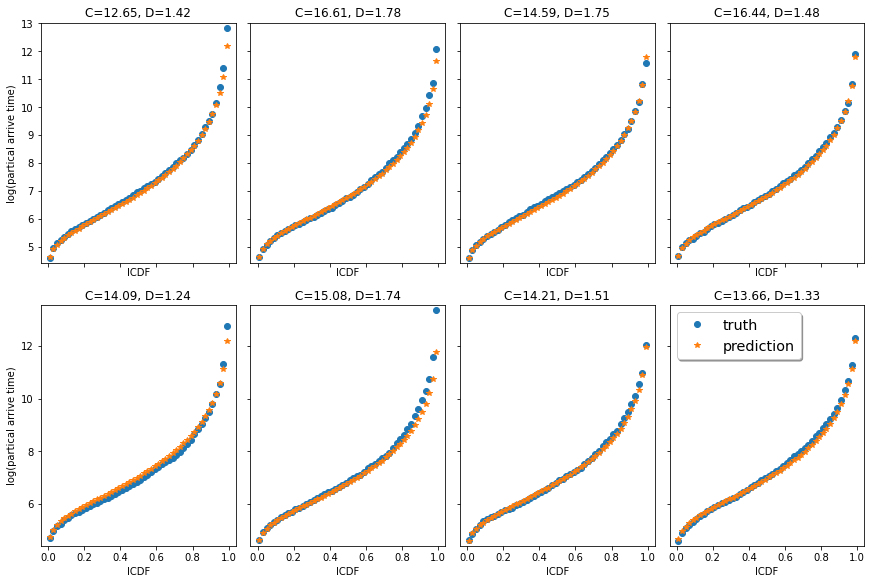

In [ ]:
test_ind = np.random.randint(0, len(testset),8)
with torch.no_grad():
    inputs, targets = testset[test_ind]
    inputs, targets = inputs.to(device), targets.to(device)
    best_trained_model.eval()
    outputs = best_trained_model(inputs)

plot_prediction(outputs.cpu().numpy(), targets.cpu().numpy(), inputs, title=path)

In [ ]:
dfs = result.fetch_trial_dataframes()
for key in dfs.keys():
  log = dfs[key]
  print(log.keys())

Streaming output truncated to the last 5000 lines.
       'iterations_since_restore', 'warmup_time'],
      dtype='object')
Index(['loss', 'time_this_iter_s', 'should_checkpoint', 'done',
       'timesteps_total', 'episodes_total', 'training_iteration', 'trial_id',
       'experiment_id', 'date', 'timestamp', 'time_total_s', 'pid', 'hostname',
       'node_ip', 'time_since_restore', 'timesteps_since_restore',
       'iterations_since_restore', 'warmup_time'],
      dtype='object')
Index(['loss', 'time_this_iter_s', 'should_checkpoint', 'done',
       'timesteps_total', 'episodes_total', 'training_iteration', 'trial_id',
       'experiment_id', 'date', 'timestamp', 'time_total_s', 'pid', 'hostname',
       'node_ip', 'time_since_restore', 'timesteps_since_restore',
       'iterations_since_restore', 'warmup_time'],
      dtype='object')
Index(['loss', 'time_this_iter_s', 'should_checkpoint', 'done',
       'timesteps_total', 'episodes_total', 'training_iteration', 'trial_id',
       'ex

### If results **saved**

In [7]:
path = '/content/drive/MyDrive/RESEARCH_fracture/net_files/checkpoint_corrected/'
files = os.listdir(path)
folders = [os.path.join(path, i) for i in files if '.' not in i]
latest_folder = max(folders, key=os.path.getctime)
latest_folder = '/content/drive/MyDrive/RESEARCH_fracture/net_files/checkpoint_corrected/01-06-2023-14-48-33'
print(latest_folder)
check_data = torch.load(latest_folder+'/ckp.pt')

best_config = check_data['Best trial config']
best_trained_model = Net(ls=best_config['ls'], n_l=best_config['n_l'])
best_trained_model.load_state_dict( check_data['model_state_dict'])
print(best_trained_model)
USE_GPU = True
if USE_GPU and torch.cuda.is_available():
    device = torch.device('cuda')
else:
    device = torch.device('cpu')
best_trained_model = best_trained_model.to(device)


/content/drive/MyDrive/RESEARCH_fracture/net_files/checkpoint_corrected/01-06-2023-14-48-33
Net(
  (fc1): Linear(in_features=6, out_features=64, bias=True)
  (linears): ModuleList(
    (0): Linear(in_features=64, out_features=64, bias=True)
    (1): Linear(in_features=64, out_features=64, bias=True)
  )
  (fcend): Linear(in_features=64, out_features=50, bias=True)
)


In [8]:
train_dataset, test_dataset = load_data(
    new_cd, P_cdf, 
    num_training=int(len(new_cd)*0.8), 
    num_test=int(len(new_cd)*0.2)
    )

loaded data.


In [9]:
test_loader = torch.utils.data.DataLoader(
    test_dataset,
    batch_size=500,
    shuffle=True,
    num_workers=0)
test_loss = 0.
test_steps = 0
for i, data in enumerate(test_loader, 0):
    with torch.no_grad():
        inputs, targets = data
        inputs, targets = inputs.to(device), targets.to(device)
        outputs = best_trained_model(inputs)

        loss = hel_loss(outputs, targets)
        # loss = nn.MSELoss()
        # loss = loss(outputs, targets)
        test_loss += loss.cpu().numpy()
        test_steps += 1
print(test_loss/test_steps)

0.12234701029956341


### continue training from the best checkpoint

In [10]:
device = "cpu"
if torch.cuda.is_available():
    device = "cuda:0"
print('training on device:', device)
best_trained_model.to(device) 
# optimizer = optim.SGD(net.parameters(), lr=config["lr"], momentum=0.9)
if best_config['opt'] == 'rms':
    optimizer = optim.RMSprop(best_trained_model.parameters(), lr=best_config["lr"])
elif best_config['opt'] == 'sgd':
    optimizer = optim.SGD(best_trained_model.parameters(), lr=best_config["lr"], momentum=0.9, nesterov=True)
elif best_config['opt'] == 'ada':
    optimizer = optim.Adagrad(best_trained_model.parameters(), lr=best_config["lr"])
elif best_config['opt'] == 'adam':
    optimizer = optim.Adam(best_trained_model.parameters(), lr=best_config["lr"], betas=(0.9, 0.999), amsgrad=False)

scheduler = ReduceLROnPlateau(optimizer, 'min', patience = 100, factor=0.5, verbose=True)

train_abs = int(len(trainset) * 0.8)
train_subset, val_subset = random_split(
    trainset, [train_abs, len(trainset) - train_abs])

trainloader = torch.utils.data.DataLoader(
    train_subset,
    batch_size=500,
    shuffle=True,
    num_workers=0)
valloader = torch.utils.data.DataLoader(
    val_subset,
    batch_size=500,
    shuffle=True,
    num_workers=0)

max_num_epochs = 1000
train_loss = []
validation_loss = []
for epoch in range(max_num_epochs):  # loop over the dataset multiple times
    running_loss = 0.0
    best_trained_model.train()
    train_steps = 0
    for i, data in enumerate(trainloader, 0):
        # get the inputs; data is a list of [inputs, targets]
        inputs, targets = data
        inputs, targets = inputs.to(device), targets.to(device)

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = best_trained_model(inputs)
        loss = hel_loss(outputs, targets) #use hellinger distance as the loss
        # loss = nn.MSELoss()
        # loss = loss(outputs, targets)
        loss.backward()
        optimizer.step()

        # print statistics
        running_loss += loss.item()
        train_steps += 1
    train_loss.append(running_loss/train_steps)    

    # Validation loss
    val_loss = 0.0
    val_steps = 0
    best_trained_model.eval()
    for i, data in enumerate(valloader, 0):
        with torch.no_grad():
            inputs, targets = data
            inputs, targets = inputs.to(device), targets.to(device)
            outputs = best_trained_model(inputs)

            loss = hel_loss(outputs, targets)
            # loss = nn.MSELoss()
            # loss = loss(outputs, targets)
            val_loss += loss.cpu().numpy()
            val_steps += 1
    validation_loss.append(val_loss / val_steps)
    if (epoch+1)%500 == 0:
        print(val_loss / val_steps)
    scheduler.step(val_loss)

training on device: cuda:0
Epoch 00180: reducing learning rate of group 0 to 2.9760e-03.
Epoch 00281: reducing learning rate of group 0 to 1.4880e-03.
Epoch 00393: reducing learning rate of group 0 to 7.4400e-04.
Epoch 00494: reducing learning rate of group 0 to 3.7200e-04.
0.11828074045479298
Epoch 00595: reducing learning rate of group 0 to 1.8600e-04.
Epoch 00696: reducing learning rate of group 0 to 9.3000e-05.
Epoch 00797: reducing learning rate of group 0 to 4.6500e-05.
Epoch 00903: reducing learning rate of group 0 to 2.3250e-05.
0.11646324954926968


In [11]:
test_loader = torch.utils.data.DataLoader(
    test_dataset,
    batch_size=500,
    shuffle=True,
    num_workers=0)
test_loss = 0.
test_steps = 0
for i, data in enumerate(test_loader, 0):
    with torch.no_grad():
        inputs, targets = data
        inputs, targets = inputs.to(device), targets.to(device)
        outputs = best_trained_model(inputs)

        loss = hel_loss(outputs, targets)
        # loss = nn.MSELoss()
        # loss = loss(outputs, targets)
        test_loss += loss.cpu().numpy()
        test_steps += 1
print('testing loss: ', test_loss/test_steps)

testing loss:  0.11750789731740952


In [12]:
with open(path+'training_stats.pkl', 'wb') as file:
    pkl.dump([train_loss, validation_loss, test_loss/test_steps], file)

[0.09285159 0.09921076 0.12467215 0.10905194 0.09606307 0.04894507
 0.19732542 0.07151558]


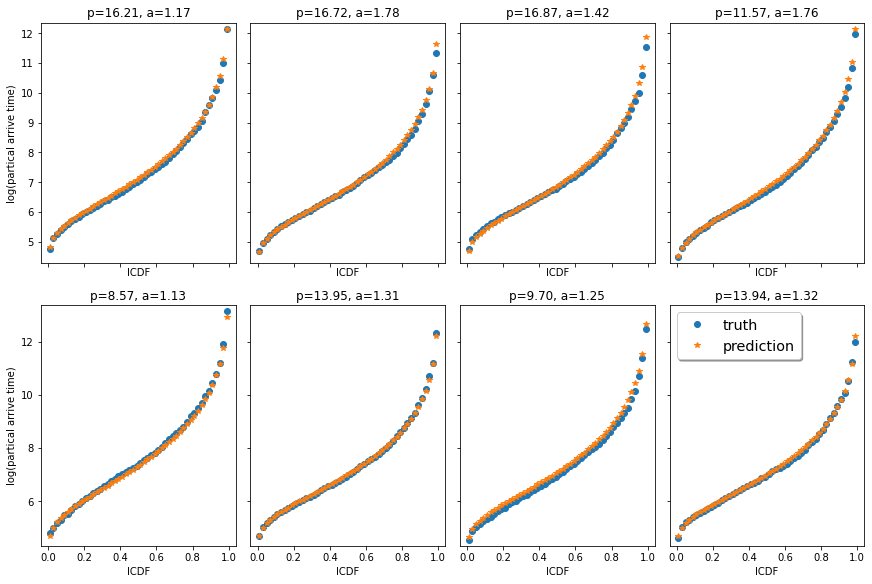

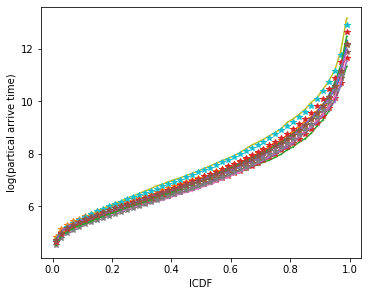

In [13]:
path = latest_folder + '/continue_train'
if not os.path.exists(path):
    os.makedirs(path)
torch.save(
    {
        # 'max_num_epochs': max_num_epochs,
        'model_state_dict': best_trained_model.state_dict(),
    },
    path+'/ckp.pt'
)

np.random.seed(88)
with torch.no_grad():
    inputs, targets = test_dataset[[np.random.randint(0, len(test_dataset), size=(8,))]]
    inputs, targets = inputs.to(device), targets.to(device)
    best_trained_model.eval()
    outputs = best_trained_model(inputs)
print(np.sqrt(np.sum((np.sqrt(outputs.cpu().numpy()) - np.sqrt(targets.cpu().numpy()))**2, axis=1)))
plot_prediction(outputs.cpu().numpy(), targets.cpu().numpy(), inputs.cpu().numpy(), title=path)
plot_in1(outputs.cpu(), targets.cpu(), inputs, title=path)

##plot illpose

In [14]:
%%capture
!apt install texlive-fonts-recommended texlive-fonts-extra cm-super dvipng

In [15]:
## find the bound of the ICDF as input
min_list = [P_cdf[i][0] for i in range(len(P_cdf))]
max_list = [P_cdf[i][-1] for i in range(len(P_cdf))]
print('minimal starting P_cdf is:', min(min_list))
print('maximal ending P_cdf is:', max(max_list))
print(P_cdf[0])
print(P_cdf[1])
# for i in range(len(P_cdf)):
#   P_cdf[i] = np.fft.fft(P_cdf[i])
# print(P_cdf[0])
# print(P_cdf[1])

minimal starting P_cdf is: 4.224150736722122
maximal ending P_cdf is: 14.043579133279582
[ 4.5092227   4.76115115  4.902595    5.03583022  5.13211734  5.20942314
  5.31380717  5.44087406  5.52283139  5.59001001  5.67496289  5.75988582
  5.82140255  5.89066376  5.96288676  6.03225676  6.07882069  6.16181334
  6.23096838  6.30368028  6.36542668  6.45930853  6.56145736  6.63750354
  6.72192609  6.79527849  6.88104843  6.99510946  7.09348778  7.20560419
  7.30380984  7.41016796  7.52842528  7.60752722  7.72346538  7.84457282
  7.9649126   8.08269724  8.21817095  8.38060171  8.57341709  8.76345213
  8.99999106  9.1915601   9.37122767  9.64785472 10.03626008 10.51140463
 11.11691518 12.20096759]
[ 4.63609201  4.88772208  5.02773968  5.14200896  5.22074527  5.31082885
  5.40622482  5.50570229  5.53510019  5.60805305  5.68399194  5.74859431
  5.83449213  5.89816399  5.97349231  6.05105065  6.09601593  6.16025063
  6.23457842  6.31379986  6.40699256  6.48020401  6.55418266  6.65648307
  6.72403

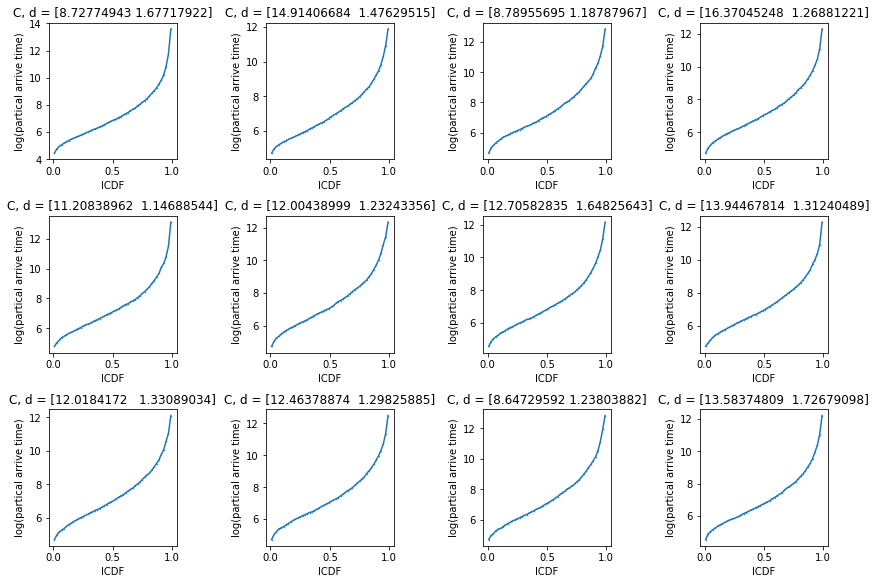

In [16]:
fig1, axs = plt.subplots(3, 4, figsize=(12,8), constrained_layout=True)
axs = axs.flat
np.random.seed(88)
rand_i = np.random.randint(0, high = len(X), size = 12)

for i, ax in zip(range(12), axs):
    ax.set_title('C, d = %s' %str(Y[rand_i[i]]))
    x = np.linspace(0.01, 0.99, 50)
    y = X[rand_i[i]]
    ax.plot(x, y, '.', ls='-', ms=1)
    ax.set_ylabel('log(partical arrive time)')
    ax.set_xlabel('ICDF')

In [17]:
path = '/content/drive/MyDrive/RESEARCH_fracture/net_files/checkpoint_corrected/'

In [18]:
SMALL_SIZE = 12
MEDIUM_SIZE = 14
BIGGER_SIZE = 16
plt.rc('font',**{'family':'serif','serif':['Times']})
plt.rcParams['text.usetex'] = True
plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=SMALL_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)


mse time:  0.08501291275024414
hellinger time:  0.11658978462219238
mse time:  0.08898186683654785
hellinger time:  0.11570954322814941
mse time:  0.08636593818664551
hellinger time:  0.11566781997680664


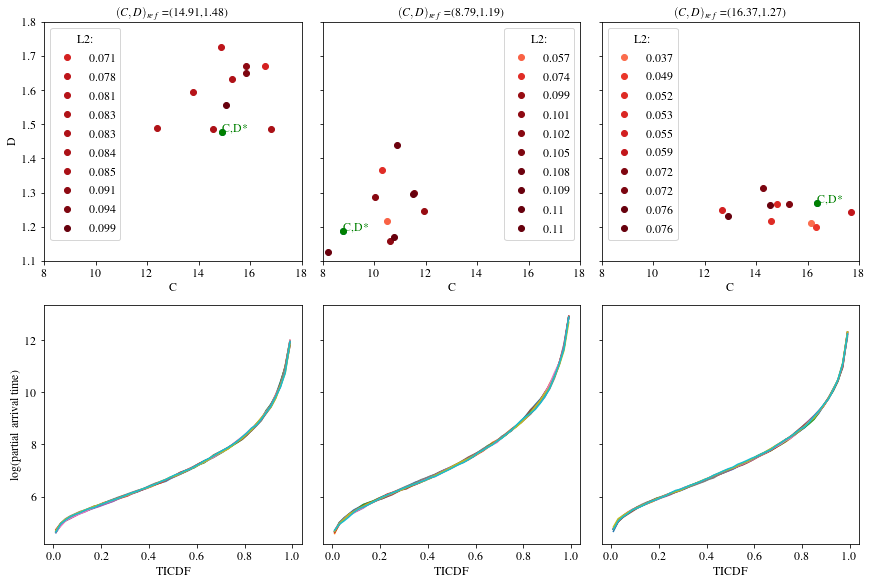

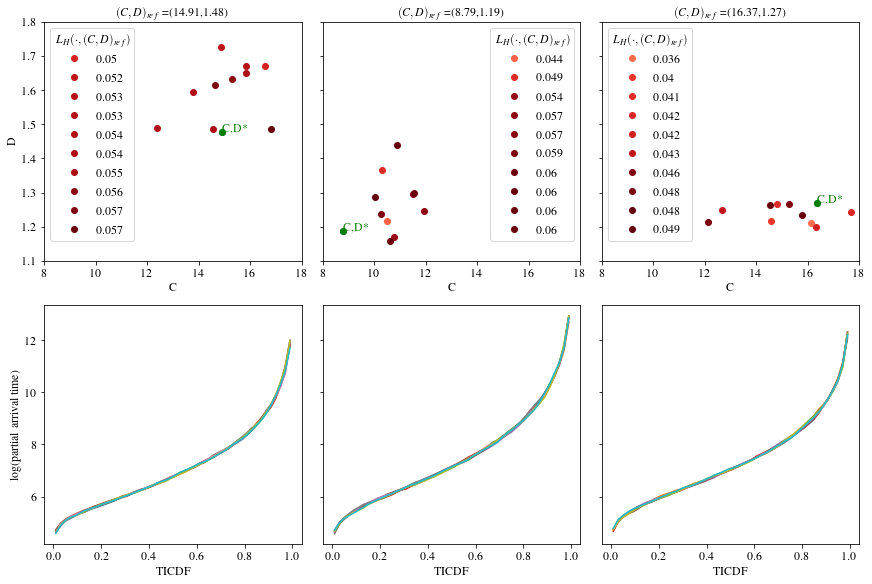

In [19]:
##calculate the hellinger loss of all cdfs with the first cdf
def hel_dist(P, Q):
  return np.sqrt(sum((np.sqrt(P) - np.sqrt(Q))**2))

# fig.savefig('C_d.pdf', format='pdf',bbox_inches='tight')
np.random.seed(88)
ind = np.random.randint(1, 10001, 6)-1
fig, axs = plt.subplots(2, 3, figsize=(12, 8),  sharey='row',
                             constrained_layout=True)
fig2, axs2 = plt.subplots(2,3, figsize=(12, 8),  sharey='row',
                             constrained_layout=True)
for k in range(3):
  mse_cdf = np.zeros((len(P_cdf)))
  hel_dists = np.zeros((len(P_cdf)))
  time1 = time.time()
  for i in range(len(P_cdf)):
    mse_cdf[i] = sum((P_cdf[i] - P_cdf[ind[k]])**2)
  time2 = time.time()
  print('mse time: ', time2-time1)
  time1 = time.time()
  for i in range(len(P_cdf)):
    hel_dists[i] = hel_dist(P_cdf[i], P_cdf[ind[k]])
  time2 = time.time()
  print('hellinger time: ', time2-time1)
  min_cdf_10 = np.argpartition(mse_cdf, 11)
  min_hel_10 = np.argpartition(hel_dists, 11)

  dist = mse_cdf[min_cdf_10[:11]]
  ind_dist = np.argsort(dist)
  min10 = C_d[min_cdf_10[:11]]
  dist, min10 = dist[ind_dist], min10[ind_dist]
  y1 = min10[:,0]
  y2 = min10[:,1]
  dist_hel = hel_dists[min_hel_10[:11]]
  ind_dist_hel = np.argsort(dist_hel)
  min10_hel = C_d[min_hel_10[:11]]
  dist_hel, min10_hel = dist_hel[ind_dist_hel], min10_hel[ind_dist_hel]
  y1_hel = min10_hel[:,0]
  y2_hel = min10_hel[:,1]
  axs[0,k].plot(y1[0], y2[0], "o")
  axs2[0,k].plot(y1_hel[0], y2_hel[0], 'o')
  color_map = plt.get_cmap("Reds")
  norm = mpl.colors.Normalize(vmin=min(dist), vmax=max(dist))
  for i,txt in enumerate(dist):
      if y1[i] == C_d[ind[k], 0] and y2[i] == C_d[ind[k], 1]:
        axs[0,k].plot(y1[i], y2[i], "o", color = 'g', )
        axs[0,k].annotate('{C,D}*', (C_d[ind[k], 0], C_d[ind[k], 1]), color = 'g')
      else:
        axs[0,k].plot(y1[i], y2[i], "o", color = color_map(norm(txt)), 
                      label=round(txt, 3))

      if y1_hel[i] == C_d[ind[k], 0] and y2_hel[i] == C_d[ind[k], 1]:
        axs2[0,k].plot(y1_hel[i], y2_hel[i], "o", color = 'g')
        axs2[0,k].annotate('{C,D}*', (C_d[ind[k], 0], C_d[ind[k], 1]), color = 'g')
      else:
        axs2[0,k].plot(y1_hel[i], y2_hel[i], "o", color = color_map(norm(txt)),
              label=round(dist_hel[i], 3))
  axs[0,k].legend(title='L2:')
  axs[0,k].set_xlabel("C")
  axs[0,k].set_xlim(8, 18)
  axs[0,k].set_title(
      "$(C,D)_{ref}$" + " =({:.2f},{:.2f})".format(C_d[ind[k], 0], C_d[ind[k], 1])
      )
      # r"\ is Number $\displaystyle\sum_{n=1}^\infty\frac{-e^{i\pi}}{2^n}$!",
      # fontsize=16, color='r')
  axs2[0,k].legend(title='$L_H(\cdot, (C,D)_{ref})$')
  axs2[0,k].set_xlabel("C")
  axs2[0,k].set_xlim(8, 18)
  #guofeng modified
  axs2[0,k].set_title(
      "$(C,D)_{ref}$" + " =({:.2f},{:.2f})".format(C_d[ind[k], 0], C_d[ind[k], 1])
      )
  for j in range(10):
    axs[1,k].plot(np.linspace(0.01, 0.99, 50), P_cdf[min_cdf_10[j]])
    axs[1,k].set_xlabel('TICDF')
    axs2[1,k].plot(np.linspace(0.01, 0.99, 50), P_cdf[min_hel_10[j]])
    axs2[1,k].set_xlabel('TICDF')
axs[0,0].set_ylabel("D")
axs[0,0].set_ylim(1.1,1.8)
axs2[0,0].set_ylabel("D")
axs2[0,0].set_ylim(1.1,1.8)
axs[1,0].set_ylabel('log(partial arrival time)')
axs2[1,0].set_ylabel('log(partial arrival time)')
# fig.suptitle('L2 distance')
# fig2.suptitle('Hellinger')    
fig.savefig(path+'illpose.pdf', format='pdf',bbox_inches='tight')
fig2.savefig(path+'illpose_hellinger.pdf', bbox_inches='tight')

In [20]:
print('how many gpu: ', torch.cuda.device_count())
# USE_GPU = False
USE_GPU = True
dtype = torch.float32 # we will be using float throughout this tutorial

if USE_GPU and torch.cuda.is_available():
    device = torch.device('cuda')
else:
    device = torch.device('cpu')

# Constant to control how frequently we print train loss
print_every = 100

print('using device:', torch.cuda.get_device_name())

how many gpu:  1
using device: A100-SXM4-40GB


## grid searching

In [21]:
device = "cpu"
if torch.cuda.is_available():
    device = "cuda:0"

path = '/content/drive/MyDrive/RESEARCH_fracture/net_files/checkpoint_corrected/'
files = os.listdir(path)
folders = [os.path.join(path, i) for i in files if '.' not in i]
latest_folder = max(folders, key=os.path.getmtime)
latest_folder = '/content/drive/MyDrive/RESEARCH_fracture/net_files/checkpoint_corrected/01-06-2023-14-48-33'
print(latest_folder)
check_data = torch.load(latest_folder+'/ckp.pt')
best_config = check_data['Best trial config']
best_trained_model = Net(ls=best_config['ls'], n_l=best_config['n_l']).to(device)


continue_path = latest_folder + '/continue_train'
dict_data = torch.load(continue_path+'/ckp.pt')
best_trained_model.load_state_dict( dict_data['model_state_dict'])
print(best_trained_model)

/content/drive/MyDrive/RESEARCH_fracture/net_files/checkpoint_corrected/01-06-2023-14-48-33
Net(
  (fc1): Linear(in_features=6, out_features=64, bias=True)
  (linears): ModuleList(
    (0): Linear(in_features=64, out_features=64, bias=True)
    (1): Linear(in_features=64, out_features=64, bias=True)
  )
  (fcend): Linear(in_features=64, out_features=50, bias=True)
)


In [22]:
os.getcwd()

'/content'

[0.09285159 0.09921076 0.12467215 0.10905194 0.09606307 0.04894507
 0.19732542 0.07151558]


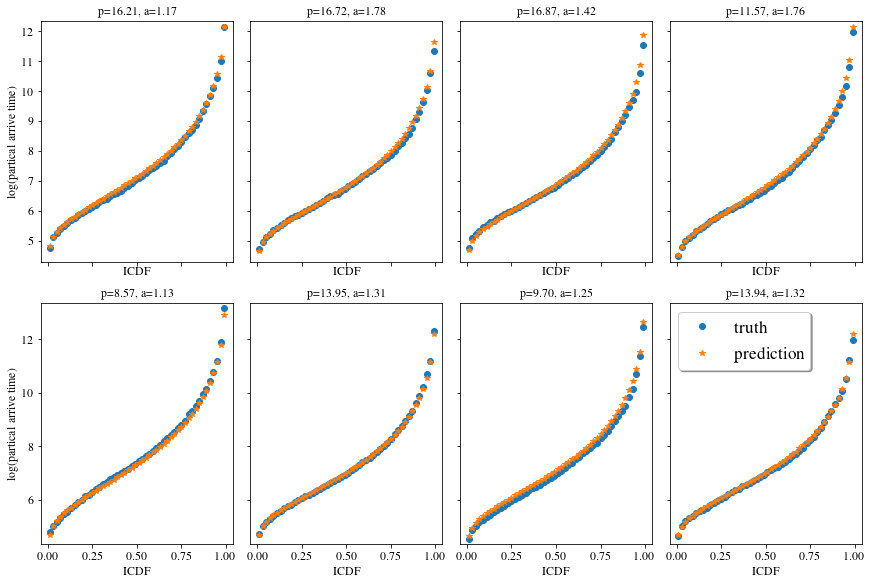

In [23]:
np.random.seed(88)
with torch.no_grad():
    inputs, targets = testset[[np.random.randint(0, len(testset), size=(8,))]]
    inputs, targets = inputs.to(device), targets.to(device)
    best_trained_model.eval()
    outputs = best_trained_model(inputs)
print(np.sqrt(np.sum((np.sqrt(outputs.cpu().numpy()) - np.sqrt(targets.cpu().numpy()))**2, axis=1)))
plot_prediction(outputs.cpu().numpy(), targets.cpu().numpy(), inputs.cpu().numpy(), title=path)

In [24]:
def plot_prediction1(outputs, targets, inputs, title=''):

    fig1, axs = plt.subplots(len(targets)//4, 4, figsize=(12,4), 
                             sharey = 'row', sharex=True,
                             constrained_layout=True)
    axs = axs.flat
    ylims = [
              [np.min(targets[:4,])-0.2, np.max(targets[:4,])+0.2],
              #[np.min(targets[4:,])-0.2, np.max(targets[4:,])+0.2]
    ]
    zeros_ind = outputs==0.   
    for ax, i, out, tar in zip(axs, range(len(outputs)), outputs, targets):
        CD =  inputs[i][:2]
        ax.set_title('p={:.2f}, a={:.2f}'.format(CD[0], CD[1]))
        x = np.linspace(0.01, 0.99, 50)
        ax.plot(x, tar, 'o', label='truth')
        ax.plot(x, out, '*', label='prediction')
        ylim = ylims[0] if i<4 else ylims[1]
        if np.any(zeros_ind):
            ax.plot(x[zeros_ind[i]], 
                    [ylim[0]+0.1 for i in range(len(x[zeros_ind[i]]))],
                    'x', color='r', label='zero predictions')

        ax.set_ylim(ylim)
        ax.set_xlabel('ICDF')
        if i==0:
          ax.legend(loc='upper left', shadow=True, fontsize='x-large')
    axs[0].set_ylabel('log(partical arrive time)')
    #axs[4].set_ylabel('log(partical arrive time)')
    plt.show()
    fig1.savefig(title+'/test1.pdf')
    fig1.savefig(title+'/test1.png')
    return

[0.09285159 0.09921076 0.12467215 0.10905194]


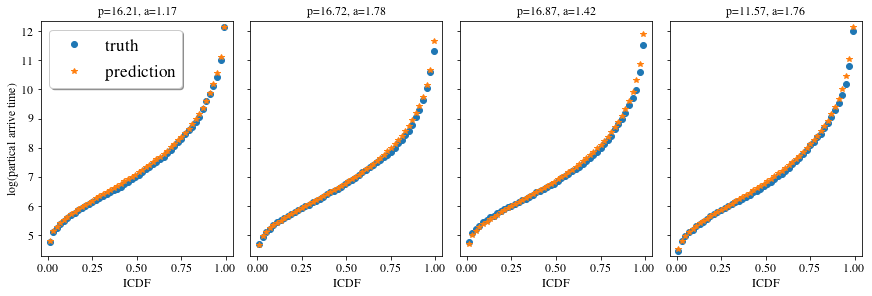

In [25]:
np.random.seed(88)
with torch.no_grad():
    inputs, targets = testset[[np.random.randint(0, len(testset), size=(4,))]]
    inputs, targets = inputs.to(device), targets.to(device)
    best_trained_model.eval()
    outputs = best_trained_model(inputs)
print(np.sqrt(np.sum((np.sqrt(outputs.cpu().numpy()) - np.sqrt(targets.cpu().numpy()))**2, axis=1)))
plot_prediction1(outputs.cpu().numpy(), targets.cpu().numpy(), inputs.cpu().numpy(), title=path)

In [26]:
sig = 0.4

In [29]:
start = time.time()
## grid searching
C = np.linspace(8, 18, 10000)
# D = k*C +b
D = np.linspace(1.1, 3, 1000)
C, D = np.meshgrid(C, D)
mesh_shape = C.shape
C, D = np.reshape(C,(-1,)), np.reshape(D, (-1))
all_pairs = np.array([C, D, C**(1/D), C**(-D), C*D, 1/D]).T
best_trained_model.eval()
all_outputs = torch.FloatTensor([]).to(device)
batch_size = 50000
with torch.no_grad():
    for i in range(0, len(all_pairs), batch_size):
        if i+batch_size < len(all_pairs):
            batch = all_pairs[i:i+batch_size]
        else:
            batch = all_pairs[i:]
        batch_input = torch.FloatTensor(batch).to(device)
        outputs = best_trained_model(batch_input)
        all_outputs = torch.cat((all_outputs, outputs), 0)

end1 = time.time()


[1876  876  724]


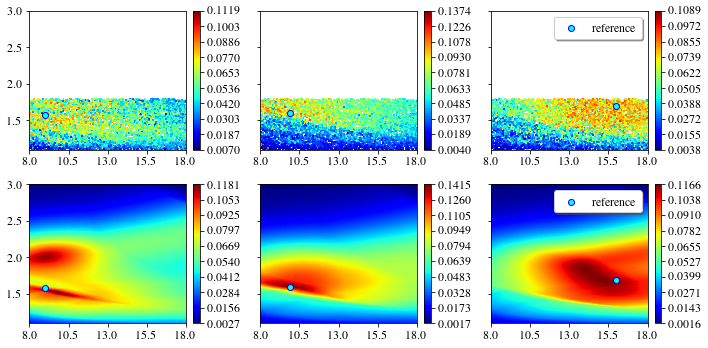

In [30]:
np.random.seed(111)
ind = np.random.randint(0, len(testset), size=3)
print(ind)
fig, axs = plt.subplots(2, 3, figsize=(10, 5),  sharey='row',)
axs = axs.flat
for i_ind, i in enumerate(ind):
    ref_C = testset[i][0][0].cpu().numpy().item() ## C
    ref_D = testset[i][0][1].cpu().numpy().item()
    ref_input = testset[i][0].to(device)
    
    ## plot the scatter plot with the dataset:
    with torch.no_grad():
        # ref_out = best_trained_model(ref_input)
        ref_out = testset[i][1].cpu().numpy()
        # ref_out = ref_out.cpu().detach().numpy()
        all_hel_loss = np.sqrt(np.sum((np.sqrt(P_cdf) - np.sqrt(ref_out))**2, axis=1))
    p = 1/(sig*np.sqrt(2*np.pi))*np.exp(-all_hel_loss/(2*sig**2))
    p = p/np.sum(p*(10/101)*(1.9/101))
    ax = axs[i_ind]
    c01map = ax.scatter(C_d[:,0], C_d[:,1], c=p, cmap='jet', marker=",", s = 0.5,
                        # interpolation='nearest',
              # extent=[C_d[:,0].min(), C_d[:,0].max(), C_d[:,1].min(), C_d[:,1].max()],
              vmin=p.min(), vmax = p.max(),
              # origin='lower',aspect='auto'
              )

    ax.set_xlim(8, 18)
    ax.set_xticks(np.linspace(8, 18, 5, endpoint=True))
    ax.set_ylim(1.1, 3)
    # ax.set_xlabel('C [-]')
    # ax.set_ylabel('D [-]')
    v1 = np.linspace(np.min(p), np.max(p), 10, endpoint=True)
    fig.colorbar(c01map, ax=ax, fraction=0.05, pad=0.04,ticks=v1,)
    ax.scatter(ref_C, ref_D, c='aqua',edgecolors='b',label='reference')

    ## plot the map with the nn surrogate
    ax = axs[i_ind+3]
    with torch.no_grad():
        # ref_out = best_trained_model(ref_input)
        ref_out = testset[i][1].to(device)
        # ref_out = ref_out.cpu().detach().numpy()
        all_hel_loss = torch.sqrt(torch.sum((torch.sqrt(all_outputs) - torch.sqrt(ref_out))**2, dim=1))
    all_hel_loss = all_hel_loss.data.cpu().numpy()
    p = 1/(sig*np.sqrt(2*np.pi))*np.exp(-all_hel_loss/(2*sig**2))
    p = p/np.sum(p*(10/9999)*(1.9/999))
    p = np.reshape(p, mesh_shape)
    c01map = ax.imshow(p, cmap='jet', interpolation='nearest',
              extent=[C.min(), C.max(), D.min(), D.max()],
              vmin=p.min(), vmax = p.max(),
              origin='lower',aspect='auto')
    ax.set_xlim(8, 18)
    ax.set_xticks(np.linspace(8, 18, 5, endpoint=True))
    ax.set_ylim(1.1, 3)
    # ax.set_xlabel('C [-]')
    # ax.set_ylabel('D [-]')
    v1 = np.linspace(np.min(p), np.max(p), 10, endpoint=True)
    fig.colorbar(c01map, ax=ax, fraction=0.05, pad=0.04,ticks=v1,)
    ax.scatter(ref_C, ref_D, c='aqua',edgecolors='b',label='reference')
axs[2].legend(shadow=True,loc='upper right')
ax.legend(shadow=True,loc='upper right')
plt.tight_layout()
fig.savefig(continue_path+'/posterior1.pdf', format='pdf',bbox_inches='tight')
plt.show()
end2 = time.time()

[1876  876  724]


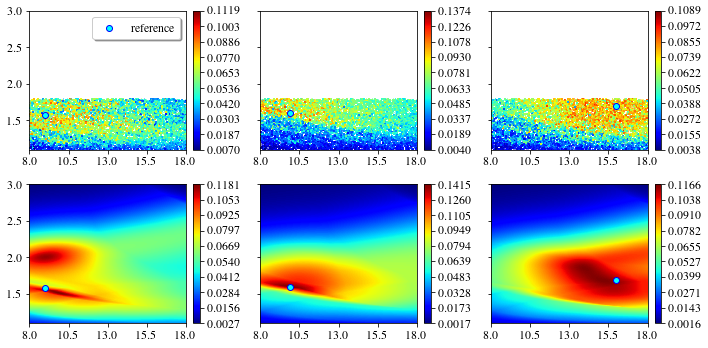

In [31]:
np.random.seed(111)
ind = np.random.randint(0, len(testset), size=3)
print(ind)
fig, axs = plt.subplots(2, 3, figsize=(10, 5),  sharey='row',)
axs = axs.flat
for i_ind, i in enumerate(ind):
    ref_C = testset[i][0][0].cpu().numpy().item() ## C
    ref_D = testset[i][0][1].cpu().numpy().item()
    ref_input = testset[i][0].to(device)
    
    ## plot the scatter plot with the dataset:
    with torch.no_grad():
        # ref_out = best_trained_model(ref_input)
        ref_out = testset[i][1].cpu().numpy()
        # ref_out = ref_out.cpu().detach().numpy()
        all_hel_loss = np.sqrt(np.sum((np.sqrt(P_cdf) - np.sqrt(ref_out))**2, axis=1))
    p = 1/(sig*np.sqrt(2*np.pi))*np.exp(-all_hel_loss/(2*sig**2))
    p = p/np.sum(p*(10/101)*(1.9/101))
    ax = axs[i_ind]
    c01map = ax.scatter(C_d[:,0], C_d[:,1], c=p, cmap='jet', marker=",", s = 0.5,
                        # interpolation='nearest',
              # extent=[C_d[:,0].min(), C_d[:,0].max(), C_d[:,1].min(), C_d[:,1].max()],
              vmin=p.min(), vmax = p.max(),
              # origin='lower',aspect='auto'
              )

    ax.set_xlim(8, 18)
    ax.set_xticks(np.linspace(8, 18, 5, endpoint=True))
    ax.set_ylim(1.1, 3)
    # ax.set_xlabel('C [-]')
    # ax.set_ylabel('D [-]')
    v1 = np.linspace(np.min(p), np.max(p), 10, endpoint=True)
    fig.colorbar(c01map, ax=ax, fraction=0.05, pad=0.04,ticks=v1,)
    ax.scatter(ref_C, ref_D, c='aqua',edgecolors='b',label='reference')
    if i_ind==0:
      ax.legend(shadow=True,loc='upper right')

    ## plot the map with the nn surrogate
    ax = axs[i_ind+3]
    with torch.no_grad():
        # ref_out = best_trained_model(ref_input)
        ref_out = testset[i][1].to(device)
        # ref_out = ref_out.cpu().detach().numpy()
        all_hel_loss = torch.sqrt(torch.sum((torch.sqrt(all_outputs) - torch.sqrt(ref_out))**2, dim=1))
    all_hel_loss = all_hel_loss.data.cpu().numpy()
    p = 1/(sig*np.sqrt(2*np.pi))*np.exp(-all_hel_loss/(2*sig**2))
    p = p/np.sum(p*(10/9999)*(1.9/999))
    p = np.reshape(p, mesh_shape)
    c01map = ax.imshow(p, cmap='jet', interpolation='nearest',
              extent=[C.min(), C.max(), D.min(), D.max()],
              vmin=p.min(), vmax = p.max(),
              origin='lower',aspect='auto')
    ax.set_xlim(8, 18)
    ax.set_xticks(np.linspace(8, 18, 5, endpoint=True))
    ax.set_ylim(1.1, 3)
    # ax.set_xlabel('C [-]')
    # ax.set_ylabel('D [-]')
    v1 = np.linspace(np.min(p), np.max(p), 10, endpoint=True)
    fig.colorbar(c01map, ax=ax, fraction=0.05, pad=0.04,ticks=v1,)
    ax.scatter(ref_C, ref_D, c='aqua',edgecolors='b',label='reference')
# axs[2].legend(shadow=True,loc='upper right')
# ax.legend(shadow=True,loc='upper right')
plt.tight_layout()
fig.savefig(continue_path+'/posterior2.pdf', format='pdf',bbox_inches='tight')
plt.show()
end2 = time.time()

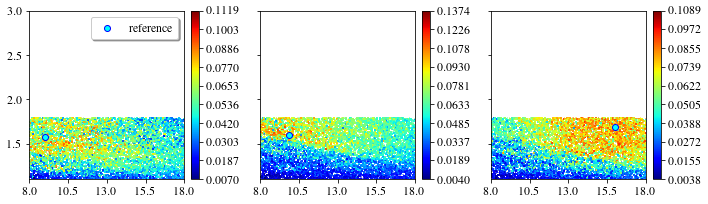

In [36]:
## postrior with the orginal dataset

## grid searching
# P_cdf = np.asarray(P_cdf)
# C_d = np.asarray(C_d)

fig, axs = plt.subplots(1, 3, figsize=(10, 3),  sharey='row', sharex='col')

for i, ax in zip(ind, axs.flat):
    ref_C = testset[i][0][0].cpu().numpy().item() ## C
    ref_D = testset[i][0][1].cpu().numpy().item()
    
    with torch.no_grad():
        # ref_out = best_trained_model(ref_input)
        ref_out = testset[i][1].cpu().numpy()
        # ref_out = ref_out.cpu().detach().numpy()
        all_hel_loss = np.sqrt(np.sum((np.sqrt(P_cdf) - np.sqrt(ref_out))**2, axis=1))
    p = 1/(sig*np.sqrt(2*np.pi))*np.exp(-all_hel_loss/(2*sig**2))
    p = p/np.sum(p*(10/101)*(1.9/101))

    c01map = ax.scatter(C_d[:,0], C_d[:,1], c=p, cmap='jet', marker=",", s = 0.5,
                        # interpolation='nearest',
              # extent=[C_d[:,0].min(), C_d[:,0].max(), C_d[:,1].min(), C_d[:,1].max()],
              vmin=p.min(), vmax = p.max(),
              # origin='lower',aspect='auto'
              )
    ax.set_xlim(8, 18)
    ax.set_xticks(np.linspace(8, 18, 5, endpoint=True))
    ax.set_ylim(1.1, 3)
    # ax.set_xlabel('C [-]')
    # ax.set_ylabel('D [-]')
    v1 = np.linspace(np.min(p), np.max(p), 10, endpoint=True)
    fig.colorbar(c01map, ax=ax, fraction=0.05, pad=0.04,ticks=v1,)
    ax.scatter(ref_C, ref_D, c='aqua',edgecolors='b',label='reference')
    if i==1876:
      ax.legend(shadow=True,loc='upper right')

    # ax1.set_ylim([0, 12])
    # ax.set_xlabel('C [-]')
    # ax.set_ylabel('D [-]')
plt.tight_layout()
fig.savefig(continue_path+'/density_sparse.pdf', format='pdf',bbox_inches='tight')
plt.show()
# end2 = time.time()

8.999284744262695 1.5757750272750854
9.875330924987793 1.5940502882003784
16.00514030456543 1.6901872158050537


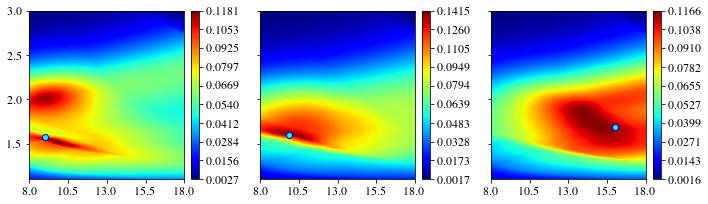

In [37]:
fig, axs = plt.subplots(1, 3, figsize=(10, 3),  sharey='row',)
axs = axs.flat
for i_ind, i in enumerate(ind):
    ref_C = testset[i][0][0].cpu().numpy().item() ## C
    ref_D = testset[i][0][1].cpu().numpy().item()
    ref_input = testset[i][0].to(device)
    
    ## plot the scatter plot with the dataset:
#    with torch.no_grad():
#        # ref_out = best_trained_model(ref_input)
##        ref_out = testset[i][1].cpu().numpy()
#        # ref_out = ref_out.cpu().detach().numpy()
#        all_hel_loss = np.sqrt(np.sum((np.sqrt(P_cdf) - np.sqrt(ref_out))**2, axis=1))
#    p = 1/(sig*np.sqrt(2*np.pi))*np.exp(-all_hel_loss/(2*sig**2))
#    p = p/np.sum(p*(10/101)*(1.9/101))
#    ax = axs[i_ind]
##    c01map = ax.scatter(C_d[:,0], C_d[:,1], c=p, cmap='jet', marker=",", s = 0.5,
#                        # interpolation='nearest',
#              # extent=[C_d[:,0].min(), C_d[:,0].max(), C_d[:,1].min(), C_d[:,1].max()],
 #             vmin=p.min(), vmax = p.max(),
 #             # origin='lower',aspect='auto'
 #             )
#
 #   ax.set_xlim(8, 18)
 #   ax.set_xticks(np.linspace(8, 18, 5, endpoint=True))
 #   ax.set_ylim(1.1, 3)
 #   # ax.set_xlabel('C [-]')
 #   # ax.set_ylabel('D [-]')
 #   v1 = np.linspace(np.min(p), np.max(p), 10, endpoint=True)
 #   fig.colorbar(c01map, ax=ax, fraction=0.05, pad=0.04,ticks=v1,)
 #   ax.scatter(ref_C, ref_D, c='aqua',edgecolors='b',label='reference')

    ## plot the map with the nn surrogate
    ax = axs[i_ind]
    with torch.no_grad():
        # ref_out = best_trained_model(ref_input)
        ref_out = testset[i][1].to(device)
        # ref_out = ref_out.cpu().detach().numpy()
        all_hel_loss = torch.sqrt(torch.sum((torch.sqrt(all_outputs) - torch.sqrt(ref_out))**2, dim=1))
    all_hel_loss = all_hel_loss.data.cpu().numpy()
    p = 1/(sig*np.sqrt(2*np.pi))*np.exp(-all_hel_loss/(2*sig**2))
    p = p/np.sum(p*(10/9999)*(1.9/999))
    p = np.reshape(p, mesh_shape)
    c01map = ax.imshow(p, cmap='jet', interpolation='nearest',
              extent=[C.min(), C.max(), D.min(), D.max()],
              vmin=p.min(), vmax = p.max(),
              origin='lower',aspect='auto')
    ax.set_xlim(8, 18)
    ax.set_xticks(np.linspace(8, 18, 5, endpoint=True))
    ax.set_ylim(1.1, 3)
    # ax.set_xlabel('C [-]')
    # ax.set_ylabel('D [-]')
    v1 = np.linspace(np.min(p), np.max(p), 10, endpoint=True)
    fig.colorbar(c01map, ax=ax, fraction=0.05, pad=0.04,ticks=v1,)
    ax.scatter(ref_C, ref_D, c='aqua',edgecolors='b',label='reference')
    print(ref_C,ref_D)
    # if i_ind==0:
    #   ax.legend(shadow=True,loc='upper right')
#axs[2].legend(shadow=True,loc='upper left')
#ax.legend(shadow=True,loc='upper left')
plt.tight_layout()
fig.savefig(continue_path+'/posterior3.pdf', format='pdf',bbox_inches='tight')
plt.show()
end2 = time.time()

In [34]:
print('run {} forward simulations needs {:.2f} seconds'.format(len(all_hel_loss), end1-start))
print('compute the posterior for 6 simulations and plotting takes {:.2f} seconds'.format(end2-end1))

run 10000000 forward simulations needs 1.45 seconds
compute the posterior for 6 simulations and plotting takes 218.29 seconds
